In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from scipy.interpolate import CubicSpline
from scipy import signal
import json
import os
import sklearn

In [2]:
tf.config.experimental.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [3]:
from google.colab import files

In [4]:
uploaded = files.upload()

Saving usable_data.txt to usable_data.txt


In [5]:
type(uploaded.values())

dict_values

In [6]:
uploaded

{'usable_data.txt': b'[{"gas": "N2", "database": "Biagi", "elastic": {"gas": "N2", "database": "Biagi", "thresh": 1.95e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544

In [7]:
uploaded.values

<function dict.values>

In [8]:
print(type(uploaded))

<class 'dict'>


In [9]:
uploaded

{'usable_data.txt': b'[{"gas": "N2", "database": "Biagi", "elastic": {"gas": "N2", "database": "Biagi", "thresh": 1.95e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544

In [11]:
for species in uploaded:
  print(species)

usable_data.txt


In [12]:
data = uploaded['usable_data.txt']

In [13]:
print(type(data))

<class 'bytes'>


In [14]:
data_str = data.decode('utf-8')

In [15]:
json_data = json.dumps(data_str)

In [16]:
usable_data_latest = '[{"gas": "N2", "database": "Biagi", "elastic": {"gas": "N2", "database": "Biagi", "thresh": 1.95e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [5.949376639133945e-20, 6.131469818074801e-20, 6.320587282896038e-20, 6.515913653981583e-20, 6.71744644735211e-20, 6.925104704273283e-20, 7.127481309727256e-20, 7.314891186548283e-20, 7.507262529062305e-20, 7.704689646759236e-20, 7.890446876337094e-20, 8.079084286284147e-20, 8.27180638083209e-20, 8.460166240501933e-20, 8.652829311923713e-20, 8.838254644227031e-20, 9.01907658655359e-20, 9.194852005998132e-20, 9.361163434808685e-20, 9.535109214285191e-20, 9.717795347983738e-20, 9.900242802836551e-20, 1.008531828028567e-19, 1.0288384885584341e-19, 1.0504559606731581e-19, 1.072924532817848e-19, 1.0936100883679342e-19, 1.1084187495320565e-19, 1.1219348628250873e-19, 1.1283740315900543e-19, 1.1218894363753234e-19, 1.115438458160456e-19, 1.1090276014610351e-19, 1.102654920063481e-19, 1.0951623460800627e-19, 1.0765152386580732e-19, 1.0663860198030064e-19, 1.0837777410417234e-19, 1.1014562036414535e-19, 1.1194209151573252e-19, 1.237320444601671e-19, 1.473709600888261e-19, 1.7841827379924167e-19, 1.8346263739814012e-19, 2.1060581999268626e-19, 2.0730808613752165e-19, 2.445790193420443e-19, 2.072868032368989e-19, 1.780759670195416e-19, 1.6333794685469934e-19, 1.3735117609547442e-19, 1.1499344320071587e-19, 1.0376114543818329e-19, 9.828282793398945e-20, 9.371301222109917e-20, 9.077571020111272e-20, 8.905529255561417e-20, 8.762454706729687e-20, 8.608769668043848e-20, 8.482030052403577e-20, 8.384957655573837e-20, 8.318165880352852e-20, 8.25933971659685e-20, 8.20090459315844e-20, 8.234180731914728e-20, 8.269068603137688e-20, 8.304110499468699e-20, 8.33928695325526e-20, 8.370740535833359e-20, 8.346967474811306e-20, 8.3231862298994e-20, 8.299601944133909e-20, 8.275907866631007e-20, 8.252370400354281e-20, 8.228937553590722e-20, 8.205479585634715e-20, 8.18213615652286e-20, 8.144922563108593e-20, 7.989394578113441e-20, 7.821414501838892e-20, 7.612552066098668e-20, 7.382120493102262e-20, 7.146839231657938e-20, 6.924831863132946e-20, 6.694142533961727e-20, 6.492416521294657e-20, 6.28364282664725e-20, 6.072074198769846e-20, 5.849824894858854e-20, 5.597537925683187e-20, 5.2917074277363396e-20, 4.9439255703425975e-20, 4.600870688739556e-20, 4.28919145987507e-20, 3.9824679178874105e-20, 3.7135228706578015e-20, 3.443120459273693e-20, 3.149750945160895e-20, 2.882158911546871e-20, 2.6666961889613366e-20]}, "ionization": {"gas": "N2", "database": "Biagi", "thresh": 15.581, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.7514345738076207e-22, 1.2376241452658704e-21, 2.429388396532603e-21, 3.8603488003870156e-21, 5.417172481057928e-21, 7.142382385904134e-21, 9.161451016178709e-21, 1.108865737220257e-20, 1.2903677955397095e-20, 1.4746748933068945e-20, 1.6289406681861588e-20, 1.7942307348345403e-20, 1.93492838741499e-20, 2.0633228934754576e-20, 2.1793890430832445e-20, 2.2789501429095338e-20, 2.358788182018761e-20, 2.434228161975447e-20, 2.4752285342844106e-20, 2.490489305927308e-20, 2.469758366936731e-20, 2.4492271072358012e-20, 2.4288173131281737e-20, 2.4085914552377672e-20, 2.388541094988956e-20, 2.3294729539962322e-20, 2.2628211938369743e-20, 2.182467308573464e-20, 2.096096521918434e-20, 2.0078050300244484e-20, 1.9196369989411022e-20, 1.840080970561749e-20, 1.7597999453765554e-20, 1.6760044902304314e-20, 1.5911275521201832e-20, 1.5057066517346618e-20, 1.4217783804619152e-20, 1.3416219929294064e-20, 1.2617522127742081e-20, 1.1745745692518873e-20, 1.0936000178853358e-20, 1.0195261467699721e-20, 9.609336828216072e-21, 9.101437574709483e-21, 8.523221432887668e-21, 8.003247631199076e-21, 7.508356675191184e-21, 7.03828297649221e-21, 6.592609573932815e-21, 6.171026812201184e-21, 5.7727810569134075e-21, 5.396979060099628e-21, 5.0428296990203535e-21, 4.709495861498401e-21, 4.396109070776071e-21, 4.101782164506581e-21, 3.825620155035234e-21, 3.5667294147357124e-21, 3.324225338719199e-21, 3.0973054679461918e-21, 2.885192214040229e-21, 2.6868960235000555e-21, 2.5016220436222047e-21, 2.328605120378552e-21, 2.1671113548392455e-21, 2.0164390815376778e-21, 1.8759193617860543e-21, 1.744916074360957e-21, 1.6228256759839514e-21, 1.509076694742583e-21]}, "excitation": {"gas": "N2", "database": "Biagi", "thresh": 0.2889, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6.709618961799807e-24, 2.313161014977925e-23, 2.741348123169728e-23, 2.96996506222541e-23, 3.1547075458112134e-23, 3.340823647179503e-23, 3.477416915730418e-23, 3.587593827473943e-23, 3.747688671051365e-23, 3.964259996798408e-23, 4.321201041609353e-23, 4.995004913145898e-23, 5.919701215528434e-23, 7.316381099199192e-23, 1.0089080361389471e-22, 1.521859648441819e-22, 2.5701194538356026e-22, 4.889425630367928e-22, 1.135485622994414e-21, 8.011286143067491e-21, 3.833411368955124e-20, 3.3408909327759394e-20, 2.254406213393115e-20, 3.2277305931592365e-20, 2.5665199191014942e-20, 1.419355097188423e-20, 8.248974124227035e-21, 4.307823066581714e-21, 2.867510732985281e-21, 1.8804233509855285e-21, 7.642742747557475e-22, 6.337011754698447e-22, 5.240825478328171e-22, 4.0422663730578207e-22, 2.7208989979282237e-22, 2.182184543338926e-22, 1.7661589135160185e-22, 1.3206772144177703e-22, 1.4790904170526597e-22, 1.8797885946415026e-22, 2.318718469055275e-22, 2.801211606413119e-22, 3.704543935478818e-22, 5.2331406434025365e-22, 9.975790892464513e-22, 1.4111193128588048e-21, 9.835749148034511e-22, 6.70882268863815e-22, 4.501562363509548e-22, 2.305361039374398e-22, 2.0504684007513214e-22, 1.8885247657465634e-22, 1.7111703441059484e-22, 1.516033346765977e-22, 1.301425329361514e-22, 1.1468429981102452e-22, 1.0434877952219219e-22, 9.299136174348038e-23, 8.05546692796166e-23, 6.688682296535359e-23, 5.846058472298769e-23, 5.53876903275102e-23, 5.19617986063544e-23, 4.824766405382323e-23, 4.4155466926372065e-23, 3.969359551321424e-23, 3.474364877374665e-23, 3.005063715087715e-23, 2.9393396779484284e-23, 2.873109303566935e-23, 2.8037065902188254e-23, 2.7294498288787744e-23, 2.6489908175026174e-23, 2.5559423319118476e-23, 2.4575980876946394e-23, 2.348476533209975e-23, 2.2298205028817007e-23, 2.09835522115931e-23, 1.955018758770794e-23, 1.794859569675053e-23, 1.6210458422794293e-23, 1.431340384098088e-23, 1.2217369507298666e-23, 9.904989870527332e-24, 7.370509091947984e-24, 4.608302420030456e-24, 1.4854029811589717e-24, 1.044343204363944e-24]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03887, 0.0389, 0.03894, 0.03899, 0.03905, 0.03914, 0.03925, 0.0394, 0.03959, 0.03984, 0.04016, 0.04057, 0.0411, 0.04176, 0.04259, 0.04362, 0.04489, 0.04645, 0.04834, 0.0506, 0.05329, 0.05643, 0.06008, 0.06427, 0.06899, 0.07427, 0.08006, 0.08633, 0.09298, 0.09993, 0.107, 0.1141, 0.121, 0.1278, 0.1345, 0.1411, 0.1479, 0.1551, 0.163, 0.1719, 0.182, 0.1938, 0.2075, 0.2237, 0.2427, 0.2651, 0.2913, 0.3216, 0.3561, 0.3946, 0.4367, 0.4815, 0.528, 0.5752, 0.622, 0.6675, 0.7111, 0.7522, 0.7906, 0.826, 0.8586, 0.8884, 0.9158, 0.941, 0.9643, 0.9861, 1.007, 1.027, 1.047, 1.067, 1.088, 1.112, 1.146, 1.208, 1.344, 1.627, 2.139, 2.865, 3.702, 4.536, 5.29, 5.955, 6.546, 7.082, 7.586, 8.078, 8.571, 9.08, 9.613, 10.18, 10.8, 11.47, 12.21, 13.02, 13.94, 14.96, 16.11, 17.43, 18.93, 20.65], "mobility": [2.303e+25, 2.301e+25, 2.299e+25, 2.297e+25, 2.293e+25, 2.289e+25, 2.283e+25, 2.276e+25, 2.267e+25, 2.255e+25, 2.24e+25, 2.222e+25, 2.2e+25, 2.173e+25, 2.141e+25, 2.104e+25, 2.061e+25, 2.011e+25, 1.956e+25, 1.895e+25, 1.828e+25, 1.756e+25, 1.68e+25, 1.6e+25, 1.518e+25, 1.434e+25, 1.351e+25, 1.269e+25, 1.192e+25, 1.12e+25, 1.056e+25, 9.985e+24, 9.491e+24, 9.065e+24, 8.696e+24, 8.366e+24, 8.06e+24, 7.766e+24, 7.475e+24, 7.18e+24, 6.877e+24, 6.566e+24, 6.244e+24, 5.913e+24, 5.575e+24, 5.234e+24, 4.893e+24, 4.56e+24, 4.242e+24, 3.944e+24, 3.672e+24, 3.428e+24, 3.213e+24, 3.025e+24, 2.861e+24, 2.715e+24, 2.584e+24, 2.465e+24, 2.355e+24, 2.251e+24, 2.153e+24, 2.059e+24, 1.969e+24, 1.883e+24, 1.8e+24, 1.721e+24, 1.644e+24, 1.569e+24, 1.498e+24, 1.43e+24, 1.366e+24, 1.302e+24, 1.239e+24, 1.18e+24, 1.125e+24, 1.078e+24, 1.044e+24, 1.024e+24, 1.017e+24, 1.018e+24, 1.019e+24, 1.019e+24, 1.015e+24, 1.008e+24, 9.968e+23, 9.832e+23, 9.67e+23, 9.489e+23, 9.286e+23, 9.066e+23, 8.834e+23, 8.591e+23, 8.339e+23, 8.079e+23, 7.814e+23, 7.547e+23, 7.278e+23, 7.01e+23, 6.746e+23, 6.487e+23], "diffusion": [5.981e+23, 5.983e+23, 5.986e+23, 5.991e+23, 5.996e+23, 6.004e+23, 6.013e+23, 6.025e+23, 6.042e+23, 6.062e+23, 6.089e+23, 6.122e+23, 6.164e+23, 6.217e+23, 6.281e+23, 6.36e+23, 6.455e+23, 6.568e+23, 6.7e+23, 6.852e+23, 7.024e+23, 7.217e+23, 7.427e+23, 7.652e+23, 7.888e+23, 8.13e+23, 8.372e+23, 8.608e+23, 8.833e+23, 9.042e+23, 9.233e+23, 9.404e+23, 9.555e+23, 9.689e+23, 9.809e+23, 9.921e+23, 1.003e+24, 1.014e+24, 1.025e+24, 1.037e+24, 1.05e+24, 1.064e+24, 1.079e+24, 1.096e+24, 1.116e+24, 1.137e+24, 1.162e+24, 1.189e+24, 1.22e+24, 1.253e+24, 1.29e+24, 1.329e+24, 1.369e+24, 1.411e+24, 1.452e+24, 1.491e+24, 1.528e+24, 1.562e+24, 1.593e+24, 1.62e+24, 1.644e+24, 1.664e+24, 1.681e+24, 1.694e+24, 1.705e+24, 1.713e+24, 1.719e+24, 1.721e+24, 1.722e+24, 1.722e+24, 1.72e+24, 1.716e+24, 1.714e+24, 1.725e+24, 1.779e+24, 1.928e+24, 2.223e+24, 2.662e+24, 3.178e+24, 3.694e+24, 4.158e+24, 4.56e+24, 4.906e+24, 5.207e+24, 5.476e+24, 5.723e+24, 5.957e+24, 6.183e+24, 6.404e+24, 6.625e+24, 6.849e+24, 7.077e+24, 7.313e+24, 7.558e+24, 7.817e+24, 8.093e+24, 8.389e+24, 8.712e+24, 9.07e+24, 9.475e+24], "energy_mobility": [3.017e+25, 3.016e+25, 3.014e+25, 3.013e+25, 3.01e+25, 3.007e+25, 3.003e+25, 2.997e+25, 2.99e+25, 2.981e+25, 2.969e+25, 2.954e+25, 2.935e+25, 2.911e+25, 2.881e+25, 2.845e+25, 2.801e+25, 2.749e+25, 2.688e+25, 2.618e+25, 2.538e+25, 2.45e+25, 2.354e+25, 2.251e+25, 2.143e+25, 2.033e+25, 1.923e+25, 1.816e+25, 1.713e+25, 1.617e+25, 1.53e+25, 1.451e+25, 1.382e+25, 1.322e+25, 1.268e+25, 1.219e+25, 1.173e+25, 1.129e+25, 1.084e+25, 1.039e+25, 9.924e+24, 9.441e+24, 8.942e+24, 8.432e+24, 7.917e+24, 7.407e+24, 6.914e+24, 6.449e+24, 6.023e+24, 5.642e+24, 5.307e+24, 5.017e+24, 4.766e+24, 4.545e+24, 4.349e+24, 4.17e+24, 4.004e+24, 3.846e+24, 3.695e+24, 3.549e+24, 3.408e+24, 3.27e+24, 3.136e+24, 3.006e+24, 2.879e+24, 2.757e+24, 2.637e+24, 2.52e+24, 2.407e+24, 2.298e+24, 2.194e+24, 2.09e+24, 1.984e+24, 1.882e+24, 1.785e+24, 1.714e+24, 1.666e+24, 1.641e+24, 1.626e+24, 1.614e+24, 1.599e+24, 1.582e+24, 1.561e+24, 1.538e+24, 1.513e+24, 1.485e+24, 1.455e+24, 1.424e+24, 1.391e+24, 1.357e+24, 1.321e+24, 1.285e+24, 1.248e+24, 1.21e+24, 1.172e+24, 1.134e+24, 1.097e+24, 1.06e+24, 1.025e+24, 9.914e+23], "energy_diffusion": [7.809e+23, 7.81e+23, 7.813e+23, 7.816e+23, 7.82e+23, 7.825e+23, 7.831e+23, 7.84e+23, 7.851e+23, 7.866e+23, 7.885e+23, 7.91e+23, 7.942e+23, 7.982e+23, 8.032e+23, 8.094e+23, 8.17e+23, 8.262e+23, 8.37e+23, 8.496e+23, 8.64e+23, 8.8e+23, 8.973e+23, 9.156e+23, 9.345e+23, 9.535e+23, 9.721e+23, 9.9e+23, 1.007e+24, 1.022e+24, 1.037e+24, 1.05e+24, 1.062e+24, 1.072e+24, 1.083e+24, 1.093e+24, 1.103e+24, 1.113e+24, 1.124e+24, 1.136e+24, 1.15e+24, 1.165e+24, 1.183e+24, 1.203e+24, 1.226e+24, 1.252e+24, 1.282e+24, 1.316e+24, 1.354e+24, 1.396e+24, 1.441e+24, 1.487e+24, 1.534e+24, 1.581e+24, 1.625e+24, 1.666e+24, 1.704e+24, 1.737e+24, 1.765e+24, 1.789e+24, 1.809e+24, 1.824e+24, 1.836e+24, 1.845e+24, 1.85e+24, 1.852e+24, 1.852e+24, 1.846e+24, 1.84e+24, 1.831e+24, 1.821e+24, 1.813e+24, 1.831e+24, 1.96e+24, 2.376e+24, 3.215e+24, 4.274e+24, 5.209e+24, 5.888e+24, 6.36e+24, 6.699e+24, 6.962e+24, 7.184e+24, 7.384e+24, 7.575e+24, 7.765e+24, 7.958e+24, 8.161e+24, 8.373e+24, 8.599e+24, 8.842e+24, 9.106e+24, 9.395e+24, 9.713e+24, 1.007e+25, 1.047e+25, 1.093e+25, 1.146e+25, 1.209e+25, 1.284e+25], "total_collision_freq": [6.486e-15, 6.489e-15, 6.493e-15, 6.498e-15, 6.504e-15, 6.513e-15, 6.524e-15, 6.539e-15, 6.558e-15, 6.582e-15, 6.613e-15, 6.653e-15, 6.704e-15, 6.767e-15, 6.845e-15, 6.941e-15, 7.059e-15, 7.201e-15, 7.37e-15, 7.571e-15, 7.806e-15, 8.079e-15, 8.393e-15, 8.75e-15, 9.154e-15, 9.605e-15, 1.01e-14, 1.064e-14, 1.122e-14, 1.183e-14, 1.245e-14, 1.307e-14, 1.369e-14, 1.428e-14, 1.486e-14, 1.543e-14, 1.602e-14, 1.663e-14, 1.729e-14, 1.803e-14, 1.886e-14, 1.981e-14, 2.089e-14, 2.215e-14, 2.36e-14, 2.525e-14, 2.713e-14, 2.923e-14, 3.152e-14, 3.397e-14, 3.651e-14, 3.908e-14, 4.162e-14, 4.408e-14, 4.64e-14, 4.858e-14, 5.061e-14, 5.249e-14, 5.422e-14, 5.584e-14, 5.735e-14, 5.877e-14, 6.014e-14, 6.146e-14, 6.277e-14, 6.409e-14, 6.544e-14, 6.687e-14, 6.84e-14, 7.01e-14, 7.204e-14, 7.431e-14, 7.708e-14, 8.064e-14, 8.547e-14, 9.21e-14, 1.007e-13, 1.104e-13, 1.198e-13, 1.279e-13, 1.343e-13, 1.394e-13, 1.434e-13, 1.468e-13, 1.497e-13, 1.525e-13, 1.552e-13, 1.579e-13, 1.608e-13, 1.638e-13, 1.671e-13, 1.706e-13, 1.745e-13, 1.787e-13, 1.832e-13, 1.881e-13, 1.933e-13, 1.99e-13, 2.05e-13, 2.113e-13], "momentum_freq": [7.638e-15, 7.643e-15, 7.65e-15, 7.658e-15, 7.67e-15, 7.684e-15, 7.703e-15, 7.728e-15, 7.76e-15, 7.8e-15, 7.852e-15, 7.916e-15, 7.996e-15, 8.094e-15, 8.215e-15, 8.361e-15, 8.536e-15, 8.745e-15, 8.992e-15, 9.282e-15, 9.621e-15, 1.001e-14, 1.047e-14, 1.099e-14, 1.159e-14, 1.227e-14, 1.302e-14, 1.385e-14, 1.475e-14, 1.57e-14, 1.666e-14, 1.761e-14, 1.853e-14, 1.94e-14, 2.023e-14, 2.102e-14, 2.182e-14, 2.265e-14, 2.353e-14, 2.45e-14, 2.557e-14, 2.679e-14, 2.817e-14, 2.974e-14, 3.155e-14, 3.361e-14, 3.594e-14, 3.857e-14, 4.147e-14, 4.46e-14, 4.79e-14, 5.131e-14, 5.473e-14, 5.813e-14, 6.148e-14, 6.478e-14, 6.806e-14, 7.135e-14, 7.47e-14, 7.814e-14, 8.17e-14, 8.542e-14, 8.932e-14, 9.34e-14, 9.77e-14, 1.022e-13, 1.07e-13, 1.121e-13, 1.174e-13, 1.23e-13, 1.288e-13, 1.351e-13, 1.42e-13, 1.491e-13, 1.564e-13, 1.632e-13, 1.685e-13, 1.717e-13, 1.729e-13, 1.728e-13, 1.725e-13, 1.726e-13, 1.733e-13, 1.745e-13, 1.765e-13, 1.789e-13, 1.819e-13, 1.854e-13, 1.894e-13, 1.94e-13, 1.991e-13, 2.047e-13, 2.109e-13, 2.177e-13, 2.251e-13, 2.331e-13, 2.417e-13, 2.509e-13, 2.607e-13, 2.711e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.676e-26, 1.531e-24, 3.649e-23, 5.817e-22, 6.352e-21, 5.099e-20, 3.066e-19, 1.428e-18, 5.176e-18, 1.476e-17, 3.373e-17, 6.446e-17, 1.081e-16, 1.655e-16, 2.39e-16, 3.319e-16, 4.49e-16, 5.961e-16, 7.812e-16, 1.013e-15, 1.304e-15, 1.667e-15, 2.119e-15, 2.679e-15, 3.37e-15, 4.22e-15, 5.261e-15, 6.529e-15, 8.064e-15, 9.914e-15, 1.213e-14, 1.477e-14, 1.788e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.037e-30, 7.733e-29, 1.679e-27, 2.437e-26, 2.428e-25, 1.782e-24, 9.783e-24, 4.159e-23, 1.368e-22, 3.504e-22, 7.095e-22, 1.187e-21, 1.73e-21, 2.302e-21, 2.892e-21, 3.506e-21, 4.155e-21, 4.851e-21, 5.606e-21, 6.43e-21, 7.336e-21, 8.334e-21, 9.434e-21, 1.065e-20, 1.198e-20, 1.344e-20, 1.504e-20, 1.679e-20, 1.867e-20, 2.07e-20, 2.287e-20, 2.517e-20, 2.757e-20], "power": [2.303e-23, 3.042e-23, 4.018e-23, 5.306e-23, 7.003e-23, 9.24e-23, 1.218e-22, 1.606e-22, 2.114e-22, 2.78e-22, 3.651e-22, 4.787e-22, 6.265e-22, 8.181e-22, 1.066e-21, 1.384e-21, 1.792e-21, 2.313e-21, 2.973e-21, 3.807e-21, 4.856e-21, 6.167e-21, 7.798e-21, 9.817e-21, 1.231e-20, 1.538e-20, 1.915e-20, 2.379e-20, 2.953e-20, 3.669e-20, 4.57e-20, 5.714e-20, 7.179e-20, 9.065e-20, 1.15e-19, 1.462e-19, 1.862e-19, 2.372e-19, 3.018e-19, 3.832e-19, 4.852e-19, 6.123e-19, 7.698e-19, 9.637e-19, 1.201e-18, 1.491e-18, 1.842e-18, 2.27e-18, 2.791e-18, 3.43e-18, 4.222e-18, 5.211e-18, 6.457e-18, 8.036e-18, 1.004e-17, 1.26e-17, 1.586e-17, 1.999e-17, 2.525e-17, 3.191e-17, 4.034e-17, 5.1e-17, 6.448e-17, 8.151e-17, 1.03e-16, 1.302e-16, 1.644e-16, 2.075e-16, 2.618e-16, 3.303e-16, 4.171e-16, 5.256e-16, 6.611e-16, 8.323e-16, 1.049e-15, 1.329e-15, 1.701e-15, 2.207e-15, 2.898e-15, 3.833e-15, 5.074e-15, 6.703e-15, 8.828e-15, 1.159e-14, 1.515e-14, 1.975e-14, 2.568e-14, 3.332e-14, 4.31e-14, 5.563e-14, 7.166e-14, 9.212e-14, 1.182e-13, 1.514e-13, 1.936e-13, 2.471e-13, 3.15e-13, 4.012e-13, 5.103e-13, 6.487e-13], "elastic_power_loss": [2.291e-23, 3.027e-23, 3.998e-23, 5.279e-23, 6.967e-23, 9.191e-23, 1.212e-22, 1.597e-22, 2.101e-22, 2.763e-22, 3.627e-22, 4.754e-22, 6.219e-22, 8.117e-22, 1.057e-21, 1.372e-21, 1.775e-21, 2.288e-21, 2.939e-21, 3.758e-21, 4.785e-21, 6.062e-21, 7.641e-21, 9.578e-21, 1.193e-20, 1.477e-20, 1.815e-20, 2.213e-20, 2.672e-20, 3.192e-20, 3.767e-20, 4.389e-20, 5.047e-20, 5.734e-20, 6.455e-20, 7.221e-20, 8.056e-20, 8.995e-20, 1.008e-19, 1.137e-19, 1.294e-19, 1.486e-19, 1.726e-19, 2.026e-19, 2.403e-19, 2.875e-19, 3.461e-19, 4.178e-19, 5.039e-19, 6.047e-19, 7.195e-19, 8.467e-19, 9.836e-19, 1.127e-18, 1.274e-18, 1.422e-18, 1.568e-18, 1.711e-18, 1.85e-18, 1.983e-18, 2.111e-18, 2.234e-18, 2.354e-18, 2.471e-18, 2.587e-18, 2.704e-18, 2.825e-18, 2.951e-18, 3.089e-18, 3.244e-18, 3.424e-18, 3.646e-18, 3.954e-18, 4.479e-18, 5.525e-18, 7.605e-18, 1.119e-17, 1.62e-17, 2.197e-17, 2.774e-17, 3.305e-17, 3.786e-17, 4.229e-17, 4.648e-17, 5.061e-17, 5.482e-17, 5.925e-17, 6.402e-17, 6.922e-17, 7.498e-17, 8.144e-17, 8.871e-17, 9.697e-17, 1.064e-16, 1.172e-16, 1.296e-16, 1.439e-16, 1.605e-16, 1.797e-16, 2.021e-16], "inelastic_power_loss": [1.88e-25, 2.492e-25, 3.303e-25, 4.375e-25, 5.796e-25, 7.68e-25, 1.018e-24, 1.35e-24, 1.791e-24, 2.38e-24, 3.166e-24, 4.22e-24, 5.639e-24, 7.56e-24, 1.018e-23, 1.378e-23, 1.878e-23, 2.582e-23, 3.59e-23, 5.056e-23, 7.237e-23, 1.056e-22, 1.574e-22, 2.402e-22, 3.762e-22, 6.043e-22, 9.932e-22, 1.663e-21, 2.813e-21, 4.77e-21, 8.021e-21, 1.325e-20, 2.132e-20, 3.33e-20, 5.039e-20, 7.397e-20, 1.056e-19, 1.472e-19, 2.009e-19, 2.694e-19, 3.558e-19, 4.637e-19, 5.972e-19, 7.611e-19, 9.608e-19, 1.203e-18, 1.496e-18, 1.852e-18, 2.287e-18, 2.825e-18, 3.502e-18, 4.364e-18, 5.473e-18, 6.909e-18, 8.77e-18, 1.118e-17, 1.429e-17, 1.828e-17, 2.34e-17, 2.992e-17, 3.823e-17, 4.877e-17, 6.213e-17, 7.904e-17, 1.004e-16, 1.275e-16, 1.616e-16, 2.045e-16, 2.588e-16, 3.272e-16, 4.136e-16, 5.219e-16, 6.574e-16, 8.278e-16, 1.042e-15, 1.313e-15, 1.659e-15, 2.094e-15, 2.637e-15, 3.315e-15, 4.165e-15, 5.242e-15, 6.614e-15, 8.36e-15, 1.058e-14, 1.339e-14, 1.694e-14, 2.141e-14, 2.7e-14, 3.398e-14, 4.266e-14, 5.338e-14, 6.659e-14, 8.276e-14, 1.025e-13, 1.264e-13, 1.551e-13, 1.896e-13, 2.307e-13, 2.792e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.775e-26, 1.603e-24, 3.891e-23, 6.327e-22, 7.062e-21, 5.838e-20, 3.696e-19, 1.914e-18, 8.419e-18, 3.157e-17, 9.663e-17, 2.386e-16, 4.903e-16, 8.756e-16, 1.423e-15, 2.173e-15, 3.18e-15, 4.523e-15, 6.311e-15, 8.686e-15, 1.184e-14, 1.603e-14, 2.157e-14, 2.892e-14, 3.865e-14, 5.152e-14, 6.852e-14, 9.099e-14, 1.206e-13, 1.598e-13, 2.114e-13, 2.795e-13, 3.694e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.488, 1.773, 1.773, 1.773, 1.773, 1.773, 2.111, 2.111, 2.111, 2.111, 2.111, 2.111, 2.515, 2.515, 2.515, 2.515, 2.515, 2.515, 2.515, 2.515, 2.995, 2.995, 2.995, 2.995, 3.567, 4.248, 17.13, 20.34, 20.34, 24.14, 24.14, 28.62, 28.62, 33.92, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 93.39, 93.39, 110.5, 130.7, 130.7, 154.6, 182.8, 216.2, 255.6, 255.6, 302.3, 357.4, 499.6], "drift_velocity": [2.3030000000000003e+22, 2.64615e+22, 3.039278e+22, 3.49144e+22, 4.008164e+22, 4.598601e+22, 5.27373e+22, 6.045056e+22, 6.923417999999999e+22, 7.917304999999999e+22, 9.04288e+22, 1.0314524e+23, 1.17414e+23, 1.3333528e+23, 1.5104755e+23, 1.7065544e+23, 1.9220886e+23, 2.155792e+23, 2.4117480000000002e+23, 2.685215e+23, 2.97964e+23, 3.290744e+23, 3.61872e+23, 3.9632e+23, 4.323264e+23, 4.69635e+23, 5.086515e+23, 5.493501e+23, 5.9325840000000004e+23, 6.40864e+23, 6.947424000000001e+23, 7.553652499999999e+23, 8.254322700000001e+23, 9.065000000000001e+23, 1.00004e+24, 1.1059852000000001e+24, 1.22512e+24, 1.3574968e+24, 1.5017275e+24, 1.6585800000000002e+24, 1.8265312e+24, 2.0052564000000002e+24, 2.1922684000000003e+24, 2.3870780999999998e+24, 2.587915e+24, 2.7933858e+24, 3.0023448e+24, 3.21708e+24, 3.4406862000000003e+24, 3.6781744e+24, 3.936384e+24, 4.226724000000001e+24, 4.552821e+24, 4.930749999999999e+24, 5.361514e+24, 5.848109999999999e+24, 6.400568e+24, 7.02032e+24, 7.712625e+24, 8.475015e+24, 9.320337e+24, 1.0247643e+25, 1.1266618e+25, 1.2388257e+25, 1.3617000000000001e+25, 1.4967536999999998e+25, 1.6440000000000001e+25, 1.80435e+25, 1.980356e+25, 2.1736e+25, 2.387768e+25, 2.6157179999999998e+25, 2.8620900000000003e+25, 3.13408e+25, 3.43575e+25, 3.784858e+25, 4.214628e+25, 4.753408e+25, 5.427728999999999e+25, 6.246448e+25, 7.189045e+25, 8.265109e+25, 9.465890000000002e+25, 1.080576e+26, 1.2290544e+26, 1.3931943999999999e+26, 1.57621e+26, 1.7782386000000003e+26, 2.0002044000000002e+26, 2.2456482e+26, 2.5159232000000003e+26, 2.8135525000000002e+26, 3.1396335e+26, 3.4973991e+26, 3.8890277999999996e+26, 4.3183934e+26, 4.7881962e+26, 5.303065000000001e+26, 5.8669962e+26, 6.487e+26]}}, {"gas": "Kr", "database": "Biagi", "elastic": {"gas": "Kr", "database": "Biagi", "thresh": 6.5e-06, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [6.495236693797238e-20, 6.016483760764512e-20, 5.530963240751576e-20, 5.0701043910233024e-20, 4.626090232453477e-20, 4.191663383624141e-20, 3.784344009649235e-20, 3.3954170888613275e-20, 3.0195650948342034e-20, 2.6660576564604815e-20, 2.3291105450997747e-20, 2.02125724158827e-20, 1.7405576262762295e-20, 1.4950986257139907e-20, 1.2525693262590003e-20, 1.0416885334087234e-20, 8.522263736901406e-21, 6.816263607340848e-21, 5.353866073795685e-21, 4.09116621472268e-21, 3.049936226848891e-21, 2.21048705036593e-21, 1.5859640275787777e-21, 1.14672006740051e-21, 8.994415901980273e-22, 9.059630061305877e-22, 1.051993027049079e-21, 1.4213492329883149e-21, 1.936296123873384e-21, 2.642110044271899e-21, 3.566199011157076e-21, 4.6239427625376314e-21, 5.865650060773534e-21, 7.271744738302011e-21, 8.678938406335364e-21, 1.0333367796847866e-20, 1.2225391508449115e-20, 1.4314908730118304e-20, 1.6727771818372145e-20, 1.93575876765006e-20, 2.2400243660349402e-20, 2.5904051712451996e-20, 2.973692934287121e-20, 3.398868203798662e-20, 3.7859515390741744e-20, 4.2109178692854086e-20, 4.6842350062166224e-20, 5.231034332311453e-20, 5.845579122493358e-20, 6.520797541378918e-20, 7.23514769475399e-20, 7.992238321295633e-20, 8.782310594757027e-20, 9.617792389692975e-20, 1.0485854105586741e-19, 1.1421649356860337e-19, 1.2471535106736734e-19, 1.3575396798540725e-19, 1.4606411894239857e-19, 1.565455699509069e-19, 1.6762851048949863e-19, 1.7787161895851542e-19, 1.8597956013187074e-19, 1.8489110102240294e-19, 1.8380885316572778e-19, 1.8273221660905615e-19, 1.8040130037019344e-19, 1.7362563550059532e-19, 1.6373444484934165e-19, 1.5177077924513685e-19, 1.3845940052031126e-19, 1.2396435220660646e-19, 1.0775844178706041e-19, 9.295625703709294e-20, 8.228756359566739e-20, 7.283938433876846e-20, 6.438858928424742e-20, 5.62299289872181e-20, 4.9081769306654644e-20, 4.284427924367081e-20, 3.739720733027471e-20, 3.264453893799309e-20, 2.875481041934949e-20, 2.6006608056785217e-20, 2.3522611044144463e-20, 2.1275732016824124e-20, 1.923480544329122e-20, 1.7342074266393686e-20, 1.563506005682322e-20, 1.412481329923436e-20, 1.3444019812197538e-20, 1.2873386314002086e-20, 1.2452303948476805e-20, 1.2291941366950664e-20, 1.2151895150989314e-20, 1.2026959992186099e-20, 1.193352148675582e-20, 1.1863922996076814e-20, 1.179474854311531e-20, 1.1725977996749695e-20]}, "ionization": {"gas": "Kr", "database": "Biagi", "thresh": 13.9996, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.388599149990409e-21, 4.179504086035702e-21, 7.470608873348278e-21, 1.125635405892372e-20, 1.450249502389238e-20, 1.773960185660402e-20, 2.1863054554619038e-20, 2.4911577330355345e-20, 2.7915363099410855e-20, 3.043186238266766e-20, 3.2517190224540714e-20, 3.420737325054366e-20, 3.566179646708562e-20, 3.721339816008246e-20, 3.8494969637087374e-20, 3.9620184712792415e-20, 4.066081152838657e-20, 4.1061576850498413e-20, 4.146535039572636e-20, 4.117360926647674e-20, 4.0881733731182006e-20, 4.059191133783348e-20, 3.9972853128474774e-20, 3.910052471904894e-20, 3.8002665788005616e-20, 3.690177867406572e-20, 3.571056422684518e-20, 3.446256355598682e-20, 3.32976386368757e-20, 3.2040038296540633e-20, 3.0664191424728744e-20, 2.9342876078050835e-20, 2.799794918771294e-20, 2.678257263480731e-20, 2.5558712623767865e-20, 2.4222139929865234e-20, 2.2967181198168164e-20, 2.1725436281042667e-20, 2.049137995410668e-20, 1.94101191279801e-20, 1.8327390715038905e-20, 1.7301130646903355e-20, 1.6229565305171257e-20, 1.517102921288372e-20, 1.4268850735981994e-20, 1.3340578748408994e-20, 1.2474724738267128e-20, 1.1651199488037264e-20, 1.0869715078797e-20, 1.0129700051681095e-20, 9.43034317631457e-21, 8.770634570815013e-21, 8.149403685720275e-21, 7.565353852210371e-21, 7.017093253500343e-21, 6.503162307376745e-21, 6.022057549146286e-21, 5.5725702397645456e-21, 5.152816469325889e-21, 4.76126744527675e-21, 4.396422376186153e-21, 4.0568108728609374e-21, 3.741000547169031e-21, 3.447602864371161e-21, 3.175277499553113e-21, 2.9227354291643177e-21, 2.6887409667666246e-21, 2.4721129290390072e-21, 2.2717250948232635e-21, 2.0865060973087666e-21, 1.9154388679581336e-21]}, "excitation": {"gas": "Kr", "database": "Biagi", "thresh": 9.9152, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.030480594139642e-22, 4.51429754181256e-22, 5.03154098291934e-22, 5.161080590987194e-22, 5.815467686395517e-22, 7.072731442136782e-22, 7.504042260375786e-22, 6.785909031415566e-22, 5.801210329678281e-22, 4.898636878492792e-22, 3.9744197143506097e-22, 3.128845281894997e-22, 2.456398970100148e-22, 1.8201982207142754e-22, 1.2947949270107272e-22, 1.0218082850324772e-22, 7.424792090704606e-23, 5.215544890028372e-23, 3.939526181259673e-23, 2.975618101361498e-23, 2.2476697904036436e-23, 1.6977296213879258e-23, 1.2824598863450481e-23, 9.686629725941181e-24, 7.31625987227951e-24, 5.526013966839069e-24, 4.174783800028538e-24, 3.153256971969675e-24, 2.3817136179891436e-24, 1.799205604014855e-24, 1.3588410610672412e-24, 1.0264030531075869e-24, 7.753404686214659e-25, 5.856356171235615e-25, 4.42339800970601e-25, 3.3413953173530103e-25, 2.523772434185463e-25, 1.9064085648247675e-25, 1.4400111636941394e-25, 1.0876856407176593e-25, 8.215470389882654e-26, 6.205725479747796e-26, 4.687618218360358e-26, 3.540693404554964e-26, 2.6744953059645886e-26, 2.0201125858938466e-26, 1.5258899894060765e-26, 1.1525739561431442e-26, 8.705979243574755e-27, 6.593121909386961e-27]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03902, 0.0391, 0.0392, 0.03934, 0.03951, 0.03974, 0.04005, 0.04045, 0.04096, 0.04166, 0.0426, 0.04389, 0.04575, 0.04858, 0.05317, 0.06109, 0.0752, 0.1005, 0.1433, 0.2084, 0.2932, 0.3857, 0.4728, 0.5475, 0.6095, 0.6619, 0.7077, 0.7498, 0.7901, 0.8297, 0.8696, 0.9105, 0.9528, 0.9969, 1.043, 1.092, 1.145, 1.2, 1.26, 1.324, 1.392, 1.465, 1.542, 1.625, 1.714, 1.808, 1.909, 2.018, 2.134, 2.259, 2.393, 2.538, 2.694, 2.863, 3.046, 3.245, 3.461, 3.684, 3.894, 4.069, 4.201, 4.295, 4.365, 4.42, 4.467, 4.513, 4.561, 4.612, 4.668, 4.732, 4.802, 4.88, 4.965, 5.055, 5.151, 5.25, 5.353, 5.458, 5.565, 5.676, 5.791, 5.911, 6.039, 6.178, 6.33, 6.5, 6.691, 6.908, 7.157, 7.445, 7.779, 8.169, 8.625, 9.162, 9.795, 10.54, 11.43, 12.46, 13.68, 15.11], "mobility": [2.226e+25, 2.223e+25, 2.22e+25, 2.216e+25, 2.21e+25, 2.204e+25, 2.196e+25, 2.186e+25, 2.175e+25, 2.163e+25, 2.15e+25, 2.139e+25, 2.133e+25, 2.136e+25, 2.16e+25, 2.219e+25, 2.334e+25, 2.527e+25, 2.806e+25, 3.133e+25, 3.419e+25, 3.564e+25, 3.536e+25, 3.37e+25, 3.125e+25, 2.85e+25, 2.573e+25, 2.311e+25, 2.069e+25, 1.849e+25, 1.651e+25, 1.474e+25, 1.316e+25, 1.175e+25, 1.05e+25, 9.387e+24, 8.398e+24, 7.519e+24, 6.736e+24, 6.037e+24, 5.412e+24, 4.852e+24, 4.35e+24, 3.901e+24, 3.498e+24, 3.138e+24, 2.816e+24, 2.527e+24, 2.269e+24, 2.039e+24, 1.832e+24, 1.647e+24, 1.482e+24, 1.334e+24, 1.202e+24, 1.085e+24, 9.835e+23, 9.038e+23, 8.522e+23, 8.29e+23, 8.264e+23, 8.339e+23, 8.439e+23, 8.519e+23, 8.563e+23, 8.569e+23, 8.539e+23, 8.482e+23, 8.406e+23, 8.321e+23, 8.236e+23, 8.159e+23, 8.094e+23, 8.042e+23, 8.001e+23, 7.968e+23, 7.937e+23, 7.905e+23, 7.867e+23, 7.822e+23, 7.767e+23, 7.704e+23, 7.634e+23, 7.559e+23, 7.481e+23, 7.403e+23, 7.329e+23, 7.263e+23, 7.207e+23, 7.163e+23, 7.134e+23, 7.122e+23, 7.123e+23, 7.136e+23, 7.157e+23, 7.176e+23, 7.187e+23, 7.18e+23, 7.145e+23, 7.075e+23], "diffusion": [5.818e+23, 5.827e+23, 5.839e+23, 5.856e+23, 5.883e+23, 5.915e+23, 5.963e+23, 6.033e+23, 6.146e+23, 6.323e+23, 6.626e+23, 7.17e+23, 8.19e+23, 1.015e+24, 1.402e+24, 2.165e+24, 3.637e+24, 6.349e+24, 1.091e+25, 1.758e+25, 2.569e+25, 3.365e+25, 4.002e+25, 4.425e+25, 4.656e+25, 4.745e+25, 4.739e+25, 4.67e+25, 4.563e+25, 4.431e+25, 4.283e+25, 4.126e+25, 3.962e+25, 3.799e+25, 3.636e+25, 3.474e+25, 3.314e+25, 3.157e+25, 3.003e+25, 2.852e+25, 2.706e+25, 2.565e+25, 2.428e+25, 2.297e+25, 2.171e+25, 2.049e+25, 1.934e+25, 1.824e+25, 1.721e+25, 1.621e+25, 1.526e+25, 1.435e+25, 1.349e+25, 1.268e+25, 1.191e+25, 1.117e+25, 1.049e+25, 9.884e+24, 9.409e+24, 9.089e+24, 8.904e+24, 8.81e+24, 8.763e+24, 8.734e+24, 8.708e+24, 8.675e+24, 8.631e+24, 8.577e+24, 8.512e+24, 8.438e+24, 8.366e+24, 8.281e+24, 8.193e+24, 8.102e+24, 8.003e+24, 7.901e+24, 7.789e+24, 7.665e+24, 7.524e+24, 7.366e+24, 7.182e+24, 6.989e+24, 6.786e+24, 6.569e+24, 6.35e+24, 6.137e+24, 5.935e+24, 5.756e+24, 5.604e+24, 5.487e+24, 5.409e+24, 5.379e+24, 5.404e+24, 5.489e+24, 5.643e+24, 5.868e+24, 6.171e+24, 6.549e+24, 7.002e+24, 7.523e+24], "energy_mobility": [3.298e+25, 3.299e+25, 3.3e+25, 3.302e+25, 3.308e+25, 3.313e+25, 3.323e+25, 3.338e+25, 3.367e+25, 3.411e+25, 3.486e+25, 3.614e+25, 3.831e+25, 4.185e+25, 4.738e+25, 5.518e+25, 6.439e+25, 7.253e+25, 7.681e+25, 7.638e+25, 7.247e+25, 6.678e+25, 6.057e+25, 5.449e+25, 4.882e+25, 4.366e+25, 3.901e+25, 3.484e+25, 3.111e+25, 2.778e+25, 2.48e+25, 2.215e+25, 1.979e+25, 1.768e+25, 1.581e+25, 1.414e+25, 1.266e+25, 1.134e+25, 1.016e+25, 9.109e+24, 8.166e+24, 7.32e+24, 6.561e+24, 5.881e+24, 5.273e+24, 4.728e+24, 4.242e+24, 3.807e+24, 3.418e+24, 3.07e+24, 2.759e+24, 2.48e+24, 2.231e+24, 2.008e+24, 1.809e+24, 1.633e+24, 1.481e+24, 1.358e+24, 1.268e+24, 1.211e+24, 1.179e+24, 1.163e+24, 1.154e+24, 1.149e+24, 1.144e+24, 1.139e+24, 1.134e+24, 1.127e+24, 1.12e+24, 1.113e+24, 1.105e+24, 1.099e+24, 1.094e+24, 1.09e+24, 1.088e+24, 1.087e+24, 1.088e+24, 1.089e+24, 1.092e+24, 1.095e+24, 1.099e+24, 1.104e+24, 1.109e+24, 1.115e+24, 1.122e+24, 1.13e+24, 1.14e+24, 1.15e+24, 1.163e+24, 1.177e+24, 1.193e+24, 1.21e+24, 1.227e+24, 1.243e+24, 1.257e+24, 1.266e+24, 1.268e+24, 1.262e+24, 1.246e+24, 1.22e+24], "energy_diffusion": [8.58e+23, 8.606e+23, 8.646e+23, 8.706e+23, 8.802e+23, 8.958e+23, 9.223e+23, 9.688e+23, 1.053e+24, 1.21e+24, 1.508e+24, 2.078e+24, 3.172e+24, 5.241e+24, 8.997e+24, 1.526e+25, 2.432e+25, 3.496e+25, 4.463e+25, 5.131e+25, 5.469e+25, 5.556e+25, 5.484e+25, 5.321e+25, 5.107e+25, 4.869e+25, 4.62e+25, 4.368e+25, 4.118e+25, 3.874e+25, 3.637e+25, 3.409e+25, 3.19e+25, 2.982e+25, 2.784e+25, 2.596e+25, 2.418e+25, 2.25e+25, 2.091e+25, 1.941e+25, 1.801e+25, 1.671e+25, 1.55e+25, 1.437e+25, 1.333e+25, 1.235e+25, 1.146e+25, 1.064e+25, 9.88e+24, 9.176e+24, 8.527e+24, 7.927e+24, 7.377e+24, 6.873e+24, 6.408e+24, 5.982e+24, 5.597e+24, 5.266e+24, 5.009e+24, 4.831e+24, 4.719e+24, 4.652e+24, 4.61e+24, 4.581e+24, 4.558e+24, 4.537e+24, 4.516e+24, 4.494e+24, 4.471e+24, 4.447e+24, 4.426e+24, 4.405e+24, 4.388e+24, 4.374e+24, 4.364e+24, 4.36e+24, 4.36e+24, 4.364e+24, 4.374e+24, 4.389e+24, 4.409e+24, 4.438e+24, 4.478e+24, 4.529e+24, 4.598e+24, 4.687e+24, 4.804e+24, 4.955e+24, 5.148e+24, 5.392e+24, 5.698e+24, 6.077e+24, 6.54e+24, 7.094e+24, 7.75e+24, 8.501e+24, 9.345e+24, 1.026e+25, 1.124e+25, 1.225e+25], "total_collision_freq": [6.835e-15, 6.841e-15, 6.85e-15, 6.861e-15, 6.875e-15, 6.894e-15, 6.917e-15, 6.948e-15, 6.985e-15, 7.032e-15, 7.089e-15, 7.158e-15, 7.236e-15, 7.324e-15, 7.412e-15, 7.482e-15, 7.502e-15, 7.415e-15, 7.148e-15, 6.654e-15, 5.973e-15, 5.254e-15, 4.654e-15, 4.254e-15, 4.053e-15, 4.019e-15, 4.116e-15, 4.318e-15, 4.609e-15, 4.981e-15, 5.433e-15, 5.964e-15, 6.581e-15, 7.29e-15, 8.099e-15, 9.021e-15, 1.007e-14, 1.125e-14, 1.26e-14, 1.411e-14, 1.582e-14, 1.774e-14, 1.989e-14, 2.231e-14, 2.502e-14, 2.806e-14, 3.147e-14, 3.528e-14, 3.956e-14, 4.434e-14, 4.97e-14, 5.568e-14, 6.237e-14, 6.985e-14, 7.821e-14, 8.752e-14, 9.776e-14, 1.084e-13, 1.184e-13, 1.266e-13, 1.326e-13, 1.369e-13, 1.4e-13, 1.423e-13, 1.442e-13, 1.46e-13, 1.477e-13, 1.496e-13, 1.516e-13, 1.537e-13, 1.56e-13, 1.584e-13, 1.61e-13, 1.636e-13, 1.662e-13, 1.687e-13, 1.712e-13, 1.737e-13, 1.76e-13, 1.783e-13, 1.805e-13, 1.827e-13, 1.849e-13, 1.872e-13, 1.895e-13, 1.919e-13, 1.945e-13, 1.972e-13, 2e-13, 2.029e-13, 2.058e-13, 2.086e-13, 2.114e-13, 2.139e-13, 2.162e-13, 2.182e-13, 2.197e-13, 2.209e-13, 2.217e-13, 2.222e-13], "momentum_freq": [7.903e-15, 7.912e-15, 7.923e-15, 7.938e-15, 7.959e-15, 7.982e-15, 8.011e-15, 8.045e-15, 8.087e-15, 8.132e-15, 8.18e-15, 8.222e-15, 8.247e-15, 8.232e-15, 8.142e-15, 7.926e-15, 7.536e-15, 6.959e-15, 6.267e-15, 5.613e-15, 5.144e-15, 4.935e-15, 4.974e-15, 5.219e-15, 5.628e-15, 6.172e-15, 6.835e-15, 7.611e-15, 8.501e-15, 9.511e-15, 1.065e-14, 1.193e-14, 1.336e-14, 1.497e-14, 1.675e-14, 1.874e-14, 2.094e-14, 2.339e-14, 2.611e-14, 2.914e-14, 3.25e-14, 3.625e-14, 4.043e-14, 4.509e-14, 5.028e-14, 5.605e-14, 6.247e-14, 6.96e-14, 7.75e-14, 8.627e-14, 9.6e-14, 1.068e-13, 1.187e-13, 1.319e-13, 1.464e-13, 1.622e-13, 1.788e-13, 1.946e-13, 2.064e-13, 2.122e-13, 2.128e-13, 2.109e-13, 2.084e-13, 2.065e-13, 2.054e-13, 2.053e-13, 2.06e-13, 2.074e-13, 2.092e-13, 2.114e-13, 2.136e-13, 2.156e-13, 2.173e-13, 2.187e-13, 2.198e-13, 2.207e-13, 2.216e-13, 2.225e-13, 2.236e-13, 2.249e-13, 2.264e-13, 2.283e-13, 2.304e-13, 2.327e-13, 2.351e-13, 2.376e-13, 2.4e-13, 2.422e-13, 2.441e-13, 2.455e-13, 2.465e-13, 2.47e-13, 2.469e-13, 2.465e-13, 2.458e-13, 2.451e-13, 2.447e-13, 2.45e-13, 2.462e-13, 2.486e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.867e-30, 2.634e-28, 1.1e-26, 2.518e-25, 3.46e-24, 3.226e-23, 2.203e-22, 1.168e-21, 5.025e-21, 1.817e-20, 5.669e-20, 1.561e-19, 3.863e-19, 8.717e-19, 1.815e-18, 3.521e-18, 6.424e-18, 1.11e-17, 1.831e-17, 2.898e-17, 4.43e-17, 6.573e-17, 9.514e-17, 1.349e-16, 1.879e-16, 2.582e-16, 3.506e-16, 4.718e-16, 6.302e-16, 8.369e-16, 1.106e-15, 1.458e-15, 1.915e-15, 2.511e-15, 3.286e-15, 4.291e-15, 5.588e-15, 7.252e-15, 9.365e-15, 1.202e-14, 1.53e-14, 1.929e-14, 2.407e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.114e-33, 9.439e-32, 3.523e-30, 7.039e-29, 8.335e-28, 6.68e-27, 3.931e-26, 1.803e-25, 6.742e-25, 2.128e-24, 5.813e-24, 1.405e-23, 3.054e-23, 6.056e-23, 1.107e-22, 1.883e-22, 3.007e-22, 4.544e-22, 6.544e-22, 9.044e-22, 1.207e-21, 1.566e-21, 1.982e-21, 2.461e-21, 3.007e-21, 3.626e-21, 4.326e-21, 5.116e-21, 6.006e-21, 7.006e-21, 8.13e-21, 9.388e-21, 1.079e-20, 1.236e-20, 1.409e-20, 1.6e-20, 1.809e-20, 2.036e-20, 2.28e-20, 2.541e-20, 2.816e-20, 3.104e-20, 3.402e-20], "power": [2.226e-23, 2.939e-23, 3.879e-23, 5.119e-23, 6.749e-23, 8.896e-23, 1.172e-22, 1.542e-22, 2.028e-22, 2.666e-22, 3.504e-22, 4.609e-22, 6.074e-22, 8.044e-22, 1.075e-21, 1.46e-21, 2.03e-21, 2.906e-21, 4.265e-21, 6.296e-21, 9.081e-21, 1.251e-20, 1.641e-20, 2.068e-20, 2.535e-20, 3.056e-20, 3.648e-20, 4.33e-20, 5.125e-20, 6.055e-20, 7.149e-20, 8.437e-20, 9.956e-20, 1.175e-19, 1.388e-19, 1.64e-19, 1.94e-19, 2.296e-19, 2.719e-19, 3.222e-19, 3.818e-19, 4.525e-19, 5.363e-19, 6.358e-19, 7.537e-19, 8.937e-19, 1.06e-18, 1.258e-18, 1.493e-18, 1.773e-18, 2.107e-18, 2.504e-18, 2.977e-18, 3.543e-18, 4.219e-18, 5.034e-18, 6.035e-18, 7.331e-18, 9.138e-18, 1.175e-17, 1.548e-17, 2.066e-17, 2.763e-17, 3.688e-17, 4.9e-17, 6.482e-17, 8.539e-17, 1.121e-16, 1.469e-16, 1.922e-16, 2.515e-16, 3.294e-16, 4.319e-16, 5.673e-16, 7.462e-16, 9.823e-16, 1.294e-15, 1.703e-15, 2.241e-15, 2.945e-15, 3.866e-15, 5.069e-15, 6.64e-15, 8.69e-15, 1.137e-14, 1.487e-14, 1.947e-14, 2.55e-14, 3.345e-14, 4.395e-14, 5.787e-14, 7.637e-14, 1.01e-13, 1.337e-13, 1.773e-13, 2.35e-13, 3.111e-13, 4.108e-13, 5.405e-13, 7.075e-13], "elastic_power_loss": [2.236e-23, 2.952e-23, 3.897e-23, 5.141e-23, 6.783e-23, 8.939e-23, 1.177e-22, 1.549e-22, 2.038e-22, 2.678e-22, 3.518e-22, 4.624e-22, 6.095e-22, 8.068e-22, 1.078e-21, 1.463e-21, 2.033e-21, 2.909e-21, 4.268e-21, 6.298e-21, 9.085e-21, 1.252e-20, 1.642e-20, 2.068e-20, 2.535e-20, 3.056e-20, 3.648e-20, 4.331e-20, 5.126e-20, 6.057e-20, 7.15e-20, 8.438e-20, 9.958e-20, 1.176e-19, 1.388e-19, 1.641e-19, 1.94e-19, 2.296e-19, 2.72e-19, 3.222e-19, 3.819e-19, 4.526e-19, 5.365e-19, 6.359e-19, 7.538e-19, 8.938e-19, 1.06e-18, 1.258e-18, 1.493e-18, 1.773e-18, 2.107e-18, 2.504e-18, 2.978e-18, 3.543e-18, 4.22e-18, 5.03e-18, 5.986e-18, 7.055e-18, 8.127e-18, 9.07e-18, 9.816e-18, 1.038e-17, 1.08e-17, 1.114e-17, 1.143e-17, 1.171e-17, 1.198e-17, 1.227e-17, 1.259e-17, 1.294e-17, 1.332e-17, 1.373e-17, 1.417e-17, 1.464e-17, 1.513e-17, 1.563e-17, 1.614e-17, 1.664e-17, 1.714e-17, 1.765e-17, 1.815e-17, 1.866e-17, 1.918e-17, 1.973e-17, 2.031e-17, 2.094e-17, 2.162e-17, 2.238e-17, 2.322e-17, 2.416e-17, 2.521e-17, 2.64e-17, 2.772e-17, 2.923e-17, 3.095e-17, 3.292e-17, 3.521e-17, 3.79e-17, 4.107e-17, 4.485e-17], "inelastic_power_loss": [1.368e-28, 5.229e-26, 6.202e-24, 2.695e-22, 5.114e-21, 4.938e-20, 2.767e-19, 1.011e-18, 2.682e-18, 5.67e-18, 1.028e-17, 1.683e-17, 2.574e-17, 3.757e-17, 5.309e-17, 7.332e-17, 9.959e-17, 1.336e-16, 1.775e-16, 2.34e-16, 3.068e-16, 4.003e-16, 5.202e-16, 6.738e-16, 8.706e-16, 1.122e-15, 1.445e-15, 1.858e-15, 2.387e-15, 3.067e-15, 3.94e-15, 5.061e-15, 6.505e-15, 8.363e-15, 1.076e-14, 1.385e-14, 1.784e-14, 2.299e-14, 2.967e-14, 3.831e-14, 4.95e-14, 6.394e-14, 8.249e-14, 1.062e-13, 1.362e-13, 1.738e-13, 2.201e-13, 2.765e-13, 3.438e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.056e-29, 1.026e-27, 4.474e-26, 1.058e-24, 1.486e-23, 1.408e-22, 9.738e-22, 5.218e-21, 2.268e-20, 8.288e-20, 2.614e-19, 7.288e-19, 1.828e-18, 4.186e-18, 8.856e-18, 1.748e-17, 3.247e-17, 5.719e-17, 9.611e-17, 1.551e-16, 2.418e-16, 3.658e-16, 5.4e-16, 7.809e-16, 1.111e-15, 1.559e-15, 2.166e-15, 2.987e-15, 4.096e-15, 5.6e-15, 7.643e-15, 1.043e-14, 1.426e-14, 1.953e-14, 2.684e-14, 3.701e-14, 5.12e-14, 7.104e-14, 9.874e-14, 1.373e-13, 1.907e-13, 2.64e-13, 3.637e-13], "max_energy": [0.8985, 0.8985, 0.8985, 0.8985, 1.07, 1.07, 1.07, 1.07, 1.275, 1.275, 1.275, 1.275, 1.518, 1.518, 1.518, 1.518, 1.808, 1.808, 1.808, 1.808, 2.153, 2.153, 2.153, 2.153, 2.565, 2.565, 2.565, 2.565, 3.054, 3.054, 3.054, 3.054, 3.638, 3.638, 3.638, 3.638, 4.333, 4.333, 4.333, 5.16, 5.16, 5.16, 6.146, 6.146, 6.146, 7.319, 7.319, 7.319, 8.717, 8.717, 8.717, 10.38, 10.38, 12.36, 12.36, 12.36, 12.36, 14.7, 14.7, 14.7, 17.47, 17.47, 17.47, 17.47, 17.47, 17.47, 20.74, 20.74, 20.74, 20.74, 24.6, 24.6, 24.6, 24.6, 29.17, 29.17, 29.17, 34.57, 34.57, 34.57, 40.96, 40.96, 48.5, 48.5, 57.42, 57.42, 67.97, 67.97, 80.43, 95.17, 95.17, 112.6, 133.2, 133.2, 157.5, 186.3, 220.3, 260.5, 260.5, 308.0], "drift_velocity": [2.226e+22, 2.55645e+22, 2.93484e+22, 3.36832e+22, 3.86308e+22, 4.4278360000000004e+22, 5.07276e+22, 5.8060159999999996e+22, 6.642449999999999e+22, 7.594293e+22, 8.67955e+22, 9.929238e+22, 1.1383820999999999e+23, 1.3106496e+23, 1.52388e+23, 1.7998309e+23, 2.1766883999999997e+23, 2.7089440000000003e+23, 3.4597980000000004e+23, 4.439461e+23, 5.57297e+23, 6.678936000000001e+23, 7.616544e+23, 8.347489999999999e+23, 8.9e+23, 9.33375e+23, 9.687345000000001e+23, 1.0004319e+24, 1.0297413000000002e+24, 1.0579978e+24, 1.0861929e+24, 1.115081e+24, 1.1445252000000002e+24, 1.175e+24, 1.2075e+24, 1.2409614e+24, 1.2764960000000001e+24, 1.3143212e+24, 1.3532624e+24, 1.394547e+24, 1.4374272000000002e+24, 1.4818008e+24, 1.5272850000000002e+24, 1.5748337e+24, 1.6237716e+24, 1.6747505999999998e+24, 1.7278976e+24, 1.7827984999999998e+24, 1.8403859000000002e+24, 1.9015714e+24, 1.9639040000000003e+24, 2.030751e+24, 2.099994e+24, 2.1744199999999997e+24, 2.252548e+24, 2.33709e+24, 2.4361295e+24, 2.5740224e+24, 2.7909549999999996e+24, 3.121185e+24, 3.5774856e+24, 4.1503203000000003e+24, 4.828795800000001e+24, 5.6046501e+24, 6.4779095e+24, 7.452459299999999e+24, 8.539e+24, 9.7543e+24, 1.1112732e+25, 1.2647919999999999e+25, 1.4396528e+25, 1.6391430999999998e+25, 1.869714e+25, 2.1359552e+25, 2.4435054e+25, 2.7975647999999998e+25, 3.2041668999999995e+25, 3.669501e+25, 4.1986179e+25, 4.7995792e+25, 5.479618499999999e+25, 6.2487144e+25, 7.1194684e+25, 8.103248000000001e+25, 9.224073000000001e+25, 1.0490050999999998e+26, 1.194627e+26, 1.3610862e+26, 1.5523878e+26, 1.7742750999999997e+26, 2.0317632e+26, 2.332455e+26, 2.6818095e+26, 3.0891744e+26, 3.5620389e+26, 4.1061072000000004e+26, 4.728327299999999e+26, 5.43167e+26, 6.2140065e+26, 7.074999999999999e+26]}}, {"gas": "CO2", "database": "Biagi", "elastic": {"gas": "CO2", "database": "Biagi", "thresh": 1.2395e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [5.25e-19, 5.0882472178965e-19, 4.9314753089168685e-19, 4.7795298761299465e-19, 4.54023947250297e-19, 4.291613848502483e-19, 4.054665197896832e-19, 3.822859256955409e-19, 3.604307094018995e-19, 3.279180681139377e-19, 2.980922648671095e-19, 2.7053392303058503e-19, 2.455297410979027e-19, 2.2283703560301354e-19, 1.9873508797280098e-19, 1.7677044630468585e-19, 1.5765474360369574e-19, 1.4170952611429985e-19, 1.2742462425332616e-19, 1.1546597984092048e-19, 1.0488261226481082e-19, 9.679227369693868e-20, 8.932611438296244e-20, 8.243615813476205e-20, 7.52592172259064e-20, 6.865162840154054e-20, 6.277138826040073e-20, 5.767708243636894e-20, 5.303259495242531e-20, 4.902808496741843e-20, 4.532558542104836e-20, 4.241072457693838e-20, 4.066962131673944e-20, 3.9e-20, 3.820040012966239e-20, 3.7417200840752293e-20, 3.6650055913701713e-20, 3.6345811912650747e-20, 3.61544516801654e-20, 3.6052353465727245e-20, 3.6330641496146586e-20, 3.674539498464152e-20, 3.7373762709931113e-20, 3.805527923766445e-20, 3.8916181596403984e-20, 4.0102989138822186e-20, 4.177422061990217e-20, 4.40923028112429e-20, 4.6722139444481305e-20, 4.972309060861414e-20, 5.266322841488345e-20, 5.651823742234368e-20, 5.965224299574529e-20, 5.959308576090212e-20, 5.659919240755542e-20, 5.3792380757480296e-20, 5.116863277904219e-20, 5.031410225174097e-20, 5.090129380295236e-20, 5.3220219192783135e-20, 5.720801183641283e-20, 6.164315676253964e-20, 6.770786190841646e-20, 7.384965752570798e-20, 7.829357947855184e-20, 8.300506759271897e-20, 8.8e-20, 9.170047574362433e-20, 9.55565444188499e-20, 9.882165936772336e-20, 1.0097675770202894e-19, 1.0317885580611133e-19, 1.0500000000000001e-19, 1.05e-19, 1.0377805450978097e-19, 1.0074912533310543e-19, 9.77128793816509e-20, 9.345981699171048e-20, 8.939169942387847e-20, 8.550096570459295e-20, 7.969101825011242e-20, 7.398424369497311e-20, 6.864260042876795e-20, 6.3567882637865e-20, 5.88686417972596e-20, 5.45159871638589e-20, 5.0491202340300524e-20, 4.679751647301831e-20, 4.3374150073094424e-20, 4.020156563457033e-20, 3.813566130724209e-20, 3.623576837876299e-20, 3.438830044238137e-20, 3.2550468298282355e-20, 3.0879498890564855e-20, 2.982195033175363e-20, 2.875790565806174e-20, 2.7565952551001635e-20, 2.6307277157230602e-20, 2.5e-20]}, "ionization": {"gas": "CO2", "database": "Biagi", "thresh": 17.314, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.2621002396647287e-22, 4.484081453583699e-22, 7.480014466793493e-22, 1.0671813350962304e-21, 1.408273481630103e-21, 1.725926197577516e-21, 2.1022951764011377e-21, 2.4337815908668405e-21, 2.8225334560785305e-21, 3.2268230575413414e-21, 3.6620529015024105e-21, 4.146869544544853e-21, 4.62304936032763e-21, 5.133983835731598e-21, 5.711050221903982e-21, 6.2761994912626065e-21, 6.756323871103663e-21, 7.14527592173723e-21, 7.437445222835853e-21, 7.649655096110974e-21, 7.797698019592658e-21, 7.90439476179853e-21, 7.959963324777828e-21, 7.97227322462791e-21, 7.95859499810869e-21, 7.867612408295855e-21, 7.724460253781169e-21, 7.519642025189052e-21, 7.261816707571749e-21, 7.006608900417119e-21, 6.761583695225239e-21, 6.508991718204761e-21, 6.253940330194538e-21, 6.00434215786846e-21, 5.703581007251765e-21, 5.407521532147121e-21, 5.1270665279955995e-21, 4.837088127334136e-21, 4.5980441017896386e-21, 4.342689019007871e-21, 4.104072260355842e-21, 3.837708583811491e-21, 3.631522204767411e-21, 3.419230925211258e-21, 3.205638963646738e-21, 2.9732876150663144e-21, 2.757855016561008e-21, 2.558091491345295e-21, 2.372729921986828e-21, 2.1984974493235485e-21, 2.036968598112751e-21, 1.8874684213542283e-21, 1.748650580240795e-21, 1.6193742904750111e-21, 1.4991062721238349e-21, 1.387786245814118e-21, 1.2847285310811682e-21, 1.1891690071851096e-21, 1.1002441771587414e-21, 1.017865657963283e-21, 9.417097075937222e-22, 8.712620261726098e-22, 8.05844161797482e-22, 7.4531378123207e-22, 6.893288175301518e-22, 6.37553173271439e-22, 5.896753126707101e-22, 5.454018022390515e-22, 5.044623896198512e-22]}, "excitation": {"gas": "CO2", "database": "Biagi", "thresh": 0.08275, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [1.51e-20, 1.686442178699599e-20, 1.782917298942114e-20, 1.832452766749758e-20, 1.834341128545951e-20, 1.8203532397674124e-20, 1.7889681167283427e-20, 1.7416647640139274e-20, 1.6850758639825256e-20, 1.6229970387426177e-20, 1.5549659179579565e-20, 1.4806568899730798e-20, 1.410856007795344e-20, 1.337789771623454e-20, 1.266637758081843e-20, 1.1983889962869231e-20, 1.1350341346717696e-20, 1.0643571571003853e-20, 1.0038791506784077e-20, 9.442756904114678e-21, 8.867575052856648e-21, 8.312890648686278e-21, 7.786790896589266e-21, 7.283061570610755e-21, 6.81266311448812e-21, 6.362149592085995e-21, 5.9394918869789946e-21, 5.541374525089623e-21, 5.167901578989056e-21, 4.81461847356327e-21, 4.4837538457775774e-21, 4.17136556112199e-21, 3.888281238457162e-21, 4.523623403578462e-21, 5.2962294542971505e-21, 6.185516524722301e-21, 7.20602355464783e-21, 1.0428408033582139e-20, 1.5322200250055773e-20, 1.93e-20, 1.6836801923340168e-20, 1.2544493555450327e-20, 8.984544754606427e-21, 7.250715370193807e-21, 5.5210237930014894e-21, 4.169392176928068e-21, 2.7087919967114928e-21, 1.3921049630707845e-21, 1.5717005537129825e-21, 1.7936239231379314e-21, 1.7444421556584566e-21, 1.6055484913578282e-21, 1.4659962285007733e-21, 1.327206203075938e-21, 1.2622958102810472e-21, 1.2942422181417128e-21, 1.344659477530448e-21, 1.3966936235121079e-21, 1.4338791680958132e-21, 1.478327069178255e-21, 1.5407986989435122e-21, 1.6084522841684359e-21, 1.5036519531231145e-21, 1.3946074324852436e-21, 1.2769479622599705e-21, 1.1562358347825607e-21, 1.0257742926780168e-21, 9.207435493678912e-22, 8.288963029718599e-22, 7.478335970315357e-22, 6.761030885468458e-22, 6.124723802859208e-22, 5.558921339839373e-22, 5.054659507923582e-22, 4.6042567433350445e-22, 4.2011955877255127e-22, 3.839912145867131e-22, 3.5152097470508035e-22, 3.222836250278286e-22, 2.9590960910320245e-22, 2.7207694748052053e-22, 2.5050444269019507e-22, 2.30945947908753e-22, 2.131855186012885e-22, 1.9703329947981674e-22, 1.8232202570212345e-22, 1.689040387033688e-22, 1.5664873444987335e-22, 1.4544037605140304e-22, 1.3517621421080767e-22, 1.25764868437943e-22, 1.1712492971260131e-22, 1.0918375167056976e-22, 1.018764026646829e-22, 9.514475542466384e-23, 8.893669467121291e-23, 8.320542606458504e-23, 7.790887239380767e-23, 7.300914502732151e-23, 6.847208042053185e-23]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03888, 0.03891, 0.03895, 0.039, 0.03906, 0.03915, 0.03925, 0.03938, 0.03953, 0.03972, 0.03993, 0.04016, 0.04042, 0.04068, 0.04096, 0.04124, 0.04152, 0.0418, 0.04209, 0.0424, 0.04273, 0.04308, 0.04348, 0.04393, 0.04444, 0.04502, 0.04571, 0.0465, 0.04744, 0.04856, 0.04989, 0.05151, 0.05351, 0.05607, 0.05952, 0.06485, 0.07552, 0.1041, 0.1886, 0.3934, 0.7403, 1.164, 1.632, 2.242, 3.079, 4.04, 4.943, 5.697, 6.304, 6.8, 7.223, 7.599, 7.952, 8.297, 8.649, 9.016, 9.409, 9.836, 10.31, 10.83, 11.42, 12.09, 12.86, 13.74, 14.76, 15.95, 17.34, 18.96, 20.88, 23.13, 25.79, 28.92, 32.62, 36.99, 42.18], "mobility": [2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.665e+24, 2.664e+24, 2.664e+24, 2.664e+24, 2.663e+24, 2.662e+24, 2.661e+24, 2.66e+24, 2.658e+24, 2.655e+24, 2.652e+24, 2.649e+24, 2.644e+24, 2.638e+24, 2.631e+24, 2.622e+24, 2.612e+24, 2.601e+24, 2.588e+24, 2.575e+24, 2.561e+24, 2.547e+24, 2.532e+24, 2.518e+24, 2.504e+24, 2.49e+24, 2.476e+24, 2.461e+24, 2.446e+24, 2.43e+24, 2.413e+24, 2.394e+24, 2.375e+24, 2.354e+24, 2.331e+24, 2.307e+24, 2.282e+24, 2.255e+24, 2.228e+24, 2.2e+24, 2.172e+24, 2.148e+24, 2.13e+24, 2.128e+24, 2.153e+24, 2.246e+24, 2.475e+24, 2.799e+24, 3.093e+24, 3.168e+24, 3.016e+24, 2.722e+24, 2.368e+24, 2.03e+24, 1.759e+24, 1.56e+24, 1.417e+24, 1.311e+24, 1.23e+24, 1.166e+24, 1.113e+24, 1.067e+24, 1.027e+24, 9.913e+23, 9.586e+23, 9.289e+23, 9.019e+23, 8.776e+23, 8.562e+23, 8.377e+23, 8.223e+23, 8.101e+23, 8.011e+23, 7.952e+23, 7.923e+23, 7.921e+23, 7.943e+23, 7.979e+23, 8.023e+23, 8.066e+23, 8.102e+23, 8.124e+23, 8.129e+23], "diffusion": [6.899e+22, 6.899e+22, 6.899e+22, 6.899e+22, 6.899e+22, 6.899e+22, 6.899e+22, 6.899e+22, 6.899e+22, 6.899e+22, 6.899e+22, 6.899e+22, 6.9e+22, 6.9e+22, 6.9e+22, 6.9e+22, 6.9e+22, 6.901e+22, 6.901e+22, 6.902e+22, 6.902e+22, 6.903e+22, 6.905e+22, 6.906e+22, 6.908e+22, 6.911e+22, 6.915e+22, 6.92e+22, 6.926e+22, 6.934e+22, 6.944e+22, 6.957e+22, 6.972e+22, 6.99e+22, 7.012e+22, 7.036e+22, 7.062e+22, 7.09e+22, 7.12e+22, 7.15e+22, 7.179e+22, 7.209e+22, 7.24e+22, 7.271e+22, 7.304e+22, 7.338e+22, 7.375e+22, 7.416e+22, 7.462e+22, 7.513e+22, 7.573e+22, 7.642e+22, 7.721e+22, 7.816e+22, 7.926e+22, 8.066e+22, 8.235e+22, 8.463e+22, 8.78e+22, 9.284e+22, 1.031e+23, 1.302e+23, 2.196e+23, 4.971e+23, 1.145e+24, 2.163e+24, 3.245e+24, 4.117e+24, 4.775e+24, 5.3e+24, 5.721e+24, 6.038e+24, 6.267e+24, 6.432e+24, 6.556e+24, 6.655e+24, 6.738e+24, 6.813e+24, 6.885e+24, 6.959e+24, 7.037e+24, 7.125e+24, 7.224e+24, 7.342e+24, 7.482e+24, 7.653e+24, 7.865e+24, 8.128e+24, 8.455e+24, 8.865e+24, 9.376e+24, 1.001e+25, 1.08e+25, 1.177e+25, 1.294e+25, 1.435e+25, 1.603e+25, 1.802e+25, 2.037e+25, 2.313e+25], "energy_mobility": [3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.682e+24, 3.681e+24, 3.681e+24, 3.681e+24, 3.681e+24, 3.681e+24, 3.68e+24, 3.68e+24, 3.679e+24, 3.679e+24, 3.678e+24, 3.676e+24, 3.675e+24, 3.672e+24, 3.669e+24, 3.666e+24, 3.661e+24, 3.656e+24, 3.65e+24, 3.643e+24, 3.635e+24, 3.627e+24, 3.618e+24, 3.609e+24, 3.601e+24, 3.592e+24, 3.583e+24, 3.573e+24, 3.563e+24, 3.553e+24, 3.541e+24, 3.528e+24, 3.514e+24, 3.498e+24, 3.482e+24, 3.464e+24, 3.444e+24, 3.425e+24, 3.408e+24, 3.394e+24, 3.39e+24, 3.409e+24, 3.476e+24, 3.667e+24, 4.129e+24, 5.045e+24, 5.897e+24, 5.952e+24, 5.52e+24, 4.953e+24, 4.3e+24, 3.544e+24, 2.834e+24, 2.324e+24, 2.005e+24, 1.809e+24, 1.683e+24, 1.596e+24, 1.533e+24, 1.484e+24, 1.444e+24, 1.411e+24, 1.382e+24, 1.357e+24, 1.335e+24, 1.317e+24, 1.301e+24, 1.29e+24, 1.283e+24, 1.28e+24, 1.281e+24, 1.287e+24, 1.297e+24, 1.311e+24, 1.327e+24, 1.344e+24, 1.362e+24, 1.377e+24, 1.389e+24, 1.398e+24, 1.401e+24, 1.401e+24, 1.397e+24], "energy_diffusion": [9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.513e+22, 9.514e+22, 9.514e+22, 9.514e+22, 9.514e+22, 9.514e+22, 9.515e+22, 9.515e+22, 9.516e+22, 9.517e+22, 9.519e+22, 9.521e+22, 9.524e+22, 9.528e+22, 9.533e+22, 9.54e+22, 9.549e+22, 9.56e+22, 9.572e+22, 9.587e+22, 9.602e+22, 9.619e+22, 9.637e+22, 9.657e+22, 9.677e+22, 9.7e+22, 9.726e+22, 9.756e+22, 9.791e+22, 9.833e+22, 9.885e+22, 9.948e+22, 1.003e+23, 1.013e+23, 1.025e+23, 1.042e+23, 1.066e+23, 1.099e+23, 1.152e+23, 1.251e+23, 1.496e+23, 2.332e+23, 5.466e+23, 1.504e+24, 3.126e+24, 4.461e+24, 5.173e+24, 5.539e+24, 5.818e+24, 6.145e+24, 6.484e+24, 6.744e+24, 6.917e+24, 7.032e+24, 7.116e+24, 7.187e+24, 7.252e+24, 7.319e+24, 7.394e+24, 7.48e+24, 7.584e+24, 7.709e+24, 7.865e+24, 8.059e+24, 8.303e+24, 8.611e+24, 8.999e+24, 9.488e+24, 1.01e+25, 1.087e+25, 1.182e+25, 1.298e+25, 1.44e+25, 1.61e+25, 1.814e+25, 2.053e+25, 2.331e+25, 2.656e+25, 3.036e+25, 3.485e+25, 4.022e+25], "total_collision_freq": [5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.621e-14, 5.622e-14, 5.622e-14, 5.623e-14, 5.623e-14, 5.624e-14, 5.625e-14, 5.626e-14, 5.628e-14, 5.63e-14, 5.633e-14, 5.637e-14, 5.642e-14, 5.648e-14, 5.656e-14, 5.666e-14, 5.678e-14, 5.693e-14, 5.709e-14, 5.728e-14, 5.749e-14, 5.771e-14, 5.793e-14, 5.817e-14, 5.84e-14, 5.863e-14, 5.886e-14, 5.91e-14, 5.934e-14, 5.96e-14, 5.988e-14, 6.019e-14, 6.053e-14, 6.091e-14, 6.133e-14, 6.181e-14, 6.236e-14, 6.297e-14, 6.367e-14, 6.446e-14, 6.535e-14, 6.635e-14, 6.746e-14, 6.866e-14, 6.989e-14, 7.108e-14, 7.159e-14, 7.015e-14, 6.6e-14, 5.962e-14, 5.397e-14, 5.206e-14, 5.554e-14, 6.459e-14, 7.68e-14, 8.892e-14, 9.925e-14, 1.076e-13, 1.144e-13, 1.201e-13, 1.25e-13, 1.295e-13, 1.338e-13, 1.379e-13, 1.419e-13, 1.461e-13, 1.503e-13, 1.546e-13, 1.59e-13, 1.635e-13, 1.68e-13, 1.726e-13, 1.771e-13, 1.815e-13, 1.858e-13, 1.898e-13, 1.934e-13, 1.966e-13, 1.993e-13, 2.015e-13, 2.03e-13, 2.04e-13, 2.045e-13, 2.044e-13], "momentum_freq": [6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.599e-14, 6.6e-14, 6.6e-14, 6.6e-14, 6.601e-14, 6.601e-14, 6.602e-14, 6.603e-14, 6.605e-14, 6.607e-14, 6.61e-14, 6.613e-14, 6.618e-14, 6.624e-14, 6.631e-14, 6.641e-14, 6.653e-14, 6.668e-14, 6.686e-14, 6.708e-14, 6.734e-14, 6.763e-14, 6.796e-14, 6.832e-14, 6.869e-14, 6.907e-14, 6.945e-14, 6.984e-14, 7.023e-14, 7.063e-14, 7.103e-14, 7.146e-14, 7.191e-14, 7.239e-14, 7.29e-14, 7.346e-14, 7.407e-14, 7.473e-14, 7.545e-14, 7.623e-14, 7.708e-14, 7.798e-14, 7.893e-14, 7.993e-14, 8.099e-14, 8.187e-14, 8.256e-14, 8.266e-14, 8.169e-14, 7.83e-14, 7.108e-14, 6.284e-14, 5.687e-14, 5.552e-14, 5.831e-14, 6.461e-14, 7.429e-14, 8.664e-14, 9.996e-14, 1.127e-13, 1.241e-13, 1.342e-13, 1.43e-13, 1.508e-13, 1.58e-13, 1.648e-13, 1.712e-13, 1.774e-13, 1.835e-13, 1.894e-13, 1.95e-13, 2.004e-13, 2.054e-13, 2.1e-13, 2.139e-13, 2.171e-13, 2.196e-13, 2.212e-13, 2.22e-13, 2.221e-13, 2.214e-13, 2.204e-13, 2.192e-13, 2.181e-13, 2.171e-13, 2.165e-13, 2.164e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.365e-23, 1.934e-21, 3.203e-20, 2.503e-19, 1.096e-18, 3.119e-18, 6.648e-18, 1.183e-17, 1.884e-17, 2.8e-17, 3.979e-17, 5.484e-17, 7.399e-17, 9.829e-17, 1.291e-16, 1.68e-16, 2.171e-16, 2.791e-16, 3.575e-16, 4.565e-16, 5.817e-16, 7.402e-16, 9.41e-16, 1.195e-15, 1.518e-15, 1.925e-15, 2.438e-15, 3.082e-15, 3.884e-15, 4.874e-15, 6.083e-15, 7.541e-15, 9.275e-15, 1.131e-14, 1.365e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.622e-27, 6.104e-26, 9.236e-25, 6.955e-24, 3.045e-23, 8.793e-23, 1.881e-22, 3.281e-22, 5.006e-22, 6.993e-22, 9.21e-22, 1.165e-21, 1.432e-21, 1.726e-21, 2.048e-21, 2.402e-21, 2.792e-21, 3.222e-21, 3.697e-21, 4.219e-21, 4.793e-21, 5.422e-21, 6.107e-21, 6.849e-21, 7.648e-21, 8.499e-21, 9.398e-21, 1.033e-20, 1.13e-20, 1.227e-20, 1.325e-20, 1.421e-20, 1.513e-20, 1.6e-20, 1.68e-20], "power": [2.665e-24, 3.524e-24, 4.658e-24, 6.158e-24, 8.14e-24, 1.076e-23, 1.422e-23, 1.88e-23, 2.486e-23, 3.286e-23, 4.344e-23, 5.742e-23, 7.591e-23, 1.003e-22, 1.326e-22, 1.753e-22, 2.318e-22, 3.064e-22, 4.05e-22, 5.353e-22, 7.075e-22, 9.35e-22, 1.236e-21, 1.633e-21, 2.157e-21, 2.85e-21, 3.764e-21, 4.97e-21, 6.561e-21, 8.657e-21, 1.142e-20, 1.505e-20, 1.983e-20, 2.612e-20, 3.438e-20, 4.523e-20, 5.948e-20, 7.82e-20, 1.028e-19, 1.351e-19, 1.777e-19, 2.336e-19, 3.07e-19, 4.035e-19, 5.303e-19, 6.966e-19, 9.148e-19, 1.201e-18, 1.575e-18, 2.065e-18, 2.706e-18, 3.543e-18, 4.636e-18, 6.061e-18, 7.919e-18, 1.034e-17, 1.35e-17, 1.762e-17, 2.303e-17, 3.02e-17, 3.987e-17, 5.333e-17, 7.356e-17, 1.071e-16, 1.602e-16, 2.34e-16, 3.168e-16, 3.988e-16, 4.757e-16, 5.469e-16, 6.2e-16, 7.103e-16, 8.327e-16, 9.995e-16, 1.223e-15, 1.517e-15, 1.9e-15, 2.398e-15, 3.04e-15, 3.868e-15, 4.934e-15, 6.307e-15, 8.079e-15, 1.037e-14, 1.334e-14, 1.72e-14, 2.225e-14, 2.887e-14, 3.76e-14, 4.915e-14, 6.45e-14, 8.496e-14, 1.123e-13, 1.488e-13, 1.976e-13, 2.627e-13, 3.492e-13, 4.636e-13, 6.146e-13, 8.129e-13], "elastic_power_loss": [6.523e-26, 8.665e-26, 1.15e-25, 1.524e-25, 2.019e-25, 2.673e-25, 3.538e-25, 4.681e-25, 6.193e-25, 8.191e-25, 1.083e-24, 1.432e-24, 1.894e-24, 2.504e-24, 3.311e-24, 4.378e-24, 5.789e-24, 7.654e-24, 1.014e-23, 1.341e-23, 1.773e-23, 2.345e-23, 3.102e-23, 4.105e-23, 5.43e-23, 7.184e-23, 9.504e-23, 1.257e-22, 1.661e-22, 2.192e-22, 2.887e-22, 3.786e-22, 4.936e-22, 6.381e-22, 8.155e-22, 1.027e-21, 1.273e-21, 1.548e-21, 1.848e-21, 2.166e-21, 2.498e-21, 2.841e-21, 3.198e-21, 3.568e-21, 3.972e-21, 4.414e-21, 4.909e-21, 5.476e-21, 6.135e-21, 6.914e-21, 7.845e-21, 8.974e-21, 1.034e-20, 1.203e-20, 1.411e-20, 1.673e-20, 2.002e-20, 2.425e-20, 2.97e-20, 3.69e-20, 4.695e-20, 6.286e-20, 9.628e-20, 1.829e-19, 3.927e-19, 7.805e-19, 1.359e-18, 2.318e-18, 4.268e-18, 7.722e-18, 1.224e-17, 1.683e-17, 2.09e-17, 2.435e-17, 2.73e-17, 2.991e-17, 3.233e-17, 3.467e-17, 3.701e-17, 3.943e-17, 4.198e-17, 4.472e-17, 4.77e-17, 5.096e-17, 5.455e-17, 5.851e-17, 6.291e-17, 6.78e-17, 7.325e-17, 7.933e-17, 8.615e-17, 9.382e-17, 1.025e-16, 1.123e-16, 1.236e-16, 1.365e-16, 1.514e-16, 1.688e-16, 1.892e-16, 2.132e-16], "inelastic_power_loss": [2.091e-24, 2.924e-24, 4.026e-24, 5.482e-24, 7.407e-24, 9.952e-24, 1.332e-23, 1.776e-23, 2.364e-23, 3.141e-23, 4.169e-23, 5.527e-23, 7.322e-23, 9.695e-23, 1.283e-22, 1.698e-22, 2.246e-22, 2.97e-22, 3.933e-22, 5.2e-22, 6.874e-22, 9.086e-22, 1.201e-21, 1.588e-21, 2.098e-21, 2.771e-21, 3.66e-21, 4.833e-21, 6.381e-21, 8.42e-21, 1.111e-20, 1.465e-20, 1.931e-20, 2.544e-20, 3.351e-20, 4.414e-20, 5.813e-20, 7.656e-20, 1.009e-19, 1.329e-19, 1.75e-19, 2.306e-19, 3.037e-19, 3.999e-19, 5.262e-19, 6.922e-19, 9.099e-19, 1.195e-18, 1.569e-18, 2.058e-18, 2.698e-18, 3.534e-18, 4.625e-18, 6.048e-18, 7.904e-18, 1.033e-17, 1.348e-17, 1.76e-17, 2.302e-17, 3.015e-17, 3.977e-17, 5.322e-17, 7.323e-17, 1.066e-16, 1.601e-16, 2.334e-16, 3.156e-16, 3.964e-16, 4.709e-16, 5.358e-16, 5.951e-16, 6.606e-16, 7.444e-16, 8.564e-16, 1.005e-15, 1.2e-15, 1.451e-15, 1.775e-15, 2.187e-15, 2.712e-15, 3.377e-15, 4.22e-15, 5.286e-15, 6.634e-15, 8.339e-15, 1.05e-14, 1.323e-14, 1.67e-14, 2.11e-14, 2.667e-14, 3.372e-14, 4.26e-14, 5.373e-14, 6.762e-14, 8.476e-14, 1.057e-13, 1.309e-13, 1.609e-13, 1.961e-13, 2.367e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.233e-23, 2.252e-21, 5.228e-20, 5.611e-19, 3.374e-18, 1.26e-17, 3.286e-17, 6.738e-17, 1.188e-16, 1.904e-16, 2.874e-16, 4.168e-16, 5.884e-16, 8.156e-16, 1.116e-15, 1.514e-15, 2.043e-15, 2.746e-15, 3.685e-15, 4.946e-15, 6.646e-15, 8.953e-15, 1.21e-14, 1.643e-14, 2.241e-14, 3.07e-14, 4.227e-14, 5.845e-14, 8.111e-14, 1.128e-13, 1.569e-13, 2.181e-13, 3.026e-13, 4.184e-13, 5.761e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 1.049, 1.049, 1.488, 1.773, 2.515, 2.995, 3.567, 4.248, 4.248, 6.026, 8.548, 17.13, 20.34, 24.14, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 78.93, 93.39, 110.5, 110.5, 130.7, 154.6, 154.6, 182.8, 216.2, 255.6, 255.6, 302.3, 357.4, 422.6, 590.6, 698.3, 825.5, 975.9, 1364.0, 1612.0], "drift_velocity": [2.665e+21, 3.06475e+21, 3.52313e+21, 4.0508e+21, 4.6584199999999993e+21, 5.353985e+21, 6.156149999999999e+21, 7.078239999999999e+21, 8.138909999999999e+21, 9.356814999999999e+21, 1.0758604999999999e+22, 1.237093e+22, 1.4223104999999997e+22, 1.635244e+22, 1.8801574999999998e+22, 2.1615815e+22, 2.4853789999999996e+22, 2.8568799999999997e+22, 3.2847120000000006e+22, 3.7748880000000006e+22, 4.34232e+22, 4.990462e+22, 5.7339480000000004e+22, 6.591297000000001e+22, 7.575680000000001e+22, 8.704950000000001e+22, 9.996075000000001e+22, 1.1480508e+23, 1.3184073e+23, 1.5128967999999997e+23, 1.7355402e+23, 1.9903514999999998e+23, 2.2803534e+23, 2.612e+23, 2.99115e+23, 3.4213360000000003e+23, 3.9139999999999996e+23, 4.476628e+23, 5.1169230000000006e+23, 5.84892e+23, 6.687808000000001e+23, 7.647216e+23, 8.74239e+23, 9.995612000000001e+23, 1.1423961999999999e+24, 1.3054302e+24, 1.4910480000000003e+24, 1.7023715000000002e+24, 1.9417734e+24, 2.214925e+24, 2.5234880000000004e+24, 2.8741230000000006e+24, 3.269019e+24, 3.7196599999999997e+24, 4.2258700000000003e+24, 4.799112e+24, 5.449399999999999e+24, 6.185856e+24, 7.034699999999999e+24, 8.01945e+24, 9.212111999999999e+24, 1.0715481e+25, 1.2851612e+25, 1.6283025e+25, 2.1174435e+25, 2.6899820999999996e+25, 3.168e+25, 3.4684e+25, 3.598484e+25, 3.5993599999999996e+25, 3.5484400000000002e+25, 3.533831e+25, 3.6036000000000005e+25, 3.763552e+25, 4.003794e+25, 4.31853e+25, 4.707142e+25, 5.166546e+25, 5.694579e+25, 6.3016719999999994e+25, 6.9936215e+25, 7.7752046e+25, 8.6629214e+25, 9.668368000000001e+25, 1.0820808000000001e+26, 1.2132353999999999e+26, 1.3654510000000001e+26, 1.5409902000000001e+26, 1.7449554e+26, 1.9843247e+26, 2.2647296e+26, 2.5947825e+26, 2.9822564999999998e+26, 3.4385247e+26, 3.9711482999999996e+26, 4.5907606e+26, 5.3066214e+26, 6.129163000000001e+26, 7.065442800000001e+26, 8.129e+26]}}, {"gas": "He", "database": "Biagi", "elastic": {"gas": "He", "database": "Biagi", "thresh": 0.000136, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [5.86545464076689e-20, 5.890289871852197e-20, 5.916368260153127e-20, 5.942975720579019e-20, 5.969689305085338e-20, 5.996534876301634e-20, 6.023466184160769e-20, 6.05057959727426e-20, 6.077769634966471e-20, 6.105108761423795e-20, 6.13255323519506e-20, 6.160128287454002e-20, 6.18782238169581e-20, 6.215598969143672e-20, 6.243593874562686e-20, 6.27165015502731e-20, 6.299862593287039e-20, 6.328188331244624e-20, 6.356639554457191e-20, 6.385208456008194e-20, 6.413915713928797e-20, 6.442765583075295e-20, 6.471733355117542e-20, 6.500790553683562e-20, 6.530039411984332e-20, 6.559418919156286e-20, 6.588911327016443e-20, 6.61853457527814e-20, 6.648282158051967e-20, 6.678158042892048e-20, 6.70820769380574e-20, 6.738369930726966e-20, 6.768654326006107e-20, 6.799080185178271e-20, 6.829668249678309e-20, 6.860364335665212e-20, 6.891205489106673e-20, 6.922197602743577e-20, 6.91645387931346e-20, 6.870033862433056e-20, 6.823927945685142e-20, 6.778126345278785e-20, 6.732664563788037e-20, 6.687453801185576e-20, 6.642691212941031e-20, 6.59798633419866e-20, 6.553705352235874e-20, 6.509714729668491e-20, 6.466026554021063e-20, 6.422646511716864e-20, 6.37953824857799e-20, 6.336705907479481e-20, 6.294177071237236e-20, 6.251936933715794e-20, 6.209973855567378e-20, 6.168294879023388e-20, 6.126897130194793e-20, 6.08577645017839e-20, 6.044933220854696e-20, 5.936761799225233e-20, 5.769301578181617e-20, 5.606555817467157e-20, 5.448406657124194e-20, 5.294715347366427e-20, 5.116943993688384e-20, 4.90892938322498e-20, 4.709349566955889e-20, 4.5178918045073083e-20, 4.301058442584874e-20, 4.074131381227717e-20, 3.859177063581844e-20, 3.646718341076645e-20, 3.4331013427749555e-20, 3.231998374453511e-20, 3.026852465896425e-20, 2.8299187135982786e-20, 2.6379002739551285e-20, 2.455163084688899e-20, 2.2670784534935253e-20, 2.0817873291357407e-20, 1.9086505651235628e-20, 1.7474287097707576e-20, 1.5978868032061564e-20, 1.4591639179576463e-20, 1.327619339204384e-20, 1.2020829534192996e-20, 1.0889577461518923e-20, 9.862466437208394e-21, 8.928050095906308e-21, 8.021930940550471e-21, 7.19919338573682e-21, 6.4555075873217654e-21, 5.779333557985729e-21, 5.173986922520005e-21, 4.6178794880265045e-21, 4.118841326013803e-21, 3.676707457676923e-21, 3.2878055851308035e-21, 2.9400509751187025e-21, 2.640018045495981e-21]}, "ionization": {"gas": "He", "database": "Biagi", "thresh": 24.5874, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.6549022287628185e-22, 4.810072499211949e-22, 8.070506136793286e-22, 1.136996019088715e-21, 1.4550263369109872e-21, 1.750999460162263e-21, 2.039165252756095e-21, 2.310665913819887e-21, 2.5629905442718745e-21, 2.7811028844222155e-21, 2.9887273701056984e-21, 3.1764419957431718e-21, 3.3096508162523793e-21, 3.407208791750473e-21, 3.480563203204543e-21, 3.503915075183557e-21, 3.492396204473306e-21, 3.48090853249713e-21, 3.469467673481502e-21, 3.447454898569134e-21, 3.374945906358811e-21, 3.3039630098034288e-21, 3.2334094372645662e-21, 3.1521278887171507e-21, 3.0729241893230315e-21, 2.9956930962211012e-21, 2.92042638651282e-21, 2.7913876276888473e-21, 2.6481100547515386e-21, 2.512260023906967e-21, 2.3832292488160446e-21, 2.276189892576721e-21, 2.162245937428342e-21, 2.0096972350863045e-21, 1.8679198382976636e-21, 1.742570625729027e-21, 1.6299582788848414e-21, 1.5246327464133437e-21, 1.4261077951012891e-21, 1.3311020524318261e-21, 1.2401983118285196e-21, 1.1537062130035737e-21, 1.0716468318032941e-21, 9.940250411491309e-22, 9.208057222879823e-22, 8.519194198118581e-22, 7.8726776090091e-22, 7.267285631827825e-22, 6.701605742999863e-22, 6.174078042000475e-22, 5.6830342763495475e-22, 5.226732488978518e-22, 4.803491519487272e-22, 4.41163377710578e-22, 4.0490842283479057e-22, 3.7140720047886647e-22, 3.404864806446957e-22, 3.119780825521202e-22, 2.8571979796457764e-22, 2.615560785705544e-22, 2.3933851917177306e-22, 2.1892616649318257e-22, 2.0018568111072947e-22, 1.8299137745644564e-22, 1.6722516423950463e-22]}, "excitation": {"gas": "He", "database": "Biagi", "thresh": 19.82, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.157189767932426e-22, 2.57511303582044e-22, 2.498919937877545e-22, 2.2605838754172375e-22, 1.9743760421370888e-22, 1.6312614577709848e-22, 1.3453197080746816e-22, 1.1074880259086105e-22, 9.073445810535535e-23, 7.442863037823526e-23, 6.117036592812558e-23, 5.0211813233741815e-23, 4.108837469558116e-23, 3.364385515690344e-23, 2.757053144742838e-23, 2.2571966204900292e-23, 1.8437643834421986e-23, 1.501208469751421e-23, 1.2250391503215401e-23, 9.937152648611785e-24, 8.029495632697225e-24, 6.469803861422116e-24, 5.188574166752009e-24, 4.131608644093333e-24, 3.275650729910279e-24, 2.5839328094405376e-24, 2.0223270672672448e-24, 1.5772537055792138e-24, 1.2302250370115543e-24, 9.57058688103566e-25, 7.316097974893289e-25, 5.662319870032896e-25, 4.335497867561353e-25, 3.307526312723329e-25, 2.5220505212143466e-25, 1.9221775054057677e-25, 1.4668074833786311e-25, 1.1170878540982947e-25, 8.445877935880466e-26, 6.401668025703048e-26, 4.86132367433529e-26, 3.692269946531499e-26, 2.8132370276756674e-26]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03887, 0.0389, 0.03894, 0.039, 0.03907, 0.03916, 0.03928, 0.03943, 0.03963, 0.0399, 0.04023, 0.04066, 0.04121, 0.04191, 0.04278, 0.04387, 0.04521, 0.04686, 0.04887, 0.05129, 0.05419, 0.05763, 0.0617, 0.06646, 0.07203, 0.07848, 0.08594, 0.09452, 0.1044, 0.1157, 0.1286, 0.1434, 0.1602, 0.1795, 0.2015, 0.2266, 0.2552, 0.2878, 0.3251, 0.3676, 0.4161, 0.4715, 0.5349, 0.6079, 0.6923, 0.7908, 0.9061, 1.042, 1.201, 1.389, 1.61, 1.87, 2.179, 2.551, 3.012, 3.591, 4.281, 4.998, 5.639, 6.162, 6.581, 6.928, 7.233, 7.518, 7.801, 8.093, 8.406, 8.749, 9.13, 9.56, 10.05, 10.61, 11.25, 11.99, 12.85, 13.86, 15.05, 16.46, 18.15, 20.19, 22.65, 25.62, 29.2, 33.51, 38.68, 44.88, 52.32, 61.26, 72.1, 85.31, 101.6, 122.0, 148.0], "mobility": [2.36e+25, 2.359e+25, 2.359e+25, 2.359e+25, 2.358e+25, 2.357e+25, 2.357e+25, 2.355e+25, 2.354e+25, 2.352e+25, 2.349e+25, 2.345e+25, 2.341e+25, 2.335e+25, 2.328e+25, 2.318e+25, 2.306e+25, 2.291e+25, 2.272e+25, 2.25e+25, 2.223e+25, 2.191e+25, 2.153e+25, 2.11e+25, 2.062e+25, 2.008e+25, 1.948e+25, 1.884e+25, 1.816e+25, 1.744e+25, 1.67e+25, 1.593e+25, 1.516e+25, 1.438e+25, 1.361e+25, 1.285e+25, 1.211e+25, 1.139e+25, 1.069e+25, 1.003e+25, 9.391e+24, 8.786e+24, 8.213e+24, 7.671e+24, 7.16e+24, 6.679e+24, 6.227e+24, 5.803e+24, 5.407e+24, 5.038e+24, 4.696e+24, 4.382e+24, 4.094e+24, 3.83e+24, 3.588e+24, 3.365e+24, 3.159e+24, 2.968e+24, 2.79e+24, 2.627e+24, 2.48e+24, 2.353e+24, 2.254e+24, 2.191e+24, 2.164e+24, 2.163e+24, 2.176e+24, 2.194e+24, 2.213e+24, 2.231e+24, 2.249e+24, 2.267e+24, 2.286e+24, 2.306e+24, 2.328e+24, 2.354e+24, 2.383e+24, 2.417e+24, 2.457e+24, 2.503e+24, 2.557e+24, 2.618e+24, 2.688e+24, 2.766e+24, 2.851e+24, 2.942e+24, 3.036e+24, 3.129e+24, 3.217e+24, 3.293e+24, 3.353e+24, 3.392e+24, 3.407e+24, 3.4e+24, 3.371e+24, 3.325e+24, 3.265e+24, 3.198e+24, 3.129e+24, 3.065e+24], "diffusion": [6.11e+23, 6.111e+23, 6.111e+23, 6.112e+23, 6.113e+23, 6.114e+23, 6.116e+23, 6.118e+23, 6.121e+23, 6.124e+23, 6.129e+23, 6.135e+23, 6.143e+23, 6.154e+23, 6.167e+23, 6.185e+23, 6.208e+23, 6.237e+23, 6.274e+23, 6.321e+23, 6.379e+23, 6.451e+23, 6.539e+23, 6.646e+23, 6.774e+23, 6.925e+23, 7.102e+23, 7.307e+23, 7.541e+23, 7.807e+23, 8.105e+23, 8.436e+23, 8.8e+23, 9.197e+23, 9.629e+23, 1.009e+24, 1.059e+24, 1.113e+24, 1.17e+24, 1.231e+24, 1.296e+24, 1.365e+24, 1.438e+24, 1.516e+24, 1.6e+24, 1.688e+24, 1.782e+24, 1.882e+24, 1.988e+24, 2.101e+24, 2.224e+24, 2.358e+24, 2.506e+24, 2.673e+24, 2.861e+24, 3.074e+24, 3.316e+24, 3.588e+24, 3.896e+24, 4.247e+24, 4.659e+24, 5.164e+24, 5.815e+24, 6.627e+24, 7.517e+24, 8.357e+24, 9.079e+24, 9.688e+24, 1.022e+25, 1.07e+25, 1.118e+25, 1.166e+25, 1.218e+25, 1.275e+25, 1.339e+25, 1.412e+25, 1.496e+25, 1.595e+25, 1.711e+25, 1.85e+25, 2.017e+25, 2.218e+25, 2.462e+25, 2.761e+25, 3.127e+25, 3.575e+25, 4.124e+25, 4.79e+25, 5.591e+25, 6.538e+25, 7.645e+25, 8.923e+25, 1.038e+26, 1.205e+26, 1.395e+26, 1.616e+26, 1.874e+26, 2.186e+26, 2.571e+26, 3.064e+26], "energy_mobility": [3.14e+25, 3.14e+25, 3.14e+25, 3.14e+25, 3.139e+25, 3.139e+25, 3.138e+25, 3.137e+25, 3.136e+25, 3.135e+25, 3.133e+25, 3.131e+25, 3.127e+25, 3.123e+25, 3.118e+25, 3.111e+25, 3.102e+25, 3.09e+25, 3.075e+25, 3.056e+25, 3.033e+25, 3.004e+25, 2.969e+25, 2.927e+25, 2.877e+25, 2.82e+25, 2.754e+25, 2.68e+25, 2.598e+25, 2.509e+25, 2.415e+25, 2.316e+25, 2.213e+25, 2.109e+25, 2.003e+25, 1.898e+25, 1.794e+25, 1.692e+25, 1.593e+25, 1.497e+25, 1.405e+25, 1.317e+25, 1.233e+25, 1.154e+25, 1.078e+25, 1.007e+25, 9.397e+24, 8.766e+24, 8.175e+24, 7.627e+24, 7.121e+24, 6.657e+24, 6.233e+24, 5.844e+24, 5.486e+24, 5.154e+24, 4.844e+24, 4.555e+24, 4.288e+24, 4.045e+24, 3.834e+24, 3.668e+24, 3.562e+24, 3.525e+24, 3.543e+24, 3.59e+24, 3.645e+24, 3.7e+24, 3.755e+24, 3.809e+24, 3.864e+24, 3.921e+24, 3.982e+24, 4.048e+24, 4.12e+24, 4.199e+24, 4.288e+24, 4.387e+24, 4.499e+24, 4.624e+24, 4.767e+24, 4.923e+24, 5.095e+24, 5.279e+24, 5.472e+24, 5.666e+24, 5.85e+24, 6.013e+24, 6.141e+24, 6.223e+24, 6.253e+24, 6.229e+24, 6.156e+24, 6.046e+24, 5.908e+24, 5.76e+24, 5.611e+24, 5.475e+24, 5.361e+24, 5.28e+24], "energy_diffusion": [8.116e+23, 8.116e+23, 8.117e+23, 8.117e+23, 8.118e+23, 8.119e+23, 8.12e+23, 8.121e+23, 8.123e+23, 8.126e+23, 8.13e+23, 8.135e+23, 8.141e+23, 8.149e+23, 8.16e+23, 8.174e+23, 8.192e+23, 8.216e+23, 8.247e+23, 8.286e+23, 8.337e+23, 8.4e+23, 8.479e+23, 8.578e+23, 8.699e+23, 8.845e+23, 9.019e+23, 9.224e+23, 9.464e+23, 9.738e+23, 1.005e+24, 1.04e+24, 1.079e+24, 1.121e+24, 1.168e+24, 1.219e+24, 1.274e+24, 1.333e+24, 1.396e+24, 1.464e+24, 1.538e+24, 1.616e+24, 1.7e+24, 1.789e+24, 1.884e+24, 1.986e+24, 2.094e+24, 2.21e+24, 2.333e+24, 2.467e+24, 2.614e+24, 2.779e+24, 2.966e+24, 3.18e+24, 3.426e+24, 3.706e+24, 4.023e+24, 4.381e+24, 4.786e+24, 5.258e+24, 5.838e+24, 6.615e+24, 7.703e+24, 9.095e+24, 1.058e+25, 1.194e+25, 1.31e+25, 1.411e+25, 1.503e+25, 1.592e+25, 1.682e+25, 1.777e+25, 1.879e+25, 1.993e+25, 2.122e+25, 2.27e+25, 2.442e+25, 2.645e+25, 2.888e+25, 3.181e+25, 3.54e+25, 3.979e+25, 4.52e+25, 5.187e+25, 6.012e+25, 7.023e+25, 8.251e+25, 9.719e+25, 1.144e+26, 1.343e+26, 1.569e+26, 1.824e+26, 2.112e+26, 2.442e+26, 2.828e+26, 3.297e+26, 3.882e+26, 4.642e+26, 5.658e+26, 7.056e+26], "total_collision_freq": [6.323e-15, 6.323e-15, 6.324e-15, 6.325e-15, 6.326e-15, 6.327e-15, 6.329e-15, 6.331e-15, 6.334e-15, 6.337e-15, 6.342e-15, 6.349e-15, 6.357e-15, 6.369e-15, 6.383e-15, 6.402e-15, 6.426e-15, 6.456e-15, 6.495e-15, 6.545e-15, 6.606e-15, 6.682e-15, 6.775e-15, 6.888e-15, 7.024e-15, 7.185e-15, 7.375e-15, 7.596e-15, 7.851e-15, 8.142e-15, 8.473e-15, 8.845e-15, 9.263e-15, 9.727e-15, 1.024e-14, 1.081e-14, 1.144e-14, 1.212e-14, 1.287e-14, 1.369e-14, 1.459e-14, 1.556e-14, 1.662e-14, 1.777e-14, 1.901e-14, 2.036e-14, 2.182e-14, 2.339e-14, 2.51e-14, 2.694e-14, 2.892e-14, 3.106e-14, 3.335e-14, 3.58e-14, 3.841e-14, 4.119e-14, 4.412e-14, 4.722e-14, 5.05e-14, 5.394e-14, 5.756e-14, 6.131e-14, 6.505e-14, 6.846e-14, 7.112e-14, 7.289e-14, 7.395e-14, 7.456e-14, 7.492e-14, 7.514e-14, 7.529e-14, 7.54e-14, 7.55e-14, 7.559e-14, 7.566e-14, 7.571e-14, 7.573e-14, 7.57e-14, 7.559e-14, 7.539e-14, 7.508e-14, 7.463e-14, 7.403e-14, 7.325e-14, 7.227e-14, 7.108e-14, 6.966e-14, 6.803e-14, 6.619e-14, 6.418e-14, 6.203e-14, 5.98e-14, 5.754e-14, 5.532e-14, 5.318e-14, 5.116e-14, 4.931e-14, 4.762e-14, 4.612e-14, 4.477e-14], "momentum_freq": [7.454e-15, 7.455e-15, 7.456e-15, 7.457e-15, 7.459e-15, 7.461e-15, 7.464e-15, 7.468e-15, 7.473e-15, 7.479e-15, 7.488e-15, 7.499e-15, 7.513e-15, 7.532e-15, 7.557e-15, 7.588e-15, 7.627e-15, 7.677e-15, 7.74e-15, 7.818e-15, 7.913e-15, 8.029e-15, 8.168e-15, 8.334e-15, 8.531e-15, 8.761e-15, 9.027e-15, 9.334e-15, 9.685e-15, 1.008e-14, 1.053e-14, 1.104e-14, 1.16e-14, 1.223e-14, 1.292e-14, 1.369e-14, 1.453e-14, 1.545e-14, 1.645e-14, 1.754e-14, 1.873e-14, 2.002e-14, 2.142e-14, 2.293e-14, 2.456e-14, 2.633e-14, 2.825e-14, 3.031e-14, 3.253e-14, 3.491e-14, 3.745e-14, 4.014e-14, 4.296e-14, 4.592e-14, 4.902e-14, 5.226e-14, 5.567e-14, 5.926e-14, 6.304e-14, 6.696e-14, 7.093e-14, 7.474e-14, 7.802e-14, 8.029e-14, 8.129e-14, 8.131e-14, 8.082e-14, 8.016e-14, 7.949e-14, 7.883e-14, 7.82e-14, 7.758e-14, 7.694e-14, 7.627e-14, 7.554e-14, 7.473e-14, 7.381e-14, 7.277e-14, 7.16e-14, 7.027e-14, 6.879e-14, 6.717e-14, 6.543e-14, 6.36e-14, 6.17e-14, 5.979e-14, 5.794e-14, 5.621e-14, 5.467e-14, 5.341e-14, 5.246e-14, 5.186e-14, 5.162e-14, 5.173e-14, 5.218e-14, 5.29e-14, 5.388e-14, 5.5e-14, 5.621e-14, 5.738e-14], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.871e-26, 7.795e-24, 2.188e-22, 2.733e-21, 1.841e-20, 7.929e-20, 2.505e-19, 6.398e-19, 1.408e-18, 2.782e-18, 5.068e-18, 8.675e-18, 1.414e-17, 2.218e-17, 3.371e-17, 4.998e-17, 7.263e-17, 1.038e-16, 1.465e-16, 2.045e-16, 2.83e-16, 3.886e-16, 5.298e-16, 7.174e-16, 9.648e-16, 1.287e-15, 1.701e-15, 2.224e-15, 2.873e-15, 3.658e-15, 4.586e-15, 5.66e-15, 6.872e-15, 8.213e-15, 9.662e-15, 1.121e-14, 1.281e-14, 1.446e-14, 1.611e-14, 1.773e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.196e-30, 6.656e-28, 1.696e-26, 1.896e-25, 1.125e-24, 4.214e-24, 1.151e-23, 2.536e-23, 4.814e-23, 8.203e-23, 1.289e-22, 1.904e-22, 2.678e-22, 3.62e-22, 4.741e-22, 6.048e-22, 7.55e-22, 9.256e-22, 1.118e-21, 1.332e-21, 1.569e-21, 1.83e-21, 2.113e-21, 2.419e-21, 2.745e-21, 3.086e-21, 3.438e-21, 3.794e-21, 4.145e-21, 4.484e-21, 4.803e-21, 5.096e-21, 5.357e-21, 5.58e-21, 5.76e-21, 5.89e-21, 5.965e-21, 5.977e-21, 5.92e-21, 5.784e-21], "power": [2.36e-23, 3.119e-23, 4.122e-23, 5.449e-23, 7.201e-23, 9.517e-23, 1.258e-22, 1.662e-22, 2.195e-22, 2.899e-22, 3.828e-22, 5.053e-22, 6.667e-22, 8.791e-22, 1.158e-21, 1.525e-21, 2.006e-21, 2.634e-21, 3.454e-21, 4.52e-21, 5.904e-21, 7.692e-21, 9.995e-21, 1.295e-20, 1.672e-20, 2.153e-20, 2.762e-20, 3.531e-20, 4.498e-20, 5.712e-20, 7.228e-20, 9.118e-20, 1.147e-19, 1.438e-19, 1.799e-19, 2.246e-19, 2.797e-19, 3.477e-19, 4.317e-19, 5.351e-19, 6.625e-19, 8.194e-19, 1.013e-18, 1.25e-18, 1.543e-18, 1.902e-18, 2.344e-18, 2.888e-18, 3.557e-18, 4.382e-18, 5.4e-18, 6.66e-18, 8.225e-18, 1.017e-17, 1.26e-17, 1.562e-17, 1.939e-17, 2.407e-17, 2.992e-17, 3.723e-17, 4.646e-17, 5.829e-17, 7.382e-17, 9.483e-17, 1.238e-16, 1.636e-16, 2.176e-16, 2.9e-16, 3.867e-16, 5.154e-16, 6.869e-16, 9.153e-16, 1.22e-15, 1.627e-15, 2.171e-15, 2.902e-15, 3.883e-15, 5.207e-15, 6.997e-15, 9.423e-15, 1.273e-14, 1.723e-14, 2.338e-14, 3.18e-14, 4.333e-14, 5.911e-14, 8.063e-14, 1.099e-13, 1.493e-13, 2.021e-13, 2.719e-13, 3.637e-13, 4.83e-13, 6.372e-13, 8.349e-13, 1.089e-12, 1.413e-12, 1.83e-12, 2.367e-12, 3.065e-12], "elastic_power_loss": [2.368e-23, 3.13e-23, 4.137e-23, 5.467e-23, 7.226e-23, 9.549e-23, 1.262e-22, 1.667e-22, 2.202e-22, 2.909e-22, 3.84e-22, 5.069e-22, 6.687e-22, 8.817e-22, 1.162e-21, 1.529e-21, 2.01e-21, 2.64e-21, 3.461e-21, 4.528e-21, 5.912e-21, 7.701e-21, 1.001e-20, 1.296e-20, 1.674e-20, 2.154e-20, 2.763e-20, 3.532e-20, 4.499e-20, 5.713e-20, 7.229e-20, 9.119e-20, 1.147e-19, 1.438e-19, 1.799e-19, 2.246e-19, 2.797e-19, 3.478e-19, 4.317e-19, 5.351e-19, 6.625e-19, 8.194e-19, 1.013e-18, 1.25e-18, 1.543e-18, 1.902e-18, 2.345e-18, 2.889e-18, 3.558e-18, 4.382e-18, 5.4e-18, 6.661e-18, 8.226e-18, 1.017e-17, 1.26e-17, 1.562e-17, 1.939e-17, 2.408e-17, 2.992e-17, 3.724e-17, 4.647e-17, 5.824e-17, 7.312e-17, 9.056e-17, 1.082e-16, 1.234e-16, 1.353e-16, 1.445e-16, 1.518e-16, 1.579e-16, 1.635e-16, 1.687e-16, 1.741e-16, 1.796e-16, 1.855e-16, 1.92e-16, 1.991e-16, 2.069e-16, 2.154e-16, 2.249e-16, 2.353e-16, 2.468e-16, 2.596e-16, 2.739e-16, 2.9e-16, 3.082e-16, 3.291e-16, 3.532e-16, 3.815e-16, 4.15e-16, 4.549e-16, 5.03e-16, 5.612e-16, 6.324e-16, 7.196e-16, 8.272e-16, 9.601e-16, 1.125e-15, 1.331e-15, 1.587e-15], "inelastic_power_loss": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.844e-26, 2.51e-23, 2.121e-21, 5.956e-20, 7.055e-19, 4.266e-18, 1.556e-17, 3.982e-17, 8.077e-17, 1.413e-16, 2.251e-16, 3.374e-16, 4.853e-16, 6.789e-16, 9.314e-16, 1.261e-15, 1.691e-15, 2.253e-15, 2.99e-15, 3.957e-15, 5.227e-15, 6.898e-15, 9.098e-15, 1.199e-14, 1.578e-14, 2.073e-14, 2.716e-14, 3.543e-14, 4.596e-14, 5.913e-14, 7.534e-14, 9.484e-14, 1.178e-13, 1.442e-13, 1.74e-13, 2.068e-13, 2.423e-13, 2.8e-13, 3.191e-13, 3.593e-13, 3.995e-13, 4.389e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.518e-25, 2.348e-23, 7.857e-22, 1.17e-20, 9.201e-20, 4.471e-19, 1.543e-18, 4.211e-18, 9.756e-18, 2.012e-17, 3.81e-17, 6.767e-17, 1.145e-16, 1.864e-16, 2.949e-16, 4.564e-16, 6.944e-16, 1.044e-15, 1.554e-15, 2.3e-15, 3.393e-15, 4.993e-15, 7.342e-15, 1.08e-14, 1.588e-14, 2.337e-14, 3.436e-14, 5.04e-14, 7.362e-14, 1.068e-13, 1.537e-13, 2.19e-13, 3.085e-13, 4.299e-13, 5.922e-13, 8.084e-13, 1.094e-12, 1.47e-12, 1.967e-12, 2.626e-12], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.773, 1.773, 2.111, 2.111, 2.515, 2.995, 2.995, 3.567, 4.248, 5.06, 5.06, 6.026, 7.177, 8.548, 10.18, 12.12, 14.42, 20.34, 24.14, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 78.93, 93.39, 93.39, 110.5, 130.7, 154.6, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 499.6, 590.6, 698.3, 825.5, 975.9, 1364.0, 1612.0, 1906.0, 2663.0, 3148.0, 4399.0, 5200.0, 7266.0, 8590.0, 10000.0], "drift_velocity": [2.36e+22, 2.7128500000000003e+22, 3.1185980000000004e+22, 3.5856800000000003e+22, 4.1217840000000005e+22, 4.735213e+22, 5.44467e+22, 6.25488e+22, 7.189115999999999e+22, 8.257872e+22, 9.482913000000001e+22, 1.0885490000000002e+23, 1.2493917e+23, 1.432756e+23, 1.642404e+23, 1.8801298e+23, 2.1505756e+23, 2.455952e+23, 2.8013760000000002e+23, 3.18825e+23, 3.62349e+23, 4.1059340000000005e+23, 4.637562e+23, 5.22647e+23, 5.872576e+23, 6.5762e+23, 7.33422e+23, 8.155836e+23, 9.038232000000001e+23, 9.979168000000001e+23, 1.0986930000000001e+24, 1.2051044999999998e+24, 1.3184652e+24, 1.4380000000000002e+24, 1.56515e+24, 1.69877e+24, 1.84072e+24, 1.990972e+24, 2.1476210000000002e+24, 2.31693e+24, 2.4942496e+24, 2.6832444e+24, 2.8835843e+24, 3.0967827e+24, 3.323672e+24, 3.5645822999999994e+24, 3.8208872e+24, 4.0940165000000003e+24, 4.3856176999999997e+24, 4.6984388e+24, 5.034112e+24, 5.403006000000001e+24, 5.801198e+24, 6.242899999999999e+24, 6.723912000000001e+24, 7.248209999999999e+24, 7.824842999999999e+24, 8.452863999999999e+24, 9.13725e+24, 9.890655e+24, 1.0735919999999998e+25, 1.1710881e+25, 1.2897388e+25, 1.4414589e+25, 1.637066e+25, 1.8811610999999997e+25, 2.176e+25, 2.5230999999999997e+25, 2.9255860000000003e+25, 3.3911199999999997e+25, 3.9312520000000005e+25, 4.554403e+25, 5.280660000000001e+25, 6.124736e+25, 7.109712e+25, 8.264894e+25, 9.620170999999999e+25, 1.1219714e+26, 1.3113008999999998e+26, 1.5358407999999998e+26, 1.8039635e+26, 2.1234598e+26, 2.5068288e+26, 2.965152e+26, 3.515283e+26, 4.168814e+26, 4.9486800000000005e+26, 5.8637460000000004e+26, 6.929418e+26, 8.156761e+26, 9.549344000000001e+26, 1.11088e+27, 1.2827355e+27, 1.4718599999999998e+27, 1.6777467e+27, 1.902565e+27, 2.1480435e+27, 2.4192870000000003e+27, 2.7212913000000003e+27, 3.065e+27]}}, {"gas": "Xe", "database": "Biagi", "elastic": {"gas": "Xe", "database": "Biagi", "thresh": 4.2e-06, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [2.2159230233804754e-19, 2.0636647177464523e-19, 1.8939896657518203e-19, 1.729279881667122e-19, 1.5788866436057787e-19, 1.441690262299391e-19, 1.3065312886400254e-19, 1.1689762136213535e-19, 1.0459435296495484e-19, 9.358690939040838e-20, 8.191976044815917e-20, 7.156721731721298e-20, 6.247530636923025e-20, 5.367831771791532e-20, 4.613189817541372e-20, 3.8967639265574265e-20, 3.253066016417921e-20, 2.6850848813105844e-20, 2.1808423043761993e-20, 1.7472767760905965e-20, 1.377861666424062e-20, 1.0641659343762036e-20, 8.130116464764805e-21, 6.066629159397333e-21, 4.545879866501048e-21, 3.4620082793875905e-21, 2.852445354506839e-21, 3.10105895525484e-21, 3.598533229300596e-21, 4.4115796912277845e-21, 5.9287862482119364e-21, 7.758036689201166e-21, 9.934399428705483e-21, 1.2592261120430931e-20, 1.5814457296074302e-20, 1.9706627573277512e-20, 2.4368214566426977e-20, 2.98545868454954e-20, 3.6235846393583275e-20, 4.351009405017354e-20, 5.16849212860453e-20, 6.059954652425937e-20, 6.98222642704711e-20, 8.025446717982661e-20, 9.08376580828165e-20, 1.0269707726582221e-19, 1.1605162709169568e-19, 1.3001514802918168e-19, 1.4538190664924134e-19, 1.627570357113045e-19, 1.8268254135891118e-19, 2.0427603595824565e-19, 2.249688581415433e-19, 2.4643369507391245e-19, 2.675910539118389e-19, 2.876827162128426e-19, 3.0504504850646917e-19, 3.1244765591084124e-19, 3.1861920805455157e-19, 3.196673285567481e-19, 3.150327993609418e-19, 3.0720308281152615e-19, 2.909867868867939e-19, 2.724621229125718e-19, 2.4674685519445217e-19, 2.217880351693489e-19, 1.9819024154366238e-19, 1.7804149539181582e-19, 1.6009511750253681e-19, 1.4431677643307628e-19, 1.30602645690703e-19, 1.1819271858264048e-19, 1.0696631021054304e-19, 9.681465727879442e-20, 8.762720544985266e-20, 7.941241522012348e-20, 7.220644077555406e-20, 6.671778500951167e-20, 6.171358508784534e-20, 5.71306930854034e-20, 5.425214061640857e-20, 5.177303386357104e-20, 4.9692932708718826e-20, 4.842191943553039e-20, 4.7200174049744056e-20, 4.600926558800327e-20, 4.407925099947453e-20, 3.943862161630205e-20, 3.5100462834471254e-20, 3.127877269752348e-20, 2.8373958789955655e-20, 2.5808398853355208e-20, 2.3823702801573566e-20, 2.2672488799257e-20, 2.1607839184935168e-20, 2.0695558816634372e-20, 1.9875542801282408e-20, 1.921293061670949e-20, 1.8591089081998484e-20, 1.8042192049606552e-20]}, "ionization": {"gas": "Xe", "database": "Biagi", "thresh": 12.13, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.658913754217083e-21, 1.0709687922016961e-20, 1.5617940325596855e-20, 2.0160199799786816e-20, 2.444683046237222e-20, 2.845451735829461e-20, 3.21632676799479e-20, 3.559030968646637e-20, 3.8688035365944993e-20, 4.155362444015134e-20, 4.4162033808103085e-20, 4.617698724513504e-20, 4.790542780505102e-20, 4.955548199761426e-20, 5.1059150475283294e-20, 5.205005862582227e-20, 5.3108434535144026e-20, 5.367747965721915e-20, 5.414933748345664e-20, 5.456805156771231e-20, 5.532845760571086e-20, 5.629519318595448e-20, 5.715906944489617e-20, 5.75e-20, 5.716917227907957e-20, 5.593127200839565e-20, 5.447667900087697e-20, 5.2581246258704644e-20, 5.056294678374237e-20, 4.813459345821515e-20, 4.6122262858927024e-20, 4.4194057927569326e-20, 4.238275168851161e-20, 4.0661944716506554e-20, 3.885898562059633e-20, 3.707171766920469e-20, 3.524579404370466e-20, 3.347984873122451e-20, 3.18026049378444e-20, 3.0149995777055007e-20, 2.8351526011310826e-20, 2.6799617047142844e-20, 2.5407372305367338e-20, 2.3875420891711535e-20, 2.235555540837435e-20, 2.1095187568214923e-20, 1.9687097802265442e-20, 1.846963000263892e-20, 1.7263654308477317e-20, 1.6111163655280926e-20, 1.5012886313223714e-20, 1.396913719164659e-20, 1.297983760140571e-20, 1.2044542058462942e-20, 1.1162470552704958e-20, 1.0332544693307063e-20, 9.553426209290765e-21, 8.823556414021584e-21, 8.141195416640457e-21, 7.50446006369968e-21, 6.911359804364596e-21, 6.3598298790104135e-21, 5.847761423648467e-21, 5.37302825432471e-21, 4.9335102423457e-21, 4.527113311287461e-21, 4.151786180563474e-21, 3.8055340496095005e-21, 3.486429464137629e-21, 3.1926206345608135e-21, 2.922337489891179e-21, 2.673895751381485e-21]}, "excitation": {"gas": "Xe", "database": "Biagi", "thresh": 8.315, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7.790518366196109e-22, 8.89645921589131e-22, 9.85246301394665e-22, 9.64189556848872e-22, 8.855317474014731e-22, 7.959822973966513e-22, 7.053339779019318e-22, 6.058603728146719e-22, 5.047800743229498e-22, 4.1072774057810853e-22, 3.214818989015756e-22, 2.240791867095388e-22, 1.6798751442447887e-22, 1.1234713864449608e-22, 9.208035638181627e-23, 7.260517711110831e-23, 5.141053039685802e-23, 4.0086050911689734e-23, 2.847161585682603e-23, 2.0864935249296393e-23, 1.6729723581727124e-23, 1.351169382996826e-23, 1.0863981360318274e-23, 7.954030988439968e-24, 5.868785329789724e-24, 4.5893062007331285e-24, 3.354834148119323e-24, 2.8573324780222607e-24, 2.333215912742361e-24, 1.75793718348955e-24, 1.1332250446825824e-24, 8.635343253648803e-25, 6.7899662490862575e-25, 4.761078821778623e-25, 3.788011461801747e-25, 3.1795898170777654e-25, 2.512294010983167e-25, 1.7741099971260307e-25, 1.257182137258496e-25, 1.142226400210429e-25, 1.0162284485262417e-25, 8.773802019069354e-26, 7.247505955474647e-26, 5.573890114533874e-26, 3.744166034633084e-26, 1.7995509379944204e-26, 1.508473302248457e-26, 1.2955887631350207e-26, 1.0626103411649369e-26, 8.047620106447146e-27, 5.211013317345397e-27, 3.630454706670387e-27]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03881, 0.03882, 0.03884, 0.03885, 0.03888, 0.03891, 0.03895, 0.03901, 0.03908, 0.03918, 0.0393, 0.03946, 0.03968, 0.03995, 0.04032, 0.0408, 0.04143, 0.04225, 0.04339, 0.045, 0.04742, 0.05135, 0.0583, 0.07132, 0.09603, 0.1409, 0.2139, 0.3142, 0.4273, 0.5345, 0.6252, 0.6985, 0.7586, 0.81, 0.8562, 0.8997, 0.9425, 0.9854, 1.029, 1.075, 1.124, 1.175, 1.229, 1.287, 1.348, 1.414, 1.485, 1.56, 1.64, 1.725, 1.816, 1.914, 2.019, 2.132, 2.255, 2.39, 2.541, 2.71, 2.892, 3.07, 3.224, 3.343, 3.431, 3.496, 3.545, 3.586, 3.622, 3.658, 3.694, 3.734, 3.778, 3.826, 3.881, 3.94, 4.005, 4.075, 4.149, 4.226, 4.306, 4.389, 4.475, 4.564, 4.658, 4.759, 4.868, 4.989, 5.125, 5.279, 5.455, 5.66, 5.898, 6.176, 6.503, 6.887, 7.338, 7.87, 8.496, 9.231, 10.09, 11.1], "mobility": [6.536e+24, 6.535e+24, 6.534e+24, 6.532e+24, 6.529e+24, 6.526e+24, 6.52e+24, 6.514e+24, 6.507e+24, 6.498e+24, 6.484e+24, 6.469e+24, 6.45e+24, 6.424e+24, 6.396e+24, 6.363e+24, 6.325e+24, 6.284e+24, 6.244e+24, 6.212e+24, 6.205e+24, 6.251e+24, 6.397e+24, 6.717e+24, 7.307e+24, 8.234e+24, 9.424e+24, 1.057e+25, 1.127e+25, 1.133e+25, 1.086e+25, 1.008e+25, 9.176e+24, 8.264e+24, 7.4e+24, 6.609e+24, 5.896e+24, 5.259e+24, 4.693e+24, 4.19e+24, 3.744e+24, 3.348e+24, 2.995e+24, 2.682e+24, 2.402e+24, 2.152e+24, 1.928e+24, 1.728e+24, 1.548e+24, 1.388e+24, 1.244e+24, 1.116e+24, 1.001e+24, 8.998e+23, 8.096e+23, 7.301e+23, 6.606e+23, 6.017e+23, 5.562e+23, 5.28e+23, 5.171e+23, 5.186e+23, 5.26e+23, 5.347e+23, 5.42e+23, 5.471e+23, 5.496e+23, 5.499e+23, 5.483e+23, 5.454e+23, 5.416e+23, 5.377e+23, 5.341e+23, 5.315e+23, 5.301e+23, 5.301e+23, 5.312e+23, 5.331e+23, 5.354e+23, 5.375e+23, 5.391e+23, 5.399e+23, 5.397e+23, 5.388e+23, 5.37e+23, 5.347e+23, 5.321e+23, 5.295e+23, 5.272e+23, 5.254e+23, 5.243e+23, 5.24e+23, 5.246e+23, 5.257e+23, 5.273e+23, 5.288e+23, 5.298e+23, 5.297e+23, 5.281e+23, 5.243e+23], "diffusion": [1.695e+23, 1.695e+23, 1.695e+23, 1.696e+23, 1.697e+23, 1.698e+23, 1.7e+23, 1.702e+23, 1.704e+23, 1.707e+23, 1.712e+23, 1.717e+23, 1.725e+23, 1.736e+23, 1.751e+23, 1.773e+23, 1.808e+23, 1.87e+23, 1.978e+23, 2.191e+23, 2.624e+23, 3.535e+23, 5.462e+23, 9.473e+23, 1.744e+24, 3.191e+24, 5.473e+24, 8.425e+24, 1.145e+25, 1.394e+25, 1.561e+25, 1.654e+25, 1.694e+25, 1.697e+25, 1.677e+25, 1.642e+25, 1.598e+25, 1.548e+25, 1.495e+25, 1.439e+25, 1.382e+25, 1.324e+25, 1.266e+25, 1.209e+25, 1.152e+25, 1.096e+25, 1.042e+25, 9.889e+24, 9.377e+24, 8.883e+24, 8.417e+24, 7.959e+24, 7.497e+24, 7.074e+24, 6.676e+24, 6.283e+24, 5.903e+24, 5.539e+24, 5.214e+24, 4.941e+24, 4.747e+24, 4.626e+24, 4.558e+24, 4.521e+24, 4.499e+24, 4.483e+24, 4.463e+24, 4.445e+24, 4.423e+24, 4.398e+24, 4.368e+24, 4.334e+24, 4.3e+24, 4.265e+24, 4.232e+24, 4.2e+24, 4.171e+24, 4.143e+24, 4.116e+24, 4.085e+24, 4.049e+24, 4.01e+24, 3.958e+24, 3.892e+24, 3.82e+24, 3.738e+24, 3.651e+24, 3.565e+24, 3.474e+24, 3.388e+24, 3.318e+24, 3.269e+24, 3.244e+24, 3.251e+24, 3.295e+24, 3.38e+24, 3.509e+24, 3.683e+24, 3.901e+24, 4.164e+24], "energy_mobility": [9.599e+24, 9.599e+24, 9.599e+24, 9.599e+24, 9.599e+24, 9.599e+24, 9.603e+24, 9.603e+24, 9.603e+24, 9.604e+24, 9.609e+24, 9.613e+24, 9.619e+24, 9.636e+24, 9.659e+24, 9.701e+24, 9.781e+24, 9.941e+24, 1.022e+25, 1.074e+25, 1.167e+25, 1.33e+25, 1.585e+25, 1.923e+25, 2.26e+25, 2.469e+25, 2.495e+25, 2.378e+25, 2.189e+25, 1.978e+25, 1.772e+25, 1.581e+25, 1.408e+25, 1.254e+25, 1.116e+25, 9.946e+24, 8.868e+24, 7.914e+24, 7.067e+24, 6.317e+24, 5.649e+24, 5.055e+24, 4.526e+24, 4.053e+24, 3.631e+24, 3.253e+24, 2.914e+24, 2.611e+24, 2.339e+24, 2.096e+24, 1.878e+24, 1.684e+24, 1.511e+24, 1.358e+24, 1.223e+24, 1.103e+24, 9.996e+23, 9.115e+23, 8.419e+23, 7.934e+23, 7.651e+23, 7.514e+23, 7.464e+23, 7.457e+23, 7.466e+23, 7.479e+23, 7.488e+23, 7.494e+23, 7.496e+23, 7.496e+23, 7.497e+23, 7.502e+23, 7.515e+23, 7.54e+23, 7.579e+23, 7.632e+23, 7.698e+23, 7.774e+23, 7.858e+23, 7.945e+23, 8.033e+23, 8.12e+23, 8.204e+23, 8.287e+23, 8.367e+23, 8.447e+23, 8.528e+23, 8.612e+23, 8.701e+23, 8.794e+23, 8.892e+23, 8.991e+23, 9.089e+23, 9.175e+23, 9.243e+23, 9.281e+23, 9.281e+23, 9.232e+23, 9.131e+23, 8.975e+23], "energy_diffusion": [2.482e+23, 2.483e+23, 2.483e+23, 2.484e+23, 2.486e+23, 2.488e+23, 2.491e+23, 2.495e+23, 2.5e+23, 2.507e+23, 2.517e+23, 2.532e+23, 2.557e+23, 2.599e+23, 2.673e+23, 2.813e+23, 3.092e+23, 3.666e+23, 4.864e+23, 7.391e+23, 1.266e+24, 2.323e+24, 4.282e+24, 7.416e+24, 1.142e+25, 1.525e+25, 1.796e+25, 1.935e+25, 1.976e+25, 1.957e+25, 1.904e+25, 1.834e+25, 1.755e+25, 1.672e+25, 1.587e+25, 1.501e+25, 1.417e+25, 1.335e+25, 1.254e+25, 1.176e+25, 1.102e+25, 1.029e+25, 9.603e+24, 8.946e+24, 8.32e+24, 7.732e+24, 7.179e+24, 6.659e+24, 6.176e+24, 5.725e+24, 5.309e+24, 4.92e+24, 4.551e+24, 4.215e+24, 3.905e+24, 3.613e+24, 3.342e+24, 3.094e+24, 2.88e+24, 2.711e+24, 2.595e+24, 2.522e+24, 2.479e+24, 2.454e+24, 2.439e+24, 2.428e+24, 2.419e+24, 2.412e+24, 2.405e+24, 2.399e+24, 2.393e+24, 2.389e+24, 2.387e+24, 2.388e+24, 2.394e+24, 2.404e+24, 2.42e+24, 2.44e+24, 2.465e+24, 2.493e+24, 2.526e+24, 2.563e+24, 2.603e+24, 2.647e+24, 2.699e+24, 2.758e+24, 2.829e+24, 2.915e+24, 3.019e+24, 3.146e+24, 3.303e+24, 3.494e+24, 3.725e+24, 4e+24, 4.322e+24, 4.691e+24, 5.108e+24, 5.568e+24, 6.069e+24, 6.604e+24], "total_collision_freq": [2.326e-14, 2.327e-14, 2.327e-14, 2.328e-14, 2.328e-14, 2.329e-14, 2.331e-14, 2.332e-14, 2.334e-14, 2.337e-14, 2.341e-14, 2.345e-14, 2.351e-14, 2.359e-14, 2.369e-14, 2.381e-14, 2.396e-14, 2.415e-14, 2.438e-14, 2.465e-14, 2.495e-14, 2.527e-14, 2.555e-14, 2.57e-14, 2.551e-14, 2.469e-14, 2.299e-14, 2.048e-14, 1.771e-14, 1.532e-14, 1.367e-14, 1.279e-14, 1.251e-14, 1.271e-14, 1.326e-14, 1.411e-14, 1.522e-14, 1.659e-14, 1.821e-14, 2.011e-14, 2.23e-14, 2.482e-14, 2.769e-14, 3.095e-14, 3.464e-14, 3.882e-14, 4.354e-14, 4.885e-14, 5.482e-14, 6.154e-14, 6.908e-14, 7.754e-14, 8.706e-14, 9.776e-14, 1.098e-13, 1.233e-13, 1.386e-13, 1.555e-13, 1.732e-13, 1.9e-13, 2.038e-13, 2.141e-13, 2.212e-13, 2.261e-13, 2.296e-13, 2.323e-13, 2.345e-13, 2.367e-13, 2.387e-13, 2.409e-13, 2.432e-13, 2.456e-13, 2.481e-13, 2.506e-13, 2.532e-13, 2.557e-13, 2.581e-13, 2.603e-13, 2.624e-13, 2.644e-13, 2.663e-13, 2.681e-13, 2.699e-13, 2.719e-13, 2.739e-13, 2.761e-13, 2.785e-13, 2.812e-13, 2.84e-13, 2.871e-13, 2.902e-13, 2.933e-13, 2.964e-13, 2.993e-13, 3.019e-13, 3.041e-13, 3.06e-13, 3.075e-13, 3.086e-13, 3.093e-13], "momentum_freq": [2.691e-14, 2.691e-14, 2.692e-14, 2.693e-14, 2.694e-14, 2.695e-14, 2.698e-14, 2.7e-14, 2.703e-14, 2.707e-14, 2.713e-14, 2.719e-14, 2.727e-14, 2.738e-14, 2.75e-14, 2.764e-14, 2.781e-14, 2.799e-14, 2.817e-14, 2.831e-14, 2.834e-14, 2.814e-14, 2.75e-14, 2.619e-14, 2.407e-14, 2.136e-14, 1.866e-14, 1.664e-14, 1.561e-14, 1.552e-14, 1.619e-14, 1.745e-14, 1.917e-14, 2.128e-14, 2.377e-14, 2.661e-14, 2.983e-14, 3.345e-14, 3.748e-14, 4.198e-14, 4.698e-14, 5.254e-14, 5.872e-14, 6.559e-14, 7.324e-14, 8.175e-14, 9.123e-14, 1.018e-13, 1.136e-13, 1.267e-13, 1.414e-13, 1.576e-13, 1.756e-13, 1.955e-13, 2.172e-13, 2.409e-13, 2.662e-13, 2.923e-13, 3.162e-13, 3.331e-13, 3.401e-13, 3.392e-13, 3.344e-13, 3.289e-13, 3.245e-13, 3.215e-13, 3.2e-13, 3.198e-13, 3.208e-13, 3.225e-13, 3.247e-13, 3.271e-13, 3.293e-13, 3.309e-13, 3.318e-13, 3.318e-13, 3.311e-13, 3.299e-13, 3.285e-13, 3.272e-13, 3.263e-13, 3.258e-13, 3.259e-13, 3.265e-13, 3.275e-13, 3.29e-13, 3.306e-13, 3.322e-13, 3.336e-13, 3.348e-13, 3.355e-13, 3.357e-13, 3.353e-13, 3.346e-13, 3.336e-13, 3.326e-13, 3.32e-13, 3.32e-13, 3.331e-13, 3.355e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.219e-27, 1.542e-25, 2.137e-24, 2.078e-23, 1.508e-22, 8.592e-22, 3.968e-21, 1.538e-20, 5.131e-20, 1.504e-19, 3.945e-19, 9.382e-19, 2.049e-18, 4.149e-18, 7.866e-18, 1.406e-17, 2.388e-17, 3.876e-17, 6.054e-17, 9.147e-17, 1.344e-16, 1.928e-16, 2.715e-16, 3.762e-16, 5.146e-16, 6.968e-16, 9.359e-16, 1.249e-15, 1.659e-15, 2.194e-15, 2.892e-15, 3.801e-15, 4.977e-15, 6.493e-15, 8.431e-15, 1.088e-14, 1.395e-14, 1.773e-14, 2.232e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.797e-30, 5.124e-29, 6.074e-28, 5.068e-27, 3.17e-26, 1.563e-25, 6.276e-25, 2.122e-24, 6.19e-24, 1.589e-23, 3.652e-23, 7.603e-23, 1.451e-22, 2.563e-22, 4.226e-22, 6.557e-22, 9.649e-22, 1.357e-21, 1.836e-21, 2.405e-21, 3.069e-21, 3.831e-21, 4.7e-21, 5.682e-21, 6.79e-21, 8.036e-21, 9.433e-21, 1.1e-20, 1.275e-20, 1.469e-20, 1.686e-20, 1.924e-20, 2.187e-20, 2.474e-20, 2.786e-20, 3.122e-20, 3.48e-20, 3.859e-20, 4.257e-20], "power": [6.536e-24, 8.639e-24, 1.142e-23, 1.509e-23, 1.994e-23, 2.634e-23, 3.48e-23, 4.596e-23, 6.069e-23, 8.011e-23, 1.057e-22, 1.394e-22, 1.837e-22, 2.419e-22, 3.183e-22, 4.186e-22, 5.501e-22, 7.225e-22, 9.49e-22, 1.248e-21, 1.648e-21, 2.195e-21, 2.969e-21, 4.121e-21, 5.927e-21, 8.829e-21, 1.336e-20, 1.981e-20, 2.791e-20, 3.711e-20, 4.702e-20, 5.768e-20, 6.942e-20, 8.264e-20, 9.783e-20, 1.155e-19, 1.362e-19, 1.606e-19, 1.894e-19, 2.236e-19, 2.641e-19, 3.122e-19, 3.693e-19, 4.37e-19, 5.174e-19, 6.128e-19, 7.259e-19, 8.599e-19, 1.019e-18, 1.207e-18, 1.43e-18, 1.696e-18, 2.012e-18, 2.39e-18, 2.843e-18, 3.389e-18, 4.053e-18, 4.88e-18, 5.964e-18, 7.484e-18, 9.689e-18, 1.285e-17, 1.722e-17, 2.315e-17, 3.102e-17, 4.139e-17, 5.496e-17, 7.27e-17, 9.583e-17, 1.26e-16, 1.654e-16, 2.171e-16, 2.85e-16, 3.75e-16, 4.944e-16, 6.535e-16, 8.657e-16, 1.149e-15, 1.525e-15, 2.024e-15, 2.683e-15, 3.552e-15, 4.694e-15, 6.195e-15, 8.162e-15, 1.074e-14, 1.413e-14, 1.859e-14, 2.447e-14, 3.224e-14, 4.253e-14, 5.619e-14, 7.435e-14, 9.851e-14, 1.306e-13, 1.732e-13, 2.293e-13, 3.031e-13, 3.995e-13, 5.243e-13], "elastic_power_loss": [6.563e-24, 8.674e-24, 1.146e-23, 1.515e-23, 2.002e-23, 2.645e-23, 3.496e-23, 4.617e-23, 6.096e-23, 8.047e-23, 1.062e-22, 1.4e-22, 1.846e-22, 2.431e-22, 3.199e-22, 4.206e-22, 5.524e-22, 7.259e-22, 9.53e-22, 1.253e-21, 1.653e-21, 2.202e-21, 2.977e-21, 4.129e-21, 5.935e-21, 8.839e-21, 1.337e-20, 1.982e-20, 2.792e-20, 3.711e-20, 4.702e-20, 5.769e-20, 6.943e-20, 8.265e-20, 9.784e-20, 1.155e-19, 1.362e-19, 1.606e-19, 1.895e-19, 2.237e-19, 2.642e-19, 3.123e-19, 3.693e-19, 4.371e-19, 5.175e-19, 6.129e-19, 7.26e-19, 8.6e-19, 1.019e-18, 1.207e-18, 1.431e-18, 1.696e-18, 2.013e-18, 2.39e-18, 2.843e-18, 3.389e-18, 4.05e-18, 4.842e-18, 5.743e-18, 6.662e-18, 7.479e-18, 8.129e-18, 8.612e-18, 8.969e-18, 9.24e-18, 9.46e-18, 9.651e-18, 9.83e-18, 1.001e-17, 1.019e-17, 1.039e-17, 1.061e-17, 1.084e-17, 1.108e-17, 1.134e-17, 1.161e-17, 1.189e-17, 1.217e-17, 1.245e-17, 1.273e-17, 1.301e-17, 1.329e-17, 1.358e-17, 1.389e-17, 1.421e-17, 1.456e-17, 1.495e-17, 1.538e-17, 1.587e-17, 1.642e-17, 1.705e-17, 1.777e-17, 1.859e-17, 1.953e-17, 2.062e-17, 2.189e-17, 2.337e-17, 2.511e-17, 2.718e-17, 2.964e-17], "inelastic_power_loss": [8.644e-29, 3.302e-26, 4.32e-24, 1.954e-22, 3.854e-21, 3.844e-20, 2.209e-19, 8.222e-19, 2.21e-18, 4.717e-18, 8.613e-18, 1.418e-17, 2.178e-17, 3.192e-17, 4.531e-17, 6.285e-17, 8.576e-17, 1.156e-16, 1.544e-16, 2.049e-16, 2.706e-16, 3.558e-16, 4.664e-16, 6.098e-16, 7.955e-16, 1.036e-15, 1.345e-15, 1.745e-15, 2.261e-15, 2.926e-15, 3.783e-15, 4.889e-15, 6.316e-15, 8.161e-15, 1.055e-14, 1.364e-14, 1.764e-14, 2.283e-14, 2.957e-14, 3.831e-14, 4.962e-14, 6.421e-14, 8.293e-14, 1.068e-13, 1.369e-13, 1.744e-13, 2.205e-13, 2.765e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.413e-26, 5.292e-25, 7.469e-24, 7.367e-23, 5.409e-22, 3.112e-21, 1.451e-20, 5.682e-20, 1.916e-19, 5.683e-19, 1.51e-18, 3.641e-18, 8.072e-18, 1.662e-17, 3.205e-17, 5.834e-17, 1.009e-16, 1.669e-16, 2.657e-16, 4.093e-16, 6.134e-16, 8.983e-16, 1.292e-15, 1.831e-15, 2.568e-15, 3.571e-15, 4.941e-15, 6.815e-15, 9.389e-15, 1.294e-14, 1.786e-14, 2.472e-14, 3.428e-14, 4.766e-14, 6.636e-14, 9.247e-14, 1.288e-13, 1.789e-13, 2.478e-13], "max_energy": [0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.25, 1.25, 1.488, 1.488, 1.488, 1.488, 1.773, 1.773, 1.773, 1.773, 2.111, 2.111, 2.111, 2.515, 2.515, 2.515, 2.515, 2.995, 2.995, 2.995, 2.995, 3.567, 3.567, 3.567, 3.567, 4.248, 4.248, 4.248, 4.248, 5.06, 5.06, 5.06, 6.026, 6.026, 6.026, 7.177, 7.177, 8.548, 8.548, 10.18, 10.18, 10.18, 10.18, 12.12, 12.12, 12.12, 14.42, 14.42, 14.42, 14.42, 14.42, 17.13, 17.13, 17.13, 17.13, 17.13, 20.34, 20.34, 20.34, 20.34, 24.14, 24.14, 24.14, 28.62, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 93.39, 93.39, 110.5, 130.7, 154.6, 154.6, 182.8, 216.2], "drift_velocity": [6.536000000000001e+21, 7.51525e+21, 8.637948000000001e+21, 9.928640000000002e+21, 1.1412692e+22, 1.3110734e+22, 1.50612e+22, 1.7301184e+22, 1.9872378e+22, 2.2814478e+22, 2.6175908e+22, 3.0029098000000003e+22, 3.4423649999999996e+22, 3.9417664e+22, 4.512378e+22, 5.1610293e+22, 5.898695e+22, 6.7364480000000004e+22, 7.698852e+22, 8.802404000000001e+22, 1.0114149999999998e+23, 1.1714373999999999e+23, 1.3779138e+23, 1.6638009e+23, 2.0810336e+23, 2.696635e+23, 3.548136e+23, 4.5757530000000004e+23, 5.6090789999999995e+23, 6.483026e+23, 7.144793999999999e+23, 7.62552e+23, 7.9803672e+23, 8.264e+23, 8.51e+23, 8.737098000000002e+23, 8.96192e+23, 9.192732000000002e+23, 9.428237e+23, 9.6789e+23, 9.944064e+23, 1.0224792e+24, 1.0515445e+24, 1.0827234e+24, 1.1150084e+24, 1.1485223999999999e+24, 1.1830208e+24, 1.2191040000000002e+24, 1.2555828e+24, 1.2944488e+24, 1.333568e+24, 1.376028e+24, 1.418417e+24, 1.466674e+24, 1.5171904e+24, 1.5726353999999998e+24, 1.6363062e+24, 1.7136416e+24, 1.8215549999999998e+24, 1.98792e+24, 2.2385258999999998e+24, 2.5810722e+24, 3.009772e+24, 3.5177913e+24, 4.1002300000000006e+24, 4.7581286999999997e+24, 5.496e+24, 6.32385e+24, 7.248526e+24, 8.29008e+24, 9.467168e+24, 1.0802393000000001e+25, 1.233771e+25, 1.411664e+25, 1.6189254e+25, 1.8611811e+25, 2.1444544e+25, 2.4746502000000004e+25, 2.8574297999999997e+25, 3.2981e+25, 3.8033504999999997e+25, 4.3791289000000005e+25, 5.0332422e+25, 5.775936e+25, 6.6212099999999995e+25, 7.576698999999999e+25, 8.67323e+25, 9.92283e+25, 1.1355888e+26, 1.3014158e+26, 1.4932064e+26, 1.7161e+26, 1.9751189999999998e+26, 2.2757552999999998e+26, 2.6243721e+26, 3.0257936000000004e+26, 3.4855542e+26, 4.0071805e+26, 4.5928857e+26, 5.243e+26]}}, {"gas": "Ne", "database": "Biagi", "elastic": {"gas": "Ne", "database": "Biagi", "thresh": 2.715e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [7.069141757720737e-21, 7.274700456752774e-21, 7.488348241430555e-21, 7.709221977823524e-21, 7.936548125941721e-21, 8.170577058769914e-21, 8.410985251566607e-21, 8.657581308423268e-21, 8.911410300232678e-21, 9.17267006429712e-21, 9.437563442238955e-21, 9.709721889108236e-21, 9.989423412770458e-21, 1.0270875093193383e-20, 1.0560260241796152e-20, 1.0852908266982018e-20, 1.115010979676914e-20, 1.1451503856201445e-20, 1.1755193871104555e-20, 1.2061988674648818e-20, 1.2370763702956021e-20, 1.26793269373105e-20, 1.299110855873287e-20, 1.3298817314545787e-20, 1.3606592791018568e-20, 1.3913635772493957e-20, 1.4215997311850368e-20, 1.4513741932884585e-20, 1.4807387692512373e-20, 1.5095690698199727e-20, 1.537756825939053e-20, 1.5652188869451487e-20, 1.591869967305335e-20, 1.6177408948633206e-20, 1.6439432469769667e-20, 1.67161085024515e-20, 1.6967556814058184e-20, 1.7147345588950296e-20, 1.7330559183653983e-20, 1.7517500123970612e-20, 1.7675931825388442e-20, 1.7833954404735304e-20, 1.801574852776506e-20, 1.8177535126145287e-20, 1.8325031107771314e-20, 1.8452643523173726e-20, 1.8583739455886636e-20, 1.875947684075705e-20, 1.895070855184296e-20, 1.9135096373936096e-20, 1.9292461878683583e-20, 1.9459122079773604e-20, 1.963756151203669e-20, 1.984820023265715e-20, 2.009788191437282e-20, 2.0377733278443132e-20, 2.0676031977192835e-20, 2.093770793239384e-20, 2.1208250266188316e-20, 2.1497884661122658e-20, 2.1808064266719137e-20, 2.2150502586006777e-20, 2.2552206892738342e-20, 2.2994401089061677e-20, 2.348253559968944e-20, 2.392907617996062e-20, 2.440087630233202e-20, 2.490584167408074e-20, 2.5390438898023027e-20, 2.5866460613500952e-20, 2.6380848949380105e-20, 2.679759131396293e-20, 2.7164991678996685e-20, 2.752806845067279e-20, 2.7822020496954946e-20, 2.8107476131584975e-20, 2.8186864378335494e-20, 2.8158046680675146e-20, 2.812923836025724e-20, 2.810048935319065e-20, 2.8071727067183745e-20, 2.8043046729821244e-20, 2.8014365044235747e-20, 2.7985708528079453e-20, 2.7957068311237075e-20, 2.792846645045647e-20, 2.759438994770013e-20, 2.7141135801162403e-20, 2.6515299454337084e-20, 2.5827954336078578e-20, 2.485412046496913e-20, 2.3773771434407318e-20, 2.2754707767476038e-20, 2.1954645626856066e-20, 2.1146325679833986e-20, 2.047205406779058e-20, 1.9401095214488654e-20, 1.8126071704289044e-20, 1.6758772799000377e-20, 1.5385542515840837e-20]}, "ionization": {"gas": "Ne", "database": "Biagi", "thresh": 21.565, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.127631917156223e-22, 4.736550800657786e-22, 7.903463090068873e-22, 1.1346523245478652e-21, 1.5125005372781793e-21, 1.9023513204594914e-21, 2.315924870728919e-21, 2.7368769450493437e-21, 3.2063402626222062e-21, 3.69153797343549e-21, 4.145287170556205e-21, 4.607861322449409e-21, 5.047319852034932e-21, 5.458352298296101e-21, 5.8421854614053926e-21, 6.1905893194892906e-21, 6.510983170052731e-21, 6.791364875927187e-21, 7.010786505283726e-21, 7.194121129201208e-21, 7.376584357850833e-21, 7.467292975784481e-21, 7.472769983768452e-21, 7.443353925722172e-21, 7.382200302729072e-21, 7.270494431364768e-21, 7.098365902232307e-21, 6.883468495833328e-21, 6.677469407860819e-21, 6.461573147984069e-21, 6.179681320918039e-21, 5.928637757668564e-21, 5.688379366371948e-21, 5.4360811724277915e-21, 5.196861053974909e-21, 4.940781235640559e-21, 4.676011758196898e-21, 4.415010524576786e-21, 4.153007603092277e-21, 3.8926141875834005e-21, 3.6760958440700754e-21, 3.4282062639175746e-21, 3.2025555055580012e-21, 2.9862432921064883e-21, 2.779721380752637e-21, 2.5832834583311257e-21, 2.3970826354994436e-21, 2.221149058392505e-21, 2.0554071677037774e-21, 1.8996922306630646e-21, 1.753765863570364e-21, 1.6173303475375947e-21, 1.4900416153220283e-21, 1.3715208512086657e-21, 1.2613646983847044e-21, 1.159154109465583e-21, 1.064461906626027e-21, 9.768591393410464e-22, 8.95920341399079e-22, 8.212277960010811e-22, 7.523749197415805e-22, 6.88968874303062e-22, 6.306325098574931e-22, 5.770057373686708e-22, 5.277464189730386e-22, 4.825308569777955e-22]}, "excitation": {"gas": "Ne", "database": "Biagi", "thresh": 16.6191, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8.415102158557743e-23, 8.505118949012257e-23, 1.0366485862374662e-22, 1.0330873506322423e-22, 1.0099229152752519e-22, 9.715000618570663e-23, 9.008208532028322e-23, 8.171419829553652e-23, 7.228079285453218e-23, 6.152056988195541e-23, 5.1016913195837014e-23, 4.074820064550595e-23, 3.091607809345477e-23, 2.3352312538704815e-23, 1.7639094842473686e-23, 1.3323603166683616e-23, 1.0063996896944565e-23, 7.601770792493284e-24, 5.741949769172632e-24, 4.3371617176092794e-24, 3.276048500390357e-24, 2.4745469016563217e-24, 1.8691436579035055e-24, 1.4118466069153418e-24, 1.0664318224680102e-24, 8.055296525359465e-25, 6.084512514686493e-25, 4.595913344095807e-25, 3.4714929847731957e-25, 2.6221791162322896e-25, 1.980651627920754e-25, 1.4960807504304006e-25, 1.130058814874627e-25, 8.535836974892608e-26, 6.447518124928662e-26, 4.870093788582494e-26, 3.6786057640933347e-26, 2.7786225300350184e-26, 2.0988197794900285e-26, 1.5853312165425493e-26, 1.1974738222196138e-26, 9.045074044955929e-27, 6.832159912130093e-27, 5.160643381480499e-27, 3.908801586341801e-27]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.04268, 0.04374, 0.04504, 0.04663, 0.04857, 0.05088, 0.05363, 0.05686, 0.06062, 0.06495, 0.06987, 0.07542, 0.08162, 0.0885, 0.09609, 0.1044, 0.1136, 0.1237, 0.1348, 0.147, 0.1605, 0.1755, 0.192, 0.2104, 0.2308, 0.2535, 0.2788, 0.3071, 0.3387, 0.3742, 0.414, 0.4587, 0.5092, 0.5661, 0.6306, 0.7038, 0.7871, 0.8819, 0.99, 1.113, 1.254, 1.413, 1.594, 1.798, 2.029, 2.288, 2.579, 2.904, 3.266, 3.669, 4.117, 4.609, 5.132, 5.64, 6.069, 6.392, 6.622, 6.793, 6.935, 7.065, 7.195, 7.331, 7.476, 7.63, 7.793, 7.968, 8.152, 8.348, 8.555, 8.776, 9.012, 9.264, 9.536, 9.831, 10.15, 10.5, 10.88, 11.3, 11.76, 12.27, 12.83, 13.46, 14.15, 14.92, 15.77, 16.72, 17.78, 18.97, 20.3, 21.79, 23.48, 25.39, 27.57, 30.05, 32.91, 36.22, 40.07, 44.56, 49.85, 56.1], "mobility": [1.8e+26, 1.768e+26, 1.731e+26, 1.689e+26, 1.642e+26, 1.59e+26, 1.533e+26, 1.472e+26, 1.407e+26, 1.339e+26, 1.268e+26, 1.195e+26, 1.122e+26, 1.049e+26, 9.782e+25, 9.092e+25, 8.431e+25, 7.804e+25, 7.213e+25, 6.66e+25, 6.144e+25, 5.664e+25, 5.219e+25, 4.808e+25, 4.428e+25, 4.077e+25, 3.754e+25, 3.457e+25, 3.184e+25, 2.932e+25, 2.702e+25, 2.49e+25, 2.296e+25, 2.118e+25, 1.955e+25, 1.806e+25, 1.669e+25, 1.544e+25, 1.429e+25, 1.323e+25, 1.225e+25, 1.134e+25, 1.05e+25, 9.722e+24, 8.994e+24, 8.316e+24, 7.683e+24, 7.093e+24, 6.542e+24, 6.029e+24, 5.552e+24, 5.112e+24, 4.721e+24, 4.408e+24, 4.192e+24, 4.066e+24, 3.998e+24, 3.957e+24, 3.925e+24, 3.893e+24, 3.857e+24, 3.818e+24, 3.776e+24, 3.732e+24, 3.688e+24, 3.642e+24, 3.595e+24, 3.546e+24, 3.494e+24, 3.44e+24, 3.381e+24, 3.32e+24, 3.254e+24, 3.185e+24, 3.113e+24, 3.038e+24, 2.959e+24, 2.879e+24, 2.796e+24, 2.712e+24, 2.626e+24, 2.54e+24, 2.453e+24, 2.366e+24, 2.28e+24, 2.194e+24, 2.11e+24, 2.027e+24, 1.946e+24, 1.868e+24, 1.792e+24, 1.719e+24, 1.649e+24, 1.583e+24, 1.52e+24, 1.461e+24, 1.405e+24, 1.352e+24, 1.303e+24, 1.257e+24], "diffusion": [5.293e+24, 5.361e+24, 5.443e+24, 5.539e+24, 5.652e+24, 5.783e+24, 5.93e+24, 6.095e+24, 6.276e+24, 6.469e+24, 6.673e+24, 6.882e+24, 7.093e+24, 7.301e+24, 7.505e+24, 7.7e+24, 7.886e+24, 8.063e+24, 8.23e+24, 8.388e+24, 8.54e+24, 8.685e+24, 8.825e+24, 8.964e+24, 9.101e+24, 9.238e+24, 9.379e+24, 9.523e+24, 9.674e+24, 9.833e+24, 1e+25, 1.018e+25, 1.038e+25, 1.06e+25, 1.083e+25, 1.109e+25, 1.139e+25, 1.171e+25, 1.207e+25, 1.247e+25, 1.291e+25, 1.339e+25, 1.391e+25, 1.446e+25, 1.505e+25, 1.567e+25, 1.631e+25, 1.697e+25, 1.765e+25, 1.833e+25, 1.901e+25, 1.969e+25, 2.034e+25, 2.09e+25, 2.133e+25, 2.162e+25, 2.181e+25, 2.193e+25, 2.203e+25, 2.213e+25, 2.223e+25, 2.233e+25, 2.244e+25, 2.256e+25, 2.269e+25, 2.282e+25, 2.296e+25, 2.31e+25, 2.326e+25, 2.342e+25, 2.359e+25, 2.378e+25, 2.398e+25, 2.419e+25, 2.442e+25, 2.466e+25, 2.492e+25, 2.519e+25, 2.549e+25, 2.581e+25, 2.614e+25, 2.651e+25, 2.69e+25, 2.731e+25, 2.777e+25, 2.826e+25, 2.879e+25, 2.937e+25, 3.002e+25, 3.075e+25, 3.157e+25, 3.25e+25, 3.357e+25, 3.482e+25, 3.628e+25, 3.8e+25, 4.004e+25, 4.248e+25, 4.538e+25, 4.887e+25], "energy_mobility": [2.423e+26, 2.392e+26, 2.355e+26, 2.31e+26, 2.257e+26, 2.197e+26, 2.128e+26, 2.053e+26, 1.97e+26, 1.881e+26, 1.787e+26, 1.69e+26, 1.592e+26, 1.494e+26, 1.398e+26, 1.304e+26, 1.214e+26, 1.128e+26, 1.047e+26, 9.7e+25, 8.98e+25, 8.305e+25, 7.676e+25, 7.09e+25, 6.546e+25, 6.041e+25, 5.574e+25, 5.143e+25, 4.745e+25, 4.378e+25, 4.04e+25, 3.729e+25, 3.443e+25, 3.18e+25, 2.94e+25, 2.719e+25, 2.516e+25, 2.33e+25, 2.158e+25, 1.999e+25, 1.852e+25, 1.716e+25, 1.589e+25, 1.47e+25, 1.36e+25, 1.256e+25, 1.16e+25, 1.07e+25, 9.869e+24, 9.089e+24, 8.365e+24, 7.698e+24, 7.106e+24, 6.619e+24, 6.26e+24, 6.015e+24, 5.851e+24, 5.735e+24, 5.644e+24, 5.565e+24, 5.49e+24, 5.416e+24, 5.341e+24, 5.264e+24, 5.186e+24, 5.107e+24, 5.027e+24, 4.946e+24, 4.864e+24, 4.781e+24, 4.697e+24, 4.612e+24, 4.525e+24, 4.435e+24, 4.343e+24, 4.247e+24, 4.149e+24, 4.048e+24, 3.943e+24, 3.836e+24, 3.727e+24, 3.616e+24, 3.504e+24, 3.391e+24, 3.279e+24, 3.167e+24, 3.058e+24, 2.951e+24, 2.848e+24, 2.748e+24, 2.653e+24, 2.562e+24, 2.477e+24, 2.396e+24, 2.321e+24, 2.249e+24, 2.182e+24, 2.119e+24, 2.059e+24, 2.002e+24], "energy_diffusion": [6.769e+24, 6.822e+24, 6.888e+24, 6.967e+24, 7.06e+24, 7.169e+24, 7.293e+24, 7.43e+24, 7.579e+24, 7.736e+24, 7.898e+24, 8.061e+24, 8.221e+24, 8.376e+24, 8.524e+24, 8.663e+24, 8.793e+24, 8.917e+24, 9.035e+24, 9.148e+24, 9.258e+24, 9.368e+24, 9.478e+24, 9.592e+24, 9.711e+24, 9.835e+24, 9.969e+24, 1.011e+25, 1.027e+25, 1.044e+25, 1.063e+25, 1.084e+25, 1.108e+25, 1.134e+25, 1.163e+25, 1.196e+25, 1.233e+25, 1.275e+25, 1.321e+25, 1.372e+25, 1.428e+25, 1.487e+25, 1.551e+25, 1.619e+25, 1.688e+25, 1.76e+25, 1.833e+25, 1.907e+25, 1.981e+25, 2.054e+25, 2.125e+25, 2.195e+25, 2.261e+25, 2.318e+25, 2.363e+25, 2.396e+25, 2.42e+25, 2.438e+25, 2.453e+25, 2.467e+25, 2.481e+25, 2.495e+25, 2.51e+25, 2.526e+25, 2.543e+25, 2.561e+25, 2.579e+25, 2.599e+25, 2.62e+25, 2.642e+25, 2.664e+25, 2.688e+25, 2.714e+25, 2.741e+25, 2.77e+25, 2.8e+25, 2.833e+25, 2.869e+25, 2.908e+25, 2.95e+25, 2.995e+25, 3.045e+25, 3.1e+25, 3.161e+25, 3.228e+25, 3.304e+25, 3.389e+25, 3.486e+25, 3.596e+25, 3.725e+25, 3.876e+25, 4.052e+25, 4.26e+25, 4.507e+25, 4.803e+25, 5.155e+25, 5.578e+25, 6.087e+25, 6.7e+25, 7.445e+25], "total_collision_freq": [8.141e-16, 8.258e-16, 8.4e-16, 8.572e-16, 8.777e-16, 9.021e-16, 9.306e-16, 9.638e-16, 1.002e-15, 1.046e-15, 1.096e-15, 1.153e-15, 1.216e-15, 1.288e-15, 1.367e-15, 1.455e-15, 1.553e-15, 1.662e-15, 1.782e-15, 1.914e-15, 2.061e-15, 2.222e-15, 2.4e-15, 2.595e-15, 2.809e-15, 3.045e-15, 3.303e-15, 3.585e-15, 3.894e-15, 4.232e-15, 4.6e-15, 5.002e-15, 5.44e-15, 5.915e-15, 6.432e-15, 6.993e-15, 7.6e-15, 8.257e-15, 8.966e-15, 9.732e-15, 1.056e-14, 1.144e-14, 1.24e-14, 1.343e-14, 1.454e-14, 1.573e-14, 1.702e-14, 1.842e-14, 1.993e-14, 2.157e-14, 2.335e-14, 2.527e-14, 2.728e-14, 2.92e-14, 3.079e-14, 3.197e-14, 3.279e-14, 3.339e-14, 3.388e-14, 3.433e-14, 3.478e-14, 3.525e-14, 3.573e-14, 3.625e-14, 3.68e-14, 3.737e-14, 3.797e-14, 3.86e-14, 3.926e-14, 3.996e-14, 4.069e-14, 4.148e-14, 4.231e-14, 4.32e-14, 4.416e-14, 4.519e-14, 4.63e-14, 4.75e-14, 4.88e-14, 5.02e-14, 5.172e-14, 5.336e-14, 5.513e-14, 5.703e-14, 5.907e-14, 6.126e-14, 6.36e-14, 6.608e-14, 6.871e-14, 7.149e-14, 7.441e-14, 7.747e-14, 8.065e-14, 8.393e-14, 8.731e-14, 9.075e-14, 9.423e-14, 9.773e-14, 1.012e-13, 1.046e-13], "momentum_freq": [9.772e-16, 9.948e-16, 1.016e-15, 1.041e-15, 1.071e-15, 1.106e-15, 1.147e-15, 1.195e-15, 1.25e-15, 1.314e-15, 1.387e-15, 1.472e-15, 1.567e-15, 1.676e-15, 1.798e-15, 1.935e-15, 2.086e-15, 2.254e-15, 2.438e-15, 2.641e-15, 2.863e-15, 3.105e-15, 3.37e-15, 3.658e-15, 3.972e-15, 4.314e-15, 4.685e-15, 5.088e-15, 5.525e-15, 5.998e-15, 6.51e-15, 7.063e-15, 7.661e-15, 8.304e-15, 8.997e-15, 9.74e-15, 1.054e-14, 1.139e-14, 1.231e-14, 1.33e-14, 1.436e-14, 1.551e-14, 1.675e-14, 1.809e-14, 1.955e-14, 2.115e-14, 2.289e-14, 2.48e-14, 2.688e-14, 2.917e-14, 3.168e-14, 3.44e-14, 3.725e-14, 3.99e-14, 4.196e-14, 4.326e-14, 4.399e-14, 4.445e-14, 4.481e-14, 4.518e-14, 4.56e-14, 4.607e-14, 4.658e-14, 4.712e-14, 4.769e-14, 4.829e-14, 4.892e-14, 4.96e-14, 5.033e-14, 5.113e-14, 5.201e-14, 5.298e-14, 5.405e-14, 5.522e-14, 5.65e-14, 5.79e-14, 5.943e-14, 6.109e-14, 6.29e-14, 6.486e-14, 6.697e-14, 6.925e-14, 7.17e-14, 7.433e-14, 7.715e-14, 8.015e-14, 8.336e-14, 8.676e-14, 9.036e-14, 9.416e-14, 9.814e-14, 1.023e-13, 1.066e-13, 1.111e-13, 1.157e-13, 1.204e-13, 1.252e-13, 1.301e-13, 1.35e-13, 1.399e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.103e-28, 1.112e-26, 4.203e-25, 7.415e-24, 7.351e-23, 4.753e-22, 2.238e-21, 8.294e-21, 2.554e-20, 6.794e-20, 1.605e-19, 3.44e-19, 6.797e-19, 1.254e-18, 2.182e-18, 3.612e-18, 5.734e-18, 8.781e-18, 1.304e-17, 1.888e-17, 2.674e-17, 3.719e-17, 5.091e-17, 6.876e-17, 9.181e-17, 1.214e-16, 1.59e-16, 2.068e-16, 2.67e-16, 3.427e-16, 4.372e-16, 5.548e-16, 7.006e-16, 8.806e-16, 1.102e-15, 1.373e-15, 1.703e-15, 2.104e-15, 2.588e-15, 3.172e-15, 3.871e-15, 4.705e-15, 5.694e-15, 6.861e-15, 8.229e-15, 9.823e-15, 1.166e-14, 1.377e-14, 1.616e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.75e-32, 1.661e-30, 5.851e-29, 9.439e-28, 8.391e-27, 4.8e-26, 1.986e-25, 6.453e-25, 1.743e-24, 4.069e-24, 8.448e-24, 1.592e-23, 2.768e-23, 4.494e-23, 6.887e-23, 1.005e-22, 1.406e-22, 1.901e-22, 2.495e-22, 3.195e-22, 4.01e-22, 4.947e-22, 6.017e-22, 7.233e-22, 8.608e-22, 1.016e-21, 1.19e-21, 1.386e-21, 1.605e-21, 1.85e-21, 2.122e-21, 2.425e-21, 2.761e-21, 3.133e-21, 3.542e-21, 3.991e-21, 4.482e-21, 5.016e-21, 5.594e-21, 6.214e-21, 6.876e-21, 7.576e-21, 8.31e-21, 9.07e-21, 9.846e-21, 1.063e-20, 1.14e-20, 1.215e-20, 1.285e-20], "power": [1.8e-22, 2.337e-22, 3.025e-22, 3.902e-22, 5.015e-22, 6.42e-22, 8.183e-22, 1.039e-21, 1.312e-21, 1.65e-21, 2.066e-21, 2.575e-21, 3.196e-21, 3.951e-21, 4.868e-21, 5.982e-21, 7.333e-21, 8.972e-21, 1.096e-20, 1.338e-20, 1.632e-20, 1.989e-20, 2.423e-20, 2.95e-20, 3.592e-20, 4.372e-20, 5.321e-20, 6.478e-20, 7.886e-20, 9.602e-20, 1.17e-19, 1.425e-19, 1.737e-19, 2.118e-19, 2.584e-19, 3.156e-19, 3.856e-19, 4.714e-19, 5.768e-19, 7.059e-19, 8.641e-19, 1.058e-18, 1.295e-18, 1.584e-18, 1.938e-18, 2.368e-18, 2.893e-18, 3.53e-18, 4.304e-18, 5.244e-18, 6.384e-18, 7.77e-18, 9.487e-18, 1.171e-17, 1.472e-17, 1.887e-17, 2.453e-17, 3.21e-17, 4.209e-17, 5.518e-17, 7.227e-17, 9.457e-17, 1.236e-16, 1.616e-16, 2.11e-16, 2.755e-16, 3.595e-16, 4.688e-16, 6.107e-16, 7.946e-16, 1.033e-15, 1.34e-15, 1.737e-15, 2.247e-15, 2.903e-15, 3.745e-15, 4.823e-15, 6.202e-15, 7.964e-15, 1.021e-14, 1.307e-14, 1.671e-14, 2.134e-14, 2.721e-14, 3.465e-14, 4.409e-14, 5.604e-14, 7.118e-14, 9.035e-14, 1.146e-13, 1.454e-13, 1.843e-13, 2.338e-13, 2.966e-13, 3.765e-13, 4.783e-13, 6.081e-13, 7.739e-13, 9.859e-13, 1.257e-12], "elastic_power_loss": [1.802e-22, 2.339e-22, 3.028e-22, 3.906e-22, 5.018e-22, 6.422e-22, 8.186e-22, 1.039e-21, 1.312e-21, 1.651e-21, 2.066e-21, 2.575e-21, 3.196e-21, 3.951e-21, 4.869e-21, 5.982e-21, 7.334e-21, 8.973e-21, 1.096e-20, 1.338e-20, 1.632e-20, 1.989e-20, 2.423e-20, 2.95e-20, 3.592e-20, 4.372e-20, 5.322e-20, 6.478e-20, 7.887e-20, 9.603e-20, 1.17e-19, 1.425e-19, 1.737e-19, 2.118e-19, 2.585e-19, 3.156e-19, 3.856e-19, 4.715e-19, 5.768e-19, 7.059e-19, 8.642e-19, 1.058e-18, 1.295e-18, 1.585e-18, 1.938e-18, 2.369e-18, 2.893e-18, 3.531e-18, 4.305e-18, 5.245e-18, 6.383e-18, 7.752e-18, 9.333e-18, 1.099e-17, 1.25e-17, 1.37e-17, 1.463e-17, 1.535e-17, 1.596e-17, 1.653e-17, 1.711e-17, 1.772e-17, 1.836e-17, 1.907e-17, 1.982e-17, 2.064e-17, 2.151e-17, 2.245e-17, 2.345e-17, 2.453e-17, 2.569e-17, 2.695e-17, 2.832e-17, 2.982e-17, 3.148e-17, 3.332e-17, 3.537e-17, 3.767e-17, 4.027e-17, 4.32e-17, 4.652e-17, 5.03e-17, 5.46e-17, 5.95e-17, 6.508e-17, 7.146e-17, 7.874e-17, 8.707e-17, 9.661e-17, 1.075e-16, 1.201e-16, 1.345e-16, 1.511e-16, 1.702e-16, 1.924e-16, 2.182e-16, 2.482e-16, 2.834e-16, 3.247e-16, 3.735e-16], "inelastic_power_loss": [5.31e-28, 2.695e-25, 3.145e-23, 1.21e-21, 1.934e-20, 1.546e-19, 7.188e-19, 2.226e-18, 5.169e-18, 9.902e-18, 1.674e-17, 2.607e-17, 3.847e-17, 5.467e-17, 7.568e-17, 1.027e-16, 1.373e-16, 1.814e-16, 2.375e-16, 3.086e-16, 3.985e-16, 5.121e-16, 6.556e-16, 8.368e-16, 1.065e-15, 1.354e-15, 1.717e-15, 2.174e-15, 2.748e-15, 3.467e-15, 4.368e-15, 5.491e-15, 6.89e-15, 8.627e-15, 1.078e-14, 1.343e-14, 1.669e-14, 2.07e-14, 2.559e-14, 3.156e-14, 3.879e-14, 4.755e-14, 5.81e-14, 7.077e-14, 8.592e-14, 1.039e-13, 1.253e-13, 1.505e-13, 1.8e-13, 2.143e-13, 2.539e-13, 2.992e-13, 3.505e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.085e-28, 5.707e-26, 2.371e-24, 4.5e-23, 4.698e-22, 3.148e-21, 1.52e-20, 5.752e-20, 1.805e-19, 4.888e-19, 1.177e-18, 2.572e-18, 5.186e-18, 9.772e-18, 1.738e-17, 2.945e-17, 4.787e-17, 7.512e-17, 1.145e-16, 1.702e-16, 2.478e-16, 3.547e-16, 5.005e-16, 6.98e-16, 9.639e-16, 1.321e-15, 1.797e-15, 2.432e-15, 3.277e-15, 4.398e-15, 5.884e-15, 7.852e-15, 1.045e-14, 1.389e-14, 1.843e-14, 2.441e-14, 3.23e-14, 4.271e-14, 5.641e-14, 7.449e-14, 9.83e-14, 1.297e-13, 1.711e-13, 2.259e-13, 2.981e-13, 3.936e-13, 5.199e-13, 6.865e-13, 9.067e-13], "max_energy": [0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.25, 1.488, 1.488, 1.488, 1.773, 1.773, 2.111, 2.111, 2.515, 2.515, 2.995, 3.567, 3.567, 4.248, 4.248, 5.06, 6.026, 6.026, 7.177, 8.548, 8.548, 10.18, 12.12, 12.12, 14.42, 14.42, 17.13, 20.34, 20.34, 20.34, 24.14, 24.14, 24.14, 28.62, 28.62, 28.62, 28.62, 33.92, 33.92, 33.92, 33.92, 33.92, 40.19, 40.19, 40.19, 47.59, 47.59, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 66.7, 78.93, 78.93, 93.39, 93.39, 110.5, 110.5, 130.7, 130.7, 154.6, 182.8, 182.8, 216.2, 255.6, 302.3, 302.3, 357.4, 422.6, 499.6, 590.6, 698.3, 825.5, 975.9, 1364.0, 1612.0, 1906.0], "drift_velocity": [1.8000000000000003e+23, 2.0332e+23, 2.2883820000000002e+23, 2.5672800000000003e+23, 2.870216e+23, 3.19431e+23, 3.54123e+23, 3.909632e+23, 4.296978e+23, 4.701229e+23, 5.1189159999999994e+23, 5.54719e+23, 5.988114e+23, 6.436663999999999e+23, 6.901201e+23, 7.3745212e+23, 7.862750599999999e+23, 8.365888e+23, 8.893629e+23, 9.43722e+23, 1.0014719999999999e+24, 1.0614336e+24, 1.1241726e+24, 1.1909416e+24, 1.2610944000000002e+24, 1.3352175e+24, 1.413381e+24, 1.4965353e+24, 1.5846768e+24, 1.6776904e+24, 1.7776458e+24, 1.8836849999999998e+24, 1.9968312000000003e+24, 2.1180000000000003e+24, 2.24825e+24, 2.387532e+24, 2.53688e+24, 2.698912e+24, 2.8708609999999997e+24, 3.05613e+24, 3.2536e+24, 3.463236e+24, 3.68655e+24, 3.9247714e+24, 4.1750148e+24, 4.4382491999999996e+24, 4.7142888e+24, 5.0041115e+24, 5.3062162e+24, 5.6226454e+24, 5.951744e+24, 6.303096e+24, 6.689657e+24, 7.18504e+24, 7.855808000000001e+24, 8.758163999999999e+24, 9.903046e+24, 1.1269535999999999e+25, 1.2854374999999998e+25, 1.4657145e+25, 1.6696952999999998e+25, 1.9002186e+25, 2.1606272000000004e+25, 2.4552828e+25, 2.789972e+25, 3.1674473999999998e+25, 3.5950000000000004e+25, 4.0779e+25, 4.6190680000000005e+25, 5.2287999999999995e+25, 5.909988000000001e+25, 6.669879999999999e+25, 7.51674e+25, 8.45936e+25, 9.507102e+25, 1.0666417999999998e+26, 1.1945483e+26, 1.3364318e+26, 1.4922252e+26, 1.6640832e+26, 1.8526429999999997e+26, 2.060194e+26, 2.2876678000000004e+26, 2.5363520000000003e+26, 2.8112399999999998e+26, 3.1088979999999994e+26, 3.4393000000000005e+26, 3.798598e+26, 4.191684e+26, 4.627036e+26, 5.103616e+26, 5.629725e+26, 6.208484999999999e+26, 6.852807e+26, 7.56504e+26, 8.359842e+26, 9.243494999999999e+26, 1.022788e+27, 1.1332191000000001e+27, 1.257e+27]}}, {"gas": "SF6", "database": "Biagi", "elastic": {"gas": "SF6", "database": "Biagi", "thresh": 3.7e-06, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [6.15e-19, 5.827253893575345e-19, 5.52142631427264e-19, 5.231662975481811e-19, 4.957105483886669e-19, 4.696952008268841e-19, 4.450459051947502e-19, 4.216895991450957e-19, 3.995587374313387e-19, 3.7858970744813605e-19, 3.589737738458415e-19, 3.4377986137213513e-19, 3.2923332519066164e-19, 3.1529535378356907e-19, 3.019544835276854e-19, 2.891698578794546e-19, 2.750623121421624e-19, 2.565242953447596e-19, 2.3918142666874285e-19, 2.219479016813021e-19, 2.0511670574090092e-19, 1.8453630109528303e-19, 1.6656990632580463e-19, 1.5097641391664348e-19, 1.3850027142385227e-19, 1.2716374491302957e-19, 1.1736623351473904e-19, 1.0952486397722343e-19, 1.0232970421432583e-19, 9.65200548777874e-20, 9.132527591967756e-20, 8.751068514509387e-20, 8.460558930103522e-20, 8.25e-20, 8.437884849159046e-20, 8.630049708655607e-20, 8.945206967939091e-20, 9.46999450753247e-20, 1.0025569551394352e-19, 1.0656504904750492e-19, 1.1524291228004358e-19, 1.2462741217926191e-19, 1.3477611731812357e-19, 1.4535041128356116e-19, 1.5076739928617397e-19, 1.563863175425339e-19, 1.6221449122968902e-19, 1.5891164580646516e-19, 1.5432846567402645e-19, 1.500543955471194e-19, 1.4640214640518936e-19, 1.4282850858245644e-19, 1.391318309378037e-19, 1.3592154637031397e-19, 1.3532860000880022e-19, 1.361636547490863e-19, 1.3882266179256498e-19, 1.4317558634917836e-19, 1.4778549019925923e-19, 1.5157475151014668e-19, 1.5337922571299015e-19, 1.5458225334723522e-19, 1.5089421346533142e-19, 1.4788223412915644e-19, 1.4728932100220766e-19, 1.4899981986318325e-19, 1.53e-19, 1.6169606696602671e-19, 1.705042707635771e-19, 1.7220908322353787e-19, 1.6172880388283555e-19, 1.4971702421507745e-19, 1.435891430717148e-19, 1.4290512400002477e-19, 1.4643981669385075e-19, 1.5170086504248363e-19, 1.57190991399378e-19, 1.6011299468661967e-19, 1.5828890532085412e-19, 1.5449434737021476e-19, 1.4704559330223773e-19, 1.39422120626485e-19, 1.3165643893111636e-19, 1.2285196811847478e-19, 1.1469742493832132e-19, 1.0827941324047405e-19, 1.0230864881068349e-19, 9.72193474692054e-20, 9.232367206283962e-20, 8.760297057122962e-20, 8.400836091882383e-20, 8.062147468465957e-20, 7.749828185079939e-20, 7.475516810645432e-20, 7.19838961488508e-20, 6.831013383993244e-20, 6.447877900440208e-20, 6.095540332483322e-20, 5.777591200680947e-20, 5.49e-20]}, "ionization": {"gas": "SF6", "database": "Biagi", "thresh": 15.67, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7.851972687150799e-22, 2.0721673725576905e-21, 3.801440443049752e-21, 7.023018458462855e-21, 1.1239876048817113e-20, 1.4241590053076643e-20, 1.7531723406520137e-20, 2.1129980387145472e-20, 2.3547931466237022e-20, 2.5085960215666893e-20, 2.6462164034016773e-20, 2.8056033884536967e-20, 2.980827948608893e-20, 3.0213061849852526e-20, 3.0953814189614166e-20, 3.1744755852427e-20, 3.2433695344989647e-20, 3.2755552712624635e-20, 3.2914103317261414e-20, 3.310056543021742e-20, 3.329985969005981e-20, 3.313837431747685e-20, 3.292247903540989e-20, 3.3e-20, 3.276299546064511e-20, 3.229544783517642e-20, 3.188959809592054e-20, 3.114926379388226e-20, 3.0426120723160296e-20, 2.979950174747714e-20, 2.922207337815033e-20, 2.832145719359363e-20, 2.732633056114945e-20, 2.6366147827602117e-20, 2.5473692119666774e-20, 2.463041952281184e-20, 2.3740623200642857e-20, 2.2653047404228774e-20, 2.155840992029465e-20, 2.0376569476004558e-20, 1.9259402548438906e-20, 1.8224062542552324e-20, 1.7328704893469648e-20, 1.6477339727216247e-20, 1.537546755323867e-20, 1.4275635691194755e-20, 1.3254522035868088e-20, 1.230653018839507e-20, 1.1426159823353692e-20, 1.0608842464889054e-20, 9.850200299985114e-21, 9.140257012455225e-21, 8.472401890184581e-21, 7.853319026979294e-21, 7.279488071465994e-21, 6.747615608854625e-21, 6.2501202111781985e-21, 5.7891281693646284e-21, 5.3622111278454434e-21, 4.9513976354034865e-21, 4.5709261390993556e-21, 4.215493438880246e-21, 3.884077605031806e-21, 3.575601851494534e-21, 3.2889528638073197e-21, 3.022997186980056e-21, 2.776595608218472e-21, 2.5486155428374067e-21, 2.337941489282092e-21]}, "excitation": {"gas": "SF6", "database": "Biagi", "thresh": 0.076253, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [2.513519e-20, 2.655317371276512e-20, 2.7490888411582025e-20, 2.769145705866339e-20, 2.74157697664315e-20, 2.6895085192192947e-20, 2.6276357150400994e-20, 2.5453005570765954e-20, 2.447839952470916e-20, 2.34844587052746e-20, 2.23920667607969e-20, 2.1350629867906003e-20, 2.029448461795589e-20, 1.9231739622535704e-20, 1.818646282490141e-20, 1.7169123279137586e-20, 1.618281044285979e-20, 1.5230532542316187e-20, 1.43137694008037e-20, 1.3437717080011902e-20, 1.2597543746680648e-20, 1.1804021283273895e-20, 1.1047493249836085e-20, 1.0330446704720238e-20, 9.652856269390453e-21, 9.011944210231442e-21, 8.407942183355341e-21, 7.839934936749221e-21, 7.304552010312624e-21, 6.805460273995513e-21, 6.331340574075485e-21, 5.890347772099465e-21, 5.480064237897539e-21, 5.092043981886402e-21, 4.731322077395972e-21, 4.393847259949781e-21, 4.078908240061847e-21, 3.784922250785746e-21, 3.5112583662271246e-21, 3.255637633229165e-21, 3.0178619729054535e-21, 2.7965899886434198e-21, 2.590719554586035e-21, 2.399263630965795e-21, 2.221301017728867e-21, 2.0559763687583062e-21, 1.902466910888665e-21, 1.759964732383992e-21, 1.6277167429168282e-21, 1.5050503675788393e-21, 1.3913050351734766e-21, 1.2858634907735304e-21, 1.1881601033612663e-21, 1.097643933012156e-21, 1.0138172890215113e-21, 9.362055338146855e-22, 8.643687480026822e-22, 7.978787023310465e-22, 7.363961271502076e-22, 6.795203938965377e-22, 6.268903001352542e-22, 5.783101913129825e-22, 5.33348378765148e-22, 4.918394024247501e-22, 4.534904481328854e-22, 4.1805264299564324e-22, 3.853330060726911e-22, 3.5511229302759816e-22, 3.27231404184936e-22, 3.0149168007848036e-22, 2.777509677921874e-22, 2.5583682632822957e-22, 2.3561725511838633e-22, 2.1697513575926737e-22, 1.997801931778207e-22, 1.8391533639968279e-22, 1.6931012796080815e-22, 1.5583577983280804e-22, 1.4342872312761447e-22, 1.3197382930647381e-22, 1.214340960357633e-22, 1.1172937426716527e-22, 1.0278274550163512e-22, 9.454460494105334e-23, 8.696056901696173e-23, 7.997420385722277e-23, 7.354362333630205e-23, 6.762360843122181e-23, 6.217338161935792e-23, 5.715836838934809e-23, 5.254342279073649e-23, 4.829611743102802e-23, 4.4386975136761854e-23, 4.079381912253368e-23, 3.748640102357926e-23, 3.4445099854493155e-23, 3.1648321713171394e-23, 2.9074672478102176e-23, 2.670991195762188e-23, 2.4535302803173227e-23]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.03881, 0.03882, 0.03883, 0.03884, 0.03887, 0.03889, 0.03893, 0.03897, 0.03903, 0.0391, 0.03918, 0.03929, 0.03941, 0.03954, 0.03969, 0.03985, 0.04001, 0.04018, 0.04034, 0.0405, 0.04065, 0.04081, 0.04096, 0.04113, 0.04131, 0.04151, 0.04173, 0.04198, 0.04227, 0.0426, 0.04298, 0.04343, 0.04395, 0.04456, 0.04527, 0.0461, 0.04708, 0.04824, 0.04964, 0.05133, 0.05342, 0.05607, 0.05956, 0.06449, 0.07219, 0.0877, 0.128, 0.2501, 0.6155, 1.439, 2.587, 3.641, 4.429, 4.993, 5.407, 5.726, 5.986, 6.21, 6.413, 6.605, 6.793, 6.983, 7.178, 7.382, 7.597, 7.827, 8.073, 8.337, 8.623, 8.934, 9.272, 9.643, 10.05, 10.5, 11.0, 11.56, 12.19, 12.9, 13.71, 14.63, 15.7], "mobility": [2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.275e+24, 2.274e+24, 2.274e+24, 2.274e+24, 2.274e+24, 2.273e+24, 2.273e+24, 2.272e+24, 2.271e+24, 2.269e+24, 2.268e+24, 2.265e+24, 2.263e+24, 2.259e+24, 2.255e+24, 2.25e+24, 2.245e+24, 2.238e+24, 2.231e+24, 2.224e+24, 2.216e+24, 2.208e+24, 2.201e+24, 2.193e+24, 2.186e+24, 2.178e+24, 2.171e+24, 2.163e+24, 2.155e+24, 2.146e+24, 2.136e+24, 2.126e+24, 2.114e+24, 2.102e+24, 2.088e+24, 2.073e+24, 2.057e+24, 2.04e+24, 2.021e+24, 2e+24, 1.979e+24, 1.956e+24, 1.932e+24, 1.907e+24, 1.881e+24, 1.855e+24, 1.83e+24, 1.807e+24, 1.787e+24, 1.787e+24, 1.76e+24, 1.789e+24, 1.826e+24, 1.801e+24, 1.624e+24, 1.351e+24, 1.119e+24, 9.653e+23, 8.686e+23, 8.057e+23, 7.624e+23, 7.308e+23, 7.064e+23, 6.866e+23, 6.696e+23, 6.546e+23, 6.408e+23, 6.278e+23, 6.152e+23, 6.029e+23, 5.908e+23, 5.786e+23, 5.664e+23, 5.542e+23, 5.42e+23, 5.297e+23, 5.174e+23, 5.052e+23, 4.929e+23, 4.808e+23, 4.687e+23, 4.567e+23, 4.448e+23, 4.331e+23, 4.215e+23, 4.1e+23], "diffusion": [5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.889e+22, 5.89e+22, 5.89e+22, 5.891e+22, 5.892e+22, 5.893e+22, 5.894e+22, 5.896e+22, 5.898e+22, 5.901e+22, 5.904e+22, 5.909e+22, 5.915e+22, 5.922e+22, 5.931e+22, 5.942e+22, 5.954e+22, 5.968e+22, 5.983e+22, 5.998e+22, 6.014e+22, 6.03e+22, 6.045e+22, 6.06e+22, 6.075e+22, 6.09e+22, 6.105e+22, 6.12e+22, 6.137e+22, 6.155e+22, 6.176e+22, 6.2e+22, 6.226e+22, 6.256e+22, 6.29e+22, 6.33e+22, 6.375e+22, 6.428e+22, 6.488e+22, 6.56e+22, 6.643e+22, 6.742e+22, 6.86e+22, 7.005e+22, 7.193e+22, 7.437e+22, 7.786e+22, 8.334e+22, 9.446e+22, 1.177e+23, 1.751e+23, 3.252e+23, 6.648e+23, 1.224e+24, 1.819e+24, 2.263e+24, 2.548e+24, 2.731e+24, 2.856e+24, 2.946e+24, 3.016e+24, 3.073e+24, 3.123e+24, 3.169e+24, 3.213e+24, 3.256e+24, 3.298e+24, 3.342e+24, 3.387e+24, 3.434e+24, 3.482e+24, 3.533e+24, 3.586e+24, 3.643e+24, 3.703e+24, 3.767e+24, 3.836e+24, 3.91e+24, 3.991e+24, 4.079e+24, 4.178e+24, 4.287e+24, 4.412e+24, 4.554e+24, 4.718e+24], "energy_mobility": [3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.147e+24, 3.146e+24, 3.146e+24, 3.146e+24, 3.146e+24, 3.146e+24, 3.146e+24, 3.145e+24, 3.145e+24, 3.144e+24, 3.143e+24, 3.142e+24, 3.141e+24, 3.139e+24, 3.137e+24, 3.134e+24, 3.131e+24, 3.128e+24, 3.124e+24, 3.12e+24, 3.116e+24, 3.112e+24, 3.108e+24, 3.104e+24, 3.1e+24, 3.096e+24, 3.092e+24, 3.087e+24, 3.082e+24, 3.076e+24, 3.07e+24, 3.062e+24, 3.053e+24, 3.043e+24, 3.032e+24, 3.019e+24, 3.004e+24, 2.988e+24, 2.97e+24, 2.95e+24, 2.929e+24, 2.908e+24, 2.886e+24, 2.869e+24, 2.855e+24, 2.855e+24, 2.882e+24, 2.998e+24, 3.148e+24, 3.198e+24, 2.879e+24, 2.228e+24, 1.677e+24, 1.363e+24, 1.201e+24, 1.113e+24, 1.061e+24, 1.026e+24, 1.001e+24, 9.818e+23, 9.654e+23, 9.508e+23, 9.371e+23, 9.239e+23, 9.107e+23, 8.975e+23, 8.84e+23, 8.703e+23, 8.562e+23, 8.418e+23, 8.271e+23, 8.122e+23, 7.97e+23, 7.818e+23, 7.666e+23, 7.513e+23, 7.36e+23, 7.209e+23, 7.059e+23, 6.911e+23, 6.764e+23, 6.62e+23, 6.477e+23, 6.335e+23], "energy_diffusion": [8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.131e+22, 8.132e+22, 8.132e+22, 8.132e+22, 8.133e+22, 8.133e+22, 8.134e+22, 8.136e+22, 8.137e+22, 8.14e+22, 8.143e+22, 8.147e+22, 8.152e+22, 8.158e+22, 8.165e+22, 8.171e+22, 8.179e+22, 8.186e+22, 8.194e+22, 8.202e+22, 8.21e+22, 8.219e+22, 8.23e+22, 8.241e+22, 8.255e+22, 8.272e+22, 8.291e+22, 8.315e+22, 8.344e+22, 8.379e+22, 8.423e+22, 8.477e+22, 8.544e+22, 8.629e+22, 8.737e+22, 8.876e+22, 9.059e+22, 9.308e+22, 9.665e+22, 1.02e+23, 1.112e+23, 1.306e+23, 1.855e+23, 3.459e+23, 7.36e+23, 1.405e+24, 2.133e+24, 2.7e+24, 3.068e+24, 3.294e+24, 3.44e+24, 3.54e+24, 3.615e+24, 3.676e+24, 3.728e+24, 3.775e+24, 3.819e+24, 3.862e+24, 3.906e+24, 3.949e+24, 3.995e+24, 4.042e+24, 4.091e+24, 4.142e+24, 4.196e+24, 4.254e+24, 4.315e+24, 4.382e+24, 4.454e+24, 4.535e+24, 4.624e+24, 4.725e+24, 4.841e+24, 4.974e+24, 5.131e+24, 5.316e+24, 5.535e+24, 5.798e+24, 6.111e+24], "total_collision_freq": [6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.587e-14, 6.588e-14, 6.588e-14, 6.588e-14, 6.589e-14, 6.59e-14, 6.591e-14, 6.592e-14, 6.594e-14, 6.597e-14, 6.6e-14, 6.604e-14, 6.609e-14, 6.615e-14, 6.623e-14, 6.633e-14, 6.644e-14, 6.657e-14, 6.672e-14, 6.687e-14, 6.704e-14, 6.72e-14, 6.737e-14, 6.753e-14, 6.769e-14, 6.784e-14, 6.8e-14, 6.815e-14, 6.832e-14, 6.849e-14, 6.868e-14, 6.889e-14, 6.913e-14, 6.94e-14, 6.971e-14, 7.006e-14, 7.046e-14, 7.091e-14, 7.143e-14, 7.201e-14, 7.268e-14, 7.343e-14, 7.428e-14, 7.524e-14, 7.632e-14, 7.754e-14, 7.891e-14, 8.043e-14, 8.21e-14, 8.344e-14, 8.478e-14, 8.666e-14, 8.863e-14, 9.369e-14, 1.082e-13, 1.315e-13, 1.542e-13, 1.714e-13, 1.837e-13, 1.926e-13, 1.993e-13, 2.046e-13, 2.091e-13, 2.131e-13, 2.167e-13, 2.202e-13, 2.237e-13, 2.272e-13, 2.308e-13, 2.346e-13, 2.385e-13, 2.427e-13, 2.47e-13, 2.517e-13, 2.566e-13, 2.619e-13, 2.675e-13, 2.734e-13, 2.798e-13, 2.865e-13, 2.936e-13, 3.012e-13, 3.091e-13, 3.175e-13, 3.263e-13, 3.355e-13], "momentum_freq": [7.731e-14, 7.731e-14, 7.731e-14, 7.731e-14, 7.731e-14, 7.731e-14, 7.731e-14, 7.731e-14, 7.731e-14, 7.732e-14, 7.732e-14, 7.732e-14, 7.732e-14, 7.732e-14, 7.733e-14, 7.733e-14, 7.734e-14, 7.735e-14, 7.736e-14, 7.738e-14, 7.74e-14, 7.742e-14, 7.746e-14, 7.75e-14, 7.756e-14, 7.764e-14, 7.773e-14, 7.785e-14, 7.799e-14, 7.816e-14, 7.836e-14, 7.858e-14, 7.883e-14, 7.909e-14, 7.937e-14, 7.964e-14, 7.992e-14, 8.02e-14, 8.047e-14, 8.075e-14, 8.103e-14, 8.132e-14, 8.163e-14, 8.197e-14, 8.233e-14, 8.274e-14, 8.318e-14, 8.368e-14, 8.422e-14, 8.483e-14, 8.55e-14, 8.623e-14, 8.704e-14, 8.793e-14, 8.889e-14, 8.993e-14, 9.106e-14, 9.225e-14, 9.351e-14, 9.48e-14, 9.609e-14, 9.731e-14, 9.842e-14, 9.841e-14, 9.993e-14, 9.829e-14, 9.63e-14, 9.764e-14, 1.083e-13, 1.302e-13, 1.572e-13, 1.822e-13, 2.025e-13, 2.183e-13, 2.307e-13, 2.407e-13, 2.49e-13, 2.562e-13, 2.627e-13, 2.687e-13, 2.745e-13, 2.802e-13, 2.859e-13, 2.917e-13, 2.977e-13, 3.04e-13, 3.105e-13, 3.174e-13, 3.245e-13, 3.32e-13, 3.399e-13, 3.482e-13, 3.568e-13, 3.658e-13, 3.753e-13, 3.851e-13, 3.954e-13, 4.061e-13, 4.173e-13, 4.29e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7e-24, 6.974e-22, 1.96e-20, 2.058e-19, 9.603e-19, 2.618e-18, 5.28e-18, 9.037e-18, 1.408e-17, 2.073e-17, 2.94e-17, 4.066e-17, 5.523e-17, 7.406e-17, 9.834e-17, 1.296e-16, 1.698e-16, 2.213e-16, 2.872e-16, 3.716e-16, 4.793e-16, 6.165e-16, 7.91e-16, 1.013e-15, 1.293e-15, 1.649e-15, 2.097e-15, 2.661e-15, 3.369e-15, 4.255e-15, 5.359e-15, 6.731e-15, 8.427e-15, 1.051e-14, 1.306e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.497e-28, 3.818e-26, 9.465e-25, 9.584e-24, 4.676e-23, 1.339e-22, 2.722e-22, 4.504e-22, 6.582e-22, 8.903e-22, 1.146e-21, 1.426e-21, 1.733e-21, 2.073e-21, 2.448e-21, 2.867e-21, 3.333e-21, 3.856e-21, 4.443e-21, 5.102e-21, 5.844e-21, 6.678e-21, 7.617e-21, 8.673e-21, 9.858e-21, 1.119e-20, 1.268e-20, 1.434e-20, 1.619e-20, 1.824e-20, 2.051e-20, 2.3e-20, 2.572e-20, 2.868e-20, 3.186e-20], "power": [2.275e-24, 3.007e-24, 3.976e-24, 5.255e-24, 6.947e-24, 9.184e-24, 1.214e-23, 1.605e-23, 2.122e-23, 2.805e-23, 3.707e-23, 4.901e-23, 6.479e-23, 8.564e-23, 1.132e-22, 1.496e-22, 1.978e-22, 2.614e-22, 3.456e-22, 4.567e-22, 6.036e-22, 7.976e-22, 1.054e-21, 1.392e-21, 1.839e-21, 2.429e-21, 3.207e-21, 4.234e-21, 5.586e-21, 7.369e-21, 9.716e-21, 1.281e-20, 1.688e-20, 2.224e-20, 2.93e-20, 3.859e-20, 5.084e-20, 6.698e-20, 8.824e-20, 1.162e-19, 1.531e-19, 2.017e-19, 2.656e-19, 3.497e-19, 4.602e-19, 6.054e-19, 7.961e-19, 1.046e-18, 1.374e-18, 1.803e-18, 2.365e-18, 3.1e-18, 4.06e-18, 5.313e-18, 6.948e-18, 9.078e-18, 1.185e-17, 1.547e-17, 2.017e-17, 2.63e-17, 3.43e-17, 4.477e-17, 5.852e-17, 7.737e-17, 1.007e-16, 1.354e-16, 1.826e-16, 2.381e-16, 2.839e-16, 3.121e-16, 3.417e-16, 3.897e-16, 4.635e-16, 5.684e-16, 7.11e-16, 9.01e-16, 1.151e-15, 1.479e-15, 1.907e-15, 2.465e-15, 3.189e-15, 4.131e-15, 5.351e-15, 6.932e-15, 8.979e-15, 1.163e-14, 1.505e-14, 1.946e-14, 2.516e-14, 3.25e-14, 4.197e-14, 5.417e-14, 6.987e-14, 9.009e-14, 1.161e-13, 1.495e-13, 1.925e-13, 2.478e-13, 3.188e-13, 4.1e-13], "elastic_power_loss": [3.506e-26, 4.62e-26, 6.093e-26, 8.04e-26, 1.061e-25, 1.402e-25, 1.852e-25, 2.446e-25, 3.232e-25, 4.271e-25, 5.645e-25, 7.46e-25, 9.86e-25, 1.303e-24, 1.722e-24, 2.276e-24, 3.009e-24, 4.118e-24, 5.442e-24, 7.328e-24, 9.68e-24, 1.292e-23, 1.706e-23, 2.265e-23, 2.987e-23, 3.946e-23, 5.184e-23, 6.787e-23, 8.858e-23, 1.146e-22, 1.468e-22, 1.856e-22, 2.31e-22, 2.827e-22, 3.39e-22, 3.987e-22, 4.601e-22, 5.219e-22, 5.835e-22, 6.451e-22, 7.075e-22, 7.72e-22, 8.406e-22, 9.156e-22, 9.995e-22, 1.096e-21, 1.207e-21, 1.339e-21, 1.495e-21, 1.681e-21, 1.905e-21, 2.175e-21, 2.503e-21, 2.903e-21, 3.397e-21, 4.004e-21, 4.762e-21, 5.707e-21, 6.91e-21, 8.468e-21, 1.049e-20, 1.323e-20, 1.707e-20, 2.302e-20, 3.376e-20, 6.198e-20, 1.696e-19, 6.069e-19, 1.87e-18, 3.953e-18, 6.093e-18, 7.826e-18, 9.138e-18, 1.014e-17, 1.095e-17, 1.163e-17, 1.223e-17, 1.279e-17, 1.334e-17, 1.388e-17, 1.445e-17, 1.504e-17, 1.568e-17, 1.636e-17, 1.711e-17, 1.792e-17, 1.881e-17, 1.98e-17, 2.088e-17, 2.209e-17, 2.344e-17, 2.494e-17, 2.663e-17, 2.853e-17, 3.067e-17, 3.31e-17, 3.587e-17, 3.904e-17, 4.268e-17, 4.69e-17], "inelastic_power_loss": [1.521e-24, 2.231e-24, 3.169e-24, 4.409e-24, 6.048e-24, 8.214e-24, 1.108e-23, 1.487e-23, 1.987e-23, 2.649e-23, 3.523e-23, 4.68e-23, 6.208e-23, 8.229e-23, 1.09e-22, 1.443e-22, 1.91e-22, 2.538e-22, 3.358e-22, 4.452e-22, 5.886e-22, 7.793e-22, 1.03e-21, 1.362e-21, 1.8e-21, 2.379e-21, 3.143e-21, 4.15e-21, 5.479e-21, 7.232e-21, 9.542e-21, 1.259e-20, 1.661e-20, 2.191e-20, 2.89e-20, 3.814e-20, 5.032e-20, 6.638e-20, 8.758e-20, 1.155e-19, 1.523e-19, 2.009e-19, 2.647e-19, 3.487e-19, 4.592e-19, 6.043e-19, 7.947e-19, 1.045e-18, 1.372e-18, 1.802e-18, 2.363e-18, 3.098e-18, 4.057e-18, 5.31e-18, 6.945e-18, 9.075e-18, 1.185e-17, 1.546e-17, 2.016e-17, 2.629e-17, 3.43e-17, 4.478e-17, 5.856e-17, 7.779e-17, 1.019e-16, 1.365e-16, 1.834e-16, 2.381e-16, 2.82e-16, 3.058e-16, 3.261e-16, 3.585e-16, 4.093e-16, 4.821e-16, 5.814e-16, 7.134e-16, 8.865e-16, 1.112e-15, 1.405e-15, 1.783e-15, 2.27e-15, 2.897e-15, 3.702e-15, 4.734e-15, 6.053e-15, 7.739e-15, 9.886e-15, 1.262e-14, 1.609e-14, 2.049e-14, 2.605e-14, 3.307e-14, 4.19e-14, 5.299e-14, 6.687e-14, 8.418e-14, 1.057e-13, 1.323e-13, 1.649e-13, 2.049e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.039e-25, 1.75e-22, 1.208e-20, 2.963e-19, 2.485e-18, 9.532e-18, 2.339e-17, 4.513e-17, 7.616e-17, 1.187e-16, 1.76e-16, 2.525e-16, 3.542e-16, 4.892e-16, 6.681e-16, 9.049e-16, 1.219e-15, 1.633e-15, 2.182e-15, 2.909e-15, 3.869e-15, 5.14e-15, 6.822e-15, 9.047e-15, 1.199e-14, 1.59e-14, 2.108e-14, 2.795e-14, 3.707e-14, 4.92e-14, 6.534e-14, 8.685e-14, 1.155e-13, 1.539e-13, 2.051e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.773, 2.111, 2.995, 4.248, 7.177, 12.12, 17.13, 20.34, 20.34, 24.14, 24.14, 24.14, 28.62, 28.62, 28.62, 28.62, 33.92, 33.92, 33.92, 33.92, 40.19, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 56.35, 66.7, 78.93, 78.93, 93.39, 93.39, 110.5, 130.7, 130.7, 154.6, 182.8, 216.2, 255.6, 255.6], "drift_velocity": [2.275e+21, 2.61625e+21, 3.00755e+21, 3.458e+21, 3.9766999999999996e+21, 4.5704749999999995e+21, 5.25525e+21, 6.0424e+21, 6.947849999999999e+21, 7.987524999999999e+21, 9.184174999999999e+21, 1.056055e+22, 1.2141674999999998e+22, 1.39594e+22, 1.6050124999999999e+22, 1.8444414e+22, 2.1207324e+22, 2.437728e+22, 2.8038420000000004e+22, 3.220841e+22, 3.70499e+22, 4.257728e+22, 4.891734e+22, 5.620313e+22, 6.459263999999999e+22, 7.417875e+22, 8.520195000000001e+22, 9.779211000000001e+22, 1.1223135e+23, 1.28745e+23, 1.4769855e+23, 1.6930469999999998e+23, 1.9403007e+23, 2.224e+23, 2.5484000000000002e+23, 2.9189760000000003e+23, 3.34552e+23, 3.833364e+23, 4.391674e+23, 5.0311800000000006e+23, 5.766176e+23, 6.605802e+23, 7.566205000000001e+23, 8.663402e+23, 9.915311999999999e+23, 1.1346461999999998e+24, 1.2971504e+24, 1.4829609999999999e+24, 1.6935768000000002e+24, 1.9332798e+24, 2.205104e+24, 2.51532e+24, 2.863757e+24, 3.2599999999999995e+24, 3.708646e+24, 4.2132239999999996e+24, 4.7855639999999996e+24, 5.431135999999999e+24, 6.160274999999999e+24, 6.984075000000001e+24, 7.92207e+24, 8.993439000000001e+24, 1.0225214e+25, 1.1756672999999998e+25, 1.33144e+25, 1.5558933e+25, 1.826e+25, 2.07115e+25, 2.146928e+25, 2.0535199999999997e+25, 1.9560120000000003e+25, 1.9392877e+25, 2.006466e+25, 2.1399391999999998e+25, 2.3283696e+25, 2.5658388e+25, 2.8517367999999996e+25, 3.1871971999999998e+25, 3.5736551999999996e+25, 4.0166256000000005e+25, 4.520844e+25, 5.0920858e+25, 5.7373552e+25, 6.463088e+25, 7.284563999999999e+25, 8.198761999999999e+25, 9.23232e+25, 1.0385708e+26, 1.167468e+26, 1.3120669e+26, 1.4735552e+26, 1.6545300000000002e+26, 1.8557685e+26, 2.0813831999999997e+26, 2.3327198999999997e+26, 2.6132374000000005e+26, 2.9263392e+26, 3.2764015e+26, 3.6657855000000004e+26, 4.1e+26]}}, {"gas": "O2", "database": "Biagi", "elastic": {"gas": "O2", "database": "Biagi", "thresh": 1.7e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [3.770154226607943e-20, 4.174582518733403e-20, 4.4779451009353743e-20, 4.7506163422081036e-20, 5.0398940810155085e-20, 5.346784926962957e-20, 5.564064281957676e-20, 5.600419001627646e-20, 5.637010925224069e-20, 5.673832909780627e-20, 5.694027952148825e-20, 5.712710714297628e-20, 5.731449208372075e-20, 5.750251628152593e-20, 5.76911983951449e-20, 5.788046809529816e-20, 5.807022151574272e-20, 5.82645232222582e-20, 5.846474991037778e-20, 5.866567150084283e-20, 5.88672609823935e-20, 5.906954786518587e-20, 5.92725292727132e-20, 5.94762066918065e-20, 5.98275970672053e-20, 6.030206827539816e-20, 6.078036175454261e-20, 6.233046066156822e-20, 6.4232766047083e-20, 6.626974364351113e-20, 6.833234902216673e-20, 7.009752293775487e-20, 7.198139353632365e-20, 7.395892159263274e-20, 7.545771669828722e-20, 7.66978339790528e-20, 7.628528827486992e-20, 7.587482153947465e-20, 7.54666474826546e-20, 7.506065432121229e-20, 7.465683972044329e-20, 7.253115355282688e-20, 7.025389434114583e-20, 6.8060333638405e-20, 6.719250056165693e-20, 6.643490670328859e-20, 6.557834547725518e-20, 6.469872516824441e-20, 6.374095368103013e-20, 6.292574719720022e-20, 6.243872271807959e-20, 6.195548641263628e-20, 6.148921972192016e-20, 6.111667920721594e-20, 6.074627908646073e-20, 6.037817111427393e-20, 6.001940831627302e-20, 5.967106818391669e-20, 5.932471979668072e-20, 5.898042760047534e-20, 5.880567363056175e-20, 5.864206427522248e-20, 5.847890240458085e-20, 5.831610991298822e-20, 5.815395956223303e-20, 5.799197652994927e-20, 5.783057613941511e-20, 5.764249202530105e-20, 5.729612798949057e-20, 5.695189338770079e-20, 5.660965275729556e-20, 5.626792621593547e-20, 5.592575144809627e-20, 5.558569714164687e-20, 5.524771102808416e-20, 5.477745808803882e-20, 5.425603583672087e-20, 5.340680504491899e-20, 5.2315529366485116e-20, 5.1112418554167815e-20, 4.9731824727057096e-20, 4.819451377031813e-20, 4.648086117923405e-20, 4.438856710684524e-20, 4.213922009823234e-20, 3.9726801913624074e-20, 3.731248322423208e-20, 3.5423247133366416e-20, 3.3451117550092844e-20, 3.144732097497619e-20, 2.966009487596554e-20, 2.792174250094493e-20, 2.6279549414806143e-20, 2.4942583200449568e-20, 2.3513733873591404e-20, 2.198082192995227e-20, 2.0538445463829e-20, 1.942937824554935e-20, 1.8296079467456134e-20, 1.7242974572640854e-20]}, "ionization": {"gas": "O2", "database": "Biagi", "thresh": 12.072, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6.693442267633336e-23, 4.2213926102122924e-22, 8.086178652122079e-22, 1.2813415535641904e-21, 1.9902061131646815e-21, 2.880169599526033e-21, 3.91618378999883e-21, 5.161889196410312e-21, 6.53543581904374e-21, 8.037053669456183e-21, 9.844382670332765e-21, 1.1722044944301366e-20, 1.3561955943836414e-20, 1.5345618380430717e-20, 1.7156822515999562e-20, 1.875567161494643e-20, 2.021739165537382e-20, 2.1669364827300216e-20, 2.2947676762139657e-20, 2.413352396303761e-20, 2.510031544221653e-20, 2.58912400970555e-20, 2.621081252744289e-20, 2.6088106748267037e-20, 2.596607269916603e-20, 2.5844612585508042e-20, 2.5723784470195063e-20, 2.5603400822176608e-20, 2.5483769286584622e-20, 2.5364408554726593e-20, 2.5245740600659493e-20, 2.4548644512409036e-20, 2.3826211293654453e-20, 2.2993427530624958e-20, 2.2060023616182764e-20, 2.1158469654002965e-20, 2.0213881207922865e-20, 1.9202161909073492e-20, 1.827276871868964e-20, 1.7401521893804325e-20, 1.6493049992956355e-20, 1.559325262243329e-20, 1.4688712821185615e-20, 1.3839048052287433e-20, 1.2990713133590649e-20, 1.2165068399616542e-20, 1.1385666830724366e-20, 1.064425221787261e-20, 9.925412304984868e-21, 9.239544060094951e-21, 8.587421879512601e-21, 7.969408065464913e-21, 7.385500717033745e-21, 6.835593545447392e-21, 6.31920002056957e-21, 5.835138437172709e-21, 5.382413803502594e-21, 4.959888616314822e-21, 4.566317616190794e-21, 4.2003787524923044e-21, 3.860700347704194e-21, 3.545884560418917e-21, 3.2545273288175817e-21, 2.9854439999529626e-21, 2.737112544472524e-21, 2.5081001385649393e-21, 2.2971197414228465e-21, 2.1029343449837937e-21, 1.9243615473510596e-21, 1.7602765955392065e-21, 1.6096141406036826e-21, 1.4713689247670936e-21, 1.3445955962171639e-21]}, "excitation": {"gas": "O2", "database": "Biagi", "thresh": 0.193, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 1.133258330936692e-21, 1.7665933222904193e-21, 2.75376171380468e-21, 4.292790349457127e-21, 6.6915518787532215e-21, 9.505020672546577e-21, 9.96639348599117e-21, 1.045016888868817e-20, 1.0957420545155223e-20, 1.2007165557239045e-20, 1.3209268113005853e-20, 1.380297890804797e-20, 1.3311211142748093e-20, 1.2271010835985543e-20, 1.0395288861248879e-20, 7.526376420437103e-21, 4.822170530938132e-21, 2.6977861246654362e-21, 1.1499860913416565e-21, 4.378776777399986e-22, 1.3193111087038405e-22, 2.9957063232612466e-23, 6.0084365844597164e-24, 6.341495134538191e-24, 6.693041136646306e-24, 7.064068396694298e-24, 7.455618693140649e-24, 7.868961667216311e-24, 8.305174446209475e-24, 8.765565188034636e-24, 9.251477978012449e-24, 9.764319375710964e-24, 2.3966655565882315e-23, 1.1480530094527258e-22, 4.534254433114689e-22, 7.075678631194813e-22, 1.079361557933363e-21, 1.5209844543844998e-21, 1.96350074017247e-21, 2.3409712304146807e-21, 2.46630177992036e-21, 2.3873487899275696e-21, 1.9714154101244303e-21, 1.5082694529976487e-21, 1.0380376943794627e-21, 6.253440158778471e-22, 3.2087663443000853e-22, 1.9315683575697766e-22, 1.2962048302577306e-22, 9.113948061588726e-23, 6.988128261809917e-23, 5.358223568549968e-23, 4.1085944316027894e-23, 3.1505608040777916e-23, 2.4157873872855577e-23, 1.8521869801585486e-23, 1.4202091644703386e-23, 1.08897984020997e-23, 8.410648703893582e-24, 6.5291311848228706e-24, 5.092318378756433e-24, 3.989586879064326e-24, 3.139174635824648e-24, 2.480308632389054e-24, 1.967571038167625e-24, 1.5668420419391164e-24, 1.2523605137040542e-24, 1.0045821765540675e-24, 8.086102081611578e-25, 6.530391128361961e-25, 5.2909863429406355e-25, 4.300166820622276e-25, 3.505429609457968e-25, 2.8659111190092005e-25, 2.3496867512825927e-25, 1.9321460201680657e-25, 1.593298429342578e-25, 1.3172324616698668e-25, 1.091700872451935e-25, 9.069640258983746e-26, 7.552525577106254e-26, 6.303502232782194e-26, 5.272689403540827e-26, 4.4199480804293486e-26, 3.7128895775562596e-26, 3.125309075652458e-26, 2.635949719647918e-26, 2.2275246161068185e-26, 1.8859406730194723e-26, 1.5996808888351837e-26, 1.3593113942640907e-26, 1.1570869993046188e-26]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03894, 0.03899, 0.03906, 0.03915, 0.03927, 0.03942, 0.03961, 0.03987, 0.0402, 0.04062, 0.04116, 0.04183, 0.04267, 0.0437, 0.04495, 0.04644, 0.04818, 0.05017, 0.0524, 0.05484, 0.05741, 0.06007, 0.06272, 0.06527, 0.06766, 0.06985, 0.07179, 0.0735, 0.07499, 0.07629, 0.07744, 0.07849, 0.07947, 0.08042, 0.08137, 0.08234, 0.08338, 0.08448, 0.08569, 0.08703, 0.0885, 0.09015, 0.09198, 0.09401, 0.09628, 0.09879, 0.1016, 0.1046, 0.108, 0.1117, 0.1158, 0.1203, 0.1252, 0.1307, 0.1368, 0.1436, 0.1513, 0.1604, 0.1719, 0.1905, 0.2339, 0.356, 0.667, 1.27, 2.092, 2.902, 3.546, 4.009, 4.336, 4.579, 4.776, 4.954, 5.126, 5.303, 5.489, 5.689, 5.904, 6.138, 6.393, 6.671, 6.973, 7.303, 7.662, 8.055, 8.484, 8.954, 9.467, 10.03, 10.65, 11.33, 12.08, 12.9, 13.82, 14.83, 15.96, 17.23, 18.65, 20.24, 22.05, 24.1], "mobility": [3.588e+25, 3.584e+25, 3.578e+25, 3.57e+25, 3.56e+25, 3.547e+25, 3.531e+25, 3.511e+25, 3.485e+25, 3.454e+25, 3.416e+25, 3.37e+25, 3.316e+25, 3.254e+25, 3.182e+25, 3.103e+25, 3.015e+25, 2.921e+25, 2.823e+25, 2.722e+25, 2.621e+25, 2.522e+25, 2.43e+25, 2.345e+25, 2.271e+25, 2.207e+25, 2.153e+25, 2.108e+25, 2.071e+25, 2.04e+25, 2.013e+25, 1.99e+25, 1.967e+25, 1.945e+25, 1.924e+25, 1.901e+25, 1.878e+25, 1.854e+25, 1.828e+25, 1.8e+25, 1.77e+25, 1.738e+25, 1.705e+25, 1.669e+25, 1.631e+25, 1.591e+25, 1.549e+25, 1.506e+25, 1.462e+25, 1.416e+25, 1.37e+25, 1.324e+25, 1.277e+25, 1.23e+25, 1.182e+25, 1.133e+25, 1.086e+25, 1.039e+25, 9.9e+24, 9.406e+24, 8.852e+24, 8.155e+24, 7.173e+24, 5.866e+24, 4.497e+24, 3.432e+24, 2.773e+24, 2.409e+24, 2.209e+24, 2.089e+24, 2.009e+24, 1.95e+24, 1.902e+24, 1.86e+24, 1.822e+24, 1.786e+24, 1.75e+24, 1.714e+24, 1.679e+24, 1.643e+24, 1.606e+24, 1.569e+24, 1.531e+24, 1.493e+24, 1.454e+24, 1.415e+24, 1.375e+24, 1.335e+24, 1.295e+24, 1.254e+24, 1.214e+24, 1.173e+24, 1.132e+24, 1.091e+24, 1.05e+24, 1.009e+24, 9.677e+23, 9.271e+23, 8.868e+23, 8.47e+23], "diffusion": [9.348e+23, 9.355e+23, 9.364e+23, 9.376e+23, 9.392e+23, 9.413e+23, 9.44e+23, 9.474e+23, 9.517e+23, 9.572e+23, 9.641e+23, 9.725e+23, 9.828e+23, 9.951e+23, 1.009e+24, 1.026e+24, 1.044e+24, 1.065e+24, 1.086e+24, 1.108e+24, 1.129e+24, 1.15e+24, 1.168e+24, 1.185e+24, 1.199e+24, 1.21e+24, 1.219e+24, 1.226e+24, 1.232e+24, 1.236e+24, 1.241e+24, 1.244e+24, 1.248e+24, 1.251e+24, 1.255e+24, 1.259e+24, 1.263e+24, 1.267e+24, 1.272e+24, 1.278e+24, 1.283e+24, 1.29e+24, 1.297e+24, 1.304e+24, 1.312e+24, 1.32e+24, 1.328e+24, 1.337e+24, 1.347e+24, 1.356e+24, 1.367e+24, 1.377e+24, 1.388e+24, 1.4e+24, 1.412e+24, 1.417e+24, 1.428e+24, 1.444e+24, 1.464e+24, 1.506e+24, 1.565e+24, 1.722e+24, 2.113e+24, 2.853e+24, 3.831e+24, 4.754e+24, 5.439e+24, 5.89e+24, 6.18e+24, 6.379e+24, 6.533e+24, 6.668e+24, 6.797e+24, 6.928e+24, 7.065e+24, 7.21e+24, 7.364e+24, 7.527e+24, 7.701e+24, 7.885e+24, 8.081e+24, 8.287e+24, 8.505e+24, 8.734e+24, 8.976e+24, 9.229e+24, 9.494e+24, 9.772e+24, 1.006e+25, 1.037e+25, 1.069e+25, 1.102e+25, 1.137e+25, 1.174e+25, 1.212e+25, 1.253e+25, 1.296e+25, 1.343e+25, 1.392e+25, 1.446e+25], "energy_mobility": [4.622e+25, 4.619e+25, 4.615e+25, 4.61e+25, 4.603e+25, 4.595e+25, 4.583e+25, 4.568e+25, 4.549e+25, 4.524e+25, 4.493e+25, 4.454e+25, 4.405e+25, 4.345e+25, 4.273e+25, 4.188e+25, 4.09e+25, 3.98e+25, 3.859e+25, 3.732e+25, 3.6e+25, 3.47e+25, 3.344e+25, 3.227e+25, 3.122e+25, 3.029e+25, 2.951e+25, 2.885e+25, 2.83e+25, 2.785e+25, 2.746e+25, 2.714e+25, 2.685e+25, 2.658e+25, 2.633e+25, 2.608e+25, 2.582e+25, 2.556e+25, 2.528e+25, 2.498e+25, 2.466e+25, 2.431e+25, 2.393e+25, 2.352e+25, 2.308e+25, 2.261e+25, 2.211e+25, 2.158e+25, 2.103e+25, 2.046e+25, 1.987e+25, 1.926e+25, 1.864e+25, 1.8e+25, 1.734e+25, 1.666e+25, 1.598e+25, 1.526e+25, 1.446e+25, 1.337e+25, 1.145e+25, 8.509e+24, 5.843e+24, 4.35e+24, 3.659e+24, 3.32e+24, 3.127e+24, 3.004e+24, 2.92e+24, 2.86e+24, 2.813e+24, 2.773e+24, 2.734e+24, 2.697e+24, 2.658e+24, 2.618e+24, 2.577e+24, 2.533e+24, 2.488e+24, 2.441e+24, 2.392e+24, 2.341e+24, 2.289e+24, 2.236e+24, 2.182e+24, 2.126e+24, 2.07e+24, 2.013e+24, 1.955e+24, 1.897e+24, 1.839e+24, 1.78e+24, 1.721e+24, 1.662e+24, 1.602e+24, 1.543e+24, 1.483e+24, 1.423e+24, 1.364e+24, 1.304e+24], "energy_diffusion": [1.198e+24, 1.198e+24, 1.199e+24, 1.199e+24, 1.2e+24, 1.201e+24, 1.203e+24, 1.205e+24, 1.208e+24, 1.211e+24, 1.216e+24, 1.221e+24, 1.228e+24, 1.236e+24, 1.246e+24, 1.258e+24, 1.271e+24, 1.285e+24, 1.3e+24, 1.316e+24, 1.33e+24, 1.344e+24, 1.356e+24, 1.366e+24, 1.375e+24, 1.381e+24, 1.387e+24, 1.391e+24, 1.394e+24, 1.396e+24, 1.398e+24, 1.4e+24, 1.402e+24, 1.403e+24, 1.405e+24, 1.407e+24, 1.409e+24, 1.411e+24, 1.414e+24, 1.416e+24, 1.42e+24, 1.423e+24, 1.427e+24, 1.432e+24, 1.437e+24, 1.442e+24, 1.448e+24, 1.454e+24, 1.461e+24, 1.469e+24, 1.477e+24, 1.486e+24, 1.496e+24, 1.507e+24, 1.516e+24, 1.523e+24, 1.537e+24, 1.56e+24, 1.61e+24, 1.799e+24, 2.403e+24, 3.675e+24, 5.078e+24, 6.034e+24, 6.613e+24, 7.019e+24, 7.352e+24, 7.64e+24, 7.886e+24, 8.095e+24, 8.279e+24, 8.449e+24, 8.614e+24, 8.78e+24, 8.951e+24, 9.129e+24, 9.317e+24, 9.514e+24, 9.724e+24, 9.946e+24, 1.018e+25, 1.043e+25, 1.069e+25, 1.097e+25, 1.127e+25, 1.159e+25, 1.192e+25, 1.227e+25, 1.265e+25, 1.306e+25, 1.349e+25, 1.396e+25, 1.446e+25, 1.5e+25, 1.558e+25, 1.622e+25, 1.692e+25, 1.768e+25, 1.852e+25, 1.945e+25], "total_collision_freq": [4.18e-15, 4.183e-15, 4.188e-15, 4.193e-15, 4.201e-15, 4.211e-15, 4.224e-15, 4.241e-15, 4.262e-15, 4.29e-15, 4.324e-15, 4.367e-15, 4.42e-15, 4.485e-15, 4.563e-15, 4.656e-15, 4.763e-15, 4.887e-15, 5.025e-15, 5.177e-15, 5.339e-15, 5.508e-15, 5.68e-15, 5.849e-15, 6.01e-15, 6.161e-15, 6.297e-15, 6.419e-15, 6.526e-15, 6.621e-15, 6.706e-15, 6.782e-15, 6.854e-15, 6.923e-15, 6.991e-15, 7.061e-15, 7.134e-15, 7.212e-15, 7.297e-15, 7.39e-15, 7.492e-15, 7.605e-15, 7.731e-15, 7.87e-15, 8.024e-15, 8.195e-15, 8.383e-15, 8.59e-15, 8.817e-15, 9.066e-15, 9.338e-15, 9.635e-15, 9.959e-15, 1.032e-14, 1.071e-14, 1.114e-14, 1.162e-14, 1.217e-14, 1.281e-14, 1.364e-14, 1.494e-14, 1.756e-14, 2.309e-14, 3.269e-14, 4.469e-14, 5.553e-14, 6.331e-14, 6.831e-14, 7.15e-14, 7.367e-14, 7.532e-14, 7.671e-14, 7.798e-14, 7.922e-14, 8.048e-14, 8.179e-14, 8.316e-14, 8.46e-14, 8.614e-14, 8.778e-14, 8.952e-14, 9.137e-14, 9.334e-14, 9.543e-14, 9.766e-14, 1e-13, 1.025e-13, 1.052e-13, 1.08e-13, 1.11e-13, 1.141e-13, 1.174e-13, 1.209e-13, 1.246e-13, 1.284e-13, 1.325e-13, 1.368e-13, 1.413e-13, 1.46e-13, 1.51e-13], "momentum_freq": [4.902e-15, 4.908e-15, 4.916e-15, 4.927e-15, 4.941e-15, 4.958e-15, 4.981e-15, 5.01e-15, 5.047e-15, 5.092e-15, 5.149e-15, 5.219e-15, 5.304e-15, 5.406e-15, 5.527e-15, 5.669e-15, 5.833e-15, 6.021e-15, 6.231e-15, 6.462e-15, 6.712e-15, 6.973e-15, 7.238e-15, 7.499e-15, 7.746e-15, 7.971e-15, 8.17e-15, 8.343e-15, 8.492e-15, 8.621e-15, 8.735e-15, 8.841e-15, 8.941e-15, 9.041e-15, 9.143e-15, 9.25e-15, 9.364e-15, 9.488e-15, 9.624e-15, 9.772e-15, 9.936e-15, 1.012e-14, 1.032e-14, 1.054e-14, 1.079e-14, 1.106e-14, 1.135e-14, 1.168e-14, 1.203e-14, 1.242e-14, 1.284e-14, 1.329e-14, 1.377e-14, 1.43e-14, 1.488e-14, 1.553e-14, 1.62e-14, 1.694e-14, 1.777e-14, 1.87e-14, 1.987e-14, 2.157e-14, 2.452e-14, 2.999e-14, 3.911e-14, 5.124e-14, 6.343e-14, 7.301e-14, 7.962e-14, 8.419e-14, 8.754e-14, 9.02e-14, 9.248e-14, 9.455e-14, 9.653e-14, 9.85e-14, 1.005e-13, 1.026e-13, 1.048e-13, 1.071e-13, 1.095e-13, 1.121e-13, 1.149e-13, 1.178e-13, 1.21e-13, 1.243e-13, 1.279e-13, 1.317e-13, 1.358e-13, 1.402e-13, 1.449e-13, 1.5e-13, 1.554e-13, 1.613e-13, 1.676e-13, 1.744e-13, 1.818e-13, 1.897e-13, 1.983e-13, 2.077e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.858e-27, 2.646e-23, 1.052e-21, 1.787e-20, 1.493e-19, 7.156e-19, 2.265e-18, 5.335e-18, 1.029e-17, 1.742e-17, 2.708e-17, 3.98e-17, 5.629e-17, 7.753e-17, 1.047e-16, 1.395e-16, 1.837e-16, 2.398e-16, 3.109e-16, 4.007e-16, 5.138e-16, 6.56e-16, 8.341e-16, 1.057e-15, 1.334e-15, 1.678e-15, 2.104e-15, 2.629e-15, 3.273e-15, 4.062e-15, 5.021e-15, 6.183e-15, 7.583e-15, 9.261e-15, 1.126e-14, 1.363e-14, 1.641e-14, 1.965e-14, 2.341e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.578e-32, 6.446e-28, 2.727e-26, 5.254e-25, 5e-24, 2.581e-23, 8.177e-23, 1.827e-22, 3.241e-22, 4.961e-22, 6.912e-22, 9.058e-22, 1.139e-21, 1.393e-21, 1.671e-21, 1.974e-21, 2.308e-21, 2.677e-21, 3.085e-21, 3.537e-21, 4.038e-21, 4.595e-21, 5.212e-21, 5.896e-21, 6.652e-21, 7.488e-21, 8.41e-21, 9.423e-21, 1.054e-20, 1.175e-20, 1.307e-20, 1.451e-20, 1.606e-20, 1.773e-20, 1.951e-20, 2.14e-20, 2.339e-20, 2.548e-20, 2.764e-20], "power": [3.588e-23, 4.737e-23, 6.252e-23, 8.247e-23, 1.087e-22, 1.432e-22, 1.884e-22, 2.477e-22, 3.25e-22, 4.258e-22, 5.567e-22, 7.261e-22, 9.445e-22, 1.225e-21, 1.584e-21, 2.041e-21, 2.622e-21, 3.359e-21, 4.29e-21, 5.468e-21, 6.961e-21, 8.857e-21, 1.128e-20, 1.439e-20, 1.842e-20, 2.366e-20, 3.051e-20, 3.95e-20, 5.131e-20, 6.681e-20, 8.716e-20, 1.138e-19, 1.488e-19, 1.945e-19, 2.543e-19, 3.323e-19, 4.339e-19, 5.661e-19, 7.378e-19, 9.605e-19, 1.249e-18, 1.621e-18, 2.102e-18, 2.72e-18, 3.513e-18, 4.531e-18, 5.833e-18, 7.496e-18, 9.616e-18, 1.232e-17, 1.575e-17, 2.012e-17, 2.566e-17, 3.267e-17, 4.151e-17, 5.258e-17, 6.662e-17, 8.424e-17, 1.062e-16, 1.333e-16, 1.659e-16, 2.02e-16, 2.349e-16, 2.539e-16, 2.574e-16, 2.596e-16, 2.773e-16, 3.185e-16, 3.86e-16, 4.826e-16, 6.136e-16, 7.872e-16, 1.015e-15, 1.312e-15, 1.699e-15, 2.201e-15, 2.852e-15, 3.694e-15, 4.781e-15, 6.184e-15, 7.992e-15, 1.032e-14, 1.331e-14, 1.716e-14, 2.21e-14, 2.842e-14, 3.652e-14, 4.688e-14, 6.01e-14, 7.697e-14, 9.845e-14, 1.258e-13, 1.604e-13, 2.044e-13, 2.6e-13, 3.303e-13, 4.189e-13, 5.305e-13, 6.708e-13, 8.47e-13], "elastic_power_loss": [1.824e-23, 2.412e-23, 3.189e-23, 4.217e-23, 5.573e-23, 7.365e-23, 9.728e-23, 1.284e-22, 1.694e-22, 2.231e-22, 2.933e-22, 3.846e-22, 5.025e-22, 6.535e-22, 8.446e-22, 1.083e-21, 1.377e-21, 1.731e-21, 2.15e-21, 2.633e-21, 3.177e-21, 3.771e-21, 4.403e-21, 5.057e-21, 5.713e-21, 6.353e-21, 6.962e-21, 7.531e-21, 8.056e-21, 8.536e-21, 8.979e-21, 9.394e-21, 9.789e-21, 1.018e-20, 1.057e-20, 1.098e-20, 1.141e-20, 1.188e-20, 1.24e-20, 1.297e-20, 1.363e-20, 1.437e-20, 1.521e-20, 1.617e-20, 1.727e-20, 1.852e-20, 1.994e-20, 2.157e-20, 2.342e-20, 2.553e-20, 2.795e-20, 3.072e-20, 3.391e-20, 3.763e-20, 4.194e-20, 4.704e-20, 5.331e-20, 6.124e-20, 7.328e-20, 1.011e-19, 1.899e-19, 4.826e-19, 1.284e-18, 2.916e-18, 5.247e-18, 7.693e-18, 9.807e-18, 1.148e-17, 1.277e-17, 1.38e-17, 1.468e-17, 1.548e-17, 1.628e-17, 1.71e-17, 1.797e-17, 1.892e-17, 1.996e-17, 2.111e-17, 2.238e-17, 2.379e-17, 2.536e-17, 2.71e-17, 2.905e-17, 3.123e-17, 3.367e-17, 3.64e-17, 3.946e-17, 4.29e-17, 4.677e-17, 5.114e-17, 5.607e-17, 6.165e-17, 6.799e-17, 7.521e-17, 8.345e-17, 9.29e-17, 1.038e-16, 1.163e-16, 1.309e-16, 1.479e-16], "inelastic_power_loss": [1.684e-23, 2.247e-23, 2.985e-23, 3.955e-23, 5.225e-23, 6.884e-23, 9.046e-23, 1.186e-22, 1.55e-22, 2.02e-22, 2.626e-22, 3.405e-22, 4.409e-22, 5.702e-22, 7.376e-22, 9.559e-22, 1.243e-21, 1.624e-21, 2.136e-21, 2.829e-21, 3.776e-21, 5.075e-21, 6.861e-21, 9.317e-21, 1.268e-20, 1.728e-20, 2.352e-20, 3.193e-20, 4.321e-20, 5.823e-20, 7.814e-20, 1.044e-19, 1.39e-19, 1.843e-19, 2.437e-19, 3.213e-19, 4.225e-19, 5.542e-19, 7.254e-19, 9.475e-19, 1.235e-18, 1.607e-18, 2.086e-18, 2.703e-18, 3.496e-18, 4.512e-18, 5.813e-18, 7.474e-18, 9.593e-18, 1.229e-17, 1.573e-17, 2.009e-17, 2.562e-17, 3.264e-17, 4.146e-17, 5.253e-17, 6.658e-17, 8.42e-17, 1.061e-16, 1.332e-16, 1.657e-16, 2.015e-16, 2.336e-16, 2.51e-16, 2.52e-16, 2.515e-16, 2.649e-16, 2.979e-16, 3.501e-16, 4.217e-16, 5.157e-16, 6.376e-16, 7.947e-16, 9.967e-16, 1.256e-15, 1.587e-15, 2.009e-15, 2.545e-15, 3.225e-15, 4.086e-15, 5.173e-15, 6.541e-15, 8.259e-15, 1.041e-14, 1.31e-14, 1.644e-14, 2.06e-14, 2.573e-14, 3.206e-14, 3.984e-14, 4.935e-14, 6.092e-14, 7.493e-14, 9.182e-14, 1.121e-13, 1.362e-13, 1.647e-13, 1.983e-13, 2.374e-13, 2.828e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.617e-28, 1.765e-23, 1.337e-21, 3.739e-20, 4.331e-19, 2.538e-18, 9.08e-18, 2.313e-17, 4.712e-17, 8.32e-17, 1.342e-16, 2.04e-16, 2.985e-16, 4.256e-16, 5.958e-16, 8.235e-16, 1.128e-15, 1.533e-15, 2.074e-15, 2.794e-15, 3.752e-15, 5.027e-15, 6.719e-15, 8.966e-15, 1.194e-14, 1.589e-14, 2.11e-14, 2.799e-14, 3.708e-14, 4.905e-14, 6.479e-14, 8.544e-14, 1.125e-13, 1.479e-13, 1.94e-13, 2.541e-13, 3.322e-13, 4.333e-13, 5.642e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 5.06, 6.026, 7.177, 7.177, 8.548, 10.18, 10.18, 12.12, 14.42, 17.13, 20.34, 20.34, 24.14, 24.14, 24.14, 28.62, 28.62, 28.62, 33.92, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 78.93, 93.39, 93.39, 110.5, 130.7, 130.7, 154.6, 182.8, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 499.6], "drift_velocity": [3.588e+22, 4.1216e+22, 4.730116e+22, 5.4264e+22, 6.22288e+22, 7.125923e+22, 8.15661e+22, 9.325216e+22, 1.0643190000000001e+23, 1.2126993999999999e+23, 1.3790392e+23, 1.564354e+23, 1.7697492e+23, 1.9966544e+23, 2.244901e+23, 2.5168433000000003e+23, 2.8117889999999995e+23, 3.131312e+23, 3.4807590000000004e+23, 3.857074e+23, 4.27223e+23, 4.726228e+23, 5.23422e+23, 5.8085650000000006e+23, 6.467808e+23, 7.227925000000001e+23, 8.106045000000001e+23, 9.125532e+23, 1.0307367e+24, 1.167288e+24, 1.3243527e+24, 1.505435e+24, 1.7106999000000004e+24, 1.945e+24, 2.2126e+24, 2.513122e+24, 2.8545599999999996e+24, 3.240792e+24, 3.672452e+24, 4.1580000000000004e+24, 4.70112e+24, 5.307852e+24, 5.986255e+24, 6.737753e+24, 7.571101999999999e+24, 8.491167e+24, 9.504664000000001e+24, 1.062483e+25, 1.1858282e+25, 1.3205616e+25, 1.46864e+25, 1.6324920000000003e+25, 1.8095089999999999e+25, 2.0049e+25, 2.215068e+25, 2.440482e+25, 2.6900219999999996e+25, 2.959072e+25, 3.24225e+25, 3.541359e+25, 3.8320307999999998e+25, 4.0587435e+25, 4.1043906e+25, 3.8592414e+25, 3.4019805000000003e+25, 2.9848104e+25, 2.773e+25, 2.77035e+25, 2.920298e+25, 3.1752799999999998e+25, 3.511732e+25, 3.91755e+25, 4.3936200000000005e+25, 4.94016e+25, 5.5643879999999995e+25, 6.270646e+25, 7.06475e+25, 7.956388000000001e+25, 8.960823e+25, 1.0081448e+26, 1.1330329999999999e+26, 1.2726158999999999e+26, 1.4278106e+26, 1.600496e+26, 1.792782e+26, 2.0050549999999998e+26, 2.2412500000000002e+26, 2.50179e+26, 2.7894300000000002e+26, 3.106158e+26, 3.457472e+26, 3.841575e+26, 4.2619799999999997e+26, 4.722938999999999e+26, 5.2258500000000005e+26, 5.7734980000000005e+26, 6.366498299999999e+26, 7.0135115e+26, 7.7124996e+26, 8.469999999999999e+26]}}, {"gas": "D2", "database": "Biagi", "elastic": {"gas": "D2", "database": "Biagi", "thresh": 0.0001361, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.044e-19, 1.0568128667561125e-19, 1.0697828013517419e-19, 1.0829122848428523e-19, 1.0976038358358345e-19, 1.117010112197877e-19, 1.1356830178670904e-19, 1.1499862367016508e-19, 1.1644691480819094e-19, 1.1791351355732694e-19, 1.194080749023492e-19, 1.2105750214093164e-19, 1.2272940973381313e-19, 1.2442502981196204e-19, 1.2614349689477673e-19, 1.2788620132360062e-19, 1.29739221951651e-19, 1.3187564451891955e-19, 1.3404724302173818e-19, 1.362546071162234e-19, 1.3851750618369503e-19, 1.4094632137607759e-19, 1.434177225365924e-19, 1.4593225541160974e-19, 1.4925536661399907e-19, 1.5270929937332783e-19, 1.5608402074195804e-19, 1.591896762285898e-19, 1.6221275813656163e-19, 1.641291916037727e-19, 1.6606820439066627e-19, 1.6803017440244139e-19, 1.700073396359276e-19, 1.72e-19, 1.7273151578530947e-19, 1.7372694972115732e-19, 1.7487970825333746e-19, 1.7604011320963573e-19, 1.77e-19, 1.772038652822545e-19, 1.778432090035752e-19, 1.7725064608451492e-19, 1.7623439273685163e-19, 1.748526485116135e-19, 1.7263485224778968e-19, 1.7044531588121447e-19, 1.682833586360842e-19, 1.6564161900949788e-19, 1.6296554301782458e-19, 1.5975441217981807e-19, 1.5496209375431337e-19, 1.5031334148395376e-19, 1.458042311029129e-19, 1.4170397183637142e-19, 1.3948163182624972e-19, 1.3729414093047438e-19, 1.3514093839588914e-19, 1.3391992397357278e-19, 1.3277308840382856e-19, 1.31276254537229e-19, 1.2904706355809028e-19, 1.2685546287196354e-19, 1.2470118914866043e-19, 1.2228853104424176e-19, 1.1875809101455694e-19, 1.1532962377208962e-19, 1.12e-19, 1.0404665164598626e-19, 9.665806873283238e-20, 8.979408416536434e-20, 8.341754615635028e-20, 7.749403423918614e-20, 7.125037299746928e-20, 6.26667587351372e-20, 5.511726338884696e-20, 4.847743079709469e-20, 4.2519810247462065e-20, 3.586835164454981e-20, 3.0257110959299434e-20, 2.5523454647710837e-20, 2.1532793725917514e-20, 1.8162075713888523e-20, 1.5292503431591074e-20, 1.280669059605675e-20, 1.0725110660266694e-20, 8.981716658630013e-21, 7.564118335766295e-21, 6.608659042756142e-21, 5.7740026197363265e-21, 5.0447610218244395e-21, 4.401509304927545e-21, 3.839904786804121e-21, 3.3757351993478146e-21, 3.016206013313161e-21, 2.6949656323508866e-21, 2.40793875960383e-21, 2.1484414223510333e-21, 1.9059541948044055e-21, 1.6908379330867153e-21, 1.5e-21]}, "ionization": {"gas": "D2", "database": "Biagi", "thresh": 15.427, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.377814906412872e-22, 1.6651186229299807e-21, 2.8085441061467218e-21, 3.866343763640365e-21, 4.834594177534467e-21, 5.748484751431227e-21, 6.563295225582417e-21, 7.2860906143657e-21, 7.925186629567576e-21, 8.468832602276937e-21, 8.9175786042982e-21, 9.327486668373201e-21, 9.495465321902768e-21, 9.671013516862454e-21, 9.770676609613058e-21, 9.810000000000001e-21, 9.805161373081453e-21, 9.746557859142691e-21, 9.635457576913932e-21, 9.467235789555838e-21, 9.249362197477492e-21, 9.059932523330343e-21, 8.736026975930495e-21, 8.421303396818642e-21, 8.077728566249672e-21, 7.774384851236408e-21, 7.467250406141359e-21, 7.132386348484157e-21, 6.797352031171137e-21, 6.478039736887677e-21, 6.156536911761609e-21, 5.843446561521951e-21, 5.521846888963927e-21, 5.209683351653493e-21, 4.921491092209446e-21, 4.636167977739407e-21, 4.353185100780271e-21, 4.075970441229071e-21, 3.821173653626933e-21, 3.58738565092378e-21, 3.344271943412077e-21, 3.1252032620732347e-21, 2.9119898798009324e-21, 2.7237188497394383e-21, 2.507608753960833e-21, 2.295969127535745e-21, 2.091143055379589e-21, 1.9053893467659035e-21, 1.735752447331965e-21, 1.5815997420498814e-21, 1.4408983896166186e-21, 1.3127974662014835e-21, 1.196252598734534e-21, 1.0898374466822818e-21, 9.929446790773203e-22, 9.04699032135818e-22, 8.2438253978142605e-22, 7.510504542896797e-22, 6.84472890828221e-22, 6.234360930475187e-22, 5.680365031949742e-22, 5.175449885778255e-22, 4.71992258069185e-22, 4.296229408911503e-22, 3.914361837357663e-22, 3.575804638123734e-22, 3.2508221816358896e-22, 2.9615685858207914e-22, 2.6987474368846607e-22, 2.457738502801482e-22]}, "excitation": {"gas": "D2", "database": "Biagi", "thresh": 0.0377, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [4.6e-22, 4.852647045855003e-22, 5.119173973929445e-22, 5.400338777348092e-22, 5.696944540062917e-22, 6.059096591337677e-22, 6.470859930618426e-22, 6.910604011017583e-22, 7.356906559222074e-22, 7.814734806139308e-22, 8.317387046542382e-22, 8.921000512584184e-22, 9.60414642523031e-22, 1.0453721864666556e-21, 1.1378448575137928e-21, 1.2401231498254022e-21, 1.3598315104262113e-21, 1.4910952403983324e-21, 1.6037190486886123e-21, 1.7513638940607546e-21, 1.9599642575677515e-21, 2.188070789882643e-21, 2.453472173401418e-21, 2.75634150584237e-21, 3.0858912975473402e-21, 3.455739155716027e-21, 3.913181927435691e-21, 4.41874976710934e-21, 4.971171900756398e-21, 5.626063318230041e-21, 6.3413426169615586e-21, 7.069258404487493e-21, 7.835126014291748e-21, 8.441577255423953e-21, 9.086793930165363e-21, 9.5827163797954e-21, 9.958693486476611e-21, 1.0252002363276292e-20, 1.0496459791791994e-20, 1.0499999999999998e-20, 1.0455577400185403e-20, 1.031962469417354e-20, 1.0041809784682719e-20, 9.710194292634072e-21, 9.362262999452962e-21, 8.935609452210432e-21, 8.484002048049202e-21, 8.01644690879929e-21, 7.532630803680043e-21, 7.05128709397548e-21, 6.40660009666679e-21, 5.767361666241253e-21, 5.1919122279802365e-21, 4.673875170749824e-21, 4.101952629035143e-21, 3.478551624445672e-21, 2.9499044043206246e-21, 2.535289447097453e-21, 2.233827433147855e-21, 1.968250830146806e-21, 1.734175284834594e-21, 1.527927751346051e-21, 1.3462382798143867e-21, 1.186156853659539e-21, 1.0453537200133934e-21, 9.208954272356873e-22, 8.113489973739688e-22, 7.148604672312634e-22, 6.298586438153597e-22, 5.55056273354064e-22, 4.889866039972133e-22, 4.308371023090967e-22, 3.7968964998334706e-22, 3.3445905365914326e-22, 2.9420553823772532e-22, 2.5624871490611427e-22, 2.231830189812658e-22, 1.9441128555746394e-22, 1.6931505883441737e-22, 1.474559087881576e-22, 1.2846535526734724e-22, 1.1186286369961677e-22, 9.742697547711398e-23, 8.485305570514958e-23, 7.39118606019063e-23, 6.436808411630051e-23, 5.606430825280363e-23, 4.88349745970958e-23, 4.252837858934369e-23, 3.704361210373426e-23, 3.2261291668964385e-23, 2.80986697436805e-23, 2.447291660542757e-23, 2.1315464181991512e-23, 1.856490661901415e-23, 1.6179025050661748e-23, 1.4091217209062588e-23, 1.2265937871639567e-23, 1.0684696889273641e-23, 9.527450454491462e-24]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03884, 0.03887, 0.03889, 0.03893, 0.03898, 0.03904, 0.03911, 0.03922, 0.03935, 0.03951, 0.03972, 0.03998, 0.04031, 0.04072, 0.04122, 0.04183, 0.04258, 0.04349, 0.04458, 0.04589, 0.04747, 0.04935, 0.05159, 0.05427, 0.05747, 0.06129, 0.06583, 0.07124, 0.07767, 0.08527, 0.09423, 0.1047, 0.1169, 0.131, 0.1472, 0.1657, 0.1866, 0.2101, 0.2365, 0.266, 0.2989, 0.3356, 0.3764, 0.4221, 0.4732, 0.5306, 0.5954, 0.6687, 0.7525, 0.8493, 0.9632, 1.101, 1.271, 1.491, 1.781, 2.173, 2.685, 3.275, 3.839, 4.304, 4.669, 4.964, 5.219, 5.455, 5.688, 5.927, 6.183, 6.462, 6.773, 7.126, 7.53, 8.003, 8.564, 9.24, 10.07, 11.1, 12.38, 13.99, 15.99, 18.47, 21.51, 25.2, 29.68, 35.08, 41.63, 49.61], "mobility": [1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.318e+25, 1.318e+25, 1.318e+25, 1.317e+25, 1.316e+25, 1.316e+25, 1.314e+25, 1.313e+25, 1.311e+25, 1.309e+25, 1.306e+25, 1.302e+25, 1.297e+25, 1.292e+25, 1.285e+25, 1.277e+25, 1.267e+25, 1.256e+25, 1.243e+25, 1.228e+25, 1.211e+25, 1.192e+25, 1.172e+25, 1.149e+25, 1.124e+25, 1.096e+25, 1.066e+25, 1.034e+25, 9.987e+24, 9.609e+24, 9.204e+24, 8.774e+24, 8.321e+24, 7.849e+24, 7.363e+24, 6.871e+24, 6.381e+24, 5.901e+24, 5.437e+24, 4.994e+24, 4.578e+24, 4.189e+24, 3.829e+24, 3.497e+24, 3.193e+24, 2.917e+24, 2.668e+24, 2.444e+24, 2.242e+24, 2.062e+24, 1.901e+24, 1.757e+24, 1.628e+24, 1.513e+24, 1.411e+24, 1.32e+24, 1.239e+24, 1.168e+24, 1.103e+24, 1.044e+24, 9.923e+23, 9.543e+23, 9.331e+23, 9.252e+23, 9.245e+23, 9.271e+23, 9.313e+23, 9.366e+23, 9.432e+23, 9.515e+23, 9.62e+23, 9.755e+23, 9.928e+23, 1.015e+24, 1.042e+24, 1.076e+24, 1.117e+24, 1.167e+24, 1.225e+24, 1.292e+24, 1.366e+24, 1.445e+24, 1.523e+24, 1.595e+24, 1.657e+24, 1.703e+24, 1.734e+24, 1.747e+24, 1.746e+24, 1.732e+24], "diffusion": [3.415e+23, 3.415e+23, 3.415e+23, 3.415e+23, 3.415e+23, 3.415e+23, 3.415e+23, 3.415e+23, 3.415e+23, 3.416e+23, 3.416e+23, 3.416e+23, 3.417e+23, 3.418e+23, 3.418e+23, 3.42e+23, 3.421e+23, 3.423e+23, 3.426e+23, 3.429e+23, 3.433e+23, 3.438e+23, 3.445e+23, 3.454e+23, 3.465e+23, 3.478e+23, 3.495e+23, 3.515e+23, 3.539e+23, 3.569e+23, 3.604e+23, 3.645e+23, 3.694e+23, 3.75e+23, 3.816e+23, 3.892e+23, 3.979e+23, 4.079e+23, 4.192e+23, 4.32e+23, 4.465e+23, 4.626e+23, 4.803e+23, 4.998e+23, 5.208e+23, 5.433e+23, 5.67e+23, 5.918e+23, 6.175e+23, 6.437e+23, 6.702e+23, 6.97e+23, 7.237e+23, 7.502e+23, 7.766e+23, 8.028e+23, 8.291e+23, 8.558e+23, 8.834e+23, 9.123e+23, 9.431e+23, 9.764e+23, 1.013e+24, 1.055e+24, 1.104e+24, 1.163e+24, 1.238e+24, 1.337e+24, 1.472e+24, 1.655e+24, 1.899e+24, 2.186e+24, 2.469e+24, 2.711e+24, 2.911e+24, 3.081e+24, 3.235e+24, 3.386e+24, 3.543e+24, 3.714e+24, 3.908e+24, 4.134e+24, 4.406e+24, 4.738e+24, 5.151e+24, 5.675e+24, 6.35e+24, 7.227e+24, 8.376e+24, 9.874e+24, 1.182e+25, 1.429e+25, 1.737e+25, 2.109e+25, 2.549e+25, 3.056e+25, 3.637e+25, 4.295e+25, 5.05e+25, 5.92e+25], "energy_mobility": [1.743e+25, 1.743e+25, 1.743e+25, 1.743e+25, 1.743e+25, 1.743e+25, 1.743e+25, 1.743e+25, 1.743e+25, 1.743e+25, 1.743e+25, 1.742e+25, 1.742e+25, 1.742e+25, 1.742e+25, 1.741e+25, 1.741e+25, 1.74e+25, 1.74e+25, 1.738e+25, 1.737e+25, 1.735e+25, 1.733e+25, 1.73e+25, 1.726e+25, 1.721e+25, 1.715e+25, 1.707e+25, 1.698e+25, 1.686e+25, 1.672e+25, 1.656e+25, 1.636e+25, 1.612e+25, 1.584e+25, 1.552e+25, 1.515e+25, 1.474e+25, 1.427e+25, 1.374e+25, 1.317e+25, 1.255e+25, 1.189e+25, 1.12e+25, 1.049e+25, 9.783e+24, 9.083e+24, 8.403e+24, 7.752e+24, 7.135e+24, 6.556e+24, 6.016e+24, 5.515e+24, 5.055e+24, 4.633e+24, 4.251e+24, 3.905e+24, 3.595e+24, 3.315e+24, 3.064e+24, 2.839e+24, 2.636e+24, 2.454e+24, 2.291e+24, 2.146e+24, 2.017e+24, 1.902e+24, 1.798e+24, 1.701e+24, 1.612e+24, 1.541e+24, 1.502e+24, 1.494e+24, 1.504e+24, 1.523e+24, 1.546e+24, 1.571e+24, 1.6e+24, 1.631e+24, 1.669e+24, 1.712e+24, 1.765e+24, 1.829e+24, 1.906e+24, 1.998e+24, 2.108e+24, 2.238e+24, 2.387e+24, 2.554e+24, 2.731e+24, 2.909e+24, 3.073e+24, 3.209e+24, 3.304e+24, 3.355e+24, 3.359e+24, 3.327e+24, 3.265e+24, 3.186e+24, 3.098e+24], "energy_diffusion": [4.503e+23, 4.503e+23, 4.503e+23, 4.503e+23, 4.503e+23, 4.503e+23, 4.504e+23, 4.504e+23, 4.504e+23, 4.504e+23, 4.504e+23, 4.504e+23, 4.504e+23, 4.505e+23, 4.505e+23, 4.506e+23, 4.506e+23, 4.507e+23, 4.508e+23, 4.51e+23, 4.512e+23, 4.515e+23, 4.519e+23, 4.523e+23, 4.53e+23, 4.537e+23, 4.548e+23, 4.561e+23, 4.578e+23, 4.599e+23, 4.625e+23, 4.658e+23, 4.698e+23, 4.747e+23, 4.806e+23, 4.877e+23, 4.962e+23, 5.061e+23, 5.175e+23, 5.307e+23, 5.456e+23, 5.622e+23, 5.806e+23, 6.005e+23, 6.219e+23, 6.445e+23, 6.682e+23, 6.926e+23, 7.178e+23, 7.432e+23, 7.689e+23, 7.945e+23, 8.2e+23, 8.453e+23, 8.705e+23, 8.96e+23, 9.222e+23, 9.497e+23, 9.792e+23, 1.011e+24, 1.047e+24, 1.087e+24, 1.133e+24, 1.188e+24, 1.255e+24, 1.343e+24, 1.461e+24, 1.626e+24, 1.857e+24, 2.182e+24, 2.613e+24, 3.103e+24, 3.565e+24, 3.955e+24, 4.281e+24, 4.566e+24, 4.835e+24, 5.108e+24, 5.404e+24, 5.741e+24, 6.142e+24, 6.634e+24, 7.26e+24, 8.059e+24, 9.105e+24, 1.049e+25, 1.232e+25, 1.475e+25, 1.797e+25, 2.212e+25, 2.738e+25, 3.382e+25, 4.143e+25, 5.012e+25, 5.983e+25, 7.054e+25, 8.25e+25, 9.598e+25, 1.118e+26, 1.307e+26], "total_collision_freq": [1.131e-14, 1.131e-14, 1.131e-14, 1.131e-14, 1.131e-14, 1.131e-14, 1.132e-14, 1.132e-14, 1.132e-14, 1.132e-14, 1.132e-14, 1.132e-14, 1.132e-14, 1.132e-14, 1.133e-14, 1.133e-14, 1.134e-14, 1.134e-14, 1.135e-14, 1.136e-14, 1.138e-14, 1.14e-14, 1.142e-14, 1.145e-14, 1.149e-14, 1.153e-14, 1.159e-14, 1.166e-14, 1.174e-14, 1.185e-14, 1.197e-14, 1.211e-14, 1.228e-14, 1.249e-14, 1.272e-14, 1.3e-14, 1.333e-14, 1.37e-14, 1.415e-14, 1.466e-14, 1.527e-14, 1.597e-14, 1.68e-14, 1.775e-14, 1.886e-14, 2.014e-14, 2.16e-14, 2.325e-14, 2.511e-14, 2.719e-14, 2.949e-14, 3.204e-14, 3.485e-14, 3.792e-14, 4.129e-14, 4.495e-14, 4.894e-14, 5.324e-14, 5.789e-14, 6.289e-14, 6.825e-14, 7.398e-14, 8.011e-14, 8.666e-14, 9.366e-14, 1.012e-13, 1.092e-13, 1.178e-13, 1.271e-13, 1.37e-13, 1.472e-13, 1.564e-13, 1.635e-13, 1.682e-13, 1.712e-13, 1.733e-13, 1.749e-13, 1.762e-13, 1.774e-13, 1.784e-13, 1.793e-13, 1.8e-13, 1.806e-13, 1.81e-13, 1.81e-13, 1.807e-13, 1.799e-13, 1.786e-13, 1.766e-13, 1.738e-13, 1.702e-13, 1.655e-13, 1.6e-13, 1.536e-13, 1.464e-13, 1.389e-13, 1.31e-13, 1.232e-13, 1.156e-13, 1.084e-13], "momentum_freq": [1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.334e-14, 1.334e-14, 1.334e-14, 1.334e-14, 1.334e-14, 1.335e-14, 1.335e-14, 1.336e-14, 1.337e-14, 1.338e-14, 1.34e-14, 1.341e-14, 1.344e-14, 1.347e-14, 1.351e-14, 1.356e-14, 1.362e-14, 1.369e-14, 1.378e-14, 1.388e-14, 1.401e-14, 1.415e-14, 1.432e-14, 1.452e-14, 1.475e-14, 1.501e-14, 1.531e-14, 1.565e-14, 1.605e-14, 1.65e-14, 1.701e-14, 1.761e-14, 1.83e-14, 1.911e-14, 2.005e-14, 2.114e-14, 2.241e-14, 2.389e-14, 2.56e-14, 2.756e-14, 2.981e-14, 3.235e-14, 3.522e-14, 3.842e-14, 4.199e-14, 4.594e-14, 5.03e-14, 5.508e-14, 6.029e-14, 6.593e-14, 7.198e-14, 7.843e-14, 8.528e-14, 9.251e-14, 1.001e-13, 1.08e-13, 1.162e-13, 1.247e-13, 1.333e-13, 1.419e-13, 1.506e-13, 1.594e-13, 1.685e-13, 1.772e-13, 1.843e-13, 1.885e-13, 1.901e-13, 1.902e-13, 1.897e-13, 1.889e-13, 1.878e-13, 1.865e-13, 1.848e-13, 1.828e-13, 1.803e-13, 1.772e-13, 1.734e-13, 1.688e-13, 1.635e-13, 1.575e-13, 1.508e-13, 1.436e-13, 1.361e-13, 1.287e-13, 1.218e-13, 1.155e-13, 1.103e-13, 1.062e-13, 1.033e-13, 1.014e-13, 1.007e-13, 1.007e-13, 1.016e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.108e-25, 3.952e-23, 2.024e-21, 3.863e-20, 3.37e-19, 1.591e-18, 4.771e-18, 1.057e-17, 1.943e-17, 3.19e-17, 4.884e-17, 7.151e-17, 1.017e-16, 1.419e-16, 1.954e-16, 2.667e-16, 3.622e-16, 4.902e-16, 6.626e-16, 8.951e-16, 1.209e-15, 1.633e-15, 2.204e-15, 2.963e-15, 3.96e-15, 5.241e-15, 6.845e-15, 8.792e-15, 1.109e-14, 1.371e-14, 1.662e-14, 1.978e-14, 2.313e-14, 2.66e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.701e-29, 2.944e-27, 1.388e-25, 2.435e-24, 1.943e-23, 8.296e-23, 2.213e-22, 4.302e-22, 6.883e-22, 9.8e-22, 1.299e-21, 1.645e-21, 2.021e-21, 2.43e-21, 2.879e-21, 3.371e-21, 3.912e-21, 4.506e-21, 5.159e-21, 5.871e-21, 6.643e-21, 7.472e-21, 8.348e-21, 9.257e-21, 1.018e-20, 1.108e-20, 1.194e-20, 1.274e-20, 1.345e-20, 1.406e-20, 1.457e-20, 1.496e-20, 1.523e-20, 1.536e-20], "power": [1.319e-23, 1.744e-23, 2.305e-23, 3.047e-23, 4.028e-23, 5.325e-23, 7.039e-23, 9.304e-23, 1.23e-22, 1.626e-22, 2.149e-22, 2.84e-22, 3.753e-22, 4.959e-22, 6.552e-22, 8.656e-22, 1.143e-21, 1.51e-21, 1.993e-21, 2.63e-21, 3.468e-21, 4.572e-21, 6.022e-21, 7.925e-21, 1.042e-20, 1.369e-20, 1.796e-20, 2.353e-20, 3.078e-20, 4.021e-20, 5.243e-20, 6.824e-20, 8.864e-20, 1.149e-19, 1.485e-19, 1.916e-19, 2.463e-19, 3.157e-19, 4.032e-19, 5.128e-19, 6.493e-19, 8.183e-19, 1.026e-18, 1.279e-18, 1.586e-18, 1.957e-18, 2.402e-18, 2.937e-18, 3.577e-18, 4.344e-18, 5.264e-18, 6.367e-18, 7.692e-18, 9.287e-18, 1.121e-17, 1.354e-17, 1.637e-17, 1.982e-17, 2.405e-17, 2.923e-17, 3.563e-17, 4.353e-17, 5.332e-17, 6.55e-17, 8.072e-17, 9.984e-17, 1.239e-16, 1.544e-16, 1.928e-16, 2.412e-16, 3.03e-16, 3.852e-16, 4.98e-16, 6.527e-16, 8.622e-16, 1.143e-15, 1.518e-15, 2.018e-15, 2.686e-15, 3.582e-15, 4.788e-15, 6.418e-15, 8.635e-15, 1.166e-14, 1.583e-14, 2.161e-14, 2.967e-14, 4.096e-14, 5.687e-14, 7.928e-14, 1.108e-13, 1.549e-13, 2.158e-13, 2.988e-13, 4.104e-13, 5.577e-13, 7.506e-13, 9.998e-13, 1.321e-12, 1.732e-12], "elastic_power_loss": [3.3e-24, 4.368e-24, 5.78e-24, 7.645e-24, 1.011e-23, 1.337e-23, 1.768e-23, 2.337e-23, 3.089e-23, 4.083e-23, 5.395e-23, 7.128e-23, 9.416e-23, 1.244e-22, 1.642e-22, 2.166e-22, 2.857e-22, 3.766e-22, 4.96e-22, 6.526e-22, 8.575e-22, 1.125e-21, 1.474e-21, 1.927e-21, 2.513e-21, 3.27e-21, 4.243e-21, 5.491e-21, 7.084e-21, 9.112e-21, 1.168e-20, 1.494e-20, 1.906e-20, 2.425e-20, 3.078e-20, 3.902e-20, 4.943e-20, 6.261e-20, 7.935e-20, 1.007e-19, 1.28e-19, 1.63e-19, 2.08e-19, 2.66e-19, 3.406e-19, 4.362e-19, 5.585e-19, 7.139e-19, 9.103e-19, 1.157e-18, 1.466e-18, 1.85e-18, 2.326e-18, 2.912e-18, 3.634e-18, 4.517e-18, 5.597e-18, 6.912e-18, 8.514e-18, 1.046e-17, 1.283e-17, 1.571e-17, 1.924e-17, 2.358e-17, 2.898e-17, 3.584e-17, 4.475e-17, 5.662e-17, 7.293e-17, 9.571e-17, 1.263e-16, 1.619e-16, 1.958e-16, 2.232e-16, 2.441e-16, 2.605e-16, 2.741e-16, 2.863e-16, 2.977e-16, 3.091e-16, 3.207e-16, 3.328e-16, 3.455e-16, 3.589e-16, 3.731e-16, 3.882e-16, 4.044e-16, 4.217e-16, 4.405e-16, 4.61e-16, 4.838e-16, 5.096e-16, 5.393e-16, 5.742e-16, 6.162e-16, 6.673e-16, 7.306e-16, 8.093e-16, 9.085e-16, 1.033e-15], "inelastic_power_loss": [9.863e-24, 1.305e-23, 1.727e-23, 2.284e-23, 3.021e-23, 3.995e-23, 5.282e-23, 6.984e-23, 9.233e-23, 1.221e-22, 1.614e-22, 2.133e-22, 2.819e-22, 3.726e-22, 4.925e-22, 6.508e-22, 8.599e-22, 1.136e-21, 1.501e-21, 1.982e-21, 2.616e-21, 3.453e-21, 4.556e-21, 6.008e-21, 7.917e-21, 1.043e-20, 1.372e-20, 1.804e-20, 2.37e-20, 3.109e-20, 4.074e-20, 5.328e-20, 6.954e-20, 9.058e-20, 1.177e-19, 1.525e-19, 1.968e-19, 2.53e-19, 3.237e-19, 4.119e-19, 5.211e-19, 6.55e-19, 8.176e-19, 1.013e-18, 1.245e-18, 1.52e-18, 1.843e-18, 2.222e-18, 2.666e-18, 3.186e-18, 3.797e-18, 4.516e-18, 5.365e-18, 6.373e-18, 7.576e-18, 9.021e-18, 1.077e-17, 1.29e-17, 1.553e-17, 1.877e-17, 2.279e-17, 2.781e-17, 3.407e-17, 4.191e-17, 5.172e-17, 6.397e-17, 7.916e-17, 9.772e-17, 1.198e-16, 1.453e-16, 1.758e-16, 2.181e-16, 2.839e-16, 3.84e-16, 5.273e-16, 7.241e-16, 9.887e-16, 1.341e-15, 1.81e-15, 2.432e-15, 3.259e-15, 4.362e-15, 5.836e-15, 7.813e-15, 1.047e-14, 1.406e-14, 1.891e-14, 2.545e-14, 3.424e-14, 4.595e-14, 6.132e-14, 8.109e-14, 1.058e-13, 1.359e-13, 1.713e-13, 2.116e-13, 2.566e-13, 3.053e-13, 3.569e-13, 4.106e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.68e-25, 5.891e-23, 3.605e-21, 8.394e-20, 9.048e-19, 5.209e-18, 1.832e-17, 4.55e-17, 9.073e-17, 1.584e-16, 2.549e-16, 3.901e-16, 5.786e-16, 8.411e-16, 1.208e-15, 1.724e-15, 2.454e-15, 3.494e-15, 4.99e-15, 7.165e-15, 1.036e-14, 1.51e-14, 2.219e-14, 3.288e-14, 4.903e-14, 7.332e-14, 1.095e-13, 1.624e-13, 2.386e-13, 3.455e-13, 4.935e-13, 6.941e-13, 9.633e-13, 1.321e-12], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.773, 1.773, 2.111, 2.111, 2.515, 2.515, 2.995, 3.567, 3.567, 4.248, 5.06, 6.026, 7.177, 10.18, 12.12, 17.13, 20.34, 24.14, 28.62, 28.62, 33.92, 33.92, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 78.93, 78.93, 93.39, 110.5, 130.7, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 499.6, 698.3, 825.5, 975.9, 1154.0, 1612.0, 1906.0, 2663.0, 3148.0], "drift_velocity": [1.319e+22, 1.51685e+22, 1.7437180000000002e+22, 2.0048800000000003e+22, 2.305612e+22, 2.649871e+22, 3.04689e+22, 3.5032640000000002e+22, 4.0282259999999996e+22, 4.631009e+22, 5.320766e+22, 6.118156e+22, 7.034165999999999e+22, 8.081112e+22, 9.28438e+22, 1.0674076e+23, 1.2254363999999999e+23, 1.407536e+23, 1.616463e+23, 1.8548530000000002e+23, 2.1287799999999998e+23, 2.439948e+23, 2.793738e+23, 3.200284e+23, 3.659679999999999e+23, 4.182175e+23, 4.770255e+23, 5.437224e+23, 6.186411e+23, 7.026616e+23, 7.967169e+23, 9.01748e+23, 1.0192884e+24, 1.149e+24, 1.2926e+24, 1.448912e+24, 1.6203199999999998e+24, 1.8074320000000002e+24, 2.0063883e+24, 2.219679e+24, 2.4445824e+24, 2.6795796e+24, 2.9215031e+24, 3.1686413e+24, 3.4179046e+24, 3.6670526999999995e+24, 3.9153816e+24, 4.1631555e+24, 4.4099507000000003e+24, 4.6574044e+24, 4.907616e+24, 5.165037000000001e+24, 5.425693e+24, 5.70011e+24, 5.983682e+24, 6.283218e+24, 6.608636e+24, 6.960511999999999e+24, 7.342549999999999e+24, 7.763430000000001e+24, 8.229429e+24, 8.744589e+24, 9.315416000000001e+24, 9.954027e+24, 1.0674215000000002e+25, 1.148004e+25, 1.2390000000000001e+25, 1.3432e+25, 1.458166e+25, 1.58688e+25, 1.7345404e+25, 1.9171887e+25, 2.155461e+25, 2.4573312e+25, 2.823423e+25, 3.2550481e+25, 3.7596581e+25, 4.3476972e+25, 5.0338584e+25, 5.838404e+25, 6.78691e+25, 7.912280499999999e+25, 9.2588528e+25, 1.08808e+26, 1.284786e+26, 1.5246919999999999e+26, 1.82071e+26, 2.186958e+26, 2.63865e+26, 3.200284e+26, 3.8903680000000005e+26, 4.732375e+26, 5.734095e+26, 6.904755e+26, 8.246889e+26, 9.744566000000001e+26, 1.1407986e+27, 1.3216055e+27, 1.5184962e+27, 1.732e+27]}}, {"gas": "H2", "database": "Biagi", "elastic": {"gas": "H2", "database": "Biagi", "thresh": 0.000272, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.0473154697152137e-19, 1.0612300621340502e-19, 1.0759911641574951e-19, 1.091122844390448e-19, 1.1064676470120233e-19, 1.122023456913475e-19, 1.1378336243801866e-19, 1.153921878942233e-19, 1.1702337788999754e-19, 1.1867758060114411e-19, 1.2024601231164398e-19, 1.2182482045959146e-19, 1.2342763560481334e-19, 1.2511884032122812e-19, 1.2683337104481797e-19, 1.2859558574735899e-19, 1.3040021961436312e-19, 1.322574852750197e-19, 1.3418095753794145e-19, 1.3619823253159119e-19, 1.3832373708802052e-19, 1.404701524458505e-19, 1.4265277164603776e-19, 1.450015506766437e-19, 1.473857723217009e-19, 1.4980134086646055e-19, 1.5222357298637896e-19, 1.5459384410006776e-19, 1.5697914858796005e-19, 1.5943419735091378e-19, 1.6198727668149188e-19, 1.6459251253914443e-19, 1.673186663844626e-19, 1.700733376132563e-19, 1.7264109731833336e-19, 1.750862910001087e-19, 1.7662498436211037e-19, 1.7817712223893538e-19, 1.7863628172238787e-19, 1.778700820630029e-19, 1.771080859003945e-19, 1.7634801246996175e-19, 1.7559089067015277e-19, 1.748377352523023e-19, 1.735699813693626e-19, 1.701349255942406e-19, 1.6627380673716358e-19, 1.6201293470852182e-19, 1.5729528327212022e-19, 1.521244257306733e-19, 1.4663369961006698e-19, 1.4068966176657386e-19, 1.3435060176906029e-19, 1.2786713265856926e-19, 1.2205753771529014e-19, 1.1597357291900225e-19, 1.0952023169410864e-19, 1.0409039338878152e-19, 9.850774977166374e-20, 9.280729198193534e-20, 8.722961867579513e-20, 8.1510579609767e-20, 7.633604993103131e-20, 7.10003735951876e-20, 6.570144397668324e-20, 6.069401720839737e-20, 5.60924759966552e-20, 5.182568965283017e-20, 4.737635486109188e-20, 4.321549028253094e-20, 3.971470345353373e-20, 3.596413393644842e-20, 3.2319422553939084e-20, 2.950751359944085e-20, 2.6576186759785195e-20, 2.389249034076275e-20, 2.1446616817313546e-20, 1.94379475014311e-20, 1.7327921909102454e-20, 1.5094728882209923e-20, 1.3585383935711108e-20, 1.214176371331343e-20, 1.079620016171262e-20, 9.90537990013745e-21, 8.962584279370712e-21, 7.951507313544464e-21, 6.976397303433856e-21, 6.3700493278926834e-21, 5.7532281867584326e-21, 5.105479168194496e-21, 4.610047378869435e-21, 4.108108306611947e-21, 3.640431447641307e-21, 3.2846354066885253e-21, 2.9255697092697923e-21, 2.6265655312519814e-21, 2.3341618748111303e-21, 2.078577470119262e-21, 1.8677467846055435e-21, 1.7019914626402962e-21]}, "ionization": {"gas": "H2", "database": "Biagi", "thresh": 15.418, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4.900330994802656e-22, 1.4829216454829642e-21, 2.5502451117976643e-21, 3.6133265908773345e-21, 4.624989332228033e-21, 5.5469371262873364e-21, 6.376250301779278e-21, 7.089100254459822e-21, 7.711747920943892e-21, 8.23995424005006e-21, 8.662292825258704e-21, 9.0235174837496e-21, 9.257580488747791e-21, 9.438193456131607e-21, 9.39866597565706e-21, 9.359066663884653e-21, 9.319638380154857e-21, 9.280411271758179e-21, 9.241328368633463e-21, 9.185119719671434e-21, 8.982592001196259e-21, 8.766377107824877e-21, 8.479183370599143e-21, 8.210930750520717e-21, 7.911261026466121e-21, 7.569919572330395e-21, 7.178017280394026e-21, 6.844330283006325e-21, 6.513114177638313e-21, 6.1648350553689054e-21, 5.7835051833700365e-21, 5.451455123754284e-21, 5.146974252088679e-21, 4.827057722123759e-21, 4.537400115485597e-21, 4.239518430482427e-21, 3.959370895641203e-21, 3.703159398661444e-21, 3.3820263232048403e-21, 3.175637973627323e-21, 2.9673236516930792e-21, 2.7694067470834747e-21, 2.586929255194956e-21, 2.4031397282407797e-21, 2.225125657118203e-21, 2.061508953520314e-21, 1.9075334885049383e-21, 1.762982429625296e-21, 1.6275876749723224e-21, 1.5011076996699056e-21, 1.383178664630774e-21, 1.2733717836107402e-21, 1.1713037582335612e-21, 1.0765811142454996e-21, 9.888059362743856e-22, 9.07580780061325e-22, 8.325128021997289e-22, 7.632171613259064e-22, 6.9931975361248275e-22, 6.40476430553704e-22, 5.863634671338587e-22, 5.366003919176094e-22, 4.908734143355488e-22, 4.488854957610047e-22, 4.103564782278741e-22, 3.750229864626297e-22, 3.4263814735676864e-22, 3.1297116556664224e-22, 2.858067887429734e-22, 2.6094469106127204e-22]}, "excitation": {"gas": "H2", "database": "Biagi", "thresh": 0.12797, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 1.7337654236884968e-25, 1.4880921676094755e-24, 1.2865891598630126e-23, 2.4074504284607052e-23, 2.8603374648907255e-23, 3.274684596436841e-23, 3.6634215596066197e-23, 4.023164830233735e-23, 4.390190910683787e-23, 4.768555176555219e-23, 5.206133256517638e-23, 5.698920502553204e-23, 6.250430680231654e-23, 6.918870548455834e-23, 7.726337611320301e-23, 8.584398823108809e-23, 9.521427951855506e-23, 1.0768625697826055e-22, 1.2217175154170966e-22, 1.3918561782639055e-22, 1.6034220566085383e-22, 1.8381544629949854e-22, 2.0697549436249151e-22, 2.2979577714063147e-22, 2.5469335660151897e-22, 2.8204128713185976e-22, 3.134312725450907e-22, 3.767106718887779e-22, 4.463410815150764e-22, 5.190460577720047e-22, 5.731660966645844e-22, 6.270763056715842e-22, 6.64207925725643e-22, 6.893604878251453e-22, 7.231831123100694e-22, 7.579286674279021e-22, 7.658431951422162e-22, 7.593049331984199e-22, 7.528219735189748e-22, 7.375311772461127e-22, 7.158702705235898e-22, 6.881257955453879e-22, 6.575227396132822e-22, 6.248937987664552e-22, 5.905846450463675e-22, 5.565039243606189e-22, 5.1902656825451975e-22, 4.8856751851765795e-22, 4.583093259503963e-22, 4.25285618686153e-22, 3.888058660963834e-22, 3.4893613128321305e-22, 3.05003339175723e-22, 2.5680532825290394e-22, 2.160412709973975e-22, 1.9675108436584776e-22, 1.791883583480798e-22, 1.631862770608733e-22, 1.4861940969021838e-22, 1.3535097564938826e-22, 1.232642450262676e-22, 1.1225431269955095e-22, 1.0223641101005696e-22, 9.310602530923565e-23, 8.479332125098665e-23, 7.72226912738352e-23, 7.032728641804038e-23, 6.404840673808389e-23, 5.832933389097783e-23, 5.312149076290426e-23, 4.837887596789339e-23, 4.4058904356926783e-23, 4.012521765480086e-23, 3.6542556634323514e-23, 3.327996273719399e-23, 3.030826416979312e-23, 2.760243327756642e-23, 2.5138044960919128e-23, 2.2893230433103223e-23, 2.0848982974560747e-23, 1.8987397057105574e-23, 1.7292490101357952e-23, 1.5748035348727452e-23, 1.434183320385583e-23, 1.3061652868999562e-23, 1.1895111453759853e-23, 1.0833330200577119e-23, 9.866063522118083e-24, 8.985181613041039e-24, 8.182964494860168e-24, 7.452317349650742e-24, 6.786918954325315e-24, 6.180923798754474e-24, 5.6291459221895405e-24, 5.126527866519371e-24, 4.668788787337815e-24, 4.2666748739563476e-24]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03891, 0.03896, 0.03901, 0.03909, 0.03919, 0.03931, 0.03948, 0.0397, 0.03997, 0.04033, 0.04079, 0.04137, 0.0421, 0.04301, 0.04413, 0.04551, 0.04719, 0.04921, 0.05161, 0.05444, 0.05775, 0.06157, 0.06595, 0.07091, 0.0765, 0.08277, 0.08978, 0.09764, 0.1065, 0.1164, 0.1276, 0.1404, 0.1548, 0.1711, 0.1896, 0.2106, 0.2341, 0.2606, 0.2902, 0.3235, 0.3607, 0.4022, 0.4488, 0.5012, 0.5604, 0.6278, 0.7051, 0.7946, 0.9001, 1.028, 1.188, 1.403, 1.712, 2.155, 2.698, 3.232, 3.686, 4.057, 4.372, 4.654, 4.923, 5.191, 5.469, 5.766, 6.088, 6.445, 6.846, 7.301, 7.821, 8.422, 9.122, 9.942, 10.91, 12.05, 13.4, 15.0, 16.9, 19.16, 21.83, 25.0, 28.77, 33.3, 38.75, 45.39, 53.54], "mobility": [1.318e+25, 1.318e+25, 1.317e+25, 1.317e+25, 1.317e+25, 1.317e+25, 1.317e+25, 1.317e+25, 1.317e+25, 1.317e+25, 1.317e+25, 1.316e+25, 1.316e+25, 1.315e+25, 1.315e+25, 1.314e+25, 1.312e+25, 1.311e+25, 1.308e+25, 1.306e+25, 1.302e+25, 1.298e+25, 1.292e+25, 1.284e+25, 1.275e+25, 1.264e+25, 1.251e+25, 1.234e+25, 1.216e+25, 1.194e+25, 1.168e+25, 1.14e+25, 1.109e+25, 1.075e+25, 1.038e+25, 9.992e+24, 9.587e+24, 9.17e+24, 8.746e+24, 8.319e+24, 7.894e+24, 7.474e+24, 7.061e+24, 6.657e+24, 6.262e+24, 5.878e+24, 5.504e+24, 5.141e+24, 4.792e+24, 4.456e+24, 4.136e+24, 3.832e+24, 3.546e+24, 3.277e+24, 3.027e+24, 2.794e+24, 2.578e+24, 2.379e+24, 2.196e+24, 2.029e+24, 1.877e+24, 1.741e+24, 1.619e+24, 1.512e+24, 1.419e+24, 1.342e+24, 1.283e+24, 1.249e+24, 1.249e+24, 1.284e+24, 1.338e+24, 1.392e+24, 1.441e+24, 1.483e+24, 1.521e+24, 1.558e+24, 1.594e+24, 1.632e+24, 1.672e+24, 1.714e+24, 1.76e+24, 1.809e+24, 1.861e+24, 1.915e+24, 1.972e+24, 2.03e+24, 2.086e+24, 2.139e+24, 2.186e+24, 2.224e+24, 2.25e+24, 2.263e+24, 2.26e+24, 2.243e+24, 2.212e+24, 2.167e+24, 2.114e+24, 2.052e+24, 1.988e+24, 1.922e+24], "diffusion": [3.411e+23, 3.411e+23, 3.411e+23, 3.411e+23, 3.411e+23, 3.411e+23, 3.411e+23, 3.411e+23, 3.411e+23, 3.412e+23, 3.412e+23, 3.413e+23, 3.413e+23, 3.414e+23, 3.416e+23, 3.417e+23, 3.419e+23, 3.422e+23, 3.426e+23, 3.431e+23, 3.437e+23, 3.445e+23, 3.456e+23, 3.469e+23, 3.486e+23, 3.508e+23, 3.535e+23, 3.569e+23, 3.61e+23, 3.66e+23, 3.721e+23, 3.792e+23, 3.875e+23, 3.97e+23, 4.079e+23, 4.2e+23, 4.333e+23, 4.478e+23, 4.632e+23, 4.795e+23, 4.965e+23, 5.141e+23, 5.323e+23, 5.511e+23, 5.705e+23, 5.906e+23, 6.114e+23, 6.331e+23, 6.554e+23, 6.787e+23, 7.026e+23, 7.272e+23, 7.525e+23, 7.783e+23, 8.047e+23, 8.316e+23, 8.591e+23, 8.874e+23, 9.166e+23, 9.473e+23, 9.802e+23, 1.016e+24, 1.057e+24, 1.106e+24, 1.166e+24, 1.247e+24, 1.369e+24, 1.577e+24, 1.934e+24, 2.442e+24, 2.998e+24, 3.511e+24, 3.96e+24, 4.361e+24, 4.736e+24, 5.108e+24, 5.493e+24, 5.907e+24, 6.364e+24, 6.88e+24, 7.473e+24, 8.158e+24, 8.957e+24, 9.893e+24, 1.099e+25, 1.229e+25, 1.38e+25, 1.558e+25, 1.763e+25, 1.999e+25, 2.268e+25, 2.572e+25, 2.91e+25, 3.287e+25, 3.706e+25, 4.174e+25, 4.702e+25, 5.307e+25, 6.016e+25, 6.861e+25], "energy_mobility": [1.742e+25, 1.742e+25, 1.742e+25, 1.742e+25, 1.742e+25, 1.742e+25, 1.742e+25, 1.742e+25, 1.742e+25, 1.742e+25, 1.741e+25, 1.741e+25, 1.741e+25, 1.74e+25, 1.74e+25, 1.739e+25, 1.738e+25, 1.737e+25, 1.736e+25, 1.734e+25, 1.731e+25, 1.728e+25, 1.724e+25, 1.718e+25, 1.711e+25, 1.702e+25, 1.691e+25, 1.677e+25, 1.659e+25, 1.639e+25, 1.614e+25, 1.584e+25, 1.55e+25, 1.512e+25, 1.469e+25, 1.423e+25, 1.372e+25, 1.319e+25, 1.264e+25, 1.207e+25, 1.149e+25, 1.091e+25, 1.033e+25, 9.751e+24, 9.183e+24, 8.626e+24, 8.081e+24, 7.553e+24, 7.043e+24, 6.554e+24, 6.088e+24, 5.647e+24, 5.232e+24, 4.843e+24, 4.481e+24, 4.144e+24, 3.831e+24, 3.543e+24, 3.278e+24, 3.037e+24, 2.819e+24, 2.624e+24, 2.452e+24, 2.303e+24, 2.178e+24, 2.083e+24, 2.028e+24, 2.043e+24, 2.155e+24, 2.332e+24, 2.512e+24, 2.661e+24, 2.782e+24, 2.882e+24, 2.969e+24, 3.051e+24, 3.13e+24, 3.21e+24, 3.292e+24, 3.378e+24, 3.469e+24, 3.564e+24, 3.661e+24, 3.76e+24, 3.856e+24, 3.948e+24, 4.028e+24, 4.093e+24, 4.138e+24, 4.157e+24, 4.147e+24, 4.109e+24, 4.041e+24, 3.949e+24, 3.838e+24, 3.714e+24, 3.583e+24, 3.452e+24, 3.327e+24, 3.212e+24], "energy_diffusion": [4.501e+23, 4.501e+23, 4.501e+23, 4.501e+23, 4.501e+23, 4.501e+23, 4.501e+23, 4.501e+23, 4.502e+23, 4.502e+23, 4.502e+23, 4.502e+23, 4.503e+23, 4.504e+23, 4.504e+23, 4.506e+23, 4.507e+23, 4.509e+23, 4.512e+23, 4.515e+23, 4.52e+23, 4.526e+23, 4.534e+23, 4.544e+23, 4.557e+23, 4.574e+23, 4.595e+23, 4.623e+23, 4.657e+23, 4.699e+23, 4.75e+23, 4.813e+23, 4.887e+23, 4.973e+23, 5.072e+23, 5.185e+23, 5.309e+23, 5.445e+23, 5.591e+23, 5.745e+23, 5.908e+23, 6.078e+23, 6.255e+23, 6.44e+23, 6.633e+23, 6.835e+23, 7.046e+23, 7.267e+23, 7.495e+23, 7.733e+23, 7.978e+23, 8.229e+23, 8.488e+23, 8.753e+23, 9.024e+23, 9.302e+23, 9.589e+23, 9.888e+23, 1.02e+24, 1.055e+24, 1.093e+24, 1.138e+24, 1.191e+24, 1.26e+24, 1.353e+24, 1.495e+24, 1.751e+24, 2.278e+24, 3.228e+24, 4.452e+24, 5.628e+24, 6.618e+24, 7.444e+24, 8.17e+24, 8.851e+24, 9.528e+24, 1.024e+25, 1.101e+25, 1.188e+25, 1.288e+25, 1.404e+25, 1.54e+25, 1.699e+25, 1.887e+25, 2.108e+25, 2.367e+25, 2.669e+25, 3.019e+25, 3.42e+25, 3.875e+25, 4.385e+25, 4.954e+25, 5.585e+25, 6.287e+25, 7.08e+25, 7.987e+25, 9.051e+25, 1.034e+26, 1.194e+26, 1.399e+26], "total_collision_freq": [1.133e-14, 1.133e-14, 1.133e-14, 1.133e-14, 1.133e-14, 1.133e-14, 1.133e-14, 1.133e-14, 1.133e-14, 1.133e-14, 1.133e-14, 1.134e-14, 1.134e-14, 1.134e-14, 1.135e-14, 1.135e-14, 1.136e-14, 1.137e-14, 1.138e-14, 1.14e-14, 1.142e-14, 1.145e-14, 1.148e-14, 1.153e-14, 1.159e-14, 1.167e-14, 1.176e-14, 1.188e-14, 1.202e-14, 1.22e-14, 1.241e-14, 1.267e-14, 1.297e-14, 1.332e-14, 1.372e-14, 1.418e-14, 1.471e-14, 1.529e-14, 1.595e-14, 1.667e-14, 1.747e-14, 1.835e-14, 1.932e-14, 2.039e-14, 2.157e-14, 2.289e-14, 2.435e-14, 2.598e-14, 2.778e-14, 2.978e-14, 3.198e-14, 3.441e-14, 3.708e-14, 3.999e-14, 4.318e-14, 4.665e-14, 5.042e-14, 5.453e-14, 5.9e-14, 6.384e-14, 6.909e-14, 7.475e-14, 8.083e-14, 8.73e-14, 9.416e-14, 1.013e-13, 1.087e-13, 1.158e-13, 1.219e-13, 1.259e-13, 1.278e-13, 1.284e-13, 1.285e-13, 1.283e-13, 1.28e-13, 1.277e-13, 1.272e-13, 1.267e-13, 1.26e-13, 1.251e-13, 1.24e-13, 1.227e-13, 1.212e-13, 1.194e-13, 1.173e-13, 1.149e-13, 1.123e-13, 1.095e-13, 1.063e-13, 1.03e-13, 9.956e-14, 9.603e-14, 9.248e-14, 8.899e-14, 8.564e-14, 8.248e-14, 7.956e-14, 7.693e-14, 7.46e-14, 7.258e-14], "momentum_freq": [1.335e-14, 1.335e-14, 1.335e-14, 1.335e-14, 1.335e-14, 1.335e-14, 1.335e-14, 1.335e-14, 1.335e-14, 1.336e-14, 1.336e-14, 1.336e-14, 1.337e-14, 1.337e-14, 1.338e-14, 1.339e-14, 1.34e-14, 1.342e-14, 1.344e-14, 1.347e-14, 1.351e-14, 1.356e-14, 1.362e-14, 1.369e-14, 1.379e-14, 1.391e-14, 1.406e-14, 1.425e-14, 1.447e-14, 1.474e-14, 1.505e-14, 1.543e-14, 1.586e-14, 1.637e-14, 1.695e-14, 1.76e-14, 1.835e-14, 1.918e-14, 2.011e-14, 2.114e-14, 2.228e-14, 2.353e-14, 2.491e-14, 2.642e-14, 2.809e-14, 2.992e-14, 3.196e-14, 3.421e-14, 3.671e-14, 3.947e-14, 4.253e-14, 4.59e-14, 4.96e-14, 5.367e-14, 5.811e-14, 6.295e-14, 6.822e-14, 7.393e-14, 8.009e-14, 8.668e-14, 9.368e-14, 1.01e-13, 1.086e-13, 1.163e-13, 1.239e-13, 1.311e-13, 1.371e-13, 1.408e-13, 1.408e-13, 1.37e-13, 1.315e-13, 1.263e-13, 1.221e-13, 1.186e-13, 1.156e-13, 1.129e-13, 1.103e-13, 1.078e-13, 1.052e-13, 1.026e-13, 9.995e-14, 9.725e-14, 9.453e-14, 9.182e-14, 8.918e-14, 8.666e-14, 8.432e-14, 8.223e-14, 8.047e-14, 7.91e-14, 7.816e-14, 7.773e-14, 7.781e-14, 7.841e-14, 7.953e-14, 8.115e-14, 8.321e-14, 8.57e-14, 8.848e-14, 9.152e-14], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.307e-25, 1.109e-22, 4.416e-21, 6.965e-20, 5.201e-19, 2.151e-18, 5.818e-18, 1.201e-17, 2.114e-17, 3.384e-17, 5.11e-17, 7.436e-17, 1.056e-16, 1.474e-16, 2.035e-16, 2.784e-16, 3.786e-16, 5.122e-16, 6.898e-16, 9.249e-16, 1.234e-15, 1.639e-15, 2.161e-15, 2.829e-15, 3.67e-15, 4.711e-15, 5.976e-15, 7.483e-15, 9.243e-15, 1.126e-14, 1.353e-14, 1.603e-14, 1.876e-14, 2.166e-14, 2.47e-14, 2.784e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.738e-29, 9.5e-27, 3.441e-25, 4.851e-24, 3.15e-23, 1.102e-22, 2.489e-22, 4.295e-22, 6.353e-22, 8.591e-22, 1.1e-21, 1.359e-21, 1.64e-21, 1.946e-21, 2.281e-21, 2.648e-21, 3.05e-21, 3.492e-21, 3.975e-21, 4.503e-21, 5.077e-21, 5.696e-21, 6.358e-21, 7.059e-21, 7.794e-21, 8.552e-21, 9.324e-21, 1.01e-20, 1.086e-20, 1.16e-20, 1.229e-20, 1.293e-20, 1.349e-20, 1.395e-20, 1.429e-20, 1.449e-20], "power": [1.318e-23, 1.742e-23, 2.302e-23, 3.044e-23, 4.023e-23, 5.318e-23, 7.03e-23, 9.292e-23, 1.228e-22, 1.623e-22, 2.146e-22, 2.836e-22, 3.748e-22, 4.952e-22, 6.542e-22, 8.642e-22, 1.141e-21, 1.507e-21, 1.989e-21, 2.623e-21, 3.458e-21, 4.556e-21, 5.995e-21, 7.881e-21, 1.034e-20, 1.355e-20, 1.773e-20, 2.313e-20, 3.011e-20, 3.908e-20, 5.057e-20, 6.524e-20, 8.387e-20, 1.075e-19, 1.372e-19, 1.746e-19, 2.215e-19, 2.8e-19, 3.531e-19, 4.44e-19, 5.569e-19, 6.97e-19, 8.705e-19, 1.085e-18, 1.349e-18, 1.674e-18, 2.072e-18, 2.559e-18, 3.153e-18, 3.876e-18, 4.755e-18, 5.825e-18, 7.125e-18, 8.705e-18, 1.063e-17, 1.297e-17, 1.582e-17, 1.93e-17, 2.355e-17, 2.876e-17, 3.518e-17, 4.313e-17, 5.302e-17, 6.545e-17, 8.121e-17, 1.015e-16, 1.283e-16, 1.651e-16, 2.182e-16, 2.966e-16, 4.085e-16, 5.62e-16, 7.688e-16, 1.046e-15, 1.419e-15, 1.921e-15, 2.599e-15, 3.516e-15, 4.761e-15, 6.452e-15, 8.758e-15, 1.19e-14, 1.618e-14, 2.202e-14, 2.998e-14, 4.078e-14, 5.54e-14, 7.51e-14, 1.015e-13, 1.364e-13, 1.825e-13, 2.426e-13, 3.204e-13, 4.203e-13, 5.478e-13, 7.097e-13, 9.15e-13, 1.174e-12, 1.504e-12, 1.922e-12], "elastic_power_loss": [1.27e-23, 1.679e-23, 2.22e-23, 2.934e-23, 3.879e-23, 5.128e-23, 6.778e-23, 8.96e-23, 1.184e-22, 1.565e-22, 2.069e-22, 2.734e-22, 3.613e-22, 4.774e-22, 6.307e-22, 8.33e-22, 1.1e-21, 1.452e-21, 1.916e-21, 2.526e-21, 3.329e-21, 4.383e-21, 5.765e-21, 7.571e-21, 9.928e-21, 1.299e-20, 1.697e-20, 2.21e-20, 2.869e-20, 3.715e-20, 4.791e-20, 6.154e-20, 7.87e-20, 1.002e-19, 1.269e-19, 1.6e-19, 2.007e-19, 2.504e-19, 3.109e-19, 3.842e-19, 4.73e-19, 5.805e-19, 7.112e-19, 8.704e-19, 1.065e-18, 1.304e-18, 1.599e-18, 1.961e-18, 2.408e-18, 2.958e-18, 3.633e-18, 4.46e-18, 5.473e-18, 6.709e-18, 8.217e-18, 1.005e-17, 1.229e-17, 1.501e-17, 1.834e-17, 2.24e-17, 2.738e-17, 3.348e-17, 4.1e-17, 5.032e-17, 6.202e-17, 7.7e-17, 9.675e-17, 1.235e-16, 1.582e-16, 1.964e-16, 2.305e-16, 2.572e-16, 2.776e-16, 2.94e-16, 3.081e-16, 3.209e-16, 3.332e-16, 3.454e-16, 3.578e-16, 3.706e-16, 3.84e-16, 3.983e-16, 4.135e-16, 4.301e-16, 4.483e-16, 4.687e-16, 4.919e-16, 5.185e-16, 5.497e-16, 5.867e-16, 6.31e-16, 6.845e-16, 7.494e-16, 8.286e-16, 9.256e-16, 1.045e-15, 1.191e-15, 1.372e-15, 1.596e-15, 1.874e-15], "inelastic_power_loss": [5.128e-25, 6.787e-25, 8.98e-25, 1.188e-24, 1.571e-24, 2.078e-24, 2.748e-24, 3.634e-24, 4.805e-24, 6.354e-24, 8.403e-24, 1.111e-23, 1.47e-23, 1.944e-23, 2.572e-23, 3.403e-23, 4.505e-23, 5.966e-23, 7.904e-23, 1.048e-22, 1.391e-22, 1.848e-22, 2.459e-22, 3.277e-22, 4.379e-22, 5.868e-22, 7.89e-22, 1.065e-21, 1.446e-21, 1.972e-21, 2.707e-21, 3.742e-21, 5.207e-21, 7.298e-21, 1.029e-20, 1.46e-20, 2.078e-20, 2.963e-20, 4.219e-20, 5.975e-20, 8.392e-20, 1.165e-19, 1.593e-19, 2.145e-19, 2.839e-19, 3.695e-19, 4.732e-19, 5.973e-19, 7.444e-19, 9.18e-19, 1.123e-18, 1.364e-18, 1.652e-18, 1.996e-18, 2.411e-18, 2.915e-18, 3.531e-18, 4.285e-18, 5.212e-18, 6.362e-18, 7.803e-18, 9.641e-18, 1.202e-17, 1.512e-17, 1.919e-17, 2.453e-17, 3.156e-17, 4.149e-17, 5.895e-17, 9.441e-17, 1.592e-16, 2.606e-16, 4.054e-16, 6.043e-16, 8.73e-16, 1.234e-15, 1.717e-15, 2.364e-15, 3.23e-15, 4.387e-15, 5.933e-15, 7.994e-15, 1.073e-14, 1.436e-14, 1.913e-14, 2.536e-14, 3.342e-14, 4.372e-14, 5.668e-14, 7.272e-14, 9.223e-14, 1.155e-13, 1.426e-13, 1.737e-13, 2.087e-13, 2.473e-13, 2.893e-13, 3.34e-13, 3.81e-13, 4.293e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.537e-25, 1.317e-22, 6.194e-21, 1.192e-19, 1.121e-18, 5.804e-18, 1.881e-17, 4.428e-17, 8.578e-17, 1.48e-16, 2.379e-16, 3.661e-16, 5.482e-16, 8.064e-16, 1.173e-15, 1.695e-15, 2.441e-15, 3.507e-15, 5.037e-15, 7.235e-15, 1.04e-14, 1.495e-14, 2.149e-14, 3.087e-14, 4.423e-14, 6.314e-14, 8.968e-14, 1.265e-13, 1.771e-13, 2.459e-13, 3.383e-13, 4.615e-13, 6.248e-13, 8.395e-13, 1.122e-12, 1.491e-12], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.488, 1.773, 1.773, 2.111, 2.515, 2.515, 2.995, 2.995, 3.567, 4.248, 5.06, 6.026, 8.548, 12.12, 17.13, 20.34, 24.14, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 78.93, 78.93, 93.39, 110.5, 130.7, 130.7, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 590.6, 698.3, 825.5, 1154.0, 1364.0, 1612.0, 2253.0, 2663.0, 3148.0], "drift_velocity": [1.3179999999999999e+22, 1.5156999999999999e+22, 1.741074e+22, 2.00184e+22, 2.302116e+22, 2.645853e+22, 3.04227e+22, 3.4979519999999998e+22, 4.022118e+22, 4.623987e+22, 5.316729e+22, 6.108872e+22, 7.023492e+22, 8.06884e+22, 9.277325e+22, 1.0657854e+23, 1.2235711999999999e+23, 1.4053920000000001e+23, 1.612764e+23, 1.850602e+23, 2.12226e+23, 2.432452e+23, 2.782968e+23, 3.180468e+23, 3.6312e+23, 4.1396e+23, 4.710015e+23, 5.3419859999999996e+23, 6.052032e+23, 6.832068000000001e+23, 7.684272e+23, 8.6241e+23, 9.644972999999999e+23, 1.0750000000000001e+24, 1.1936999999999999e+24, 1.3209424000000002e+24, 1.457224e+24, 1.6029160000000001e+24, 1.7570714e+24, 1.9216890000000002e+24, 2.0966463999999998e+24, 2.2825596e+24, 2.4791171000000003e+24, 2.6874309e+24, 2.9068204e+24, 3.1370886e+24, 3.3772544000000004e+24, 3.6269755e+24, 3.8867912e+24, 4.1556656e+24, 4.4337920000000003e+24, 4.724856e+24, 5.024682e+24, 5.341509999999999e+24, 5.672598000000001e+24, 6.018275999999999e+24, 6.385705999999999e+24, 6.775392e+24, 7.1919e+24, 7.639185000000001e+24, 8.125533e+24, 8.664957e+24, 9.263918000000001e+24, 9.947448e+24, 1.0734735000000001e+25, 1.1671374e+25, 1.283e+25, 1.43635e+25, 1.6511780000000002e+25, 1.95168e+25, 2.338824e+25, 2.796528e+25, 3.32871e+25, 3.9388480000000005e+25, 4.645134e+25, 5.4701379999999996e+25, 6.434978e+25, 7.575744e+25, 8.923464e+25, 1.0517104e+26, 1.24168e+26, 1.4672799e+26, 1.7355686000000002e+26, 2.0528799999999998e+26, 2.431476e+26, 2.8765099999999998e+26, 3.40018e+26, 4.008486e+26, 4.708644e+26, 5.508848e+26, 6.408000000000001e+26, 7.411325e+26, 8.5089e+26, 9.709947e+26, 1.1009124e+27, 1.2399574e+27, 1.3908005999999998e+27, 1.5523380000000001e+27, 1.7289636e+27, 1.922e+27]}}, {"gas": "Ar", "database": "Biagi", "elastic": {"gas": "Ar", "database": "Biagi", "thresh": 1.36e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [6.013760299739774e-21, 5.28916303225202e-21, 4.571475958040406e-21, 3.927633456759714e-21, 3.344734773093154e-21, 2.811769815841516e-21, 2.351875308824924e-21, 1.95032113730561e-21, 1.6216560276720127e-21, 1.3515678686641314e-21, 1.1663898137113685e-21, 1.0424610319579193e-21, 9.773849567165128e-22, 1.0014109829669869e-21, 1.0906088635923023e-21, 1.2448744089193322e-21, 1.466948890746652e-21, 1.7559806442306596e-21, 2.1091071182638836e-21, 2.5231224166732214e-21, 2.9949891596490856e-21, 3.522264783643235e-21, 4.100408819713453e-21, 4.724038554643391e-21, 5.395998547442251e-21, 6.112085656341548e-21, 6.871391676940137e-21, 7.677089091276392e-21, 8.532496766876308e-21, 9.442215328222681e-21, 1.0418850661111263e-20, 1.1475840697902917e-20, 1.2631973841334262e-20, 1.388851317946273e-20, 1.488336470434027e-20, 1.592507538252173e-20, 1.7027077090163573e-20, 1.8184840966854856e-20, 1.9427105278446045e-20, 2.0779680494304557e-20, 2.2316314409856237e-20, 2.3886618617276114e-20, 2.5444067767565045e-20, 2.7149068973416763e-20, 2.9254891688011494e-20, 3.152784007645763e-20, 3.396869216827564e-20, 3.670435303445539e-20, 3.965986020102832e-20, 4.280779409427051e-20, 4.6118211543301385e-20, 4.966761687688831e-20, 5.34743548891421e-20, 5.77279636674142e-20, 6.324533815984702e-20, 6.918960207331743e-20, 7.557581438982501e-20, 8.273356213924335e-20, 9.044630128270365e-20, 9.858201624130097e-20, 1.0700562109289861e-19, 1.1584670811974417e-19, 1.2403180559658002e-19, 1.3277747926326597e-19, 1.4215867318544087e-19, 1.5189160960016893e-19, 1.617698255689099e-19, 1.6546749120266686e-19, 1.639479582199705e-19, 1.624432350352415e-19, 1.5721968100718288e-19, 1.4939850750223916e-19, 1.4018175693707164e-19, 1.3032110804772539e-19, 1.1971295403459388e-19, 1.094477908456807e-19, 9.979013231442951e-20, 9.302885830725896e-20, 8.603571302329008e-20, 7.856108308252456e-20, 7.279113700127618e-20, 6.705721050704537e-20, 6.151430987382375e-20, 5.754003844776794e-20, 5.3294104995215876e-20, 4.872557060298251e-20, 4.415540668518267e-20, 4.136749476050901e-20, 3.8401610543492754e-20, 3.5244005765569887e-20, 3.2632428550663206e-20, 2.994019981386759e-20, 2.724938478445177e-20, 2.4810644146768847e-20, 2.236047363589676e-20, 2.108587282252822e-20, 1.9664134854504153e-20, 1.7905334964590985e-20, 1.6342288327195846e-20, 1.5031559246234914e-20]}, "ionization": {"gas": "Ar", "database": "Biagi", "thresh": 15.76, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7.161162382983932e-22, 2.971710573806262e-21, 5.722893469083562e-21, 8.700885194897851e-21, 1.1421830261046813e-20, 1.4089902450200243e-20, 1.6531988980573292e-20, 1.905202381720099e-20, 2.1338347622209985e-20, 2.3151556131438077e-20, 2.418371240381946e-20, 2.4901813963713203e-20, 2.536604426139691e-20, 2.595544996621272e-20, 2.6614338377037414e-20, 2.73521227710999e-20, 2.78930447712655e-20, 2.835054083190178e-20, 2.823590148140342e-20, 2.8121765713835676e-20, 2.8008225705287445e-20, 2.789488071333274e-20, 2.777600031594741e-20, 2.730098816573743e-20, 2.6639035984113008e-20, 2.583188835096487e-20, 2.4941635957735875e-20, 2.3865880357558984e-20, 2.2966188815695003e-20, 2.2018988588605203e-20, 2.1042809301741744e-20, 2.0002355540245932e-20, 1.8985407682284817e-20, 1.794146934509323e-20, 1.7047193283839923e-20, 1.606588157504284e-20, 1.5083508994290126e-20, 1.4229121983050615e-20, 1.3424277030542787e-20, 1.2588487801190001e-20, 1.1808144259770114e-20, 1.1037537231566198e-20, 1.0324570728768818e-20, 9.752194968071878e-21, 9.13493582618429e-21, 8.557849475516075e-21, 8.003874361203118e-21, 7.473687437279034e-21, 6.967758372326091e-21, 6.48635438559516e-21, 6.029549283402421e-21, 5.597235983684087e-21, 5.1891417636199795e-21, 4.804845457940436e-21, 4.443795867229828e-21, 4.105470558110597e-21, 3.789046054407914e-21, 3.4935975772761706e-21, 3.2182409156988524e-21, 2.9620517368362548e-21, 2.724080164839469e-21, 2.5033637865044537e-21, 2.2989390370917905e-21, 2.109850977436707e-21, 1.9351615187110094e-21, 1.773956184709313e-21, 1.6253495245820916e-21, 1.4884893030230998e-21, 1.362559601607557e-21, 1.2467829657974566e-21]}, "excitation": {"gas": "Ar", "database": "Biagi", "thresh": 11.548, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8.86128637230147e-23, 2.488247621918169e-22, 4.086688299901888e-22, 5.329756424586123e-22, 6.199074152714056e-22, 6.341581050253822e-22, 5.768003784805191e-22, 4.519682096430567e-22, 3.525153820784603e-22, 2.72409417704114e-22, 1.9934594881556515e-22, 1.4922335400629194e-22, 1.0646546770466165e-22, 8.162190303314533e-23, 5.94283223292084e-23, 4.3137908200351696e-23, 3.354857843258938e-23, 2.6837291873366284e-23, 2.0340308386595633e-23, 1.387415872655388e-23, 1.042260594185734e-23, 7.666656864592489e-24, 5.588960736246693e-24, 4.0373470662350295e-24, 3.049529685392856e-24, 2.3034557661929343e-24, 1.739918222883556e-24, 1.313966899271601e-24, 9.92590640306975e-25, 7.497862310682831e-25, 5.663525271785635e-25, 4.277613443726877e-25, 3.231148161063462e-25, 2.4406783599790414e-25, 1.8434658892733055e-25, 1.392533397558485e-25, 1.05178955995284e-25, 7.9446521475051e-26, 6.000915010485293e-26, 4.532913780082543e-26, 3.423816476486689e-26, 2.5861889960405654e-26, 1.953438711981599e-26, 1.475586793519334e-26, 1.1145160183675928e-26, 8.418625846690201e-27, 6.35903310895646e-27, 4.803252364011127e-27, 3.637069950431606e-27]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.05353, 0.0588, 0.06618, 0.07636, 0.08993, 0.1071, 0.1272, 0.1492, 0.1714, 0.1928, 0.2126, 0.2309, 0.2479, 0.2639, 0.2794, 0.2948, 0.3102, 0.326, 0.3424, 0.3597, 0.3779, 0.3973, 0.418, 0.4402, 0.464, 0.4896, 0.5172, 0.5471, 0.5796, 0.6149, 0.6535, 0.6955, 0.7414, 0.7912, 0.8452, 0.9039, 0.9673, 1.036, 1.109, 1.188, 1.271, 1.36, 1.456, 1.557, 1.666, 1.781, 1.904, 2.035, 2.174, 2.321, 2.476, 2.64, 2.813, 2.997, 3.192, 3.4, 3.622, 3.862, 4.118, 4.387, 4.65, 4.883, 5.068, 5.208, 5.316, 5.405, 5.487, 5.566, 5.647, 5.732, 5.821, 5.914, 6.01, 6.109, 6.21, 6.312, 6.416, 6.522, 6.632, 6.745, 6.865, 6.992, 7.128, 7.276, 7.44, 7.623, 7.828, 8.059, 8.323, 8.626, 8.974, 9.377, 9.846, 10.39, 11.04, 11.8, 12.71, 13.79, 15.09, 16.65], "mobility": [2.46e+26, 2.481e+26, 2.511e+26, 2.545e+26, 2.571e+26, 2.572e+26, 2.532e+26, 2.441e+26, 2.302e+26, 2.13e+26, 1.942e+26, 1.753e+26, 1.571e+26, 1.404e+26, 1.252e+26, 1.116e+26, 9.958e+25, 8.891e+25, 7.947e+25, 7.11e+25, 6.369e+25, 5.711e+25, 5.126e+25, 4.603e+25, 4.138e+25, 3.721e+25, 3.35e+25, 3.018e+25, 2.722e+25, 2.457e+25, 2.219e+25, 2.006e+25, 1.814e+25, 1.64e+25, 1.483e+25, 1.341e+25, 1.212e+25, 1.095e+25, 9.883e+24, 8.916e+24, 8.038e+24, 7.242e+24, 6.522e+24, 5.872e+24, 5.285e+24, 4.755e+24, 4.277e+24, 3.845e+24, 3.455e+24, 3.103e+24, 2.785e+24, 2.499e+24, 2.241e+24, 2.01e+24, 1.804e+24, 1.619e+24, 1.454e+24, 1.307e+24, 1.178e+24, 1.068e+24, 9.838e+23, 9.312e+23, 9.065e+23, 8.994e+23, 8.996e+23, 9.005e+23, 8.991e+23, 8.948e+23, 8.881e+23, 8.803e+23, 8.722e+23, 8.649e+23, 8.587e+23, 8.536e+23, 8.494e+23, 8.455e+23, 8.414e+23, 8.367e+23, 8.31e+23, 8.241e+23, 8.158e+23, 8.063e+23, 7.954e+23, 7.833e+23, 7.703e+23, 7.565e+23, 7.422e+23, 7.276e+23, 7.131e+23, 6.988e+23, 6.852e+23, 6.725e+23, 6.608e+23, 6.503e+23, 6.407e+23, 6.325e+23, 6.249e+23, 6.18e+23, 6.115e+23, 6.049e+23], "diffusion": [9.767e+24, 1.115e+25, 1.314e+25, 1.593e+25, 1.962e+25, 2.415e+25, 2.92e+25, 3.427e+25, 3.884e+25, 4.256e+25, 4.531e+25, 4.714e+25, 4.819e+25, 4.86e+25, 4.854e+25, 4.809e+25, 4.738e+25, 4.646e+25, 4.539e+25, 4.42e+25, 4.292e+25, 4.159e+25, 4.021e+25, 3.881e+25, 3.74e+25, 3.598e+25, 3.457e+25, 3.317e+25, 3.179e+25, 3.043e+25, 2.91e+25, 2.781e+25, 2.657e+25, 2.535e+25, 2.419e+25, 2.307e+25, 2.201e+25, 2.1e+25, 2.004e+25, 1.914e+25, 1.828e+25, 1.747e+25, 1.671e+25, 1.599e+25, 1.532e+25, 1.467e+25, 1.406e+25, 1.347e+25, 1.291e+25, 1.239e+25, 1.188e+25, 1.141e+25, 1.095e+25, 1.051e+25, 1.009e+25, 9.68e+24, 9.288e+24, 8.91e+24, 8.547e+24, 8.209e+24, 7.918e+24, 7.696e+24, 7.549e+24, 7.459e+24, 7.402e+24, 7.361e+24, 7.323e+24, 7.283e+24, 7.242e+24, 7.198e+24, 7.154e+24, 7.109e+24, 7.065e+24, 7.022e+24, 6.98e+24, 6.936e+24, 6.89e+24, 6.84e+24, 6.785e+24, 6.725e+24, 6.659e+24, 6.588e+24, 6.513e+24, 6.433e+24, 6.353e+24, 6.273e+24, 6.195e+24, 6.122e+24, 6.055e+24, 5.999e+24, 5.956e+24, 5.932e+24, 5.932e+24, 5.964e+24, 6.032e+24, 6.152e+24, 6.332e+24, 6.585e+24, 6.928e+24, 7.374e+24], "energy_mobility": [4.55e+26, 4.661e+26, 4.743e+26, 4.758e+26, 4.678e+26, 4.49e+26, 4.212e+26, 3.877e+26, 3.521e+26, 3.17e+26, 2.839e+26, 2.537e+26, 2.266e+26, 2.024e+26, 1.809e+26, 1.618e+26, 1.449e+26, 1.299e+26, 1.166e+26, 1.047e+26, 9.408e+25, 8.458e+25, 7.608e+25, 6.846e+25, 6.163e+25, 5.551e+25, 5.003e+25, 4.512e+25, 4.073e+25, 3.68e+25, 3.326e+25, 3.007e+25, 2.719e+25, 2.459e+25, 2.223e+25, 2.009e+25, 1.815e+25, 1.638e+25, 1.478e+25, 1.332e+25, 1.201e+25, 1.082e+25, 9.74e+24, 8.769e+24, 7.892e+24, 7.101e+24, 6.387e+24, 5.742e+24, 5.159e+24, 4.632e+24, 4.157e+24, 3.73e+24, 3.346e+24, 3.002e+24, 2.695e+24, 2.42e+24, 2.176e+24, 1.958e+24, 1.764e+24, 1.598e+24, 1.465e+24, 1.369e+24, 1.307e+24, 1.269e+24, 1.245e+24, 1.229e+24, 1.215e+24, 1.202e+24, 1.19e+24, 1.177e+24, 1.165e+24, 1.154e+24, 1.143e+24, 1.134e+24, 1.126e+24, 1.119e+24, 1.112e+24, 1.106e+24, 1.101e+24, 1.095e+24, 1.09e+24, 1.085e+24, 1.079e+24, 1.074e+24, 1.068e+24, 1.062e+24, 1.056e+24, 1.051e+24, 1.045e+24, 1.04e+24, 1.036e+24, 1.033e+24, 1.031e+24, 1.03e+24, 1.029e+24, 1.029e+24, 1.029e+24, 1.028e+24, 1.026e+24, 1.022e+24], "energy_diffusion": [2.05e+25, 2.441e+25, 2.933e+25, 3.503e+25, 4.095e+25, 4.639e+25, 5.077e+25, 5.383e+25, 5.561e+25, 5.63e+25, 5.615e+25, 5.539e+25, 5.42e+25, 5.269e+25, 5.097e+25, 4.91e+25, 4.715e+25, 4.515e+25, 4.312e+25, 4.109e+25, 3.909e+25, 3.712e+25, 3.52e+25, 3.333e+25, 3.154e+25, 2.981e+25, 2.816e+25, 2.659e+25, 2.51e+25, 2.368e+25, 2.235e+25, 2.111e+25, 1.995e+25, 1.888e+25, 1.788e+25, 1.696e+25, 1.612e+25, 1.534e+25, 1.461e+25, 1.395e+25, 1.334e+25, 1.276e+25, 1.222e+25, 1.172e+25, 1.124e+25, 1.079e+25, 1.036e+25, 9.945e+24, 9.552e+24, 9.177e+24, 8.815e+24, 8.467e+24, 8.131e+24, 7.805e+24, 7.489e+24, 7.183e+24, 6.887e+24, 6.601e+24, 6.328e+24, 6.074e+24, 5.853e+24, 5.678e+24, 5.552e+24, 5.465e+24, 5.404e+24, 5.358e+24, 5.321e+24, 5.288e+24, 5.259e+24, 5.231e+24, 5.205e+24, 5.182e+24, 5.162e+24, 5.146e+24, 5.132e+24, 5.123e+24, 5.116e+24, 5.114e+24, 5.116e+24, 5.121e+24, 5.132e+24, 5.147e+24, 5.17e+24, 5.199e+24, 5.239e+24, 5.289e+24, 5.355e+24, 5.438e+24, 5.544e+24, 5.679e+24, 5.85e+24, 6.067e+24, 6.341e+24, 6.69e+24, 7.119e+24, 7.665e+24, 8.335e+24, 9.157e+24, 1.016e+25, 1.135e+25], "total_collision_freq": [6.754e-16, 6.82e-16, 6.87e-16, 6.892e-16, 6.879e-16, 6.832e-16, 6.77e-16, 6.723e-16, 6.728e-16, 6.811e-16, 6.989e-16, 7.265e-16, 7.643e-16, 8.122e-16, 8.703e-16, 9.393e-16, 1.02e-15, 1.112e-15, 1.219e-15, 1.34e-15, 1.478e-15, 1.634e-15, 1.81e-15, 2.009e-15, 2.233e-15, 2.484e-15, 2.767e-15, 3.084e-15, 3.439e-15, 3.838e-15, 4.283e-15, 4.78e-15, 5.334e-15, 5.951e-15, 6.635e-15, 7.395e-15, 8.237e-15, 9.169e-15, 1.02e-14, 1.134e-14, 1.26e-14, 1.4e-14, 1.555e-14, 1.727e-14, 1.917e-14, 2.128e-14, 2.363e-14, 2.623e-14, 2.912e-14, 3.233e-14, 3.589e-14, 3.985e-14, 4.425e-14, 4.915e-14, 5.462e-14, 6.073e-14, 6.755e-14, 7.517e-14, 8.363e-14, 9.275e-14, 1.019e-13, 1.101e-13, 1.168e-13, 1.219e-13, 1.257e-13, 1.289e-13, 1.316e-13, 1.343e-13, 1.368e-13, 1.394e-13, 1.421e-13, 1.448e-13, 1.474e-13, 1.501e-13, 1.527e-13, 1.553e-13, 1.578e-13, 1.603e-13, 1.627e-13, 1.652e-13, 1.676e-13, 1.701e-13, 1.726e-13, 1.753e-13, 1.781e-13, 1.81e-13, 1.842e-13, 1.876e-13, 1.912e-13, 1.95e-13, 1.991e-13, 2.034e-13, 2.079e-13, 2.125e-13, 2.172e-13, 2.219e-13, 2.266e-13, 2.311e-13, 2.354e-13, 2.394e-13], "momentum_freq": [7.15e-16, 7.09e-16, 7.006e-16, 6.912e-16, 6.841e-16, 6.837e-16, 6.947e-16, 7.207e-16, 7.64e-16, 8.256e-16, 9.056e-16, 1.004e-15, 1.119e-15, 1.253e-15, 1.405e-15, 1.576e-15, 1.766e-15, 1.978e-15, 2.213e-15, 2.474e-15, 2.761e-15, 3.08e-15, 3.431e-15, 3.821e-15, 4.251e-15, 4.726e-15, 5.25e-15, 5.827e-15, 6.462e-15, 7.159e-15, 7.925e-15, 8.767e-15, 9.697e-15, 1.072e-14, 1.186e-14, 1.312e-14, 1.451e-14, 1.607e-14, 1.78e-14, 1.973e-14, 2.188e-14, 2.429e-14, 2.697e-14, 2.995e-14, 3.328e-14, 3.699e-14, 4.112e-14, 4.574e-14, 5.09e-14, 5.668e-14, 6.315e-14, 7.039e-14, 7.848e-14, 8.749e-14, 9.752e-14, 1.087e-13, 1.21e-13, 1.345e-13, 1.493e-13, 1.647e-13, 1.788e-13, 1.889e-13, 1.94e-13, 1.956e-13, 1.955e-13, 1.953e-13, 1.956e-13, 1.966e-13, 1.98e-13, 1.998e-13, 2.016e-13, 2.034e-13, 2.048e-13, 2.06e-13, 2.071e-13, 2.08e-13, 2.09e-13, 2.102e-13, 2.117e-13, 2.134e-13, 2.156e-13, 2.182e-13, 2.211e-13, 2.245e-13, 2.283e-13, 2.325e-13, 2.37e-13, 2.417e-13, 2.467e-13, 2.517e-13, 2.567e-13, 2.615e-13, 2.662e-13, 2.705e-13, 2.745e-13, 2.781e-13, 2.815e-13, 2.846e-13, 2.876e-13, 2.908e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.855e-30, 8.24e-28, 5.132e-26, 1.436e-24, 2.139e-23, 1.964e-22, 1.245e-21, 5.918e-21, 2.246e-20, 7.121e-20, 1.95e-19, 4.733e-19, 1.039e-18, 2.096e-18, 3.935e-18, 6.949e-18, 1.165e-17, 1.869e-17, 2.888e-17, 4.326e-17, 6.309e-17, 9.001e-17, 1.261e-16, 1.739e-16, 2.368e-16, 3.188e-16, 4.255e-16, 5.635e-16, 7.413e-16, 9.697e-16, 1.263e-15, 1.638e-15, 2.117e-15, 2.728e-15, 3.508e-15, 4.499e-15, 5.753e-15, 7.337e-15, 9.318e-15, 1.178e-14, 1.48e-14, 1.848e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.259e-33, 2.05e-31, 1.205e-29, 3.099e-28, 4.124e-27, 3.32e-26, 1.829e-25, 7.556e-25, 2.498e-24, 6.922e-24, 1.661e-23, 3.538e-23, 6.817e-23, 1.206e-22, 1.984e-22, 3.065e-22, 4.492e-22, 6.296e-22, 8.503e-22, 1.114e-21, 1.423e-21, 1.78e-21, 2.191e-21, 2.659e-21, 3.192e-21, 3.796e-21, 4.481e-21, 5.255e-21, 6.128e-21, 7.113e-21, 8.219e-21, 9.46e-21, 1.085e-20, 1.239e-20, 1.41e-20, 1.598e-20, 1.804e-20, 2.027e-20, 2.266e-20, 2.519e-20, 2.783e-20, 3.054e-20], "power": [2.46e-22, 3.279e-22, 4.387e-22, 5.878e-22, 7.852e-22, 1.039e-21, 1.351e-21, 1.722e-21, 2.147e-21, 2.626e-21, 3.165e-21, 3.776e-21, 4.475e-21, 5.285e-21, 6.232e-21, 7.345e-21, 8.661e-21, 1.022e-20, 1.208e-20, 1.429e-20, 1.692e-20, 2.005e-20, 2.379e-20, 2.825e-20, 3.356e-20, 3.99e-20, 4.748e-20, 5.656e-20, 6.742e-20, 8.045e-20, 9.608e-20, 1.148e-19, 1.372e-19, 1.64e-19, 1.961e-19, 2.343e-19, 2.8e-19, 3.343e-19, 3.99e-19, 4.758e-19, 5.671e-19, 6.754e-19, 8.041e-19, 9.57e-19, 1.139e-18, 1.354e-18, 1.61e-18, 1.914e-18, 2.273e-18, 2.699e-18, 3.202e-18, 3.798e-18, 4.503e-18, 5.339e-18, 6.332e-18, 7.514e-18, 8.922e-18, 1.06e-17, 1.263e-17, 1.513e-17, 1.843e-17, 2.307e-17, 2.968e-17, 3.893e-17, 5.148e-17, 6.812e-17, 8.991e-17, 1.183e-16, 1.552e-16, 2.033e-16, 2.664e-16, 3.492e-16, 4.583e-16, 6.022e-16, 7.921e-16, 1.042e-15, 1.371e-15, 1.803e-15, 2.367e-15, 3.103e-15, 4.06e-15, 5.305e-15, 6.918e-15, 9.006e-15, 1.171e-14, 1.52e-14, 1.971e-14, 2.555e-14, 3.31e-14, 4.288e-14, 5.558e-14, 7.211e-14, 9.366e-14, 1.219e-13, 1.587e-13, 2.071e-13, 2.705e-13, 3.536e-13, 4.626e-13, 6.049e-13], "elastic_power_loss": [2.462e-22, 3.282e-22, 4.39e-22, 5.88e-22, 7.855e-22, 1.039e-21, 1.351e-21, 1.722e-21, 2.147e-21, 2.627e-21, 3.166e-21, 3.777e-21, 4.476e-21, 5.286e-21, 6.233e-21, 7.346e-21, 8.663e-21, 1.022e-20, 1.208e-20, 1.429e-20, 1.692e-20, 2.006e-20, 2.379e-20, 2.825e-20, 3.357e-20, 3.991e-20, 4.749e-20, 5.656e-20, 6.743e-20, 8.047e-20, 9.609e-20, 1.148e-19, 1.372e-19, 1.641e-19, 1.961e-19, 2.344e-19, 2.8e-19, 3.344e-19, 3.99e-19, 4.759e-19, 5.671e-19, 6.755e-19, 8.042e-19, 9.571e-19, 1.139e-18, 1.354e-18, 1.61e-18, 1.914e-18, 2.274e-18, 2.699e-18, 3.203e-18, 3.798e-18, 4.504e-18, 5.34e-18, 6.333e-18, 7.515e-18, 8.923e-18, 1.06e-17, 1.26e-17, 1.489e-17, 1.735e-17, 1.971e-17, 2.173e-17, 2.337e-17, 2.47e-17, 2.583e-17, 2.686e-17, 2.785e-17, 2.885e-17, 2.988e-17, 3.095e-17, 3.205e-17, 3.319e-17, 3.435e-17, 3.553e-17, 3.672e-17, 3.791e-17, 3.911e-17, 4.032e-17, 4.156e-17, 4.283e-17, 4.415e-17, 4.555e-17, 4.703e-17, 4.864e-17, 5.039e-17, 5.233e-17, 5.448e-17, 5.69e-17, 5.962e-17, 6.269e-17, 6.619e-17, 7.017e-17, 7.473e-17, 7.995e-17, 8.598e-17, 9.297e-17, 1.011e-16, 1.107e-16, 1.219e-16], "inelastic_power_loss": [1.026e-29, 6.938e-27, 1.435e-24, 9.543e-23, 2.59e-21, 3.373e-20, 2.426e-19, 1.086e-18, 3.364e-18, 7.954e-18, 1.556e-17, 2.677e-17, 4.226e-17, 6.293e-17, 9.004e-17, 1.252e-16, 1.708e-16, 2.294e-16, 3.047e-16, 4.014e-16, 5.254e-16, 6.842e-16, 8.876e-16, 1.148e-15, 1.481e-15, 1.908e-15, 2.454e-15, 3.152e-15, 4.045e-15, 5.185e-15, 6.639e-15, 8.493e-15, 1.085e-14, 1.386e-14, 1.768e-14, 2.253e-14, 2.87e-14, 3.652e-14, 4.646e-14, 5.905e-14, 7.501e-14, 9.511e-14, 1.204e-13, 1.52e-13, 1.911e-13, 2.39e-13, 2.971e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.999e-29, 3.615e-27, 2.386e-25, 7.013e-24, 1.084e-22, 1.023e-21, 6.617e-21, 3.199e-20, 1.232e-19, 3.964e-19, 1.101e-18, 2.713e-18, 6.049e-18, 1.24e-17, 2.365e-17, 4.245e-17, 7.234e-17, 1.18e-16, 1.853e-16, 2.821e-16, 4.184e-16, 6.071e-16, 8.654e-16, 1.216e-15, 1.688e-15, 2.32e-15, 3.166e-15, 4.295e-15, 5.803e-15, 7.816e-15, 1.051e-14, 1.413e-14, 1.9e-14, 2.559e-14, 3.454e-14, 4.677e-14, 6.352e-14, 8.661e-14, 1.185e-13, 1.625e-13, 2.235e-13, 3.077e-13], "max_energy": [0.8714, 0.8714, 0.8714, 0.8714, 1.038, 1.038, 1.038, 1.038, 1.038, 1.038, 1.236, 1.236, 1.236, 1.236, 1.236, 1.472, 1.472, 1.472, 1.472, 1.753, 1.753, 1.753, 1.753, 2.088, 2.088, 2.088, 2.487, 2.487, 2.487, 2.962, 2.962, 2.962, 3.528, 3.528, 3.528, 4.202, 4.202, 4.202, 5.004, 5.004, 5.004, 5.96, 5.96, 5.96, 7.099, 7.099, 7.099, 8.454, 8.454, 8.454, 10.07, 10.07, 10.07, 11.99, 11.99, 14.26, 14.26, 14.26, 16.95, 16.95, 16.95, 20.13, 20.13, 20.13, 20.13, 20.13, 20.13, 23.88, 23.88, 23.88, 23.88, 23.88, 28.32, 28.32, 28.32, 33.56, 33.56, 33.56, 39.76, 39.76, 39.76, 47.09, 47.09, 55.76, 55.76, 66.0, 78.1, 78.1, 92.41, 109.3, 109.3, 129.3, 153.0, 180.9, 180.9, 213.9, 253.0, 299.1, 353.7, 418.1], "drift_velocity": [2.46e+23, 2.85315e+23, 3.319542e+23, 3.8684000000000004e+23, 4.494108e+23, 5.167148e+23, 5.8489200000000004e+23, 6.483296e+23, 7.030308000000001e+23, 7.47843e+23, 7.839854e+23, 8.137426e+23, 8.384427e+23, 8.614944e+23, 8.83286e+23, 9.051876000000001e+23, 9.286830799999998e+23, 9.531152e+23, 9.798651e+23, 1.007487e+24, 1.0381469999999998e+24, 1.0702413999999999e+24, 1.1041404000000001e+24, 1.1401631000000001e+24, 1.1785024e+24, 1.2186275e+24, 1.261275e+24, 1.3064922e+24, 1.3547394e+24, 1.4058954e+24, 1.4598801e+24, 1.517539e+24, 1.5776358e+24, 1.6400000000000003e+24, 1.70545e+24, 1.772802e+24, 1.84224e+24, 1.9140600000000002e+24, 1.9854946999999999e+24, 2.059596e+24, 2.1348928e+24, 2.2117068e+24, 2.2898742e+24, 2.3705264e+24, 2.453297e+24, 2.5377435e+24, 2.6243672e+24, 2.7126475e+24, 2.8023505000000005e+24, 2.8938578e+24, 2.98552e+24, 3.0812670000000004e+24, 3.175497e+24, 3.2762999999999997e+24, 3.380696e+24, 3.487326e+24, 3.601558e+24, 3.722336e+24, 3.85795e+24, 4.02102e+24, 4.2588701999999996e+24, 4.6345824000000005e+24, 5.186993e+24, 5.917152599999999e+24, 6.805474000000001e+24, 7.831648499999999e+24, 8.991000000000001e+24, 1.0290199999999999e+25, 1.1740682e+25, 1.3380559999999999e+25, 1.5246056e+25, 1.7375841e+25, 1.983597e+25, 2.2671616e+25, 2.5940676e+25, 2.9685505e+25, 3.3967317999999997e+25, 3.8839614e+25, 4.435046999999999e+25, 5.0566776e+25, 5.755469e+25, 6.539899300000001e+25, 7.417900400000001e+25, 8.396976e+25, 9.497799e+25, 1.0719604999999999e+26, 1.209786e+26, 1.3635224e+26, 1.5360174000000001e+26, 1.7309276e+26, 1.9514496000000002e+26, 2.2024374999999998e+26, 2.4879120000000003e+26, 2.8151486999999996e+26, 3.1887639000000005e+26, 3.619165e+26, 4.1112170999999996e+26, 4.6751700000000004e+26, 5.3182155000000006e+26, 6.049e+26]}}, {"gas": "SiH4", "database": "Hayashi", "elastic": {"gas": "SiH4", "database": "Hayashi", "thresh": 1.7e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [6.38053e-20, 5.757870867160314e-20, 5.224223785327514e-20, 4.7136981464189805e-20, 4.21011280531304e-20, 3.69182456792333e-20, 3.263183679485302e-20, 2.8605092703506974e-20, 2.4496647199062632e-20, 2.101675351804997e-20, 1.791705758024412e-20, 1.4921530939351284e-20, 1.2501301893030315e-20, 1.0095679596063179e-20, 8.600410849199976e-21, 7.176862873108114e-21, 5.987430986769374e-21, 5.107077564152015e-21, 5.125292425230508e-21, 6.1769281704252656e-21, 7.863073515939427e-21, 9.700788101661462e-21, 1.1548514546407074e-20, 1.3539661309549579e-20, 1.5753447974572552e-20, 1.82047286704937e-20, 2.1013809960797597e-20, 2.4323366994241236e-20, 2.7850659913676036e-20, 3.1775546557562075e-20, 3.611452762846037e-20, 4.1015441952120427e-20, 4.6695215330123757e-20, 5.316152322668496e-20, 5.997752989384542e-20, 6.758540470779261e-20, 7.589950897285236e-20, 8.522371705192446e-20, 9.638293733674317e-20, 1.093079815554035e-19, 1.2165201175250098e-19, 1.3508899623080927e-19, 1.5045010282123814e-19, 1.6797862263928632e-19, 1.8459520032546845e-19, 2.0168331043663361e-19, 2.203533744721376e-19, 2.3507569334878874e-19, 2.4710514301408252e-19, 2.5803585998130055e-19, 2.6139286558503516e-19, 2.644673687827959e-19, 2.6613302913649216e-19, 2.674935641913228e-19, 2.6731311100895395e-19, 2.6448864088129395e-19, 2.616299455521e-19, 2.534095486108028e-19, 2.4523126974634427e-19, 2.3515134035425153e-19, 2.253362351406089e-19, 2.1519743128746585e-19, 2.055152691421311e-19, 1.962688461972752e-19, 1.8679573261977252e-19, 1.7724433958078085e-19, 1.6818031185763718e-19, 1.5958028193163649e-19, 1.5142011033036212e-19, 1.4267718159264177e-19, 1.343778261296123e-19, 1.2656077330982783e-19, 1.1899968412458153e-19, 1.1172050900292054e-19, 1.0488667041888162e-19, 9.847074528682373e-20, 9.24640883505217e-20, 8.682650524443613e-20, 8.15332837878713e-20, 7.656250994501837e-20, 7.18948071607377e-20, 6.697551416470856e-20, 6.249225519482221e-20, 5.885323253266698e-20, 5.54263259600818e-20, 5.2198911694036265e-20, 4.887379394501902e-20, 4.570942388393878e-20, 4.243017349883084e-20, 3.931979294562352e-20, 3.6437476316048585e-20, 3.376650956423672e-20, 3.132401932143217e-20, 2.9068148904098816e-20, 2.6989627323955395e-20, 2.5121783630212454e-20, 2.3383246390095585e-20, 2.1765020155350196e-20, 2.0231439695093968e-20, 1.8785198168716463e-20]}, "ionization": {"gas": "SiH4", "database": "Hayashi", "thresh": 12.9, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9.309731830056e-21, 1.4926396456547636e-20, 2.2953066288633217e-20, 2.900296958546766e-20, 3.423488360763022e-20, 3.923199037375059e-20, 4.293016159589611e-20, 4.6139923243923536e-20, 5.0061317010810485e-20, 5.232975859948472e-20, 5.436748820176974e-20, 5.72306465684571e-20, 5.901196317492272e-20, 6.00903016435683e-20, 6.086965684323496e-20, 6.160154739573825e-20, 6.17309e-20, 6.194914203074665e-20, 6.193694747117289e-20, 6.133386070524796e-20, 6.096219999999999e-20, 6.057620100716836e-20, 5.91043251671019e-20, 5.808230553183641e-20, 5.649046800330768e-20, 5.489740857622502e-20, 5.3611666918601557e-20, 5.1976641552492127e-20, 4.922734697835694e-20, 4.733252740473707e-20, 4.512012044383735e-20, 4.323632650549932e-20, 4.1047254827395216e-20, 3.9147108092972446e-20, 3.714570958943777e-20, 3.516433604505539e-20, 3.3204778727044456e-20, 3.128670970663709e-20, 2.941312342335738e-20, 2.7591674627603335e-20, 2.583560361762059e-20, 2.4140153453277305e-20, 2.2519910302721962e-20, 2.0970499010539752e-20, 1.9494939867549732e-20, 1.8099368290829907e-20, 1.6775330644169483e-20, 1.5531928738991865e-20, 1.4360657145518275e-20, 1.3261645863888318e-20, 1.2236039509378346e-20, 1.1274887148738003e-20, 1.0383327265713912e-20, 9.552064395536157e-21, 8.780127327278948e-21, 8.066197521574739e-21, 7.402703701220333e-21, 6.79244436267464e-21, 6.227278065257195e-21, 5.70614991101536e-21, 5.2269786735246555e-21, 4.7841212912354184e-21, 4.379126571022871e-21, 4.0056550231682886e-21, 3.6629294601843625e-21, 3.3489409869392884e-21, 3.0597952695196494e-21, 2.796391870782929e-21, 2.554122350770348e-21, 2.332517224624871e-21, 2.1299356221799716e-21, 1.943816666706321e-21]}, "excitation": {"gas": "SiH4", "database": "Hayashi", "thresh": 0.27, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.0150979579460946e-20, 2.5574774770407123e-20, 2.7866109400521605e-20, 2.8408968324380124e-20, 2.7866858900321584e-20, 2.714739977154728e-20, 2.6258631021757675e-20, 2.5329910192826e-20, 2.4050628811596186e-20, 2.3185979696373762e-20, 2.225549411883838e-20, 2.1342705710368728e-20, 2.0547688378475174e-20, 1.983299537143117e-20, 1.9535528492995486e-20, 1.9279593716512936e-20, 1.910926072640392e-20, 1.9018541996111543e-20, 1.8927650239540884e-20, 1.89029e-20, 1.8962978050414048e-20, 1.912907701501399e-20, 1.91412e-20, 1.9449544503468692e-20, 1.9715354213290298e-20, 1.9942801277129225e-20, 2.0471515562364777e-20, 2.1415743433480652e-20, 2.2625725244467832e-20, 2.4976057989660005e-20, 2.7463272889982743e-20, 3.112695894191942e-20, 3.683454272637748e-20, 4.216085198518976e-20, 4.362656469543147e-20, 3.983194080121104e-20, 3.470262659696412e-20, 3.014050287341751e-20, 2.6231288899924417e-20, 2.2751121137473954e-20, 1.9623522196517706e-20, 1.653783857164615e-20, 1.4158703379102663e-20, 1.1677693053810265e-20, 9.04453198926047e-21, 7.457210676473893e-21, 6.300501094725643e-21, 5.3003514205290854e-21, 4.609519893743744e-21, 4.014056161479793e-21, 3.449185352020876e-21, 3.0268016992812797e-21, 2.644915673968601e-21, 2.3193967979696908e-21, 2.0398694407399797e-21, 1.7980773963704462e-21, 1.5906765190956524e-21, 1.4098643621139695e-21, 1.2529630412464136e-21, 1.1162644434219701e-21, 9.961495151050935e-22, 8.916475301901853e-22, 7.993306507980418e-22, 7.18058427557866e-22, 6.464270740270258e-22, 5.827253711552587e-22, 5.265720151661201e-22, 4.764728005984282e-22, 4.318384823668973e-22, 3.9212590170810616e-22, 3.564574756264434e-22, 3.246685512240353e-22, 2.9607460291122487e-22, 2.703424805689535e-22, 2.472678154138052e-22, 2.2636943582868014e-22, 2.0756921933006708e-22, 1.9054270578821422e-22, 1.7508785953732956e-22, 1.6113748723258677e-22, 1.48412663441261e-22, 1.3687262512996715e-22, 1.2636071505225327e-22, 1.1674756493154149e-22, 1.0802142097035274e-22, 1.0001284267122278e-22, 9.269848819253202e-23, 8.600272256209847e-23, 7.983911432861541e-23]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03887, 0.0389, 0.03894, 0.03899, 0.03906, 0.03915, 0.03926, 0.03941, 0.03961, 0.03987, 0.0402, 0.04062, 0.04116, 0.04184, 0.0427, 0.04375, 0.04505, 0.0466, 0.04844, 0.05055, 0.05289, 0.0554, 0.05796, 0.06045, 0.06274, 0.06475, 0.06645, 0.06784, 0.06897, 0.06988, 0.07062, 0.07123, 0.07176, 0.07223, 0.07266, 0.07308, 0.07351, 0.07395, 0.07443, 0.07495, 0.07553, 0.07619, 0.07694, 0.0778, 0.07879, 0.07994, 0.08127, 0.08282, 0.08462, 0.08675, 0.0892, 0.09207, 0.09543, 0.09938, 0.104, 0.1095, 0.1159, 0.1235, 0.1326, 0.1434, 0.1563, 0.1718, 0.1905, 0.213, 0.2403, 0.2738, 0.3136, 0.361, 0.4162, 0.4806, 0.5533, 0.6355, 0.7279, 0.8276, 0.9391, 1.064, 1.203, 1.362, 1.544, 1.755, 2.0, 2.29, 2.636, 3.032, 3.442, 3.822, 4.156, 4.45, 4.72, 4.98, 5.245, 5.525, 5.829, 6.168, 6.55, 6.985, 7.485, 8.06, 8.727, 9.5], "mobility": [2.304e+25, 2.303e+25, 2.302e+25, 2.3e+25, 2.298e+25, 2.295e+25, 2.291e+25, 2.286e+25, 2.28e+25, 2.273e+25, 2.264e+25, 2.253e+25, 2.24e+25, 2.226e+25, 2.21e+25, 2.194e+25, 2.178e+25, 2.164e+25, 2.155e+25, 2.152e+25, 2.159e+25, 2.176e+25, 2.204e+25, 2.241e+25, 2.284e+25, 2.329e+25, 2.372e+25, 2.41e+25, 2.444e+25, 2.471e+25, 2.492e+25, 2.509e+25, 2.521e+25, 2.53e+25, 2.536e+25, 2.54e+25, 2.541e+25, 2.542e+25, 2.54e+25, 2.538e+25, 2.535e+25, 2.53e+25, 2.525e+25, 2.519e+25, 2.513e+25, 2.505e+25, 2.497e+25, 2.488e+25, 2.479e+25, 2.468e+25, 2.457e+25, 2.445e+25, 2.432e+25, 2.415e+25, 2.397e+25, 2.374e+25, 2.344e+25, 2.308e+25, 2.259e+25, 2.196e+25, 2.12e+25, 2.026e+25, 1.916e+25, 1.787e+25, 1.645e+25, 1.498e+25, 1.334e+25, 1.168e+25, 1.003e+25, 8.498e+24, 7.083e+24, 5.841e+24, 4.778e+24, 3.863e+24, 3.115e+24, 2.508e+24, 2.019e+24, 1.632e+24, 1.328e+24, 1.092e+24, 9.111e+23, 7.751e+23, 6.764e+23, 6.104e+23, 5.71e+23, 5.497e+23, 5.381e+23, 5.306e+23, 5.247e+23, 5.193e+23, 5.141e+23, 5.089e+23, 5.039e+23, 4.989e+23, 4.939e+23, 4.887e+23, 4.832e+23, 4.772e+23, 4.704e+23, 4.627e+23], "diffusion": [5.982e+23, 5.986e+23, 5.99e+23, 5.996e+23, 6.004e+23, 6.013e+23, 6.027e+23, 6.044e+23, 6.066e+23, 6.095e+23, 6.133e+23, 6.181e+23, 6.243e+23, 6.323e+23, 6.424e+23, 6.551e+23, 6.709e+23, 6.905e+23, 7.143e+23, 7.427e+23, 7.756e+23, 8.125e+23, 8.522e+23, 8.928e+23, 9.324e+23, 9.692e+23, 1.002e+24, 1.03e+24, 1.055e+24, 1.075e+24, 1.093e+24, 1.108e+24, 1.121e+24, 1.133e+24, 1.145e+24, 1.157e+24, 1.169e+24, 1.181e+24, 1.194e+24, 1.209e+24, 1.225e+24, 1.243e+24, 1.264e+24, 1.287e+24, 1.313e+24, 1.343e+24, 1.377e+24, 1.417e+24, 1.462e+24, 1.512e+24, 1.571e+24, 1.638e+24, 1.714e+24, 1.799e+24, 1.896e+24, 2.006e+24, 2.133e+24, 2.266e+24, 2.411e+24, 2.556e+24, 2.713e+24, 2.861e+24, 3.014e+24, 3.155e+24, 3.279e+24, 3.468e+24, 3.532e+24, 3.555e+24, 3.434e+24, 3.403e+24, 3.322e+24, 3.235e+24, 3.207e+24, 3.014e+24, 2.874e+24, 2.762e+24, 2.595e+24, 2.454e+24, 2.313e+24, 2.183e+24, 2.067e+24, 1.967e+24, 1.902e+24, 1.868e+24, 1.876e+24, 1.904e+24, 1.947e+24, 1.975e+24, 2.02e+24, 2.06e+24, 2.11e+24, 2.164e+24, 2.226e+24, 2.296e+24, 2.379e+24, 2.475e+24, 2.588e+24, 2.718e+24, 2.869e+24, 3.042e+24], "energy_mobility": [3.483e+25, 3.483e+25, 3.483e+25, 3.484e+25, 3.484e+25, 3.484e+25, 3.485e+25, 3.486e+25, 3.487e+25, 3.489e+25, 3.491e+25, 3.495e+25, 3.501e+25, 3.51e+25, 3.523e+25, 3.542e+25, 3.57e+25, 3.609e+25, 3.662e+25, 3.733e+25, 3.821e+25, 3.926e+25, 4.044e+25, 4.17e+25, 4.294e+25, 4.412e+25, 4.518e+25, 4.609e+25, 4.685e+25, 4.746e+25, 4.794e+25, 4.831e+25, 4.859e+25, 4.879e+25, 4.893e+25, 4.901e+25, 4.905e+25, 4.904e+25, 4.9e+25, 4.893e+25, 4.882e+25, 4.867e+25, 4.849e+25, 4.828e+25, 4.802e+25, 4.771e+25, 4.736e+25, 4.696e+25, 4.649e+25, 4.593e+25, 4.533e+25, 4.465e+25, 4.388e+25, 4.298e+25, 4.196e+25, 4.079e+25, 3.945e+25, 3.791e+25, 3.614e+25, 3.412e+25, 3.191e+25, 2.949e+25, 2.692e+25, 2.422e+25, 2.148e+25, 1.88e+25, 1.616e+25, 1.368e+25, 1.142e+25, 9.436e+24, 7.724e+24, 6.286e+24, 5.098e+24, 4.122e+24, 3.337e+24, 2.708e+24, 2.209e+24, 1.819e+24, 1.516e+24, 1.286e+24, 1.114e+24, 9.884e+23, 9.033e+23, 8.531e+23, 8.291e+23, 8.205e+23, 8.185e+23, 8.187e+23, 8.19e+23, 8.189e+23, 8.179e+23, 8.162e+23, 8.137e+23, 8.102e+23, 8.056e+23, 7.995e+23, 7.918e+23, 7.822e+23, 7.702e+23, 7.559e+23], "energy_diffusion": [9.016e+23, 9.021e+23, 9.027e+23, 9.036e+23, 9.048e+23, 9.063e+23, 9.084e+23, 9.11e+23, 9.146e+23, 9.193e+23, 9.255e+23, 9.336e+23, 9.443e+23, 9.583e+23, 9.765e+23, 1e+24, 1.03e+24, 1.068e+24, 1.115e+24, 1.171e+24, 1.236e+24, 1.309e+24, 1.388e+24, 1.467e+24, 1.545e+24, 1.617e+24, 1.683e+24, 1.74e+24, 1.789e+24, 1.831e+24, 1.868e+24, 1.9e+24, 1.93e+24, 1.957e+24, 1.983e+24, 2.009e+24, 2.036e+24, 2.064e+24, 2.095e+24, 2.127e+24, 2.163e+24, 2.203e+24, 2.247e+24, 2.296e+24, 2.35e+24, 2.41e+24, 2.477e+24, 2.551e+24, 2.633e+24, 2.719e+24, 2.817e+24, 2.922e+24, 3.035e+24, 3.151e+24, 3.277e+24, 3.406e+24, 3.546e+24, 3.667e+24, 3.781e+24, 3.862e+24, 3.938e+24, 3.972e+24, 3.992e+24, 3.98e+24, 3.934e+24, 3.945e+24, 3.825e+24, 3.674e+24, 3.441e+24, 3.283e+24, 3.105e+24, 2.931e+24, 2.784e+24, 2.58e+24, 2.404e+24, 2.244e+24, 2.08e+24, 1.937e+24, 1.812e+24, 1.711e+24, 1.64e+24, 1.61e+24, 1.635e+24, 1.721e+24, 1.849e+24, 1.991e+24, 2.13e+24, 2.26e+24, 2.385e+24, 2.51e+24, 2.64e+24, 2.778e+24, 2.929e+24, 3.098e+24, 3.287e+24, 3.5e+24, 3.739e+24, 4.009e+24, 4.31e+24, 4.645e+24], "total_collision_freq": [6.672e-15, 6.675e-15, 6.678e-15, 6.682e-15, 6.688e-15, 6.695e-15, 6.705e-15, 6.718e-15, 6.734e-15, 6.754e-15, 6.78e-15, 6.813e-15, 6.854e-15, 6.904e-15, 6.965e-15, 7.038e-15, 7.121e-15, 7.216e-15, 7.32e-15, 7.429e-15, 7.538e-15, 7.64e-15, 7.729e-15, 7.8e-15, 7.851e-15, 7.885e-15, 7.903e-15, 7.911e-15, 7.912e-15, 7.91e-15, 7.906e-15, 7.902e-15, 7.899e-15, 7.896e-15, 7.894e-15, 7.893e-15, 7.893e-15, 7.894e-15, 7.896e-15, 7.898e-15, 7.9e-15, 7.904e-15, 7.908e-15, 7.912e-15, 7.918e-15, 7.923e-15, 7.929e-15, 7.936e-15, 7.942e-15, 7.948e-15, 7.953e-15, 7.957e-15, 7.961e-15, 7.963e-15, 7.966e-15, 7.971e-15, 7.983e-15, 8.006e-15, 8.05e-15, 8.125e-15, 8.251e-15, 8.451e-15, 8.756e-15, 9.206e-15, 9.861e-15, 1.081e-14, 1.21e-14, 1.385e-14, 1.618e-14, 1.925e-14, 2.319e-14, 2.82e-14, 3.452e-14, 4.22e-14, 5.166e-14, 6.311e-14, 7.675e-14, 9.28e-14, 1.113e-13, 1.32e-13, 1.546e-13, 1.786e-13, 2.029e-13, 2.255e-13, 2.443e-13, 2.582e-13, 2.681e-13, 2.753e-13, 2.811e-13, 2.86e-13, 2.906e-13, 2.95e-13, 2.993e-13, 3.035e-13, 3.078e-13, 3.119e-13, 3.16e-13, 3.201e-13, 3.241e-13, 3.281e-13], "momentum_freq": [7.633e-15, 7.637e-15, 7.641e-15, 7.647e-15, 7.655e-15, 7.664e-15, 7.677e-15, 7.693e-15, 7.713e-15, 7.738e-15, 7.77e-15, 7.807e-15, 7.851e-15, 7.902e-15, 7.958e-15, 8.018e-15, 8.076e-15, 8.127e-15, 8.162e-15, 8.172e-15, 8.147e-15, 8.083e-15, 7.981e-15, 7.849e-15, 7.702e-15, 7.553e-15, 7.416e-15, 7.297e-15, 7.198e-15, 7.118e-15, 7.057e-15, 7.01e-15, 6.976e-15, 6.951e-15, 6.935e-15, 6.925e-15, 6.921e-15, 6.92e-15, 6.923e-15, 6.93e-15, 6.939e-15, 6.951e-15, 6.965e-15, 6.982e-15, 7e-15, 7.021e-15, 7.044e-15, 7.069e-15, 7.096e-15, 7.128e-15, 7.159e-15, 7.194e-15, 7.234e-15, 7.282e-15, 7.339e-15, 7.41e-15, 7.502e-15, 7.622e-15, 7.787e-15, 8.008e-15, 8.298e-15, 8.681e-15, 9.18e-15, 9.842e-15, 1.069e-14, 1.175e-14, 1.318e-14, 1.506e-14, 1.754e-14, 2.07e-14, 2.483e-14, 3.011e-14, 3.681e-14, 4.553e-14, 5.645e-14, 7.013e-14, 8.71e-14, 1.078e-13, 1.325e-13, 1.611e-13, 1.93e-13, 2.269e-13, 2.6e-13, 2.882e-13, 3.08e-13, 3.199e-13, 3.269e-13, 3.315e-13, 3.352e-13, 3.387e-13, 3.421e-13, 3.456e-13, 3.491e-13, 3.526e-13, 3.561e-13, 3.599e-13, 3.64e-13, 3.686e-13, 3.739e-13, 3.801e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.549e-24, 1.471e-22, 5.922e-21, 1.158e-19, 1.22e-18, 7.622e-18, 3.072e-17, 8.722e-17, 1.913e-16, 3.518e-16, 5.772e-16, 8.793e-16, 1.276e-15, 1.79e-15, 2.454e-15, 3.307e-15, 4.399e-15, 5.792e-15, 7.558e-15, 9.783e-15, 1.256e-14, 1.601e-14, 2.023e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.045e-29, 2.076e-27, 8.84e-26, 1.802e-24, 1.941e-23, 1.208e-22, 4.693e-22, 1.239e-21, 2.454e-21, 4.012e-21, 5.805e-21, 7.778e-21, 9.915e-21, 1.222e-20, 1.472e-20, 1.743e-20, 2.037e-20, 2.356e-20, 2.703e-20, 3.077e-20, 3.48e-20, 3.912e-20, 4.372e-20], "power": [2.304e-23, 3.045e-23, 4.022e-23, 5.313e-23, 7.017e-23, 9.264e-23, 1.223e-22, 1.613e-22, 2.127e-22, 2.802e-22, 3.689e-22, 4.854e-22, 6.38e-22, 8.38e-22, 1.1e-21, 1.443e-21, 1.894e-21, 2.488e-21, 3.275e-21, 4.324e-21, 5.734e-21, 7.64e-21, 1.023e-20, 1.375e-20, 1.852e-20, 2.497e-20, 3.362e-20, 4.517e-20, 6.053e-20, 8.091e-20, 1.079e-19, 1.436e-19, 1.907e-19, 2.53e-19, 3.353e-19, 4.438e-19, 5.871e-19, 7.762e-19, 1.026e-18, 1.354e-18, 1.788e-18, 2.36e-18, 3.113e-18, 4.106e-18, 5.413e-18, 7.135e-18, 9.401e-18, 1.238e-17, 1.631e-17, 2.146e-17, 2.825e-17, 3.716e-17, 4.885e-17, 6.415e-17, 8.415e-17, 1.102e-16, 1.438e-16, 1.872e-16, 2.422e-16, 3.113e-16, 3.972e-16, 5.019e-16, 6.274e-16, 7.735e-16, 9.416e-16, 1.133e-15, 1.334e-15, 1.543e-15, 1.753e-15, 1.963e-15, 2.163e-15, 2.358e-15, 2.55e-15, 2.725e-15, 2.906e-15, 3.092e-15, 3.291e-15, 3.516e-15, 3.782e-15, 4.111e-15, 4.535e-15, 5.099e-15, 5.883e-15, 7.018e-15, 8.679e-15, 1.105e-14, 1.429e-14, 1.863e-14, 2.436e-14, 3.187e-14, 4.17e-14, 5.457e-14, 7.142e-14, 9.348e-14, 1.223e-13, 1.6e-13, 2.092e-13, 2.731e-13, 3.559e-13, 4.627e-13], "elastic_power_loss": [2.138e-23, 2.832e-23, 3.748e-23, 4.956e-23, 6.549e-23, 8.646e-23, 1.141e-22, 1.503e-22, 1.979e-22, 2.601e-22, 3.413e-22, 4.469e-22, 5.837e-22, 7.598e-22, 9.85e-22, 1.27e-21, 1.628e-21, 2.069e-21, 2.603e-21, 3.232e-21, 3.947e-21, 4.727e-21, 5.536e-21, 6.332e-21, 7.07e-21, 7.72e-21, 8.267e-21, 8.712e-21, 9.066e-21, 9.343e-21, 9.561e-21, 9.733e-21, 9.871e-21, 9.985e-21, 1.008e-20, 1.017e-20, 1.025e-20, 1.033e-20, 1.041e-20, 1.049e-20, 1.059e-20, 1.069e-20, 1.081e-20, 1.095e-20, 1.111e-20, 1.13e-20, 1.153e-20, 1.181e-20, 1.214e-20, 1.255e-20, 1.304e-20, 1.363e-20, 1.435e-20, 1.524e-20, 1.634e-20, 1.771e-20, 1.946e-20, 2.172e-20, 2.467e-20, 2.861e-20, 3.393e-20, 4.127e-20, 5.153e-20, 6.607e-20, 8.705e-20, 1.179e-19, 1.625e-19, 2.274e-19, 3.209e-19, 4.56e-19, 6.468e-19, 9.158e-19, 1.292e-18, 1.803e-18, 2.505e-18, 3.455e-18, 4.729e-18, 6.416e-18, 8.614e-18, 1.142e-17, 1.495e-17, 1.933e-17, 2.466e-17, 3.072e-17, 3.684e-17, 4.234e-17, 4.702e-17, 5.102e-17, 5.459e-17, 5.799e-17, 6.14e-17, 6.497e-17, 6.885e-17, 7.314e-17, 7.798e-17, 8.349e-17, 8.983e-17, 9.717e-17, 1.058e-16, 1.158e-16], "inelastic_power_loss": [2.207e-25, 6.996e-25, 1.337e-24, 2.188e-24, 3.327e-24, 4.858e-24, 6.925e-24, 9.739e-24, 1.36e-23, 1.897e-23, 2.653e-23, 3.738e-23, 5.328e-23, 7.713e-23, 1.138e-22, 1.715e-22, 2.644e-22, 4.168e-22, 6.693e-22, 1.091e-21, 1.785e-21, 2.909e-21, 4.687e-21, 7.411e-21, 1.145e-20, 1.724e-20, 2.534e-20, 3.644e-20, 5.145e-20, 7.155e-20, 9.831e-20, 1.338e-19, 1.808e-19, 2.43e-19, 3.252e-19, 4.336e-19, 5.768e-19, 7.658e-19, 1.015e-18, 1.344e-18, 1.778e-18, 2.349e-18, 3.102e-18, 4.095e-18, 5.402e-18, 7.123e-18, 9.389e-18, 1.237e-17, 1.63e-17, 2.145e-17, 2.823e-17, 3.715e-17, 4.884e-17, 6.413e-17, 8.414e-17, 1.102e-16, 1.438e-16, 1.872e-16, 2.422e-16, 3.113e-16, 3.971e-16, 5.018e-16, 6.273e-16, 7.735e-16, 9.415e-16, 1.133e-15, 1.334e-15, 1.543e-15, 1.752e-15, 1.962e-15, 2.162e-15, 2.357e-15, 2.548e-15, 2.724e-15, 2.903e-15, 3.089e-15, 3.287e-15, 3.51e-15, 3.773e-15, 4.1e-15, 4.52e-15, 5.078e-15, 5.839e-15, 6.894e-15, 8.342e-15, 1.027e-14, 1.278e-14, 1.601e-14, 2.015e-14, 2.546e-14, 3.225e-14, 4.095e-14, 5.208e-14, 6.627e-14, 8.432e-14, 1.071e-13, 1.359e-13, 1.717e-13, 2.161e-13, 2.704e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.11e-24, 2.271e-22, 1.039e-20, 2.317e-19, 2.795e-18, 2.009e-17, 9.314e-17, 3.002e-16, 7.31e-16, 1.462e-15, 2.569e-15, 4.15e-15, 6.353e-15, 9.389e-15, 1.356e-14, 1.928e-14, 2.714e-14, 3.794e-14, 5.28e-14, 7.323e-14, 1.013e-13, 1.397e-13, 1.922e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.488, 1.488, 1.773, 1.773, 2.111, 2.111, 2.515, 2.515, 2.995, 2.995, 3.567, 4.248, 4.248, 5.06, 5.06, 6.026, 7.177, 7.177, 8.548, 10.18, 14.42, 17.13, 20.34, 24.14, 24.14, 28.62, 28.62, 33.92, 33.92, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 78.93, 78.93, 93.39, 110.5, 130.7, 154.6, 154.6, 182.8], "drift_velocity": [2.304e+22, 2.64845e+22, 3.043244e+22, 3.496e+22, 4.016904e+22, 4.610655e+22, 5.29221e+22, 6.0716160000000004e+22, 6.9631200000000005e+22, 7.980503e+22, 9.139768e+22, 1.0458426e+23, 1.195488e+23, 1.3658736e+23, 1.559155e+23, 1.7795534000000003e+23, 2.0312028e+23, 2.319808e+23, 2.6571150000000003e+23, 3.049384e+23, 3.5191699999999996e+23, 4.077824e+23, 4.7474160000000003e+23, 5.550957e+23, 6.504831999999999e+23, 7.627475e+23, 8.930580000000001e+23, 1.043289e+24, 1.2163788e+24, 1.4139062e+24, 1.6394868e+24, 1.8980584999999998e+24, 2.1925137e+24, 2.5300000000000004e+24, 2.9164000000000005e+24, 3.3578800000000005e+24, 3.8623199999999995e+24, 4.4434160000000004e+24, 5.10286e+24, 5.86278e+24, 6.73296e+24, 7.72662e+24, 8.865275000000001e+24, 1.0169203e+25, 1.1665346e+25, 1.3369184999999998e+25, 1.5321592000000001e+25, 1.755284e+25, 2.0107169e+25, 2.3016567999999997e+25, 2.6339040000000003e+25, 3.014685e+25, 3.446144e+25, 3.93645e+25, 4.491978e+25, 5.1135959999999995e+25, 5.806088e+25, 6.573184e+25, 7.398225e+25, 8.26794e+25, 9.177479999999999e+25, 1.0083402000000002e+26, 1.0963352000000001e+26, 1.1756673e+26, 1.2444425000000001e+26, 1.3028105999999998e+26, 1.334e+26, 1.3432000000000001e+26, 1.3259660000000001e+26, 1.2916959999999999e+26, 1.2381084e+26, 1.1734569e+26, 1.1037180000000002e+26, 1.0260128e+26, 9.513209999999999e+25, 8.805588e+25, 8.150703e+25, 7.575744e+25, 7.087535999999999e+25, 6.700512e+25, 6.4278105e+25, 6.2868361e+25, 6.3081064e+25, 6.5434880000000006e+25, 7.04043e+25, 7.789249e+25, 8.77103e+25, 9.943444e+25, 1.1302038e+26, 1.2863061e+26, 1.4641568e+26, 1.6666474999999998e+26, 1.8971835e+26, 2.1597381e+26, 2.4581403e+26, 2.7963414000000005e+26, 3.1789728e+26, 3.610018e+26, 4.0910688000000005e+26, 4.6270000000000005e+26]}}, {"gas": "N2O", "database": "Hayashi", "elastic": {"gas": "N2O", "database": "Hayashi", "thresh": 1.2459e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.25e-19, 1.1903191778267728e-19, 1.133487712900173e-19, 1.0764680210350821e-19, 1.0179701756776885e-19, 9.626496752154364e-20, 9.038331911379027e-20, 8.229004981065106e-20, 7.492150369400627e-20, 6.842437549838448e-20, 6.259245218136733e-20, 5.673003166163761e-20, 5.141682265628067e-20, 4.66011422068892e-20, 4.2402918398307333e-20, 3.8606026312524636e-20, 3.5304570348383265e-20, 3.2703304175028334e-20, 3.032722099235802e-20, 2.877936530609399e-20, 2.738785262191534e-20, 2.6553088460611776e-20, 2.6070557002842735e-20, 2.6004363529331765e-20, 2.6697925305035477e-20, 2.746595693186975e-20, 2.8587307021924774e-20, 3.049701038540128e-20, 3.2582815719248717e-20, 3.5226065122314826e-20, 3.8138038965574985e-20, 4.1529622000866616e-20, 4.5146873636676554e-20, 4.9e-20, 5.2948899552014657e-20, 5.721603837427996e-20, 6.144103638483254e-20, 6.532672984956474e-20, 6.945819248762355e-20, 7.362800760622415e-20, 7.704204424133286e-20, 8.061437017951889e-20, 8.435237129330583e-20, 8.815664598410776e-20, 9.056408085690252e-20, 9.303730325732458e-20, 9.39302004836362e-20, 9.299265999715893e-20, 9.18454534691625e-20, 9.003859403352313e-20, 8.636535871064919e-20, 8.28512442525366e-20, 7.966559798662214e-20, 7.676105491984496e-20, 7.497501806050861e-20, 7.370455561616525e-20, 7.304343293039331e-20, 7.440532229640535e-20, 7.593998081497084e-20, 7.770712481932927e-20, 7.99518406837071e-20, 8.228393082392509e-20, 8.486861987437222e-20, 8.753194126021927e-20, 9.026817514817392e-20, 9.308999032813316e-20, 9.6e-20, 9.751155674255319e-20, 9.90469180309922e-20, 9.963206791695475e-20, 9.868764092892984e-20, 9.775219240471971e-20, 9.641462303196144e-20, 9.337537594078044e-20, 9.043193167509044e-20, 8.758143410948631e-20, 8.473355626711266e-20, 8.079548596613216e-20, 7.704051478895309e-20, 7.346008567220094e-20, 6.951351724648466e-20, 6.57026608417321e-20, 6.198901462347515e-20, 5.817850866016277e-20, 5.460211917285004e-20, 5.12456594069389e-20, 4.80807436232118e-20, 4.502013238716197e-20, 4.215439965609668e-20, 3.9471020955274474e-20, 3.671993747643563e-20, 3.414474539859229e-20, 3.1710735891969874e-20, 2.937284139838726e-20, 2.720734427694912e-20, 2.5201307688192987e-20, 2.3339251966364556e-20, 2.1599764787116764e-20, 1.998988191592233e-20, 1.85e-20]}, "ionization": {"gas": "N2O", "database": "Hayashi", "thresh": 12.89, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.4464893530889588e-21, 2.6405920053607594e-21, 3.966897325873924e-21, 5.7809522554177064e-21, 7.902945752159406e-21, 1.0322250372612594e-20, 1.2792916948502784e-20, 1.503808289820604e-20, 1.7260270177671703e-20, 1.928335748217538e-20, 2.1543458893834174e-20, 2.3809999542807948e-20, 2.5837885105819717e-20, 2.8038586683101904e-20, 2.9881140961546735e-20, 3.181242947001701e-20, 3.315192846578044e-20, 3.4540482436465623e-20, 3.5987431521015166e-20, 3.663326216628629e-20, 3.721935844702555e-20, 3.7426930803390616e-20, 3.728860527588094e-20, 3.7150782413606654e-20, 3.701346394522789e-20, 3.6763100253745025e-20, 3.597174050306575e-20, 3.5197409509986755e-20, 3.439841929802706e-20, 3.3158104044920346e-20, 3.1962469722431326e-20, 3.081000334060403e-20, 2.9699161387651515e-20, 2.835667866636593e-20, 2.6976996277114636e-20, 2.566443131103855e-20, 2.4398391804149102e-20, 2.31852856228075e-20, 2.196849365829445e-20, 2.0621161533762755e-20, 1.9367171203062015e-20, 1.8215607764388652e-20, 1.7132507441559534e-20, 1.6125191010336957e-20, 1.522362035237428e-20, 1.4372460123044357e-20, 1.3340459296380099e-20, 1.2322294127469452e-20, 1.1383873335977498e-20, 1.051629952870231e-20, 9.715343369783045e-21, 8.976383789962066e-21, 8.291270532678415e-21, 7.659668359299738e-21, 7.076100171152348e-21, 6.537518358382428e-21, 6.0390582971152855e-21, 5.5790504436508116e-21, 5.1539742802332054e-21, 4.76136221685216e-21, 4.398773391457723e-21, 4.0637550942103316e-21, 3.753964224459562e-21, 3.4680106248017425e-21, 3.203787716465236e-21, 2.9597424024192905e-21, 2.7342496794852974e-21, 2.5259536262937344e-21, 2.333586713156309e-21, 2.1559308211649147e-21, 1.9898802058895652e-21]}, "excitation": {"gas": "N2O", "database": "Hayashi", "thresh": 0.159, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 2.205876746759572e-21, 2.859017780050413e-21, 3.198988744152932e-21, 3.3855374630687265e-21, 3.5434544657843e-21, 3.550632161224136e-21, 3.5332902382364746e-21, 3.445100489219786e-21, 3.3591120270314478e-21, 3.2660258041900284e-21, 3.1342060241732766e-21, 3.0077076965704153e-21, 2.8709730154417623e-21, 2.736615286824476e-21, 2.5938974384644334e-21, 2.4560310862080517e-21, 2.3254927919360262e-21, 2.194676477090349e-21, 2.069147201458432e-21, 1.9506690280546013e-21, 1.8387765547951344e-21, 1.745988325329243e-21, 1.6895220352059777e-21, 1.6844906956573885e-21, 1.8982188059472664e-21, 2.8017909788267484e-21, 4.818841985099796e-21, 1.144254643042364e-20, 1.3574883171131095e-20, 4.432673990374054e-21, 1.4054989819086763e-21, 9.156999025794208e-22, 8.282456162004851e-22, 7.674372418788095e-22, 7.109169938715321e-22, 6.584321334334476e-22, 6.098179511157119e-22, 5.64801130167483e-22, 5.230987603060448e-22, 4.8447736353560965e-22, 4.487073508202879e-22, 4.155857840610831e-22, 3.849032269634382e-22, 3.564796276182944e-22, 3.2983489503693273e-22, 3.0508995373245204e-22, 2.8219504492559256e-22, 2.6101850167608553e-22, 2.414293410276764e-22, 2.2331023682693182e-22, 2.0655483766820846e-22, 1.9105324398455196e-22, 1.767157350865047e-22, 1.6345715818537352e-22, 1.5119136194923397e-22, 1.3984744149043388e-22, 1.2958827854892181e-22, 1.2008111325997646e-22, 1.1127263715364658e-22, 1.0311058939504095e-22, 9.554447338938385e-23, 8.854841067505055e-23, 8.203985963540627e-23, 7.60215731222616e-23, 7.044417040598446e-23, 6.52787825420949e-23, 6.048745940790881e-23, 5.604994925196225e-23, 5.199656799113013e-23, 4.832196419707242e-23, 4.4967069373930997e-23, 4.1898953393505464e-23, 3.9088591225028925e-23, 3.651034067964327e-23, 3.414149767838002e-23, 3.1961916430719257e-23, 2.9953684137230755e-23, 2.8100921284327366e-23, 2.6390345895248528e-23, 2.480798695844753e-23, 2.3342456977401508e-23, 2.198353439527867e-23, 2.0722028761015373e-23, 1.9549663231035355e-23, 1.84589719594557e-23, 1.744321030507944e-23, 1.6496276096844477e-23, 1.5612640461665886e-23, 1.4787286938704775e-23, 1.401565778927145e-23, 1.3293606567762884e-23, 1.2617356151100255e-23, 1.1983461536064228e-23, 1.1388776809011853e-23]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03879, 0.0388, 0.03881, 0.03882, 0.03883, 0.03884, 0.03886, 0.03889, 0.03893, 0.03897, 0.03904, 0.03912, 0.03922, 0.03936, 0.03954, 0.03977, 0.04007, 0.04045, 0.04093, 0.04152, 0.04225, 0.04313, 0.04417, 0.04536, 0.04669, 0.04812, 0.04961, 0.0511, 0.05254, 0.05388, 0.05509, 0.05617, 0.05713, 0.05798, 0.05877, 0.05952, 0.06025, 0.06099, 0.06176, 0.06259, 0.06351, 0.06453, 0.0657, 0.06703, 0.06856, 0.07034, 0.07243, 0.0749, 0.07787, 0.08153, 0.08615, 0.0922, 0.1005, 0.1123, 0.1298, 0.1564, 0.1965, 0.2548, 0.3339, 0.4316, 0.5416, 0.6549, 0.7655, 0.8749, 1.005, 1.22, 1.603, 2.173, 2.824, 3.433, 3.94, 4.343, 4.664, 4.927, 5.15, 5.349, 5.535, 5.715, 5.897, 6.085, 6.283, 6.494, 6.722, 6.968, 7.238, 7.532, 7.856, 8.212, 8.607, 9.044, 9.531, 10.08, 10.69, 11.37, 12.15, 13.03, 14.03, 15.17, 16.47, 17.96], "mobility": [1.136e+25, 1.136e+25, 1.136e+25, 1.136e+25, 1.135e+25, 1.135e+25, 1.134e+25, 1.134e+25, 1.133e+25, 1.131e+25, 1.13e+25, 1.128e+25, 1.125e+25, 1.122e+25, 1.117e+25, 1.112e+25, 1.106e+25, 1.098e+25, 1.088e+25, 1.077e+25, 1.064e+25, 1.05e+25, 1.035e+25, 1.02e+25, 1.004e+25, 9.895e+24, 9.76e+24, 9.645e+24, 9.549e+24, 9.474e+24, 9.415e+24, 9.37e+24, 9.333e+24, 9.302e+24, 9.272e+24, 9.244e+24, 9.215e+24, 9.185e+24, 9.153e+24, 9.122e+24, 9.09e+24, 9.059e+24, 9.031e+24, 9.007e+24, 8.99e+24, 8.983e+24, 8.988e+24, 9.012e+24, 9.06e+24, 9.142e+24, 9.26e+24, 9.426e+24, 9.643e+24, 9.904e+24, 1.018e+25, 1.041e+25, 1.049e+25, 1.029e+25, 9.725e+24, 8.814e+24, 7.703e+24, 6.577e+24, 5.558e+24, 4.702e+24, 4.001e+24, 3.413e+24, 2.9e+24, 2.456e+24, 2.101e+24, 1.842e+24, 1.661e+24, 1.536e+24, 1.447e+24, 1.381e+24, 1.33e+24, 1.288e+24, 1.253e+24, 1.222e+24, 1.193e+24, 1.166e+24, 1.14e+24, 1.114e+24, 1.088e+24, 1.062e+24, 1.036e+24, 1.01e+24, 9.84e+23, 9.576e+23, 9.314e+23, 9.053e+23, 8.796e+23, 8.542e+23, 8.293e+23, 8.048e+23, 7.806e+23, 7.568e+23, 7.332e+23, 7.097e+23, 6.863e+23, 6.627e+23], "diffusion": [2.943e+23, 2.943e+23, 2.943e+23, 2.944e+23, 2.944e+23, 2.945e+23, 2.946e+23, 2.947e+23, 2.949e+23, 2.951e+23, 2.954e+23, 2.958e+23, 2.962e+23, 2.969e+23, 2.977e+23, 2.987e+23, 3.001e+23, 3.018e+23, 3.039e+23, 3.065e+23, 3.096e+23, 3.134e+23, 3.178e+23, 3.227e+23, 3.282e+23, 3.341e+23, 3.402e+23, 3.462e+23, 3.521e+23, 3.575e+23, 3.625e+23, 3.67e+23, 3.711e+23, 3.748e+23, 3.782e+23, 3.816e+23, 3.849e+23, 3.884e+23, 3.92e+23, 3.961e+23, 4.005e+23, 4.056e+23, 4.115e+23, 4.185e+23, 4.267e+23, 4.365e+23, 4.486e+23, 4.637e+23, 4.83e+23, 5.085e+23, 5.429e+23, 5.913e+23, 6.612e+23, 7.635e+23, 9.141e+23, 1.131e+24, 1.426e+24, 1.794e+24, 2.204e+24, 2.599e+24, 2.933e+24, 3.172e+24, 3.327e+24, 3.419e+24, 3.478e+24, 3.549e+24, 3.682e+24, 3.895e+24, 4.149e+24, 4.392e+24, 4.595e+24, 4.756e+24, 4.882e+24, 4.984e+24, 5.067e+24, 5.14e+24, 5.205e+24, 5.267e+24, 5.328e+24, 5.389e+24, 5.452e+24, 5.518e+24, 5.587e+24, 5.661e+24, 5.74e+24, 5.824e+24, 5.915e+24, 6.013e+24, 6.119e+24, 6.234e+24, 6.362e+24, 6.502e+24, 6.658e+24, 6.833e+24, 7.029e+24, 7.25e+24, 7.5e+24, 7.782e+24, 8.098e+24, 8.454e+24], "energy_mobility": [1.598e+25, 1.598e+25, 1.598e+25, 1.598e+25, 1.598e+25, 1.598e+25, 1.597e+25, 1.597e+25, 1.596e+25, 1.596e+25, 1.595e+25, 1.593e+25, 1.592e+25, 1.59e+25, 1.587e+25, 1.584e+25, 1.579e+25, 1.574e+25, 1.567e+25, 1.559e+25, 1.549e+25, 1.538e+25, 1.525e+25, 1.512e+25, 1.499e+25, 1.485e+25, 1.473e+25, 1.463e+25, 1.454e+25, 1.447e+25, 1.443e+25, 1.44e+25, 1.438e+25, 1.437e+25, 1.436e+25, 1.436e+25, 1.437e+25, 1.437e+25, 1.439e+25, 1.44e+25, 1.442e+25, 1.445e+25, 1.449e+25, 1.454e+25, 1.462e+25, 1.472e+25, 1.486e+25, 1.505e+25, 1.531e+25, 1.567e+25, 1.612e+25, 1.669e+25, 1.733e+25, 1.794e+25, 1.831e+25, 1.813e+25, 1.718e+25, 1.547e+25, 1.334e+25, 1.119e+25, 9.3e+24, 7.781e+24, 6.61e+24, 5.7e+24, 4.914e+24, 4.117e+24, 3.331e+24, 2.721e+24, 2.339e+24, 2.117e+24, 1.984e+24, 1.899e+24, 1.84e+24, 1.795e+24, 1.76e+24, 1.729e+24, 1.701e+24, 1.675e+24, 1.65e+24, 1.625e+24, 1.599e+24, 1.573e+24, 1.546e+24, 1.519e+24, 1.491e+24, 1.462e+24, 1.433e+24, 1.404e+24, 1.374e+24, 1.345e+24, 1.315e+24, 1.286e+24, 1.256e+24, 1.227e+24, 1.197e+24, 1.167e+24, 1.136e+24, 1.104e+24, 1.071e+24, 1.037e+24], "energy_diffusion": [4.131e+23, 4.131e+23, 4.131e+23, 4.131e+23, 4.132e+23, 4.132e+23, 4.132e+23, 4.133e+23, 4.133e+23, 4.134e+23, 4.135e+23, 4.137e+23, 4.139e+23, 4.141e+23, 4.145e+23, 4.15e+23, 4.156e+23, 4.165e+23, 4.177e+23, 4.193e+23, 4.213e+23, 4.239e+23, 4.271e+23, 4.311e+23, 4.358e+23, 4.411e+23, 4.47e+23, 4.532e+23, 4.594e+23, 4.656e+23, 4.715e+23, 4.77e+23, 4.821e+23, 4.869e+23, 4.914e+23, 4.959e+23, 5.003e+23, 5.05e+23, 5.1e+23, 5.155e+23, 5.219e+23, 5.295e+23, 5.385e+23, 5.496e+23, 5.633e+23, 5.808e+23, 6.034e+23, 6.336e+23, 6.75e+23, 7.336e+23, 8.182e+23, 9.438e+23, 1.131e+24, 1.403e+24, 1.777e+24, 2.239e+24, 2.73e+24, 3.165e+24, 3.476e+24, 3.647e+24, 3.711e+24, 3.704e+24, 3.665e+24, 3.631e+24, 3.671e+24, 3.912e+24, 4.379e+24, 4.88e+24, 5.258e+24, 5.508e+24, 5.672e+24, 5.785e+24, 5.87e+24, 5.937e+24, 5.996e+24, 6.049e+24, 6.102e+24, 6.156e+24, 6.213e+24, 6.275e+24, 6.342e+24, 6.416e+24, 6.498e+24, 6.589e+24, 6.692e+24, 6.807e+24, 6.937e+24, 7.084e+24, 7.25e+24, 7.44e+24, 7.657e+24, 7.904e+24, 8.189e+24, 8.514e+24, 8.885e+24, 9.307e+24, 9.785e+24, 1.032e+25, 1.092e+25, 1.159e+25], "total_collision_freq": [1.323e-14, 1.323e-14, 1.323e-14, 1.323e-14, 1.324e-14, 1.324e-14, 1.324e-14, 1.325e-14, 1.326e-14, 1.327e-14, 1.328e-14, 1.33e-14, 1.332e-14, 1.335e-14, 1.338e-14, 1.343e-14, 1.349e-14, 1.356e-14, 1.366e-14, 1.377e-14, 1.391e-14, 1.406e-14, 1.425e-14, 1.445e-14, 1.467e-14, 1.49e-14, 1.512e-14, 1.534e-14, 1.554e-14, 1.571e-14, 1.586e-14, 1.599e-14, 1.61e-14, 1.62e-14, 1.628e-14, 1.636e-14, 1.644e-14, 1.651e-14, 1.659e-14, 1.667e-14, 1.676e-14, 1.685e-14, 1.695e-14, 1.706e-14, 1.717e-14, 1.729e-14, 1.741e-14, 1.753e-14, 1.765e-14, 1.775e-14, 1.784e-14, 1.79e-14, 1.792e-14, 1.789e-14, 1.779e-14, 1.764e-14, 1.753e-14, 1.763e-14, 1.821e-14, 1.949e-14, 2.153e-14, 2.421e-14, 2.728e-14, 3.064e-14, 3.452e-14, 3.985e-14, 4.783e-14, 5.844e-14, 6.983e-14, 8.003e-14, 8.828e-14, 9.467e-14, 9.965e-14, 1.036e-13, 1.069e-13, 1.098e-13, 1.124e-13, 1.149e-13, 1.173e-13, 1.197e-13, 1.222e-13, 1.248e-13, 1.275e-13, 1.303e-13, 1.333e-13, 1.364e-13, 1.398e-13, 1.433e-13, 1.471e-13, 1.51e-13, 1.552e-13, 1.595e-13, 1.641e-13, 1.689e-13, 1.738e-13, 1.79e-13, 1.843e-13, 1.898e-13, 1.955e-13, 2.013e-13], "momentum_freq": [1.548e-14, 1.548e-14, 1.548e-14, 1.549e-14, 1.549e-14, 1.55e-14, 1.551e-14, 1.552e-14, 1.553e-14, 1.555e-14, 1.557e-14, 1.56e-14, 1.563e-14, 1.568e-14, 1.574e-14, 1.582e-14, 1.591e-14, 1.602e-14, 1.616e-14, 1.633e-14, 1.653e-14, 1.675e-14, 1.699e-14, 1.725e-14, 1.751e-14, 1.778e-14, 1.802e-14, 1.824e-14, 1.842e-14, 1.857e-14, 1.868e-14, 1.877e-14, 1.885e-14, 1.891e-14, 1.897e-14, 1.903e-14, 1.909e-14, 1.915e-14, 1.922e-14, 1.928e-14, 1.935e-14, 1.942e-14, 1.948e-14, 1.953e-14, 1.956e-14, 1.958e-14, 1.957e-14, 1.952e-14, 1.941e-14, 1.924e-14, 1.899e-14, 1.866e-14, 1.824e-14, 1.776e-14, 1.728e-14, 1.689e-14, 1.676e-14, 1.709e-14, 1.809e-14, 1.995e-14, 2.283e-14, 2.674e-14, 3.164e-14, 3.741e-14, 4.396e-14, 5.153e-14, 6.065e-14, 7.162e-14, 8.371e-14, 9.549e-14, 1.059e-13, 1.145e-13, 1.216e-13, 1.274e-13, 1.323e-13, 1.366e-13, 1.404e-13, 1.44e-13, 1.474e-13, 1.509e-13, 1.543e-13, 1.579e-13, 1.616e-13, 1.656e-13, 1.697e-13, 1.741e-13, 1.787e-13, 1.837e-13, 1.888e-13, 1.943e-13, 2e-13, 2.059e-13, 2.121e-13, 2.186e-13, 2.253e-13, 2.324e-13, 2.399e-13, 2.478e-13, 2.563e-13, 2.654e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.925e-25, 2.763e-23, 8.047e-22, 1.161e-20, 9.384e-20, 4.642e-19, 1.528e-18, 3.677e-18, 7.132e-18, 1.204e-17, 1.864e-17, 2.73e-17, 3.854e-17, 5.308e-17, 7.182e-17, 9.595e-17, 1.27e-16, 1.667e-16, 2.175e-16, 2.824e-16, 3.65e-16, 4.699e-16, 6.028e-16, 7.707e-16, 9.824e-16, 1.249e-15, 1.583e-15, 2.001e-15, 2.522e-15, 3.172e-15, 3.979e-15, 4.977e-15, 6.206e-15, 7.714e-15, 9.553e-15, 1.178e-14, 1.447e-14, 1.767e-14, 2.148e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.199e-29, 8.686e-28, 2.601e-26, 3.836e-25, 3.161e-24, 1.601e-23, 5.412e-23, 1.324e-22, 2.547e-22, 4.149e-22, 6.042e-22, 8.169e-22, 1.051e-21, 1.307e-21, 1.588e-21, 1.897e-21, 2.239e-21, 2.618e-21, 3.041e-21, 3.513e-21, 4.04e-21, 4.63e-21, 5.292e-21, 6.032e-21, 6.86e-21, 7.786e-21, 8.82e-21, 9.97e-21, 1.125e-20, 1.266e-20, 1.423e-20, 1.594e-20, 1.782e-20, 1.985e-20, 2.206e-20, 2.442e-20, 2.694e-20, 2.961e-20, 3.24e-20], "power": [1.136e-23, 1.502e-23, 1.985e-23, 2.623e-23, 3.467e-23, 4.582e-23, 6.054e-23, 7.997e-23, 1.056e-22, 1.395e-22, 1.841e-22, 2.43e-22, 3.204e-22, 4.223e-22, 5.562e-22, 7.317e-22, 9.615e-22, 1.262e-21, 1.654e-21, 2.164e-21, 2.827e-21, 3.688e-21, 4.805e-21, 6.257e-21, 8.146e-21, 1.061e-20, 1.384e-20, 1.807e-20, 2.365e-20, 3.102e-20, 4.076e-20, 5.362e-20, 7.06e-20, 9.302e-20, 1.226e-19, 1.615e-19, 2.129e-19, 2.805e-19, 3.695e-19, 4.868e-19, 6.413e-19, 8.448e-19, 1.113e-18, 1.468e-18, 1.937e-18, 2.558e-18, 3.384e-18, 4.485e-18, 5.961e-18, 7.951e-18, 1.065e-17, 1.433e-17, 1.937e-17, 2.631e-17, 3.574e-17, 4.833e-17, 6.438e-17, 8.347e-17, 1.043e-16, 1.249e-16, 1.443e-16, 1.629e-16, 1.82e-16, 2.035e-16, 2.289e-16, 2.582e-16, 2.9e-16, 3.246e-16, 3.672e-16, 4.255e-16, 5.073e-16, 6.2e-16, 7.72e-16, 9.741e-16, 1.24e-15, 1.588e-15, 2.042e-15, 2.632e-15, 3.397e-15, 4.389e-15, 5.672e-15, 7.328e-15, 9.464e-15, 1.221e-14, 1.575e-14, 2.03e-14, 2.614e-14, 3.362e-14, 4.323e-14, 5.555e-14, 7.134e-14, 9.159e-14, 1.175e-13, 1.508e-13, 1.934e-13, 2.478e-13, 3.174e-13, 4.061e-13, 5.191e-13, 6.627e-13], "elastic_power_loss": [4.439e-24, 5.869e-24, 7.761e-24, 1.026e-23, 1.357e-23, 1.794e-23, 2.372e-23, 3.136e-23, 4.146e-23, 5.482e-23, 7.248e-23, 9.582e-23, 1.267e-22, 1.674e-22, 2.212e-22, 2.92e-22, 3.85e-22, 5.067e-22, 6.649e-22, 8.689e-22, 1.129e-21, 1.455e-21, 1.857e-21, 2.34e-21, 2.904e-21, 3.541e-21, 4.233e-21, 4.956e-21, 5.68e-21, 6.377e-21, 7.026e-21, 7.617e-21, 8.149e-21, 8.629e-21, 9.067e-21, 9.477e-21, 9.874e-21, 1.027e-20, 1.068e-20, 1.112e-20, 1.16e-20, 1.214e-20, 1.275e-20, 1.344e-20, 1.424e-20, 1.516e-20, 1.623e-20, 1.748e-20, 1.894e-20, 2.067e-20, 2.274e-20, 2.53e-20, 2.858e-20, 3.307e-20, 3.975e-20, 5.068e-20, 6.975e-20, 1.034e-19, 1.6e-19, 2.465e-19, 3.646e-19, 5.092e-19, 6.751e-19, 8.729e-19, 1.183e-18, 1.845e-18, 3.214e-18, 5.399e-18, 8.006e-18, 1.052e-17, 1.268e-17, 1.444e-17, 1.59e-17, 1.713e-17, 1.822e-17, 1.923e-17, 2.021e-17, 2.119e-17, 2.221e-17, 2.329e-17, 2.445e-17, 2.572e-17, 2.711e-17, 2.865e-17, 3.035e-17, 3.224e-17, 3.435e-17, 3.67e-17, 3.934e-17, 4.231e-17, 4.565e-17, 4.941e-17, 5.368e-17, 5.854e-17, 6.407e-17, 7.039e-17, 7.765e-17, 8.601e-17, 9.566e-17, 1.068e-16], "inelastic_power_loss": [6.765e-24, 8.993e-24, 1.194e-23, 1.582e-23, 2.096e-23, 2.774e-23, 3.669e-23, 4.85e-23, 6.407e-23, 8.458e-23, 1.116e-22, 1.471e-22, 1.937e-22, 2.548e-22, 3.349e-22, 4.396e-22, 5.763e-22, 7.548e-22, 9.881e-22, 1.294e-21, 1.696e-21, 2.23e-21, 2.944e-21, 3.911e-21, 5.232e-21, 7.056e-21, 9.585e-21, 1.31e-20, 1.795e-20, 2.461e-20, 3.37e-20, 4.596e-20, 6.241e-20, 8.434e-20, 1.135e-19, 1.52e-19, 2.03e-19, 2.702e-19, 3.588e-19, 4.756e-19, 6.296e-19, 8.327e-19, 1.101e-18, 1.455e-18, 1.923e-18, 2.543e-18, 3.367e-18, 4.468e-18, 5.942e-18, 7.931e-18, 1.062e-17, 1.43e-17, 1.935e-17, 2.627e-17, 3.57e-17, 4.828e-17, 6.43e-17, 8.337e-17, 1.041e-16, 1.247e-16, 1.44e-16, 1.625e-16, 1.814e-16, 2.027e-16, 2.278e-16, 2.563e-16, 2.861e-16, 3.16e-16, 3.488e-16, 3.905e-16, 4.472e-16, 5.246e-16, 6.288e-16, 7.671e-16, 9.484e-16, 1.185e-15, 1.49e-15, 1.885e-15, 2.392e-15, 3.042e-15, 3.873e-15, 4.932e-15, 6.279e-15, 7.985e-15, 1.014e-14, 1.287e-14, 1.629e-14, 2.059e-14, 2.597e-14, 3.269e-14, 4.106e-14, 5.145e-14, 6.431e-14, 8.015e-14, 9.958e-14, 1.233e-13, 1.52e-13, 1.866e-13, 2.279e-13, 2.769e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.571e-25, 2.115e-23, 7.041e-22, 1.167e-20, 1.145e-19, 7.441e-19, 3.32e-18, 1.038e-17, 2.448e-17, 4.745e-17, 8.097e-17, 1.273e-16, 1.899e-16, 2.734e-16, 3.842e-16, 5.311e-16, 7.256e-16, 9.831e-16, 1.324e-15, 1.774e-15, 2.371e-15, 3.159e-15, 4.201e-15, 5.578e-15, 7.4e-15, 9.81e-15, 1.3e-14, 1.722e-14, 2.282e-14, 3.024e-14, 4.009e-14, 5.319e-14, 7.059e-14, 9.373e-14, 1.245e-13, 1.653e-13, 2.195e-13, 2.912e-13, 3.857e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.488, 1.488, 1.773, 2.111, 2.111, 2.515, 2.515, 2.515, 2.995, 3.567, 6.026, 10.18, 14.42, 17.13, 17.13, 17.13, 20.34, 20.34, 20.34, 24.14, 24.14, 24.14, 24.14, 28.62, 28.62, 28.62, 33.92, 33.92, 33.92, 40.19, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 78.93, 93.39, 110.5, 110.5, 130.7, 154.6, 154.6, 182.8, 216.2, 255.6, 302.3, 302.3], "drift_velocity": [1.136e+22, 1.3064e+22, 1.501792e+22, 1.7267200000000002e+22, 1.98398e+22, 2.2802150000000003e+22, 2.61954e+22, 3.011904e+22, 3.460182e+22, 3.970941e+22, 4.56181e+22, 5.236176e+22, 6.004125e+22, 6.884591999999999e+22, 7.880435e+22, 9.019432000000001e+22, 1.0314555999999998e+23, 1.177056e+23, 1.3415040000000001e+23, 1.526109e+23, 1.73432e+23, 1.9676999999999998e+23, 2.22939e+23, 2.52654e+23, 2.8593919999999998e+23, 3.2406125e+23, 3.67464e+23, 4.1753205e+23, 4.7525373e+23, 5.4210228e+23, 6.1941285e+23, 7.088405e+23, 8.1169101e+23, 9.302e+23, 1.0662800000000001e+24, 1.2220568e+24, 1.40068e+24, 1.605538e+24, 1.8388377e+24, 2.107182e+24, 2.414304e+24, 2.7666186000000003e+24, 3.1707841e+24, 3.6361259e+24, 4.173158e+24, 4.7942271e+24, 5.5150368e+24, 6.357966e+24, 7.348566000000001e+24, 8.5258292e+24, 9.926720000000001e+24, 1.1622258e+25, 1.3664130999999999e+25, 1.614352e+25, 1.9077320000000002e+25, 2.242314e+25, 2.598373e+25, 2.930592e+25, 3.1849374999999996e+25, 3.3184710000000004e+25, 3.3346287e+25, 3.2733729e+25, 3.1802876000000005e+25, 3.0934457999999998e+25, 3.0267565000000002e+25, 2.9682860999999994e+25, 2.9e+25, 2.8243999999999997e+25, 2.777522e+25, 2.79984e+25, 2.903428e+25, 3.085824e+25, 3.3425700000000004e+25, 3.6679359999999998e+25, 4.06182e+25, 4.5221679999999995e+25, 5.058360999999999e+25, 5.672524e+25, 6.367040999999999e+25, 7.154576e+25, 8.0427e+25, 9.035654000000001e+25, 1.0146688e+26, 1.138464e+26, 1.277388e+26, 1.4311699999999998e+26, 1.60392e+26, 1.7945424e+26, 2.0062356e+26, 2.2424281e+26, 2.5051008e+26, 2.797505e+26, 3.1223145000000005e+26, 3.4839792e+26, 3.8850462e+26, 4.3304096e+26, 4.8237228e+26, 5.3688805e+26, 5.9687511e+26, 6.627e+26]}}, {"gas": "CCl4", "database": "Hayashi", "elastic": {"gas": "CCl4", "database": "Hayashi", "thresh": 3.564e-06, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [2.4061132327306318e-18, 2.2410270845517956e-18, 2.0872673196974e-18, 1.944059169036147e-18, 1.810678161373206e-18, 1.6864459009061223e-18, 1.5707467518026515e-18, 1.462986321104859e-18, 1.3625894770201445e-18, 1.2691204153671291e-18, 1.182546156233263e-18, 1.1033311359178595e-18, 1.029433532149307e-18, 9.604827369875995e-19, 8.961500139311989e-19, 8.361278268882417e-19, 7.801243396174173e-19, 7.278728269827544e-19, 6.791208499561577e-19, 6.335750065618093e-19, 5.8968308852796725e-19, 5.488319611399322e-19, 5.108108408661649e-19, 4.778758731625326e-19, 4.516519981549073e-19, 4.268670803970517e-19, 4.0344233466084874e-19, 3.858816518971156e-19, 3.710471775214719e-19, 3.5678302033856773e-19, 3.484904514060093e-19, 3.4400361919011423e-19, 3.3957451849790074e-19, 3.35202500964947e-19, 3.3088670573287836e-19, 3.281402120197795e-19, 3.2606387970368046e-19, 3.2400075553036064e-19, 3.219507090062554e-19, 3.1991357331961905e-19, 3.178893671432277e-19, 3.1587796305151713e-19, 3.138792841492982e-19, 3.127874560030686e-19, 3.1240695292115955e-19, 3.120269117816164e-19, 3.116473332078524e-19, 3.1126821805757705e-19, 3.10889561421172e-19, 3.114738568413214e-19, 3.1522847421290066e-19, 3.190283547861344e-19, 3.2287404650348943e-19, 3.2676606732145706e-19, 3.3368495693149794e-19, 3.4215584059781012e-19, 3.5084187393345e-19, 3.5974834031337334e-19, 3.6888094039909458e-19, 3.803598095436339e-19, 3.9269395937913324e-19, 4.0542813432922556e-19, 4.0895736364874394e-19, 4.1138367089684294e-19, 4.117011140665282e-19, 4.0787200078523935e-19, 4.0407849925488855e-19, 3.9684757579614527e-19, 3.8558600625564424e-19, 3.7464400380782394e-19, 3.640125324789178e-19, 3.536827375791116e-19, 3.3895458286483246e-19, 3.2195702098335115e-19, 3.0581192200080567e-19, 2.9047744734071094e-19, 2.759096705585585e-19, 2.6207363427604846e-19, 2.4893138070695993e-19, 2.360628812473468e-19, 2.2383870838332615e-19, 2.1224802297716098e-19, 2.0125441668061907e-19, 1.9083372555369396e-19, 1.8095053144630645e-19, 1.7158110022715843e-19, 1.6269565722433654e-19, 1.5427004300749776e-19, 1.462812655042212e-19, 1.3870631564204772e-19, 1.3152368335813878e-19, 1.2471278825690462e-19, 1.1825473184708293e-19, 1.1213071094833666e-19, 1.0631950290254052e-19, 1.0047820878710773e-19, 9.495771537764849e-20, 8.974352854375363e-20, 8.48105957313608e-20, 8.015069155322643e-20]}, "ionization": {"gas": "CCl4", "database": "Hayashi", "thresh": 11.7, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.326889084891476e-21, 5.93532471731825e-21, 1.094096764675388e-20, 1.7313473953393444e-20, 2.5152127547242837e-20, 3.2439302333334125e-20, 4.0082312426296135e-20, 4.7866484335096674e-20, 5.39107224418852e-20, 5.98082733379526e-20, 6.445579667417587e-20, 6.76441444966293e-20, 7.005718515102432e-20, 7.187764332074752e-20, 7.261630804549373e-20, 7.336256558330192e-20, 7.387586378528746e-20, 7.459838004858637e-20, 7.593148385740177e-20, 7.760966546664303e-20, 7.995714683258466e-20, 8.117009203069907e-20, 8.125023238548177e-20, 7.970396401343067e-20, 7.744800568414646e-20, 7.355856588460102e-20, 6.986446457245892e-20, 6.551698583613102e-20, 6.106226773693467e-20, 5.691061431920593e-20, 5.304117698244411e-20, 4.9434885174322527e-20, 4.607377597312205e-20, 4.289318118779757e-20, 3.991599408625613e-20, 3.714525216263761e-20, 3.4567017817888176e-20, 3.216767759057791e-20, 2.993504667634465e-20, 2.7857121128100856e-20, 2.5688403941065725e-20, 2.3523581058745393e-20, 2.1541153773892367e-20, 1.972581288235897e-20, 1.806050372060551e-20, 1.6524289924995775e-20, 1.5118747283874095e-20, 1.3832759280468994e-20, 1.2685479311567348e-20, 1.160761468276715e-20, 1.0617198429358831e-20, 9.707857080079988e-21, 8.873550949122518e-21, 8.108582775227976e-21, 7.4075993864554e-21, 6.765587990526213e-21, 6.177868400900098e-21, 5.640082263856145e-21, 5.148180148524553e-21, 4.698407191630053e-21, 4.287287847539362e-21, 3.911610178745725e-21, 3.568410025374799e-21, 3.2549553145416655e-21, 2.9687307066149845e-21, 2.707422723725132e-21, 2.46890546414489e-21, 2.2512269730228163e-21, 2.0525963134744323e-21, 1.8713713610634246e-21, 1.706047328726829e-21, 1.555246016522305e-21, 1.417705771351435e-21]}, "excitation": {"gas": "CCl4", "database": "Hayashi", "thresh": 0.08, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [1.813625052503826e-19, 7.833795581448313e-19, 9.502476314766863e-19, 1.0039469317507372e-18, 9.900631525848883e-19, 9.492928840663172e-19, 8.979983310890474e-19, 8.440042498706934e-19, 7.871915653967161e-19, 7.342028579372067e-19, 6.847805346152947e-19, 6.3868530558170745e-19, 5.956931446822527e-19, 5.555949698438184e-19, 5.182028929704195e-19, 4.833139460679611e-19, 4.492454356023664e-19, 4.119988356017982e-19, 3.77841249071306e-19, 3.465137084521072e-19, 3.1778465604384007e-19, 2.9143657122607967e-19, 2.6727366307030676e-19, 2.451146663257008e-19, 2.247920373744577e-19, 2.0615876284168313e-19, 1.8912348669485078e-19, 1.7498731541850165e-19, 1.6190867037798343e-19, 1.4980909021365963e-19, 1.3861005281509956e-19, 1.282488842332326e-19, 1.1866310955720195e-19, 1.097944179959343e-19, 1.0158744892516215e-19, 9.39961024016814e-20, 8.696900178748089e-20, 8.046867783375072e-20, 7.445409036232722e-20, 6.888917526158502e-20, 6.37662803478677e-20, 5.910361709990304e-20, 5.478161741557726e-20, 5.077581511340081e-20, 4.7062939978075186e-20, 4.3621685674772613e-20, 4.037313426666515e-20, 3.6439953094932484e-20, 3.2889997053084106e-20, 2.9643557660406324e-20, 2.6162626366403515e-20, 2.2889339195635697e-20, 1.9284419466895264e-20, 1.4864102419746092e-20, 1.0386481272448459e-20, 5.66866532771037e-21, 2.2315591379216628e-21, 8.533070696788386e-22, 3.4326649123182536e-22, 1.4255472647501234e-22, 5.876797381874337e-23, 2.442950399458544e-23, 1.0432110005220131e-23, 4.421111385012278e-24, 1.892240418375811e-24, 8.284087893408025e-25, 3.5986782489445757e-25, 1.581105861021201e-25, 7.078883891059504e-26, 3.144501807694923e-26, 1.414682246286373e-26, 6.463888816619042e-27, 2.9301074130179413e-27, 1.3469855599943303e-27, 6.269885349802386e-28, 2.8953143929738096e-28, 1.3575740732193747e-28, 6.427771595394591e-29, 3.019196720610345e-29, 1.441686426905037e-29, 6.934165352399073e-30, 3.308670676499607e-30, 1.6067755643204732e-30, 7.841576523943125e-31, 3.796599847977681e-31, 1.8728446494845593e-31, 9.264732008722185e-32, 4.546933246145286e-32, 2.2760095066858377e-32, 1.140240554102451e-32, 5.667451566678356e-33, 2.8759809860085586e-33, 1.4579766555198019e-33, 7.333318474484957e-34, 3.769456518662437e-34, 1.932290932819677e-34, 9.828104693370941e-35, 5.113310905756929e-35, 2.648764706197553e-35, 1.3614672794124325e-35]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03883, 0.03884, 0.03887, 0.03889, 0.03893, 0.03898, 0.03904, 0.03912, 0.03921, 0.03933, 0.03946, 0.03961, 0.03978, 0.03995, 0.04014, 0.04032, 0.04049, 0.04065, 0.04081, 0.04095, 0.04109, 0.04123, 0.04137, 0.04152, 0.04167, 0.04185, 0.04204, 0.04226, 0.04251, 0.04279, 0.04312, 0.04349, 0.04391, 0.04439, 0.04492, 0.04552, 0.04618, 0.04691, 0.04771, 0.04859, 0.04956, 0.05064, 0.05183, 0.05318, 0.05471, 0.0565, 0.05863, 0.06122, 0.06453, 0.06806, 0.07681, 0.1014, 0.2061, 0.6072, 1.522, 2.632, 3.526, 4.163, 4.634, 5.013, 5.343, 5.653, 5.958, 6.271, 6.601, 6.957, 7.346, 7.779, 8.264], "mobility": [5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.504e+23, 5.503e+23, 5.503e+23, 5.503e+23, 5.503e+23, 5.502e+23, 5.501e+23, 5.5e+23, 5.498e+23, 5.496e+23, 5.493e+23, 5.489e+23, 5.484e+23, 5.478e+23, 5.47e+23, 5.461e+23, 5.449e+23, 5.435e+23, 5.419e+23, 5.402e+23, 5.382e+23, 5.362e+23, 5.341e+23, 5.321e+23, 5.302e+23, 5.283e+23, 5.265e+23, 5.248e+23, 5.232e+23, 5.215e+23, 5.198e+23, 5.181e+23, 5.162e+23, 5.142e+23, 5.12e+23, 5.096e+23, 5.07e+23, 5.041e+23, 5.009e+23, 4.974e+23, 4.935e+23, 4.893e+23, 4.847e+23, 4.798e+23, 4.745e+23, 4.69e+23, 4.631e+23, 4.569e+23, 4.506e+23, 4.439e+23, 4.37e+23, 4.3e+23, 4.227e+23, 4.155e+23, 4.074e+23, 3.995e+23, 3.915e+23, 3.847e+23, 3.841e+23, 3.784e+23, 3.754e+23, 3.763e+23, 3.767e+23, 3.674e+23, 3.466e+23, 3.245e+23, 3.064e+23, 2.922e+23, 2.811e+23, 2.72e+23, 2.644e+23, 2.577e+23, 2.517e+23, 2.462e+23, 2.411e+23, 2.364e+23, 2.319e+23, 2.276e+23], "diffusion": [1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.425e+22, 1.426e+22, 1.426e+22, 1.426e+22, 1.427e+22, 1.427e+22, 1.428e+22, 1.43e+22, 1.431e+22, 1.433e+22, 1.435e+22, 1.438e+22, 1.441e+22, 1.444e+22, 1.448e+22, 1.452e+22, 1.456e+22, 1.46e+22, 1.464e+22, 1.467e+22, 1.471e+22, 1.474e+22, 1.477e+22, 1.48e+22, 1.483e+22, 1.486e+22, 1.489e+22, 1.493e+22, 1.497e+22, 1.502e+22, 1.507e+22, 1.513e+22, 1.519e+22, 1.527e+22, 1.536e+22, 1.545e+22, 1.555e+22, 1.567e+22, 1.579e+22, 1.593e+22, 1.607e+22, 1.623e+22, 1.64e+22, 1.658e+22, 1.678e+22, 1.7e+22, 1.725e+22, 1.752e+22, 1.787e+22, 1.827e+22, 1.891e+22, 2.029e+22, 2.23e+22, 2.871e+22, 5.487e+22, 1.464e+23, 3.397e+23, 5.588e+23, 7.228e+23, 8.304e+23, 9.031e+23, 9.569e+23, 1.001e+24, 1.039e+24, 1.076e+24, 1.112e+24, 1.149e+24, 1.189e+24, 1.231e+24, 1.278e+24, 1.331e+24], "energy_mobility": [7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.284e+23, 7.283e+23, 7.283e+23, 7.283e+23, 7.282e+23, 7.281e+23, 7.28e+23, 7.279e+23, 7.277e+23, 7.274e+23, 7.271e+23, 7.268e+23, 7.263e+23, 7.257e+23, 7.251e+23, 7.243e+23, 7.234e+23, 7.225e+23, 7.215e+23, 7.206e+23, 7.196e+23, 7.187e+23, 7.179e+23, 7.171e+23, 7.163e+23, 7.155e+23, 7.146e+23, 7.137e+23, 7.127e+23, 7.116e+23, 7.104e+23, 7.09e+23, 7.073e+23, 7.053e+23, 7.031e+23, 7.006e+23, 6.976e+23, 6.942e+23, 6.903e+23, 6.86e+23, 6.812e+23, 6.759e+23, 6.702e+23, 6.639e+23, 6.572e+23, 6.498e+23, 6.421e+23, 6.341e+23, 6.26e+23, 6.168e+23, 6.084e+23, 6.005e+23, 6e+23, 6.284e+23, 6.297e+23, 6.356e+23, 5.999e+23, 5.253e+23, 4.735e+23, 4.449e+23, 4.275e+23, 4.156e+23, 4.066e+23, 3.994e+23, 3.934e+23, 3.88e+23, 3.831e+23, 3.785e+23, 3.741e+23, 3.699e+23, 3.657e+23, 3.616e+23, 3.574e+23], "energy_diffusion": [1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.882e+22, 1.883e+22, 1.883e+22, 1.884e+22, 1.885e+22, 1.886e+22, 1.887e+22, 1.888e+22, 1.89e+22, 1.892e+22, 1.893e+22, 1.895e+22, 1.897e+22, 1.898e+22, 1.9e+22, 1.902e+22, 1.903e+22, 1.905e+22, 1.908e+22, 1.91e+22, 1.913e+22, 1.916e+22, 1.92e+22, 1.925e+22, 1.93e+22, 1.936e+22, 1.943e+22, 1.951e+22, 1.96e+22, 1.97e+22, 1.981e+22, 1.993e+22, 2.007e+22, 2.023e+22, 2.041e+22, 2.063e+22, 2.088e+22, 2.121e+22, 2.161e+22, 2.218e+22, 2.303e+22, 2.47e+22, 3.016e+22, 5.08e+22, 1.669e+23, 5.152e+23, 8.589e+23, 1.029e+24, 1.112e+24, 1.164e+24, 1.205e+24, 1.242e+24, 1.277e+24, 1.313e+24, 1.352e+24, 1.394e+24, 1.44e+24, 1.492e+24, 1.551e+24, 1.618e+24, 1.695e+24, 1.785e+24], "total_collision_freq": [2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.717e-13, 2.718e-13, 2.718e-13, 2.718e-13, 2.719e-13, 2.719e-13, 2.72e-13, 2.721e-13, 2.723e-13, 2.725e-13, 2.727e-13, 2.73e-13, 2.734e-13, 2.739e-13, 2.744e-13, 2.751e-13, 2.758e-13, 2.765e-13, 2.773e-13, 2.782e-13, 2.789e-13, 2.797e-13, 2.804e-13, 2.81e-13, 2.816e-13, 2.822e-13, 2.828e-13, 2.834e-13, 2.84e-13, 2.847e-13, 2.854e-13, 2.862e-13, 2.871e-13, 2.881e-13, 2.893e-13, 2.906e-13, 2.92e-13, 2.937e-13, 2.956e-13, 2.977e-13, 3e-13, 3.025e-13, 3.052e-13, 3.082e-13, 3.115e-13, 3.15e-13, 3.189e-13, 3.231e-13, 3.277e-13, 3.328e-13, 3.386e-13, 3.45e-13, 3.521e-13, 3.597e-13, 3.618e-13, 3.73e-13, 3.852e-13, 3.984e-13, 4.15e-13, 4.397e-13, 4.682e-13, 4.932e-13, 5.131e-13, 5.293e-13, 5.432e-13, 5.557e-13, 5.673e-13, 5.785e-13, 5.895e-13, 6.006e-13, 6.117e-13, 6.231e-13, 6.347e-13, 6.465e-13], "momentum_freq": [3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.196e-13, 3.197e-13, 3.197e-13, 3.198e-13, 3.199e-13, 3.2e-13, 3.202e-13, 3.204e-13, 3.207e-13, 3.211e-13, 3.215e-13, 3.221e-13, 3.228e-13, 3.236e-13, 3.245e-13, 3.256e-13, 3.268e-13, 3.28e-13, 3.293e-13, 3.305e-13, 3.318e-13, 3.329e-13, 3.341e-13, 3.351e-13, 3.362e-13, 3.373e-13, 3.383e-13, 3.395e-13, 3.407e-13, 3.42e-13, 3.435e-13, 3.451e-13, 3.469e-13, 3.489e-13, 3.511e-13, 3.536e-13, 3.564e-13, 3.595e-13, 3.629e-13, 3.666e-13, 3.707e-13, 3.751e-13, 3.798e-13, 3.849e-13, 3.904e-13, 3.962e-13, 4.025e-13, 4.091e-13, 4.161e-13, 4.233e-13, 4.317e-13, 4.403e-13, 4.493e-13, 4.572e-13, 4.579e-13, 4.648e-13, 4.685e-13, 4.674e-13, 4.669e-13, 4.787e-13, 5.075e-13, 5.42e-13, 5.741e-13, 6.019e-13, 6.257e-13, 6.466e-13, 6.653e-13, 6.826e-13, 6.989e-13, 7.145e-13, 7.295e-13, 7.441e-13, 7.585e-13, 7.727e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.387e-24, 2.065e-21, 7.315e-20, 1.308e-18, 1.218e-17, 5.78e-17, 1.55e-16, 2.962e-16, 4.773e-16, 7.054e-16, 9.935e-16, 1.359e-15, 1.822e-15, 2.412e-15, 3.16e-15, 4.11e-15, 5.313e-15, 6.835e-15, 8.753e-15, 1.116e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.357e-28, 6.728e-26, 2.089e-24, 3.241e-23, 2.622e-22, 1.11e-21, 2.745e-21, 4.871e-21, 7.232e-21, 9.745e-21, 1.241e-20, 1.525e-20, 1.831e-20, 2.162e-20, 2.523e-20, 2.918e-20, 3.349e-20, 3.822e-20, 4.34e-20, 4.904e-20], "power": [5.504e-25, 7.276e-25, 9.619e-25, 1.272e-24, 1.681e-24, 2.222e-24, 2.937e-24, 3.883e-24, 5.133e-24, 6.786e-24, 8.97e-24, 1.186e-23, 1.568e-23, 2.072e-23, 2.739e-23, 3.621e-23, 4.787e-23, 6.328e-23, 8.366e-23, 1.106e-22, 1.462e-22, 1.932e-22, 2.555e-22, 3.377e-22, 4.464e-22, 5.901e-22, 7.8e-22, 1.031e-21, 1.363e-21, 1.801e-21, 2.38e-21, 3.145e-21, 4.155e-21, 5.489e-21, 7.25e-21, 9.573e-21, 1.264e-20, 1.668e-20, 2.2e-20, 2.901e-20, 3.823e-20, 5.038e-20, 6.636e-20, 8.739e-20, 1.151e-19, 1.515e-19, 1.996e-19, 2.629e-19, 3.464e-19, 4.565e-19, 6.015e-19, 7.927e-19, 1.044e-18, 1.376e-18, 1.813e-18, 2.387e-18, 3.142e-18, 4.134e-18, 5.436e-18, 7.145e-18, 9.386e-18, 1.232e-17, 1.616e-17, 2.118e-17, 2.774e-17, 3.629e-17, 4.745e-17, 6.199e-17, 8.092e-17, 1.056e-16, 1.376e-16, 1.792e-16, 2.332e-16, 3.033e-16, 3.942e-16, 5.122e-16, 6.64e-16, 8.607e-16, 1.115e-15, 1.448e-15, 1.912e-15, 2.49e-15, 3.265e-15, 4.327e-15, 5.726e-15, 7.382e-15, 9.205e-15, 1.139e-14, 1.422e-14, 1.793e-14, 2.28e-14, 2.917e-14, 3.747e-14, 4.828e-14, 6.234e-14, 8.061e-14, 1.044e-13, 1.353e-13, 1.754e-13, 2.276e-13], "elastic_power_loss": [-3.542e-27, -1.896e-27, 2.793e-28, 3.155e-27, 6.957e-27, 1.198e-26, 1.863e-26, 2.741e-26, 3.902e-26, 5.437e-26, 7.466e-26, 1.015e-25, 1.369e-25, 1.838e-25, 2.458e-25, 3.277e-25, 4.36e-25, 5.791e-25, 7.683e-25, 1.019e-24, 1.349e-24, 1.787e-24, 2.365e-24, 3.129e-24, 4.139e-24, 5.476e-24, 7.243e-24, 1.217e-23, 1.741e-23, 2.45e-23, 3.547e-23, 4.852e-23, 6.752e-23, 9.11e-23, 1.242e-22, 1.662e-22, 2.236e-22, 2.969e-22, 3.924e-22, 5.13e-22, 6.671e-22, 8.521e-22, 1.075e-21, 1.328e-21, 1.607e-21, 1.901e-21, 2.2e-21, 2.495e-21, 2.778e-21, 3.047e-21, 3.302e-21, 3.547e-21, 3.787e-21, 4.03e-21, 4.283e-21, 4.554e-21, 4.853e-21, 5.189e-21, 5.572e-21, 6.012e-21, 6.52e-21, 7.108e-21, 7.783e-21, 8.565e-21, 9.461e-21, 1.048e-20, 1.164e-20, 1.295e-20, 1.443e-20, 1.61e-20, 1.801e-20, 2.019e-20, 2.275e-20, 2.575e-20, 2.935e-20, 3.373e-20, 3.918e-20, 4.616e-20, 5.524e-20, 6.862e-20, 8.558e-20, 1.153e-19, 1.972e-19, 5.785e-19, 2.19e-18, 6.136e-18, 1.121e-17, 1.553e-17, 1.879e-17, 2.135e-17, 2.35e-17, 2.545e-17, 2.733e-17, 2.923e-17, 3.119e-17, 3.329e-17, 3.557e-17, 3.808e-17, 4.088e-17, 4.402e-17], "inelastic_power_loss": [-1.712e-23, -1.695e-23, -1.673e-23, -1.643e-23, -1.605e-23, -1.553e-23, -1.485e-23, -1.395e-23, -1.276e-23, -1.119e-23, -9.108e-24, -6.36e-24, -2.727e-24, 2.075e-24, 8.424e-24, 1.682e-23, 2.791e-23, 4.258e-23, 6.196e-23, 8.759e-23, 1.215e-22, 1.663e-22, 2.255e-22, 3.037e-22, 4.071e-22, 5.439e-22, 7.246e-22, 9.71e-22, 1.293e-21, 1.718e-21, 2.285e-21, 3.029e-21, 4.017e-21, 5.317e-21, 7.037e-21, 9.303e-21, 1.23e-20, 1.624e-20, 2.144e-20, 2.829e-20, 3.732e-20, 4.922e-20, 6.491e-20, 8.561e-20, 1.129e-19, 1.49e-19, 1.967e-19, 2.596e-19, 3.427e-19, 4.524e-19, 5.971e-19, 7.879e-19, 1.039e-18, 1.371e-18, 1.807e-18, 2.381e-18, 3.135e-18, 4.127e-18, 5.429e-18, 7.138e-18, 9.377e-18, 1.231e-17, 1.615e-17, 2.117e-17, 2.772e-17, 3.628e-17, 4.744e-17, 6.198e-17, 8.091e-17, 1.055e-16, 1.376e-16, 1.792e-16, 2.332e-16, 3.033e-16, 3.942e-16, 5.121e-16, 6.641e-16, 8.608e-16, 1.113e-15, 1.463e-15, 1.845e-15, 2.414e-15, 3.183e-15, 4.243e-15, 5.641e-15, 7.235e-15, 8.754e-15, 1.032e-14, 1.22e-14, 1.463e-14, 1.779e-14, 2.188e-14, 2.714e-14, 3.388e-14, 4.249e-14, 5.345e-14, 6.737e-14, 8.502e-14, 1.073e-13, 1.353e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.454e-25, 1.617e-22, 7.511e-21, 2.709e-19, 7.402e-18, 8.799e-17, 4.081e-16, 1.044e-15, 1.987e-15, 3.269e-15, 4.98e-15, 7.26e-15, 1.03e-14, 1.437e-14, 1.982e-14, 2.713e-14, 3.697e-14, 5.021e-14, 6.809e-14, 9.227e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 1.049, 1.25, 1.488, 2.111, 2.995, 6.026, 12.12, 17.13, 20.34, 20.34, 24.14, 24.14, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 66.7, 78.93, 78.93, 93.39, 110.5, 110.5], "drift_velocity": [5.504e+20, 6.3296e+20, 7.276288e+20, 8.36608e+20, 9.620992e+20, 1.1057536e+21, 1.271424e+21, 1.4618624e+21, 1.6809216e+21, 1.9324544e+21, 2.2219648e+21, 2.5549568e+21, 2.9374848e+21, 3.3772544e+21, 3.883072e+21, 4.4642944e+21, 5.1330304e+21, 5.900288e+21, 6.786432e+21, 7.799168e+21, 8.971519999999999e+21, 1.0314496e+22, 1.1855616e+22, 1.3630931e+22, 1.5672543999999999e+22, 1.8022325e+22, 2.0718795e+22, 2.3818158e+22, 2.7378477e+22, 3.1471e+22, 3.6171342e+22, 4.157724e+22, 4.777262100000001e+22, 5.489000000000001e+22, 6.3066000000000006e+22, 7.2419160000000004e+22, 8.3144e+22, 9.545828000000001e+22, 1.0947041e+23, 1.255485e+23, 1.4392864e+23, 1.6497708e+23, 1.8896202000000002e+23, 2.1646394e+23, 2.4792922e+23, 2.8398176999999996e+23, 3.2533072e+23, 3.7271565e+23, 4.2704415e+23, 4.8942848e+23, 5.6087040000000003e+23, 6.430095000000001e+23, 7.365566000000001e+23, 8.445029999999999e+23, 9.673588e+23, 1.1075867999999999e+24, 1.268224e+24, 1.4513408e+24, 1.660425e+24, 1.8979365e+24, 2.1683961e+24, 2.4755598e+24, 2.823807e+24, 3.2191047e+24, 3.6667555000000003e+24, 4.172820599999999e+24, 4.745e+24, 5.393500000000001e+24, 6.122182000000001e+24, 6.94488e+24, 7.876488e+24, 8.917951000000001e+24, 1.0094700000000001e+25, 1.1420799999999999e+25, 1.2909258e+25, 1.4588205e+25, 1.6446737999999998e+25, 1.8544790000000002e+25, 2.0894355e+25, 2.3605192e+25, 2.7098255e+25, 3.0692024e+25, 3.5009804e+25, 4.033936e+25, 4.644711e+25, 5.206058e+25, 5.64958e+25, 6.08113e+25, 6.599856e+25, 7.237794e+25, 8.005728e+25, 8.908e+25, 9.95466e+25, 1.1155833e+26, 1.2527108999999999e+26, 1.4087564e+26, 1.5861969e+26, 1.788366e+26, 2.0168343e+26, 2.276e+26]}}, {"gas": "CF4", "database": "Hayashi", "elastic": {"gas": "CF4", "database": "Hayashi", "thresh": 6.2293e-06, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [6.838774696147594e-21, 6.685092772248074e-21, 6.5738360501182145e-21, 6.46928e-21, 6.46928e-21, 6.4692799999999996e-21, 6.46928e-21, 6.4692799999999996e-21, 6.476259621117878e-21, 6.53788703128836e-21, 6.6001008519367395e-21, 6.662906772549948e-21, 6.68462e-21, 6.68462e-21, 6.6846200000000005e-21, 6.710993839754287e-21, 6.844905037144397e-21, 6.981485873065295e-21, 7.120790130919151e-21, 7.34235684591281e-21, 7.594911653578775e-21, 7.856153984905225e-21, 8.126374549979372e-21, 8.443455202922561e-21, 8.780556114971194e-21, 9.131117825129064e-21, 9.600754011952876e-21, 1.0278281060232936e-20, 1.1003623731643619e-20, 1.1571323084702294e-20, 1.2147827781625411e-20, 1.2753060666646662e-20, 1.344023746834232e-20, 1.4229676269771472e-20, 1.5065485125768524e-20, 1.61388991777286e-20, 1.7483925078836473e-20, 1.894104575736757e-20, 2.0536234571697698e-20, 2.227962255886797e-20, 2.4138455008862746e-20, 2.5841934684173843e-20, 2.7665635936977806e-20, 2.961806776958087e-20, 3.170829006786862e-20, 3.3946017746682875e-20, 3.6341637949792593e-20, 3.89063206496681e-20, 4.1402601428331326e-20, 4.316229299393904e-20, 4.499677314578037e-20, 4.702022790872918e-20, 4.9171167912715647e-20, 5.1420494099178275e-20, 5.332638147221077e-20, 5.51759862599172e-20, 5.708968918804846e-20, 5.797848637834327e-20, 5.867018485132655e-20, 5.93701327254794e-20, 5.995038417228832e-20, 6.052092149660707e-20, 6.10968647231436e-20, 6.14241e-20, 6.142410000000002e-20, 6.14241e-20, 6.14241e-20, 6.140560126137804e-20, 6.040076491890976e-20, 5.941103838138817e-20, 5.839876498724554e-20, 5.740356368030586e-20, 5.642542621824548e-20, 5.533888791636254e-20, 5.3129669619802486e-20, 5.100877962618814e-20, 4.91780809929297e-20, 4.752956695416549e-20, 4.593634040715097e-20, 4.453116681609166e-20, 4.322906411616563e-20, 4.1965048517433254e-20, 4.06558783272449e-20, 3.9119682417276796e-20, 3.7641593448618575e-20, 3.6219309594199656e-20, 3.50633353539592e-20, 3.400516234531055e-20, 3.2979126702986926e-20, 3.1984051517796546e-20, 3.0737505694947236e-20, 2.905014922586388e-20, 2.7455326040107645e-20, 2.6120193675061866e-20, 2.5124216859036604e-20, 2.4166335375727162e-20, 2.324478694045807e-20, 2.174403190380026e-20, 2.0310690523911905e-20, 1.8971680648684865e-20]}, "ionization": {"gas": "CF4", "database": "Hayashi", "thresh": 16.18, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.421203724972013e-22, 5.272904720171199e-22, 1.487058342052341e-21, 3.0858967202307484e-21, 5.6990386999740786e-21, 7.018296955462137e-21, 1.0518778076413801e-20, 1.2649636162367117e-20, 1.5184323631046208e-20, 1.8534312266263655e-20, 2.0760133386327508e-20, 2.2493691539904885e-20, 2.40897554804663e-20, 2.577846138997312e-20, 2.6968518066133855e-20, 2.8048342111369097e-20, 2.91132421292319e-20, 3.00130643867342e-20, 3.0940300489337535e-20, 3.13689661407852e-20, 3.18002685977173e-20, 3.225227550129755e-20, 3.273083032901953e-20, 3.290097788630275e-20, 3.1796294151625243e-20, 3.072869728179092e-20, 2.9721462077395654e-20, 2.8820857636083973e-20, 2.792367261735847e-20, 2.6441106034132316e-20, 2.5077400190561258e-20, 2.3949242671285372e-20, 2.2871837653851038e-20, 2.1744519081336605e-20, 2.0373865687424765e-20, 1.908960800279644e-20, 1.803746650328728e-20, 1.7122449929985344e-20, 1.6250707791877436e-20, 1.538793322210046e-20, 1.4600751026062365e-20, 1.3949092270056013e-20, 1.2868359489000053e-20, 1.1853083761770307e-20, 1.1223790577770797e-20, 1.0425892235357915e-20, 9.70605706089562e-21, 9.023037630285435e-21, 8.376648043191089e-21, 7.76646226264897e-21, 7.191866118179448e-21, 6.652234502496597e-21, 6.1463132035796524e-21, 5.672973274040186e-21, 5.230977700841229e-21, 4.8190066594477415e-21, 4.4356810206217885e-21, 4.0795837929467404e-21, 3.749279307678576e-21, 3.4433300589933916e-21, 3.1603112006983938e-21, 2.8988227699996045e-21, 2.6574997610225056e-21, 2.4350202072080825e-21, 2.2301114545952214e-21, 2.0415548196387503e-21, 1.8681888278571386e-21, 1.7089112253546856e-21, 1.5626799459877468e-21, 1.4285132042421634e-21]}, "excitation": {"gas": "CF4", "database": "Hayashi", "thresh": 0.109, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 1.5575898772913772e-22, 1.6778263925961725e-21, 5.038562321901741e-20, 6.48494684002265e-20, 7.616093054762623e-20, 8.590403112267922e-20, 9.209643445269461e-20, 9.690778986075519e-20, 1.0200680237751953e-19, 1.074156269914519e-19, 1.0904480924878084e-19, 1.10646e-19, 1.10646e-19, 1.100697199142136e-19, 1.0719155393041322e-19, 1.0438865043916474e-19, 1.0186433776709803e-19, 9.952200774246683e-20, 9.723343756627305e-20, 9.454831286543399e-20, 9.174485353854918e-20, 8.828870065029522e-20, 8.426450983568827e-20, 7.98175936090317e-20, 7.418915088875473e-20, 6.92982703835704e-20, 6.511891205250571e-20, 6.120744123900481e-20, 5.75738323588681e-20, 5.404239470211434e-20, 4.9277307204686326e-20, 4.5120741798530114e-20, 4.1888773072849165e-20, 3.9220114422046344e-20, 3.7195993634773016e-20, 3.5276272204668074e-20, 3.322970894185096e-20, 3.1256944098256306e-20, 2.9682809717756523e-20, 2.8344008621568493e-20, 2.707151481178524e-20, 2.5863319710734737e-20, 2.4617019106357834e-20, 2.3132355943684992e-20, 2.1753914120505026e-20, 2.091521374592027e-20, 2.01088419496538e-20, 1.9330342445296253e-20, 1.8578299992732953e-20, 1.7855508004874412e-20, 1.6822578864548635e-20, 1.581854032055258e-20, 1.4791185142605228e-20, 1.378084623122956e-20, 1.2793847450075067e-20, 1.157806830611666e-20, 1.0096037719428068e-20, 7.86702174349269e-21, 6.520802577150306e-21, 5.250264653194375e-21, 4.1019873614405586e-21, 3.390136564105723e-21, 2.7464915235379313e-21, 2.264871151803431e-21, 1.8845538138936212e-21, 1.5645044774768467e-21, 1.2418441101757111e-21, 1.0111032174137521e-21, 8.399078599926864e-22, 6.993622458588121e-22, 5.417796924728233e-22, 4.284436910622404e-22, 3.3798394424345565e-22, 2.810084102305921e-22, 2.286480485797467e-22, 1.8232724890444362e-22, 1.545270551938248e-22, 1.2844434263811066e-22, 9.613196309062302e-23, 8.141875220230711e-23, 6.655303798947534e-23, 5.455208595350958e-23, 4.483508265952266e-23, 3.694473594030837e-23, 3.0519794993858186e-23, 2.527394958843109e-23, 2.097956680683285e-23, 1.7455110740480164e-23, 1.4555376814010067e-23, 1.2163885103308393e-23, 1.0186935679759495e-23, 8.548947867278885e-24, 7.188794677317975e-24, 6.0569111565474195e-24, 5.1130065014694705e-24, 4.3242486653003665e-24, 3.6638198432922186e-24, 3.1097639325596585e-24, 2.6440645079358015e-24]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03925, 0.0394, 0.03959, 0.03982, 0.04011, 0.04046, 0.04087, 0.04133, 0.04182, 0.04233, 0.04284, 0.04333, 0.04378, 0.04419, 0.04456, 0.04488, 0.04517, 0.04544, 0.04564, 0.04589, 0.04613, 0.04637, 0.04663, 0.04689, 0.04717, 0.04747, 0.04778, 0.04812, 0.04848, 0.04886, 0.04926, 0.04967, 0.05011, 0.05058, 0.05107, 0.05159, 0.05216, 0.05277, 0.05343, 0.05415, 0.05494, 0.0558, 0.05674, 0.05776, 0.05888, 0.0601, 0.06142, 0.06285, 0.0644, 0.06607, 0.06787, 0.0698, 0.07186, 0.07406, 0.07642, 0.07893, 0.08161, 0.08449, 0.0876, 0.09098, 0.0947, 0.09889, 0.1036, 0.1088, 0.115, 0.1223, 0.1314, 0.143, 0.1573, 0.179, 0.206, 0.2521, 0.3369, 0.5135, 0.8946, 1.621, 2.674, 3.798, 4.772, 5.558, 6.195, 6.734, 7.213, 7.659, 8.094, 8.531, 8.983, 9.461, 9.973, 10.53, 11.14, 11.81, 12.56, 13.39, 14.31, 15.35, 16.52, 17.84, 19.34, 21.02], "mobility": [1.329e+26, 1.323e+26, 1.315e+26, 1.306e+26, 1.297e+26, 1.286e+26, 1.275e+26, 1.264e+26, 1.254e+26, 1.244e+26, 1.234e+26, 1.226e+26, 1.218e+26, 1.212e+26, 1.206e+26, 1.2e+26, 1.195e+26, 1.19e+26, 1.185e+26, 1.179e+26, 1.173e+26, 1.167e+26, 1.161e+26, 1.153e+26, 1.146e+26, 1.137e+26, 1.128e+26, 1.119e+26, 1.108e+26, 1.097e+26, 1.086e+26, 1.074e+26, 1.061e+26, 1.048e+26, 1.033e+26, 1.018e+26, 1.001e+26, 9.838e+25, 9.646e+25, 9.44e+25, 9.216e+25, 8.974e+25, 8.713e+25, 8.433e+25, 8.133e+25, 7.813e+25, 7.475e+25, 7.119e+25, 6.747e+25, 6.362e+25, 5.967e+25, 5.566e+25, 5.161e+25, 4.758e+25, 4.361e+25, 3.973e+25, 3.594e+25, 3.237e+25, 2.901e+25, 2.587e+25, 2.297e+25, 2.039e+25, 1.798e+25, 1.58e+25, 1.39e+25, 1.218e+25, 1.072e+25, 9.446e+24, 8.27e+24, 7.404e+24, 6.42e+24, 5.641e+24, 4.97e+24, 4.331e+24, 3.679e+24, 3.016e+24, 2.426e+24, 1.997e+24, 1.722e+24, 1.551e+24, 1.441e+24, 1.365e+24, 1.31e+24, 1.268e+24, 1.233e+24, 1.204e+24, 1.178e+24, 1.153e+24, 1.13e+24, 1.108e+24, 1.085e+24, 1.062e+24, 1.037e+24, 1.011e+24, 9.84e+23, 9.546e+23, 9.234e+23, 8.903e+23, 8.555e+23, 8.192e+23], "diffusion": [3.524e+24, 3.53e+24, 3.539e+24, 3.549e+24, 3.562e+24, 3.578e+24, 3.596e+24, 3.617e+24, 3.639e+24, 3.662e+24, 3.686e+24, 3.708e+24, 3.728e+24, 3.747e+24, 3.764e+24, 3.779e+24, 3.792e+24, 3.804e+24, 3.814e+24, 3.825e+24, 3.836e+24, 3.847e+24, 3.858e+24, 3.869e+24, 3.881e+24, 3.894e+24, 3.907e+24, 3.921e+24, 3.935e+24, 3.95e+24, 3.965e+24, 3.981e+24, 3.997e+24, 4.014e+24, 4.031e+24, 4.049e+24, 4.067e+24, 4.086e+24, 4.105e+24, 4.126e+24, 4.146e+24, 4.167e+24, 4.189e+24, 4.21e+24, 4.231e+24, 4.25e+24, 4.269e+24, 4.285e+24, 4.297e+24, 4.306e+24, 4.31e+24, 4.307e+24, 4.298e+24, 4.281e+24, 4.254e+24, 4.219e+24, 4.174e+24, 4.117e+24, 4.049e+24, 3.969e+24, 3.877e+24, 3.798e+24, 3.683e+24, 3.535e+24, 3.407e+24, 3.213e+24, 3.068e+24, 2.994e+24, 2.619e+24, 2.706e+24, 2.061e+24, 2.193e+24, 2.09e+24, 2.093e+24, 2.315e+24, 2.838e+24, 3.582e+24, 4.34e+24, 4.966e+24, 5.454e+24, 5.839e+24, 6.159e+24, 6.438e+24, 6.695e+24, 6.94e+24, 7.183e+24, 7.429e+24, 7.684e+24, 7.95e+24, 8.23e+24, 8.527e+24, 8.84e+24, 9.171e+24, 9.52e+24, 9.886e+24, 1.027e+25, 1.067e+25, 1.108e+25, 1.152e+25, 1.196e+25], "energy_mobility": [1.6e+26, 1.599e+26, 1.598e+26, 1.597e+26, 1.596e+26, 1.594e+26, 1.592e+26, 1.589e+26, 1.587e+26, 1.584e+26, 1.58e+26, 1.577e+26, 1.574e+26, 1.571e+26, 1.568e+26, 1.565e+26, 1.562e+26, 1.559e+26, 1.556e+26, 1.553e+26, 1.549e+26, 1.545e+26, 1.541e+26, 1.535e+26, 1.529e+26, 1.522e+26, 1.514e+26, 1.504e+26, 1.493e+26, 1.481e+26, 1.468e+26, 1.452e+26, 1.435e+26, 1.417e+26, 1.396e+26, 1.373e+26, 1.347e+26, 1.319e+26, 1.288e+26, 1.255e+26, 1.219e+26, 1.179e+26, 1.137e+26, 1.092e+26, 1.045e+26, 9.951e+25, 9.433e+25, 8.9e+25, 8.355e+25, 7.803e+25, 7.251e+25, 6.703e+25, 6.165e+25, 5.641e+25, 5.136e+25, 4.655e+25, 4.194e+25, 3.768e+25, 3.373e+25, 3.01e+25, 2.679e+25, 2.385e+25, 2.114e+25, 1.871e+25, 1.659e+25, 1.468e+25, 1.304e+25, 1.16e+25, 1.03e+25, 9.228e+24, 8.165e+24, 7.217e+24, 6.271e+24, 5.203e+24, 4.086e+24, 3.181e+24, 2.619e+24, 2.316e+24, 2.154e+24, 2.06e+24, 1.999e+24, 1.956e+24, 1.923e+24, 1.894e+24, 1.868e+24, 1.843e+24, 1.818e+24, 1.791e+24, 1.763e+24, 1.733e+24, 1.7e+24, 1.664e+24, 1.624e+24, 1.58e+24, 1.533e+24, 1.482e+24, 1.428e+24, 1.371e+24, 1.312e+24, 1.252e+24], "energy_diffusion": [4.139e+24, 4.141e+24, 4.144e+24, 4.148e+24, 4.155e+24, 4.164e+24, 4.176e+24, 4.191e+24, 4.209e+24, 4.229e+24, 4.25e+24, 4.271e+24, 4.291e+24, 4.31e+24, 4.327e+24, 4.342e+24, 4.357e+24, 4.369e+24, 4.376e+24, 4.389e+24, 4.401e+24, 4.413e+24, 4.424e+24, 4.437e+24, 4.45e+24, 4.463e+24, 4.477e+24, 4.491e+24, 4.506e+24, 4.521e+24, 4.537e+24, 4.552e+24, 4.568e+24, 4.583e+24, 4.598e+24, 4.614e+24, 4.628e+24, 4.643e+24, 4.656e+24, 4.669e+24, 4.68e+24, 4.689e+24, 4.695e+24, 4.699e+24, 4.698e+24, 4.692e+24, 4.681e+24, 4.663e+24, 4.636e+24, 4.601e+24, 4.555e+24, 4.499e+24, 4.431e+24, 4.351e+24, 4.259e+24, 4.154e+24, 4.04e+24, 3.91e+24, 3.767e+24, 3.613e+24, 3.447e+24, 3.301e+24, 3.114e+24, 2.898e+24, 2.714e+24, 2.468e+24, 2.28e+24, 2.172e+24, 1.837e+24, 1.887e+24, 1.492e+24, 1.661e+24, 1.908e+24, 2.541e+24, 3.57e+24, 4.745e+24, 5.775e+24, 6.553e+24, 7.126e+24, 7.569e+24, 7.937e+24, 8.264e+24, 8.571e+24, 8.874e+24, 9.18e+24, 9.497e+24, 9.831e+24, 1.018e+25, 1.056e+25, 1.096e+25, 1.139e+25, 1.184e+25, 1.231e+25, 1.282e+25, 1.334e+25, 1.389e+25, 1.447e+25, 1.507e+25, 1.571e+25, 1.637e+25], "total_collision_freq": [1.408e-15, 1.412e-15, 1.418e-15, 1.425e-15, 1.433e-15, 1.442e-15, 1.452e-15, 1.464e-15, 1.475e-15, 1.487e-15, 1.498e-15, 1.508e-15, 1.518e-15, 1.526e-15, 1.533e-15, 1.539e-15, 1.545e-15, 1.55e-15, 1.554e-15, 1.559e-15, 1.563e-15, 1.568e-15, 1.573e-15, 1.578e-15, 1.583e-15, 1.589e-15, 1.595e-15, 1.602e-15, 1.609e-15, 1.617e-15, 1.625e-15, 1.634e-15, 1.644e-15, 1.654e-15, 1.665e-15, 1.678e-15, 1.693e-15, 1.709e-15, 1.728e-15, 1.75e-15, 1.776e-15, 1.806e-15, 1.843e-15, 1.886e-15, 1.937e-15, 1.998e-15, 2.071e-15, 2.158e-15, 2.261e-15, 2.384e-15, 2.529e-15, 2.701e-15, 2.902e-15, 3.136e-15, 3.409e-15, 3.724e-15, 4.085e-15, 4.501e-15, 4.977e-15, 5.521e-15, 6.141e-15, 6.862e-15, 7.672e-15, 8.587e-15, 9.66e-15, 1.087e-14, 1.232e-14, 1.403e-14, 1.593e-14, 1.851e-14, 2.097e-14, 2.431e-14, 2.859e-14, 3.438e-14, 4.285e-14, 5.502e-14, 6.958e-14, 8.31e-14, 9.359e-14, 1.013e-13, 1.069e-13, 1.113e-13, 1.149e-13, 1.179e-13, 1.206e-13, 1.231e-13, 1.255e-13, 1.278e-13, 1.302e-13, 1.325e-13, 1.349e-13, 1.374e-13, 1.399e-13, 1.427e-13, 1.455e-13, 1.486e-13, 1.519e-13, 1.555e-13, 1.594e-13, 1.637e-13], "momentum_freq": [1.323e-15, 1.33e-15, 1.338e-15, 1.346e-15, 1.356e-15, 1.367e-15, 1.379e-15, 1.391e-15, 1.403e-15, 1.414e-15, 1.425e-15, 1.435e-15, 1.444e-15, 1.452e-15, 1.459e-15, 1.466e-15, 1.472e-15, 1.478e-15, 1.484e-15, 1.491e-15, 1.499e-15, 1.507e-15, 1.515e-15, 1.525e-15, 1.535e-15, 1.547e-15, 1.559e-15, 1.572e-15, 1.587e-15, 1.603e-15, 1.62e-15, 1.638e-15, 1.658e-15, 1.679e-15, 1.702e-15, 1.728e-15, 1.756e-15, 1.788e-15, 1.823e-15, 1.863e-15, 1.909e-15, 1.96e-15, 2.019e-15, 2.086e-15, 2.163e-15, 2.251e-15, 2.353e-15, 2.471e-15, 2.607e-15, 2.764e-15, 2.947e-15, 3.16e-15, 3.408e-15, 3.696e-15, 4.033e-15, 4.427e-15, 4.894e-15, 5.433e-15, 6.064e-15, 6.799e-15, 7.656e-15, 8.627e-15, 9.78e-15, 1.113e-14, 1.265e-14, 1.444e-14, 1.641e-14, 1.862e-14, 2.127e-14, 2.375e-14, 2.74e-14, 3.118e-14, 3.539e-14, 4.061e-14, 4.781e-14, 5.832e-14, 7.249e-14, 8.808e-14, 1.021e-13, 1.134e-13, 1.221e-13, 1.288e-13, 1.342e-13, 1.387e-13, 1.426e-13, 1.461e-13, 1.494e-13, 1.525e-13, 1.556e-13, 1.588e-13, 1.621e-13, 1.657e-13, 1.696e-13, 1.739e-13, 1.787e-13, 1.842e-13, 1.905e-13, 1.976e-13, 2.056e-13, 2.147e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.846e-23, 4.282e-21, 1.239e-19, 1.414e-18, 7.58e-18, 2.36e-17, 5.223e-17, 9.47e-17, 1.527e-16, 2.294e-16, 3.289e-16, 4.571e-16, 6.217e-16, 8.319e-16, 1.1e-15, 1.44e-15, 1.871e-15, 2.414e-15, 3.095e-15, 3.945e-15, 5e-15, 6.299e-15, 7.888e-15, 9.814e-15, 1.213e-14, 1.489e-14, 1.814e-14, 2.195e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.221e-28, 3.722e-26, 1.103e-24, 1.335e-23, 7.738e-23, 2.546e-22, 5.683e-22, 9.948e-22, 1.503e-21, 2.071e-21, 2.691e-21, 3.363e-21, 4.089e-21, 4.876e-21, 5.731e-21, 6.664e-21, 7.683e-21, 8.797e-21, 1.002e-20, 1.135e-20, 1.28e-20, 1.439e-20, 1.611e-20, 1.797e-20, 1.996e-20, 2.211e-20, 2.438e-20, 2.679e-20], "power": [1.329e-22, 1.748e-22, 2.298e-22, 3.018e-22, 3.96e-22, 5.193e-22, 6.806e-22, 8.92e-22, 1.169e-21, 1.533e-21, 2.011e-21, 2.641e-21, 3.47e-21, 4.562e-21, 6e-21, 7.896e-21, 1.039e-20, 1.368e-20, 1.801e-20, 2.37e-20, 3.117e-20, 4.098e-20, 5.387e-20, 7.077e-20, 9.293e-20, 1.219e-19, 1.599e-19, 2.096e-19, 2.745e-19, 3.593e-19, 4.7e-19, 6.144e-19, 8.026e-19, 1.048e-18, 1.366e-18, 1.779e-18, 2.314e-18, 3.004e-18, 3.894e-18, 5.038e-18, 6.502e-18, 8.369e-18, 1.074e-17, 1.374e-17, 1.752e-17, 2.225e-17, 2.814e-17, 3.543e-17, 4.439e-17, 5.534e-17, 6.861e-17, 8.459e-17, 1.037e-16, 1.264e-16, 1.531e-16, 1.844e-16, 2.205e-16, 2.626e-16, 3.11e-16, 3.667e-16, 4.305e-16, 5.05e-16, 5.889e-16, 6.839e-16, 7.954e-16, 9.215e-16, 1.072e-15, 1.249e-15, 1.445e-15, 1.71e-15, 1.961e-15, 2.277e-15, 2.652e-15, 3.055e-15, 3.431e-15, 3.718e-15, 3.954e-15, 4.302e-15, 4.905e-15, 5.841e-15, 7.172e-15, 8.983e-15, 1.14e-14, 1.458e-14, 1.874e-14, 2.419e-14, 3.128e-14, 4.05e-14, 5.247e-14, 6.797e-14, 8.801e-14, 1.138e-13, 1.47e-13, 1.895e-13, 2.437e-13, 3.126e-13, 3.997e-13, 5.095e-13, 6.472e-13, 8.192e-13], "elastic_power_loss": [1.124e-23, 1.506e-23, 2.016e-23, 2.666e-23, 3.48e-23, 4.482e-23, 5.666e-23, 7.017e-23, 8.488e-23, 1.002e-22, 1.155e-22, 1.302e-22, 1.437e-22, 1.558e-22, 1.664e-22, 1.757e-22, 1.839e-22, 1.911e-22, 1.96e-22, 2.021e-22, 2.079e-22, 2.132e-22, 2.184e-22, 2.233e-22, 2.28e-22, 2.324e-22, 2.364e-22, 2.398e-22, 2.425e-22, 2.44e-22, 2.44e-22, 2.422e-22, 2.382e-22, 2.314e-22, 2.213e-22, 2.074e-22, 1.89e-22, 1.657e-22, 1.366e-22, 1.012e-22, 5.916e-23, 1.014e-23, -4.572e-23, -1.079e-22, -1.753e-22, -2.463e-22, -3.184e-22, -3.887e-22, -4.529e-22, -5.059e-22, -5.414e-22, -5.515e-22, -5.27e-22, -4.566e-22, -3.273e-22, -1.235e-22, 1.756e-22, 5.864e-22, 1.139e-21, 1.867e-21, 2.813e-21, 4.053e-21, 5.625e-21, 7.641e-21, 1.028e-20, 1.368e-20, 1.827e-20, 2.451e-20, 3.298e-20, 4.614e-20, 6.434e-20, 9.67e-20, 1.632e-19, 3.288e-19, 7.743e-19, 1.812e-18, 3.549e-18, 5.581e-18, 7.455e-18, 9.026e-18, 1.034e-17, 1.147e-17, 1.25e-17, 1.347e-17, 1.443e-17, 1.54e-17, 1.643e-17, 1.753e-17, 1.872e-17, 2.005e-17, 2.153e-17, 2.32e-17, 2.51e-17, 2.728e-17, 2.979e-17, 3.27e-17, 3.61e-17, 4.007e-17, 4.473e-17, 5.021e-17], "inelastic_power_loss": [1.155e-22, 1.534e-22, 2.03e-22, 2.679e-22, 3.529e-22, 4.647e-22, 6.122e-22, 8.075e-22, 1.067e-21, 1.412e-21, 1.872e-21, 2.483e-21, 3.295e-21, 4.372e-21, 5.798e-21, 7.682e-21, 1.017e-20, 1.345e-20, 1.774e-20, 2.342e-20, 3.088e-20, 4.068e-20, 5.354e-20, 7.043e-20, 9.256e-20, 1.216e-19, 1.595e-19, 2.091e-19, 2.74e-19, 3.588e-19, 4.695e-19, 6.139e-19, 8.021e-19, 1.047e-18, 1.365e-18, 1.778e-18, 2.313e-18, 3.004e-18, 3.894e-18, 5.037e-18, 6.501e-18, 8.369e-18, 1.074e-17, 1.374e-17, 1.752e-17, 2.225e-17, 2.814e-17, 3.543e-17, 4.439e-17, 5.534e-17, 6.861e-17, 8.459e-17, 1.037e-16, 1.264e-16, 1.531e-16, 1.844e-16, 2.205e-16, 2.626e-16, 3.11e-16, 3.667e-16, 4.305e-16, 5.05e-16, 5.889e-16, 6.839e-16, 7.954e-16, 9.214e-16, 1.072e-15, 1.249e-15, 1.445e-15, 1.71e-15, 1.956e-15, 2.278e-15, 2.653e-15, 3.055e-15, 3.43e-15, 3.714e-15, 3.931e-15, 4.207e-15, 4.648e-15, 5.305e-15, 6.215e-15, 7.428e-15, 9.012e-15, 1.106e-14, 1.37e-14, 1.707e-14, 2.138e-14, 2.685e-14, 3.379e-14, 4.253e-14, 5.351e-14, 6.721e-14, 8.422e-14, 1.052e-13, 1.308e-13, 1.619e-13, 1.992e-13, 2.438e-13, 2.963e-13, 3.577e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.634e-23, 2.199e-21, 1.109e-19, 2.292e-18, 2.027e-17, 8.964e-17, 2.493e-16, 5.264e-16, 9.464e-16, 1.545e-15, 2.372e-15, 3.502e-15, 5.032e-15, 7.098e-15, 9.881e-15, 1.363e-14, 1.866e-14, 2.542e-14, 3.448e-14, 4.66e-14, 6.279e-14, 8.433e-14, 1.129e-13, 1.507e-13, 2.004e-13, 2.657e-13, 3.508e-13, 4.615e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.488, 1.773, 2.111, 2.995, 4.248, 6.026, 8.548, 14.42, 20.34, 24.14, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 78.93, 93.39, 93.39, 110.5, 130.7, 130.7, 154.6, 182.8, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6], "drift_velocity": [1.329e+23, 1.52145e+23, 1.73843e+23, 1.98512e+23, 2.2671560000000002e+23, 2.583574e+23, 2.9452499999999997e+23, 3.357184e+23, 3.829716e+23, 4.3676839999999996e+23, 4.9816579999999995e+23, 5.691092e+23, 6.500466e+23, 7.436832e+23, 8.50833e+23, 9.733200000000001e+23, 1.1144569999999999e+24, 1.2756799999999999e+24, 1.461105e+24, 1.670643e+24, 1.91199e+24, 2.1869579999999998e+24, 2.500794e+24, 2.855981e+24, 3.263808e+24, 3.723675e+24, 4.2469200000000005e+24, 4.844151e+24, 5.514516000000001e+24, 6.277034e+24, 7.144794e+24, 8.12481e+24, 9.227517000000001e+24, 1.048e+25, 1.18795e+25, 1.345796e+25, 1.52152e+25, 1.7196824000000002e+25, 1.9378814e+25, 2.18064e+25, 2.4477696e+25, 2.7406596e+25, 3.0591343e+25, 3.4044021e+25, 3.7753386e+25, 4.1697981e+25, 4.58666e+25, 5.0224545e+25, 5.4724917e+25, 5.9332012e+25, 6.396624e+25, 6.8628780000000005e+25, 7.313137e+25, 7.755539999999998e+25, 8.172514e+25, 8.557842e+25, 8.902338e+25, 9.218976e+25, 9.500775e+25, 9.740055e+25, 9.943713e+25, 1.0148103000000001e+26, 1.0288156e+26, 1.0394819999999999e+26, 1.0515350000000002e+26, 1.0592945999999998e+26, 1.072e+26, 1.08629e+26, 1.093294e+26, 1.125408e+26, 1.122216e+26, 1.1332769e+26, 1.14807e+26, 1.1503136e+26, 1.1235666e+26, 1.0589176e+26, 9.793762e+25, 9.270074e+25, 9.190314e+25, 9.516936e+25, 1.0166255e+26, 1.1071515e+26, 1.221706e+26, 1.359296e+26, 1.520289e+26, 1.7060679999999998e+26, 1.9201400000000002e+26, 2.160722e+26, 2.43402e+26, 2.744516e+26, 3.0900800000000002e+26, 3.47805e+26, 3.904305e+26, 4.376619e+26, 4.897368e+26, 5.4622212e+26, 6.0750486e+26, 6.7351195e+26, 7.4402835e+26, 8.192e+26]}}, {"gas": "H2O", "database": "Hayashi", "elastic": {"gas": "H2O", "database": "Hayashi", "thresh": 3.043e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [2.302416879684763e-18, 2.1270606898216217e-18, 1.975409255300861e-18, 1.8426134737083523e-18, 1.7061609354923327e-18, 1.5671061834824763e-18, 1.4401081835205007e-18, 1.323588492636906e-18, 1.2400568795334054e-18, 1.1607369485134493e-18, 1.0808698090225368e-18, 1.0042375936544385e-18, 9.202130882388933e-19, 8.512988851191442e-19, 8.061096630879429e-19, 7.459686636672849e-19, 6.782644165367629e-19, 6.171564171609593e-19, 5.67026874311434e-19, 5.303071549157893e-19, 4.959668017777962e-19, 4.613272462192325e-19, 4.226500811493366e-19, 3.8721561678277335e-19, 3.5496933342368473e-19, 3.2543696249150463e-19, 2.976103345000631e-19, 2.7065056375104995e-19, 2.461334252859358e-19, 2.228095717440785e-19, 2.0162588748166525e-19, 1.8236774935400835e-19, 1.6487489865076354e-19, 1.490111543822067e-19, 1.3462318126278775e-19, 1.2209402724354625e-19, 1.110221780804872e-19, 1.0183890473982839e-19, 9.464318277224066e-20, 8.787737413230835e-20, 8.173502154463188e-20, 7.702448133131957e-20, 7.276184829177474e-20, 6.921402469395698e-20, 6.607905463314486e-20, 6.346425384694322e-20, 6.149395208380137e-20, 6.061361627284259e-20, 6.012719178984778e-20, 6.052535571808252e-20, 6.098759362092318e-20, 6.220294150594533e-20, 6.344258510817092e-20, 6.501411600378652e-20, 6.676379627157217e-20, 6.93235799969755e-20, 7.201224010103158e-20, 7.439240074504338e-20, 7.717453621239742e-20, 8.015792571585879e-20, 8.28310709558521e-20, 8.566028353681772e-20, 8.893273681791808e-20, 9.113498272180544e-20, 9.187010932648843e-20, 9.264628270808885e-20, 9.353661645191967e-20, 9.332228282943097e-20, 9.26619834705726e-20, 9.16250086091885e-20, 9.039042583613046e-20, 8.881470671711878e-20, 8.627241295270636e-20, 8.383646160964807e-20, 8.24082105888518e-20, 8.073570088899429e-20, 7.765269753041414e-20, 7.443981746976362e-20, 6.955806678779042e-20, 6.499643029437495e-20, 6.119265432652596e-20, 5.777032736472785e-20, 5.453943757478098e-20, 5.137889331473652e-20, 4.7852444449656726e-20, 4.4568220002707115e-20, 4.110729075332589e-20, 3.742884470709055e-20, 3.4080084165218986e-20, 3.109830822620426e-20, 2.848758356922018e-20, 2.609611636233349e-20, 2.3776507535491735e-20, 2.1516197215992246e-20, 1.9430773299391415e-20, 1.699223623893565e-20, 1.4867347248395787e-20, 1.3306557986692373e-20, 1.1952896282851507e-20, 1.09765731063124e-20]}, "ionization": {"gas": "H2O", "database": "Hayashi", "thresh": 13.76, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6.564960719711431e-22, 1.082893896249435e-21, 2.2948125871671467e-21, 3.329272852662598e-21, 4.3595201583926875e-21, 5.8757233931014216e-21, 7.381622678951664e-21, 9.064505023744382e-21, 1.0598117164837328e-20, 1.2803316973882735e-20, 1.473135244915851e-20, 1.5920891805240072e-20, 1.6943791708269205e-20, 1.761072551260517e-20, 1.8326925156682335e-20, 1.9356269769848614e-20, 2.0392999999999996e-20, 2.0393e-20, 2.0393e-20, 2.0392999999999996e-20, 2.0392999999999996e-20, 2.0393e-20, 2.0393e-20, 2.0212265212115937e-20, 1.964113297917778e-20, 1.9086141062225013e-20, 1.856883529044954e-20, 1.8115256043254482e-20, 1.7672745785349224e-20, 1.7241045508566793e-20, 1.6563310796747707e-20, 1.589499459364741e-20, 1.5253639848948228e-20, 1.4248003923981616e-20, 1.3269311465411538e-20, 1.2640355279293896e-20, 1.2256257933108937e-20, 1.1883833184271465e-20, 1.1054732080200934e-20, 1.0215521284884111e-20, 9.470890386516874e-21, 8.905660743444138e-21, 8.324073218389923e-21, 7.534722629962205e-21, 6.833499492778695e-21, 6.349332681000463e-21, 5.8300448600644664e-21, 5.349419900648828e-21, 4.9052493481522844e-21, 4.495323467218165e-21, 4.1174622729620425e-21, 3.769539183235094e-21, 3.449498582333442e-21, 3.1553683998386445e-21, 2.885268641904752e-21, 2.637552513541494e-21, 2.410414294874463e-21, 2.202233595995925e-21, 2.011531143966872e-21, 1.836925031947031e-21, 1.6771276715873313e-21, 1.5309421070762542e-21, 1.3972578919922499e-21, 1.2750466900588455e-21, 1.1633577276262552e-21, 1.061313198171209e-21, 9.681036964473871e-22, 8.829837413554494e-22, 8.052674314913797e-22, 7.343242650712309e-22, 6.695751461027269e-22]}, "excitation": {"gas": "H2O", "database": "Hayashi", "thresh": 0.206, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 2.5679313176086898e-21, 3.2404962868122745e-20, 3.781190872407307e-20, 3.8924499999999996e-20, 3.89245e-20, 3.8536209743645736e-20, 3.7093022579834835e-20, 3.461591188260987e-20, 3.009701753626102e-20, 2.5775331624380067e-20, 2.0830385101769576e-20, 1.6919049472559664e-20, 1.3643003920740924e-20, 1.155376731253895e-20, 1.0083403519627629e-20, 9.019301640082866e-21, 8.084354387010761e-21, 7.246325621923035e-21, 6.5129414836009994e-21, 6.0033029209509654e-21, 5.536577267901929e-21, 5.112114237589134e-21, 4.720258334639469e-21, 4.4232419392346655e-21, 4.1499517069833065e-21, 3.901523120098645e-21, 3.680048034495054e-21, 3.475591701305349e-21, 3.297827348271084e-21, 3.188846409024784e-21, 3.1085221506449874e-21, 3.0392111824245113e-21, 3.0184052815288985e-21, 2.99803e-21, 2.99803e-21, 2.9980300000000005e-21, 3.043512216278146e-21, 3.08769e-21, 3.0876899999999997e-21, 2.9913630657990014e-21, 2.8772614287940037e-21, 2.7344909156417836e-21, 2.5531288389125894e-21, 2.3911673833352617e-21, 2.2218292903379935e-21, 2.0760053827500883e-21, 1.9424756866134786e-21, 1.8154198130054564e-21, 1.6882956584556635e-21, 1.5642863288424234e-21, 1.442169439706849e-21, 1.3404065581422112e-21, 1.2439254996019803e-21, 1.1512983485589922e-21, 1.06637681263467e-21, 9.966245787234799e-22, 9.251691899248202e-22, 8.509572450593157e-22, 7.849614861023957e-22, 7.23402459097293e-22, 6.601706466407544e-22, 6.060774738877481e-22, 5.629076672905122e-22, 5.19546229789928e-22, 4.788291941292742e-22, 4.403231575306535e-22, 4.0491477878898455e-22, 3.7473669357759175e-22, 3.474762089297273e-22, 3.1944226679247726e-22, 2.951821459676495e-22, 2.762520403310038e-22, 2.570278481881508e-22, 2.3728993197332265e-22, 2.1896572479763955e-22, 2.019172432770288e-22, 1.860191638964071e-22, 1.708987478512735e-22, 1.5718252679141103e-22, 1.4487405796317155e-22, 1.332805146523616e-22, 1.21551814899481e-22, 1.114772973271576e-22, 1.0431077940020719e-22, 9.654673161139428e-23, 8.950750733005187e-23, 8.306429716684458e-23, 7.71590699221365e-23, 7.174059428099813e-23, 6.676327943730073e-23, 6.218631048008517e-23, 5.797309593680771e-23]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.03881, 0.03882, 0.03883, 0.03884, 0.03886, 0.03889, 0.03893, 0.03897, 0.03904, 0.03912, 0.03922, 0.03936, 0.03954, 0.03977, 0.04007, 0.04045, 0.04094, 0.04155, 0.04231, 0.04326, 0.04441, 0.0458, 0.04744, 0.04935, 0.0515, 0.05387, 0.05638, 0.05892, 0.0614, 0.06373, 0.06585, 0.06775, 0.06946, 0.07103, 0.0725, 0.07394, 0.07541, 0.07694, 0.07859, 0.08043, 0.08248, 0.0849, 0.08774, 0.08996, 0.09487, 0.1051, 0.1411, 0.2859, 0.7503, 1.716, 2.925, 3.975, 4.755, 5.327, 5.768, 6.135, 6.465, 6.781, 7.098, 7.426, 7.774, 8.15, 8.56, 9.011, 9.511, 10.07, 10.69, 11.4, 12.2, 13.11, 14.16, 15.38, 16.8, 18.47, 20.45, 22.79], "mobility": [6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.235e+23, 6.234e+23, 6.234e+23, 6.234e+23, 6.233e+23, 6.233e+23, 6.232e+23, 6.231e+23, 6.229e+23, 6.227e+23, 6.224e+23, 6.221e+23, 6.217e+23, 6.211e+23, 6.203e+23, 6.193e+23, 6.181e+23, 6.165e+23, 6.144e+23, 6.119e+23, 6.087e+23, 6.049e+23, 6.003e+23, 5.948e+23, 5.885e+23, 5.814e+23, 5.736e+23, 5.653e+23, 5.568e+23, 5.485e+23, 5.408e+23, 5.342e+23, 5.292e+23, 5.258e+23, 5.241e+23, 5.238e+23, 5.244e+23, 5.255e+23, 5.267e+23, 5.279e+23, 5.289e+23, 5.299e+23, 5.307e+23, 5.316e+23, 5.327e+23, 5.344e+23, 5.364e+23, 5.404e+23, 5.465e+23, 5.46e+23, 5.551e+23, 5.695e+23, 5.973e+23, 6.567e+23, 7.711e+23, 9.307e+23, 1.072e+24, 1.156e+24, 1.19e+24, 1.195e+24, 1.184e+24, 1.166e+24, 1.143e+24, 1.119e+24, 1.093e+24, 1.068e+24, 1.042e+24, 1.017e+24, 9.933e+23, 9.701e+23, 9.479e+23, 9.267e+23, 9.067e+23, 8.877e+23, 8.698e+23, 8.529e+23, 8.37e+23, 8.22e+23, 8.076e+23, 7.937e+23, 7.803e+23, 7.669e+23], "diffusion": [1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.614e+22, 1.615e+22, 1.615e+22, 1.615e+22, 1.616e+22, 1.616e+22, 1.617e+22, 1.618e+22, 1.619e+22, 1.621e+22, 1.623e+22, 1.626e+22, 1.629e+22, 1.634e+22, 1.64e+22, 1.648e+22, 1.657e+22, 1.67e+22, 1.686e+22, 1.705e+22, 1.729e+22, 1.758e+22, 1.794e+22, 1.836e+22, 1.885e+22, 1.942e+22, 2.004e+22, 2.072e+22, 2.143e+22, 2.215e+22, 2.284e+22, 2.349e+22, 2.409e+22, 2.465e+22, 2.518e+22, 2.568e+22, 2.618e+22, 2.67e+22, 2.725e+22, 2.786e+22, 2.857e+22, 2.94e+22, 3.054e+22, 3.223e+22, 3.386e+22, 3.705e+22, 4.702e+22, 8.916e+22, 2.557e+23, 7.55e+23, 1.723e+24, 2.859e+24, 3.779e+24, 4.408e+24, 4.826e+24, 5.113e+24, 5.326e+24, 5.496e+24, 5.644e+24, 5.78e+24, 5.913e+24, 6.047e+24, 6.188e+24, 6.339e+24, 6.504e+24, 6.686e+24, 6.89e+24, 7.121e+24, 7.385e+24, 7.688e+24, 8.041e+24, 8.453e+24, 8.942e+24, 9.518e+24, 1.02e+25, 1.102e+25, 1.2e+25], "energy_mobility": [8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.921e+23, 8.92e+23, 8.92e+23, 8.92e+23, 8.919e+23, 8.919e+23, 8.918e+23, 8.917e+23, 8.916e+23, 8.914e+23, 8.912e+23, 8.909e+23, 8.906e+23, 8.901e+23, 8.894e+23, 8.886e+23, 8.876e+23, 8.862e+23, 8.845e+23, 8.824e+23, 8.799e+23, 8.768e+23, 8.732e+23, 8.692e+23, 8.647e+23, 8.603e+23, 8.559e+23, 8.521e+23, 8.495e+23, 8.484e+23, 8.491e+23, 8.516e+23, 8.557e+23, 8.61e+23, 8.668e+23, 8.727e+23, 8.785e+23, 8.842e+23, 8.894e+23, 8.945e+23, 8.997e+23, 9.051e+23, 9.112e+23, 9.185e+23, 9.273e+23, 9.406e+23, 9.631e+23, 9.896e+23, 1.036e+24, 1.168e+24, 1.507e+24, 1.897e+24, 1.994e+24, 1.935e+24, 1.865e+24, 1.81e+24, 1.766e+24, 1.73e+24, 1.697e+24, 1.667e+24, 1.639e+24, 1.611e+24, 1.585e+24, 1.56e+24, 1.535e+24, 1.512e+24, 1.489e+24, 1.467e+24, 1.447e+24, 1.427e+24, 1.409e+24, 1.391e+24, 1.375e+24, 1.36e+24, 1.347e+24, 1.334e+24, 1.322e+24, 1.31e+24, 1.298e+24, 1.284e+24], "energy_diffusion": [2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.305e+22, 2.306e+22, 2.306e+22, 2.306e+22, 2.306e+22, 2.306e+22, 2.307e+22, 2.307e+22, 2.308e+22, 2.308e+22, 2.309e+22, 2.311e+22, 2.312e+22, 2.315e+22, 2.318e+22, 2.322e+22, 2.327e+22, 2.334e+22, 2.343e+22, 2.354e+22, 2.37e+22, 2.39e+22, 2.415e+22, 2.447e+22, 2.488e+22, 2.539e+22, 2.6e+22, 2.674e+22, 2.758e+22, 2.852e+22, 2.952e+22, 3.055e+22, 3.157e+22, 3.255e+22, 3.346e+22, 3.432e+22, 3.514e+22, 3.593e+22, 3.672e+22, 3.754e+22, 3.844e+22, 3.944e+22, 4.064e+22, 4.209e+22, 4.408e+22, 4.735e+22, 5.476e+22, 9.348e+22, 3.325e+23, 1.384e+24, 3.428e+24, 4.94e+24, 5.616e+24, 5.927e+24, 6.109e+24, 6.244e+24, 6.361e+24, 6.473e+24, 6.586e+24, 6.705e+24, 6.834e+24, 6.976e+24, 7.134e+24, 7.313e+24, 7.517e+24, 7.75e+24, 8.018e+24, 8.327e+24, 8.687e+24, 9.107e+24, 9.6e+24, 1.018e+25, 1.088e+25, 1.171e+25, 1.273e+25, 1.395e+25, 1.542e+25, 1.72e+25, 1.934e+25], "total_collision_freq": [2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.422e-13, 2.423e-13, 2.423e-13, 2.423e-13, 2.423e-13, 2.424e-13, 2.424e-13, 2.425e-13, 2.426e-13, 2.427e-13, 2.429e-13, 2.431e-13, 2.434e-13, 2.437e-13, 2.442e-13, 2.448e-13, 2.456e-13, 2.465e-13, 2.478e-13, 2.493e-13, 2.512e-13, 2.536e-13, 2.564e-13, 2.597e-13, 2.635e-13, 2.678e-13, 2.725e-13, 2.774e-13, 2.825e-13, 2.874e-13, 2.919e-13, 2.958e-13, 2.99e-13, 3.016e-13, 3.037e-13, 3.054e-13, 3.069e-13, 3.082e-13, 3.094e-13, 3.106e-13, 3.118e-13, 3.129e-13, 3.141e-13, 3.152e-13, 3.161e-13, 3.165e-13, 3.159e-13, 3.163e-13, 3.159e-13, 3.132e-13, 3.04e-13, 2.805e-13, 2.405e-13, 1.982e-13, 1.677e-13, 1.498e-13, 1.403e-13, 1.357e-13, 1.339e-13, 1.337e-13, 1.345e-13, 1.36e-13, 1.379e-13, 1.401e-13, 1.426e-13, 1.454e-13, 1.483e-13, 1.515e-13, 1.548e-13, 1.582e-13, 1.617e-13, 1.652e-13, 1.688e-13, 1.724e-13, 1.76e-13, 1.794e-13, 1.828e-13, 1.859e-13, 1.888e-13], "momentum_freq": [2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.821e-13, 2.822e-13, 2.822e-13, 2.822e-13, 2.822e-13, 2.823e-13, 2.824e-13, 2.825e-13, 2.826e-13, 2.827e-13, 2.829e-13, 2.832e-13, 2.835e-13, 2.84e-13, 2.846e-13, 2.853e-13, 2.863e-13, 2.874e-13, 2.889e-13, 2.908e-13, 2.93e-13, 2.957e-13, 2.989e-13, 3.025e-13, 3.066e-13, 3.111e-13, 3.159e-13, 3.207e-13, 3.252e-13, 3.292e-13, 3.324e-13, 3.345e-13, 3.356e-13, 3.358e-13, 3.354e-13, 3.347e-13, 3.339e-13, 3.332e-13, 3.325e-13, 3.319e-13, 3.314e-13, 3.308e-13, 3.302e-13, 3.291e-13, 3.279e-13, 3.255e-13, 3.218e-13, 3.221e-13, 3.168e-13, 3.089e-13, 2.945e-13, 2.678e-13, 2.281e-13, 1.89e-13, 1.641e-13, 1.522e-13, 1.478e-13, 1.472e-13, 1.485e-13, 1.509e-13, 1.539e-13, 1.572e-13, 1.609e-13, 1.647e-13, 1.688e-13, 1.729e-13, 1.771e-13, 1.813e-13, 1.856e-13, 1.898e-13, 1.94e-13, 1.981e-13, 2.022e-13, 2.062e-13, 2.101e-13, 2.14e-13, 2.178e-13, 2.216e-13, 2.254e-13, 2.293e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.918e-24, 2.854e-22, 8.649e-21, 1.354e-19, 1.157e-18, 5.514e-18, 1.589e-17, 3.275e-17, 5.585e-17, 8.574e-17, 1.238e-16, 1.72e-16, 2.331e-16, 3.106e-16, 4.086e-16, 5.326e-16, 6.893e-16, 8.872e-16, 1.137e-15, 1.451e-15, 1.847e-15, 2.343e-15, 2.965e-15, 3.742e-15, 4.709e-15, 5.908e-15, 7.386e-15, 9.199e-15, 1.14e-14, 1.406e-14, 1.722e-14, 2.095e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.613e-28, 3.297e-26, 8.287e-25, 1.026e-23, 6.493e-23, 2.231e-22, 4.852e-22, 8.071e-22, 1.163e-21, 1.546e-21, 1.958e-21, 2.405e-21, 2.891e-21, 3.423e-21, 4.008e-21, 4.652e-21, 5.365e-21, 6.152e-21, 7.022e-21, 7.983e-21, 9.043e-21, 1.021e-20, 1.148e-20, 1.287e-20, 1.438e-20, 1.6e-20, 1.773e-20, 1.956e-20, 2.146e-20, 2.341e-20, 2.538e-20, 2.732e-20], "power": [6.235e-25, 8.243e-25, 1.09e-24, 1.44e-24, 1.904e-24, 2.517e-24, 3.328e-24, 4.399e-24, 5.815e-24, 7.687e-24, 1.016e-23, 1.343e-23, 1.776e-23, 2.347e-23, 3.103e-23, 4.102e-23, 5.423e-23, 7.168e-23, 9.476e-23, 1.253e-22, 1.656e-22, 2.189e-22, 2.893e-22, 3.824e-22, 5.055e-22, 6.681e-22, 8.829e-22, 1.167e-21, 1.542e-21, 2.037e-21, 2.691e-21, 3.554e-21, 4.692e-21, 6.193e-21, 8.171e-21, 1.077e-20, 1.419e-20, 1.869e-20, 2.457e-20, 3.228e-20, 4.235e-20, 5.547e-20, 7.256e-20, 9.476e-20, 1.236e-19, 1.61e-19, 2.096e-19, 2.73e-19, 3.558e-19, 4.646e-19, 6.084e-19, 7.992e-19, 1.053e-18, 1.391e-18, 1.841e-18, 2.439e-18, 3.232e-18, 4.282e-18, 5.672e-18, 7.511e-18, 9.945e-18, 1.317e-17, 1.744e-17, 2.313e-17, 3.069e-17, 4.088e-17, 5.465e-17, 7.218e-17, 9.701e-17, 1.316e-16, 1.824e-16, 2.651e-16, 4.115e-16, 6.566e-16, 9.998e-16, 1.425e-15, 1.939e-15, 2.574e-15, 3.373e-15, 4.389e-15, 5.689e-15, 7.359e-15, 9.508e-15, 1.227e-14, 1.584e-14, 2.044e-14, 2.638e-14, 3.406e-14, 4.4e-14, 5.686e-14, 7.354e-14, 9.519e-14, 1.233e-13, 1.598e-13, 2.073e-13, 2.692e-13, 3.496e-13, 4.542e-13, 5.902e-13, 7.669e-13], "elastic_power_loss": [4.545e-25, 6.162e-25, 8.299e-25, 1.112e-24, 1.486e-24, 1.98e-24, 2.632e-24, 3.495e-24, 4.636e-24, 6.144e-24, 8.137e-24, 1.077e-23, 1.426e-23, 1.886e-23, 2.495e-23, 3.299e-23, 4.363e-23, 5.769e-23, 7.627e-23, 1.008e-22, 1.333e-22, 1.762e-22, 2.33e-22, 3.079e-22, 4.07e-22, 5.379e-22, 7.109e-22, 9.394e-22, 1.241e-21, 1.64e-21, 2.165e-21, 2.859e-21, 3.773e-21, 4.977e-21, 6.561e-21, 8.642e-21, 1.137e-20, 1.494e-20, 1.961e-20, 2.568e-20, 3.354e-20, 4.369e-20, 5.67e-20, 7.326e-20, 9.413e-20, 1.202e-19, 1.521e-19, 1.904e-19, 2.353e-19, 2.862e-19, 3.416e-19, 3.992e-19, 4.564e-19, 5.105e-19, 5.6e-19, 6.043e-19, 6.436e-19, 6.788e-19, 7.115e-19, 7.427e-19, 7.738e-19, 8.057e-19, 8.397e-19, 8.771e-19, 9.172e-19, 9.635e-19, 1.013e-18, 1.048e-18, 1.128e-18, 1.243e-18, 1.525e-18, 2.576e-18, 6.123e-18, 1.399e-17, 2.444e-17, 3.41e-17, 4.175e-17, 4.776e-17, 5.274e-17, 5.716e-17, 6.134e-17, 6.55e-17, 6.98e-17, 7.435e-17, 7.927e-17, 8.462e-17, 9.052e-17, 9.703e-17, 1.043e-16, 1.123e-16, 1.214e-16, 1.315e-16, 1.429e-16, 1.559e-16, 1.706e-16, 1.873e-16, 2.066e-16, 2.288e-16, 2.546e-16, 2.846e-16], "inelastic_power_loss": [-7.199e-25, -6.803e-25, -6.278e-25, -5.586e-25, -4.67e-25, -3.459e-25, -1.858e-25, 2.573e-26, 3.054e-25, 6.752e-25, 1.164e-24, 1.81e-24, 2.664e-24, 3.793e-24, 5.286e-24, 7.259e-24, 9.868e-24, 1.332e-23, 1.787e-23, 2.39e-23, 3.187e-23, 4.24e-23, 5.632e-23, 7.472e-23, 9.905e-23, 1.312e-22, 1.737e-22, 2.299e-22, 3.042e-22, 4.025e-22, 5.323e-22, 7.041e-22, 9.311e-22, 1.232e-21, 1.629e-21, 2.155e-21, 2.853e-21, 3.778e-21, 5.01e-21, 6.654e-21, 8.86e-21, 1.184e-20, 1.592e-20, 2.156e-20, 2.95e-20, 4.087e-20, 5.756e-20, 8.252e-20, 1.204e-19, 1.782e-19, 2.665e-19, 3.996e-19, 5.962e-19, 8.801e-19, 1.281e-18, 1.834e-18, 2.587e-18, 3.602e-18, 4.959e-18, 6.767e-18, 9.17e-18, 1.236e-17, 1.66e-17, 2.226e-17, 2.976e-17, 3.988e-17, 5.334e-17, 7.141e-17, 9.61e-17, 1.305e-16, 1.809e-16, 2.624e-16, 4.045e-16, 6.329e-16, 9.287e-16, 1.26e-15, 1.632e-15, 2.07e-15, 2.606e-15, 3.276e-15, 4.12e-15, 5.188e-15, 6.538e-15, 8.245e-15, 1.04e-14, 1.313e-14, 1.656e-14, 2.089e-14, 2.633e-14, 3.316e-14, 4.172e-14, 5.241e-14, 6.571e-14, 8.22e-14, 1.025e-13, 1.275e-13, 1.578e-13, 1.943e-13, 2.378e-13, 2.891e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.834e-25, 3.021e-23, 1.227e-21, 3.878e-20, 8.685e-19, 9.464e-18, 4.647e-17, 1.302e-16, 2.656e-16, 4.567e-16, 7.139e-16, 1.055e-15, 1.507e-15, 2.106e-15, 2.9e-15, 3.955e-15, 5.359e-15, 7.231e-15, 9.731e-15, 1.308e-14, 1.756e-14, 2.359e-14, 3.171e-14, 4.266e-14, 5.745e-14, 7.748e-14, 1.046e-13, 1.415e-13, 1.916e-13, 2.597e-13, 3.522e-13, 4.776e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.25, 1.488, 2.515, 4.248, 7.177, 10.18, 14.42, 17.13, 20.34, 24.14, 24.14, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 93.39, 110.5, 110.5, 130.7, 154.6, 182.8, 216.2, 255.6, 255.6, 302.3, 422.6, 499.6, 590.6, 698.3], "drift_velocity": [6.235e+20, 7.17025e+20, 8.24267e+20, 9.477200000000001e+20, 1.089878e+21, 1.2526115e+21, 1.440285e+21, 1.656016e+21, 1.904169e+21, 2.1891085e+21, 2.5170695e+21, 2.8942870000000004e+21, 3.3276195e+21, 3.825796e+21, 4.3987925e+21, 5.0572085e+21, 5.814760999999999e+21, 6.683920000000001e+21, 7.687755000000001e+21, 8.833577999999999e+21, 1.016142e+22, 1.1682515999999998e+22, 1.3425882e+22, 1.5439141e+22, 1.7748736e+22, 2.0406525e+22, 2.3452185000000006e+22, 2.6956683000000004e+22, 3.0976848000000004e+22, 3.5596561999999997e+22, 4.0901643e+22, 4.6986215e+22, 5.394749100000001e+22, 6.193000000000001e+22, 7.10815e+22, 8.15013e+22, 9.33888e+22, 1.0696012e+23, 1.2228782999999998e+23, 1.3973190000000001e+23, 1.5943968e+23, 1.8165192e+23, 2.0662235e+23, 2.3471118e+23, 2.6626512e+23, 3.0170060999999996e+23, 3.4165248000000003e+23, 3.8696674999999996e+23, 4.3864288e+23, 4.9819492e+23, 5.673024e+23, 6.483114e+23, 7.426497e+23, 8.537939999999999e+23, 9.827256000000001e+23, 1.1319269999999999e+24, 1.3046359e+24, 1.5034591999999999e+24, 1.7321475e+24, 1.9950735e+24, 2.2974002999999998e+24, 2.6457732e+24, 3.0481094e+24, 3.5158176e+24, 4.057866e+24, 4.699858799999999e+24, 5.465e+24, 6.278999999999999e+24, 7.338422e+24, 8.6564e+24, 1.0440804e+25, 1.3193103e+25, 1.7812410000000003e+25, 2.4719392e+25, 3.273888e+25, 4.0587159999999995e+25, 4.8040299999999995e+25, 5.547190000000001e+25, 6.319007999999999e+25, 7.154576e+25, 8.063865e+25, 9.076209e+25, 1.0193318e+26, 1.144896e+26, 1.284786e+26, 1.4410889999999998e+26, 1.619079e+26, 1.8179674000000002e+26, 2.0417766e+26, 2.2954359e+26, 2.5822816e+26, 2.9072174999999998e+26, 3.274797e+26, 3.6922040999999996e+26, 4.165749e+26, 4.7034840000000004e+26, 5.3132004e+26, 6.0043404999999995e+26, 6.786269100000001e+26, 7.669000000000001e+26]}}, {"gas": "CH4", "database": "Hayashi", "elastic": {"gas": "CH4", "database": "Hayashi", "thresh": 3.424e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [2.0282527375006448e-20, 1.8469870187372665e-20, 1.682018007398186e-20, 1.5520698841385185e-20, 1.4321866574795283e-20, 1.3223423261185056e-20, 1.2227354333652566e-20, 1.1316952859824559e-20, 1.0577216592344798e-20, 9.885846920127122e-21, 9.242710181133496e-21, 8.643700512939266e-21, 7.919420245393867e-21, 7.22768444983296e-21, 6.730450022742324e-21, 6.424403109610898e-21, 6.2179003395184784e-21, 6.196710000000001e-21, 6.197787437395372e-21, 6.42327539229465e-21, 6.672513125211003e-21, 7.05854581435283e-21, 7.48428299682515e-21, 8.305549129824509e-21, 9.216937759142395e-21, 1.022833774744433e-20, 1.1350720627353213e-20, 1.2648065391360088e-20, 1.412815967719102e-20, 1.5717763150064138e-20, 1.7265339508154802e-20, 1.8965286582468045e-20, 2.0841722026932716e-20, 2.303679045912825e-20, 2.5463010110995244e-20, 2.819762088907358e-20, 3.127589905123362e-20, 3.4690241672765556e-20, 3.858100372773161e-20, 4.300528536909533e-20, 4.7936921316176773e-20, 5.358014337817044e-20, 6.016355903374927e-20, 6.755589578919269e-20, 7.580512544214378e-20, 8.483370099868347e-20, 9.4245942372245e-20, 1.0379425479327855e-19, 1.141164982100374e-19, 1.2270902306576532e-19, 1.3194854126892994e-19, 1.394748676699318e-19, 1.4529578030218728e-19, 1.5132470559566593e-19, 1.5371631104374773e-19, 1.5614564805593813e-19, 1.5861347716837645e-19, 1.60181e-19, 1.60181e-19, 1.6018099999999998e-19, 1.589803358280146e-19, 1.567054668221554e-19, 1.5446322338556732e-19, 1.5225288632068116e-19, 1.4837534498541616e-19, 1.4333878661777592e-19, 1.3847278031704754e-19, 1.329440263142258e-19, 1.2703796910988936e-19, 1.2139447081874226e-19, 1.1600148044176398e-19, 1.0945107758728932e-19, 1.0285489391675954e-19, 9.665613644719696e-20, 9.083096624342369e-20, 8.516319367455096e-20, 7.944145126718829e-20, 7.41042773312477e-20, 6.912573859689581e-20, 6.397281662939104e-20, 5.91188464099644e-20, 5.463296663619053e-20, 5.029284988860875e-20, 4.6119419747848335e-20, 4.2292407812341865e-20, 3.878047594041017e-20, 3.550848111193167e-20, 3.251216713738698e-20, 2.977369321398028e-20, 2.728661232623751e-20, 2.500627840160766e-20, 2.2916927765394733e-20, 2.1002039431925123e-20, 1.924713561504296e-20, 1.7638879988336568e-20, 1.6271103504619823e-20, 1.5010110997407286e-20, 1.3846925020498652e-20, 1.2792852679200822e-20, 1.1822244752624057e-20]}, "ionization": {"gas": "CH4", "database": "Hayashi", "thresh": 12.9, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4.168666847824408e-22, 1.8542152296039624e-21, 4.0773929666960855e-21, 6.7734404819585846e-21, 8.687575413972299e-21, 1.1567697438338246e-20, 1.409481034715951e-20, 1.6443967143984184e-20, 1.8817168857755664e-20, 2.078687266160063e-20, 2.2990722547438617e-20, 2.4688042030399734e-20, 2.5896439659291348e-20, 2.7053184868287708e-20, 2.8301523575726216e-20, 2.908329457271169e-20, 2.9654912371695594e-20, 2.99959010035913e-20, 3.029847644282233e-20, 3.044827371229538e-20, 3.057586782444742e-20, 3.0415658563615807e-20, 3.022187524241316e-20, 2.9530412417973787e-20, 2.8802151212152746e-20, 2.804310700106577e-20, 2.722869098342154e-20, 2.640328943917921e-20, 2.5553467551553966e-20, 2.4582751544804336e-20, 2.353874444251715e-20, 2.250308105542205e-20, 2.171949962035273e-20, 2.080570060394884e-20, 1.9698890799368215e-20, 1.852553836022496e-20, 1.7461982129568616e-20, 1.6600748908453356e-20, 1.5971186101382906e-20, 1.507243832591896e-20, 1.417789755887171e-20, 1.3403148270492549e-20, 1.2661851874932414e-20, 1.1876491756209055e-20, 1.1218955358757604e-20, 1.0592127573710351e-20, 1.0063699876961853e-20, 9.313917154161082e-21, 8.72611844534718e-21, 8.168720259152724e-21, 7.641117000133407e-21, 7.142559729573343e-21, 6.672183863841304e-21, 6.229034287277624e-21, 5.812087821974066e-21, 5.4202730800033764e-21, 5.052487787143915e-21, 4.707613713222048e-21, 4.384529375385911e-21, 4.082120699471539e-21, 3.799289833541823e-21, 3.5349623088656615e-21, 3.2880927389844447e-21, 3.0576692387247192e-21, 2.8427167334157693e-21, 2.6422993152519217e-21, 2.455521789559566e-21, 2.28153053934083e-21, 2.1195138223510192e-21, 1.9687016014641216e-21, 1.8283649964151747e-21, 1.6978154333158287e-21]}, "excitation": {"gas": "CH4", "database": "Hayashi", "thresh": 0.159, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 2.0926331195816347e-22, 3.621260915656512e-21, 4.400333332670932e-21, 4.310135775167794e-21, 3.542939541540891e-21, 2.9273613185182766e-21, 2.5761552069023816e-21, 2.234529548425788e-21, 1.984327448545229e-21, 1.6628500105952362e-21, 1.4625355794464411e-21, 1.3621341541637972e-21, 1.2974752840755363e-21, 1.32638215381254e-21, 1.446088055158485e-21, 1.6069547576269908e-21, 1.8452696028708292e-21, 1.978499657646716e-21, 2.2003146611126913e-21, 2.3725213370954897e-21, 2.460597063982167e-21, 2.5172092349311177e-21, 2.5398403482438033e-21, 2.5563465221951893e-21, 2.5697109994487876e-21, 2.5584953565363114e-21, 2.533579701742709e-21, 2.520367210519275e-21, 2.538533885516986e-21, 2.5535685015738237e-21, 2.565502971569442e-21, 2.5806760075573306e-21, 2.6058264122210923e-21, 2.7014507152159694e-21, 2.8174930430824345e-21, 2.9701861998535482e-21, 3.1330621157199088e-21, 3.3537414846972137e-21, 3.656762040322814e-21, 4.110687438824612e-21, 4.921318955484643e-21, 5.87358325868105e-21, 5.530260177262506e-21, 4.895843472370296e-21, 4.271176122698514e-21, 3.792911979892844e-21, 3.3123309159245212e-21, 2.874939873547239e-21, 2.5533442933994055e-21, 2.3204089900134353e-21, 2.1245883801850177e-21, 1.975102538240666e-21, 1.8473185134721037e-21, 1.7076572004369068e-21, 1.574551203541184e-21, 1.4592268238631377e-21, 1.3554266152047297e-21, 1.2553033145466606e-21, 1.1610394005216898e-21, 1.0568947721318155e-21, 9.622662935591568e-22, 8.789183868792203e-22, 7.940944985261462e-22, 7.130607190216719e-22, 6.377187505443181e-22, 5.731536875831001e-22, 5.091451008383446e-22, 4.453542773114298e-22, 3.9266641637007203e-22, 3.4645654230541814e-22, 3.0554021820262173e-22, 2.6538088535422465e-22, 2.2238147903183564e-22, 1.8583681119102948e-22, 1.5926269974183113e-22, 1.3029698080158066e-22, 1.0849711030444197e-22, 9.135279014681876e-23, 7.664061404801309e-23, 6.447270945786247e-23, 5.434643840224431e-23, 4.59245607786277e-23, 3.8886792816131597e-23, 3.299872498236905e-23, 2.806111372383921e-23, 2.3906754327292533e-23, 2.0411606477095576e-23, 1.7456117039246554e-23, 1.4960067044882725e-23, 1.2841581396255042e-23, 1.1043417423215566e-23, 9.513064945603946e-24, 8.207859728095098e-24, 7.094189238298514e-24, 6.1399909747609494e-24]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03898, 0.03904, 0.03912, 0.03923, 0.03938, 0.03956, 0.0398, 0.0401, 0.04049, 0.04098, 0.04159, 0.04233, 0.04321, 0.04423, 0.04538, 0.04662, 0.04795, 0.04925, 0.0505, 0.05166, 0.0527, 0.0536, 0.05438, 0.05506, 0.05565, 0.05618, 0.05667, 0.05714, 0.05762, 0.0581, 0.05861, 0.05917, 0.05978, 0.06047, 0.06124, 0.06212, 0.06313, 0.0643, 0.06567, 0.06729, 0.06922, 0.07157, 0.07451, 0.07831, 0.08341, 0.09055, 0.1008, 0.1157, 0.137, 0.1664, 0.2043, 0.25, 0.3018, 0.3576, 0.4156, 0.4756, 0.5379, 0.6037, 0.6747, 0.752, 0.8371, 0.9312, 1.036, 1.152, 1.282, 1.428, 1.593, 1.782, 2.0, 2.251, 2.542, 2.882, 3.271, 3.686, 4.076, 4.407, 4.676, 4.897, 5.088, 5.262, 5.43, 5.6, 5.778, 5.969, 6.179, 6.411, 6.671, 6.963, 7.294, 7.669, 8.098, 8.589, 9.153, 9.803, 10.56, 11.43, 12.45, 13.65, 15.05, 16.7], "mobility": [7.014e+25, 7.005e+25, 6.993e+25, 6.978e+25, 6.959e+25, 6.935e+25, 6.904e+25, 6.867e+25, 6.821e+25, 6.767e+25, 6.705e+25, 6.634e+25, 6.559e+25, 6.48e+25, 6.402e+25, 6.328e+25, 6.262e+25, 6.209e+25, 6.168e+25, 6.139e+25, 6.12e+25, 6.107e+25, 6.099e+25, 6.092e+25, 6.084e+25, 6.076e+25, 6.065e+25, 6.052e+25, 6.037e+25, 6.019e+25, 5.999e+25, 5.976e+25, 5.951e+25, 5.924e+25, 5.894e+25, 5.863e+25, 5.829e+25, 5.795e+25, 5.76e+25, 5.724e+25, 5.689e+25, 5.654e+25, 5.624e+25, 5.593e+25, 5.566e+25, 5.538e+25, 5.492e+25, 5.416e+25, 5.279e+25, 5.061e+25, 4.74e+25, 4.321e+25, 3.846e+25, 3.35e+25, 2.866e+25, 2.424e+25, 2.032e+25, 1.693e+25, 1.405e+25, 1.161e+25, 9.559e+24, 7.845e+24, 6.419e+24, 5.24e+24, 4.273e+24, 3.484e+24, 2.847e+24, 2.337e+24, 1.933e+24, 1.615e+24, 1.368e+24, 1.178e+24, 1.039e+24, 9.444e+23, 8.883e+23, 8.577e+23, 8.404e+23, 8.288e+23, 8.19e+23, 8.095e+23, 7.999e+23, 7.9e+23, 7.801e+23, 7.704e+23, 7.61e+23, 7.52e+23, 7.437e+23, 7.359e+23, 7.29e+23, 7.227e+23, 7.17e+23, 7.119e+23, 7.074e+23, 7.028e+23, 6.984e+23, 6.935e+23, 6.881e+23, 6.816e+23, 6.739e+23, 6.647e+23], "diffusion": [1.829e+24, 1.83e+24, 1.833e+24, 1.836e+24, 1.84e+24, 1.845e+24, 1.852e+24, 1.86e+24, 1.871e+24, 1.885e+24, 1.901e+24, 1.921e+24, 1.945e+24, 1.973e+24, 2.004e+24, 2.037e+24, 2.073e+24, 2.109e+24, 2.143e+24, 2.175e+24, 2.204e+24, 2.23e+24, 2.252e+24, 2.272e+24, 2.29e+24, 2.307e+24, 2.322e+24, 2.337e+24, 2.353e+24, 2.369e+24, 2.385e+24, 2.404e+24, 2.423e+24, 2.446e+24, 2.471e+24, 2.499e+24, 2.532e+24, 2.57e+24, 2.613e+24, 2.665e+24, 2.728e+24, 2.805e+24, 2.903e+24, 3.031e+24, 3.206e+24, 3.452e+24, 3.792e+24, 4.268e+24, 4.895e+24, 5.681e+24, 6.571e+24, 7.472e+24, 8.304e+24, 8.979e+24, 9.449e+24, 9.722e+24, 9.807e+24, 9.737e+24, 9.554e+24, 9.28e+24, 8.936e+24, 8.542e+24, 8.114e+24, 7.668e+24, 7.212e+24, 6.762e+24, 6.316e+24, 5.887e+24, 5.481e+24, 5.106e+24, 4.77e+24, 4.481e+24, 4.254e+24, 4.102e+24, 4.021e+24, 3.993e+24, 3.992e+24, 4.002e+24, 4.016e+24, 4.03e+24, 4.044e+24, 4.058e+24, 4.074e+24, 4.092e+24, 4.116e+24, 4.146e+24, 4.185e+24, 4.237e+24, 4.306e+24, 4.393e+24, 4.505e+24, 4.645e+24, 4.821e+24, 5.034e+24, 5.297e+24, 5.612e+24, 5.988e+24, 6.432e+24, 6.95e+24, 7.553e+24], "energy_mobility": [9.949e+25, 9.944e+25, 9.937e+25, 9.928e+25, 9.917e+25, 9.903e+25, 9.885e+25, 9.862e+25, 9.834e+25, 9.8e+25, 9.76e+25, 9.714e+25, 9.664e+25, 9.611e+25, 9.558e+25, 9.509e+25, 9.468e+25, 9.436e+25, 9.413e+25, 9.4e+25, 9.396e+25, 9.397e+25, 9.402e+25, 9.407e+25, 9.413e+25, 9.417e+25, 9.419e+25, 9.419e+25, 9.416e+25, 9.411e+25, 9.402e+25, 9.39e+25, 9.375e+25, 9.356e+25, 9.334e+25, 9.308e+25, 9.279e+25, 9.248e+25, 9.216e+25, 9.183e+25, 9.153e+25, 9.126e+25, 9.106e+25, 9.08e+25, 9.045e+25, 8.969e+25, 8.786e+25, 8.447e+25, 7.904e+25, 7.183e+25, 6.351e+25, 5.499e+25, 4.699e+25, 3.985e+25, 3.363e+25, 2.83e+25, 2.374e+25, 1.985e+25, 1.652e+25, 1.369e+25, 1.129e+25, 9.275e+24, 7.59e+24, 6.2e+24, 5.064e+24, 4.146e+24, 3.412e+24, 2.833e+24, 2.38e+24, 2.031e+24, 1.765e+24, 1.564e+24, 1.42e+24, 1.325e+24, 1.27e+24, 1.24e+24, 1.224e+24, 1.215e+24, 1.209e+24, 1.204e+24, 1.2e+24, 1.196e+24, 1.192e+24, 1.189e+24, 1.186e+24, 1.183e+24, 1.181e+24, 1.179e+24, 1.177e+24, 1.176e+24, 1.175e+24, 1.174e+24, 1.173e+24, 1.171e+24, 1.169e+24, 1.164e+24, 1.157e+24, 1.147e+24, 1.134e+24, 1.117e+24], "energy_diffusion": [2.577e+24, 2.577e+24, 2.578e+24, 2.579e+24, 2.581e+24, 2.583e+24, 2.586e+24, 2.59e+24, 2.596e+24, 2.604e+24, 2.614e+24, 2.628e+24, 2.645e+24, 2.667e+24, 2.694e+24, 2.725e+24, 2.762e+24, 2.799e+24, 2.838e+24, 2.876e+24, 2.912e+24, 2.946e+24, 2.977e+24, 3.005e+24, 3.03e+24, 3.054e+24, 3.076e+24, 3.098e+24, 3.119e+24, 3.142e+24, 3.165e+24, 3.19e+24, 3.218e+24, 3.249e+24, 3.284e+24, 3.324e+24, 3.371e+24, 3.427e+24, 3.493e+24, 3.576e+24, 3.682e+24, 3.822e+24, 4.018e+24, 4.295e+24, 4.701e+24, 5.286e+24, 6.08e+24, 7.076e+24, 8.173e+24, 9.221e+24, 1.006e+25, 1.061e+25, 1.088e+25, 1.09e+25, 1.072e+25, 1.041e+25, 9.999e+24, 9.514e+24, 8.984e+24, 8.426e+24, 7.854e+24, 7.285e+24, 6.726e+24, 6.187e+24, 5.674e+24, 5.196e+24, 4.757e+24, 4.364e+24, 4.024e+24, 3.743e+24, 3.528e+24, 3.388e+24, 3.331e+24, 3.354e+24, 3.43e+24, 3.526e+24, 3.625e+24, 3.719e+24, 3.809e+24, 3.897e+24, 3.987e+24, 4.08e+24, 4.181e+24, 4.293e+24, 4.419e+24, 4.563e+24, 4.729e+24, 4.922e+24, 5.148e+24, 5.414e+24, 5.724e+24, 6.089e+24, 6.52e+24, 7.018e+24, 7.607e+24, 8.29e+24, 9.082e+24, 9.995e+24, 1.104e+25, 1.223e+25], "total_collision_freq": [2.145e-15, 2.147e-15, 2.15e-15, 2.154e-15, 2.158e-15, 2.164e-15, 2.172e-15, 2.182e-15, 2.194e-15, 2.209e-15, 2.227e-15, 2.249e-15, 2.274e-15, 2.302e-15, 2.332e-15, 2.363e-15, 2.395e-15, 2.425e-15, 2.452e-15, 2.475e-15, 2.495e-15, 2.511e-15, 2.524e-15, 2.535e-15, 2.544e-15, 2.552e-15, 2.559e-15, 2.566e-15, 2.573e-15, 2.581e-15, 2.588e-15, 2.597e-15, 2.606e-15, 2.616e-15, 2.627e-15, 2.639e-15, 2.652e-15, 2.667e-15, 2.684e-15, 2.702e-15, 2.722e-15, 2.744e-15, 2.767e-15, 2.793e-15, 2.82e-15, 2.852e-15, 2.891e-15, 2.944e-15, 3.022e-15, 3.146e-15, 3.336e-15, 3.618e-15, 4.012e-15, 4.535e-15, 5.203e-15, 6.039e-15, 7.076e-15, 8.362e-15, 9.964e-15, 1.196e-14, 1.445e-14, 1.755e-14, 2.14e-14, 2.615e-14, 3.195e-14, 3.895e-14, 4.731e-14, 5.709e-14, 6.834e-14, 8.098e-14, 9.483e-14, 1.096e-13, 1.246e-13, 1.385e-13, 1.497e-13, 1.58e-13, 1.638e-13, 1.68e-13, 1.714e-13, 1.742e-13, 1.768e-13, 1.794e-13, 1.819e-13, 1.846e-13, 1.873e-13, 1.902e-13, 1.932e-13, 1.963e-13, 1.994e-13, 2.026e-13, 2.058e-13, 2.089e-13, 2.12e-13, 2.149e-13, 2.178e-13, 2.205e-13, 2.229e-13, 2.252e-13, 2.273e-13, 2.291e-13], "momentum_freq": [2.508e-15, 2.511e-15, 2.515e-15, 2.52e-15, 2.527e-15, 2.536e-15, 2.547e-15, 2.561e-15, 2.578e-15, 2.599e-15, 2.623e-15, 2.651e-15, 2.682e-15, 2.714e-15, 2.748e-15, 2.779e-15, 2.809e-15, 2.833e-15, 2.851e-15, 2.865e-15, 2.874e-15, 2.88e-15, 2.884e-15, 2.887e-15, 2.891e-15, 2.895e-15, 2.9e-15, 2.906e-15, 2.913e-15, 2.922e-15, 2.932e-15, 2.943e-15, 2.955e-15, 2.969e-15, 2.984e-15, 3e-15, 3.017e-15, 3.035e-15, 3.054e-15, 3.073e-15, 3.092e-15, 3.111e-15, 3.128e-15, 3.145e-15, 3.16e-15, 3.176e-15, 3.203e-15, 3.247e-15, 3.332e-15, 3.476e-15, 3.711e-15, 4.07e-15, 4.573e-15, 5.251e-15, 6.136e-15, 7.257e-15, 8.657e-15, 1.039e-14, 1.252e-14, 1.515e-14, 1.84e-14, 2.242e-14, 2.74e-14, 3.357e-14, 4.117e-14, 5.049e-14, 6.177e-14, 7.524e-14, 9.098e-14, 1.089e-13, 1.286e-13, 1.493e-13, 1.693e-13, 1.862e-13, 1.98e-13, 2.051e-13, 2.093e-13, 2.122e-13, 2.147e-13, 2.173e-13, 2.199e-13, 2.226e-13, 2.255e-13, 2.283e-13, 2.311e-13, 2.339e-13, 2.365e-13, 2.39e-13, 2.413e-13, 2.434e-13, 2.453e-13, 2.47e-13, 2.486e-13, 2.503e-13, 2.518e-13, 2.536e-13, 2.556e-13, 2.58e-13, 2.61e-13, 2.646e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.027e-25, 1.417e-23, 6.849e-22, 1.432e-20, 1.504e-19, 8.992e-19, 3.422e-18, 9.219e-18, 1.945e-17, 3.488e-17, 5.634e-17, 8.503e-17, 1.227e-16, 1.716e-16, 2.351e-16, 3.171e-16, 4.23e-16, 5.596e-16, 7.356e-16, 9.622e-16, 1.254e-15, 1.628e-15, 2.109e-15, 2.723e-15, 3.506e-15, 4.501e-15, 5.755e-15, 7.33e-15, 9.289e-15, 1.17e-14, 1.465e-14, 1.82e-14, 2.242e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.822e-30, 5.544e-28, 2.79e-26, 5.989e-25, 6.351e-24, 3.748e-23, 1.364e-22, 3.398e-22, 6.458e-22, 1.028e-21, 1.464e-21, 1.945e-21, 2.47e-21, 3.042e-21, 3.669e-21, 4.359e-21, 5.121e-21, 5.965e-21, 6.901e-21, 7.939e-21, 9.092e-21, 1.037e-20, 1.178e-20, 1.333e-20, 1.504e-20, 1.69e-20, 1.892e-20, 2.109e-20, 2.341e-20, 2.586e-20, 2.841e-20, 3.105e-20, 3.373e-20], "power": [7.014e-23, 9.26e-23, 1.222e-22, 1.612e-22, 2.125e-22, 2.8e-22, 3.685e-22, 4.844e-22, 6.361e-22, 8.343e-22, 1.093e-21, 1.429e-21, 1.868e-21, 2.44e-21, 3.186e-21, 4.164e-21, 5.446e-21, 7.139e-21, 9.375e-21, 1.234e-20, 1.626e-20, 2.144e-20, 2.831e-20, 3.738e-20, 4.935e-20, 6.515e-20, 8.597e-20, 1.134e-19, 1.495e-19, 1.971e-19, 2.597e-19, 3.42e-19, 4.502e-19, 5.924e-19, 7.792e-19, 1.025e-18, 1.347e-18, 1.77e-18, 2.325e-18, 3.055e-18, 4.013e-18, 5.273e-18, 6.933e-18, 9.115e-18, 1.199e-17, 1.577e-17, 2.068e-17, 2.696e-17, 3.473e-17, 4.401e-17, 5.45e-17, 6.568e-17, 7.728e-17, 8.897e-17, 1.006e-16, 1.125e-16, 1.247e-16, 1.373e-16, 1.506e-16, 1.645e-16, 1.791e-16, 1.943e-16, 2.102e-16, 2.268e-16, 2.445e-16, 2.635e-16, 2.847e-16, 3.09e-16, 3.378e-16, 3.732e-16, 4.178e-16, 4.757e-16, 5.543e-16, 6.663e-16, 8.284e-16, 1.057e-15, 1.37e-15, 1.786e-15, 2.333e-15, 3.048e-15, 3.981e-15, 5.198e-15, 6.785e-15, 8.858e-15, 1.157e-14, 1.511e-14, 1.975e-14, 2.584e-14, 3.384e-14, 4.434e-14, 5.816e-14, 7.634e-14, 1.003e-13, 1.317e-13, 1.73e-13, 2.271e-13, 2.978e-13, 3.9e-13, 5.098e-13, 6.647e-13], "elastic_power_loss": [2.678e-23, 3.541e-23, 4.681e-23, 6.187e-23, 8.176e-23, 1.08e-22, 1.425e-22, 1.877e-22, 2.466e-22, 3.229e-22, 4.205e-22, 5.437e-22, 6.961e-22, 8.803e-22, 1.096e-21, 1.342e-21, 1.612e-21, 1.89e-21, 2.168e-21, 2.433e-21, 2.677e-21, 2.894e-21, 3.084e-21, 3.248e-21, 3.39e-21, 3.516e-21, 3.629e-21, 3.734e-21, 3.836e-21, 3.937e-21, 4.042e-21, 4.154e-21, 4.276e-21, 4.411e-21, 4.565e-21, 4.742e-21, 4.948e-21, 5.189e-21, 5.478e-21, 5.824e-21, 6.244e-21, 6.763e-21, 7.417e-21, 8.27e-21, 9.427e-21, 1.109e-20, 1.359e-20, 1.75e-20, 2.372e-20, 3.348e-20, 4.823e-20, 6.949e-20, 9.899e-20, 1.386e-19, 1.91e-19, 2.603e-19, 3.526e-19, 4.769e-19, 6.463e-19, 8.785e-19, 1.198e-18, 1.637e-18, 2.24e-18, 3.062e-18, 4.177e-18, 5.675e-18, 7.667e-18, 1.029e-17, 1.368e-17, 1.799e-17, 2.341e-17, 3.012e-17, 3.813e-17, 4.684e-17, 5.511e-17, 6.211e-17, 6.774e-17, 7.23e-17, 7.617e-17, 7.965e-17, 8.296e-17, 8.626e-17, 8.969e-17, 9.334e-17, 9.73e-17, 1.017e-16, 1.065e-16, 1.119e-16, 1.179e-16, 1.246e-16, 1.322e-16, 1.408e-16, 1.506e-16, 1.617e-16, 1.744e-16, 1.89e-16, 2.059e-16, 2.255e-16, 2.484e-16, 2.754e-16], "inelastic_power_loss": [4.314e-23, 5.694e-23, 7.509e-23, 9.896e-23, 1.303e-22, 1.714e-22, 2.253e-22, 2.958e-22, 3.883e-22, 5.098e-22, 6.702e-22, 8.831e-22, 1.169e-21, 1.555e-21, 2.085e-21, 2.816e-21, 3.823e-21, 5.235e-21, 7.191e-21, 9.884e-21, 1.356e-20, 1.853e-20, 2.52e-20, 3.41e-20, 4.594e-20, 6.161e-20, 8.232e-20, 1.096e-19, 1.457e-19, 1.931e-19, 2.556e-19, 3.378e-19, 4.459e-19, 5.879e-19, 7.746e-19, 1.02e-18, 1.342e-18, 1.765e-18, 2.32e-18, 3.049e-18, 4.007e-18, 5.267e-18, 6.926e-18, 9.107e-18, 1.198e-17, 1.576e-17, 2.066e-17, 2.694e-17, 3.471e-17, 4.398e-17, 5.445e-17, 6.561e-17, 7.719e-17, 8.883e-17, 1.005e-16, 1.122e-16, 1.243e-16, 1.368e-16, 1.499e-16, 1.636e-16, 1.779e-16, 1.927e-16, 2.08e-16, 2.238e-16, 2.403e-16, 2.579e-16, 2.771e-16, 2.987e-16, 3.242e-16, 3.552e-16, 3.943e-16, 4.451e-16, 5.132e-16, 6.068e-16, 7.358e-16, 9.096e-16, 1.139e-15, 1.437e-15, 1.824e-15, 2.323e-15, 2.966e-15, 3.795e-15, 4.863e-15, 6.239e-15, 8.012e-15, 1.029e-14, 1.323e-14, 1.7e-14, 2.184e-14, 2.805e-14, 3.598e-14, 4.609e-14, 5.893e-14, 7.511e-14, 9.544e-14, 1.207e-13, 1.519e-13, 1.899e-13, 2.356e-13, 2.901e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.831e-25, 2.834e-23, 1.542e-21, 3.639e-20, 4.333e-19, 2.942e-18, 1.261e-17, 3.758e-17, 8.571e-17, 1.631e-16, 2.759e-16, 4.326e-16, 6.455e-16, 9.321e-16, 1.317e-15, 1.832e-15, 2.525e-15, 3.458e-15, 4.716e-15, 6.419e-15, 8.73e-15, 1.188e-14, 1.617e-14, 2.205e-14, 3.011e-14, 4.12e-14, 5.642e-14, 7.739e-14, 1.062e-13, 1.458e-13, 2e-13, 2.74e-13, 3.745e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.773, 1.773, 2.111, 2.111, 2.515, 2.515, 2.995, 2.995, 3.567, 3.567, 4.248, 4.248, 5.06, 6.026, 6.026, 7.177, 7.177, 8.548, 10.18, 12.12, 14.42, 17.13, 20.34, 20.34, 24.14, 24.14, 24.14, 28.62, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 93.39, 93.39, 110.5, 130.7, 154.6, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6], "drift_velocity": [7.014e+22, 8.05575e+22, 9.244746e+22, 1.060656e+23, 1.2164332e+23, 1.3932414999999999e+23, 1.594824e+23, 1.8238752e+23, 2.0831334e+23, 2.3758937e+23, 2.7068084999999998e+23, 3.0795028000000007e+23, 3.5005382999999997e+23, 3.976128e+23, 4.5166109999999996e+23, 5.1326408e+23, 5.8399412e+23, 6.656048000000001e+23, 7.605144e+23, 8.698963e+23, 9.9756e+23, 1.1444517999999999e+24, 1.3137245999999998e+24, 1.5089884e+24, 1.7327231999999998e+24, 1.98989e+24, 2.2834725e+24, 2.6199108e+24, 3.0046149e+24, 3.4440717999999996e+24, 3.9467421e+24, 4.520844e+24, 5.1755847e+24, 5.924e+24, 6.7781e+24, 7.750886e+24, 8.860079999999999e+24, 1.012966e+25, 1.157184e+25, 1.322244e+25, 1.5109984000000002e+25, 1.7267316e+25, 1.9745864e+25, 2.2578941e+25, 2.5837372e+25, 2.9556305999999996e+25, 3.3698912000000004e+25, 3.8209880000000004e+25, 4.281796900000001e+25, 4.7198886e+25, 5.08128e+25, 5.327793e+25, 5.449782e+25, 5.4604999999999995e+25, 5.370884e+25, 5.221296e+25, 5.033264e+25, 4.821664e+25, 4.601375e+25, 4.371165000000001e+25, 4.1380911e+25, 3.9044565e+25, 3.6729518000000007e+25, 3.4473959999999994e+25, 3.2325245e+25, 3.0300347999999994e+25, 2.8470000000000003e+25, 2.68755e+25, 2.555426e+25, 2.4547999999999997e+25, 2.391264e+25, 2.366602e+25, 2.40009e+25, 2.5083263999999998e+25, 2.7128682000000003e+25, 3.0113846999999996e+25, 3.3926947999999996e+25, 3.8472896000000003e+25, 4.3710029999999995e+25, 4.967092e+25, 5.6432945e+25, 6.40769e+25, 7.2752126e+25, 8.258688e+25, 9.38313e+25, 1.065584e+26, 1.212231e+26, 1.3790766e+26, 1.570266e+26, 1.7901279e+26, 2.0420160000000003e+26, 2.3314725e+26, 2.663361e+26, 3.0424211999999996e+26, 3.4759368000000004e+26, 3.968207000000001e+26, 4.5270098999999994e+26, 5.156304e+26, 5.860908300000001e+26, 6.647000000000001e+26]}}, {"gas": "Cu", "database": "SIGLO", "elastic": {"gas": "Cu", "database": "SIGLO", "thresh": 8.63e-06, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [2.084986160251548e-18, 2.262118061557132e-18, 2.4462287146117356e-18, 2.6453260793795328e-18, 2.8606283287923637e-18, 3.0297926000376936e-18, 3.202341239673499e-18, 3.3847174166993257e-18, 3.602949842297517e-18, 3.838287165768405e-18, 4.0763801460909035e-18, 4.258e-18, 4.258e-18, 4.258e-18, 4.217731747394376e-18, 4.079281806779703e-18, 3.857517894535952e-18, 3.6061254776287255e-18, 3.395286152315239e-18, 3.196823489449085e-18, 3.009990000608078e-18, 2.8340560418453256e-18, 2.612930783748093e-18, 2.396203772870482e-18, 2.197450017636381e-18, 2.0221952563538e-18, 1.865847780607815e-18, 1.7240968998453756e-18, 1.6074065450011964e-18, 1.4986159486126962e-18, 1.3641431323267926e-18, 1.2346429276869246e-18, 1.1422097001994285e-18, 1.040211551013975e-18, 9.20229831669036e-19, 8.514707628356227e-19, 7.914817394704683e-19, 7.275028672497158e-19, 6.399596282606211e-19, 5.807391719531811e-19, 5.350050910169236e-19, 4.936371844726421e-19, 4.479122137181341e-19, 4.0516825220768865e-19, 3.694402200984097e-19, 3.385714392075386e-19, 3.1028457393610954e-19, 2.7511617760737776e-19, 2.3236822941282897e-19, 1.962984785895368e-19, 1.6579942733358087e-19, 1.4005758783239483e-19, 1.367749185774878e-19, 1.7329575873843836e-19, 2.19566436022587e-19, 2.7819377040311705e-19, 2.3363459892357916e-19, 3.0837242629651076e-19, 4.487253489431302e-19, 5.957473633589415e-19, 6.530416524223438e-19, 7.2123696951308635e-19, 7.699008804824907e-19, 8.023612104653093e-19, 8.290619725293316e-19, 8.39036e-19, 8.34484129292392e-19, 8.116872780611228e-19, 7.841018421237973e-19, 7.322355213054993e-19, 7.016626368362098e-19, 6.745851815103245e-19, 6.485538632522838e-19, 6.046650549807615e-19, 5.607932202537435e-19, 5.201059156229074e-19, 4.855706756214976e-19, 4.577315595150146e-19, 4.3148959298914096e-19, 4.067541335958853e-19, 3.9250638058618436e-19, 3.7915547979721197e-19, 3.6625863972699594e-19, 3.4671875750106904e-19, 3.2187451843288375e-19, 2.9880924578489577e-19, 2.8733350767355733e-19, 2.7920735869301253e-19, 2.7131109308184866e-19, 2.6363858256037155e-19, 2.532225552404048e-19, 2.421914420293311e-19, 2.3164087200916047e-19, 2.2113669589670295e-19, 2.1057276989994957e-19, 2.0051360290537904e-19, 1.9093548020285102e-19, 1.831852028256517e-19, 1.794657992107499e-19, 1.7582194285547677e-19]}, "ionization": {"gas": "Cu", "database": "SIGLO", "thresh": 7.724, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 8.117938012967962e-21, 1.0240067180982613e-20, 1.2424386195807503e-20, 1.450421107993332e-20, 1.6673637829365287e-20, 1.877673920973254e-20, 2.114508086627831e-20, 2.333656019873017e-20, 2.5124205455526016e-20, 2.7048797360950056e-20, 2.866852695683055e-20, 3.0122103199716557e-20, 3.164938002435105e-20, 3.20699e-20, 3.20699e-20, 3.2069900000000005e-20, 3.176137872846743e-20, 3.132978937720421e-20, 3.043388810974585e-20, 2.932497656674785e-20, 2.840832092123803e-20, 2.7883799968026736e-20, 2.853405489976068e-20, 2.929961781024342e-20, 2.882724002067244e-20, 2.82526071889019e-20, 2.7548422906444445e-20, 2.6840531523734967e-20, 2.586775463131259e-20, 2.4930227395060066e-20, 2.399503999112805e-20, 2.3081311835708058e-20, 2.2253110533275788e-20, 2.1519473489516982e-20, 2.0810030878206326e-20, 2.0123987573044908e-20, 1.908944529754475e-20, 1.8099271536636168e-20, 1.7121083968524486e-20, 1.609726484726425e-20, 1.523928798625121e-20, 1.4622964505256827e-20, 1.4031585947664912e-20, 1.336137789652655e-20, 1.2637822583691443e-20, 1.1953441736726488e-20, 1.1447787604122972e-20, 1.0575445085345579e-20, 9.47375261472497e-21, 8.486904710743123e-21, 7.602752954675695e-21, 6.81076601661535e-21, 6.248236679069387e-21, 5.768531823696582e-21, 5.325654905212154e-21, 4.9149995257841284e-21, 4.535307754082972e-21, 4.184941643905184e-21, 3.86055140975998e-21, 3.56057590963371e-21, 3.283935813295322e-21, 3.028102988734169e-21, 2.791597952858171e-21, 2.5735680001618896e-21, 2.3721516399562786e-21, 2.185977266950953e-21, 2.0144265419874795e-21, 1.856074833558525e-21, 1.7097419451145147e-21, 1.5749471130913552e-21, 1.4506568401288529e-21, 1.3358133800367388e-21, 1.230054753495726e-21, 1.13261507404824e-21, 1.0425958823382015e-21, 9.59730931467403e-22, 8.834362795727277e-22]}, "excitation": {"gas": "Cu", "database": "SIGLO", "thresh": 1.5, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0.0, 0.0, 0.0, 5.679113229452359e-22, 7.398659661371735e-22, 9.558144495040428e-22, 1.235401465368254e-21, 1.5973785197860057e-21, 2.0184100226637992e-21, 2.528631264974145e-21, 3.208104302781642e-21, 4.2170915278412714e-21, 5.543407872065295e-21, 7.286883112887471e-21, 9.368715023094027e-21, 1.1995233069593417e-20, 1.46882932585425e-20, 1.7134593534249478e-20, 1.9973769631822354e-20, 2.2047921683524455e-20, 2.124937464617217e-20, 1.96260447585563e-20, 1.7758284367406048e-20, 1.567216905791843e-20, 1.3331478289520311e-20, 1.1340373460988964e-20, 9.759689355174179e-21, 8.493083231771784e-21, 7.390777716079566e-21, 6.431601780114935e-21, 5.5717359353997205e-21, 4.654293349973202e-21, 3.88796010820543e-21, 3.24777548719532e-21, 2.788292575164651e-21, 2.423600078035767e-21, 2.1066072665602815e-21, 1.721471617679604e-21, 1.3444973967453818e-21, 1.0774648471927856e-21, 9.485512863622732e-22, 8.191698793880968e-22, 6.989343787610987e-22, 5.963501963848312e-22, 5.088269860733515e-22, 4.3408699019611115e-22, 3.613495107987449e-22, 3.0079309988742364e-22, 2.5038956804573456e-22, 2.084296414573459e-22, 1.7351882089228796e-22, 1.4665812420155707e-22, 1.2460136489745381e-22, 1.0586304625026882e-22, 8.994093389786954e-23, 7.640619719152476e-23, 6.491592138215272e-23, 5.515569891490683e-23, 4.686633907853641e-23, 3.980670540723821e-23, 3.3601188101076244e-23, 2.811795547835613e-23, 2.354121970602614e-23, 1.969249314300662e-23, 1.6483301811333216e-23, 1.3790621780798632e-23, 1.1540322772670663e-23, 9.657371650955533e-24, 8.081642301504556e-24, 6.718391040806976e-24]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03891, 0.03896, 0.03901, 0.03909, 0.03918, 0.03931, 0.03947, 0.03969, 0.03996, 0.04032, 0.04077, 0.04134, 0.04207, 0.04297, 0.04408, 0.04545, 0.04711, 0.0491, 0.05146, 0.05422, 0.0574, 0.06102, 0.06507, 0.06953, 0.0744, 0.07965, 0.08528, 0.09129, 0.09775, 0.1047, 0.1125, 0.1214, 0.132, 0.1456, 0.1649, 0.1959, 0.2467, 0.3227, 0.4193, 0.5235, 0.6236, 0.7144, 0.796, 0.8709, 0.9426, 1.015, 1.09, 1.173, 1.266, 1.371, 1.492, 1.629, 1.782, 1.951, 2.132, 2.321, 2.513, 2.704, 2.886, 3.057, 3.213, 3.353, 3.481, 3.602, 3.723, 3.85, 3.99, 4.147, 4.327, 4.532, 4.766, 5.033, 5.34, 5.692, 6.102, 6.584], "mobility": [6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.504e+23, 6.503e+23, 6.503e+23, 6.503e+23, 6.502e+23, 6.501e+23, 6.501e+23, 6.499e+23, 6.498e+23, 6.495e+23, 6.492e+23, 6.489e+23, 6.484e+23, 6.477e+23, 6.468e+23, 6.457e+23, 6.443e+23, 6.424e+23, 6.4e+23, 6.37e+23, 6.331e+23, 6.284e+23, 6.225e+23, 6.153e+23, 6.067e+23, 5.964e+23, 5.845e+23, 5.706e+23, 5.549e+23, 5.371e+23, 5.175e+23, 4.959e+23, 4.727e+23, 4.479e+23, 4.219e+23, 3.951e+23, 3.68e+23, 3.412e+23, 3.151e+23, 2.903e+23, 2.67e+23, 2.457e+23, 2.265e+23, 2.097e+23, 1.954e+23, 1.842e+23, 1.768e+23, 1.755e+23, 1.834e+23, 2.028e+23, 2.322e+23, 2.667e+23, 3.015e+23, 3.342e+23, 3.645e+23, 3.93e+23, 4.208e+23, 4.487e+23, 4.772e+23, 5.063e+23, 5.354e+23, 5.629e+23, 5.87e+23, 6.051e+23, 6.149e+23, 6.143e+23, 6.024e+23, 5.796e+23, 5.474e+23, 5.085e+23, 4.658e+23, 4.227e+23, 3.818e+23, 3.455e+23, 3.147e+23, 2.896e+23, 2.697e+23, 2.539e+23, 2.411e+23, 2.301e+23, 2.203e+23, 2.109e+23, 2.018e+23, 1.926e+23, 1.835e+23, 1.745e+23, 1.661e+23, 1.583e+23], "diffusion": [1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.684e+22, 1.685e+22, 1.685e+22, 1.685e+22, 1.686e+22, 1.687e+22, 1.688e+22, 1.689e+22, 1.691e+22, 1.693e+22, 1.696e+22, 1.7e+22, 1.704e+22, 1.71e+22, 1.718e+22, 1.728e+22, 1.74e+22, 1.756e+22, 1.774e+22, 1.797e+22, 1.823e+22, 1.854e+22, 1.889e+22, 1.929e+22, 1.972e+22, 2.018e+22, 2.066e+22, 2.115e+22, 2.161e+22, 2.205e+22, 2.244e+22, 2.277e+22, 2.305e+22, 2.327e+22, 2.343e+22, 2.356e+22, 2.376e+22, 2.398e+22, 2.455e+22, 2.589e+22, 2.937e+22, 3.72e+22, 5.163e+22, 7.263e+22, 9.79e+22, 1.246e+23, 1.514e+23, 1.779e+23, 2.051e+23, 2.341e+23, 2.665e+23, 3.039e+23, 3.481e+23, 4.005e+23, 4.626e+23, 5.348e+23, 6.163e+23, 7.051e+23, 7.978e+23, 8.898e+23, 9.762e+23, 1.053e+24, 1.115e+24, 1.162e+24, 1.191e+24, 1.204e+24, 1.204e+24, 1.194e+24, 1.177e+24, 1.159e+24, 1.141e+24, 1.124e+24, 1.109e+24, 1.099e+24, 1.087e+24, 1.08e+24, 1.073e+24, 1.066e+24, 1.061e+24, 1.058e+24, 1.06e+24], "energy_mobility": [8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.317e+23, 8.316e+23, 8.316e+23, 8.315e+23, 8.315e+23, 8.314e+23, 8.312e+23, 8.311e+23, 8.309e+23, 8.306e+23, 8.302e+23, 8.297e+23, 8.29e+23, 8.282e+23, 8.271e+23, 8.256e+23, 8.237e+23, 8.212e+23, 8.18e+23, 8.139e+23, 8.087e+23, 8.021e+23, 7.939e+23, 7.837e+23, 7.715e+23, 7.565e+23, 7.387e+23, 7.18e+23, 6.943e+23, 6.676e+23, 6.381e+23, 6.063e+23, 5.727e+23, 5.381e+23, 5.032e+23, 4.688e+23, 4.358e+23, 4.045e+23, 3.756e+23, 3.493e+23, 3.261e+23, 3.064e+23, 2.913e+23, 2.826e+23, 2.856e+23, 3.108e+23, 3.651e+23, 4.399e+23, 5.16e+23, 5.825e+23, 6.387e+23, 6.881e+23, 7.342e+23, 7.801e+23, 8.274e+23, 8.768e+23, 9.276e+23, 9.776e+23, 1.023e+24, 1.06e+24, 1.082e+24, 1.086e+24, 1.07e+24, 1.034e+24, 9.806e+23, 9.135e+23, 8.382e+23, 7.598e+23, 6.829e+23, 6.11e+23, 5.465e+23, 4.906e+23, 4.436e+23, 4.05e+23, 3.735e+23, 3.477e+23, 3.263e+23, 3.082e+23, 2.925e+23, 2.785e+23, 2.658e+23, 2.543e+23, 2.44e+23, 2.349e+23, 2.272e+23, 2.212e+23], "energy_diffusion": [2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.149e+22, 2.15e+22, 2.15e+22, 2.15e+22, 2.151e+22, 2.151e+22, 2.152e+22, 2.153e+22, 2.154e+22, 2.156e+22, 2.158e+22, 2.161e+22, 2.165e+22, 2.17e+22, 2.176e+22, 2.184e+22, 2.194e+22, 2.206e+22, 2.221e+22, 2.239e+22, 2.259e+22, 2.283e+22, 2.308e+22, 2.335e+22, 2.363e+22, 2.39e+22, 2.415e+22, 2.435e+22, 2.452e+22, 2.463e+22, 2.469e+22, 2.471e+22, 2.47e+22, 2.469e+22, 2.473e+22, 2.497e+22, 2.562e+22, 2.756e+22, 3.325e+22, 4.823e+22, 7.777e+22, 1.194e+23, 1.642e+23, 2.061e+23, 2.443e+23, 2.808e+23, 3.18e+23, 3.585e+23, 4.048e+23, 4.595e+23, 5.248e+23, 6.024e+23, 6.926e+23, 7.945e+23, 9.048e+23, 1.018e+24, 1.128e+24, 1.229e+24, 1.314e+24, 1.38e+24, 1.426e+24, 1.452e+24, 1.46e+24, 1.452e+24, 1.432e+24, 1.403e+24, 1.368e+24, 1.33e+24, 1.292e+24, 1.254e+24, 1.216e+24, 1.181e+24, 1.151e+24, 1.121e+24, 1.097e+24, 1.077e+24, 1.063e+24, 1.058e+24, 1.066e+24, 1.091e+24], "total_collision_freq": [2.316e-13, 2.316e-13, 2.316e-13, 2.316e-13, 2.316e-13, 2.316e-13, 2.316e-13, 2.316e-13, 2.316e-13, 2.316e-13, 2.317e-13, 2.317e-13, 2.317e-13, 2.317e-13, 2.317e-13, 2.317e-13, 2.317e-13, 2.317e-13, 2.317e-13, 2.318e-13, 2.318e-13, 2.319e-13, 2.319e-13, 2.32e-13, 2.322e-13, 2.323e-13, 2.325e-13, 2.328e-13, 2.332e-13, 2.337e-13, 2.343e-13, 2.351e-13, 2.361e-13, 2.374e-13, 2.391e-13, 2.412e-13, 2.439e-13, 2.472e-13, 2.513e-13, 2.563e-13, 2.623e-13, 2.696e-13, 2.782e-13, 2.883e-13, 3.002e-13, 3.14e-13, 3.297e-13, 3.477e-13, 3.679e-13, 3.905e-13, 4.157e-13, 4.435e-13, 4.741e-13, 5.076e-13, 5.444e-13, 5.847e-13, 6.284e-13, 6.754e-13, 7.244e-13, 7.726e-13, 8.131e-13, 8.38e-13, 8.428e-13, 8.309e-13, 8.09e-13, 7.834e-13, 7.573e-13, 7.319e-13, 7.074e-13, 6.836e-13, 6.598e-13, 6.355e-13, 6.106e-13, 5.847e-13, 5.581e-13, 5.312e-13, 5.047e-13, 4.798e-13, 4.576e-13, 4.395e-13, 4.265e-13, 4.196e-13, 4.192e-13, 4.255e-13, 4.379e-13, 4.553e-13, 4.764e-13, 4.996e-13, 5.241e-13, 5.492e-13, 5.748e-13, 6.01e-13, 6.286e-13, 6.575e-13, 6.883e-13, 7.213e-13, 7.566e-13, 7.939e-13, 8.335e-13, 8.749e-13], "momentum_freq": [2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.704e-13, 2.705e-13, 2.705e-13, 2.705e-13, 2.705e-13, 2.706e-13, 2.706e-13, 2.707e-13, 2.708e-13, 2.709e-13, 2.711e-13, 2.713e-13, 2.716e-13, 2.719e-13, 2.724e-13, 2.73e-13, 2.738e-13, 2.748e-13, 2.761e-13, 2.778e-13, 2.799e-13, 2.826e-13, 2.858e-13, 2.899e-13, 2.949e-13, 3.009e-13, 3.082e-13, 3.17e-13, 3.274e-13, 3.399e-13, 3.546e-13, 3.721e-13, 3.927e-13, 4.169e-13, 4.452e-13, 4.779e-13, 5.155e-13, 5.582e-13, 6.06e-13, 6.586e-13, 7.158e-13, 7.764e-13, 8.389e-13, 8.999e-13, 9.548e-13, 9.947e-13, 1.002e-12, 9.589e-13, 8.673e-13, 7.576e-13, 6.595e-13, 5.834e-13, 5.262e-13, 4.825e-13, 4.475e-13, 4.18e-13, 3.92e-13, 3.685e-13, 3.474e-13, 3.285e-13, 3.124e-13, 2.996e-13, 2.907e-13, 2.861e-13, 2.863e-13, 2.92e-13, 3.035e-13, 3.213e-13, 3.459e-13, 3.776e-13, 4.161e-13, 4.606e-13, 5.091e-13, 5.589e-13, 6.073e-13, 6.521e-13, 6.927e-13, 7.296e-13, 7.644e-13, 7.983e-13, 8.338e-13, 8.717e-13, 9.134e-13, 9.587e-13, 1.008e-12, 1.059e-12, 1.111e-12], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.566e-28, 2.142e-26, 5.332e-25, 9.057e-24, 1.104e-22, 9.95e-22, 6.908e-21, 3.813e-20, 1.714e-19, 6.443e-19, 2.069e-18, 5.772e-18, 1.423e-17, 3.145e-17, 6.315e-17, 1.167e-16, 2.011e-16, 3.266e-16, 5.048e-16, 7.491e-16, 1.074e-15, 1.498e-15, 2.039e-15, 2.719e-15, 3.565e-15, 4.608e-15, 5.886e-15, 7.451e-15, 9.362e-15], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.471e-32, 1.732e-30, 3.566e-29, 5.052e-28, 5.194e-27, 4.008e-26, 2.423e-25, 1.186e-24, 4.82e-24, 1.668e-23, 5.016e-23, 1.329e-22, 3.14e-22, 6.681e-22, 1.29e-21, 2.276e-21, 3.706e-21, 5.62e-21, 8.026e-21, 1.091e-20, 1.426e-20, 1.806e-20, 2.233e-20, 2.708e-20, 3.235e-20, 3.817e-20, 4.458e-20, 5.157e-20, 5.914e-20], "power": [6.504e-25, 8.598e-25, 1.137e-24, 1.503e-24, 1.986e-24, 2.626e-24, 3.471e-24, 4.589e-24, 6.066e-24, 8.019e-24, 1.06e-23, 1.401e-23, 1.852e-23, 2.449e-23, 3.237e-23, 4.278e-23, 5.655e-23, 7.475e-23, 9.88e-23, 1.306e-22, 1.726e-22, 2.281e-22, 3.014e-22, 3.981e-22, 5.259e-22, 6.945e-22, 9.169e-22, 1.21e-21, 1.596e-21, 2.104e-21, 2.77e-21, 3.645e-21, 4.789e-21, 6.284e-21, 8.229e-21, 1.075e-20, 1.402e-20, 1.821e-20, 2.36e-20, 3.045e-20, 3.915e-20, 5.009e-20, 6.38e-20, 8.083e-20, 1.018e-19, 1.276e-19, 1.588e-19, 1.966e-19, 2.421e-19, 2.967e-19, 3.623e-19, 4.412e-19, 5.366e-19, 6.527e-19, 7.954e-19, 9.732e-19, 1.199e-18, 1.494e-18, 1.896e-18, 2.488e-18, 3.437e-18, 5.023e-18, 7.603e-18, 1.154e-17, 1.725e-17, 2.528e-17, 3.645e-17, 5.196e-17, 7.354e-17, 1.037e-16, 1.457e-16, 2.044e-16, 2.857e-16, 3.971e-16, 5.474e-16, 7.46e-16, 1.002e-15, 1.323e-15, 1.716e-15, 2.182e-15, 2.725e-15, 3.345e-15, 4.051e-15, 4.86e-15, 5.804e-15, 6.941e-15, 8.358e-15, 1.017e-14, 1.252e-14, 1.558e-14, 1.955e-14, 2.467e-14, 3.123e-14, 3.953e-14, 4.998e-14, 6.306e-14, 7.942e-14, 9.988e-14, 1.256e-13, 1.583e-13], "elastic_power_loss": [6.53e-25, 8.631e-25, 1.141e-24, 1.508e-24, 1.994e-24, 2.635e-24, 3.484e-24, 4.605e-24, 6.087e-24, 8.047e-24, 1.064e-23, 1.406e-23, 1.859e-23, 2.457e-23, 3.248e-23, 4.293e-23, 5.675e-23, 7.501e-23, 9.914e-23, 1.31e-22, 1.732e-22, 2.288e-22, 3.024e-22, 3.995e-22, 5.277e-22, 6.968e-22, 9.198e-22, 1.214e-21, 1.601e-21, 2.11e-21, 2.778e-21, 3.654e-21, 4.801e-21, 6.297e-21, 8.244e-21, 1.077e-20, 1.403e-20, 1.824e-20, 2.363e-20, 3.048e-20, 3.918e-20, 5.012e-20, 6.383e-20, 8.085e-20, 1.019e-19, 1.276e-19, 1.589e-19, 1.967e-19, 2.421e-19, 2.968e-19, 3.624e-19, 4.413e-19, 5.369e-19, 6.529e-19, 7.961e-19, 9.748e-19, 1.201e-18, 1.495e-18, 1.891e-18, 2.444e-18, 3.199e-18, 4.148e-18, 5.179e-18, 6.148e-18, 6.962e-18, 7.608e-18, 8.11e-18, 8.502e-18, 8.819e-18, 9.085e-18, 9.318e-18, 9.535e-18, 9.752e-18, 9.985e-18, 1.026e-17, 1.06e-17, 1.105e-17, 1.165e-17, 1.245e-17, 1.351e-17, 1.488e-17, 1.659e-17, 1.865e-17, 2.108e-17, 2.382e-17, 2.686e-17, 3.016e-17, 3.373e-17, 3.762e-17, 4.187e-17, 4.66e-17, 5.189e-17, 5.79e-17, 6.47e-17, 7.242e-17, 8.117e-17, 9.11e-17, 1.023e-16, 1.152e-16, 1.298e-16], "inelastic_power_loss": [-2.887e-49, -2.887e-49, -2.887e-49, -2.887e-49, -2.887e-49, -2.887e-49, -2.887e-49, -2.887e-49, -2.887e-49, -2.887e-49, -2.888e-49, -2.888e-49, -2.888e-49, -2.888e-49, -2.889e-49, -2.89e-49, -2.89e-49, -2.892e-49, -2.893e-49, -2.895e-49, -2.898e-49, -2.901e-49, -2.906e-49, -2.912e-49, -2.919e-49, -2.93e-49, -2.944e-49, -2.962e-49, -2.986e-49, -3.019e-49, -3.061e-49, -3.118e-49, -3.193e-49, -3.294e-49, -3.428e-49, -3.608e-49, -3.853e-49, -4.186e-49, -4.877e-49, -5.559e-49, -6.533e-49, -7.96e-49, -1.011e-48, -1.346e-48, -1.891e-48, -2.822e-48, -4.504e-48, -7.773e-48, -1.458e-47, -3.006e-47, -6.87e-47, -1.748e-46, -4.955e-46, -1.551e-45, 2.339e-26, 1.152e-24, 3.098e-23, 5.431e-22, 6.174e-21, 4.654e-20, 2.391e-19, 8.767e-19, 2.424e-18, 5.397e-18, 1.029e-17, 1.767e-17, 2.834e-17, 4.345e-17, 6.472e-17, 9.458e-17, 1.364e-16, 1.949e-16, 2.759e-16, 3.871e-16, 5.372e-16, 7.354e-16, 9.91e-16, 1.312e-15, 1.703e-15, 2.168e-15, 2.708e-15, 3.323e-15, 4.016e-15, 4.795e-15, 5.679e-15, 6.702e-15, 7.922e-15, 9.411e-15, 1.127e-14, 1.359e-14, 1.652e-14, 2.016e-14, 2.469e-14, 3.022e-14, 3.695e-14, 4.503e-14, 5.472e-14, 6.628e-14, 8.007e-14, 9.654e-14], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.529e-28, 2.71e-26, 7.31e-25, 1.351e-23, 1.797e-22, 1.773e-21, 1.348e-20, 8.129e-20, 3.979e-19, 1.62e-18, 5.593e-18, 1.666e-17, 4.351e-17, 1.01e-16, 2.118e-16, 4.064e-16, 7.245e-16, 1.216e-15, 1.944e-15, 2.989e-15, 4.455e-15, 6.483e-15, 9.239e-15, 1.296e-14, 1.794e-14, 2.461e-14, 3.351e-14, 4.547e-14, 6.165e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.488, 2.111, 2.515, 2.995, 2.995, 3.567, 4.248, 4.248, 5.06, 5.06, 5.06, 6.026, 6.026, 6.026, 7.177, 7.177, 7.177, 7.177, 8.548, 8.548, 8.548, 8.548, 10.18, 10.18, 10.18, 12.12, 12.12, 12.12, 14.42, 14.42, 17.13, 17.13, 20.34, 20.34, 24.14, 28.62, 28.62, 33.92, 40.19, 47.59, 56.35, 66.7, 78.93, 93.39, 110.5, 130.7, 154.6], "drift_velocity": [6.504e+20, 7.4796e+20, 8.598288e+20, 9.886080000000001e+20, 1.1368992e+21, 1.3066536000000001e+21, 1.502424e+21, 1.7274624e+21, 1.9863216e+21, 2.2835543999999999e+21, 2.6256648e+21, 3.0191568000000003e+21, 3.4711848e+21, 3.9902408e+21, 4.587866499999999e+21, 5.2745833e+21, 6.063765199999999e+21, 6.969072e+21, 8.015733e+21, 9.209083e+21, 1.059174e+22, 1.217163e+22, 1.3983768e+22, 1.6073253e+22, 1.8466431999999998e+22, 2.1212174999999998e+22, 2.435202e+22, 2.7952353e+22, 3.2066811e+22, 3.6758128e+22, 4.21056e+22, 4.818905e+22, 5.506070700000001e+22, 6.284000000000001e+22, 7.15875e+22, 8.134266e+22, 9.22184e+22, 1.0425072e+23, 1.1742605e+23, 1.318086e+23, 1.4738143999999999e+23, 1.6403034e+23, 1.8169425e+23, 2.0019483e+23, 2.1942734e+23, 2.3904423e+23, 2.5887784e+23, 2.7874305e+23, 2.9848480000000004e+23, 3.1820312e+23, 3.377872e+23, 3.579399e+23, 3.78339e+23, 4.0049099999999995e+23, 4.24461e+23, 4.516938e+23, 4.8400579999999994e+23, 5.246016e+23, 5.7901999999999994e+23, 6.607575e+23, 7.939386e+23, 1.0093356e+24, 1.3286484e+24, 1.7546193e+24, 2.2808475e+24, 2.9065374e+24, 3.6450000000000003e+24, 4.5195e+24, 5.562976000000001e+24, 6.82024e+24, 8.341456000000001e+24, 1.0171567e+25, 1.236774e+25, 1.4950624e+25, 1.7926979999999999e+25, 2.1245061e+25, 2.4823513e+25, 2.8515806000000002e+25, 3.2150088e+25, 3.5564256e+25, 3.861907e+25, 4.1244435e+25, 4.3440508e+25, 4.531344e+25, 4.707593999999999e+25, 4.895734999999999e+25, 5.129609999999999e+25, 5.427104e+25, 5.8093380000000005e+25, 6.289103e+25, 6.866528e+25, 7.535774999999999e+25, 8.294295e+25, 9.129860999999999e+25, 1.0043585999999999e+26, 1.1020572000000001e+26, 1.2072465e+26, 1.3200925e+26, 1.4445716999999999e+26, 1.583e+26]}}, {"gas": "H", "database": "Morgan", "elastic": {"gas": "H", "database": "Morgan", "thresh": 0.000548193, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [3.91e-19, 3.86196655214159e-19, 3.814520031646658e-19, 3.7676567178752e-19, 3.72137292804192e-19, 3.6756541046153343e-19, 3.6304953219438914e-19, 3.585894052700048e-19, 3.541843769366351e-19, 3.4983467031109202e-19, 3.455357478566637e-19, 3.4129008331233945e-19, 3.3709777098740014e-19, 3.329561743735782e-19, 3.2886557108962304e-19, 3.2482509532066417e-19, 3.208346674279816e-19, 3.16893396203239e-19, 3.129998444120409e-19, 3.091545504802348e-19, 3.0535918356540025e-19, 3.0160522831842976e-19, 2.979003086020048e-19, 2.942400426950765e-19, 2.872917619572039e-19, 2.8027879242331764e-19, 2.7343729860598567e-19, 2.6676259446681404e-19, 2.6025077084933713e-19, 2.538978781727196e-19, 2.477002539088932e-19, 2.416536921113499e-19, 2.357548799248567e-19, 2.3e-19, 2.233802381303109e-19, 2.169508905893753e-19, 2.1070663811167851e-19, 2.046421015980115e-19, 1.9875214366919542e-19, 1.929604378955391e-19, 1.8704073013003262e-19, 1.8130268315676317e-19, 1.7574068917957216e-19, 1.7032704204896472e-19, 1.6477515396084643e-19, 1.5940428522439e-19, 1.5420850233014615e-19, 1.49182051370342e-19, 1.4431939759019622e-19, 1.3951491680825298e-19, 1.3458751903246939e-19, 1.298341458310045e-19, 1.2524864887587078e-19, 1.2075020677011324e-19, 1.1593986426161841e-19, 1.113211591208197e-19, 1.0688644203759543e-19, 1.0202594511130238e-19, 9.734595260490857e-20, 9.288065473854933e-20, 8.862014602061035e-20, 8.450081582729979e-20, 8.016129504586794e-20, 7.60447812761941e-20, 7.213966723630066e-20, 6.774571021250337e-20, 6.30035288785522e-20, 5.859333944417029e-20, 5.449178497767892e-20, 5.067743203858355e-20, 4.713016172427179e-20, 4.3806884927802076e-20, 4.0582707785328915e-20, 3.746709099776213e-20, 3.454313065446715e-20, 3.178042805718e-20, 2.92327427101895e-20, 2.6812245709947446e-20, 2.4592177056247527e-20, 2.25559147992349e-20, 2.0652695785885917e-20, 1.8905117633423976e-20, 1.7298623537406794e-20, 1.5810510280012048e-20, 1.444940438236652e-20, 1.3186406699767025e-20, 1.203101251080633e-20, 1.0960120286497747e-20, 9.984540501360152e-21, 9.095802236415062e-21, 8.43967957369699e-21, 7.841043647478982e-21, 7.284875716486079e-21, 6.7681537952028385e-21, 6.283826752554106e-21, 5.802856729317335e-21, 5.358701223520841e-21, 4.948546211877e-21, 4.5697890797811515e-21, 4.22e-21]}, "ionization": {"gas": "H", "database": "Morgan", "thresh": 13.6, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6.477414167809916e-22, 1.3477608009470312e-21, 2.0914664897631032e-21, 2.813175748786464e-21, 3.377178889148468e-21, 3.9523439159684825e-21, 4.482671202232079e-21, 4.868472341257523e-21, 5.21931348961644e-21, 5.51120538517826e-21, 5.725431449856009e-21, 5.902770045609184e-21, 6.047598742004169e-21, 6.195980710955136e-21, 6.161990417027731e-21, 6.123178747242264e-21, 6.084611493880624e-21, 6.0042453461257724e-21, 5.8514361732460185e-21, 5.7025152049443725e-21, 5.5573845097564964e-21, 5.387936319092854e-21, 5.1993803442450675e-21, 4.996820098949633e-21, 4.787151179113005e-21, 4.580148253369917e-21, 4.353740078536579e-21, 4.138524026314531e-21, 3.93020336049101e-21, 3.69190964999224e-21, 3.468063635091798e-21, 3.2509890811244884e-21, 3.0445484149777643e-21, 2.8409970132519097e-21, 2.6474373955694327e-21, 2.4670634591095294e-21, 2.2989772939253282e-21, 2.1423454256152426e-21, 1.9936685273611657e-21, 1.8471828644836993e-21, 1.7114605611456994e-21, 1.5857454804477224e-21, 1.4692015341752982e-21, 1.3612499069979754e-21, 1.2612324135095572e-21, 1.1685630794039312e-21, 1.0797282752303702e-21, 9.971340524754987e-22, 9.19919523971093e-22, 8.478737305956123e-22, 7.807724996086453e-22, 7.183824850584896e-22, 6.604648055947268e-22, 6.06778258962288e-22, 5.570821094945556e-22, 5.111384584965679e-22, 4.687142176899014e-22, 4.295827131916607e-22, 3.935249522146655e-22, 3.603305872306802e-22, 3.2979861315700976e-22, 3.017378326054124e-22, 2.7596712272535883e-22, 2.523155349855166e-22, 2.306222566204489e-22, 2.107364596262995e-22, 1.9251706027635344e-22, 1.7583240926143501e-22, 1.6055992982384896e-22, 1.4658571870187927e-22, 1.3380412236760934e-22]}, "excitation": {"gas": "H", "database": "Morgan", "thresh": 10.2, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.408874946139759e-21, 1.3746729308373566e-21, 1.341301289130816e-21, 1.2740613879003869e-21, 1.1005129057986916e-21, 1.0245669469046923e-21, 9.295767124855063e-22, 8.492721464594626e-22, 8.010681681324835e-22, 7.55600234842713e-22, 7.317134056119003e-22, 7.091918636893976e-22, 6.812432447948081e-22, 6.532997104629823e-22, 6.246860740788255e-22, 5.973256169641804e-22, 5.7046150705235275e-22, 5.444889166608684e-22, 5.18782154723571e-22, 4.938127321212002e-22, 4.70045787635178e-22, 4.437221929218854e-22, 4.187081573771774e-22, 3.951049111190667e-22, 3.7230991655395185e-22, 3.4785611227122987e-22, 3.250079013161887e-22, 3.036607432475491e-22, 2.8371705491479434e-22, 2.63416201084242e-22, 2.441991740110828e-22, 2.263834806741775e-22, 2.088719687270134e-22, 1.9237442731924858e-22, 1.7719115520133197e-22, 1.6318617417889398e-22, 1.5029774134355233e-22, 1.384270734701453e-22, 1.2749465355752105e-22, 1.174244131281655e-22, 1.0815019542132639e-22, 9.960863260196807e-23, 9.11822908348575e-23, 8.343023405033204e-23, 7.63395525242411e-23, 6.984993276212982e-23, 6.391151272835152e-23, 5.847859008888342e-23, 5.350747462530759e-23, 4.900586452395819e-23]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.03881, 0.03881, 0.03883, 0.03884, 0.03886, 0.03889, 0.03892, 0.03897, 0.03903, 0.0391, 0.03921, 0.03934, 0.03951, 0.03974, 0.04003, 0.04041, 0.04089, 0.0415, 0.04228, 0.04324, 0.04445, 0.04594, 0.04776, 0.04999, 0.05268, 0.05593, 0.05982, 0.06449, 0.07006, 0.07673, 0.08469, 0.09423, 0.1056, 0.1193, 0.1356, 0.1552, 0.1787, 0.2069, 0.2413, 0.2834, 0.3357, 0.4013, 0.4846, 0.5914, 0.7296, 0.9104, 1.15, 1.468, 1.869, 2.315, 2.738, 3.105, 3.417, 3.693, 3.95, 4.204, 4.467, 4.749, 5.061, 5.41, 5.809, 6.269, 6.805, 7.437, 8.189, 9.094, 10.19, 11.54, 13.2, 15.25, 17.81, 20.98, 24.93, 29.88, 36.08, 43.94, 54.0, 67.04, 84.24], "mobility": [3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.563e+24, 3.562e+24, 3.562e+24, 3.562e+24, 3.562e+24, 3.562e+24, 3.562e+24, 3.561e+24, 3.561e+24, 3.56e+24, 3.559e+24, 3.558e+24, 3.557e+24, 3.555e+24, 3.552e+24, 3.549e+24, 3.544e+24, 3.538e+24, 3.531e+24, 3.521e+24, 3.509e+24, 3.494e+24, 3.474e+24, 3.45e+24, 3.421e+24, 3.385e+24, 3.342e+24, 3.293e+24, 3.235e+24, 3.17e+24, 3.097e+24, 3.016e+24, 2.93e+24, 2.838e+24, 2.742e+24, 2.643e+24, 2.543e+24, 2.443e+24, 2.343e+24, 2.245e+24, 2.149e+24, 2.055e+24, 1.964e+24, 1.875e+24, 1.79e+24, 1.71e+24, 1.634e+24, 1.565e+24, 1.502e+24, 1.446e+24, 1.398e+24, 1.356e+24, 1.321e+24, 1.292e+24, 1.27e+24, 1.257e+24, 1.255e+24, 1.262e+24, 1.277e+24, 1.294e+24, 1.311e+24, 1.328e+24, 1.345e+24, 1.363e+24, 1.383e+24, 1.404e+24, 1.427e+24, 1.453e+24, 1.482e+24, 1.515e+24, 1.551e+24, 1.591e+24, 1.635e+24, 1.683e+24, 1.735e+24, 1.788e+24, 1.842e+24, 1.895e+24, 1.944e+24, 1.987e+24, 2.024e+24, 2.053e+24, 2.075e+24, 2.09e+24, 2.102e+24, 2.113e+24, 2.127e+24], "diffusion": [9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.222e+22, 9.223e+22, 9.223e+22, 9.223e+22, 9.224e+22, 9.225e+22, 9.225e+22, 9.227e+22, 9.228e+22, 9.23e+22, 9.233e+22, 9.237e+22, 9.241e+22, 9.248e+22, 9.256e+22, 9.266e+22, 9.28e+22, 9.299e+22, 9.322e+22, 9.353e+22, 9.392e+22, 9.442e+22, 9.506e+22, 9.586e+22, 9.686e+22, 9.811e+22, 9.962e+22, 1.015e+23, 1.037e+23, 1.063e+23, 1.094e+23, 1.131e+23, 1.174e+23, 1.225e+23, 1.283e+23, 1.352e+23, 1.432e+23, 1.526e+23, 1.635e+23, 1.763e+23, 1.911e+23, 2.083e+23, 2.283e+23, 2.517e+23, 2.795e+23, 3.128e+23, 3.536e+23, 4.043e+23, 4.685e+23, 5.507e+23, 6.572e+23, 7.975e+23, 9.853e+23, 1.24e+24, 1.571e+24, 1.949e+24, 2.322e+24, 2.656e+24, 2.951e+24, 3.222e+24, 3.485e+24, 3.755e+24, 4.045e+24, 4.367e+24, 4.734e+24, 5.16e+24, 5.661e+24, 6.26e+24, 6.981e+24, 7.858e+24, 8.935e+24, 1.027e+25, 1.194e+25, 1.402e+25, 1.663e+25, 1.988e+25, 2.392e+25, 2.891e+25, 3.508e+25, 4.27e+25, 5.217e+25, 6.409e+25, 7.935e+25, 9.938e+25, 1.263e+26], "energy_mobility": [4.801e+24, 4.801e+24, 4.801e+24, 4.801e+24, 4.801e+24, 4.801e+24, 4.801e+24, 4.801e+24, 4.801e+24, 4.801e+24, 4.801e+24, 4.801e+24, 4.8e+24, 4.8e+24, 4.8e+24, 4.8e+24, 4.8e+24, 4.8e+24, 4.8e+24, 4.8e+24, 4.8e+24, 4.799e+24, 4.799e+24, 4.798e+24, 4.798e+24, 4.797e+24, 4.795e+24, 4.794e+24, 4.791e+24, 4.788e+24, 4.784e+24, 4.779e+24, 4.773e+24, 4.764e+24, 4.753e+24, 4.739e+24, 4.721e+24, 4.698e+24, 4.669e+24, 4.633e+24, 4.59e+24, 4.538e+24, 4.476e+24, 4.404e+24, 4.321e+24, 4.229e+24, 4.127e+24, 4.018e+24, 3.901e+24, 3.78e+24, 3.654e+24, 3.526e+24, 3.396e+24, 3.265e+24, 3.135e+24, 3.005e+24, 2.879e+24, 2.757e+24, 2.642e+24, 2.536e+24, 2.441e+24, 2.356e+24, 2.282e+24, 2.219e+24, 2.166e+24, 2.123e+24, 2.092e+24, 2.074e+24, 2.076e+24, 2.1e+24, 2.141e+24, 2.187e+24, 2.232e+24, 2.275e+24, 2.319e+24, 2.363e+24, 2.41e+24, 2.46e+24, 2.515e+24, 2.575e+24, 2.641e+24, 2.713e+24, 2.794e+24, 2.883e+24, 2.979e+24, 3.082e+24, 3.192e+24, 3.305e+24, 3.418e+24, 3.526e+24, 3.623e+24, 3.706e+24, 3.77e+24, 3.815e+24, 3.845e+24, 3.863e+24, 3.877e+24, 3.893e+24, 3.921e+24, 3.967e+24], "energy_diffusion": [1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.24e+23, 1.241e+23, 1.241e+23, 1.241e+23, 1.241e+23, 1.241e+23, 1.241e+23, 1.241e+23, 1.242e+23, 1.242e+23, 1.242e+23, 1.243e+23, 1.244e+23, 1.245e+23, 1.247e+23, 1.249e+23, 1.252e+23, 1.255e+23, 1.259e+23, 1.265e+23, 1.273e+23, 1.282e+23, 1.294e+23, 1.31e+23, 1.329e+23, 1.352e+23, 1.381e+23, 1.417e+23, 1.46e+23, 1.512e+23, 1.574e+23, 1.648e+23, 1.736e+23, 1.841e+23, 1.965e+23, 2.111e+23, 2.281e+23, 2.48e+23, 2.711e+23, 2.983e+23, 3.307e+23, 3.7e+23, 4.186e+23, 4.798e+23, 5.579e+23, 6.589e+23, 7.909e+23, 9.655e+23, 1.2e+24, 1.525e+24, 1.976e+24, 2.549e+24, 3.162e+24, 3.73e+24, 4.23e+24, 4.685e+24, 5.125e+24, 5.578e+24, 6.067e+24, 6.615e+24, 7.242e+24, 7.974e+24, 8.84e+24, 9.881e+24, 1.115e+25, 1.272e+25, 1.466e+25, 1.711e+25, 2.022e+25, 2.416e+25, 2.916e+25, 3.552e+25, 4.351e+25, 5.356e+25, 6.612e+25, 8.189e+25, 1.019e+26, 1.277e+26, 1.617e+26, 2.074e+26, 2.707e+26, 3.603e+26], "total_collision_freq": [4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.189e-14, 4.19e-14, 4.19e-14, 4.19e-14, 4.19e-14, 4.19e-14, 4.19e-14, 4.191e-14, 4.191e-14, 4.192e-14, 4.193e-14, 4.194e-14, 4.196e-14, 4.198e-14, 4.201e-14, 4.204e-14, 4.209e-14, 4.215e-14, 4.223e-14, 4.234e-14, 4.247e-14, 4.264e-14, 4.286e-14, 4.314e-14, 4.349e-14, 4.393e-14, 4.446e-14, 4.511e-14, 4.589e-14, 4.683e-14, 4.792e-14, 4.92e-14, 5.067e-14, 5.235e-14, 5.425e-14, 5.637e-14, 5.872e-14, 6.131e-14, 6.413e-14, 6.72e-14, 7.052e-14, 7.408e-14, 7.787e-14, 8.191e-14, 8.618e-14, 9.066e-14, 9.533e-14, 1.001e-13, 1.05e-13, 1.099e-13, 1.147e-13, 1.194e-13, 1.238e-13, 1.277e-13, 1.312e-13, 1.339e-13, 1.356e-13, 1.364e-13, 1.367e-13, 1.367e-13, 1.365e-13, 1.362e-13, 1.357e-13, 1.352e-13, 1.346e-13, 1.339e-13, 1.33e-13, 1.319e-13, 1.307e-13, 1.293e-13, 1.276e-13, 1.256e-13, 1.233e-13, 1.207e-13, 1.178e-13, 1.145e-13, 1.11e-13, 1.071e-13, 1.031e-13, 9.895e-14, 9.473e-14, 9.053e-14, 8.64e-14, 8.238e-14, 7.849e-14, 7.473e-14], "momentum_freq": [4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.937e-14, 4.938e-14, 4.938e-14, 4.938e-14, 4.939e-14, 4.94e-14, 4.94e-14, 4.942e-14, 4.943e-14, 4.945e-14, 4.948e-14, 4.952e-14, 4.956e-14, 4.963e-14, 4.971e-14, 4.981e-14, 4.995e-14, 5.012e-14, 5.034e-14, 5.063e-14, 5.098e-14, 5.142e-14, 5.196e-14, 5.262e-14, 5.342e-14, 5.437e-14, 5.549e-14, 5.68e-14, 5.831e-14, 6.003e-14, 6.198e-14, 6.415e-14, 6.654e-14, 6.916e-14, 7.201e-14, 7.507e-14, 7.835e-14, 8.186e-14, 8.559e-14, 8.957e-14, 9.379e-14, 9.825e-14, 1.029e-13, 1.076e-13, 1.124e-13, 1.171e-13, 1.216e-13, 1.258e-13, 1.297e-13, 1.332e-13, 1.361e-13, 1.385e-13, 1.399e-13, 1.402e-13, 1.393e-13, 1.378e-13, 1.36e-13, 1.342e-13, 1.324e-13, 1.307e-13, 1.29e-13, 1.272e-13, 1.253e-13, 1.233e-13, 1.211e-13, 1.187e-13, 1.161e-13, 1.134e-13, 1.105e-13, 1.076e-13, 1.045e-13, 1.014e-13, 9.836e-14, 9.547e-14, 9.282e-14, 9.048e-14, 8.85e-14, 8.689e-14, 8.567e-14, 8.477e-14, 8.415e-14, 8.368e-14, 8.322e-14, 8.268e-14], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.225e-26, 7.109e-24, 3.134e-22, 5.514e-21, 4.775e-20, 2.462e-19, 8.861e-19, 2.494e-18, 5.913e-18, 1.239e-17, 2.368e-17, 4.215e-17, 7.094e-17, 1.142e-16, 1.774e-16, 2.676e-16, 3.943e-16, 5.692e-16, 8.077e-16, 1.128e-15, 1.554e-15, 2.109e-15, 2.821e-15, 3.715e-15, 4.809e-15, 6.116e-15, 7.631e-15, 9.345e-15, 1.123e-14, 1.324e-14, 1.532e-14, 1.744e-14, 1.951e-14, 2.147e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.497e-30, 4.867e-28, 1.886e-26, 2.892e-25, 2.165e-24, 9.599e-24, 2.965e-23, 7.162e-23, 1.458e-22, 2.623e-22, 4.302e-22, 6.567e-22, 9.47e-22, 1.304e-21, 1.731e-21, 2.227e-21, 2.792e-21, 3.423e-21, 4.118e-21, 4.868e-21, 5.664e-21, 6.489e-21, 7.323e-21, 8.14e-21, 8.911e-21, 9.607e-21, 1.02e-20, 1.066e-20, 1.099e-20, 1.115e-20, 1.114e-20, 1.097e-20, 1.062e-20, 1.01e-20], "power": [3.563e-24, 4.71e-24, 6.226e-24, 8.23e-24, 1.088e-23, 1.438e-23, 1.901e-23, 2.513e-23, 3.323e-23, 4.392e-23, 5.806e-23, 7.676e-23, 1.015e-22, 1.341e-22, 1.773e-22, 2.344e-22, 3.098e-22, 4.096e-22, 5.414e-22, 7.156e-22, 9.459e-22, 1.25e-21, 1.652e-21, 2.184e-21, 2.886e-21, 3.814e-21, 5.039e-21, 6.656e-21, 8.79e-21, 1.161e-20, 1.532e-20, 2.021e-20, 2.664e-20, 3.509e-20, 4.618e-20, 6.071e-20, 7.97e-20, 1.045e-19, 1.367e-19, 1.784e-19, 2.323e-19, 3.017e-19, 3.908e-19, 5.047e-19, 6.499e-19, 8.344e-19, 1.068e-18, 1.365e-18, 1.739e-18, 2.212e-18, 2.808e-18, 3.561e-18, 4.51e-18, 5.707e-18, 7.215e-18, 9.114e-18, 1.151e-17, 1.452e-17, 1.833e-17, 2.316e-17, 2.932e-17, 3.721e-17, 4.736e-17, 6.05e-17, 7.759e-17, 9.989e-17, 1.292e-16, 1.679e-16, 2.197e-16, 2.898e-16, 3.855e-16, 5.154e-16, 6.904e-16, 9.248e-16, 1.238e-15, 1.659e-15, 2.222e-15, 2.979e-15, 3.998e-15, 5.372e-15, 7.231e-15, 9.749e-15, 1.317e-14, 1.783e-14, 2.418e-14, 3.286e-14, 4.471e-14, 6.091e-14, 8.3e-14, 1.13e-13, 1.537e-13, 2.084e-13, 2.817e-13, 3.793e-13, 5.086e-13, 6.794e-13, 9.048e-13, 1.203e-12, 1.599e-12, 2.127e-12], "elastic_power_loss": [3.577e-24, 4.728e-24, 6.25e-24, 8.261e-24, 1.092e-23, 1.443e-23, 1.908e-23, 2.522e-23, 3.334e-23, 4.408e-23, 5.826e-23, 7.702e-23, 1.018e-22, 1.346e-22, 1.779e-22, 2.352e-22, 3.109e-22, 4.11e-22, 5.432e-22, 7.18e-22, 9.491e-22, 1.254e-21, 1.658e-21, 2.191e-21, 2.896e-21, 3.826e-21, 5.055e-21, 6.677e-21, 8.818e-21, 1.164e-20, 1.536e-20, 2.027e-20, 2.671e-20, 3.519e-20, 4.63e-20, 6.085e-20, 7.987e-20, 1.047e-19, 1.369e-19, 1.786e-19, 2.326e-19, 3.021e-19, 3.911e-19, 5.05e-19, 6.502e-19, 8.347e-19, 1.069e-18, 1.365e-18, 1.739e-18, 2.212e-18, 2.809e-18, 3.561e-18, 4.51e-18, 5.707e-18, 7.215e-18, 9.115e-18, 1.151e-17, 1.452e-17, 1.833e-17, 2.316e-17, 2.932e-17, 3.721e-17, 4.736e-17, 6.05e-17, 7.758e-17, 9.988e-17, 1.292e-16, 1.678e-16, 2.185e-16, 2.811e-16, 3.485e-16, 4.108e-16, 4.629e-16, 5.058e-16, 5.422e-16, 5.748e-16, 6.058e-16, 6.367e-16, 6.686e-16, 7.027e-16, 7.395e-16, 7.799e-16, 8.246e-16, 8.745e-16, 9.307e-16, 9.945e-16, 1.068e-15, 1.152e-15, 1.252e-15, 1.369e-15, 1.508e-15, 1.676e-15, 1.879e-15, 2.125e-15, 2.426e-15, 2.795e-15, 3.252e-15, 3.818e-15, 4.526e-15, 5.414e-15], "inelastic_power_loss": [1.434e-23, 1.858e-21, 7.452e-20, 1.17e-18, 8.731e-18, 3.688e-17, 1.04e-16, 2.247e-16, 4.104e-16, 6.745e-16, 1.035e-15, 1.517e-15, 2.154e-15, 2.992e-15, 4.092e-15, 5.531e-15, 7.414e-15, 9.876e-15, 1.308e-14, 1.725e-14, 2.262e-14, 2.951e-14, 3.825e-14, 4.919e-14, 6.264e-14, 7.883e-14, 9.788e-14, 1.197e-13, 1.442e-13, 1.708e-13, 1.99e-13, 2.281e-13, 2.574e-13, 2.86e-13, 3.128e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.937e-26, 8.174e-24, 4.6e-22, 1.031e-20, 1.105e-19, 6.743e-19, 2.752e-18, 8.522e-18, 2.184e-17, 4.895e-17, 9.955e-17, 1.883e-16, 3.37e-16, 5.781e-16, 9.6e-16, 1.555e-15, 2.472e-15, 3.874e-15, 6.007e-15, 9.241e-15, 1.413e-14, 2.151e-14, 3.257e-14, 4.905e-14, 7.339e-14, 1.089e-13, 1.602e-13, 2.331e-13, 3.356e-13, 4.779e-13, 6.739e-13, 9.422e-13, 1.309e-12, 1.81e-12], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.488, 1.488, 1.773, 2.111, 2.515, 2.995, 3.567, 4.248, 5.06, 7.177, 8.548, 12.12, 14.42, 17.13, 20.34, 24.14, 28.62, 28.62, 33.92, 40.19, 40.19, 47.59, 56.35, 66.7, 66.7, 78.93, 93.39, 110.5, 130.7, 154.6, 182.8, 216.2, 302.3, 357.4, 422.6, 590.6, 698.3, 975.9, 1364.0, 1612.0, 2253.0, 2663.0, 3721.0, 4399.0, 6147.0, 7266.0], "drift_velocity": [3.563e+21, 4.09745e+21, 4.7102860000000003e+21, 5.415760000000001e+21, 6.228124e+21, 7.158067e+21, 8.23053e+21, 9.463328e+21, 1.0881402e+22, 1.2509693e+22, 1.4383830999999999e+22, 1.6539446000000002e+22, 1.9015731e+22, 2.1862568e+22, 2.512991e+22, 2.8891382e+22, 3.3219212e+22, 3.818464e+22, 4.391946e+22, 5.0473540000000005e+22, 5.804429999999999e+22, 6.673314e+22, 7.66824e+22, 8.815643e+22, 1.0133183999999999e+23, 1.1649175e+23, 1.3384575e+23, 1.5376608e+23, 1.7663373000000003e+23, 2.0278768e+23, 2.3276502e+23, 2.6712014999999997e+23, 3.0622137e+23, 3.509e+23, 4.0181e+23, 4.5926280000000004e+23, 5.244e+23, 5.9799080000000006e+23, 6.800465e+23, 7.72002e+23, 8.746208000000001e+23, 9.87969e+23, 1.1129870000000002e+24, 1.2502589e+24, 1.4000271999999998e+24, 1.5637409999999997e+24, 1.7413968e+24, 1.934481e+24, 2.1437373e+24, 2.3716018e+24, 2.6188960000000003e+24, 2.8889190000000005e+24, 3.1811650000000003e+24, 3.50287e+24, 3.85107e+24, 4.2304559999999997e+24, 4.644375e+24, 5.09792e+24, 5.600249999999999e+24, 6.152010000000001e+24, 6.774885e+24, 7.475454000000001e+24, 8.274012000000001e+24, 9.197442e+24, 1.025814e+25, 1.1488736999999997e+25, 1.292e+25, 1.4605e+25, 1.6617540000000001e+25, 1.9075999999999998e+25, 2.2059760000000004e+25, 2.5654929999999998e+25, 2.98914e+25, 3.4820159999999995e+25, 4.0557119999999996e+25, 4.722295e+25, 5.5024309999999995e+25, 6.419886e+25, 7.4931479999999996e+25, 8.756071999999998e+25, 1.0250915e+26, 1.2020502e+26, 1.4128890000000001e+26, 1.662672e+26, 1.9617029999999998e+26, 2.3167949999999996e+26, 2.74329e+26, 3.25139e+26, 3.851352e+26, 4.562634e+26, 5.3969600000000004e+26, 6.3666e+26, 7.481055e+26, 8.761896e+26, 1.0217781e+27, 1.1873150000000001e+27, 1.375011e+27, 1.5901629999999999e+27, 1.8376761e+27, 2.127e+27]}}, {"gas": "CO", "database": "IST-Lisbon", "elastic": {"gas": "CO", "database": "IST-Lisbon", "thresh": 1.95e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [4.37603e-20, 4.707861921934471e-20, 5.064856275110907e-20, 5.44892142855362e-20, 5.862110389906336e-20, 6.306632089059665e-20, 6.762720649325889e-20, 7.15080403613924e-20, 7.547515080906805e-20, 7.944255993677034e-20, 8.361787678759278e-20, 8.800375952630587e-20, 9.261962094572732e-20, 9.747765576959938e-20, 1.0132049325406165e-19, 1.0511558706796298e-19, 1.0914978628512416e-19, 1.1363365075772317e-19, 1.1830241472748157e-19, 1.2317824807950496e-19, 1.2822118117311673e-19, 1.3323950062769783e-19, 1.3845415285581342e-19, 1.4387293184038865e-19, 1.465737362182654e-19, 1.491164900695018e-19, 1.5170332697784885e-19, 1.5433492307505825e-19, 1.571363000782701e-19, 1.6099396993391253e-19, 1.6494628117440616e-19, 1.689956098255176e-19, 1.7314438836845398e-19, 1.77395e-19, 1.921846619837083e-19, 2.0690487391801616e-19, 2.2691984238790744e-19, 2.5872316122789044e-19, 2.9797865323361776e-19, 3.359919189133881e-19, 3.532108004907619e-19, 3.4671438513811277e-19, 3.2428505935430756e-19, 2.6931628601847705e-19, 2.2377817615036794e-19, 1.987367447326253e-19, 1.7761550127259296e-19, 1.668168806271934e-19, 1.584993348279508e-19, 1.517200734311821e-19, 1.4310299289930893e-19, 1.3497004427931996e-19, 1.2730221808668023e-19, 1.2038737119876715e-19, 1.1584641131761346e-19, 1.1147702360723185e-19, 1.0727197851594413e-19, 1.0365410830791606e-19, 1.0018747870888726e-19, 9.709623168857603e-20, 9.463434491344914e-20, 9.227366535840972e-20, 9.027304817304249e-20, 8.82942265806207e-20, 8.627330285223765e-20, 8.406671067554297e-20, 8.17e-20, 7.962969335301269e-20, 7.7611609401097e-20, 7.568648061437694e-20, 7.387349275449196e-20, 7.210395395095601e-20, 7.02714762140857e-20, 6.804685154632783e-20, 6.589265884791048e-20, 6.411284925407924e-20, 6.255162852985084e-20, 6.034609599130601e-20, 5.821829668162209e-20, 5.616554914507123e-20, 5.425750819478e-20, 5.242493851710693e-20, 5.0535678242617633e-20, 4.8381704207678365e-20, 4.631950270195397e-20, 4.43457200722001e-20, 4.2429224473691026e-20, 4.043249254971352e-20, 3.8529812138129314e-20, 3.6716639537504335e-20, 3.476737474841081e-20, 3.290641921834093e-20, 3.0952674573581693e-20, 2.8735933958835946e-20, 2.666182585033583e-20, 2.462230801523354e-20, 2.2672543194874572e-20, 2.0631837375939332e-20, 1.870593824674337e-20, 1.69e-20]}, "ionization": {"gas": "CO", "database": "IST-Lisbon", "thresh": 14.01, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4.356841355700951e-22, 1.2638562591074697e-21, 2.4677149649202042e-21, 3.9927196597875355e-21, 5.6629227330473596e-21, 7.394076487685565e-21, 9.196605499624896e-21, 1.1215085177719491e-20, 1.3205385914768246e-20, 1.5061587284642497e-20, 1.675647763002101e-20, 1.8387604313982395e-20, 1.9771107202248773e-20, 2.12587059790865e-20, 2.2366136597047594e-20, 2.351444749859992e-20, 2.452738500385951e-20, 2.534863775724666e-20, 2.5767862430783122e-20, 2.6164178100374786e-20, 2.6416201004009992e-20, 2.6366970658257975e-20, 2.611627365210546e-20, 2.5839478077534215e-20, 2.5377090224826927e-20, 2.4879011856043014e-20, 2.4182641266420608e-20, 2.3505771755631336e-20, 2.282631245063062e-20, 2.1928579667759418e-20, 2.106615875755208e-20, 2.011659378828208e-20, 1.9156440068108976e-20, 1.8202841645379216e-20, 1.7282530730221425e-20, 1.640875444497255e-20, 1.54864955721932e-20, 1.4565803187644433e-20, 1.3696821273914418e-20, 1.2870430571958859e-20, 1.2093923629808568e-20, 1.1364270725098938e-20, 1.0655672952762925e-20, 9.978220907191072e-21, 9.343819333151564e-21, 8.749765579016923e-21, 8.16946532585796e-21, 7.622959267065956e-21, 7.105040951106108e-21, 6.615365224677129e-21, 6.153403952009828e-21, 5.71847550507538e-21, 5.309772634446956e-21, 4.9263883252783535e-21, 4.5673393815556945e-21, 4.231587600717202e-21, 3.918058498965146e-21, 3.6256576255722125e-21, 3.3532845636575027e-21, 3.099844757336974e-21, 2.864259333209911e-21, 2.6454731002764975e-21, 2.442460918953344e-21, 2.2542326290296508e-21, 2.0798367200956783e-21, 1.9183629178036887e-21, 1.76894384663265e-21, 1.6307559156990096e-21, 1.5030195594239311e-21, 1.3849989501619544e-21, 1.2760012856714409e-21]}, "excitation": {"gas": "CO", "database": "IST-Lisbon", "thresh": 0.266, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.1156092879986052e-21, 1.358462108045828e-21, 1.489667160033126e-21, 1.5891208491707954e-21, 1.763533216907475e-21, 1.9570770050610243e-21, 2.0894558028458793e-21, 2.2081741849440024e-21, 2.333657275321586e-21, 2.4666909189825592e-21, 2.6091164916224004e-21, 2.7598406952517632e-21, 2.9392859352987994e-21, 3.5936411099205506e-21, 6.4005931546175356e-21, 1.2801465707309644e-20, 2.73222125361299e-20, 5.0311350391627325e-20, 4.9531621216323146e-20, 5.956033613307969e-20, 5.522857011583176e-20, 5.727010953137841e-20, 4.2157478252169606e-20, 3.1428436463540605e-20, 2.2639508902640404e-20, 1.412234972769098e-20, 8.72621263287068e-21, 5.219450113042951e-21, 3.1479176662567372e-21, 1.9284649469306116e-21, 1.2143915927784398e-21, 7.880933190310778e-22, 5.264021198786175e-22, 3.609380956537131e-22, 2.533254408525754e-22, 1.8142102715942874e-22, 1.322013573463368e-22, 9.779778727792736e-23, 7.328831006849495e-23, 5.554204158968313e-23, 4.2506798398919174e-23, 3.281112652061226e-23, 2.6131163865446348e-23, 2.1138774654114637e-23, 1.7165084355640726e-23, 1.426159171969335e-23, 1.2366566161732933e-23, 1.0671500117313415e-23, 9.230602671385593e-24, 7.979870366581082e-24, 6.771406814825587e-24, 5.6295234370076786e-24, 4.656681257280513e-24, 3.890703431584282e-24, 3.251201266218476e-24, 2.7220870288458956e-24, 2.181050423649494e-24, 1.7509668524922308e-24, 1.4160028613378773e-24, 1.1674791494209128e-24, 1.02397493153315e-24, 8.9599776834033e-25, 7.865260403451754e-25, 6.952174596196826e-25, 6.083883997668297e-25, 5.358009708200471e-25, 4.7549106709890315e-25, 4.165987531405817e-25, 3.650106667047272e-25, 3.209024175333561e-25, 2.787206745793834e-25, 2.408599453069373e-25, 2.081090948607151e-25, 1.7979717171572194e-25, 1.554187134153083e-25, 1.3431377258007704e-25, 1.160188842604356e-25, 1.0077320904525816e-25, 8.865291289326424e-26, 7.787090502844932e-26, 6.841688859384108e-26, 6.013984059925604e-26, 5.181961426243556e-26, 4.4618744329895104e-26, 3.8427112764973464e-26, 3.467829325745275e-26, 3.144210453803519e-26, 2.802749339727051e-26]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03894, 0.03899, 0.03906, 0.03915, 0.03926, 0.03942, 0.03961, 0.03986, 0.04019, 0.04061, 0.04114, 0.0418, 0.04263, 0.04367, 0.04493, 0.04646, 0.0483, 0.05048, 0.05303, 0.05597, 0.0593, 0.06301, 0.06707, 0.07142, 0.07599, 0.08071, 0.08549, 0.09023, 0.09484, 0.09923, 0.1033, 0.107, 0.1103, 0.1131, 0.1156, 0.1177, 0.1196, 0.1213, 0.1229, 0.1245, 0.1262, 0.1279, 0.1298, 0.1314, 0.1336, 0.136, 0.1388, 0.1419, 0.1456, 0.1498, 0.1547, 0.1603, 0.1668, 0.1744, 0.1832, 0.1934, 0.2054, 0.2195, 0.2361, 0.2554, 0.278, 0.3042, 0.3342, 0.3674, 0.4039, 0.4427, 0.4825, 0.5224, 0.5615, 0.5991, 0.6351, 0.6695, 0.7027, 0.7354, 0.7689, 0.8079, 0.8686, 0.9977, 1.293, 1.867, 2.725, 3.714, 4.674, 5.532, 6.288, 6.963, 7.595, 8.211, 8.834, 9.484, 10.18, 10.93, 11.75, 12.66, 13.67, 14.81, 16.1, 17.55, 19.21, 21.11], "mobility": [3.089e+25, 3.085e+25, 3.08e+25, 3.074e+25, 3.066e+25, 3.055e+25, 3.042e+25, 3.025e+25, 3.003e+25, 2.977e+25, 2.945e+25, 2.906e+25, 2.86e+25, 2.806e+25, 2.744e+25, 2.672e+25, 2.592e+25, 2.503e+25, 2.405e+25, 2.3e+25, 2.187e+25, 2.07e+25, 1.949e+25, 1.827e+25, 1.707e+25, 1.592e+25, 1.484e+25, 1.387e+25, 1.301e+25, 1.228e+25, 1.168e+25, 1.119e+25, 1.081e+25, 1.051e+25, 1.028e+25, 1.009e+25, 9.935e+24, 9.796e+24, 9.664e+24, 9.531e+24, 9.394e+24, 9.249e+24, 9.094e+24, 8.923e+24, 8.741e+24, 8.543e+24, 8.329e+24, 8.098e+24, 7.851e+24, 7.589e+24, 7.31e+24, 7.016e+24, 6.71e+24, 6.392e+24, 6.063e+24, 5.726e+24, 5.384e+24, 5.038e+24, 4.692e+24, 4.347e+24, 4.008e+24, 3.679e+24, 3.362e+24, 3.061e+24, 2.78e+24, 2.521e+24, 2.284e+24, 2.071e+24, 1.881e+24, 1.711e+24, 1.56e+24, 1.425e+24, 1.305e+24, 1.198e+24, 1.103e+24, 1.018e+24, 9.45e+23, 8.871e+23, 8.518e+23, 8.473e+23, 8.739e+23, 9.176e+23, 9.62e+23, 9.977e+23, 1.022e+24, 1.036e+24, 1.042e+24, 1.041e+24, 1.035e+24, 1.025e+24, 1.011e+24, 9.947e+23, 9.75e+23, 9.528e+23, 9.283e+23, 9.017e+23, 8.734e+23, 8.435e+23, 8.126e+23, 7.81e+23], "diffusion": [8.045e+23, 8.051e+23, 8.059e+23, 8.068e+23, 8.081e+23, 8.098e+23, 8.119e+23, 8.146e+23, 8.181e+23, 8.225e+23, 8.28e+23, 8.349e+23, 8.432e+23, 8.533e+23, 8.652e+23, 8.792e+23, 8.954e+23, 9.135e+23, 9.335e+23, 9.55e+23, 9.774e+23, 1e+24, 1.022e+24, 1.043e+24, 1.061e+24, 1.077e+24, 1.089e+24, 1.099e+24, 1.105e+24, 1.109e+24, 1.111e+24, 1.111e+24, 1.11e+24, 1.109e+24, 1.107e+24, 1.106e+24, 1.105e+24, 1.104e+24, 1.103e+24, 1.103e+24, 1.102e+24, 1.102e+24, 1.102e+24, 1.102e+24, 1.102e+24, 1.101e+24, 1.101e+24, 1.1e+24, 1.099e+24, 1.098e+24, 1.096e+24, 1.093e+24, 1.09e+24, 1.087e+24, 1.082e+24, 1.078e+24, 1.072e+24, 1.067e+24, 1.061e+24, 1.055e+24, 1.05e+24, 1.045e+24, 1.04e+24, 1.037e+24, 1.034e+24, 1.032e+24, 1.031e+24, 1.029e+24, 1.028e+24, 1.026e+24, 1.022e+24, 1.018e+24, 1.013e+24, 1.006e+24, 9.989e+23, 9.935e+23, 1e+24, 1.052e+24, 1.221e+24, 1.59e+24, 2.171e+24, 2.857e+24, 3.529e+24, 4.13e+24, 4.654e+24, 5.113e+24, 5.529e+24, 5.919e+24, 6.297e+24, 6.674e+24, 7.052e+24, 7.441e+24, 7.841e+24, 8.258e+24, 8.692e+24, 9.149e+24, 9.629e+24, 1.014e+25, 1.068e+25, 1.127e+25], "energy_mobility": [3.96e+25, 3.957e+25, 3.954e+25, 3.949e+25, 3.943e+25, 3.934e+25, 3.924e+25, 3.91e+25, 3.892e+25, 3.87e+25, 3.841e+25, 3.805e+25, 3.761e+25, 3.706e+25, 3.641e+25, 3.563e+25, 3.472e+25, 3.366e+25, 3.247e+25, 3.114e+25, 2.971e+25, 2.818e+25, 2.661e+25, 2.502e+25, 2.345e+25, 2.195e+25, 2.055e+25, 1.927e+25, 1.813e+25, 1.713e+25, 1.629e+25, 1.558e+25, 1.5e+25, 1.453e+25, 1.415e+25, 1.383e+25, 1.357e+25, 1.335e+25, 1.315e+25, 1.295e+25, 1.276e+25, 1.257e+25, 1.236e+25, 1.218e+25, 1.195e+25, 1.171e+25, 1.144e+25, 1.115e+25, 1.082e+25, 1.047e+25, 1.01e+25, 9.694e+24, 9.265e+24, 8.814e+24, 8.344e+24, 7.86e+24, 7.366e+24, 6.869e+24, 6.371e+24, 5.884e+24, 5.41e+24, 4.956e+24, 4.528e+24, 4.134e+24, 3.769e+24, 3.44e+24, 3.145e+24, 2.881e+24, 2.646e+24, 2.435e+24, 2.246e+24, 2.073e+24, 1.917e+24, 1.774e+24, 1.646e+24, 1.534e+24, 1.449e+24, 1.421e+24, 1.476e+24, 1.579e+24, 1.667e+24, 1.719e+24, 1.743e+24, 1.749e+24, 1.745e+24, 1.734e+24, 1.717e+24, 1.695e+24, 1.669e+24, 1.641e+24, 1.608e+24, 1.572e+24, 1.533e+24, 1.492e+24, 1.448e+24, 1.402e+24, 1.355e+24, 1.306e+24, 1.258e+24, 1.209e+24], "energy_diffusion": [1.026e+24, 1.027e+24, 1.027e+24, 1.028e+24, 1.029e+24, 1.03e+24, 1.031e+24, 1.033e+24, 1.035e+24, 1.038e+24, 1.041e+24, 1.046e+24, 1.051e+24, 1.058e+24, 1.066e+24, 1.075e+24, 1.086e+24, 1.098e+24, 1.111e+24, 1.124e+24, 1.137e+24, 1.149e+24, 1.16e+24, 1.169e+24, 1.175e+24, 1.178e+24, 1.179e+24, 1.177e+24, 1.174e+24, 1.169e+24, 1.164e+24, 1.158e+24, 1.152e+24, 1.147e+24, 1.143e+24, 1.139e+24, 1.135e+24, 1.132e+24, 1.129e+24, 1.127e+24, 1.124e+24, 1.121e+24, 1.118e+24, 1.118e+24, 1.115e+24, 1.112e+24, 1.109e+24, 1.105e+24, 1.101e+24, 1.096e+24, 1.09e+24, 1.084e+24, 1.077e+24, 1.07e+24, 1.062e+24, 1.054e+24, 1.047e+24, 1.039e+24, 1.032e+24, 1.026e+24, 1.022e+24, 1.019e+24, 1.018e+24, 1.019e+24, 1.02e+24, 1.021e+24, 1.022e+24, 1.022e+24, 1.02e+24, 1.017e+24, 1.012e+24, 1.003e+24, 9.942e+23, 9.838e+23, 9.768e+23, 1.001e+24, 1.162e+24, 1.721e+24, 2.898e+24, 4.351e+24, 5.539e+24, 6.348e+24, 6.913e+24, 7.355e+24, 7.741e+24, 8.107e+24, 8.472e+24, 8.847e+24, 9.24e+24, 9.659e+24, 1.01e+25, 1.057e+25, 1.108e+25, 1.162e+25, 1.22e+25, 1.283e+25, 1.352e+25, 1.428e+25, 1.513e+25, 1.61e+25], "total_collision_freq": [4.87e-15, 4.875e-15, 4.88e-15, 4.887e-15, 4.896e-15, 4.908e-15, 4.923e-15, 4.943e-15, 4.969e-15, 5.001e-15, 5.042e-15, 5.093e-15, 5.157e-15, 5.235e-15, 5.331e-15, 5.447e-15, 5.586e-15, 5.751e-15, 5.945e-15, 6.171e-15, 6.432e-15, 6.728e-15, 7.062e-15, 7.432e-15, 7.837e-15, 8.271e-15, 8.73e-15, 9.205e-15, 9.686e-15, 1.016e-14, 1.061e-14, 1.104e-14, 1.142e-14, 1.176e-14, 1.206e-14, 1.232e-14, 1.255e-14, 1.276e-14, 1.296e-14, 1.315e-14, 1.334e-14, 1.354e-14, 1.376e-14, 1.399e-14, 1.425e-14, 1.454e-14, 1.488e-14, 1.527e-14, 1.572e-14, 1.624e-14, 1.685e-14, 1.755e-14, 1.837e-14, 1.933e-14, 2.044e-14, 2.173e-14, 2.323e-14, 2.498e-14, 2.702e-14, 2.936e-14, 3.206e-14, 3.514e-14, 3.86e-14, 4.244e-14, 4.659e-14, 5.098e-14, 5.553e-14, 6.016e-14, 6.482e-14, 6.948e-14, 7.417e-14, 7.893e-14, 8.386e-14, 8.906e-14, 9.467e-14, 1.009e-13, 1.079e-13, 1.16e-13, 1.254e-13, 1.357e-13, 1.452e-13, 1.526e-13, 1.573e-13, 1.599e-13, 1.612e-13, 1.618e-13, 1.622e-13, 1.624e-13, 1.627e-13, 1.632e-13, 1.638e-13, 1.646e-13, 1.657e-13, 1.67e-13, 1.687e-13, 1.707e-13, 1.73e-13, 1.757e-13, 1.787e-13, 1.821e-13], "momentum_freq": [5.694e-15, 5.701e-15, 5.71e-15, 5.722e-15, 5.737e-15, 5.757e-15, 5.783e-15, 5.815e-15, 5.856e-15, 5.908e-15, 5.973e-15, 6.052e-15, 6.15e-15, 6.268e-15, 6.411e-15, 6.582e-15, 6.785e-15, 7.027e-15, 7.312e-15, 7.648e-15, 8.041e-15, 8.498e-15, 9.026e-15, 9.628e-15, 1.03e-14, 1.105e-14, 1.185e-14, 1.268e-14, 1.352e-14, 1.432e-14, 1.506e-14, 1.572e-14, 1.628e-14, 1.674e-14, 1.711e-14, 1.743e-14, 1.77e-14, 1.795e-14, 1.82e-14, 1.845e-14, 1.872e-14, 1.902e-14, 1.934e-14, 1.971e-14, 2.012e-14, 2.059e-14, 2.112e-14, 2.172e-14, 2.24e-14, 2.318e-14, 2.406e-14, 2.507e-14, 2.621e-14, 2.752e-14, 2.901e-14, 3.071e-14, 3.267e-14, 3.491e-14, 3.749e-14, 4.046e-14, 4.388e-14, 4.781e-14, 5.232e-14, 5.745e-14, 6.326e-14, 6.978e-14, 7.7e-14, 8.492e-14, 9.352e-14, 1.028e-13, 1.127e-13, 1.234e-13, 1.347e-13, 1.468e-13, 1.595e-13, 1.728e-13, 1.861e-13, 1.983e-13, 2.065e-13, 2.076e-13, 2.013e-13, 1.917e-13, 1.828e-13, 1.763e-13, 1.72e-13, 1.697e-13, 1.688e-13, 1.689e-13, 1.699e-13, 1.715e-13, 1.739e-13, 1.768e-13, 1.804e-13, 1.846e-13, 1.895e-13, 1.951e-13, 2.014e-13, 2.085e-13, 2.164e-13, 2.252e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.73e-24, 4.804e-23, 8.68e-22, 1.086e-20, 9.672e-20, 6.474e-19, 3.326e-18, 1.326e-17, 4.052e-17, 9.597e-17, 1.84e-16, 3.044e-16, 4.585e-16, 6.514e-16, 8.916e-16, 1.191e-15, 1.566e-15, 2.033e-15, 2.615e-15, 3.337e-15, 4.228e-15, 5.322e-15, 6.657e-15, 8.272e-15, 1.021e-14, 1.253e-14, 1.527e-14, 1.848e-14, 2.222e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.042e-29, 1.593e-27, 2.728e-26, 3.226e-25, 2.706e-24, 1.697e-23, 8.078e-23, 2.916e-22, 7.793e-22, 1.557e-21, 2.472e-21, 3.393e-21, 4.286e-21, 5.169e-21, 6.07e-21, 7.016e-21, 8.026e-21, 9.115e-21, 1.03e-20, 1.158e-20, 1.298e-20, 1.45e-20, 1.614e-20, 1.79e-20, 1.98e-20, 2.181e-20, 2.393e-20, 2.615e-20, 2.845e-20], "power": [3.089e-23, 4.079e-23, 5.383e-23, 7.101e-23, 9.362e-23, 1.233e-22, 1.623e-22, 2.134e-22, 2.801e-22, 3.67e-22, 4.799e-22, 6.261e-22, 8.146e-22, 1.056e-21, 1.365e-21, 1.758e-21, 2.254e-21, 2.878e-21, 3.656e-21, 4.621e-21, 5.81e-21, 7.267e-21, 9.045e-21, 1.121e-20, 1.384e-20, 1.707e-20, 2.104e-20, 2.599e-20, 3.224e-20, 4.022e-20, 5.054e-20, 6.403e-20, 8.174e-20, 1.051e-19, 1.359e-19, 1.764e-19, 2.295e-19, 2.992e-19, 3.901e-19, 5.087e-19, 6.628e-19, 8.626e-19, 1.121e-18, 1.454e-18, 1.883e-18, 2.433e-18, 3.136e-18, 4.03e-18, 5.166e-18, 6.6e-18, 8.405e-18, 1.066e-17, 1.348e-17, 1.698e-17, 2.129e-17, 2.658e-17, 3.303e-17, 4.086e-17, 5.031e-17, 6.162e-17, 7.511e-17, 9.113e-17, 1.101e-16, 1.325e-16, 1.591e-16, 1.907e-16, 2.284e-16, 2.738e-16, 3.287e-16, 3.953e-16, 4.765e-16, 5.754e-16, 6.967e-16, 8.453e-16, 1.028e-15, 1.255e-15, 1.54e-15, 1.911e-15, 2.426e-15, 3.19e-15, 4.349e-15, 6.037e-15, 8.367e-15, 1.147e-14, 1.554e-14, 2.082e-14, 2.767e-14, 3.656e-14, 4.805e-14, 6.291e-14, 8.204e-14, 1.067e-13, 1.382e-13, 1.785e-13, 2.299e-13, 2.953e-13, 3.781e-13, 4.827e-13, 6.147e-13, 7.81e-13], "elastic_power_loss": [2.929e-23, 3.867e-23, 5.103e-23, 6.731e-23, 8.871e-23, 1.168e-22, 1.537e-22, 2.019e-22, 2.647e-22, 3.465e-22, 4.526e-22, 5.895e-22, 7.655e-22, 9.907e-22, 1.277e-21, 1.64e-21, 2.095e-21, 2.663e-21, 3.364e-21, 4.222e-21, 5.263e-21, 6.509e-21, 7.985e-21, 9.709e-21, 1.17e-20, 1.396e-20, 1.649e-20, 1.927e-20, 2.225e-20, 2.536e-20, 2.852e-20, 3.163e-20, 3.459e-20, 3.734e-20, 3.985e-20, 4.214e-20, 4.422e-20, 4.617e-20, 4.803e-20, 4.987e-20, 5.176e-20, 5.376e-20, 5.594e-20, 5.836e-20, 6.114e-20, 6.437e-20, 6.817e-20, 7.267e-20, 7.809e-20, 8.465e-20, 9.262e-20, 1.024e-19, 1.143e-19, 1.291e-19, 1.474e-19, 1.702e-19, 1.988e-19, 2.346e-19, 2.799e-19, 3.369e-19, 4.087e-19, 4.981e-19, 6.079e-19, 7.399e-19, 8.943e-19, 1.07e-18, 1.263e-18, 1.472e-18, 1.694e-18, 1.927e-18, 2.173e-18, 2.433e-18, 2.715e-18, 3.027e-18, 3.384e-18, 3.821e-18, 4.446e-18, 5.547e-18, 7.71e-18, 1.157e-17, 1.71e-17, 2.333e-17, 2.932e-17, 3.468e-17, 3.945e-17, 4.38e-17, 4.799e-17, 5.221e-17, 5.662e-17, 6.139e-17, 6.665e-17, 7.255e-17, 7.924e-17, 8.689e-17, 9.571e-17, 1.059e-16, 1.178e-16, 1.316e-16, 1.477e-16, 1.667e-16], "inelastic_power_loss": [1.555e-24, 2.098e-24, 2.816e-24, 3.767e-24, 5.028e-24, 6.699e-24, 8.918e-24, 1.187e-23, 1.579e-23, 2.101e-23, 2.798e-23, 3.729e-23, 4.974e-23, 6.645e-23, 8.892e-23, 1.192e-22, 1.603e-22, 2.162e-22, 2.928e-22, 3.989e-22, 5.474e-22, 7.578e-22, 1.06e-21, 1.499e-21, 2.145e-21, 3.107e-21, 4.547e-21, 6.715e-21, 9.971e-21, 1.482e-20, 2.198e-20, 3.235e-20, 4.709e-20, 6.768e-20, 9.593e-20, 1.341e-19, 1.852e-19, 2.529e-19, 3.42e-19, 4.587e-19, 6.109e-19, 8.088e-19, 1.065e-18, 1.396e-18, 1.822e-18, 2.369e-18, 3.068e-18, 3.958e-18, 5.088e-18, 6.515e-18, 8.312e-18, 1.056e-17, 1.337e-17, 1.685e-17, 2.114e-17, 2.641e-17, 3.284e-17, 4.063e-17, 5.003e-17, 6.128e-17, 7.47e-17, 9.063e-17, 1.095e-16, 1.318e-16, 1.582e-16, 1.896e-16, 2.272e-16, 2.723e-16, 3.27e-16, 3.934e-16, 4.743e-16, 5.73e-16, 6.939e-16, 8.422e-16, 1.025e-15, 1.251e-15, 1.535e-15, 1.902e-15, 2.401e-15, 3.103e-15, 4.071e-15, 5.331e-15, 6.915e-15, 8.899e-15, 1.14e-14, 1.457e-14, 1.858e-14, 2.365e-14, 3.004e-14, 3.805e-14, 4.802e-14, 6.039e-14, 7.56e-14, 9.419e-14, 1.167e-13, 1.439e-13, 1.762e-13, 2.145e-13, 2.595e-13, 3.118e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.159e-24, 3.376e-23, 6.384e-22, 8.354e-21, 7.816e-20, 5.625e-19, 3.319e-18, 1.715e-17, 7.567e-17, 2.615e-16, 6.834e-16, 1.423e-15, 2.536e-15, 4.096e-15, 6.208e-15, 9.048e-15, 1.286e-14, 1.796e-14, 2.481e-14, 3.396e-14, 4.62e-14, 6.254e-14, 8.428e-14, 1.131e-13, 1.513e-13, 2.018e-13, 2.681e-13, 3.552e-13, 4.692e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.049, 1.25, 1.25, 1.25, 1.488, 1.488, 1.488, 1.488, 1.773, 1.773, 1.773, 1.773, 1.773, 2.111, 2.111, 2.111, 2.515, 2.515, 2.995, 2.995, 4.248, 17.13, 20.34, 24.14, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 78.93, 78.93, 93.39, 93.39, 110.5, 130.7, 154.6, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 499.6], "drift_velocity": [3.089e+22, 3.5477499999999998e+22, 4.07176e+22, 4.67248e+22, 5.359368e+22, 6.1374949999999994e+22, 7.0270199999999995e+22, 8.0344e+22, 9.171162e+22, 1.0452247e+23, 1.1888965e+23, 1.3489652e+23, 1.5263819999999998e+23, 1.7217616e+23, 1.935892e+23, 2.1672592e+23, 2.4172992e+23, 2.683216e+23, 2.9653650000000003e+23, 3.2590999999999996e+23, 3.56481e+23, 3.87918e+23, 4.198146e+23, 4.525479e+23, 4.8615359999999994e+23, 5.2138e+23, 5.587260000000001e+23, 6.0043230000000006e+23, 6.475077e+23, 7.026616e+23, 7.684272e+23, 8.465234999999998e+23, 9.401457e+23, 1.0510000000000001e+24, 1.1822000000000002e+24, 1.3338980000000002e+24, 1.51012e+24, 1.7123408e+24, 1.9414975999999998e+24, 2.2016610000000002e+24, 2.4950464e+24, 2.8246446e+24, 3.1929034000000005e+24, 3.6022151e+24, 4.0575722e+24, 4.5593990999999994e+24, 5.1106744e+24, 5.713139e+24, 6.367946100000001e+24, 7.077501399999999e+24, 7.83632e+24, 8.650728000000001e+24, 9.50807e+24, 1.041896e+25, 1.1362062e+25, 1.2333803999999999e+25, 1.3336168e+25, 1.4348224e+25, 1.5366299999999998e+25, 1.6366455e+25, 1.7350631999999999e+25, 1.8310383e+25, 1.9237364000000002e+25, 2.0138319e+25, 2.1030700000000004e+25, 2.1925137e+25, 2.284e+25, 2.38165e+25, 2.486682e+25, 2.60072e+25, 2.72688e+25, 2.8628250000000003e+25, 3.0145500000000005e+25, 3.181888e+25, 3.3685619999999996e+25, 3.574198e+25, 3.814965e+25, 4.1179182e+25, 4.5460566e+25, 5.199032800000001e+25, 6.1653645e+25, 7.4426536e+25, 8.971612e+25, 1.0695343999999999e+26, 1.2601259999999998e+26, 1.4680119999999999e+26, 1.69846e+26, 1.950834e+26, 2.22939e+26, 2.538925e+26, 2.879328e+26, 3.2576425e+26, 3.6708749999999995e+26, 4.1246711999999995e+26, 4.6201491000000004e+26, 5.159527400000001e+26, 5.7460985999999995e+26, 6.3810775e+26, 7.0671822e+26, 7.81e+26]}}, {"gas": "N-elec", "database": "IST-Lisbon", "elastic": {"gas": "N-elec", "database": "IST-Lisbon", "thresh": 3.9184e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.0964523922333924e-20, 1.1496226148104235e-20, 1.2050479638578717e-20, 1.2629020827689168e-20, 1.3231831968176754e-20, 1.385190916277612e-20, 1.449490161580271e-20, 1.5160209377234538e-20, 1.5843959788963657e-20, 1.6543514498905643e-20, 1.7264164385947405e-20, 1.8004243951814066e-20, 1.8762987875580084e-20, 1.954171239736296e-20, 2.034112235206397e-20, 2.1161041223749407e-20, 2.199976365353553e-20, 2.2861689030796214e-20, 2.374622795952722e-20, 2.4651849247519058e-20, 2.557745633347782e-20, 2.6522086938928367e-20, 2.7479441794601317e-20, 2.8453655519234e-20, 2.9437039101086637e-20, 3.0427169369010474e-20, 3.14207713423371e-20, 3.2413124304878776e-20, 3.3404199521014326e-20, 3.4391916284520444e-20, 3.5373999185872466e-20, 3.6350515110747296e-20, 3.7321578491783605e-20, 3.8287417514858626e-20, 3.924807283001931e-20, 4.020524692553802e-20, 4.115859089243272e-20, 4.210818860546665e-20, 4.3057209948710814e-20, 4.400551866942292e-20, 4.495158907850705e-20, 4.5901323107652696e-20, 4.6852947340977225e-20, 4.781202101191649e-20, 4.8777330153527237e-20, 4.9755462097808035e-20, 5.074344282451222e-20, 5.174233512705593e-20, 5.275339024045238e-20, 5.3773646962008304e-20, 5.480612551941816e-20, 5.585150448204196e-20, 5.690891351303054e-20, 5.79739199766822e-20, 5.904534541750395e-20, 6.012383341211935e-20, 6.12143144998228e-20, 6.2324808821006e-20, 6.346632083323637e-20, 6.463077409687246e-20, 6.95338595633123e-20, 7.00964935061617e-20, 6.175837787092901e-20, 6.183370875417456e-20, 6.280117308618965e-20, 6.289010327021022e-20, 6.274232488206353e-20, 6.270218942698782e-20, 6.247848825360817e-20, 6.090279297661197e-20, 5.996829859729408e-20, 5.852388811152859e-20, 5.699710090233694e-20, 5.544147984522464e-20, 5.3613344909659314e-20, 5.1732999249859136e-20, 4.994578522408029e-20, 4.817908510489612e-20, 4.6069597763914126e-20, 4.40591287227777e-20, 4.2096566451123624e-20, 3.9912151152791036e-20, 3.784113088091889e-20, 3.5710751215381666e-20, 3.3568496208431435e-20, 3.1423076035657874e-20, 2.927201595071953e-20, 2.7178092209848394e-20, 2.5170074724915264e-20, 2.3217370018543828e-20, 2.1529672238899295e-20, 2.0086710739707096e-20, 1.8846167856406112e-20, 1.7676347254235883e-20, 1.6572304059866855e-20, 1.5519213503781006e-20, 1.4518156415836734e-20, 1.3558426773264197e-20, 1.2635145734171e-20, 1.175827846540517e-20]}, "ionization": {"gas": "N-elec", "database": "IST-Lisbon", "thresh": 10.972, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4.199455981287638e-21, 5.458892763738042e-21, 6.509431784889369e-21, 7.710312048725308e-21, 9.118455663102849e-21, 1.0574122967393755e-20, 1.2262203508655375e-20, 1.3456086599251151e-20, 1.4589993225579007e-20, 1.5819453678739076e-20, 1.701068362778942e-20, 1.8039386365301422e-20, 1.9130292449537563e-20, 1.989001466808184e-20, 2.055716393415501e-20, 2.106456535188179e-20, 2.1494478078391455e-20, 2.1797433571824148e-20, 2.2072008721217836e-20, 2.22896922315855e-20, 2.221147189231132e-20, 2.188330565965944e-20, 2.1537843096785055e-20, 2.109754484063021e-20, 2.054222751779582e-20, 1.9862120420289395e-20, 1.9026950815399927e-20, 1.8226896987802996e-20, 1.7402289942363014e-20, 1.6468336849944736e-20, 1.5584531942110068e-20, 1.474816166697408e-20, 1.3956669136253487e-20, 1.3149037370779584e-20, 1.2379810232020345e-20, 1.1655585149520934e-20, 1.095139724413281e-20, 1.0282459099771622e-20, 9.648577277275246e-21, 9.042359466025714e-21, 8.47014406632749e-21, 7.927031627868475e-21, 7.41328678161815e-21, 6.929011158471816e-21, 6.472066220190007e-21, 6.0411369456175505e-21, 5.635776416469777e-21, 5.252145002097427e-21, 4.891370390078076e-21, 4.552231264136205e-21, 4.233891035601485e-21, 3.935473342800338e-21, 3.656435683637527e-21, 3.3955014301643685e-21, 3.151714186103834e-21, 2.924165984519199e-21, 2.7119630296661636e-21, 2.514231632271348e-21, 2.330285135685437e-21, 2.159221702816936e-21, 2.0001398443774783e-21, 1.852285907604392e-21, 1.714940472504301e-21, 1.5874189825013371e-21, 1.4691248389505192e-21, 1.3594984055068565e-21, 1.2578293710640918e-21, 1.163572719806516e-21, 1.076215796904185e-21, 9.952771810289505e-22, 9.203054535098594e-22]}, "excitation": {"gas": "N-elec", "database": "IST-Lisbon", "thresh": 1.177, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.2651906503449865e-21, 3.3916264069331015e-21, 4.09762830882289e-21, 4.59737848130712e-21, 4.9579881553018626e-21, 5.214034949436588e-21, 5.387278467038721e-21, 5.492875070908087e-21, 5.541919130273548e-21, 5.5422930796824996e-21, 5.500969503566803e-21, 5.4240489671920594e-21, 5.317697884425065e-21, 5.187057996771081e-21, 5.036567180897178e-21, 4.871059590322023e-21, 4.697477412966817e-21, 4.524074095719322e-21, 4.3666846173120955e-21, 4.2929175542271805e-21, 4.863288356383406e-21, 4.039663450022646e-21, 3.433802003619471e-21, 3.249007412342138e-21, 3.085877303664463e-21, 3.01830538824095e-21, 2.6854885363107395e-21, 2.5092694967723724e-21, 2.3321855034954843e-21, 2.1854869657850647e-21, 2.036143550449142e-21, 1.8967519937409453e-21, 1.7633329974084e-21, 1.639541414061999e-21, 1.5109433569949541e-21, 1.3898378433549669e-21, 1.2706582089040315e-21, 1.160668101641466e-21, 1.057424123580166e-21, 9.53590798633996e-22, 8.505479037233046e-22, 7.898718425696503e-22, 7.351600424562889e-22, 6.850978797692869e-22, 6.3128202032893215e-22, 5.760369132580082e-22, 5.244985430286819e-22, 4.781340894892836e-22, 4.352976327830542e-22, 4.0010032565519354e-22, 3.6145228231343623e-22, 3.3265382135246763e-22, 3.072048069734758e-22, 2.79260776847781e-22, 2.48577120182855e-22, 2.26036488092345e-22, 2.0592681093593663e-22, 1.882764978561281e-22, 1.7112200674779115e-22, 1.554595209523556e-22, 1.4163576299016184e-22, 1.2938499620238981e-22, 1.1758759490615858e-22, 1.0707085856986345e-22, 9.741568720383567e-23, 8.883288454946433e-23, 8.082591946382355e-23, 7.356327759280392e-23, 6.698142578348485e-23, 6.102325567059151e-23, 5.559434543396735e-23, 5.063263977783865e-23, 4.618898619974254e-23]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.04003, 0.0404, 0.04088, 0.04148, 0.04225, 0.0432, 0.04437, 0.04581, 0.04755, 0.04965, 0.05214, 0.05507, 0.05847, 0.06236, 0.06676, 0.07168, 0.0771, 0.08303, 0.08947, 0.09642, 0.1039, 0.112, 0.1208, 0.1303, 0.1406, 0.1519, 0.1642, 0.1777, 0.1925, 0.2088, 0.2267, 0.2464, 0.2681, 0.2921, 0.3184, 0.3469, 0.3765, 0.405, 0.4296, 0.4486, 0.4623, 0.4718, 0.4784, 0.4833, 0.4872, 0.4908, 0.4941, 0.4976, 0.5014, 0.5055, 0.5101, 0.5153, 0.5213, 0.528, 0.5358, 0.5448, 0.5551, 0.5671, 0.5809, 0.5968, 0.6153, 0.6368, 0.6617, 0.6907, 0.7246, 0.7645, 0.8118, 0.8682, 0.9363, 1.019, 1.122, 1.25, 1.414, 1.626, 1.906, 2.272, 2.733, 3.265, 3.819, 4.349, 4.835, 5.28, 5.698, 6.103, 6.512, 6.936, 7.388, 7.877, 8.415, 9.012, 9.681, 10.44, 11.29, 12.27, 13.38, 14.67, 16.15, 17.86, 19.86, 22.19], "mobility": [1.212e+26, 1.203e+26, 1.191e+26, 1.178e+26, 1.161e+26, 1.141e+26, 1.119e+26, 1.093e+26, 1.063e+26, 1.03e+26, 9.933e+25, 9.535e+25, 9.108e+25, 8.655e+25, 8.181e+25, 7.692e+25, 7.197e+25, 6.702e+25, 6.217e+25, 5.747e+25, 5.3e+25, 4.877e+25, 4.482e+25, 4.114e+25, 3.774e+25, 3.46e+25, 3.171e+25, 2.906e+25, 2.662e+25, 2.438e+25, 2.233e+25, 2.044e+25, 1.872e+25, 1.715e+25, 1.571e+25, 1.444e+25, 1.335e+25, 1.251e+25, 1.195e+25, 1.165e+25, 1.153e+25, 1.151e+25, 1.153e+25, 1.155e+25, 1.155e+25, 1.154e+25, 1.15e+25, 1.144e+25, 1.136e+25, 1.125e+25, 1.113e+25, 1.099e+25, 1.084e+25, 1.066e+25, 1.047e+25, 1.026e+25, 1.003e+25, 9.789e+24, 9.527e+24, 9.25e+24, 8.956e+24, 8.647e+24, 8.324e+24, 7.987e+24, 7.635e+24, 7.271e+24, 6.895e+24, 6.507e+24, 6.111e+24, 5.704e+24, 5.291e+24, 4.872e+24, 4.45e+24, 4.028e+24, 3.611e+24, 3.208e+24, 2.834e+24, 2.508e+24, 2.242e+24, 2.038e+24, 1.884e+24, 1.766e+24, 1.673e+24, 1.597e+24, 1.533e+24, 1.477e+24, 1.426e+24, 1.379e+24, 1.334e+24, 1.291e+24, 1.249e+24, 1.208e+24, 1.168e+24, 1.128e+24, 1.088e+24, 1.049e+24, 1.01e+24, 9.719e+23, 9.344e+23, 8.972e+23], "diffusion": [3.28e+24, 3.297e+24, 3.317e+24, 3.342e+24, 3.374e+24, 3.412e+24, 3.459e+24, 3.514e+24, 3.578e+24, 3.652e+24, 3.736e+24, 3.829e+24, 3.93e+24, 4.037e+24, 4.148e+24, 4.258e+24, 4.366e+24, 4.467e+24, 4.561e+24, 4.644e+24, 4.716e+24, 4.777e+24, 4.828e+24, 4.869e+24, 4.901e+24, 4.925e+24, 4.943e+24, 4.955e+24, 4.962e+24, 4.966e+24, 4.967e+24, 4.966e+24, 4.964e+24, 4.961e+24, 4.959e+24, 4.958e+24, 4.959e+24, 4.96e+24, 4.963e+24, 4.965e+24, 4.967e+24, 4.969e+24, 4.971e+24, 4.973e+24, 4.974e+24, 4.976e+24, 4.977e+24, 4.979e+24, 4.98e+24, 4.982e+24, 4.984e+24, 4.986e+24, 4.987e+24, 4.989e+24, 4.99e+24, 4.993e+24, 4.994e+24, 4.997e+24, 4.999e+24, 5.002e+24, 5.006e+24, 5.009e+24, 5.012e+24, 5.017e+24, 5.022e+24, 5.027e+24, 5.037e+24, 5.052e+24, 5.068e+24, 5.088e+24, 5.117e+24, 5.156e+24, 5.211e+24, 5.286e+24, 5.393e+24, 5.541e+24, 5.736e+24, 5.97e+24, 6.22e+24, 6.465e+24, 6.692e+24, 6.899e+24, 7.094e+24, 7.28e+24, 7.466e+24, 7.656e+24, 7.857e+24, 8.07e+24, 8.301e+24, 8.553e+24, 8.832e+24, 9.142e+24, 9.49e+24, 9.882e+24, 1.032e+25, 1.082e+25, 1.139e+25, 1.204e+25, 1.279e+25, 1.364e+25], "energy_mobility": [1.588e+26, 1.58e+26, 1.57e+26, 1.558e+26, 1.542e+26, 1.523e+26, 1.5e+26, 1.472e+26, 1.439e+26, 1.4e+26, 1.357e+26, 1.307e+26, 1.253e+26, 1.194e+26, 1.132e+26, 1.067e+26, 1.002e+26, 9.359e+25, 8.716e+25, 8.093e+25, 7.497e+25, 6.933e+25, 6.402e+25, 5.905e+25, 5.442e+25, 5.01e+25, 4.609e+25, 4.238e+25, 3.894e+25, 3.577e+25, 3.284e+25, 3.014e+25, 2.766e+25, 2.538e+25, 2.33e+25, 2.143e+25, 1.981e+25, 1.849e+25, 1.751e+25, 1.682e+25, 1.637e+25, 1.608e+25, 1.588e+25, 1.573e+25, 1.562e+25, 1.551e+25, 1.541e+25, 1.531e+25, 1.52e+25, 1.507e+25, 1.494e+25, 1.479e+25, 1.462e+25, 1.443e+25, 1.422e+25, 1.398e+25, 1.372e+25, 1.343e+25, 1.312e+25, 1.277e+25, 1.239e+25, 1.198e+25, 1.154e+25, 1.108e+25, 1.058e+25, 1.005e+25, 9.503e+24, 8.931e+24, 8.341e+24, 7.732e+24, 7.112e+24, 6.484e+24, 5.853e+24, 5.228e+24, 4.623e+24, 4.063e+24, 3.58e+24, 3.2e+24, 2.921e+24, 2.723e+24, 2.58e+24, 2.472e+24, 2.385e+24, 2.311e+24, 2.245e+24, 2.184e+24, 2.125e+24, 2.068e+24, 2.012e+24, 1.957e+24, 1.902e+24, 1.847e+24, 1.792e+24, 1.738e+24, 1.684e+24, 1.63e+24, 1.576e+24, 1.522e+24, 1.469e+24, 1.416e+24], "energy_diffusion": [4.208e+24, 4.219e+24, 4.233e+24, 4.252e+24, 4.274e+24, 4.302e+24, 4.336e+24, 4.377e+24, 4.426e+24, 4.481e+24, 4.544e+24, 4.613e+24, 4.685e+24, 4.759e+24, 4.832e+24, 4.901e+24, 4.963e+24, 5.016e+24, 5.059e+24, 5.092e+24, 5.115e+24, 5.128e+24, 5.133e+24, 5.132e+24, 5.124e+24, 5.112e+24, 5.097e+24, 5.08e+24, 5.062e+24, 5.044e+24, 5.026e+24, 5.01e+24, 4.995e+24, 4.984e+24, 4.976e+24, 4.973e+24, 4.974e+24, 4.978e+24, 4.984e+24, 4.991e+24, 4.997e+24, 5.002e+24, 5.007e+24, 5.01e+24, 5.013e+24, 5.016e+24, 5.018e+24, 5.02e+24, 5.022e+24, 5.024e+24, 5.026e+24, 5.028e+24, 5.03e+24, 5.032e+24, 5.034e+24, 5.036e+24, 5.038e+24, 5.041e+24, 5.043e+24, 5.046e+24, 5.05e+24, 5.054e+24, 5.059e+24, 5.066e+24, 5.074e+24, 5.085e+24, 5.101e+24, 5.123e+24, 5.154e+24, 5.196e+24, 5.255e+24, 5.337e+24, 5.45e+24, 5.606e+24, 5.824e+24, 6.12e+24, 6.487e+24, 6.886e+24, 7.273e+24, 7.622e+24, 7.934e+24, 8.218e+24, 8.49e+24, 8.758e+24, 9.037e+24, 9.333e+24, 9.654e+24, 1.001e+25, 1.04e+25, 1.084e+25, 1.133e+25, 1.189e+25, 1.254e+25, 1.327e+25, 1.41e+25, 1.506e+25, 1.617e+25, 1.743e+25, 1.889e+25, 2.056e+25], "total_collision_freq": [1.226e-15, 1.233e-15, 1.242e-15, 1.253e-15, 1.267e-15, 1.284e-15, 1.305e-15, 1.331e-15, 1.361e-15, 1.398e-15, 1.442e-15, 1.493e-15, 1.552e-15, 1.62e-15, 1.699e-15, 1.788e-15, 1.889e-15, 2.003e-15, 2.129e-15, 2.27e-15, 2.427e-15, 2.602e-15, 2.795e-15, 3.01e-15, 3.247e-15, 3.51e-15, 3.801e-15, 4.123e-15, 4.479e-15, 4.871e-15, 5.304e-15, 5.781e-15, 6.306e-15, 6.883e-15, 7.513e-15, 8.189e-15, 8.885e-15, 9.548e-15, 1.011e-14, 1.055e-14, 1.086e-14, 1.107e-14, 1.121e-14, 1.132e-14, 1.141e-14, 1.148e-14, 1.156e-14, 1.163e-14, 1.172e-14, 1.181e-14, 1.191e-14, 1.203e-14, 1.216e-14, 1.231e-14, 1.249e-14, 1.269e-14, 1.293e-14, 1.32e-14, 1.351e-14, 1.388e-14, 1.43e-14, 1.478e-14, 1.534e-14, 1.6e-14, 1.675e-14, 1.764e-14, 1.867e-14, 1.989e-14, 2.133e-14, 2.305e-14, 2.511e-14, 2.761e-14, 3.066e-14, 3.442e-14, 3.906e-14, 4.469e-14, 5.123e-14, 5.818e-14, 6.487e-14, 7.083e-14, 7.593e-14, 8.028e-14, 8.408e-14, 8.752e-14, 9.074e-14, 9.385e-14, 9.692e-14, 1e-13, 1.032e-13, 1.064e-13, 1.097e-13, 1.132e-13, 1.167e-13, 1.204e-13, 1.242e-13, 1.281e-13, 1.321e-13, 1.362e-13, 1.404e-13, 1.446e-13], "momentum_freq": [1.451e-15, 1.462e-15, 1.476e-15, 1.494e-15, 1.515e-15, 1.541e-15, 1.572e-15, 1.61e-15, 1.655e-15, 1.708e-15, 1.771e-15, 1.845e-15, 1.931e-15, 2.032e-15, 2.15e-15, 2.287e-15, 2.444e-15, 2.624e-15, 2.829e-15, 3.06e-15, 3.319e-15, 3.606e-15, 3.924e-15, 4.275e-15, 4.66e-15, 5.083e-15, 5.546e-15, 6.053e-15, 6.608e-15, 7.214e-15, 7.878e-15, 8.603e-15, 9.395e-15, 1.026e-14, 1.119e-14, 1.218e-14, 1.318e-14, 1.406e-14, 1.471e-14, 1.509e-14, 1.525e-14, 1.528e-14, 1.526e-14, 1.523e-14, 1.522e-14, 1.525e-14, 1.53e-14, 1.538e-14, 1.549e-14, 1.563e-14, 1.58e-14, 1.6e-14, 1.623e-14, 1.65e-14, 1.68e-14, 1.714e-14, 1.753e-14, 1.797e-14, 1.846e-14, 1.902e-14, 1.964e-14, 2.034e-14, 2.113e-14, 2.202e-14, 2.304e-14, 2.419e-14, 2.551e-14, 2.703e-14, 2.878e-14, 3.084e-14, 3.324e-14, 3.61e-14, 3.953e-14, 4.367e-14, 4.871e-14, 5.482e-14, 6.206e-14, 7.014e-14, 7.844e-14, 8.63e-14, 9.338e-14, 9.962e-14, 1.051e-13, 1.101e-13, 1.147e-13, 1.191e-13, 1.234e-13, 1.276e-13, 1.319e-13, 1.363e-13, 1.408e-13, 1.456e-13, 1.506e-13, 1.559e-13, 1.616e-13, 1.677e-13, 1.741e-13, 1.81e-13, 1.882e-13, 1.96e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.017e-25, 1.383e-23, 3.223e-22, 5.01e-21, 5.344e-20, 3.996e-19, 2.142e-18, 8.418e-18, 2.507e-17, 5.921e-17, 1.17e-16, 2.031e-16, 3.222e-16, 4.801e-16, 6.843e-16, 9.446e-16, 1.273e-15, 1.685e-15, 2.197e-15, 2.831e-15, 3.61e-15, 4.563e-15, 5.72e-15, 7.117e-15, 8.79e-15, 1.078e-14, 1.313e-14, 1.587e-14, 1.905e-14, 2.27e-14, 2.685e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.48e-30, 1.496e-28, 3.293e-27, 4.874e-26, 4.995e-25, 3.624e-24, 1.901e-23, 7.357e-23, 2.154e-22, 4.948e-22, 9.353e-22, 1.528e-21, 2.25e-21, 3.077e-21, 3.996e-21, 4.998e-21, 6.083e-21, 7.25e-21, 8.505e-21, 9.85e-21, 1.129e-20, 1.283e-20, 1.446e-20, 1.619e-20, 1.801e-20, 1.99e-20, 2.187e-20, 2.388e-20, 2.591e-20, 2.794e-20, 2.993e-20], "power": [1.212e-22, 1.59e-22, 2.082e-22, 2.72e-22, 3.546e-22, 4.608e-22, 5.97e-22, 7.708e-22, 9.913e-22, 1.27e-21, 1.619e-21, 2.054e-21, 2.594e-21, 3.258e-21, 4.072e-21, 5.061e-21, 6.259e-21, 7.705e-21, 9.449e-21, 1.155e-20, 1.408e-20, 1.713e-20, 2.08e-20, 2.525e-20, 3.061e-20, 3.711e-20, 4.495e-20, 5.445e-20, 6.594e-20, 7.983e-20, 9.665e-20, 1.17e-19, 1.416e-19, 1.715e-19, 2.077e-19, 2.523e-19, 3.084e-19, 3.821e-19, 4.826e-19, 6.219e-19, 8.136e-19, 1.073e-18, 1.421e-18, 1.882e-18, 2.489e-18, 3.286e-18, 4.329e-18, 5.693e-18, 7.471e-18, 9.788e-18, 1.28e-17, 1.671e-17, 2.177e-17, 2.832e-17, 3.676e-17, 4.762e-17, 6.156e-17, 7.94e-17, 1.022e-16, 1.311e-16, 1.678e-16, 2.142e-16, 2.726e-16, 3.457e-16, 4.369e-16, 5.5e-16, 6.895e-16, 8.602e-16, 1.068e-15, 1.318e-15, 1.616e-15, 1.967e-15, 2.375e-15, 2.842e-15, 3.368e-15, 3.955e-15, 4.619e-15, 5.403e-15, 6.386e-15, 7.673e-15, 9.374e-15, 1.162e-14, 1.455e-14, 1.836e-14, 2.33e-14, 2.967e-14, 3.787e-14, 4.841e-14, 6.192e-14, 7.921e-14, 1.013e-13, 1.295e-13, 1.655e-13, 2.113e-13, 2.695e-13, 3.435e-13, 4.373e-13, 5.562e-13, 7.068e-13, 8.972e-13], "elastic_power_loss": [1.215e-22, 1.593e-22, 2.086e-22, 2.725e-22, 3.55e-22, 4.613e-22, 5.977e-22, 7.715e-22, 9.92e-22, 1.27e-21, 1.619e-21, 2.055e-21, 2.595e-21, 3.259e-21, 4.072e-21, 5.062e-21, 6.26e-21, 7.706e-21, 9.449e-21, 1.155e-20, 1.408e-20, 1.713e-20, 2.081e-20, 2.525e-20, 3.062e-20, 3.711e-20, 4.496e-20, 5.446e-20, 6.594e-20, 7.984e-20, 9.665e-20, 1.17e-19, 1.416e-19, 1.714e-19, 2.072e-19, 2.493e-19, 2.968e-19, 3.46e-19, 3.915e-19, 4.292e-19, 4.581e-19, 4.794e-19, 4.951e-19, 5.072e-19, 5.172e-19, 5.26e-19, 5.344e-19, 5.428e-19, 5.517e-19, 5.614e-19, 5.722e-19, 5.845e-19, 5.985e-19, 6.147e-19, 6.336e-19, 6.558e-19, 6.819e-19, 7.129e-19, 7.499e-19, 7.94e-19, 8.471e-19, 9.111e-19, 9.889e-19, 1.084e-18, 1.201e-18, 1.347e-18, 1.53e-18, 1.763e-18, 2.065e-18, 2.461e-18, 2.993e-18, 3.721e-18, 4.744e-18, 6.216e-18, 8.367e-18, 1.148e-17, 1.573e-17, 2.097e-17, 2.671e-17, 3.243e-17, 3.786e-17, 4.299e-17, 4.795e-17, 5.291e-17, 5.804e-17, 6.351e-17, 6.946e-17, 7.604e-17, 8.342e-17, 9.175e-17, 1.013e-16, 1.121e-16, 1.246e-16, 1.391e-16, 1.558e-16, 1.752e-16, 1.979e-16, 2.245e-16, 2.557e-16, 2.925e-16], "inelastic_power_loss": [-7.986e-35, -8.024e-35, -8.071e-35, -8.131e-35, -8.204e-35, -8.293e-35, -8.398e-35, -8.523e-35, -8.668e-35, -8.832e-35, -9.016e-35, -9.215e-35, -9.427e-35, -9.648e-35, -9.87e-35, -1.009e-34, -1.03e-34, -1.05e-34, -1.069e-34, -1.085e-34, -1.101e-34, -1.115e-34, -1.128e-34, -1.14e-34, -1.151e-34, -1.161e-34, 4.815e-29, 3.382e-28, 2.651e-27, 2.246e-26, 1.971e-25, 1.707e-24, 1.38e-23, 9.891e-23, 5.986e-22, 2.95e-21, 1.158e-20, 3.611e-20, 9.114e-20, 1.927e-19, 3.555e-19, 5.94e-19, 9.259e-19, 1.375e-18, 1.972e-18, 2.76e-18, 3.795e-18, 5.15e-18, 6.92e-18, 9.227e-18, 1.223e-17, 1.612e-17, 2.117e-17, 2.77e-17, 3.613e-17, 4.696e-17, 6.088e-17, 7.868e-17, 1.014e-16, 1.303e-16, 1.67e-16, 2.133e-16, 2.716e-16, 3.446e-16, 4.357e-16, 5.487e-16, 6.88e-16, 8.585e-16, 1.066e-15, 1.315e-15, 1.613e-15, 1.963e-15, 2.37e-15, 2.835e-15, 3.359e-15, 3.939e-15, 4.58e-15, 5.3e-15, 6.134e-15, 7.132e-15, 8.355e-15, 9.872e-15, 1.177e-14, 1.413e-14, 1.709e-14, 2.078e-14, 2.535e-14, 3.102e-14, 3.801e-14, 4.658e-14, 5.705e-14, 6.974e-14, 8.505e-14, 1.034e-13, 1.252e-13, 1.508e-13, 1.809e-13, 2.157e-13, 2.556e-13, 3.011e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.075e-25, 1.552e-23, 4.03e-22, 7.085e-21, 8.692e-20, 7.617e-19, 4.867e-18, 2.301e-17, 8.186e-17, 2.261e-16, 5.086e-16, 9.819e-16, 1.701e-15, 2.736e-15, 4.177e-15, 6.152e-15, 8.832e-15, 1.245e-14, 1.731e-14, 2.382e-14, 3.254e-14, 4.418e-14, 5.97e-14, 8.036e-14, 1.078e-13, 1.443e-13, 1.925e-13, 2.563e-13, 3.404e-13, 4.51e-13, 5.96e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.049, 1.25, 1.25, 1.25, 1.25, 1.25, 1.25, 1.488, 1.488, 1.488, 1.488, 1.488, 1.488, 1.488, 1.488, 1.488, 1.773, 1.773, 1.773, 1.773, 1.773, 1.773, 2.111, 2.111, 2.111, 2.111, 2.515, 2.515, 2.515, 2.995, 2.995, 3.567, 3.567, 4.248, 4.248, 5.06, 5.06, 6.026, 6.026, 7.177, 8.548, 8.548, 10.18, 12.12, 14.42, 17.13, 20.34, 20.34, 24.14, 24.14, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 66.7, 66.7, 78.93, 93.39, 93.39, 110.5, 130.7, 154.6, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 590.6, 698.3], "drift_velocity": [1.212e+23, 1.38345e+23, 1.5745020000000002e+23, 1.7905600000000004e+23, 2.029428e+23, 2.2922689999999998e+23, 2.58489e+23, 2.9030080000000002e+23, 3.2464019999999994e+23, 3.61633e+23, 4.0099521e+23, 4.426147e+23, 4.8609395999999994e+23, 5.310708e+23, 5.7716955e+23, 6.2389812e+23, 6.7119222e+23, 7.184544e+23, 7.665561e+23, 8.143499e+23, 8.638999999999999e+23, 9.139498e+23, 9.654227999999999e+23, 1.0190377999999999e+24, 1.0748352e+24, 1.13315e+24, 1.1938815000000001e+24, 1.2580073999999999e+24, 1.3248774e+24, 1.3950236e+24, 1.4690907000000002e+24, 1.546286e+24, 1.6280784e+24, 1.715e+24, 1.8066500000000003e+24, 1.9089680000000002e+24, 2.0292e+24, 2.186748e+24, 2.400755e+24, 2.69115e+24, 3.0623680000000003e+24, 3.515154e+24, 4.0481830000000004e+24, 4.662735e+24, 5.36151e+24, 6.158898e+24, 7.056399999999999e+24, 8.07092e+24, 9.214096000000001e+24, 1.0491750000000001e+25, 1.193136e+25, 1.355067e+25, 1.5360280000000002e+25, 1.7375799999999996e+25, 1.962078e+25, 2.210004e+25, 2.484431e+25, 2.7879072000000002e+25, 3.1200925e+25, 3.482625e+25, 3.8770524e+25, 4.303611900000001e+25, 4.7629928e+25, 5.2546473e+25, 5.7758775e+25, 6.323588699999999e+25, 6.895e+25, 7.48305e+25, 8.078742e+25, 8.670079999999998e+25, 9.248668e+25, 9.787848e+25, 1.0279500000000002e+26, 1.0698368e+26, 1.1027994e+26, 1.1263288e+26, 1.1440857999999998e+26, 1.1642136e+26, 1.1965553999999998e+26, 1.2505168e+26, 1.3291619999999999e+26, 1.4324026e+26, 1.5602398e+26, 1.7119840000000002e+26, 1.890189e+26, 2.0929089999999997e+26, 2.3243799999999998e+26, 2.5842459999999998e+26, 2.8734359999999998e+26, 3.1978069999999995e+26, 3.5571520000000004e+26, 3.9562e+26, 4.39752e+26, 4.883112e+26, 5.414976e+26, 6.002378000000001e+26, 6.644789999999999e+26, 7.352423500000001e+26, 8.1264768e+26, 8.972e+26]}}, {"gas": "O", "database": "IST-Lisbon", "elastic": {"gas": "O", "database": "IST-Lisbon", "thresh": 3.4286e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.36e-20, 1.3949433470987012e-20, 1.4307530369961358e-20, 1.4674527345307233e-20, 1.5047138826809092e-20, 1.543993027052246e-20, 1.5836247480921494e-20, 1.624175482037013e-20, 1.6661702080377744e-20, 1.7089996446527868e-20, 1.7521092384880666e-20, 1.7850740724896675e-20, 1.8184994444091486e-20, 1.8527834484692764e-20, 1.8875959739408528e-20, 1.9231333609064498e-20, 1.9589500486344167e-20, 1.9944170254059153e-20, 2.0306613314047823e-20, 2.0674778415686244e-20, 2.1059479472269622e-20, 2.1519148963626303e-20, 2.1987981588900514e-20, 2.2467900807152762e-20, 2.2852445947405924e-20, 2.323577129333943e-20, 2.3712217238836575e-20, 2.438561297000002e-20, 2.505727950889146e-20, 2.5576156164260423e-20, 2.6171645798256044e-20, 2.7055833904939764e-20, 2.7667856332982096e-20, 2.8e-20, 2.8728503360146126e-20, 2.950417063928702e-20, 3.033350027227343e-20, 3.1112110851208627e-20, 3.1589312985076164e-20, 3.2101446818117045e-20, 3.265114053568237e-20, 3.34786742863841e-20, 3.474058032006186e-20, 3.5546894906115544e-20, 3.6109883029245964e-20, 3.7051098999895605e-20, 3.788659208320553e-20, 3.936937286282736e-20, 3.989682268980563e-20, 4.0316537437722375e-20, 4.114958053752654e-20, 4.223388922610544e-20, 4.3130371243577486e-20, 4.4137279109821966e-20, 4.4528974396525024e-20, 4.5283590486656387e-20, 4.6e-20, 4.623688727305691e-20, 4.662249952978337e-20, 4.707209003372656e-20, 4.7958843515504506e-20, 4.8454951711802485e-20, 4.89647601214628e-20, 4.9511359608137736e-20, 5.009750120013412e-20, 5.0573847695999584e-20, 5.03e-20, 5.03e-20, 5.030000000000001e-20, 5.03e-20, 5.01561052574976e-20, 4.9899999999999995e-20, 4.9780531540120485e-20, 4.920248222512468e-20, 4.8214791067788503e-20, 4.7709394859511826e-20, 4.640764610878766e-20, 4.572888428791529e-20, 4.477974001921596e-20, 4.419167418412231e-20, 4.3775627027015704e-20, 4.222350956085509e-20, 4.098455834101519e-20, 3.980178326865661e-20, 3.927761304550542e-20, 3.849078867621271e-20, 3.693947043651261e-20, 3.648069538223693e-20, 3.602788663204559e-20, 3.55824181007152e-20, 3.513961055830212e-20, 3.470557749743948e-20, 3.401713527440837e-20, 3.2817462078037655e-20, 3.166186030458252e-20, 3.0546438344794626e-20, 2.944789164605675e-20, 2.830345647999024e-20, 2.721472708232848e-20, 2.614664e-20]}, "ionization": {"gas": "O", "database": "IST-Lisbon", "thresh": 13.6, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8.719442388826199e-22, 1.8116265410000845e-21, 2.6080415305604114e-21, 3.4562003378076065e-21, 4.190217909545363e-21, 4.878714953215949e-21, 5.626062061893509e-21, 6.437806162918729e-21, 7.231879687692296e-21, 8.05819456675973e-21, 8.998948601284966e-21, 9.953670716518358e-21, 1.0799330981125592e-20, 1.1510349025056092e-20, 1.2037131567488749e-20, 1.243373419375443e-20, 1.26846921912166e-20, 1.2898265866075945e-20, 1.308705164694274e-20, 1.3175479572863082e-20, 1.3267790196085588e-20, 1.3275664893500583e-20, 1.322961892317111e-20, 1.3183615627079731e-20, 1.3137836442983915e-20, 1.3060304035428064e-20, 1.283032863380284e-20, 1.2604311518334704e-20, 1.2363095021620003e-20, 1.191274775210175e-20, 1.1478642634987468e-20, 1.101306796329508e-20, 1.0545376627705253e-20, 1.0058975763961247e-20, 9.579228500764227e-21, 9.099568175620203e-21, 8.64534075510343e-21, 8.22124912699696e-21, 7.795454582449152e-21, 7.288940675233951e-21, 6.813416367006945e-21, 6.377248948133338e-21, 5.96653360578961e-21, 5.57939033482181e-21, 5.217219646924486e-21, 4.8779368482525926e-21, 4.543250411126915e-21, 4.228322813746292e-21, 3.929372453818999e-21, 3.646423327587397e-21, 3.3793589901514676e-21, 3.1279414699005163e-21, 2.891829609495482e-21, 2.670596538804348e-21, 2.4637460488415237e-21, 2.2707276979075612e-21, 2.0909505394347636e-21, 1.923795413712467e-21, 1.768625791464933e-21, 1.6247971955218929e-21, 1.4916652573975204e-21, 1.3685924887345011e-21, 1.2549538638449864e-21, 1.1501413197682895e-21, 1.0535672852608254e-21, 9.646673508690983e-22, 8.829021896193956e-22, 8.077588327293505e-22, 7.387513978528114e-22, 6.754213593483079e-22, 6.173374414386219e-22]}, "excitation": {"gas": "O", "database": "IST-Lisbon", "thresh": 1.96, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.7652375299968342e-22, 5.478687293810001e-22, 9.630175061410633e-22, 1.3983703251488515e-21, 1.7586682383428182e-21, 2.092280132591226e-21, 2.3833821230241066e-21, 2.5989553342046507e-21, 2.733344049200064e-21, 2.8045452125645638e-21, 2.824511161144362e-21, 2.8273242308026832e-21, 2.772255545880474e-21, 2.6911417706941943e-21, 2.583217888947765e-21, 2.4551725693676592e-21, 2.314761484009861e-21, 2.166409764782386e-21, 2.0100288141643966e-21, 1.847844662832579e-21, 1.6834226889903273e-21, 1.5216224951180818e-21, 1.368373541832984e-21, 1.2167352184988488e-21, 1.0719674474218159e-21, 9.376070890853183e-22, 8.113573985819232e-22, 6.934656054734093e-22, 5.886656752361704e-22, 4.95059850601765e-22, 4.0671988294042474e-22, 3.3724450556954744e-22, 2.760125414715998e-22, 2.2287215511404346e-22, 1.7841280793400908e-22, 1.433895088981433e-22, 1.1226822787427554e-22, 8.789074001268749e-23, 7.011017894824165e-23, 5.413331580544805e-23, 4.095616066898992e-23, 3.201788364744107e-23, 2.5485767179299334e-23, 1.9774250893953305e-23, 1.5068875943337503e-23, 1.1539300805160597e-23, 9.01236627554499e-24, 6.962534259031273e-24, 5.363159781902882e-24, 4.076503141506307e-24, 3.077347309375887e-24, 2.324385318256686e-24, 1.758234811724865e-24, 1.3261648166494486e-24, 1.002158930008985e-24, 7.566581459805015e-25, 5.715288502981696e-25, 4.317031277871628e-25, 3.260813833266125e-25, 2.4633024395789507e-25, 1.8604957465462988e-25, 1.4052848491801224e-25, 1.0614775162100706e-25, 8.018270081221312e-26, 6.056250170868659e-26, 4.574724313632462e-26, 3.466477992094364e-26]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03973, 0.04002, 0.04039, 0.04086, 0.04146, 0.04222, 0.04316, 0.04433, 0.04577, 0.04752, 0.04964, 0.05217, 0.05516, 0.05866, 0.06273, 0.0674, 0.0727, 0.07869, 0.08539, 0.09285, 0.1011, 0.1103, 0.1205, 0.1319, 0.1445, 0.1586, 0.1744, 0.192, 0.2118, 0.2338, 0.2583, 0.2856, 0.3159, 0.3496, 0.3868, 0.4281, 0.4738, 0.5242, 0.5794, 0.6376, 0.6943, 0.7438, 0.7829, 0.8121, 0.8339, 0.8513, 0.8664, 0.8795, 0.8932, 0.9079, 0.9232, 0.9396, 0.9564, 0.9761, 0.9973, 1.021, 1.046, 1.074, 1.105, 1.14, 1.178, 1.221, 1.269, 1.323, 1.384, 1.454, 1.533, 1.624, 1.731, 1.858, 2.01, 2.196, 2.429, 2.722, 3.086, 3.525, 4.021, 4.541, 5.055, 5.551, 6.03, 6.502, 6.979, 7.474, 7.998, 8.562, 9.176, 9.851, 10.6, 11.43, 12.36, 13.41, 14.59, 15.92, 17.44, 19.17, 21.15, 23.43, 26.07, 29.15], "mobility": [9.903e+25, 9.844e+25, 9.772e+25, 9.683e+25, 9.576e+25, 9.447e+25, 9.295e+25, 9.118e+25, 8.915e+25, 8.686e+25, 8.431e+25, 8.151e+25, 7.848e+25, 7.524e+25, 7.181e+25, 6.824e+25, 6.457e+25, 6.084e+25, 5.712e+25, 5.344e+25, 4.987e+25, 4.643e+25, 4.315e+25, 4.005e+25, 3.714e+25, 3.442e+25, 3.187e+25, 2.949e+25, 2.727e+25, 2.52e+25, 2.327e+25, 2.147e+25, 1.979e+25, 1.823e+25, 1.677e+25, 1.542e+25, 1.418e+25, 1.303e+25, 1.199e+25, 1.107e+25, 1.033e+25, 9.8e+24, 9.459e+24, 9.254e+24, 9.123e+24, 9.024e+24, 8.931e+24, 8.833e+24, 8.726e+24, 8.609e+24, 8.48e+24, 8.341e+24, 8.19e+24, 8.034e+24, 7.867e+24, 7.694e+24, 7.513e+24, 7.325e+24, 7.13e+24, 6.93e+24, 6.723e+24, 6.511e+24, 6.293e+24, 6.07e+24, 5.84e+24, 5.605e+24, 5.364e+24, 5.118e+24, 4.865e+24, 4.607e+24, 4.343e+24, 4.074e+24, 3.801e+24, 3.525e+24, 3.252e+24, 2.991e+24, 2.755e+24, 2.552e+24, 2.384e+24, 2.245e+24, 2.128e+24, 2.027e+24, 1.937e+24, 1.855e+24, 1.779e+24, 1.708e+24, 1.64e+24, 1.574e+24, 1.51e+24, 1.449e+24, 1.388e+24, 1.329e+24, 1.271e+24, 1.214e+24, 1.158e+24, 1.103e+24, 1.049e+24, 9.976e+23, 9.478e+23, 9.003e+23], "diffusion": [2.652e+24, 2.662e+24, 2.675e+24, 2.692e+24, 2.713e+24, 2.739e+24, 2.771e+24, 2.81e+24, 2.857e+24, 2.912e+24, 2.976e+24, 3.049e+24, 3.131e+24, 3.223e+24, 3.323e+24, 3.43e+24, 3.543e+24, 3.659e+24, 3.777e+24, 3.894e+24, 4.011e+24, 4.126e+24, 4.239e+24, 4.351e+24, 4.463e+24, 4.574e+24, 4.687e+24, 4.8e+24, 4.916e+24, 5.034e+24, 5.155e+24, 5.276e+24, 5.399e+24, 5.523e+24, 5.646e+24, 5.769e+24, 5.891e+24, 6.012e+24, 6.132e+24, 6.246e+24, 6.347e+24, 6.428e+24, 6.486e+24, 6.526e+24, 6.554e+24, 6.575e+24, 6.594e+24, 6.611e+24, 6.629e+24, 6.649e+24, 6.669e+24, 6.691e+24, 6.714e+24, 6.74e+24, 6.767e+24, 6.796e+24, 6.826e+24, 6.859e+24, 6.894e+24, 6.931e+24, 6.969e+24, 7.011e+24, 7.056e+24, 7.103e+24, 7.152e+24, 7.206e+24, 7.264e+24, 7.327e+24, 7.396e+24, 7.474e+24, 7.563e+24, 7.669e+24, 7.796e+24, 7.955e+24, 8.15e+24, 8.384e+24, 8.646e+24, 8.92e+24, 9.189e+24, 9.444e+24, 9.687e+24, 9.922e+24, 1.015e+25, 1.039e+25, 1.064e+25, 1.089e+25, 1.117e+25, 1.146e+25, 1.178e+25, 1.213e+25, 1.25e+25, 1.291e+25, 1.336e+25, 1.385e+25, 1.439e+25, 1.499e+25, 1.565e+25, 1.639e+25, 1.723e+25, 1.82e+25], "energy_mobility": [1.311e+26, 1.307e+26, 1.301e+26, 1.293e+26, 1.284e+26, 1.272e+26, 1.258e+26, 1.24e+26, 1.219e+26, 1.194e+26, 1.165e+26, 1.132e+26, 1.096e+26, 1.055e+26, 1.011e+26, 9.647e+25, 9.161e+25, 8.664e+25, 8.164e+25, 7.668e+25, 7.184e+25, 6.716e+25, 6.269e+25, 5.842e+25, 5.438e+25, 5.057e+25, 4.696e+25, 4.357e+25, 4.038e+25, 3.738e+25, 3.457e+25, 3.193e+25, 2.946e+25, 2.715e+25, 2.5e+25, 2.301e+25, 2.116e+25, 1.946e+25, 1.792e+25, 1.656e+25, 1.543e+25, 1.458e+25, 1.397e+25, 1.355e+25, 1.324e+25, 1.301e+25, 1.282e+25, 1.265e+25, 1.249e+25, 1.232e+25, 1.215e+25, 1.197e+25, 1.179e+25, 1.159e+25, 1.138e+25, 1.115e+25, 1.092e+25, 1.067e+25, 1.041e+25, 1.014e+25, 9.852e+24, 9.55e+24, 9.234e+24, 8.905e+24, 8.562e+24, 8.206e+24, 7.837e+24, 7.456e+24, 7.062e+24, 6.656e+24, 6.239e+24, 5.81e+24, 5.372e+24, 4.931e+24, 4.503e+24, 4.107e+24, 3.766e+24, 3.489e+24, 3.27e+24, 3.097e+24, 2.955e+24, 2.834e+24, 2.727e+24, 2.629e+24, 2.537e+24, 2.449e+24, 2.363e+24, 2.279e+24, 2.196e+24, 2.114e+24, 2.032e+24, 1.951e+24, 1.87e+24, 1.79e+24, 1.71e+24, 1.632e+24, 1.557e+24, 1.485e+24, 1.416e+24, 1.352e+24], "energy_diffusion": [3.453e+24, 3.46e+24, 3.47e+24, 3.483e+24, 3.499e+24, 3.52e+24, 3.546e+24, 3.577e+24, 3.616e+24, 3.662e+24, 3.716e+24, 3.779e+24, 3.85e+24, 3.929e+24, 4.014e+24, 4.105e+24, 4.198e+24, 4.294e+24, 4.39e+24, 4.485e+24, 4.579e+24, 4.674e+24, 4.768e+24, 4.864e+24, 4.962e+24, 5.064e+24, 5.169e+24, 5.278e+24, 5.391e+24, 5.508e+24, 5.628e+24, 5.75e+24, 5.871e+24, 5.993e+24, 6.114e+24, 6.234e+24, 6.352e+24, 6.47e+24, 6.587e+24, 6.699e+24, 6.8e+24, 6.884e+24, 6.948e+24, 6.995e+24, 7.03e+24, 7.057e+24, 7.078e+24, 7.105e+24, 7.125e+24, 7.141e+24, 7.16e+24, 7.179e+24, 7.206e+24, 7.227e+24, 7.251e+24, 7.276e+24, 7.305e+24, 7.334e+24, 7.366e+24, 7.399e+24, 7.435e+24, 7.474e+24, 7.516e+24, 7.561e+24, 7.609e+24, 7.662e+24, 7.722e+24, 7.79e+24, 7.868e+24, 7.962e+24, 8.078e+24, 8.226e+24, 8.42e+24, 8.675e+24, 9.004e+24, 9.387e+24, 9.799e+24, 1.021e+25, 1.06e+25, 1.096e+25, 1.131e+25, 1.165e+25, 1.199e+25, 1.235e+25, 1.273e+25, 1.314e+25, 1.357e+25, 1.405e+25, 1.457e+25, 1.513e+25, 1.575e+25, 1.642e+25, 1.715e+25, 1.796e+25, 1.885e+25, 1.985e+25, 2.097e+25, 2.228e+25, 2.381e+25, 2.564e+25], "total_collision_freq": [1.499e-15, 1.506e-15, 1.514e-15, 1.524e-15, 1.537e-15, 1.553e-15, 1.573e-15, 1.598e-15, 1.628e-15, 1.663e-15, 1.706e-15, 1.756e-15, 1.814e-15, 1.881e-15, 1.959e-15, 2.047e-15, 2.148e-15, 2.261e-15, 2.387e-15, 2.528e-15, 2.684e-15, 2.858e-15, 3.05e-15, 3.261e-15, 3.495e-15, 3.752e-15, 4.035e-15, 4.345e-15, 4.685e-15, 5.058e-15, 5.465e-15, 5.911e-15, 6.398e-15, 6.931e-15, 7.512e-15, 8.148e-15, 8.843e-15, 9.601e-15, 1.042e-14, 1.127e-14, 1.208e-14, 1.278e-14, 1.333e-14, 1.373e-14, 1.403e-14, 1.426e-14, 1.446e-14, 1.465e-14, 1.484e-14, 1.503e-14, 1.524e-14, 1.546e-14, 1.57e-14, 1.597e-14, 1.626e-14, 1.657e-14, 1.692e-14, 1.731e-14, 1.773e-14, 1.82e-14, 1.872e-14, 1.93e-14, 1.995e-14, 2.067e-14, 2.148e-14, 2.239e-14, 2.342e-14, 2.461e-14, 2.597e-14, 2.755e-14, 2.941e-14, 3.16e-14, 3.422e-14, 3.736e-14, 4.107e-14, 4.526e-14, 4.971e-14, 5.41e-14, 5.822e-14, 6.197e-14, 6.541e-14, 6.862e-14, 7.17e-14, 7.472e-14, 7.775e-14, 8.084e-14, 8.401e-14, 8.731e-14, 9.075e-14, 9.435e-14, 9.813e-14, 1.021e-13, 1.063e-13, 1.108e-13, 1.155e-13, 1.205e-13, 1.258e-13, 1.314e-13, 1.373e-13, 1.434e-13], "momentum_freq": [1.776e-15, 1.787e-15, 1.8e-15, 1.816e-15, 1.837e-15, 1.862e-15, 1.892e-15, 1.929e-15, 1.973e-15, 2.025e-15, 2.086e-15, 2.158e-15, 2.241e-15, 2.338e-15, 2.449e-15, 2.577e-15, 2.724e-15, 2.891e-15, 3.079e-15, 3.291e-15, 3.527e-15, 3.788e-15, 4.076e-15, 4.391e-15, 4.735e-15, 5.11e-15, 5.519e-15, 5.964e-15, 6.449e-15, 6.979e-15, 7.559e-15, 8.193e-15, 8.888e-15, 9.65e-15, 1.049e-14, 1.14e-14, 1.24e-14, 1.35e-14, 1.467e-14, 1.589e-14, 1.703e-14, 1.795e-14, 1.859e-14, 1.901e-14, 1.928e-14, 1.949e-14, 1.969e-14, 1.991e-14, 2.016e-14, 2.043e-14, 2.074e-14, 2.109e-14, 2.147e-14, 2.189e-14, 2.236e-14, 2.286e-14, 2.341e-14, 2.401e-14, 2.467e-14, 2.538e-14, 2.616e-14, 2.701e-14, 2.795e-14, 2.898e-14, 3.012e-14, 3.138e-14, 3.279e-14, 3.437e-14, 3.615e-14, 3.818e-14, 4.05e-14, 4.317e-14, 4.627e-14, 4.989e-14, 5.409e-14, 5.88e-14, 6.384e-14, 6.891e-14, 7.379e-14, 7.836e-14, 8.266e-14, 8.678e-14, 9.08e-14, 9.48e-14, 9.884e-14, 1.03e-13, 1.073e-13, 1.118e-13, 1.165e-13, 1.214e-13, 1.267e-13, 1.324e-13, 1.384e-13, 1.449e-13, 1.519e-13, 1.595e-13, 1.676e-13, 1.763e-13, 1.856e-13, 1.954e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.961e-27, 6.559e-26, 2.459e-24, 4.245e-23, 5.335e-22, 5.059e-21, 3.701e-20, 2.128e-19, 9.741e-19, 3.584e-18, 1.072e-17, 2.653e-17, 5.565e-17, 1.022e-16, 1.696e-16, 2.611e-16, 3.81e-16, 5.343e-16, 7.275e-16, 9.688e-16, 1.268e-15, 1.636e-15, 2.086e-15, 2.634e-15, 3.296e-15, 4.092e-15, 5.042e-15, 6.169e-15, 7.495e-15, 9.045e-15, 1.084e-14, 1.291e-14, 1.527e-14, 1.794e-14, 2.094e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.022e-32, 1.223e-30, 4.179e-29, 6.601e-28, 7.619e-27, 6.665e-26, 4.521e-25, 2.424e-24, 1.04e-23, 3.609e-23, 1.021e-22, 2.385e-22, 4.697e-22, 8.033e-22, 1.231e-21, 1.74e-21, 2.317e-21, 2.957e-21, 3.657e-21, 4.416e-21, 5.237e-21, 6.122e-21, 7.073e-21, 8.094e-21, 9.186e-21, 1.035e-20, 1.159e-20, 1.289e-20, 1.427e-20, 1.57e-20, 1.718e-20, 1.87e-20, 2.023e-20, 2.176e-20, 2.326e-20], "power": [9.903e-23, 1.301e-22, 1.708e-22, 2.237e-22, 2.924e-22, 3.814e-22, 4.96e-22, 6.433e-22, 8.314e-22, 1.071e-21, 1.374e-21, 1.756e-21, 2.235e-21, 2.833e-21, 3.574e-21, 4.49e-21, 5.616e-21, 6.996e-21, 8.682e-21, 1.074e-20, 1.325e-20, 1.63e-20, 2.003e-20, 2.458e-20, 3.013e-20, 3.69e-20, 4.517e-20, 5.526e-20, 6.755e-20, 8.252e-20, 1.007e-19, 1.228e-19, 1.497e-19, 1.823e-19, 2.217e-19, 2.696e-19, 3.275e-19, 3.979e-19, 4.839e-19, 5.908e-19, 7.288e-19, 9.139e-19, 1.166e-18, 1.508e-18, 1.965e-18, 2.57e-18, 3.363e-18, 4.396e-18, 5.741e-18, 7.488e-18, 9.75e-18, 1.268e-17, 1.646e-17, 2.134e-17, 2.762e-17, 3.571e-17, 4.61e-17, 5.941e-17, 7.646e-17, 9.823e-17, 1.26e-16, 1.613e-16, 2.061e-16, 2.627e-16, 3.342e-16, 4.24e-16, 5.364e-16, 6.765e-16, 8.502e-16, 1.064e-15, 1.326e-15, 1.645e-15, 2.028e-15, 2.487e-15, 3.033e-15, 3.688e-15, 4.49e-15, 5.499e-15, 6.789e-15, 8.451e-15, 1.059e-14, 1.334e-14, 1.685e-14, 2.133e-14, 2.705e-14, 3.431e-14, 4.355e-14, 5.526e-14, 7.01e-14, 8.888e-14, 1.126e-13, 1.425e-13, 1.801e-13, 2.274e-13, 2.867e-13, 3.611e-13, 4.542e-13, 5.708e-13, 7.17e-13, 9.003e-13], "elastic_power_loss": [9.928e-23, 1.304e-22, 1.711e-22, 2.241e-22, 2.929e-22, 3.819e-22, 4.966e-22, 6.44e-22, 8.322e-22, 1.072e-21, 1.375e-21, 1.757e-21, 2.236e-21, 2.833e-21, 3.575e-21, 4.49e-21, 5.616e-21, 6.996e-21, 8.682e-21, 1.074e-20, 1.325e-20, 1.63e-20, 2.003e-20, 2.458e-20, 3.013e-20, 3.691e-20, 4.518e-20, 5.526e-20, 6.756e-20, 8.253e-20, 1.007e-19, 1.229e-19, 1.497e-19, 1.823e-19, 2.217e-19, 2.696e-19, 3.275e-19, 3.976e-19, 4.812e-19, 5.768e-19, 6.772e-19, 7.711e-19, 8.501e-19, 9.126e-19, 9.617e-19, 1.002e-18, 1.037e-18, 1.07e-18, 1.103e-18, 1.137e-18, 1.173e-18, 1.212e-18, 1.255e-18, 1.302e-18, 1.355e-18, 1.415e-18, 1.482e-18, 1.558e-18, 1.645e-18, 1.744e-18, 1.858e-18, 1.99e-18, 2.144e-18, 2.324e-18, 2.537e-18, 2.791e-18, 3.098e-18, 3.471e-18, 3.934e-18, 4.517e-18, 5.266e-18, 6.252e-18, 7.578e-18, 9.384e-18, 1.181e-17, 1.494e-17, 1.867e-17, 2.278e-17, 2.704e-17, 3.132e-17, 3.561e-17, 4e-17, 4.457e-17, 4.947e-17, 5.482e-17, 6.075e-17, 6.741e-17, 7.495e-17, 8.355e-17, 9.343e-17, 1.048e-16, 1.181e-16, 1.335e-16, 1.515e-16, 1.728e-16, 1.978e-16, 2.275e-16, 2.627e-16, 3.045e-16, 3.545e-16], "inelastic_power_loss": [-1.28e-49, -1.295e-49, -1.315e-49, -1.341e-49, -1.375e-49, -1.417e-49, -1.471e-49, -1.539e-49, -1.624e-49, -1.729e-49, -1.857e-49, -2.012e-49, -2.197e-49, -2.415e-49, -2.667e-49, -2.954e-49, -3.277e-49, -3.637e-49, -4.032e-49, -4.465e-49, -4.94e-49, -5.462e-49, -6.042e-49, -6.692e-49, -7.43e-49, -8.273e-49, -9.238e-49, -1.034e-48, -1.16e-48, -1.303e-48, -1.464e-48, -1.644e-48, 5.059e-29, 2.209e-27, 7.746e-26, 1.896e-24, 3.183e-23, 3.584e-22, 2.709e-21, 1.402e-20, 5.164e-20, 1.428e-19, 3.161e-19, 5.956e-19, 1.004e-18, 1.568e-18, 2.325e-18, 3.326e-18, 4.638e-18, 6.351e-18, 8.577e-18, 1.146e-17, 1.52e-17, 2.004e-17, 2.627e-17, 3.43e-17, 4.461e-17, 5.785e-17, 7.481e-17, 9.649e-17, 1.241e-16, 1.593e-16, 2.039e-16, 2.604e-16, 3.317e-16, 4.212e-16, 5.333e-16, 6.731e-16, 8.463e-16, 1.06e-15, 1.321e-15, 1.639e-15, 2.02e-15, 2.475e-15, 3.01e-15, 3.635e-15, 4.365e-15, 5.223e-15, 6.245e-15, 7.478e-15, 8.98e-15, 1.082e-14, 1.307e-14, 1.585e-14, 1.924e-14, 2.34e-14, 2.847e-14, 3.464e-14, 4.21e-14, 5.111e-14, 6.189e-14, 7.475e-14, 8.998e-14, 1.079e-13, 1.288e-13, 1.531e-13, 1.81e-13, 2.128e-13, 2.489e-13, 2.894e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.85e-27, 1.005e-25, 3.994e-24, 7.35e-23, 9.911e-22, 1.017e-20, 8.126e-20, 5.167e-19, 2.65e-18, 1.106e-17, 3.781e-17, 1.067e-16, 2.527e-16, 5.165e-16, 9.411e-16, 1.575e-15, 2.477e-15, 3.729e-15, 5.438e-15, 7.749e-15, 1.085e-14, 1.501e-14, 2.055e-14, 2.792e-14, 3.769e-14, 5.06e-14, 6.762e-14, 9.002e-14, 1.194e-13, 1.578e-13, 2.079e-13, 2.731e-13, 3.578e-13, 4.679e-13, 6.106e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.25, 1.488, 1.488, 1.488, 1.773, 1.773, 2.111, 2.111, 2.515, 2.515, 2.515, 2.515, 2.515, 2.995, 2.995, 2.995, 2.995, 2.995, 3.567, 3.567, 3.567, 3.567, 3.567, 4.248, 4.248, 4.248, 4.248, 5.06, 5.06, 5.06, 6.026, 6.026, 7.177, 7.177, 8.548, 8.548, 10.18, 10.18, 12.12, 14.42, 14.42, 17.13, 20.34, 20.34, 24.14, 24.14, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 78.93, 78.93, 93.39, 93.39, 110.5, 130.7, 130.7, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 499.6, 590.6, 698.3, 825.5], "drift_velocity": [9.902999999999999e+22, 1.13206e+23, 1.2918584e+23, 1.471816e+23, 1.6738848e+23, 1.8979022999999998e+23, 2.1471450000000003e+23, 2.4217407999999998e+23, 2.7226409999999996e+23, 3.0496545999999996e+23, 3.4035946999999996e+23, 3.7836942e+23, 4.1884775999999996e+23, 4.6167264e+23, 5.0661955e+23, 5.5349464e+23, 6.0217981999999995e+23, 6.522048e+23, 7.042896000000001e+23, 7.572448e+23, 8.12881e+23, 8.700982e+23, 9.29451e+23, 9.920385e+23, 1.0577471999999999e+24, 1.1272550000000002e+24, 1.1999055000000001e+24, 1.2766220999999999e+24, 1.3572279e+24, 1.4419440000000002e+24, 1.5309333e+24, 1.6242055e+24, 1.7211363000000001e+24, 1.8230000000000002e+24, 1.92855e+24, 2.038524e+24, 2.15536e+24, 2.2776440000000003e+24, 2.4087910000000002e+24, 2.5571700000000003e+24, 2.743648e+24, 2.99292e+24, 3.3210549e+24, 3.7358398e+24, 4.2348965999999997e+24, 4.816108799999999e+24, 5.4800616e+24, 6.2316815e+24, 7.077658600000001e+24, 8.0287534e+24, 9.090560000000001e+24, 1.0284453e+25, 1.160523e+25, 1.3095419999999998e+25, 1.4742758e+25, 1.6572876e+25, 1.8609700999999999e+25, 2.0861599999999997e+25, 2.335075e+25, 2.609145e+25, 2.9103866999999997e+25, 3.2405247000000005e+25, 3.6008546e+25, 3.993453e+25, 4.417960000000001e+25, 4.874668499999999e+25, 5.3640000000000005e+25, 5.8857e+25, 6.43153e+25, 7.00264e+25, 7.591563999999999e+25, 8.184666e+25, 8.780310000000002e+25, 9.3624e+25, 9.931608e+25, 1.0501401e+26, 1.1121935e+26, 1.1846384e+26, 1.2723408e+26, 1.377532e+26, 1.501304e+26, 1.6440997e+26, 1.8064462000000002e+26, 1.9885600000000002e+26, 2.1935069999999998e+26, 2.4202359999999996e+26, 2.6732e+26, 2.9496760000000002e+26, 3.25254e+26, 3.5891729999999994e+26, 3.953024e+26, 4.3524750000000005e+26, 4.785315e+26, 5.255406e+26, 5.763366e+26, 6.311366e+26, 6.901371e+26, 7.546844e+26, 8.2430166e+26, 9.003e+26]}}, {"gas": "N", "database": "IST-Lisbon", "elastic": {"gas": "N", "database": "IST-Lisbon", "thresh": 3.9184e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [8.609739843380842e-19, 6.497861188954961e-19, 5.115011177547983e-19, 4.164320388145372e-19, 3.484482102550528e-19, 2.9926322153485504e-19, 2.6012980791595687e-19, 2.300422427205256e-19, 2.0664553857774078e-19, 1.8766206596179576e-19, 1.7209784895893248e-19, 1.5920892960515496e-19, 1.4841277690395565e-19, 1.3939406786945043e-19, 1.3169469134608897e-19, 1.2505011330101438e-19, 1.193593965070469e-19, 1.1437804389447172e-19, 1.100395537618419e-19, 1.0621904075364358e-19, 1.0284416025557753e-19, 1.0013921057598895e-19, 9.758705058600725e-20, 9.509999247122927e-20, 9.268103692493013e-20, 9.071949612424756e-20, 8.895782838813669e-20, 8.723083587844895e-20, 8.568229803355028e-20, 8.429204595599836e-20, 8.292441117919535e-20, 8.171788752352377e-20, 8.054268895101876e-20, 7.94518923589933e-20, 7.840468018582895e-20, 7.74196722914234e-20, 7.646487625760178e-20, 7.556404981443298e-20, 7.469287793830195e-20, 7.385092876645142e-20, 7.303892481381291e-20, 7.225191408521421e-20, 7.148312930441942e-20, 7.072096731074778e-20, 6.994797903764563e-20, 6.912082897510331e-20, 6.78400299394111e-20, 6.638323146921356e-20, 6.524341243679048e-20, 6.442258445249338e-20, 6.380542787440807e-20, 6.334154257777522e-20, 6.283522963251593e-20, 6.248087952992426e-20, 6.231390293620341e-20, 6.228286772219469e-20, 6.234934275529584e-20, 6.248112099890906e-20, 6.265696382322974e-20, 6.286051894784417e-20, 6.307229439286685e-20, 6.327789838323052e-20, 6.345984867682565e-20, 6.360294798567071e-20, 6.368803154970695e-20, 6.369871850284739e-20, 6.361647263847938e-20, 6.342460075419086e-20, 6.310261725414079e-20, 6.263347749700548e-20, 6.19869604805478e-20, 6.093663492703808e-20, 5.974969550504281e-20, 5.85859649264337e-20, 5.672016639361263e-20, 5.489902553525422e-20, 5.261941017053605e-20, 5.028858746805005e-20, 4.726787014326471e-20, 4.447407238249004e-20, 4.269862555049706e-20, 4.0724489275990506e-20, 3.8727959702138655e-20, 3.678552690010219e-20, 3.496153630880736e-20, 3.322869299711507e-20, 3.1581598391006586e-20, 2.9428087154853505e-20, 2.7324067103531416e-20, 2.5365718911285883e-20, 2.3550623240831275e-20, 2.188244689406199e-20, 2.0332765514218326e-20, 1.8892417888523283e-20, 1.757737578705566e-20, 1.637390951486164e-20, 1.5254082684378964e-20, 1.4335003134525276e-20, 1.3483344075133586e-20, 1.2601386240104917e-20]}, "ionization": {"gas": "N", "database": "IST-Lisbon", "thresh": 14.54, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.521014777051353e-21, 2.3591084121115263e-21, 3.1657582869489798e-21, 4.11246302863478e-21, 5.2040885641455786e-21, 6.351078154510285e-21, 7.519994503701184e-21, 8.594805551413687e-21, 9.823236336789738e-21, 1.0997258245062327e-20, 1.18861367137243e-20, 1.2846860803612164e-20, 1.3502606540891807e-20, 1.4177565087405133e-20, 1.4649580201378735e-20, 1.5087175426967077e-20, 1.5445895459681343e-20, 1.56770386883356e-20, 1.5808345717233654e-20, 1.580266736230407e-20, 1.5716403357874536e-20, 1.560249537518886e-20, 1.530319546804435e-20, 1.4960135897222857e-20, 1.4392249847221894e-20, 1.384591821782737e-20, 1.3302154950630978e-20, 1.2581563318485849e-20, 1.1899998359494168e-20, 1.1255373323147696e-20, 1.0645638131673199e-20, 1.0034558767776164e-20, 9.446256018957056e-21, 8.892448902178088e-21, 8.356788544493624e-21, 7.845641126935308e-21, 7.362552626119998e-21, 6.899515395588733e-21, 6.46315673279476e-21, 6.048457489819306e-21, 5.65660324998887e-21, 5.287149530907842e-21, 4.9383919605060445e-21, 4.609525458159329e-21, 4.291355282471921e-21, 3.991076602632364e-21, 3.706734319967355e-21, 3.438155369086914e-21, 3.185074195699224e-21, 2.9471432648390177e-21, 2.7239441590710896e-21, 2.5149988746912248e-21, 2.3197809768925406e-21, 2.13772633403891e-21, 1.9682432121026338e-21, 1.810721569336654e-21, 1.664541445646852e-21, 1.5290803891031057e-21, 1.403719902590714e-21, 1.287850926447154e-21, 1.1808783982665064e-21, 1.0822249494671032e-21, 9.913338105194725e-22, 9.07671003848904e-22, 8.307269063124884e-22, 7.600172627179439e-22, 6.950837289330205e-22, 6.354940184564517e-22, 5.808417204962581e-22]}, "excitation": {"gas": "N", "database": "IST-Lisbon", "thresh": 2.39071, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.854425517354109e-23, 2.286025233899937e-21, 4.639859402516173e-21, 6.4730116619053275e-21, 7.767393883874061e-21, 8.537809859727077e-21, 8.815068366980791e-21, 8.831922387242813e-21, 8.685914570253545e-21, 8.426729454866727e-21, 8.099977466878337e-21, 7.726984511172327e-21, 7.319859924293964e-21, 6.894847179957168e-21, 6.447193696521221e-21, 5.901064670550083e-21, 5.480514199639355e-21, 4.626703990512559e-21, 4.3234762752109956e-21, 3.934462636008378e-21, 3.566104365381741e-21, 3.193357532223525e-21, 2.9054584010979976e-21, 2.5807017048290864e-21, 2.3213096882854203e-21, 2.0877019648059666e-21, 1.8219499829023267e-21, 1.5875777497509786e-21, 1.3503595097057015e-21, 1.1500627165287367e-21, 9.786547756268956e-22, 7.995101522830614e-22, 6.493478632909364e-22, 5.317261488503346e-22, 4.483356909126254e-22, 3.8439834133774673e-22, 3.260996279128777e-22, 2.719156343435519e-22, 2.234124992193205e-22, 1.8047814304575745e-22, 1.4412641013319454e-22, 1.1382840436305111e-22, 8.907907757099949e-23, 6.918929742639634e-23, 5.2273391229969817e-23, 3.9848498372644244e-23, 2.9285593039943354e-23, 2.1953193461979484e-23, 1.6537301100689133e-23, 1.2284407525343972e-23, 9.425180028258948e-24, 7.016216003405783e-24, 5.3407402034172325e-24, 4.009257840919669e-24, 3.039862001131029e-24, 2.3106163621578194e-24, 1.7373315062562163e-24, 1.3044636110956863e-24, 9.87159287182468e-25, 7.44389440788135e-25, 5.621453162362319e-25, 4.254460304766725e-25, 3.209658699384921e-25, 2.4244442200195425e-25, 1.8304144588013625e-25, 1.3861773136795985e-25]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03888, 0.03891, 0.03895, 0.039, 0.03908, 0.03917, 0.0393, 0.03946, 0.03968, 0.03997, 0.04035, 0.04085, 0.04151, 0.04241, 0.04361, 0.04528, 0.04765, 0.05116, 0.0566, 0.06554, 0.08045, 0.1056, 0.1469, 0.2098, 0.2943, 0.3963, 0.5056, 0.6071, 0.6885, 0.7461, 0.7857, 0.8141, 0.8361, 0.8547, 0.8716, 0.8879, 0.9042, 0.921, 0.9382, 0.9569, 0.9771, 0.9991, 1.023, 1.049, 1.078, 1.11, 1.145, 1.185, 1.23, 1.282, 1.341, 1.409, 1.49, 1.586, 1.703, 1.849, 2.037, 2.288, 2.63, 3.096, 3.703, 4.44, 5.265, 6.132, 7.01, 7.891, 8.78, 9.693, 10.65, 11.67, 12.78, 14.0, 15.37, 16.92, 18.68, 20.72, 23.08, 25.83, 29.05], "mobility": [1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.828e+24, 1.827e+24, 1.827e+24, 1.827e+24, 1.826e+24, 1.826e+24, 1.825e+24, 1.824e+24, 1.823e+24, 1.821e+24, 1.819e+24, 1.817e+24, 1.815e+24, 1.814e+24, 1.813e+24, 1.813e+24, 1.816e+24, 1.825e+24, 1.842e+24, 1.876e+24, 1.937e+24, 2.04e+24, 2.194e+24, 2.412e+24, 2.701e+24, 3.026e+24, 3.299e+24, 3.472e+24, 3.533e+24, 3.515e+24, 3.469e+24, 3.424e+24, 3.393e+24, 3.374e+24, 3.363e+24, 3.355e+24, 3.348e+24, 3.341e+24, 3.332e+24, 3.321e+24, 3.307e+24, 3.291e+24, 3.273e+24, 3.253e+24, 3.23e+24, 3.203e+24, 3.173e+24, 3.14e+24, 3.104e+24, 3.063e+24, 3.02e+24, 2.972e+24, 2.92e+24, 2.862e+24, 2.799e+24, 2.73e+24, 2.653e+24, 2.567e+24, 2.47e+24, 2.362e+24, 2.241e+24, 2.109e+24, 1.969e+24, 1.832e+24, 1.706e+24, 1.597e+24, 1.506e+24, 1.431e+24, 1.37e+24, 1.319e+24, 1.275e+24, 1.238e+24, 1.204e+24, 1.173e+24, 1.144e+24, 1.116e+24, 1.088e+24, 1.061e+24, 1.033e+24, 1.004e+24, 9.755e+23], "diffusion": [4.732e+22, 4.732e+22, 4.732e+22, 4.732e+22, 4.732e+22, 4.732e+22, 4.732e+22, 4.733e+22, 4.733e+22, 4.733e+22, 4.733e+22, 4.733e+22, 4.733e+22, 4.734e+22, 4.734e+22, 4.735e+22, 4.736e+22, 4.737e+22, 4.738e+22, 4.74e+22, 4.742e+22, 4.745e+22, 4.75e+22, 4.755e+22, 4.763e+22, 4.773e+22, 4.787e+22, 4.805e+22, 4.828e+22, 4.859e+22, 4.901e+22, 4.957e+22, 5.034e+22, 5.143e+22, 5.293e+22, 5.509e+22, 5.831e+22, 6.33e+22, 7.138e+22, 8.513e+22, 1.095e+23, 1.521e+23, 2.261e+23, 3.48e+23, 5.3e+23, 7.649e+23, 1.032e+24, 1.299e+24, 1.529e+24, 1.702e+24, 1.816e+24, 1.891e+24, 1.944e+24, 1.984e+24, 2.018e+24, 2.05e+24, 2.08e+24, 2.111e+24, 2.143e+24, 2.175e+24, 2.21e+24, 2.247e+24, 2.286e+24, 2.328e+24, 2.373e+24, 2.421e+24, 2.474e+24, 2.53e+24, 2.591e+24, 2.659e+24, 2.733e+24, 2.814e+24, 2.905e+24, 3.006e+24, 3.121e+24, 3.253e+24, 3.408e+24, 3.593e+24, 3.82e+24, 4.106e+24, 4.468e+24, 4.912e+24, 5.427e+24, 5.981e+24, 6.549e+24, 7.11e+24, 7.663e+24, 8.213e+24, 8.769e+24, 9.344e+24, 9.947e+24, 1.059e+25, 1.129e+25, 1.207e+25, 1.292e+25, 1.388e+25, 1.495e+25, 1.617e+25, 1.754e+25, 1.912e+25], "energy_mobility": [3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.035e+24, 3.036e+24, 3.036e+24, 3.036e+24, 3.036e+24, 3.037e+24, 3.037e+24, 3.038e+24, 3.039e+24, 3.04e+24, 3.042e+24, 3.044e+24, 3.047e+24, 3.052e+24, 3.058e+24, 3.065e+24, 3.075e+24, 3.089e+24, 3.107e+24, 3.133e+24, 3.171e+24, 3.223e+24, 3.298e+24, 3.407e+24, 3.569e+24, 3.808e+24, 4.156e+24, 4.634e+24, 5.195e+24, 5.747e+24, 6.164e+24, 6.364e+24, 6.349e+24, 6.198e+24, 5.989e+24, 5.785e+24, 5.623e+24, 5.506e+24, 5.425e+24, 5.369e+24, 5.328e+24, 5.296e+24, 5.268e+24, 5.243e+24, 5.218e+24, 5.193e+24, 5.166e+24, 5.137e+24, 5.106e+24, 5.071e+24, 5.032e+24, 4.989e+24, 4.941e+24, 4.888e+24, 4.829e+24, 4.762e+24, 4.689e+24, 4.606e+24, 4.514e+24, 4.412e+24, 4.297e+24, 4.168e+24, 4.022e+24, 3.857e+24, 3.669e+24, 3.456e+24, 3.22e+24, 2.975e+24, 2.741e+24, 2.541e+24, 2.384e+24, 2.264e+24, 2.175e+24, 2.105e+24, 2.05e+24, 2.003e+24, 1.963e+24, 1.926e+24, 1.891e+24, 1.857e+24, 1.822e+24, 1.787e+24, 1.751e+24, 1.712e+24, 1.672e+24, 1.629e+24, 1.585e+24], "energy_diffusion": [7.845e+22, 7.845e+22, 7.845e+22, 7.845e+22, 7.845e+22, 7.845e+22, 7.845e+22, 7.845e+22, 7.846e+22, 7.846e+22, 7.846e+22, 7.847e+22, 7.848e+22, 7.849e+22, 7.85e+22, 7.852e+22, 7.854e+22, 7.857e+22, 7.861e+22, 7.867e+22, 7.874e+22, 7.883e+22, 7.896e+22, 7.912e+22, 7.935e+22, 7.964e+22, 8.005e+22, 8.058e+22, 8.129e+22, 8.226e+22, 8.359e+22, 8.543e+22, 8.801e+22, 9.174e+22, 9.715e+22, 1.053e+23, 1.181e+23, 1.387e+23, 1.733e+23, 2.323e+23, 3.316e+23, 4.855e+23, 7.008e+23, 9.636e+23, 1.247e+24, 1.53e+24, 1.803e+24, 2.057e+24, 2.273e+24, 2.44e+24, 2.559e+24, 2.642e+24, 2.702e+24, 2.747e+24, 2.784e+24, 2.816e+24, 2.845e+24, 2.873e+24, 2.901e+24, 2.93e+24, 2.961e+24, 2.994e+24, 3.03e+24, 3.07e+24, 3.113e+24, 3.161e+24, 3.215e+24, 3.274e+24, 3.341e+24, 3.415e+24, 3.499e+24, 3.594e+24, 3.703e+24, 3.829e+24, 3.976e+24, 4.153e+24, 4.371e+24, 4.648e+24, 5.013e+24, 5.5e+24, 6.124e+24, 6.861e+24, 7.653e+24, 8.444e+24, 9.21e+24, 9.954e+24, 1.069e+25, 1.145e+25, 1.225e+25, 1.311e+25, 1.406e+25, 1.51e+25, 1.628e+25, 1.761e+25, 1.911e+25, 2.084e+25, 2.281e+25, 2.508e+25, 2.769e+25, 3.074e+25], "total_collision_freq": [8.824e-14, 8.824e-14, 8.824e-14, 8.824e-14, 8.824e-14, 8.824e-14, 8.824e-14, 8.824e-14, 8.824e-14, 8.824e-14, 8.824e-14, 8.824e-14, 8.825e-14, 8.825e-14, 8.825e-14, 8.825e-14, 8.826e-14, 8.827e-14, 8.827e-14, 8.828e-14, 8.83e-14, 8.832e-14, 8.834e-14, 8.838e-14, 8.842e-14, 8.848e-14, 8.855e-14, 8.864e-14, 8.877e-14, 8.893e-14, 8.913e-14, 8.939e-14, 8.971e-14, 9.01e-14, 9.058e-14, 9.113e-14, 9.176e-14, 9.24e-14, 9.299e-14, 9.334e-14, 9.314e-14, 9.199e-14, 8.929e-14, 8.453e-14, 7.776e-14, 7.02e-14, 6.329e-14, 5.817e-14, 5.517e-14, 5.376e-14, 5.331e-14, 5.318e-14, 5.31e-14, 5.298e-14, 5.283e-14, 5.266e-14, 5.247e-14, 5.228e-14, 5.21e-14, 5.198e-14, 5.185e-14, 5.175e-14, 5.167e-14, 5.166e-14, 5.169e-14, 5.177e-14, 5.19e-14, 5.209e-14, 5.238e-14, 5.271e-14, 5.312e-14, 5.364e-14, 5.429e-14, 5.508e-14, 5.606e-14, 5.729e-14, 5.884e-14, 6.082e-14, 6.339e-14, 6.674e-14, 7.104e-14, 7.626e-14, 8.213e-14, 8.818e-14, 9.402e-14, 9.94e-14, 1.043e-13, 1.087e-13, 1.126e-13, 1.163e-13, 1.197e-13, 1.229e-13, 1.259e-13, 1.288e-13, 1.316e-13, 1.343e-13, 1.369e-13, 1.395e-13, 1.419e-13, 1.444e-13], "momentum_freq": [9.62e-14, 9.62e-14, 9.62e-14, 9.62e-14, 9.62e-14, 9.62e-14, 9.62e-14, 9.62e-14, 9.62e-14, 9.62e-14, 9.621e-14, 9.621e-14, 9.621e-14, 9.621e-14, 9.621e-14, 9.621e-14, 9.622e-14, 9.622e-14, 9.623e-14, 9.624e-14, 9.625e-14, 9.626e-14, 9.628e-14, 9.631e-14, 9.634e-14, 9.638e-14, 9.644e-14, 9.65e-14, 9.658e-14, 9.667e-14, 9.677e-14, 9.688e-14, 9.698e-14, 9.704e-14, 9.702e-14, 9.687e-14, 9.64e-14, 9.547e-14, 9.374e-14, 9.08e-14, 8.624e-14, 8.017e-14, 7.292e-14, 6.511e-14, 5.813e-14, 5.332e-14, 5.066e-14, 4.978e-14, 5.004e-14, 5.07e-14, 5.138e-14, 5.184e-14, 5.213e-14, 5.231e-14, 5.243e-14, 5.254e-14, 5.265e-14, 5.279e-14, 5.296e-14, 5.319e-14, 5.344e-14, 5.373e-14, 5.406e-14, 5.446e-14, 5.491e-14, 5.543e-14, 5.601e-14, 5.667e-14, 5.742e-14, 5.825e-14, 5.918e-14, 6.024e-14, 6.145e-14, 6.283e-14, 6.443e-14, 6.631e-14, 6.853e-14, 7.119e-14, 7.445e-14, 7.847e-14, 8.341e-14, 8.931e-14, 9.601e-14, 1.031e-13, 1.101e-13, 1.168e-13, 1.229e-13, 1.284e-13, 1.334e-13, 1.379e-13, 1.421e-13, 1.461e-13, 1.5e-13, 1.538e-13, 1.576e-13, 1.616e-13, 1.658e-13, 1.703e-13, 1.751e-13, 1.803e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.537e-25, 8.727e-24, 1.519e-22, 1.91e-21, 1.813e-20, 1.328e-19, 7.622e-19, 3.468e-18, 1.262e-17, 3.718e-17, 9.029e-17, 1.861e-16, 3.365e-16, 5.519e-16, 8.426e-16, 1.221e-15, 1.704e-15, 2.312e-15, 3.067e-15, 3.999e-15, 5.14e-15, 6.524e-15, 8.191e-15, 1.018e-14, 1.252e-14, 1.526e-14, 1.842e-14, 2.203e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.324e-30, 1.174e-28, 1.822e-27, 2.051e-26, 1.75e-25, 1.158e-24, 6.046e-24, 2.522e-23, 8.485e-23, 2.327e-22, 5.285e-22, 1.017e-21, 1.709e-21, 2.585e-21, 3.612e-21, 4.758e-21, 5.999e-21, 7.317e-21, 8.702e-21, 1.014e-20, 1.164e-20, 1.318e-20, 1.475e-20, 1.634e-20, 1.795e-20, 1.954e-20, 2.109e-20, 2.258e-20], "power": [1.828e-24, 2.417e-24, 3.195e-24, 4.224e-24, 5.583e-24, 7.381e-24, 9.757e-24, 1.29e-23, 1.705e-23, 2.254e-23, 2.98e-23, 3.939e-23, 5.207e-23, 6.883e-23, 9.099e-23, 1.203e-22, 1.59e-22, 2.102e-22, 2.778e-22, 3.672e-22, 4.854e-22, 6.415e-22, 8.479e-22, 1.121e-21, 1.481e-21, 1.957e-21, 2.585e-21, 3.415e-21, 4.511e-21, 5.958e-21, 7.867e-21, 1.039e-20, 1.372e-20, 1.813e-20, 2.397e-20, 3.173e-20, 4.215e-20, 5.626e-20, 7.575e-20, 1.034e-19, 1.439e-19, 2.046e-19, 2.974e-19, 4.403e-19, 6.519e-19, 9.395e-19, 1.307e-18, 1.758e-18, 2.312e-18, 3.017e-18, 3.936e-18, 5.156e-18, 6.779e-18, 8.931e-18, 1.178e-17, 1.554e-17, 2.05e-17, 2.703e-17, 3.561e-17, 4.687e-17, 6.168e-17, 8.109e-17, 1.065e-16, 1.398e-16, 1.833e-16, 2.4e-16, 3.14e-16, 4.103e-16, 5.353e-16, 6.976e-16, 9.076e-16, 1.179e-15, 1.528e-15, 1.975e-15, 2.546e-15, 3.27e-15, 4.183e-15, 5.323e-15, 6.728e-15, 8.439e-15, 1.05e-14, 1.296e-14, 1.593e-14, 1.961e-14, 2.427e-14, 3.026e-14, 3.802e-14, 4.81e-14, 6.121e-14, 7.825e-14, 1.004e-13, 1.291e-13, 1.663e-13, 2.143e-13, 2.764e-13, 3.563e-13, 4.591e-13, 5.909e-13, 7.598e-13, 9.755e-13], "elastic_power_loss": [1.835e-24, 2.425e-24, 3.206e-24, 4.238e-24, 5.603e-24, 7.406e-24, 9.791e-24, 1.294e-23, 1.711e-23, 2.262e-23, 2.99e-23, 3.952e-23, 5.225e-23, 6.907e-23, 9.13e-23, 1.207e-22, 1.595e-22, 2.109e-22, 2.788e-22, 3.685e-22, 4.87e-22, 6.437e-22, 8.508e-22, 1.124e-21, 1.486e-21, 1.963e-21, 2.595e-21, 3.428e-21, 4.528e-21, 5.979e-21, 7.894e-21, 1.042e-20, 1.376e-20, 1.819e-20, 2.404e-20, 3.184e-20, 4.227e-20, 5.644e-20, 7.593e-20, 1.037e-19, 1.444e-19, 2.053e-19, 2.978e-19, 4.406e-19, 6.525e-19, 9.394e-19, 1.301e-18, 1.712e-18, 2.12e-18, 2.467e-18, 2.726e-18, 2.911e-18, 3.047e-18, 3.154e-18, 3.244e-18, 3.325e-18, 3.402e-18, 3.48e-18, 3.56e-18, 3.644e-18, 3.734e-18, 3.833e-18, 3.943e-18, 4.063e-18, 4.198e-18, 4.35e-18, 4.522e-18, 4.719e-18, 4.944e-18, 5.207e-18, 5.516e-18, 5.883e-18, 6.324e-18, 6.865e-18, 7.542e-18, 8.411e-18, 9.562e-18, 1.114e-17, 1.341e-17, 1.672e-17, 2.153e-17, 2.816e-17, 3.655e-17, 4.625e-17, 5.671e-17, 6.751e-17, 7.853e-17, 8.981e-17, 1.015e-16, 1.139e-16, 1.271e-16, 1.416e-16, 1.576e-16, 1.757e-16, 1.961e-16, 2.195e-16, 2.466e-16, 2.78e-16, 3.149e-16, 3.584e-16], "inelastic_power_loss": [-3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.177e-55, -3.178e-55, -3.178e-55, -3.178e-55, -3.179e-55, -3.179e-55, -3.18e-55, -3.181e-55, -3.183e-55, -3.185e-55, -3.187e-55, -3.191e-55, -3.195e-55, -3.201e-55, -3.209e-55, -3.219e-55, -3.232e-55, -3.25e-55, -3.272e-55, -3.302e-55, -3.341e-55, -3.392e-55, -3.459e-55, -3.548e-55, -3.67e-55, -3.839e-55, -4.085e-55, -4.457e-55, -5.028e-55, 5.591e-27, 5.204e-25, 2.455e-23, 5.704e-22, 6.877e-21, 4.635e-20, 1.923e-19, 5.5e-19, 1.211e-18, 2.245e-18, 3.732e-18, 5.778e-18, 8.536e-18, 1.221e-17, 1.71e-17, 2.355e-17, 3.205e-17, 4.323e-17, 5.794e-17, 7.725e-17, 1.026e-16, 1.357e-16, 1.791e-16, 2.357e-16, 3.095e-16, 4.056e-16, 5.303e-16, 6.923e-16, 9.021e-16, 1.173e-15, 1.521e-15, 1.968e-15, 2.538e-15, 3.262e-15, 4.173e-15, 5.311e-15, 6.713e-15, 8.413e-15, 1.043e-14, 1.279e-14, 1.55e-14, 1.859e-14, 2.215e-14, 2.632e-14, 3.129e-14, 3.729e-14, 4.459e-14, 5.352e-14, 6.447e-14, 7.785e-14, 9.415e-14, 1.139e-13, 1.376e-13, 1.66e-13, 1.994e-13, 2.385e-13, 2.836e-13, 3.351e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.166e-25, 1.3e-23, 2.408e-22, 3.253e-21, 3.353e-20, 2.705e-19, 1.744e-18, 9.123e-18, 3.908e-17, 1.377e-16, 4.01e-16, 9.798e-16, 2.064e-15, 3.869e-15, 6.649e-15, 1.072e-14, 1.652e-14, 2.462e-14, 3.579e-14, 5.11e-14, 7.196e-14, 1.003e-13, 1.386e-13, 1.902e-13, 2.595e-13, 3.523e-13, 4.76e-13, 6.402e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.25, 1.488, 1.773, 2.111, 2.515, 2.515, 2.995, 2.995, 2.995, 2.995, 2.995, 3.567, 3.567, 3.567, 3.567, 3.567, 3.567, 4.248, 4.248, 4.248, 4.248, 5.06, 5.06, 5.06, 6.026, 6.026, 7.177, 7.177, 8.548, 8.548, 10.18, 12.12, 12.12, 14.42, 17.13, 20.34, 24.14, 28.62, 33.92, 33.92, 40.19, 47.59, 56.35, 56.35, 66.7, 78.93, 93.39, 93.39, 110.5, 130.7, 154.6, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 590.6, 698.3, 825.5, 975.9], "drift_velocity": [1.828e+21, 2.1022e+21, 2.4166160000000003e+21, 2.77856e+21, 3.195344e+21, 3.672452e+21, 4.22268e+21, 4.855168e+21, 5.582712e+21, 6.418108e+21, 7.379636e+21, 8.485576000000001e+21, 9.756036e+21, 1.1216608e+22, 1.2896539999999999e+22, 1.4826908e+22, 1.7047928e+22, 1.959616e+22, 2.253924e+22, 2.590276e+22, 2.97801e+22, 3.423798e+22, 3.935358e+22, 4.523002e+22, 5.200448e+22, 5.976875e+22, 6.867360000000001e+22, 7.891767e+22, 9.063117e+22, 1.0408318e+23, 1.1954043e+23, 1.3730474999999998e+23, 1.5776358000000002e+23, 1.813e+23, 2.08495e+23, 2.400752e+23, 2.7739999999999998e+23, 3.219816e+23, 3.768884e+23, 4.4744700000000005e+23, 5.4182400000000003e+23, 6.700476e+23, 8.468532000000001e+23, 1.0903937e+24, 1.4046692e+24, 1.7606762999999999e+24, 2.1304192000000002e+24, 2.4925315e+24, 2.8510165e+24, 3.2351894e+24, 3.6705280000000004e+24, 4.183569e+24, 4.780958e+24, 5.48169e+24, 6.28727e+24, 7.211592e+24, 8.275656999999999e+24, 9.489535999999999e+24, 1.0876274999999998e+25, 1.2450855e+25, 1.4246739e+25, 1.6289721e+25, 1.8613666e+25, 2.1250169999999997e+25, 2.4230694999999998e+25, 2.7595581e+25, 3.14e+25, 3.5696000000000003e+25, 4.049286e+25, 4.590399999999999e+25, 5.195056e+25, 5.86628e+25, 6.61122e+25, 7.434144e+25, 8.33742e+25, 9.314683e+25, 1.0362979e+26, 1.146574e+26, 1.2605993999999999e+26, 1.3750776e+26, 1.4878995e+26, 1.5970559e+26, 1.7085232e+26, 1.828832e+26, 1.969101e+26, 2.134002e+26, 2.33253e+26, 2.5673799999999998e+26, 2.8411260000000003e+26, 3.158175e+26, 3.525824e+26, 3.9431e+26, 4.416345e+26, 4.9523759999999996e+26, 5.554332e+26, 6.225536e+26, 6.980319e+26, 7.814644999999999e+26, 8.731788e+26, 9.755e+26]}}, {"gas": "C2H4", "database": "Puech", "elastic": {"gas": "C2H4", "database": "Puech", "thresh": 1.96e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [3.275e-20, 3.869571394203374e-20, 4.57205222487459e-20, 5.222257503393551e-20, 5.77173701156123e-20, 6.379032877076919e-20, 7.050230726019057e-20, 7.671709575895692e-20, 8.114093169581282e-20, 8.581993435749712e-20, 9.076871462029022e-20, 9.600287076354476e-20, 1.01538848371633e-19, 1.0526199884523546e-19, 1.0881518256939163e-19, 1.1248943848134945e-19, 1.162877641463282e-19, 1.202143707114901e-19, 1.2427330399450197e-19, 1.284681389888332e-19, 1.3280669313909954e-19, 1.3728912068276928e-19, 1.4192620825180547e-19, 1.4660697348017853e-19, 1.511515094666903e-19, 1.558362232680963e-19, 1.6066751298875142e-19, 1.6564694146808226e-19, 1.707817732066495e-19, 1.760761273245254e-19, 1.815341715300538e-19, 1.8716078075617217e-19, 1.9296231667574503e-19, 1.9894376929706585e-19, 2.0510940559766832e-19, 2.1146862682202566e-19, 2.1583910061241173e-19, 2.196083497369976e-19, 2.2344342407857707e-19, 2.2534830410637184e-19, 2.2151598389904224e-19, 2.1774913120280237e-19, 2.140458879366046e-19, 2.1040581747633718e-19, 2.0682784699245768e-19, 2.0201396585928564e-19, 1.9693944870127355e-19, 1.9199246601323863e-19, 1.871697541219983e-19, 1.8246849187828863e-19, 1.7788497756810274e-19, 1.7479350212829236e-19, 1.7252414313614108e-19, 1.7028426018463e-19, 1.6807353340652858e-19, 1.6589152668690994e-19, 1.663717250084661e-19, 1.6746047696496054e-19, 1.6855635572341093e-19, 1.696594000518834e-19, 1.707696743078794e-19, 1.7188712873729227e-19, 1.729794904045253e-19, 1.7106797804209799e-19, 1.6917759143124575e-19, 1.6730820136018532e-19, 1.6545926348749616e-19, 1.6363088194837502e-19, 1.6069386158286772e-19, 1.5536293958377865e-19, 1.5020896972077985e-19, 1.4522603848220457e-19, 1.4041107075683047e-19, 1.3575043187072366e-19, 1.3124743624550487e-19, 1.2689429939530446e-19, 1.2268350690815225e-19, 1.172679565407482e-19, 1.1104340075775665e-19, 1.0515028845334565e-19, 9.956902414437699e-20, 9.428420591233679e-20, 8.928028133941422e-20, 8.454161199567858e-20, 8.005463467208217e-20, 7.57754647617985e-20, 7.017386914292769e-20, 6.498694190297005e-20, 6.018284573727336e-20, 5.57402861543581e-20, 5.161542136915419e-20, 4.7799220438454754e-20, 4.4266158580203227e-20, 4.0922839976956144e-20, 3.7472284593196273e-20, 3.431577366857829e-20, 3.1419533415162745e-20, 2.8770610443343245e-20, 2.6345136006437193e-20, 2.4123268906560864e-20]}, "ionization": {"gas": "C2H4", "database": "Puech", "thresh": 10.6, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.113844107206669e-22, 1.2183774399002725e-21, 2.5703936945042044e-21, 5.422986283895717e-21, 8.446717410274903e-21, 1.2328331905178723e-20, 1.6256110172589338e-20, 2.073403041521866e-20, 2.624971329034595e-20, 3.112666044988904e-20, 3.371613236406246e-20, 3.6900384304438607e-20, 4.087618442626654e-20, 4.36292755536844e-20, 4.605848567601919e-20, 4.8462283717261835e-20, 5.102948974201575e-20, 5.2906175308366e-20, 5.482235927557099e-20, 5.637856398135466e-20, 5.744991419111478e-20, 5.75893879975235e-20, 5.781892155199998e-20, 5.737454568412234e-20, 5.673409715546102e-20, 5.623276275507612e-20, 5.55402620689149e-20, 5.3575897208299784e-20, 5.157226046282534e-20, 4.913885876605055e-20, 4.719851470621749e-20, 4.5561827914398536e-20, 4.2698269165346644e-20, 4.0014713358179905e-20, 3.790490298100999e-20, 3.6085773442521785e-20, 3.388480842940278e-20, 3.1644881259783806e-20, 2.9461248288872163e-20, 2.752380834071803e-20, 2.576573261674587e-20, 2.4170170396080487e-20, 2.2824676935612606e-20, 2.149590744319789e-20, 2.0102830157730364e-20, 1.866026187883126e-20, 1.7316845287321173e-20, 1.637146762596195e-20, 1.5398144863422874e-20, 1.4450945786955165e-20, 1.355605980267364e-20, 1.2701038927411004e-20, 1.1885299746125763e-20, 1.1108238360188032e-20, 1.0369215684708601e-20, 9.667545281410193e-21, 9.002483946143119e-21, 8.373225168621026e-21, 7.778895473142882e-21, 7.218553541275786e-21, 6.691191918431798e-21, 6.195741022417489e-21, 5.73107510799291e-21, 5.296019799794838e-21, 4.889360787128032e-21, 4.509853276731585e-21, 4.15623182085301e-21, 3.8272201740092685e-21, 3.521540878408306e-21, 3.237924330852912e-21, 2.975117139099887e-21, 2.7318896297435117e-21, 2.5070424201083627e-21, 2.2994120115214557e-21]}, "excitation": {"gas": "C2H4", "database": "Puech", "thresh": 0.118, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 1.9195007552015708e-20, 2.021025067794733e-20, 1.9629115593250164e-20, 1.90646913592899e-20, 1.8079344020770613e-20, 1.712589334564835e-20, 1.588833674463958e-20, 1.4587956224516552e-20, 1.3394019152115094e-20, 1.2297777854960583e-20, 1.1291272327267384e-20, 1.063715044205677e-20, 1.0035441983459322e-20, 9.467770737742845e-21, 8.93221114058244e-21, 8.703984179345988e-21, 8.608539351758377e-21, 8.514140915925877e-21, 8.57073327867413e-21, 8.680684640198918e-21, 8.79204655597905e-21, 8.904837133016731e-21, 9.019074449190501e-21, 9.293801184861635e-21, 9.578238239404689e-21, 9.87137953659106e-21, 1.017349354137998e-20, 1.0484852808277804e-20, 1.0805740764796106e-20, 1.1040358367334794e-20, 1.1155899842569528e-20, 1.077046395218774e-20, 1.0381022178116928e-20, 9.551307249538597e-21, 8.710343507083953e-21, 7.943462715498968e-21, 7.244084275808143e-21, 6.60628831446097e-21, 6.0399312561522225e-21, 5.5306349637667395e-21, 5.064283018725745e-21, 4.637259428802188e-21, 4.246237214701459e-21, 3.888192964861066e-21, 3.560331822001868e-21, 3.240733279673488e-21, 2.9486142678113805e-21, 2.682777708919501e-21, 2.4409199173874932e-21, 2.2208752337158858e-21, 2.0206664108405472e-21, 1.8385068421660204e-21, 1.6768291126910615e-21, 1.531846871407851e-21, 1.3994129634245798e-21, 1.2784172494302405e-21, 1.1678865587590506e-21, 1.0669125926506146e-21, 9.74672642666511e-22, 8.904053779094039e-22, 8.13417597600163e-22, 7.430915516995987e-22, 6.770353949403114e-22, 6.159659904294015e-22, 5.6040834775009e-22, 5.098585876086029e-22, 4.638694079614529e-22, 4.2202878639729125e-22, 3.839624861243349e-22, 3.493301208710503e-22, 3.178203711003752e-22, 2.8914075518653655e-22, 2.627024307877056e-22, 2.386801568990851e-22, 2.168554878311163e-22, 1.970256928178036e-22, 1.7900959295941206e-22, 1.6264299913380298e-22, 1.4776924572009384e-22, 1.3425696107273739e-22, 1.2198042966621717e-22, 1.1082643649279916e-22, 1.0107999335192654e-22, 9.223889750343514e-23, 8.428143170556147e-23, 7.710491071669368e-23, 7.063291222802708e-23, 6.477923251396518e-23, 5.947898760788953e-23, 5.467764212079426e-23, 5.0316996181697105e-23, 4.635458542792328e-23, 4.2749734884016996e-23, 3.9463575739046364e-23, 3.646780736472441e-23, 3.373155623645698e-23, 3.1228647437714047e-23]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03882, 0.03883, 0.03885, 0.03887, 0.0389, 0.03893, 0.03898, 0.03904, 0.03913, 0.03923, 0.03937, 0.03955, 0.03977, 0.04006, 0.04041, 0.04084, 0.04136, 0.04196, 0.04263, 0.04337, 0.04415, 0.04494, 0.04572, 0.04646, 0.04714, 0.04776, 0.04832, 0.04882, 0.04926, 0.04966, 0.05002, 0.05037, 0.05069, 0.05102, 0.05135, 0.05169, 0.05206, 0.05245, 0.05288, 0.05336, 0.05388, 0.05447, 0.05512, 0.05586, 0.0567, 0.05766, 0.05875, 0.06, 0.06144, 0.06311, 0.06503, 0.06726, 0.06986, 0.07289, 0.07646, 0.0807, 0.08578, 0.09197, 0.09964, 0.1094, 0.1219, 0.1383, 0.1601, 0.1889, 0.2264, 0.2741, 0.3338, 0.4058, 0.494, 0.6013, 0.7421, 0.9506, 1.285, 1.773, 2.339, 2.873, 3.322, 3.689, 3.996, 4.262, 4.502, 4.727, 4.946, 5.163, 5.385, 5.615, 5.858, 6.117, 6.396, 6.699, 7.029, 7.392, 7.792, 8.235, 8.73, 9.282, 9.903, 10.6, 11.4, 12.3], "mobility": [3.956e+25, 3.955e+25, 3.953e+25, 3.951e+25, 3.948e+25, 3.944e+25, 3.939e+25, 3.932e+25, 3.924e+25, 3.913e+25, 3.9e+25, 3.884e+25, 3.865e+25, 3.841e+25, 3.813e+25, 3.78e+25, 3.743e+25, 3.701e+25, 3.657e+25, 3.61e+25, 3.562e+25, 3.515e+25, 3.469e+25, 3.426e+25, 3.387e+25, 3.35e+25, 3.317e+25, 3.286e+25, 3.258e+25, 3.232e+25, 3.208e+25, 3.184e+25, 3.16e+25, 3.137e+25, 3.112e+25, 3.086e+25, 3.058e+25, 3.029e+25, 2.997e+25, 2.961e+25, 2.923e+25, 2.882e+25, 2.837e+25, 2.787e+25, 2.732e+25, 2.673e+25, 2.607e+25, 2.535e+25, 2.456e+25, 2.37e+25, 2.276e+25, 2.173e+25, 2.065e+25, 1.95e+25, 1.828e+25, 1.704e+25, 1.572e+25, 1.438e+25, 1.303e+25, 1.169e+25, 1.036e+25, 9.076e+24, 7.843e+24, 6.684e+24, 5.617e+24, 4.66e+24, 3.837e+24, 3.14e+24, 2.573e+24, 2.124e+24, 1.771e+24, 1.493e+24, 1.272e+24, 1.096e+24, 9.653e+23, 8.739e+23, 8.117e+23, 7.686e+23, 7.372e+23, 7.133e+23, 6.941e+23, 6.779e+23, 6.638e+23, 6.511e+23, 6.392e+23, 6.279e+23, 6.169e+23, 6.061e+23, 5.953e+23, 5.845e+23, 5.736e+23, 5.626e+23, 5.514e+23, 5.4e+23, 5.283e+23, 5.163e+23, 5.04e+23, 4.913e+23, 4.781e+23, 4.645e+23], "diffusion": [1.026e+24, 1.026e+24, 1.026e+24, 1.027e+24, 1.027e+24, 1.028e+24, 1.029e+24, 1.03e+24, 1.031e+24, 1.033e+24, 1.036e+24, 1.039e+24, 1.043e+24, 1.048e+24, 1.053e+24, 1.061e+24, 1.069e+24, 1.078e+24, 1.089e+24, 1.1e+24, 1.111e+24, 1.122e+24, 1.133e+24, 1.143e+24, 1.152e+24, 1.159e+24, 1.166e+24, 1.172e+24, 1.177e+24, 1.182e+24, 1.186e+24, 1.189e+24, 1.193e+24, 1.196e+24, 1.199e+24, 1.203e+24, 1.206e+24, 1.21e+24, 1.213e+24, 1.217e+24, 1.222e+24, 1.226e+24, 1.231e+24, 1.236e+24, 1.241e+24, 1.246e+24, 1.252e+24, 1.257e+24, 1.263e+24, 1.268e+24, 1.272e+24, 1.275e+24, 1.276e+24, 1.276e+24, 1.274e+24, 1.27e+24, 1.261e+24, 1.248e+24, 1.229e+24, 1.208e+24, 1.181e+24, 1.15e+24, 1.117e+24, 1.085e+24, 1.05e+24, 1.016e+24, 9.951e+23, 9.645e+23, 9.737e+23, 9.712e+23, 9.85e+23, 1.029e+24, 1.126e+24, 1.283e+24, 1.472e+24, 1.65e+24, 1.798e+24, 1.918e+24, 2.016e+24, 2.1e+24, 2.174e+24, 2.243e+24, 2.309e+24, 2.373e+24, 2.438e+24, 2.504e+24, 2.572e+24, 2.644e+24, 2.719e+24, 2.799e+24, 2.883e+24, 2.974e+24, 3.071e+24, 3.176e+24, 3.289e+24, 3.411e+24, 3.543e+24, 3.687e+24, 3.844e+24, 4.015e+24], "energy_mobility": [4.919e+25, 4.919e+25, 4.918e+25, 4.918e+25, 4.917e+25, 4.916e+25, 4.915e+25, 4.913e+25, 4.911e+25, 4.908e+25, 4.904e+25, 4.898e+25, 4.891e+25, 4.881e+25, 4.868e+25, 4.85e+25, 4.828e+25, 4.801e+25, 4.767e+25, 4.728e+25, 4.684e+25, 4.636e+25, 4.585e+25, 4.535e+25, 4.485e+25, 4.438e+25, 4.393e+25, 4.352e+25, 4.315e+25, 4.28e+25, 4.247e+25, 4.215e+25, 4.184e+25, 4.153e+25, 4.121e+25, 4.088e+25, 4.052e+25, 4.013e+25, 3.971e+25, 3.923e+25, 3.872e+25, 3.816e+25, 3.754e+25, 3.684e+25, 3.608e+25, 3.523e+25, 3.429e+25, 3.325e+25, 3.21e+25, 3.085e+25, 2.949e+25, 2.8e+25, 2.643e+25, 2.476e+25, 2.302e+25, 2.124e+25, 1.938e+25, 1.751e+25, 1.564e+25, 1.38e+25, 1.2e+25, 1.03e+25, 8.711e+24, 7.274e+24, 6.02e+24, 4.965e+24, 4.104e+24, 3.417e+24, 2.876e+24, 2.453e+24, 2.118e+24, 1.837e+24, 1.59e+24, 1.392e+24, 1.257e+24, 1.172e+24, 1.118e+24, 1.082e+24, 1.056e+24, 1.036e+24, 1.019e+24, 1.004e+24, 9.911e+23, 9.785e+23, 9.661e+23, 9.538e+23, 9.413e+23, 9.284e+23, 9.152e+23, 9.015e+23, 8.872e+23, 8.723e+23, 8.569e+23, 8.409e+23, 8.24e+23, 8.064e+23, 7.88e+23, 7.689e+23, 7.489e+23, 7.283e+23], "energy_diffusion": [1.271e+24, 1.271e+24, 1.272e+24, 1.272e+24, 1.272e+24, 1.272e+24, 1.273e+24, 1.274e+24, 1.274e+24, 1.276e+24, 1.277e+24, 1.279e+24, 1.281e+24, 1.285e+24, 1.289e+24, 1.294e+24, 1.3e+24, 1.307e+24, 1.315e+24, 1.324e+24, 1.334e+24, 1.343e+24, 1.353e+24, 1.361e+24, 1.369e+24, 1.376e+24, 1.382e+24, 1.387e+24, 1.391e+24, 1.395e+24, 1.398e+24, 1.401e+24, 1.403e+24, 1.405e+24, 1.407e+24, 1.409e+24, 1.41e+24, 1.412e+24, 1.413e+24, 1.414e+24, 1.415e+24, 1.416e+24, 1.417e+24, 1.417e+24, 1.416e+24, 1.415e+24, 1.413e+24, 1.41e+24, 1.405e+24, 1.398e+24, 1.389e+24, 1.375e+24, 1.36e+24, 1.34e+24, 1.317e+24, 1.289e+24, 1.256e+24, 1.218e+24, 1.174e+24, 1.129e+24, 1.082e+24, 1.038e+24, 9.988e+23, 9.678e+23, 9.448e+23, 9.296e+23, 9.269e+23, 9.277e+23, 9.468e+23, 9.782e+23, 1.05e+24, 1.211e+24, 1.496e+24, 1.838e+24, 2.133e+24, 2.348e+24, 2.502e+24, 2.618e+24, 2.711e+24, 2.792e+24, 2.867e+24, 2.938e+24, 3.008e+24, 3.08e+24, 3.155e+24, 3.233e+24, 3.317e+24, 3.407e+24, 3.504e+24, 3.61e+24, 3.725e+24, 3.851e+24, 3.988e+24, 4.141e+24, 4.308e+24, 4.493e+24, 4.697e+24, 4.926e+24, 5.18e+24, 5.465e+24], "total_collision_freq": [3.948e-15, 3.949e-15, 3.95e-15, 3.951e-15, 3.953e-15, 3.955e-15, 3.958e-15, 3.962e-15, 3.966e-15, 3.973e-15, 3.981e-15, 3.991e-15, 4.003e-15, 4.019e-15, 4.039e-15, 4.062e-15, 4.09e-15, 4.122e-15, 4.158e-15, 4.196e-15, 4.236e-15, 4.277e-15, 4.317e-15, 4.355e-15, 4.39e-15, 4.423e-15, 4.452e-15, 4.479e-15, 4.503e-15, 4.525e-15, 4.546e-15, 4.567e-15, 4.587e-15, 4.607e-15, 4.629e-15, 4.652e-15, 4.677e-15, 4.704e-15, 4.735e-15, 4.771e-15, 4.811e-15, 4.857e-15, 4.911e-15, 4.974e-15, 5.048e-15, 5.136e-15, 5.241e-15, 5.367e-15, 5.519e-15, 5.702e-15, 5.926e-15, 6.198e-15, 6.531e-15, 6.938e-15, 7.438e-15, 8.056e-15, 8.818e-15, 9.765e-15, 1.095e-14, 1.245e-14, 1.436e-14, 1.682e-14, 1.998e-14, 2.402e-14, 2.912e-14, 3.538e-14, 4.296e-14, 5.177e-14, 6.204e-14, 7.353e-14, 8.652e-14, 1.015e-13, 1.192e-13, 1.39e-13, 1.581e-13, 1.738e-13, 1.86e-13, 1.952e-13, 2.025e-13, 2.085e-13, 2.136e-13, 2.182e-13, 2.223e-13, 2.263e-13, 2.302e-13, 2.34e-13, 2.378e-13, 2.417e-13, 2.457e-13, 2.499e-13, 2.542e-13, 2.587e-13, 2.634e-13, 2.684e-13, 2.736e-13, 2.79e-13, 2.848e-13, 2.908e-13, 2.972e-13, 3.038e-13], "momentum_freq": [4.446e-15, 4.447e-15, 4.449e-15, 4.452e-15, 4.456e-15, 4.46e-15, 4.466e-15, 4.473e-15, 4.482e-15, 4.494e-15, 4.509e-15, 4.528e-15, 4.551e-15, 4.579e-15, 4.613e-15, 4.653e-15, 4.699e-15, 4.752e-15, 4.81e-15, 4.872e-15, 4.938e-15, 5.004e-15, 5.069e-15, 5.133e-15, 5.194e-15, 5.25e-15, 5.303e-15, 5.352e-15, 5.398e-15, 5.441e-15, 5.483e-15, 5.524e-15, 5.565e-15, 5.608e-15, 5.652e-15, 5.7e-15, 5.751e-15, 5.807e-15, 5.869e-15, 5.94e-15, 6.016e-15, 6.103e-15, 6.2e-15, 6.311e-15, 6.437e-15, 6.581e-15, 6.747e-15, 6.939e-15, 7.162e-15, 7.423e-15, 7.728e-15, 8.093e-15, 8.517e-15, 9.021e-15, 9.62e-15, 1.032e-14, 1.119e-14, 1.223e-14, 1.35e-14, 1.505e-14, 1.699e-14, 1.938e-14, 2.243e-14, 2.632e-14, 3.131e-14, 3.774e-14, 4.584e-14, 5.601e-14, 6.834e-14, 8.28e-14, 9.931e-14, 1.178e-13, 1.383e-13, 1.604e-13, 1.822e-13, 2.013e-13, 2.167e-13, 2.288e-13, 2.386e-13, 2.466e-13, 2.534e-13, 2.594e-13, 2.65e-13, 2.701e-13, 2.752e-13, 2.801e-13, 2.851e-13, 2.902e-13, 2.955e-13, 3.009e-13, 3.066e-13, 3.126e-13, 3.19e-13, 3.257e-13, 3.329e-13, 3.406e-13, 3.49e-13, 3.58e-13, 3.679e-13, 3.786e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.439e-25, 8.204e-23, 3.517e-21, 6.355e-20, 5.588e-19, 2.71e-18, 8.307e-18, 1.859e-17, 3.418e-17, 5.578e-17, 8.454e-17, 1.222e-16, 1.71e-16, 2.34e-16, 3.152e-16, 4.196e-16, 5.533e-16, 7.245e-16, 9.43e-16, 1.221e-15, 1.575e-15, 2.024e-15, 2.591e-15, 3.306e-15, 4.204e-15, 5.328e-15, 6.728e-15, 8.462e-15, 1.06e-14, 1.322e-14, 1.64e-14, 2.025e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.893e-29, 2.541e-27, 1.136e-25, 2.118e-24, 1.902e-23, 9.306e-23, 2.818e-22, 6.058e-22, 1.043e-21, 1.564e-21, 2.149e-21, 2.791e-21, 3.492e-21, 4.256e-21, 5.092e-21, 6.01e-21, 7.021e-21, 8.14e-21, 9.379e-21, 1.075e-20, 1.228e-20, 1.398e-20, 1.586e-20, 1.795e-20, 2.025e-20, 2.279e-20, 2.559e-20, 2.864e-20, 3.197e-20, 3.557e-20, 3.945e-20, 4.359e-20], "power": [3.956e-23, 5.228e-23, 6.908e-23, 9.126e-23, 1.206e-22, 1.592e-22, 2.102e-22, 2.774e-22, 3.659e-22, 4.825e-22, 6.357e-22, 8.369e-22, 1.101e-21, 1.446e-21, 1.898e-21, 2.487e-21, 3.255e-21, 4.256e-21, 5.558e-21, 7.253e-21, 9.461e-21, 1.234e-20, 1.61e-20, 2.102e-20, 2.747e-20, 3.592e-20, 4.701e-20, 6.158e-20, 8.071e-20, 1.058e-19, 1.389e-19, 1.822e-19, 2.391e-19, 3.137e-19, 4.114e-19, 5.393e-19, 7.065e-19, 9.249e-19, 1.21e-18, 1.58e-18, 2.062e-18, 2.688e-18, 3.497e-18, 4.542e-18, 5.887e-18, 7.611e-18, 9.814e-18, 1.261e-17, 1.616e-17, 2.061e-17, 2.617e-17, 3.303e-17, 4.149e-17, 5.179e-17, 6.42e-17, 7.907e-17, 9.649e-17, 1.166e-16, 1.397e-16, 1.657e-16, 1.94e-16, 2.248e-16, 2.568e-16, 2.893e-16, 3.214e-16, 3.525e-16, 3.837e-16, 4.151e-16, 4.497e-16, 4.907e-16, 5.409e-16, 6.029e-16, 6.788e-16, 7.735e-16, 9.002e-16, 1.077e-15, 1.323e-15, 1.656e-15, 2.1e-15, 2.685e-15, 3.454e-15, 4.46e-15, 5.774e-15, 7.486e-15, 9.716e-15, 1.262e-14, 1.639e-14, 2.128e-14, 2.763e-14, 3.586e-14, 4.653e-14, 6.032e-14, 7.816e-14, 1.012e-13, 1.309e-13, 1.691e-13, 2.182e-13, 2.811e-13, 3.617e-13, 4.645e-13], "elastic_power_loss": [5.301e-24, 7.005e-24, 9.253e-24, 1.222e-23, 1.613e-23, 2.127e-23, 2.804e-23, 3.692e-23, 4.855e-23, 6.372e-23, 8.345e-23, 1.089e-22, 1.416e-22, 1.831e-22, 2.35e-22, 2.987e-22, 3.754e-22, 4.648e-22, 5.659e-22, 6.758e-22, 7.907e-22, 9.058e-22, 1.016e-21, 1.119e-21, 1.211e-21, 1.291e-21, 1.359e-21, 1.417e-21, 1.465e-21, 1.506e-21, 1.541e-21, 1.571e-21, 1.597e-21, 1.621e-21, 1.642e-21, 1.664e-21, 1.684e-21, 1.706e-21, 1.73e-21, 1.753e-21, 1.786e-21, 1.827e-21, 1.881e-21, 1.952e-21, 2.049e-21, 2.18e-21, 2.361e-21, 2.61e-21, 2.953e-21, 3.426e-21, 4.078e-21, 4.978e-21, 6.216e-21, 7.927e-21, 1.03e-20, 1.363e-20, 1.831e-20, 2.499e-20, 3.468e-20, 4.897e-20, 7.039e-20, 1.032e-19, 1.537e-19, 2.313e-19, 3.495e-19, 5.252e-19, 7.817e-19, 1.144e-18, 1.656e-18, 2.371e-18, 3.433e-18, 5.198e-18, 8.343e-18, 1.331e-17, 1.942e-17, 2.544e-17, 3.068e-17, 3.511e-17, 3.89e-17, 4.225e-17, 4.534e-17, 4.829e-17, 5.12e-17, 5.415e-17, 5.72e-17, 6.042e-17, 6.387e-17, 6.76e-17, 7.168e-17, 7.617e-17, 8.115e-17, 8.671e-17, 9.294e-17, 9.995e-17, 1.079e-16, 1.169e-16, 1.272e-16, 1.39e-16, 1.526e-16, 1.683e-16], "inelastic_power_loss": [3.357e-23, 4.453e-23, 5.901e-23, 7.814e-23, 1.034e-22, 1.367e-22, 1.807e-22, 2.388e-22, 3.153e-22, 4.161e-22, 5.489e-22, 7.237e-22, 9.537e-22, 1.256e-21, 1.654e-21, 2.177e-21, 2.866e-21, 3.774e-21, 4.972e-21, 6.553e-21, 8.642e-21, 1.14e-20, 1.505e-20, 1.986e-20, 2.621e-20, 3.458e-20, 4.559e-20, 6.01e-20, 7.918e-20, 1.043e-19, 1.372e-19, 1.806e-19, 2.374e-19, 3.12e-19, 4.096e-19, 5.375e-19, 7.047e-19, 9.231e-19, 1.208e-18, 1.579e-18, 2.061e-18, 2.686e-18, 3.495e-18, 4.54e-18, 5.885e-18, 7.609e-18, 9.812e-18, 1.261e-17, 1.615e-17, 2.061e-17, 2.616e-17, 3.303e-17, 4.149e-17, 5.178e-17, 6.419e-17, 7.906e-17, 9.646e-17, 1.166e-16, 1.397e-16, 1.656e-16, 1.94e-16, 2.247e-16, 2.567e-16, 2.891e-16, 3.211e-16, 3.518e-16, 3.826e-16, 4.134e-16, 4.488e-16, 4.889e-16, 5.379e-16, 5.979e-16, 6.699e-16, 7.555e-16, 8.615e-16, 9.986e-16, 1.179e-15, 1.415e-15, 1.723e-15, 2.123e-15, 2.639e-15, 3.306e-15, 4.163e-15, 5.266e-15, 6.679e-15, 8.487e-15, 1.08e-14, 1.374e-14, 1.748e-14, 2.223e-14, 2.823e-14, 3.58e-14, 4.531e-14, 5.721e-14, 7.203e-14, 9.041e-14, 1.131e-13, 1.408e-13, 1.745e-13, 2.153e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.181e-25, 4.934e-23, 2.61e-21, 6.042e-20, 7.183e-19, 4.805e-18, 1.943e-17, 5.34e-17, 1.135e-16, 2.058e-16, 3.379e-16, 5.208e-16, 7.699e-16, 1.106e-15, 1.559e-15, 2.166e-15, 2.98e-15, 4.068e-15, 5.525e-15, 7.472e-15, 1.008e-14, 1.356e-14, 1.821e-14, 2.444e-14, 3.276e-14, 4.388e-14, 5.873e-14, 7.856e-14, 1.05e-13, 1.402e-13, 1.87e-13, 2.491e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.488, 1.488, 1.773, 2.111, 2.111, 2.515, 2.995, 4.248, 5.06, 8.548, 12.12, 14.42, 17.13, 17.13, 20.34, 20.34, 20.34, 24.14, 24.14, 24.14, 28.62, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 78.93, 93.39, 110.5, 130.7, 130.7, 154.6, 182.8, 216.2], "drift_velocity": [3.956e+22, 4.54825e+22, 5.225866e+22, 6.005520000000001e+22, 6.901103999999999e+22, 7.923496e+22, 9.099089999999999e+22, 1.0443392e+23, 1.1983896e+23, 1.3738542999999998e+23, 1.57443e+23, 1.8029528e+23, 2.0627505e+23, 2.3568376e+23, 2.6900715e+23, 3.065958e+23, 3.4907217999999994e+23, 3.967472e+23, 4.509081e+23, 5.11537e+23, 5.806059999999999e+23, 6.587109999999999e+23, 7.472226e+23, 8.486202e+23, 9.646176e+23, 1.0971250000000001e+24, 1.2488505e+24, 1.4225094000000002e+24, 1.6215066e+24, 1.8493504e+24, 2.1105432000000002e+24, 2.4086959999999999e+24, 2.748252e+24, 3.137e+24, 3.5788e+24, 4.079692000000001e+24, 4.64816e+24, 5.294692e+24, 6.020973e+24, 6.83991e+24, 7.763488e+24, 8.801628e+24, 9.960707e+24, 1.1251119e+25, 1.2681944e+25, 1.4265800999999998e+25, 1.5996552e+25, 1.7884425e+25, 1.9920616e+25, 2.210262e+25, 2.4398720000000004e+25, 2.679309e+25, 2.926105e+25, 3.1785e+25, 3.4256720000000005e+25, 3.670416e+25, 3.8938439999999994e+25, 4.095424e+25, 4.267325e+25, 4.401285e+25, 4.484844e+25, 4.5171252e+25, 4.4877646e+25, 4.3974036e+25, 4.2492605000000005e+25, 4.052801999999999e+25, 3.837e+25, 3.611e+25, 3.4015059999999997e+25, 3.2284799999999995e+25, 3.0957080000000003e+25, 2.999437e+25, 2.9383200000000004e+25, 2.910976e+25, 2.9480262e+25, 3.0682629e+25, 3.2768328999999995e+25, 3.5678412e+25, 3.9344364e+25, 4.3768088e+25, 4.8968755e+25, 5.4984469e+25, 6.1905988e+25, 6.979791999999999e+25, 7.881336e+25, 8.897343e+25, 1.0055470000000002e+26, 1.1358314e+26, 1.2822762e+26, 1.4478065e+26, 1.6336128000000002e+26, 1.842515e+26, 2.076021e+26, 2.3376599999999997e+26, 2.6293491e+26, 2.9542686000000004e+26, 3.315816e+26, 3.7166845e+26, 4.1580357e+26, 4.6449999999999995e+26]}}, {"gas": "C3H6", "database": "Puech", "elastic": {"gas": "C3H6", "database": "Puech", "thresh": 1.3e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [9.703e-20, 9.370585150745242e-20, 9.165914654693454e-20, 9.03046166600677e-20, 8.993361723387639e-20, 8.965664536346974e-20, 8.998081499876378e-20, 9.120032788665595e-20, 9.290004553540358e-20, 9.553249823058026e-20, 9.922134858382953e-20, 1.0521282783024899e-19, 1.0974491066764148e-19, 1.1459788268112008e-19, 1.1965084983822704e-19, 1.242303825318703e-19, 1.292909146989374e-19, 1.3448242565659515e-19, 1.3975649223236034e-19, 1.4555868844554507e-19, 1.5110156774999898e-19, 1.5764745428235717e-19, 1.6329269945642454e-19, 1.6919584404442448e-19, 1.7533914363311874e-19, 1.805136323562068e-19, 1.862968221301019e-19, 1.9226134779306436e-19, 1.9745833295650484e-19, 2.0282900793099452e-19, 2.0879974519601264e-19, 2.1314689233157269e-19, 2.174510314881726e-19, 2.22e-19, 2.2480873436442996e-19, 2.27955110814245e-19, 2.31426510948987e-19, 2.349182787627508e-19, 2.363e-19, 2.371591403795046e-19, 2.389259584681855e-19, 2.4019999999999993e-19, 2.4018187079895237e-19, 2.401e-19, 2.4009973761067433e-19, 2.4000891074189866e-19, 2.4e-19, 2.4e-19, 2.3993641168851817e-19, 2.3990000000000007e-19, 2.3985456606685057e-19, 2.39073128589165e-19, 2.378e-19, 2.3741678484392657e-19, 2.357e-19, 2.357e-19, 2.338819364510903e-19, 2.3369999999999996e-19, 2.336272219732196e-19, 2.323257337414315e-19, 2.3056261998089695e-19, 2.2878823396326037e-19, 2.267861301027966e-19, 2.2484429490077016e-19, 2.2320426709415796e-19, 2.198525576271703e-19, 2.174e-19, 2.1458757380712426e-19, 2.1037075179089884e-19, 2.0724349576338292e-19, 2.034520279321821e-19, 1.9839074477215694e-19, 1.921186043392368e-19, 1.841458687075995e-19, 1.7528443456066927e-19, 1.6757506059774462e-19, 1.590946515881796e-19, 1.5047841191513288e-19, 1.4319535239040071e-19, 1.345149318962685e-19, 1.2744453149463084e-19, 1.2100299432720508e-19, 1.147978347409464e-19, 1.0865722811192515e-19, 1.0266013203268544e-19, 9.687654696534879e-20, 9.128194106169976e-20, 8.655619512276515e-20, 8.171596449696124e-20, 7.702580185117174e-20, 7.261466207818885e-20, 6.88116257726375e-20, 6.539477714098582e-20, 6.186136992135502e-20, 5.85360368555595e-20, 5.559550239533646e-20, 5.271233618499696e-20, 4.979955572986984e-20, 4.7048776958681906e-20, 4.452e-20]}, "ionization": {"gas": "C3H6", "database": "Puech", "thresh": 9.73, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.118930926346774e-21, 2.25292477365637e-21, 4.5362040594751756e-21, 7.508242614055714e-21, 1.206061988498392e-20, 1.6886965162082853e-20, 2.288538072413347e-20, 2.9336109598488333e-20, 3.507872411314177e-20, 4.129765201625928e-20, 4.737852379982487e-20, 5.2446977993125604e-20, 5.772104438418073e-20, 6.309514483230546e-20, 6.83599093116195e-20, 7.283584380056822e-20, 7.581587546570368e-20, 7.988810762107339e-20, 8.206006551004606e-20, 8.42343978327827e-20, 8.662853798129909e-20, 8.874477945421291e-20, 9.028210118194032e-20, 9.134749414045842e-20, 9.082410392634651e-20, 8.930537984673219e-20, 8.763147063699511e-20, 8.587390975940326e-20, 8.33983337791977e-20, 8.107450617998722e-20, 7.919573264721715e-20, 7.650484220497759e-20, 7.320507190263822e-20, 7.08212360379516e-20, 6.851503477901266e-20, 6.49329991295701e-20, 6.095318309003173e-20, 5.761307450298506e-20, 5.453488969541634e-20, 5.080190158167324e-20, 4.802536766674013e-20, 4.607290642146324e-20, 4.431032779020173e-20, 4.151076033585346e-20, 3.8989669095311046e-20, 3.6870747773053237e-20, 3.4168617829438386e-20, 3.149552067094794e-20, 2.991945703951563e-20, 2.824281242897123e-20, 2.633451946039708e-20, 2.470360579041705e-20, 2.315974464466157e-20, 2.170030693653664e-20, 2.032242693435585e-20, 1.9023063565586994e-20, 1.7799054164069697e-20, 1.6647161066435676e-20, 1.5564111550518364e-20, 1.454663166028501e-20, 1.359147448571638e-20, 1.2695443468342495e-20, 1.185541128924327e-20, 1.1068334870831787e-20, 1.0331266990434483e-20, 9.641364965602496e-21, 8.995896830610499e-21, 8.392245382532959e-21, 7.82791043496578e-21, 7.30050957882771e-21, 6.807777713357988e-21, 6.347565576808917e-21, 5.9178374756072884e-21, 5.516668382980278e-21, 5.142240553160248e-21]}, "excitation": {"gas": "C3H6", "database": "Puech", "thresh": 0.07, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [3.0136116840200035e-20, 2.9528995386178076e-20, 2.893411054643712e-20, 2.814236194560695e-20, 2.7015660659236906e-20, 2.5934029779558978e-20, 2.4658935813206587e-20, 2.2988713431548436e-20, 2.1431715869786232e-20, 1.9980009529710112e-20, 1.862672275184889e-20, 1.7365071922492047e-20, 1.660539162773328e-20, 1.9140288992416844e-20, 2.2357190149872944e-20, 2.1965269384531793e-20, 2.1188032959507463e-20, 2.06719313355325e-20, 2.0005857076721055e-20, 1.9224390497309692e-20, 1.859960164590136e-20, 1.8088337217388035e-20, 1.769686284279883e-20, 1.7424423679210567e-20, 1.732399243787287e-20, 1.7496867651086066e-20, 1.7936147646393413e-20, 1.8386456250455004e-20, 1.8952635237873906e-20, 1.955922281384783e-20, 2.018522036548861e-20, 2.0856524371433768e-20, 2.1271547952409025e-20, 2.128460435743186e-20, 2.0601717549328212e-20, 1.9742891132408943e-20, 1.8387477297494428e-20, 1.7039134351523113e-20, 1.5568081509120402e-20, 1.4224101371444426e-20, 1.2996008931020984e-20, 1.1864354573587982e-20, 1.0828122811677386e-20, 9.882252363984723e-21, 9.019190027522225e-21, 8.231340872506747e-21, 7.512394568213684e-21, 6.856211698802414e-21, 6.263115172752965e-21, 5.69365844920447e-21, 5.175996395922743e-21, 4.705381390240825e-21, 4.27756529746211e-21, 3.888649544633191e-21, 3.5350986267749905e-21, 3.2636126305344744e-21, 2.9963690013839363e-21, 2.7511019413953807e-21, 2.5257493498090057e-21, 2.318926878918377e-21, 2.129029439006633e-21, 1.9547298996421836e-21, 1.794641337254179e-21, 1.6476937292195464e-21, 1.4660179251428208e-21, 1.3215730918943786e-21, 1.2320818989058612e-21, 1.148650806159829e-21, 1.0708720866883779e-21, 9.983545922492222e-22, 9.30751254039558e-22, 8.522701186028776e-22, 7.55176274269331e-22, 6.691426700150444e-22, 5.940282520070058e-22, 5.545339557513613e-22, 5.176671951014308e-22, 4.83252289110225e-22, 4.5112688693419585e-22, 4.211317824420926e-22, 3.931402474805952e-22, 3.6699717461104535e-22, 3.426004795163102e-22, 3.1982122957415043e-22, 2.9856408671926825e-22, 2.7956341105067625e-22, 2.6185133091861583e-22, 2.4549985325777667e-22, 2.303791953338967e-22, 2.163986160926006e-22, 2.0344188495296427e-22, 1.914231530864052e-22, 1.8027214109244216e-22, 1.6990376360587617e-22, 1.6025977215319138e-22, 1.5128160787931064e-22, 1.4290931318404597e-22, 1.3510257159983294e-22, 1.2781195927685325e-22, 1.2099514103349765e-22]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03888, 0.0389, 0.03894, 0.03899, 0.03904, 0.03911, 0.03919, 0.03929, 0.03939, 0.0395, 0.03961, 0.03972, 0.03984, 0.03995, 0.04006, 0.04017, 0.04028, 0.0404, 0.04053, 0.04067, 0.04083, 0.04102, 0.04123, 0.04148, 0.04177, 0.04211, 0.04251, 0.04297, 0.04351, 0.04414, 0.04488, 0.04574, 0.04675, 0.04795, 0.04937, 0.05106, 0.05312, 0.05565, 0.0588, 0.06281, 0.06797, 0.07475, 0.0837, 0.09553, 0.111, 0.1309, 0.156, 0.1875, 0.2268, 0.2758, 0.337, 0.4136, 0.5081, 0.6266, 0.7806, 0.9974, 1.317, 1.745, 2.213, 2.64, 2.996, 3.287, 3.531, 3.744, 3.939, 4.124, 4.306, 4.49, 4.681, 4.88, 5.091, 5.317, 5.561, 5.825, 6.113, 6.429, 6.775, 7.157, 7.581, 8.051, 8.575, 9.163, 9.822], "mobility": [1.32e+25, 1.32e+25, 1.32e+25, 1.32e+25, 1.32e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.319e+25, 1.318e+25, 1.318e+25, 1.317e+25, 1.317e+25, 1.316e+25, 1.315e+25, 1.313e+25, 1.312e+25, 1.31e+25, 1.307e+25, 1.304e+25, 1.302e+25, 1.298e+25, 1.295e+25, 1.292e+25, 1.288e+25, 1.285e+25, 1.281e+25, 1.278e+25, 1.274e+25, 1.27e+25, 1.266e+25, 1.262e+25, 1.257e+25, 1.251e+25, 1.245e+25, 1.238e+25, 1.231e+25, 1.222e+25, 1.212e+25, 1.202e+25, 1.19e+25, 1.177e+25, 1.162e+25, 1.146e+25, 1.129e+25, 1.11e+25, 1.089e+25, 1.066e+25, 1.041e+25, 1.014e+25, 9.838e+24, 9.512e+24, 9.151e+24, 8.747e+24, 8.299e+24, 7.798e+24, 7.239e+24, 6.623e+24, 5.962e+24, 5.278e+24, 4.597e+24, 3.952e+24, 3.358e+24, 2.826e+24, 2.37e+24, 1.982e+24, 1.665e+24, 1.405e+24, 1.192e+24, 1.015e+24, 8.722e+23, 7.666e+23, 6.94e+23, 6.449e+23, 6.108e+23, 5.856e+23, 5.66e+23, 5.498e+23, 5.358e+23, 5.234e+23, 5.12e+23, 5.014e+23, 4.912e+23, 4.814e+23, 4.719e+23, 4.626e+23, 4.533e+23, 4.441e+23, 4.35e+23, 4.258e+23, 4.165e+23, 4.071e+23, 3.976e+23, 3.878e+23, 3.778e+23, 3.675e+23], "diffusion": [3.416e+23, 3.416e+23, 3.416e+23, 3.416e+23, 3.416e+23, 3.416e+23, 3.416e+23, 3.416e+23, 3.416e+23, 3.416e+23, 3.416e+23, 3.417e+23, 3.417e+23, 3.418e+23, 3.418e+23, 3.419e+23, 3.42e+23, 3.422e+23, 3.423e+23, 3.426e+23, 3.429e+23, 3.432e+23, 3.436e+23, 3.441e+23, 3.447e+23, 3.453e+23, 3.459e+23, 3.465e+23, 3.472e+23, 3.478e+23, 3.485e+23, 3.491e+23, 3.497e+23, 3.503e+23, 3.51e+23, 3.517e+23, 3.524e+23, 3.533e+23, 3.542e+23, 3.553e+23, 3.566e+23, 3.58e+23, 3.596e+23, 3.615e+23, 3.636e+23, 3.661e+23, 3.688e+23, 3.719e+23, 3.753e+23, 3.792e+23, 3.836e+23, 3.885e+23, 3.941e+23, 4.005e+23, 4.079e+23, 4.166e+23, 4.269e+23, 4.392e+23, 4.54e+23, 4.719e+23, 4.931e+23, 5.175e+23, 5.44e+23, 5.716e+23, 5.988e+23, 6.256e+23, 6.51e+23, 6.739e+23, 6.984e+23, 7.21e+23, 7.501e+23, 7.864e+23, 8.373e+23, 9.128e+23, 1.014e+24, 1.123e+24, 1.222e+24, 1.304e+24, 1.37e+24, 1.425e+24, 1.472e+24, 1.515e+24, 1.555e+24, 1.594e+24, 1.633e+24, 1.672e+24, 1.713e+24, 1.756e+24, 1.801e+24, 1.849e+24, 1.899e+24, 1.953e+24, 2.012e+24, 2.074e+24, 2.141e+24, 2.213e+24, 2.29e+24, 2.374e+24, 2.464e+24, 2.562e+24], "energy_mobility": [1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.703e+25, 1.702e+25, 1.702e+25, 1.701e+25, 1.701e+25, 1.7e+25, 1.699e+25, 1.698e+25, 1.697e+25, 1.696e+25, 1.695e+25, 1.693e+25, 1.692e+25, 1.69e+25, 1.689e+25, 1.687e+25, 1.684e+25, 1.681e+25, 1.678e+25, 1.674e+25, 1.669e+25, 1.663e+25, 1.656e+25, 1.648e+25, 1.638e+25, 1.626e+25, 1.612e+25, 1.596e+25, 1.577e+25, 1.556e+25, 1.531e+25, 1.502e+25, 1.469e+25, 1.431e+25, 1.388e+25, 1.338e+25, 1.28e+25, 1.212e+25, 1.135e+25, 1.047e+25, 9.508e+24, 8.484e+24, 7.449e+24, 6.451e+24, 5.524e+24, 4.69e+24, 3.958e+24, 3.33e+24, 2.807e+24, 2.38e+24, 2.032e+24, 1.744e+24, 1.493e+24, 1.274e+24, 1.104e+24, 9.904e+23, 9.201e+23, 8.757e+23, 8.457e+23, 8.238e+23, 8.065e+23, 7.919e+23, 7.79e+23, 7.672e+23, 7.559e+23, 7.449e+23, 7.34e+23, 7.232e+23, 7.123e+23, 7.012e+23, 6.9e+23, 6.785e+23, 6.668e+23, 6.547e+23, 6.423e+23, 6.294e+23, 6.16e+23, 6.02e+23, 5.874e+23, 5.72e+23], "energy_diffusion": [4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.401e+23, 4.402e+23, 4.402e+23, 4.402e+23, 4.403e+23, 4.404e+23, 4.405e+23, 4.406e+23, 4.408e+23, 4.41e+23, 4.412e+23, 4.414e+23, 4.417e+23, 4.42e+23, 4.422e+23, 4.425e+23, 4.428e+23, 4.431e+23, 4.435e+23, 4.439e+23, 4.443e+23, 4.448e+23, 4.455e+23, 4.462e+23, 4.47e+23, 4.481e+23, 4.493e+23, 4.507e+23, 4.524e+23, 4.543e+23, 4.567e+23, 4.594e+23, 4.626e+23, 4.665e+23, 4.711e+23, 4.766e+23, 4.834e+23, 4.917e+23, 5.021e+23, 5.15e+23, 5.307e+23, 5.499e+23, 5.724e+23, 5.972e+23, 6.229e+23, 6.475e+23, 6.697e+23, 6.893e+23, 7.073e+23, 7.249e+23, 7.437e+23, 7.665e+23, 7.953e+23, 8.353e+23, 8.962e+23, 9.989e+23, 1.157e+24, 1.341e+24, 1.504e+24, 1.628e+24, 1.721e+24, 1.792e+24, 1.851e+24, 1.903e+24, 1.95e+24, 1.996e+24, 2.041e+24, 2.088e+24, 2.136e+24, 2.186e+24, 2.24e+24, 2.298e+24, 2.36e+24, 2.427e+24, 2.501e+24, 2.581e+24, 2.668e+24, 2.764e+24, 2.869e+24, 2.985e+24, 3.112e+24, 3.251e+24, 3.404e+24], "total_collision_freq": [1.135e-14, 1.135e-14, 1.135e-14, 1.135e-14, 1.135e-14, 1.135e-14, 1.135e-14, 1.135e-14, 1.135e-14, 1.135e-14, 1.136e-14, 1.136e-14, 1.136e-14, 1.136e-14, 1.136e-14, 1.136e-14, 1.137e-14, 1.137e-14, 1.138e-14, 1.139e-14, 1.14e-14, 1.141e-14, 1.142e-14, 1.144e-14, 1.146e-14, 1.147e-14, 1.149e-14, 1.152e-14, 1.154e-14, 1.156e-14, 1.158e-14, 1.16e-14, 1.162e-14, 1.164e-14, 1.166e-14, 1.168e-14, 1.171e-14, 1.173e-14, 1.177e-14, 1.181e-14, 1.185e-14, 1.19e-14, 1.196e-14, 1.203e-14, 1.211e-14, 1.22e-14, 1.231e-14, 1.243e-14, 1.258e-14, 1.275e-14, 1.294e-14, 1.318e-14, 1.345e-14, 1.378e-14, 1.417e-14, 1.466e-14, 1.526e-14, 1.601e-14, 1.698e-14, 1.823e-14, 1.987e-14, 2.201e-14, 2.477e-14, 2.83e-14, 3.276e-14, 3.837e-14, 4.532e-14, 5.382e-14, 6.406e-14, 7.6e-14, 8.98e-14, 1.057e-13, 1.246e-13, 1.472e-13, 1.725e-13, 1.965e-13, 2.163e-13, 2.315e-13, 2.431e-13, 2.523e-13, 2.6e-13, 2.666e-13, 2.727e-13, 2.784e-13, 2.839e-13, 2.893e-13, 2.948e-13, 3.003e-13, 3.06e-13, 3.118e-13, 3.179e-13, 3.241e-13, 3.306e-13, 3.373e-13, 3.443e-13, 3.516e-13, 3.593e-13, 3.672e-13, 3.756e-13, 3.843e-13], "momentum_freq": [1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.333e-14, 1.334e-14, 1.334e-14, 1.334e-14, 1.335e-14, 1.335e-14, 1.336e-14, 1.337e-14, 1.338e-14, 1.339e-14, 1.341e-14, 1.343e-14, 1.346e-14, 1.348e-14, 1.351e-14, 1.355e-14, 1.358e-14, 1.362e-14, 1.365e-14, 1.369e-14, 1.373e-14, 1.376e-14, 1.38e-14, 1.384e-14, 1.389e-14, 1.394e-14, 1.399e-14, 1.405e-14, 1.412e-14, 1.42e-14, 1.429e-14, 1.439e-14, 1.451e-14, 1.464e-14, 1.478e-14, 1.495e-14, 1.513e-14, 1.534e-14, 1.558e-14, 1.585e-14, 1.616e-14, 1.65e-14, 1.69e-14, 1.735e-14, 1.788e-14, 1.849e-14, 1.922e-14, 2.011e-14, 2.119e-14, 2.256e-14, 2.43e-14, 2.655e-14, 2.95e-14, 3.332e-14, 3.826e-14, 4.451e-14, 5.238e-14, 6.224e-14, 7.422e-14, 8.873e-14, 1.056e-13, 1.252e-13, 1.476e-13, 1.733e-13, 2.016e-13, 2.294e-13, 2.534e-13, 2.727e-13, 2.88e-13, 3.003e-13, 3.108e-13, 3.199e-13, 3.282e-13, 3.36e-13, 3.435e-13, 3.508e-13, 3.581e-13, 3.653e-13, 3.727e-13, 3.802e-13, 3.88e-13, 3.96e-13, 4.044e-13, 4.131e-13, 4.223e-13, 4.32e-13, 4.424e-13, 4.535e-13, 4.655e-13, 4.785e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.269e-25, 1.314e-22, 5.436e-21, 9.219e-20, 7.56e-19, 3.46e-18, 1.02e-17, 2.234e-17, 4.058e-17, 6.574e-17, 9.913e-17, 1.427e-16, 1.99e-16, 2.716e-16, 3.647e-16, 4.841e-16, 6.368e-16, 8.317e-16, 1.08e-15, 1.396e-15, 1.798e-15, 2.307e-15, 2.95e-15, 3.762e-15, 4.781e-15, 6.058e-15, 7.652e-15, 9.631e-15, 1.208e-14, 1.508e-14, 1.876e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.081e-29, 4.516e-27, 1.925e-25, 3.349e-24, 2.805e-23, 1.299e-22, 3.791e-22, 7.974e-22, 1.356e-21, 2.017e-21, 2.759e-21, 3.574e-21, 4.463e-21, 5.434e-21, 6.498e-21, 7.668e-21, 8.96e-21, 1.039e-20, 1.197e-20, 1.374e-20, 1.569e-20, 1.787e-20, 2.029e-20, 2.297e-20, 2.594e-20, 2.923e-20, 3.285e-20, 3.682e-20, 4.117e-20, 4.59e-20, 5.103e-20], "power": [1.32e-23, 1.744e-23, 2.306e-23, 3.048e-23, 4.03e-23, 5.327e-23, 7.041e-23, 9.308e-23, 1.23e-22, 1.626e-22, 2.15e-22, 2.841e-22, 3.756e-22, 4.963e-22, 6.559e-22, 8.667e-22, 1.145e-21, 1.513e-21, 1.998e-21, 2.639e-21, 3.484e-21, 4.598e-21, 6.067e-21, 8.004e-21, 1.056e-20, 1.392e-20, 1.836e-20, 2.42e-20, 3.191e-20, 4.207e-20, 5.547e-20, 7.312e-20, 9.639e-20, 1.27e-19, 1.674e-19, 2.205e-19, 2.904e-19, 3.822e-19, 5.027e-19, 6.609e-19, 8.682e-19, 1.14e-18, 1.495e-18, 1.959e-18, 2.564e-18, 3.352e-18, 4.376e-18, 5.705e-18, 7.426e-18, 9.65e-18, 1.252e-17, 1.62e-17, 2.091e-17, 2.692e-17, 3.454e-17, 4.415e-17, 5.615e-17, 7.095e-17, 8.899e-17, 1.105e-16, 1.356e-16, 1.641e-16, 1.952e-16, 2.285e-16, 2.631e-16, 2.989e-16, 3.358e-16, 3.736e-16, 4.141e-16, 4.579e-16, 5.084e-16, 5.673e-16, 6.36e-16, 7.159e-16, 8.135e-16, 9.451e-16, 1.131e-15, 1.389e-15, 1.74e-15, 2.205e-15, 2.817e-15, 3.617e-15, 4.661e-15, 6.018e-15, 7.783e-15, 1.007e-14, 1.305e-14, 1.69e-14, 2.19e-14, 2.838e-14, 3.677e-14, 4.762e-14, 6.165e-14, 7.978e-14, 1.032e-13, 1.333e-13, 1.721e-13, 2.219e-13, 2.858e-13, 3.675e-13], "elastic_power_loss": [1.363e-25, 1.804e-25, 2.388e-25, 3.159e-25, 4.179e-25, 5.526e-25, 7.306e-25, 9.658e-25, 1.277e-24, 1.687e-24, 2.41e-24, 3.348e-24, 4.573e-24, 6.175e-24, 8.142e-24, 1.09e-23, 1.449e-23, 1.917e-23, 2.51e-23, 3.29e-23, 4.266e-23, 5.492e-23, 7.002e-23, 8.817e-23, 1.093e-22, 1.329e-22, 1.588e-22, 1.859e-22, 2.135e-22, 2.409e-22, 2.678e-22, 2.943e-22, 3.206e-22, 3.472e-22, 3.751e-22, 4.051e-22, 4.383e-22, 4.76e-22, 5.195e-22, 5.705e-22, 6.31e-22, 7.03e-22, 7.895e-22, 8.937e-22, 1.02e-21, 1.174e-21, 1.363e-21, 1.596e-21, 1.886e-21, 2.249e-21, 2.711e-21, 3.304e-21, 4.077e-21, 5.097e-21, 6.471e-21, 8.347e-21, 1.097e-20, 1.471e-20, 2.017e-20, 2.825e-20, 4.035e-20, 5.849e-20, 8.562e-20, 1.262e-19, 1.87e-19, 2.784e-19, 4.159e-19, 6.202e-19, 9.199e-19, 1.35e-18, 1.972e-18, 2.908e-18, 4.446e-18, 7.046e-18, 1.088e-17, 1.536e-17, 1.963e-17, 2.33e-17, 2.639e-17, 2.904e-17, 3.141e-17, 3.362e-17, 3.576e-17, 3.79e-17, 4.01e-17, 4.24e-17, 4.486e-17, 4.75e-17, 5.037e-17, 5.351e-17, 5.697e-17, 6.079e-17, 6.503e-17, 6.976e-17, 7.507e-17, 8.103e-17, 8.776e-17, 9.54e-17, 1.041e-16, 1.141e-16], "inelastic_power_loss": [1.177e-23, 1.586e-23, 2.128e-23, 2.843e-23, 3.789e-23, 5.04e-23, 6.694e-23, 8.88e-23, 1.177e-22, 1.559e-22, 2.075e-22, 2.756e-22, 3.656e-22, 4.844e-22, 6.406e-22, 8.48e-22, 1.122e-21, 1.484e-21, 1.961e-21, 2.591e-21, 3.423e-21, 4.522e-21, 5.971e-21, 7.885e-21, 1.041e-20, 1.375e-20, 1.815e-20, 2.396e-20, 3.164e-20, 4.176e-20, 5.513e-20, 7.275e-20, 9.599e-20, 1.266e-19, 1.669e-19, 2.2e-19, 2.898e-19, 3.816e-19, 5.021e-19, 6.602e-19, 8.675e-19, 1.139e-18, 1.494e-18, 1.958e-18, 2.562e-18, 3.35e-18, 4.374e-18, 5.703e-18, 7.424e-18, 9.648e-18, 1.251e-17, 1.619e-17, 2.091e-17, 2.692e-17, 3.454e-17, 4.414e-17, 5.614e-17, 7.094e-17, 8.897e-17, 1.105e-16, 1.356e-16, 1.64e-16, 1.951e-16, 2.283e-16, 2.629e-16, 2.987e-16, 3.353e-16, 3.73e-16, 4.132e-16, 4.565e-16, 5.064e-16, 5.643e-16, 6.314e-16, 7.077e-16, 7.965e-16, 9.071e-16, 1.052e-15, 1.245e-15, 1.497e-15, 1.826e-15, 2.251e-15, 2.8e-15, 3.505e-15, 4.41e-15, 5.569e-15, 7.051e-15, 8.944e-15, 1.136e-14, 1.443e-14, 1.833e-14, 2.327e-14, 2.952e-14, 3.741e-14, 4.732e-14, 5.973e-14, 7.522e-14, 9.447e-14, 1.183e-13, 1.475e-13, 1.832e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.186e-25, 8.233e-23, 4.243e-21, 9.196e-20, 9.957e-19, 6.037e-18, 2.258e-17, 5.898e-17, 1.216e-16, 2.161e-16, 3.5e-16, 5.342e-16, 7.839e-16, 1.12e-15, 1.571e-15, 2.174e-15, 2.98e-15, 4.059e-15, 5.5e-15, 7.426e-15, 9.999e-15, 1.344e-14, 1.804e-14, 2.418e-14, 3.239e-14, 4.336e-14, 5.801e-14, 7.754e-14, 1.036e-13, 1.382e-13, 1.842e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.25, 1.25, 1.488, 1.773, 1.773, 2.111, 2.515, 2.995, 3.567, 5.06, 7.177, 10.18, 12.12, 14.42, 17.13, 17.13, 17.13, 20.34, 20.34, 20.34, 24.14, 24.14, 24.14, 28.62, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 78.93, 93.39, 110.5, 110.5, 130.7], "drift_velocity": [1.32e+22, 1.5179999999999999e+22, 1.74504e+22, 2.0064e+22, 2.30736e+22, 2.649871e+22, 3.04689e+22, 3.5032640000000002e+22, 4.0282259999999996e+22, 4.631009e+22, 5.3248029999999996e+22, 6.1227980000000005e+22, 7.0395029999999995e+22, 8.087247999999999e+22, 9.298489999999999e+22, 1.0682187e+23, 1.2282342e+23, 1.410752e+23, 1.621395e+23, 1.860521e+23, 2.1385599999999997e+23, 2.45494e+23, 2.815278e+23, 3.230008e+23, 3.7080959999999994e+23, 4.2509500000000004e+23, 4.875675e+23, 5.593068e+23, 6.410376000000001e+23, 7.352769999999999e+23, 8.427699e+23, 9.66807e+23, 1.1079978000000001e+24, 1.27e+24, 1.4559e+24, 1.668364e+24, 1.91064e+24, 2.186748e+24, 2.501205e+24, 2.8597800000000004e+24, 3.269536e+24, 3.731988e+24, 4.2553320000000006e+24, 4.852474000000001e+24, 5.52398e+24, 6.281648999999999e+24, 7.130032e+24, 8.085030000000001e+24, 9.157319e+24, 1.035186e+25, 1.1674080000000003e+25, 1.314378e+25, 1.475097e+25, 1.6528199999999998e+25, 1.8436412000000003e+25, 2.0488848e+25, 2.2667026999999998e+25, 2.4911456000000002e+25, 2.7179224999999997e+25, 2.935947e+25, 3.1337631e+25, 3.2962671000000002e+25, 3.4114564000000003e+25, 3.4723962e+25, 3.4776305e+25, 3.4370543999999996e+25, 3.358e+25, 3.2499000000000004e+25, 3.13314e+25, 3.01264e+25, 2.9104200000000002e+25, 2.822645e+25, 2.75352e+25, 2.69584e+25, 2.6636988e+25, 2.6915326000000003e+25, 2.8016779999999998e+25, 2.9936258000000005e+25, 3.2598395999999995e+25, 3.5932416e+25, 3.99313e+25, 4.4594278e+25, 4.9968708e+25, 5.610848e+25, 6.31296e+25, 7.104837999999999e+25, 8.00656e+25, 9.021436e+25, 1.0164726e+26, 1.1458601999999999e+26, 1.2909984000000002e+26, 1.4544275e+26, 1.637775e+26, 1.8432881999999998e+26, 2.0729205e+26, 2.3294262e+26, 2.6158104e+26, 2.933707e+26, 3.285726600000001e+26, 3.675e+26]}}, {"gas": "CHF3", "database": "Bordage", "elastic": {"gas": "CHF3", "database": "Bordage", "thresh": 7.829e-06, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [2e-18, 1.8997580086804453e-18, 1.804535598654466e-18, 1.7140890368273244e-18, 1.6281763727359778e-18, 1.5465663256585467e-18, 1.469048950554361e-18, 1.3954175029394531e-18, 1.3254757596151185e-18, 1.2590421955188311e-18, 1.191891215361492e-18, 1.075355236852112e-18, 9.702235716807921e-19, 8.75369193702513e-19, 7.897904446574165e-19, 7.12576731568284e-19, 6.398739660291631e-19, 5.666878896705068e-19, 5.018744352751346e-19, 4.444729107641824e-19, 3.9325918950614127e-19, 3.4575261498177536e-19, 3.03983901480593e-19, 2.672617391169125e-19, 2.557781739475464e-19, 2.4626002974628533e-19, 2.3852041585202045e-19, 2.339694570504661e-19, 2.294037053644163e-19, 2.2413656827921713e-19, 2.1880262869371664e-19, 2.1285504246177107e-19, 2.0656782420652906e-19, 2e-19, 1.9285695368064969e-19, 1.8596923339041108e-19, 1.7932712731793433e-19, 1.72922445183208e-19, 1.6674642567772967e-19, 1.6055716297487102e-19, 1.5363487809502774e-19, 1.4701116535938636e-19, 1.4067281616467484e-19, 1.347207110991761e-19, 1.305594423479593e-19, 1.265267323762796e-19, 1.2261853690804986e-19, 1.1883107858390138e-19, 1.1516065951443745e-19, 1.1221634412838698e-19, 1.1111074029584905e-19, 1.1001605102083668e-19, 1.089321480457658e-19, 1.0765742175821812e-19, 1.0509755458069692e-19, 1.0259857653836815e-19, 1.0015899109841935e-19, 9.630401022012653e-20, 9.249810453205407e-20, 9.210216323089226e-20, 9.897072144944263e-20, 1.0725773011430581e-19, 1.2434718645032238e-19, 1.432254186005568e-19, 1.606838529160918e-19, 1.7959220241446153e-19, 2e-19, 1.9246559270559783e-19, 1.8521542954209308e-19, 1.7823755088373756e-19, 1.7152292392249658e-19, 1.6506135195801542e-19, 1.579039990004549e-19, 1.472619043224582e-19, 1.3733692610662669e-19, 1.280807962010288e-19, 1.1967910372553817e-19, 1.1492146359183017e-19, 1.103529090943064e-19, 1.0596599057865742e-19, 1.0401998238873042e-19, 1.0245244642739031e-19, 9.988230387343268e-20, 9.451154839943189e-20, 8.942959296770191e-20, 8.462079633857836e-20, 8.007065037350409e-20, 7.576543155467167e-20, 7.169151859666559e-20, 6.783628030198088e-20, 6.418862987176376e-20, 6.073728320372018e-20, 5.656853686920423e-20, 5.095015159728295e-20, 4.588969444307626e-20, 4.133190540518098e-20, 3.722685234339765e-20, 3.3529510876746067e-20, 3.0199380397772205e-20, 2.72e-20]}, "ionization": {"gas": "CHF3", "database": "Bordage", "thresh": 14.8, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.912064311113743e-22, 6.11553541622352e-22, 9.76343333428021e-22, 2.299318046155834e-21, 4.2611279990843046e-21, 7.448738538588322e-21, 1.179661837167641e-20, 1.6298231740624487e-20, 2.1655693036616818e-20, 2.7490804123057296e-20, 3.324802302956582e-20, 3.920367512216813e-20, 4.5075316654973e-20, 5.093326372541909e-20, 5.52979979537066e-20, 5.995354168368627e-20, 6.374361170154886e-20, 6.713391033797188e-20, 6.951561000774153e-20, 7.14445785219474e-20, 7.279590283140484e-20, 7.396597773235239e-20, 7.481492329048487e-20, 7.512212678435267e-20, 7.499770956692394e-20, 7.444478361202098e-20, 7.34914610147771e-20, 7.217121066321654e-20, 7.05215941436062e-20, 6.858297342677099e-20, 6.639725116659869e-20, 6.400669531639279e-20, 6.14528883448277e-20, 5.877582890342976e-20, 5.60168651559303e-20, 5.3208642825818194e-20, 5.038217832946299e-20, 4.756521291559127e-20, 4.478191508001191e-20, 4.205290632210964e-20, 3.9395378975419065e-20, 3.6823284760337317e-20, 3.434757412237629e-20, 3.197646854396202e-20, 2.9715750543425805e-20, 2.7569058748413116e-20, 2.5541684720049323e-20, 2.363212230219867e-20, 2.1837017162441962e-20, 2.015415237852334e-20, 1.8580466230467655e-20, 1.7112240433041336e-20, 1.5745264914797696e-20, 1.4474980112263376e-20, 1.3296598202733176e-20, 1.220520498451463e-20, 1.1195844264290009e-20, 1.026358665879317e-20, 9.404428212594921e-21, 8.614422265728547e-21, 7.887031757567178e-21, 7.217904328419072e-21, 6.60288645812814e-21, 6.038033857669504e-21, 5.519616998245211e-21, 5.04412270182475e-21, 4.608252588922639e-21, 4.2089190627565496e-21, 3.8432394042457896e-21, 3.508528459492114e-21, 3.2022903199518834e-21]}, "excitation": {"gas": "CHF3", "database": "Bordage", "thresh": 0.1708, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 2.219753302001001e-20, 5.3741709174560705e-20, 6.999297894487372e-20, 7.452749344001882e-20, 7.909930490169731e-20, 8.053304001341846e-20, 8.061065086547953e-20, 7.887233111473982e-20, 7.684004175328931e-20, 7.48600962251417e-20, 7.194714055120383e-20, 6.900313904556385e-20, 6.5908521118836e-20, 6.273492772541909e-20, 5.954116333182158e-20, 5.641276549027569e-20, 5.3286507560200297e-20, 5.026409821984155e-20, 4.734091394861883e-20, 4.450647467781917e-20, 4.1753618262292053e-20, 3.917101479231446e-20, 3.674816244111933e-20, 3.4415266810171267e-20, 3.219193007048682e-20, 3.0078762602478084e-20, 2.810426222654515e-20, 2.6219397729858425e-20, 2.4457023216982702e-20, 2.2797067840347076e-20, 2.1236663559664563e-20, 1.976770793866026e-20, 1.8390521032591478e-20, 1.7109212232339978e-20, 1.590671728714391e-20, 1.4779973288334304e-20, 1.373118696943496e-20, 1.274690142338227e-20, 1.1831748953807277e-20, 1.0977062266353786e-20, 1.0180662098061998e-20, 9.438984034748273e-21, 8.748198229516519e-21, 8.105439147164125e-21, 7.505686931187315e-21, 6.949133758410906e-21, 6.4337981969104184e-21, 5.956087150531073e-21, 5.510735412748723e-21, 5.096938094507213e-21, 4.713614547456868e-21, 4.358293724450684e-21, 4.028306310570703e-21, 3.7232958183833835e-21, 3.4398155422674175e-21, 3.177840193167073e-21, 2.934424233455193e-21, 2.709642305202289e-21, 2.5020843361874704e-21, 2.3092861027503255e-21, 2.1312708430485367e-21, 1.966579810057914e-21, 1.8143145800924383e-21, 1.6735565937463532e-21, 1.5435465826440695e-21, 1.423324113516226e-21, 1.3123000063967688e-21, 1.2097337109316884e-21, 1.1164216530579524e-21, 1.0322990446930247e-21, 9.558646213276556e-22, 8.862947793047634e-22, 8.228667895250928e-22, 7.649449352220191e-22, 7.119687559079171e-22, 6.634430478147274e-22, 6.189293339858922e-22, 5.780417794334558e-22, 5.404531084816217e-22, 5.058290580229087e-22, 4.738953619463432e-22, 4.444067968144863e-22, 4.171437265210473e-22, 3.919091021696249e-22, 3.6852585153307547e-22, 3.46834602714406e-22, 3.2669169516592567e-22, 3.0796743834413423e-22, 2.905445842336337e-22, 2.743169849683522e-22, 2.591884109780775e-22, 2.4507150862803035e-22, 2.3188687931001356e-22, 2.195622644765589e-22]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03884, 0.03887, 0.03889, 0.03893, 0.03898, 0.03904, 0.03912, 0.03923, 0.03937, 0.03956, 0.0398, 0.04011, 0.0405, 0.04101, 0.04163, 0.0424, 0.04334, 0.04445, 0.04573, 0.04716, 0.04873, 0.05037, 0.05202, 0.05361, 0.05509, 0.05641, 0.05756, 0.05856, 0.05941, 0.06015, 0.06082, 0.06143, 0.06203, 0.06262, 0.06324, 0.06389, 0.06461, 0.06541, 0.0663, 0.06731, 0.06846, 0.06978, 0.07131, 0.07307, 0.07512, 0.07753, 0.08038, 0.08383, 0.08816, 0.09368, 0.1012, 0.114, 0.1408, 0.224, 0.5293, 1.381, 2.753, 4.095, 5.122, 5.879, 6.463, 6.945, 7.368, 7.758, 8.133, 8.506, 8.886, 9.283, 9.705, 10.16, 10.66, 11.2, 11.8, 12.46, 13.2, 14.02, 14.94], "mobility": [7.083e+23, 7.083e+23, 7.083e+23, 7.083e+23, 7.083e+23, 7.083e+23, 7.083e+23, 7.083e+23, 7.083e+23, 7.083e+23, 7.083e+23, 7.083e+23, 7.082e+23, 7.082e+23, 7.082e+23, 7.082e+23, 7.081e+23, 7.081e+23, 7.08e+23, 7.08e+23, 7.079e+23, 7.077e+23, 7.075e+23, 7.073e+23, 7.07e+23, 7.065e+23, 7.06e+23, 7.053e+23, 7.043e+23, 7.031e+23, 7.016e+23, 6.995e+23, 6.97e+23, 6.937e+23, 6.897e+23, 6.848e+23, 6.789e+23, 6.719e+23, 6.639e+23, 6.551e+23, 6.455e+23, 6.355e+23, 6.256e+23, 6.161e+23, 6.076e+23, 6.003e+23, 5.945e+23, 5.9e+23, 5.868e+23, 5.845e+23, 5.828e+23, 5.814e+23, 5.801e+23, 5.788e+23, 5.774e+23, 5.758e+23, 5.74e+23, 5.72e+23, 5.699e+23, 5.675e+23, 5.65e+23, 5.623e+23, 5.596e+23, 5.569e+23, 5.543e+23, 5.518e+23, 5.496e+23, 5.479e+23, 5.472e+23, 5.474e+23, 5.492e+23, 5.537e+23, 5.603e+23, 5.715e+23, 5.944e+23, 6.305e+23, 6.873e+23, 7.669e+23, 8.391e+23, 8.522e+23, 8.143e+23, 7.637e+23, 7.185e+23, 6.818e+23, 6.522e+23, 6.279e+23, 6.073e+23, 5.893e+23, 5.734e+23, 5.591e+23, 5.459e+23, 5.337e+23, 5.224e+23, 5.118e+23, 5.015e+23, 4.916e+23, 4.817e+23, 4.717e+23, 4.613e+23, 4.503e+23], "diffusion": [1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.833e+22, 1.834e+22, 1.834e+22, 1.834e+22, 1.834e+22, 1.834e+22, 1.834e+22, 1.834e+22, 1.835e+22, 1.835e+22, 1.836e+22, 1.837e+22, 1.838e+22, 1.839e+22, 1.841e+22, 1.843e+22, 1.846e+22, 1.85e+22, 1.855e+22, 1.862e+22, 1.871e+22, 1.882e+22, 1.895e+22, 1.912e+22, 1.933e+22, 1.958e+22, 1.987e+22, 2.021e+22, 2.058e+22, 2.099e+22, 2.141e+22, 2.183e+22, 2.223e+22, 2.261e+22, 2.295e+22, 2.325e+22, 2.351e+22, 2.374e+22, 2.394e+22, 2.413e+22, 2.43e+22, 2.447e+22, 2.464e+22, 2.482e+22, 2.501e+22, 2.522e+22, 2.546e+22, 2.572e+22, 2.602e+22, 2.637e+22, 2.678e+22, 2.724e+22, 2.78e+22, 2.847e+22, 2.929e+22, 3.032e+22, 3.165e+22, 3.356e+22, 3.628e+22, 4.139e+22, 4.983e+22, 6.977e+22, 1.319e+23, 3.38e+23, 8.475e+23, 1.579e+24, 2.218e+24, 2.653e+24, 2.937e+24, 3.133e+24, 3.279e+24, 3.398e+24, 3.501e+24, 3.595e+24, 3.684e+24, 3.771e+24, 3.859e+24, 3.951e+24, 4.046e+24, 4.148e+24, 4.257e+24, 4.375e+24, 4.501e+24, 4.637e+24, 4.783e+24, 4.938e+24], "energy_mobility": [9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.88e+23, 9.879e+23, 9.879e+23, 9.879e+23, 9.879e+23, 9.878e+23, 9.878e+23, 9.877e+23, 9.876e+23, 9.874e+23, 9.872e+23, 9.87e+23, 9.866e+23, 9.862e+23, 9.856e+23, 9.849e+23, 9.839e+23, 9.826e+23, 9.809e+23, 9.788e+23, 9.761e+23, 9.727e+23, 9.686e+23, 9.635e+23, 9.575e+23, 9.506e+23, 9.428e+23, 9.345e+23, 9.261e+23, 9.177e+23, 9.099e+23, 9.032e+23, 8.976e+23, 8.934e+23, 8.902e+23, 8.881e+23, 8.866e+23, 8.857e+23, 8.851e+23, 8.846e+23, 8.842e+23, 8.839e+23, 8.835e+23, 8.831e+23, 8.826e+23, 8.821e+23, 8.816e+23, 8.812e+23, 8.809e+23, 8.809e+23, 8.812e+23, 8.822e+23, 8.842e+23, 8.877e+23, 8.941e+23, 9.039e+23, 9.193e+23, 9.454e+23, 9.847e+23, 1.062e+24, 1.166e+24, 1.331e+24, 1.5e+24, 1.458e+24, 1.275e+24, 1.133e+24, 1.046e+24, 9.928e+23, 9.576e+23, 9.325e+23, 9.135e+23, 8.981e+23, 8.848e+23, 8.728e+23, 8.615e+23, 8.505e+23, 8.395e+23, 8.284e+23, 8.171e+23, 8.052e+23, 7.927e+23, 7.792e+23, 7.647e+23, 7.487e+23, 7.313e+23, 7.122e+23], "energy_diffusion": [2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.553e+22, 2.554e+22, 2.554e+22, 2.554e+22, 2.554e+22, 2.555e+22, 2.555e+22, 2.556e+22, 2.557e+22, 2.559e+22, 2.561e+22, 2.563e+22, 2.567e+22, 2.572e+22, 2.578e+22, 2.587e+22, 2.598e+22, 2.613e+22, 2.632e+22, 2.656e+22, 2.685e+22, 2.719e+22, 2.758e+22, 2.801e+22, 2.847e+22, 2.893e+22, 2.938e+22, 2.981e+22, 3.02e+22, 3.055e+22, 3.086e+22, 3.114e+22, 3.14e+22, 3.164e+22, 3.187e+22, 3.211e+22, 3.235e+22, 3.26e+22, 3.289e+22, 3.32e+22, 3.356e+22, 3.398e+22, 3.448e+22, 3.508e+22, 3.58e+22, 3.669e+22, 3.782e+22, 3.933e+22, 4.137e+22, 4.432e+22, 4.91e+22, 5.738e+22, 7.649e+22, 1.255e+23, 3.187e+23, 1.02e+24, 2.197e+24, 3.015e+24, 3.405e+24, 3.609e+24, 3.744e+24, 3.853e+24, 3.951e+24, 4.047e+24, 4.144e+24, 4.245e+24, 4.35e+24, 4.462e+24, 4.582e+24, 4.711e+24, 4.851e+24, 5.002e+24, 5.165e+24, 5.341e+24, 5.531e+24, 5.734e+24, 5.95e+24, 6.178e+24, 6.417e+24], "total_collision_freq": [2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.118e-13, 2.119e-13, 2.119e-13, 2.119e-13, 2.119e-13, 2.119e-13, 2.12e-13, 2.12e-13, 2.121e-13, 2.122e-13, 2.123e-13, 2.125e-13, 2.127e-13, 2.129e-13, 2.133e-13, 2.138e-13, 2.143e-13, 2.151e-13, 2.161e-13, 2.173e-13, 2.188e-13, 2.207e-13, 2.229e-13, 2.256e-13, 2.286e-13, 2.32e-13, 2.357e-13, 2.395e-13, 2.434e-13, 2.47e-13, 2.504e-13, 2.533e-13, 2.558e-13, 2.579e-13, 2.595e-13, 2.609e-13, 2.62e-13, 2.631e-13, 2.64e-13, 2.649e-13, 2.658e-13, 2.668e-13, 2.678e-13, 2.689e-13, 2.701e-13, 2.714e-13, 2.729e-13, 2.744e-13, 2.762e-13, 2.78e-13, 2.8e-13, 2.821e-13, 2.843e-13, 2.865e-13, 2.887e-13, 2.907e-13, 2.923e-13, 2.923e-13, 2.922e-13, 2.897e-13, 2.823e-13, 2.662e-13, 2.422e-13, 2.224e-13, 2.152e-13, 2.166e-13, 2.215e-13, 2.272e-13, 2.329e-13, 2.383e-13, 2.435e-13, 2.485e-13, 2.533e-13, 2.581e-13, 2.63e-13, 2.679e-13, 2.728e-13, 2.78e-13, 2.832e-13, 2.887e-13, 2.943e-13, 3.002e-13, 3.062e-13, 3.126e-13], "momentum_freq": [2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.483e-13, 2.484e-13, 2.484e-13, 2.484e-13, 2.484e-13, 2.484e-13, 2.484e-13, 2.485e-13, 2.485e-13, 2.486e-13, 2.487e-13, 2.488e-13, 2.489e-13, 2.491e-13, 2.494e-13, 2.497e-13, 2.501e-13, 2.507e-13, 2.514e-13, 2.524e-13, 2.535e-13, 2.55e-13, 2.568e-13, 2.591e-13, 2.618e-13, 2.649e-13, 2.685e-13, 2.725e-13, 2.768e-13, 2.812e-13, 2.855e-13, 2.895e-13, 2.93e-13, 2.959e-13, 2.981e-13, 2.997e-13, 3.009e-13, 3.018e-13, 3.025e-13, 3.032e-13, 3.039e-13, 3.046e-13, 3.055e-13, 3.064e-13, 3.075e-13, 3.086e-13, 3.099e-13, 3.113e-13, 3.128e-13, 3.143e-13, 3.158e-13, 3.173e-13, 3.188e-13, 3.2e-13, 3.21e-13, 3.214e-13, 3.213e-13, 3.202e-13, 3.177e-13, 3.139e-13, 3.078e-13, 2.959e-13, 2.789e-13, 2.559e-13, 2.293e-13, 2.096e-13, 2.064e-13, 2.16e-13, 2.303e-13, 2.448e-13, 2.58e-13, 2.697e-13, 2.801e-13, 2.896e-13, 2.984e-13, 3.067e-13, 3.146e-13, 3.222e-13, 3.295e-13, 3.367e-13, 3.437e-13, 3.507e-13, 3.578e-13, 3.651e-13, 3.729e-13, 3.813e-13, 3.906e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.346e-23, 1.222e-21, 4.254e-20, 6.865e-19, 5.3e-18, 2.075e-17, 5.019e-17, 9.277e-17, 1.489e-16, 2.212e-16, 3.135e-16, 4.312e-16, 5.812e-16, 7.723e-16, 1.016e-15, 1.325e-15, 1.719e-15, 2.219e-15, 2.854e-15, 3.658e-15, 4.673e-15, 5.95e-15, 7.551e-15, 9.545e-15, 1.202e-14, 1.506e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.412e-28, 5.521e-26, 1.533e-24, 1.929e-23, 1.184e-22, 3.969e-22, 8.736e-22, 1.498e-21, 2.223e-21, 3.025e-21, 3.898e-21, 4.845e-21, 5.873e-21, 6.993e-21, 8.221e-21, 9.57e-21, 1.106e-20, 1.27e-20, 1.451e-20, 1.651e-20, 1.872e-20, 2.115e-20, 2.382e-20, 2.675e-20, 2.995e-20, 3.344e-20], "power": [7.083e-25, 9.363e-25, 1.238e-24, 1.636e-24, 2.163e-24, 2.859e-24, 3.78e-24, 4.997e-24, 6.605e-24, 8.732e-24, 1.154e-23, 1.526e-23, 2.017e-23, 2.666e-23, 3.525e-23, 4.659e-23, 6.159e-23, 8.141e-23, 1.076e-22, 1.422e-22, 1.88e-22, 2.485e-22, 3.284e-22, 4.34e-22, 5.734e-22, 7.576e-22, 1.001e-21, 1.322e-21, 1.745e-21, 2.302e-21, 3.037e-21, 4.003e-21, 5.272e-21, 6.937e-21, 9.118e-21, 1.197e-20, 1.568e-20, 2.052e-20, 2.68e-20, 3.496e-20, 4.554e-20, 5.927e-20, 7.712e-20, 1.004e-19, 1.309e-19, 1.71e-19, 2.238e-19, 2.937e-19, 3.861e-19, 5.084e-19, 6.701e-19, 8.837e-19, 1.166e-18, 1.537e-18, 2.027e-18, 2.673e-18, 3.522e-18, 4.64e-18, 6.11e-18, 8.044e-18, 1.059e-17, 1.393e-17, 1.832e-17, 2.411e-17, 3.172e-17, 4.174e-17, 5.496e-17, 7.243e-17, 9.562e-17, 1.265e-16, 1.677e-16, 2.235e-16, 2.99e-16, 4.032e-16, 5.544e-16, 7.774e-16, 1.12e-15, 1.652e-15, 2.39e-15, 3.208e-15, 4.053e-15, 5.025e-15, 6.249e-15, 7.839e-15, 9.913e-15, 1.262e-14, 1.613e-14, 2.069e-14, 2.662e-14, 3.43e-14, 4.428e-14, 5.723e-14, 7.405e-14, 9.589e-14, 1.242e-13, 1.61e-13, 2.085e-13, 2.699e-13, 3.489e-13, 4.503e-13], "elastic_power_loss": [3.932e-26, 1.412e-25, 2.758e-25, 4.538e-25, 6.891e-25, 1e-24, 1.411e-24, 1.955e-24, 2.673e-24, 3.623e-24, 4.879e-24, 6.539e-24, 8.734e-24, 1.163e-23, 1.547e-23, 2.054e-23, 2.724e-23, 3.61e-23, 4.781e-23, 6.33e-23, 8.377e-23, 1.108e-22, 1.466e-22, 1.939e-22, 2.565e-22, 3.392e-22, 4.486e-22, 5.932e-22, 7.844e-22, 1.037e-21, 1.372e-21, 1.813e-21, 2.396e-21, 3.165e-21, 4.175e-21, 5.498e-21, 7.221e-21, 9.447e-21, 1.229e-20, 1.587e-20, 2.03e-20, 2.564e-20, 3.188e-20, 3.9e-20, 4.68e-20, 5.497e-20, 6.316e-20, 7.101e-20, 7.825e-20, 8.471e-20, 9.035e-20, 9.524e-20, 9.95e-20, 1.033e-19, 1.067e-19, 1.1e-19, 1.132e-19, 1.165e-19, 1.199e-19, 1.236e-19, 1.277e-19, 1.324e-19, 1.376e-19, 1.436e-19, 1.506e-19, 1.586e-19, 1.68e-19, 1.788e-19, 1.916e-19, 2.065e-19, 2.24e-19, 2.449e-19, 2.699e-19, 2.996e-19, 3.44e-19, 4.208e-19, 6.503e-19, 1.617e-18, 4.737e-18, 1.037e-17, 1.642e-17, 2.145e-17, 2.542e-17, 2.865e-17, 3.142e-17, 3.391e-17, 3.626e-17, 3.855e-17, 4.086e-17, 4.324e-17, 4.576e-17, 4.846e-17, 5.141e-17, 5.465e-17, 5.825e-17, 6.228e-17, 6.682e-17, 7.196e-17, 7.78e-17, 8.446e-17], "inelastic_power_loss": [-3.133e-24, -3.007e-24, -2.84e-24, -2.62e-24, -2.329e-24, -1.944e-24, -1.435e-24, -7.619e-25, 1.274e-25, 1.303e-24, 2.857e-24, 4.912e-24, 7.627e-24, 1.122e-23, 1.596e-23, 2.223e-23, 3.052e-23, 4.148e-23, 5.595e-23, 7.508e-23, 1.004e-22, 1.337e-22, 1.778e-22, 2.361e-22, 3.129e-22, 4.143e-22, 5.479e-22, 7.239e-22, 9.556e-22, 1.26e-21, 1.66e-21, 2.184e-21, 2.869e-21, 3.765e-21, 4.933e-21, 6.456e-21, 8.446e-21, 1.105e-20, 1.449e-20, 1.905e-20, 2.519e-20, 3.356e-20, 4.516e-20, 6.13e-20, 8.396e-20, 1.158e-19, 1.604e-19, 2.224e-19, 3.076e-19, 4.234e-19, 5.794e-19, 7.881e-19, 1.066e-18, 1.434e-18, 1.92e-18, 2.562e-18, 3.409e-18, 4.523e-18, 5.99e-18, 7.92e-18, 1.046e-17, 1.38e-17, 1.819e-17, 2.396e-17, 3.157e-17, 4.158e-17, 5.479e-17, 7.225e-17, 9.543e-17, 1.263e-16, 1.675e-16, 2.234e-16, 2.988e-16, 4.067e-16, 5.582e-16, 7.812e-16, 1.124e-15, 1.654e-15, 2.381e-15, 3.143e-15, 3.832e-15, 4.528e-15, 5.348e-15, 6.381e-15, 7.705e-15, 9.404e-15, 1.158e-14, 1.437e-14, 1.794e-14, 2.248e-14, 2.827e-14, 3.564e-14, 4.5e-14, 5.686e-14, 7.185e-14, 9.071e-14, 1.144e-13, 1.438e-13, 1.804e-13, 2.253e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.542e-24, 1.728e-22, 9.552e-21, 3.637e-19, 7.323e-18, 5.713e-17, 2.055e-16, 4.752e-16, 8.756e-16, 1.43e-15, 2.177e-15, 3.177e-15, 4.509e-15, 6.281e-15, 8.639e-15, 1.178e-14, 1.596e-14, 2.154e-14, 2.9e-14, 3.898e-14, 5.233e-14, 7.021e-14, 9.411e-14, 1.26e-13, 1.685e-13, 2.249e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.25, 1.488, 1.773, 2.111, 3.567, 5.06, 10.18, 17.13, 20.34, 24.14, 28.62, 33.92, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 78.93, 93.39, 93.39, 110.5, 110.5, 130.7, 154.6, 154.6, 182.8], "drift_velocity": [7.083e+20, 8.14545e+20, 9.363725999999999e+20, 1.076616e+21, 1.2381083999999998e+21, 1.4229746999999998e+21, 1.636173e+21, 1.8812447999999997e+21, 2.1631481999999998e+21, 2.4868412999999994e+21, 2.8594071e+21, 3.2879286e+21, 3.7796634e+21, 4.3455151999999997e+21, 4.996350999999999e+21, 5.7442102e+21, 6.6037406e+21, 7.590832e+21, 8.72964e+21, 1.003236e+22, 1.1538769999999999e+22, 1.3262298e+22, 1.5239549999999999e+22, 1.7519821e+22, 2.0135359999999998e+22, 2.3137875000000002e+22, 2.6580900000000006e+22, 3.0532437e+22, 3.5053011e+22, 4.0231382e+22, 4.6158264000000006e+22, 5.2917175e+22, 6.0618090000000005e+22, 6.9370000000000006e+22, 7.93155e+22, 9.053056000000003e+22, 1.031928e+23, 1.1744812e+23, 1.3337750999999999e+23, 1.513281e+23, 1.714448e+23, 1.9408170000000002e+23, 2.1964816000000003e+23, 2.4871957000000002e+23, 2.8204792000000002e+23, 3.2038011e+23, 3.6478520000000006e+23, 4.16245e+23, 4.7595348e+23, 5.4510469999999997e+23, 6.247616e+23, 7.168662000000001e+23, 8.220017e+23, 9.434439999999999e+23, 1.0820476e+24, 1.2402732e+24, 1.421798e+24, 1.6290559999999998e+24, 1.8664224999999998e+24, 2.1366375e+24, 2.445885e+24, 2.7985671e+24, 3.2020312000000003e+24, 3.6638451e+24, 4.1932795e+24, 4.7990046e+24, 5.496e+24, 6.30085e+24, 7.233984e+24, 8.320479999999999e+24, 9.600016e+24, 1.1123833e+25, 1.294293e+25, 1.517904e+25, 1.8152976e+25, 2.2136855e+25, 2.7746300999999998e+25, 3.5599498e+25, 4.4782767e+25, 5.229099199999999e+25, 5.7448864999999996e+25, 6.1943707e+25, 6.700731000000001e+25, 7.308896e+25, 8.041626e+25, 8.897343e+25, 9.898990000000001e+25, 1.1043482e+26, 1.2351036e+26, 1.3848907e+26, 1.5547232e+26, 1.7478675e+26, 1.966836e+26, 2.2155822e+26, 2.4959655e+26, 2.8129352000000003e+26, 3.1691043e+26, 3.5684105e+26, 4.0119261000000005e+26, 4.5030000000000004e+26]}}, {"gas": "Si(CH3)4", "database": "Bordage", "elastic": {"gas": "Si(CH3)4", "database": "Bordage", "thresh": 6.214e-06, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [3.6405938228482173e-19, 3.4500323744064216e-19, 3.2694505405456577e-19, 3.09832073128688e-19, 2.896066525587897e-19, 2.6640329248308354e-19, 2.4505934929362825e-19, 2.2542605605221044e-19, 2.0736464341101018e-19, 1.907507516602817e-19, 1.6808009803581101e-19, 1.477888184634746e-19, 1.2994692746131599e-19, 1.1500816820635604e-19, 1.0228373528930291e-19, 9.102978169525136e-20, 8.234812188828964e-20, 7.557836734156916e-20, 7.142928465970364e-20, 6.823576077357877e-20, 6.557593003064658e-20, 6.345675789707272e-20, 6.2579913322422e-20, 6.203575321960751e-20, 6.165768209193625e-20, 6.166496965789605e-20, 6.195647031490545e-20, 6.299113798061672e-20, 6.417597696060513e-20, 6.612230379686342e-20, 6.981094098943921e-20, 7.467432688205002e-20, 8.20311081473662e-20, 9.011266763820546e-20, 1.008639984152064e-19, 1.1564828200451224e-19, 1.3261414907782754e-19, 1.525579754992395e-19, 1.7550121016749886e-19, 2.018947878617077e-19, 2.300006806511346e-19, 2.610211592622164e-19, 2.9622543456177096e-19, 3.231408209168965e-19, 3.518116133556631e-19, 3.830152834545869e-19, 4.0248944224952667e-19, 4.229537821306989e-19, 4.444585526131368e-19, 4.64992957732644e-19, 4.82506357870273e-19, 5.006792983351148e-19, 5.195368557964737e-19, 5.269327010805274e-19, 5.296398338514338e-19, 5.323609021293455e-19, 5.308186703275153e-19, 5.229500222673171e-19, 5.151979773738488e-19, 5.0789314040200785e-19, 5.013854855231058e-19, 4.949611030290754e-19, 4.853671725331539e-19, 4.647485702182449e-19, 4.450055638377397e-19, 4.2610119798081917e-19, 4.08e-19, 3.873026594279673e-19, 3.676574420239064e-19, 3.49005371279422e-19, 3.312996407757604e-19, 3.1449333076261917e-19, 2.977567347319922e-19, 2.7484685572888436e-19, 2.5369884071105423e-19, 2.3417825794822024e-19, 2.1615975186293252e-19, 1.9954264180557193e-19, 1.846497481812809e-19, 1.7086873830194272e-19, 1.5811727197151762e-19, 1.4631547960148635e-19, 1.353950292243911e-19, 1.252903786237638e-19, 1.1593915447413387e-19, 1.0728593348152446e-19, 9.953691545155991e-20, 9.279555830103227e-20, 8.651108755860363e-20, 8.065220541017716e-20, 7.519017465338317e-20, 7.009801301506364e-20, 6.535113815355803e-20, 6.092505605309964e-20, 5.679864341753816e-20, 5.2952500448092363e-20, 4.9368483217576234e-20, 4.6022601409554063e-20, 4.290600683437269e-20, 4e-20]}, "ionization": {"gas": "Si(CH3)4", "database": "Bordage", "thresh": 9.8, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.703397118725128e-21, 5.7110122154854216e-21, 1.0222557418948273e-20, 1.4816406523967205e-20, 2.0603509008113913e-20, 3.05772621624581e-20, 4.2683153239716866e-20, 5.505440320897625e-20, 6.729519499615608e-20, 7.90242795919833e-20, 9.041845775156257e-20, 1.0162926290144398e-19, 1.1199573944053342e-19, 1.2143548500524454e-19, 1.2970014694142316e-19, 1.3654707732501872e-19, 1.4256415044254587e-19, 1.4725249248282674e-19, 1.5070487668044807e-19, 1.5305374148062393e-19, 1.5399996162463361e-19, 1.5442220631288853e-19, 1.538996365538662e-19, 1.5233829336519968e-19, 1.5012080445622912e-19, 1.467589109517375e-19, 1.4270373276599623e-19, 1.3876145477798424e-19, 1.3492792169774737e-19, 1.3092019521587127e-19, 1.257203347124654e-19, 1.2072695542572734e-19, 1.1586321975862758e-19, 1.1044314171568339e-19, 1.0527634244441341e-19, 1.0001587642301884e-19, 9.487072750894427e-20, 8.971307943339484e-20, 8.465590392776452e-20, 7.969364268772889e-20, 7.486811827830379e-20, 7.019211076208936e-20, 6.56686486453175e-20, 6.134043265413587e-20, 5.718847220141922e-20, 5.3226687942749806e-20, 4.947212879864326e-20, 4.5904934382386727e-20, 4.2542808151686714e-20, 3.937638585848629e-20, 3.639260643757141e-20, 3.361040834698913e-20, 3.100123321847463e-20, 2.856505233751713e-20, 2.630282218943691e-20, 2.4192543539913555e-20, 2.223865866144561e-20, 2.0427659943621863e-20, 1.8746040620557498e-20, 1.7200512528034573e-20, 1.5768973582953707e-20, 1.444826482137176e-20, 1.3235250957756063e-20, 1.2114853677232702e-20, 1.1087399726935464e-20, 1.0143045132212429e-20, 9.272933581331861e-21, 8.479319728182581e-21, 7.748903846998482e-21, 7.079245091249701e-21, 6.467597942660238e-21, 5.9054983850515536e-21, 5.3925724330967535e-21, 4.923087171094511e-21, 4.492196806402649e-21]}, "excitation": {"gas": "Si(CH3)4", "database": "Bordage", "thresh": 0.27, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6.091202505207367e-21, 1.268112531040274e-20, 2.349879377913526e-20, 3.3872425925373005e-20, 4.0023903412189307e-20, 4.181491320467236e-20, 4.079844214010074e-20, 3.895263747862135e-20, 3.585984524514841e-20, 3.247672988704462e-20, 2.991676711640306e-20, 2.7914964628587304e-20, 2.720516322908336e-20, 2.757232578097948e-20, 2.8403698602280105e-20, 3.006599709135627e-20, 3.19438360724629e-20, 3.394645393212524e-20, 3.729624265846136e-20, 4.071009914879358e-20, 4.405490787471015e-20, 4.740677633862621e-20, 5.0707755396602015e-20, 5.3573748899180976e-20, 5.644448612991283e-20, 5.980541092515754e-20, 6.251833311166348e-20, 6.518247469694328e-20, 6.692289001743877e-20, 6.77236688475183e-20, 6.702746673257974e-20, 6.339203246208266e-20, 5.945061819480336e-20, 4.8658964392995775e-20, 3.975158974938219e-20, 2.6543642969629382e-20, 1.7372931654194297e-20, 1.0849538710622328e-20, 6.7757552157038125e-21, 3.801989456390844e-21, 2.055382488616601e-21, 9.4485701153548e-22, 4.639462874998491e-22, 2.3039722429711513e-22, 1.156342334206445e-22, 5.861415891440843e-23, 3.02361390293428e-23, 1.5868495637307603e-23, 8.401438255865705e-24, 4.485143643745979e-24, 2.413288191786691e-24, 1.3081721281821267e-24, 7.14105401222238e-25, 3.9546538851312184e-25, 2.2167240191318834e-25, 1.2505298626145312e-25, 7.097793038924992e-26, 4.0520136322484696e-26, 2.326009293568332e-26, 1.3422150837012497e-26, 7.842008641649174e-27, 4.6219576020283895e-27, 2.737468895775294e-27, 1.6289364464243583e-27, 9.73642901701371e-28, 5.844483344957397e-28, 3.5225287411949203e-28, 2.1467459827249665e-28, 1.316661752804671e-28, 8.10676846079029e-29, 5.00994001113963e-29, 3.107137442225405e-29, 1.9335883627524713e-29, 1.2071904644812777e-29, 7.613685361192489e-30, 4.824216992236666e-30, 3.066350455207341e-30, 1.9549097234861786e-30, 1.249938754775586e-30, 8.014105220401294e-31, 5.151961359615128e-31, 3.3434427204387256e-31, 2.1769677335638884e-31, 1.4211456310061236e-31, 9.300608122569208e-32, 6.101377741677298e-32, 4.011859556187115e-32, 2.64375882253737e-32]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03887, 0.0389, 0.03894, 0.039, 0.03907, 0.03916, 0.03928, 0.03943, 0.03964, 0.0399, 0.04024, 0.04067, 0.04123, 0.04193, 0.04281, 0.04391, 0.04528, 0.04695, 0.04897, 0.0514, 0.05423, 0.05748, 0.06105, 0.06481, 0.06856, 0.07209, 0.07525, 0.07796, 0.08024, 0.08215, 0.08375, 0.08514, 0.08638, 0.08753, 0.08865, 0.08976, 0.0909, 0.09211, 0.09341, 0.09482, 0.09637, 0.09808, 0.1, 0.1022, 0.1047, 0.1067, 0.1096, 0.1133, 0.117, 0.1204, 0.125, 0.1302, 0.136, 0.1427, 0.1505, 0.1597, 0.1708, 0.1844, 0.2013, 0.223, 0.251, 0.2872, 0.3334, 0.3907, 0.4586, 0.5354, 0.619, 0.707, 0.7981, 0.8921, 0.9901, 1.094, 1.207, 1.333, 1.477, 1.647, 1.859, 2.131, 2.47, 2.858, 3.26, 3.65, 4.021, 4.375, 4.721, 5.067, 5.422, 5.793, 6.187, 6.612, 7.076], "mobility": [3.924e+24, 3.924e+24, 3.924e+24, 3.923e+24, 3.923e+24, 3.922e+24, 3.921e+24, 3.92e+24, 3.919e+24, 3.917e+24, 3.915e+24, 3.912e+24, 3.908e+24, 3.903e+24, 3.897e+24, 3.888e+24, 3.878e+24, 3.864e+24, 3.847e+24, 3.826e+24, 3.801e+24, 3.77e+24, 3.734e+24, 3.692e+24, 3.645e+24, 3.593e+24, 3.538e+24, 3.482e+24, 3.429e+24, 3.382e+24, 3.345e+24, 3.325e+24, 3.322e+24, 3.336e+24, 3.365e+24, 3.402e+24, 3.441e+24, 3.479e+24, 3.513e+24, 3.543e+24, 3.568e+24, 3.589e+24, 3.607e+24, 3.623e+24, 3.638e+24, 3.653e+24, 3.668e+24, 3.684e+24, 3.701e+24, 3.721e+24, 3.743e+24, 3.769e+24, 3.799e+24, 3.832e+24, 3.869e+24, 3.911e+24, 3.96e+24, 4.012e+24, 4.065e+24, 4.124e+24, 4.183e+24, 4.243e+24, 4.3e+24, 4.351e+24, 4.394e+24, 4.424e+24, 4.436e+24, 4.423e+24, 4.378e+24, 4.288e+24, 4.143e+24, 3.933e+24, 3.658e+24, 3.323e+24, 2.951e+24, 2.567e+24, 2.196e+24, 1.856e+24, 1.557e+24, 1.301e+24, 1.086e+24, 9.088e+23, 7.63e+23, 6.435e+23, 5.459e+23, 4.662e+23, 4.022e+23, 3.527e+23, 3.167e+23, 2.917e+23, 2.746e+23, 2.627e+23, 2.54e+23, 2.476e+23, 2.426e+23, 2.387e+23, 2.356e+23, 2.33e+23, 2.309e+23, 2.29e+23], "diffusion": [1.016e+23, 1.016e+23, 1.016e+23, 1.016e+23, 1.016e+23, 1.016e+23, 1.016e+23, 1.017e+23, 1.017e+23, 1.017e+23, 1.018e+23, 1.019e+23, 1.019e+23, 1.021e+23, 1.022e+23, 1.024e+23, 1.027e+23, 1.03e+23, 1.034e+23, 1.04e+23, 1.047e+23, 1.056e+23, 1.068e+23, 1.082e+23, 1.101e+23, 1.123e+23, 1.151e+23, 1.185e+23, 1.227e+23, 1.277e+23, 1.336e+23, 1.404e+23, 1.479e+23, 1.557e+23, 1.634e+23, 1.706e+23, 1.771e+23, 1.828e+23, 1.877e+23, 1.92e+23, 1.958e+23, 1.992e+23, 2.025e+23, 2.056e+23, 2.088e+23, 2.122e+23, 2.157e+23, 2.195e+23, 2.237e+23, 2.283e+23, 2.335e+23, 2.394e+23, 2.461e+23, 2.536e+23, 2.621e+23, 2.718e+23, 2.831e+23, 2.958e+23, 3.102e+23, 3.268e+23, 3.458e+23, 3.675e+23, 3.923e+23, 4.208e+23, 4.535e+23, 4.914e+23, 5.354e+23, 5.866e+23, 6.465e+23, 7.16e+23, 7.95e+23, 8.815e+23, 9.717e+23, 1.058e+24, 1.133e+24, 1.191e+24, 1.231e+24, 1.25e+24, 1.253e+24, 1.24e+24, 1.216e+24, 1.184e+24, 1.146e+24, 1.104e+24, 1.06e+24, 1.016e+24, 9.774e+23, 9.478e+23, 9.31e+23, 9.265e+23, 9.316e+23, 9.433e+23, 9.597e+23, 9.801e+23, 1.004e+24, 1.032e+24, 1.065e+24, 1.102e+24, 1.145e+24, 1.194e+24], "energy_mobility": [5.588e+24, 5.588e+24, 5.588e+24, 5.588e+24, 5.588e+24, 5.588e+24, 5.587e+24, 5.587e+24, 5.586e+24, 5.586e+24, 5.584e+24, 5.583e+24, 5.581e+24, 5.579e+24, 5.576e+24, 5.572e+24, 5.567e+24, 5.561e+24, 5.553e+24, 5.543e+24, 5.531e+24, 5.516e+24, 5.499e+24, 5.48e+24, 5.459e+24, 5.439e+24, 5.421e+24, 5.411e+24, 5.413e+24, 5.432e+24, 5.474e+24, 5.543e+24, 5.636e+24, 5.748e+24, 5.869e+24, 5.991e+24, 6.105e+24, 6.208e+24, 6.298e+24, 6.375e+24, 6.443e+24, 6.502e+24, 6.556e+24, 6.605e+24, 6.652e+24, 6.699e+24, 6.745e+24, 6.793e+24, 6.842e+24, 6.894e+24, 6.95e+24, 7.007e+24, 7.065e+24, 7.123e+24, 7.228e+24, 7.306e+24, 7.36e+24, 7.431e+24, 7.547e+24, 7.62e+24, 7.688e+24, 7.745e+24, 7.781e+24, 7.794e+24, 7.774e+24, 7.713e+24, 7.597e+24, 7.413e+24, 7.141e+24, 6.764e+24, 6.277e+24, 5.69e+24, 5.04e+24, 4.371e+24, 3.729e+24, 3.147e+24, 2.64e+24, 2.209e+24, 1.849e+24, 1.552e+24, 1.308e+24, 1.107e+24, 9.427e+23, 8.07e+23, 6.947e+23, 6.022e+23, 5.281e+23, 4.731e+23, 4.366e+23, 4.143e+23, 4.013e+23, 3.936e+23, 3.89e+23, 3.861e+23, 3.844e+23, 3.832e+23, 3.824e+23, 3.816e+23, 3.807e+23, 3.793e+23], "energy_diffusion": [1.444e+23, 1.444e+23, 1.444e+23, 1.444e+23, 1.445e+23, 1.445e+23, 1.445e+23, 1.445e+23, 1.445e+23, 1.446e+23, 1.446e+23, 1.447e+23, 1.448e+23, 1.449e+23, 1.451e+23, 1.453e+23, 1.456e+23, 1.46e+23, 1.465e+23, 1.472e+23, 1.481e+23, 1.492e+23, 1.507e+23, 1.526e+23, 1.552e+23, 1.584e+23, 1.626e+23, 1.679e+23, 1.746e+23, 1.829e+23, 1.929e+23, 2.044e+23, 2.17e+23, 2.302e+23, 2.432e+23, 2.553e+23, 2.662e+23, 2.757e+23, 2.841e+23, 2.913e+23, 2.977e+23, 3.036e+23, 3.091e+23, 3.145e+23, 3.199e+23, 3.254e+23, 3.314e+23, 3.378e+23, 3.449e+23, 3.527e+23, 3.616e+23, 3.714e+23, 3.824e+23, 3.946e+23, 4.11e+23, 4.276e+23, 4.448e+23, 4.654e+23, 4.918e+23, 5.188e+23, 5.493e+23, 5.838e+23, 6.224e+23, 6.659e+23, 7.15e+23, 7.709e+23, 8.344e+23, 9.067e+23, 9.88e+23, 1.076e+24, 1.166e+24, 1.25e+24, 1.318e+24, 1.363e+24, 1.382e+24, 1.379e+24, 1.355e+24, 1.316e+24, 1.267e+24, 1.21e+24, 1.15e+24, 1.088e+24, 1.027e+24, 9.683e+23, 9.155e+23, 8.734e+23, 8.502e+23, 8.531e+23, 8.807e+23, 9.24e+23, 9.75e+23, 1.03e+24, 1.087e+24, 1.147e+24, 1.21e+24, 1.279e+24, 1.354e+24, 1.435e+24, 1.525e+24, 1.624e+24], "total_collision_freq": [3.843e-14, 3.843e-14, 3.843e-14, 3.844e-14, 3.844e-14, 3.844e-14, 3.845e-14, 3.846e-14, 3.847e-14, 3.848e-14, 3.849e-14, 3.851e-14, 3.854e-14, 3.858e-14, 3.863e-14, 3.869e-14, 3.877e-14, 3.887e-14, 3.9e-14, 3.917e-14, 3.938e-14, 3.965e-14, 3.998e-14, 4.038e-14, 4.087e-14, 4.145e-14, 4.212e-14, 4.289e-14, 4.375e-14, 4.467e-14, 4.562e-14, 4.654e-14, 4.739e-14, 4.81e-14, 4.867e-14, 4.908e-14, 4.936e-14, 4.955e-14, 4.969e-14, 4.978e-14, 4.987e-14, 4.994e-14, 5.002e-14, 5.01e-14, 5.018e-14, 5.027e-14, 5.037e-14, 5.047e-14, 5.057e-14, 5.066e-14, 5.076e-14, 5.084e-14, 5.091e-14, 5.096e-14, 5.096e-14, 5.096e-14, 5.094e-14, 5.085e-14, 5.068e-14, 5.051e-14, 5.025e-14, 4.993e-14, 4.955e-14, 4.909e-14, 4.858e-14, 4.802e-14, 4.743e-14, 4.685e-14, 4.634e-14, 4.601e-14, 4.605e-14, 4.671e-14, 4.83e-14, 5.118e-14, 5.563e-14, 6.19e-14, 7.014e-14, 8.048e-14, 9.307e-14, 1.081e-13, 1.259e-13, 1.469e-13, 1.714e-13, 2.002e-13, 2.339e-13, 2.735e-13, 3.191e-13, 3.683e-13, 4.165e-13, 4.595e-13, 4.956e-13, 5.256e-13, 5.506e-13, 5.72e-13, 5.908e-13, 6.074e-13, 6.224e-13, 6.36e-13, 6.485e-13, 6.598e-13], "momentum_freq": [4.482e-14, 4.482e-14, 4.483e-14, 4.483e-14, 4.484e-14, 4.484e-14, 4.485e-14, 4.486e-14, 4.488e-14, 4.49e-14, 4.492e-14, 4.496e-14, 4.5e-14, 4.506e-14, 4.513e-14, 4.523e-14, 4.536e-14, 4.552e-14, 4.572e-14, 4.597e-14, 4.627e-14, 4.665e-14, 4.71e-14, 4.764e-14, 4.825e-14, 4.895e-14, 4.971e-14, 5.051e-14, 5.13e-14, 5.201e-14, 5.257e-14, 5.29e-14, 5.295e-14, 5.272e-14, 5.227e-14, 5.171e-14, 5.111e-14, 5.055e-14, 5.006e-14, 4.964e-14, 4.929e-14, 4.9e-14, 4.876e-14, 4.854e-14, 4.834e-14, 4.815e-14, 4.795e-14, 4.775e-14, 4.752e-14, 4.727e-14, 4.699e-14, 4.666e-14, 4.63e-14, 4.59e-14, 4.546e-14, 4.497e-14, 4.441e-14, 4.384e-14, 4.327e-14, 4.265e-14, 4.204e-14, 4.145e-14, 4.091e-14, 4.042e-14, 4.003e-14, 3.976e-14, 3.965e-14, 3.976e-14, 4.018e-14, 4.102e-14, 4.245e-14, 4.472e-14, 4.809e-14, 5.292e-14, 5.961e-14, 6.852e-14, 8.009e-14, 9.476e-14, 1.13e-13, 1.352e-13, 1.619e-13, 1.935e-13, 2.305e-13, 2.733e-13, 3.222e-13, 3.773e-13, 4.373e-13, 4.986e-13, 5.554e-13, 6.029e-13, 6.405e-13, 6.696e-13, 6.923e-13, 7.105e-13, 7.251e-13, 7.369e-13, 7.467e-13, 7.548e-13, 7.617e-13, 7.68e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.824e-26, 3.41e-23, 1.515e-21, 3.504e-20, 4.559e-19, 3.6e-18, 1.841e-17, 6.506e-17, 1.704e-16, 3.567e-16, 6.384e-16, 1.03e-15, 1.55e-15, 2.228e-15, 3.104e-15, 4.229e-15, 5.67e-15, 7.511e-15, 9.856e-15, 1.283e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.599e-31, 4.626e-28, 2.13e-26, 5.078e-25, 6.774e-24, 5.447e-23, 2.808e-22, 9.842e-22, 2.498e-21, 4.936e-21, 8.163e-21, 1.197e-20, 1.62e-20, 2.079e-20, 2.571e-20, 3.096e-20, 3.658e-20, 4.261e-20, 4.908e-20, 5.602e-20], "power": [3.924e-24, 5.187e-24, 6.857e-24, 9.063e-24, 1.198e-23, 1.583e-23, 2.093e-23, 2.766e-23, 3.655e-23, 4.83e-23, 6.381e-23, 8.429e-23, 1.113e-22, 1.47e-22, 1.939e-22, 2.558e-22, 3.373e-22, 4.443e-22, 5.848e-22, 7.688e-22, 1.01e-21, 1.324e-21, 1.733e-21, 2.265e-21, 2.957e-21, 3.853e-21, 5.015e-21, 6.525e-21, 8.493e-21, 1.107e-20, 1.448e-20, 1.903e-20, 2.513e-20, 3.336e-20, 4.448e-20, 5.944e-20, 7.95e-20, 1.063e-19, 1.418e-19, 1.891e-19, 2.517e-19, 3.347e-19, 4.447e-19, 5.905e-19, 7.839e-19, 1.04e-18, 1.381e-18, 1.833e-18, 2.435e-18, 3.236e-18, 4.304e-18, 5.729e-18, 7.632e-18, 1.018e-17, 1.358e-17, 1.815e-17, 2.43e-17, 3.254e-17, 4.359e-17, 5.846e-17, 7.839e-17, 1.051e-16, 1.408e-16, 1.883e-16, 2.514e-16, 3.347e-16, 4.436e-16, 5.847e-16, 7.65e-16, 9.906e-16, 1.265e-15, 1.588e-15, 1.952e-15, 2.345e-15, 2.752e-15, 3.165e-15, 3.579e-15, 3.999e-15, 4.434e-15, 4.898e-15, 5.407e-15, 5.98e-15, 6.636e-15, 7.399e-15, 8.297e-15, 9.367e-15, 1.068e-14, 1.239e-14, 1.47e-14, 1.79e-14, 2.227e-14, 2.817e-14, 3.601e-14, 4.639e-14, 6.009e-14, 7.816e-14, 1.02e-13, 1.333e-13, 1.747e-13, 2.29e-13], "elastic_power_loss": [3.434e-24, 4.66e-24, 6.279e-24, 8.42e-24, 1.125e-23, 1.499e-23, 1.993e-23, 2.645e-23, 3.508e-23, 4.647e-23, 6.15e-23, 8.134e-23, 1.075e-22, 1.42e-22, 1.875e-22, 2.473e-22, 3.26e-22, 4.292e-22, 5.644e-22, 7.411e-22, 9.715e-22, 1.271e-21, 1.659e-21, 2.159e-21, 2.801e-21, 3.62e-21, 4.656e-21, 5.956e-21, 7.557e-21, 9.491e-21, 1.176e-20, 1.431e-20, 1.704e-20, 1.978e-20, 2.237e-20, 2.468e-20, 2.665e-20, 2.827e-20, 2.96e-20, 3.07e-20, 3.162e-20, 3.243e-20, 3.315e-20, 3.384e-20, 3.451e-20, 3.519e-20, 3.59e-20, 3.666e-20, 3.747e-20, 3.835e-20, 3.932e-20, 4.038e-20, 4.154e-20, 4.281e-20, 4.418e-20, 4.57e-20, 4.736e-20, 4.915e-20, 5.106e-20, 5.319e-20, 5.549e-20, 5.805e-20, 6.093e-20, 6.424e-20, 6.818e-20, 7.304e-20, 7.93e-20, 8.774e-20, 9.966e-20, 1.171e-19, 1.434e-19, 1.829e-19, 2.416e-19, 3.263e-19, 4.44e-19, 6.024e-19, 8.099e-19, 1.077e-18, 1.417e-18, 1.85e-18, 2.402e-18, 3.109e-18, 4.024e-18, 5.22e-18, 6.82e-18, 9.017e-18, 1.204e-17, 1.595e-17, 2.047e-17, 2.513e-17, 2.961e-17, 3.379e-17, 3.77e-17, 4.146e-17, 4.514e-17, 4.884e-17, 5.264e-17, 5.662e-17, 6.085e-17, 6.541e-17], "inelastic_power_loss": [-1.8e-24, -1.758e-24, -1.703e-24, -1.63e-24, -1.534e-24, -1.406e-24, -1.238e-24, -1.014e-24, -7.185e-25, -3.263e-25, 1.94e-25, 8.852e-25, 1.805e-24, 3.03e-24, 4.669e-24, 6.866e-24, 9.825e-24, 1.384e-23, 1.931e-23, 2.687e-23, 3.741e-23, 5.237e-23, 7.402e-23, 1.061e-22, 1.551e-22, 2.322e-22, 3.578e-22, 5.719e-22, 9.38e-22, 1.583e-21, 2.723e-21, 4.712e-21, 8.085e-21, 1.357e-20, 2.21e-20, 3.475e-20, 5.283e-20, 7.796e-20, 1.122e-19, 1.584e-19, 2.201e-19, 3.023e-19, 4.116e-19, 5.567e-19, 7.493e-19, 1.005e-18, 1.345e-18, 1.797e-18, 2.398e-18, 3.198e-18, 4.265e-18, 5.688e-18, 7.591e-18, 1.014e-17, 1.354e-17, 1.811e-17, 2.425e-17, 3.249e-17, 4.353e-17, 5.84e-17, 7.833e-17, 1.051e-16, 1.407e-16, 1.883e-16, 2.514e-16, 3.346e-16, 4.435e-16, 5.846e-16, 7.649e-16, 9.905e-16, 1.265e-15, 1.588e-15, 1.952e-15, 2.344e-15, 2.751e-15, 3.164e-15, 3.578e-15, 3.998e-15, 4.433e-15, 4.896e-15, 5.405e-15, 5.976e-15, 6.632e-15, 7.394e-15, 8.289e-15, 9.352e-15, 1.063e-14, 1.221e-14, 1.419e-14, 1.671e-14, 1.991e-14, 2.399e-14, 2.919e-14, 3.583e-14, 4.432e-14, 5.518e-14, 6.907e-14, 8.682e-14, 1.094e-13, 1.382e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.372e-26, 4.117e-23, 2.02e-21, 5.174e-20, 7.511e-19, 6.694e-18, 3.924e-17, 1.607e-16, 4.871e-16, 1.163e-15, 2.331e-15, 4.14e-15, 6.781e-15, 1.052e-14, 1.573e-14, 2.293e-14, 3.285e-14, 4.648e-14, 6.517e-14, 9.079e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.773, 1.773, 2.111, 2.111, 2.515, 2.515, 2.515, 2.995, 2.995, 3.567, 3.567, 4.248, 4.248, 5.06, 6.026, 6.026, 7.177, 10.18, 14.42, 17.13, 20.34, 20.34, 24.14, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 93.39], "drift_velocity": [3.924e+21, 4.5125999999999997e+21, 5.187528e+21, 5.96296e+21, 6.857404e+21, 7.879297999999999e+21, 9.057510000000001e+21, 1.041152e+22, 1.1968626e+22, 1.3752587e+22, 1.5804855e+22, 1.8159504000000002e+22, 2.0856995999999997e+22, 2.3948808e+22, 2.7493335e+22, 3.1535568e+22, 3.6166227999999994e+22, 4.142208e+22, 4.743351e+22, 5.421442000000001e+22, 6.19563e+22, 7.06498e+22, 8.043036e+22, 9.145084e+22, 1.0380959999999999e+23, 1.1767075000000001e+23, 1.3320570000000002e+23, 1.5073578e+23, 1.7066133e+23, 1.9351804e+23, 2.2006754999999998e+23, 2.5153624999999996e+23, 2.8891434000000002e+23, 3.3360000000000006e+23, 3.86975e+23, 4.497444000000001e+23, 5.23032e+23, 6.081292000000001e+23, 7.057617e+23, 8.184330000000001e+23, 9.476608000000001e+23, 1.0960806e+24, 1.2664177e+24, 1.4626050999999998e+24, 1.6887596e+24, 1.9496061e+24, 2.2506848e+24, 2.599062e+24, 3.0018811000000003e+24, 3.4702045999999997e+24, 4.012496e+24, 4.6471770000000004e+24, 5.383183000000001e+24, 6.24616e+24, 7.250506e+24, 8.424294e+24, 9.80892e+24, 1.1426176e+25, 1.3312875e+25, 1.5526860000000001e+25, 1.8108206999999997e+25, 2.1117411e+25, 2.46046e+25, 2.8625229e+25, 3.3240610000000003e+25, 3.8475527999999995e+25, 4.436e+25, 5.08645e+25, 5.787716e+25, 6.5177599999999995e+25, 7.241964e+25, 7.901397e+25, 8.449980000000001e+25, 8.825888e+25, 9.012354e+25, 9.012737e+25, 8.865251999999999e+25, 8.615552e+25, 8.309709e+25, 7.982936e+25, 7.661729999999999e+25, 7.3712768e+25, 7.115738e+25, 6.898319999999999e+25, 6.730947e+25, 6.606053999999999e+25, 6.555859999999999e+25, 6.609598e+25, 6.821718000000001e+25, 7.2254089999999996e+25, 7.820608e+25, 8.603425000000001e+25, 9.563099999999999e+25, 1.0718603999999998e+26, 1.2074202e+26, 1.3658414000000001e+26, 1.5500124e+26, 1.762645e+26, 2.0081373e+26, 2.2900000000000003e+26]}}, {"gas": "O2(0.98)", "database": "TRINITI", "elastic": {"gas": "O2(0.98)", "database": "TRINITI", "thresh": 1.71e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [4.2e-20, 4.2828946867152794e-20, 4.3674256514696225e-20, 4.453624995198639e-20, 4.5415192995031344e-20, 4.6311605245053135e-20, 4.7225654343392196e-20, 4.8157710793244724e-20, 4.910822331190354e-20, 5.0077456981372416e-20, 5.115743188740471e-20, 5.360273637935307e-20, 5.600521026480636e-20, 5.608800406590269e-20, 5.617092196300526e-20, 5.625395866036795e-20, 5.63371247842276e-20, 5.642041034542915e-20, 5.652189929954293e-20, 5.700267333167079e-20, 5.748752821541987e-20, 5.797652933952562e-20, 5.846967342193948e-20, 5.896696531252655e-20, 5.938217942616154e-20, 5.979410600661883e-20, 6.020890182212753e-20, 6.062658025300036e-20, 6.122151991960078e-20, 6.323969674055972e-20, 6.53243919335952e-20, 6.747783536774592e-20, 6.970223610091245e-20, 7.2e-20, 7.379869551902645e-20, 7.564235549999537e-20, 7.753202275412877e-20, 7.867839903691122e-20, 7.735170877399278e-20, 7.604738537979991e-20, 7.476505645748218e-20, 7.290342435734759e-20, 7.020058339899209e-20, 6.759795854405136e-20, 6.524122465712725e-20, 6.321641317720128e-20, 6.125442989085635e-20, 5.964108244839591e-20, 5.811295533245654e-20, 5.675106245909963e-20, 5.578527014920272e-20, 5.48359125294008e-20, 5.469929790608847e-20, 5.50111750854622e-20, 5.532483056731138e-20, 5.596790357716931e-20, 5.70362715562314e-20, 5.812502758693666e-20, 5.923457930230855e-20, 6.079155494945269e-20, 6.332494715844776e-20, 6.596390845932278e-20, 6.871287251797776e-20, 7.152663469379606e-20, 7.424637548200233e-20, 7.706951316837883e-20, 8e-20, 8.132295156526646e-20, 8.266777435538303e-20, 8.40348468655396e-20, 8.542451236333507e-20, 8.683717909166193e-20, 8.79073156630453e-20, 8.741851382278116e-20, 8.693242799195268e-20, 8.644904603830539e-20, 8.6071188232025e-20, 8.715720660028133e-20, 8.82569068427782e-20, 8.937046787360166e-20, 9.049809724051294e-20, 9.16399601384815e-20, 9.243671857974154e-20, 9.218891895810545e-20, 9.194179429903238e-20, 9.16953337309903e-20, 9.144958537026334e-20, 9.12043960885244e-20, 9.095990314330711e-20, 9.071611625703387e-20, 9.057093973119448e-20, 9.04329628866385e-20, 9.029519824252227e-20, 9.015763465468501e-20, 9.002028981477989e-20, 8.980286456834394e-20, 8.901689449677916e-20, 8.823779440657823e-20, 8.74655209581464e-20, 8.67e-20]}, "ionization": {"gas": "O2(0.98)", "database": "TRINITI", "thresh": 18.52, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.9050849755780783e-23, 1.1781959425885312e-22, 3.0976481169875836e-22, 5.456966699784672e-22, 9.21630301363583e-22, 1.3020672306688784e-21, 1.771321527776423e-21, 2.409697120288844e-21, 3.0546647530397252e-21, 3.723049265251587e-21, 4.482906636037249e-21, 5.125995032159219e-21, 5.83580440131524e-21, 6.525350834899701e-21, 7.262943056220256e-21, 8.025475017992805e-21, 8.468665218974452e-21, 8.96733954818051e-21, 9.303481639880944e-21, 9.534096047882549e-21, 9.770426888166149e-21, 1.0012615995170527e-20, 1.0164123829530692e-20, 1.001765857113212e-20, 9.87330415612727e-21, 9.696532610507519e-21, 9.307184452908956e-21, 8.933483531282414e-21, 8.574784694834935e-21, 8.230454898040404e-21, 7.75048670264337e-21, 7.254682152226402e-21, 6.790603981815814e-21, 6.260232788483686e-21, 5.726393378010895e-21, 5.2740491251491834e-21, 4.9538751462292e-21, 4.653143897832721e-21, 4.370668894583708e-21, 4.105340873659741e-21, 3.856121274012872e-21, 3.6220346685483114e-21, 3.402179460450211e-21, 3.186710584577635e-21, 2.9827774609348606e-21, 2.7883776002735126e-21, 2.6033740153876246e-21, 2.427616755367483e-21, 2.2609401151088104e-21, 2.1031607029641298e-21, 1.9540763515439753e-21, 1.8134658286004497e-21, 1.6810892796945793e-21, 1.556689313644731e-21, 1.4399926267047106e-21, 1.3307120525585554e-21, 1.2285489225067619e-21, 1.133195623134058e-21, 1.0443382464094138e-21, 9.61659238471712e-22, 8.848399671115086e-22, 8.135631430158577e-22, 7.475150451672312e-22, 6.863875155277382e-22, 6.298797016533684e-22, 5.776995377378312e-22, 5.295649645433324e-22, 4.852048966626523e-22]}, "excitation": {"gas": "O2(0.98)", "database": "TRINITI", "thresh": 0.65, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.534883645413943e-22, 4.378837870327115e-22, 5.313555843149179e-22, 6.234810368786349e-22, 7.315771063616453e-22, 8.584129960919996e-22, 1.0042292782518532e-21, 1.1026836948051033e-21, 1.2081887890048815e-21, 1.2971568024045659e-21, 1.414407562250715e-21, 1.5430161714988482e-21, 1.657394180495409e-21, 1.7606207290914237e-21, 1.9099411172349943e-21, 2.0971913223632243e-21, 2.236121675104154e-21, 2.3437799997145714e-21, 2.426109729552301e-21, 2.4999999999999995e-21, 2.487839953691334e-21, 2.4098051106403554e-21, 2.2636809684305215e-21, 2.1718608208349005e-21, 2.1237326435937715e-21, 2.0137203792286736e-21, 1.8705414758132575e-21, 1.7748794972144063e-21, 1.6407055781427267e-21, 1.5499624187424742e-21, 1.4622180076660493e-21, 1.2506499068897242e-21, 1.0787927187288637e-21, 9.999999999999997e-22, 9.54310137836551e-22, 8.3488511436177e-22, 7.302776781337428e-22, 6.388026052124078e-22, 5.587828806153236e-22, 4.887958896010352e-22, 4.275876317401359e-22, 3.740290404690426e-22, 3.2718591347626345e-22, 2.862112399423506e-22, 2.503638194429621e-22, 2.190423285692412e-22, 1.9158838284504212e-22, 1.675869771322897e-22, 1.465971774031416e-22, 1.2823765002046412e-22, 1.1217832281470996e-22, 9.868894683287082e-23, 8.987655265836805e-23, 8.185504608109045e-23, 7.454422529169106e-23, 6.789215973632164e-23, 6.182645201206267e-23, 5.630607919254653e-23, 5.1278904786671326e-23, 4.670231423937784e-23, 4.253178886633774e-23, 3.873811552874688e-23, 3.5275433746916983e-23, 3.212534156655525e-23, 2.925724342304434e-23, 2.664465119938667e-23, 2.4265890806281854e-23, 2.2099517786553007e-23, 2.0126585002357973e-23, 1.8328987662727887e-23, 1.6694109691788517e-23, 1.5202029668021884e-23, 1.3844705325785396e-23, 1.2609034836564491e-23, 1.1482882388718744e-23, 1.0457532022397868e-23, 9.540109694685989e-24]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03899, 0.03905, 0.03914, 0.03925, 0.0394, 0.03959, 0.03984, 0.04016, 0.04057, 0.04109, 0.04176, 0.04259, 0.04362, 0.0449, 0.04648, 0.04838, 0.05068, 0.05341, 0.05664, 0.06042, 0.0648, 0.06983, 0.07555, 0.08202, 0.08928, 0.09738, 0.1064, 0.1165, 0.1278, 0.1404, 0.1548, 0.1711, 0.1895, 0.21, 0.2317, 0.2532, 0.2729, 0.2895, 0.3029, 0.3136, 0.3224, 0.3299, 0.3367, 0.3433, 0.3498, 0.3568, 0.3643, 0.3725, 0.381, 0.3911, 0.4026, 0.4155, 0.4304, 0.4471, 0.466, 0.4878, 0.5127, 0.5418, 0.5747, 0.6129, 0.6581, 0.7116, 0.7751, 0.8522, 0.9465, 1.063, 1.208, 1.388, 1.615, 1.9, 2.264, 2.735, 3.352, 4.143, 5.079, 6.062, 6.993, 7.829, 8.573, 9.248, 9.879, 10.49, 11.09, 11.7, 12.33, 12.99, 13.7, 14.45, 15.27, 16.16, 17.13, 18.19, 19.36, 20.65, 22.09, 23.69, 25.48, 27.49, 29.76, 32.33], "mobility": [3.264e+25, 3.259e+25, 3.253e+25, 3.245e+25, 3.235e+25, 3.222e+25, 3.205e+25, 3.185e+25, 3.159e+25, 3.128e+25, 3.091e+25, 3.047e+25, 2.995e+25, 2.934e+25, 2.866e+25, 2.789e+25, 2.704e+25, 2.611e+25, 2.512e+25, 2.406e+25, 2.295e+25, 2.18e+25, 2.062e+25, 1.943e+25, 1.824e+25, 1.708e+25, 1.594e+25, 1.486e+25, 1.384e+25, 1.288e+25, 1.198e+25, 1.116e+25, 1.04e+25, 9.708e+24, 9.092e+24, 8.567e+24, 8.146e+24, 7.825e+24, 7.585e+24, 7.405e+24, 7.264e+24, 7.146e+24, 7.042e+24, 6.945e+24, 6.849e+24, 6.752e+24, 6.651e+24, 6.545e+24, 6.431e+24, 6.31e+24, 6.18e+24, 6.04e+24, 5.891e+24, 5.73e+24, 5.56e+24, 5.379e+24, 5.19e+24, 4.993e+24, 4.791e+24, 4.586e+24, 4.381e+24, 4.181e+24, 3.988e+24, 3.806e+24, 3.636e+24, 3.477e+24, 3.327e+24, 3.18e+24, 3.027e+24, 2.859e+24, 2.669e+24, 2.451e+24, 2.209e+24, 1.956e+24, 1.716e+24, 1.512e+24, 1.353e+24, 1.233e+24, 1.142e+24, 1.07e+24, 1.011e+24, 9.611e+23, 9.175e+23, 8.786e+23, 8.43e+23, 8.101e+23, 7.792e+23, 7.5e+23, 7.221e+23, 6.952e+23, 6.692e+23, 6.438e+23, 6.191e+23, 5.948e+23, 5.71e+23, 5.476e+23, 5.246e+23, 5.021e+23, 4.802e+23, 4.589e+23], "diffusion": [8.513e+23, 8.521e+23, 8.531e+23, 8.545e+23, 8.563e+23, 8.586e+23, 8.615e+23, 8.653e+23, 8.701e+23, 8.761e+23, 8.837e+23, 8.93e+23, 9.045e+23, 9.182e+23, 9.346e+23, 9.539e+23, 9.764e+23, 1.002e+24, 1.031e+24, 1.063e+24, 1.098e+24, 1.135e+24, 1.175e+24, 1.216e+24, 1.258e+24, 1.3e+24, 1.342e+24, 1.384e+24, 1.427e+24, 1.471e+24, 1.517e+24, 1.565e+24, 1.617e+24, 1.671e+24, 1.727e+24, 1.78e+24, 1.828e+24, 1.866e+24, 1.897e+24, 1.921e+24, 1.939e+24, 1.955e+24, 1.969e+24, 1.982e+24, 1.995e+24, 2.008e+24, 2.022e+24, 2.037e+24, 2.053e+24, 2.07e+24, 2.089e+24, 2.109e+24, 2.131e+24, 2.154e+24, 2.18e+24, 2.208e+24, 2.238e+24, 2.272e+24, 2.309e+24, 2.35e+24, 2.398e+24, 2.456e+24, 2.525e+24, 2.615e+24, 2.728e+24, 2.874e+24, 3.062e+24, 3.3e+24, 3.592e+24, 3.939e+24, 4.334e+24, 4.766e+24, 5.22e+24, 5.675e+24, 6.104e+24, 6.478e+24, 6.789e+24, 7.041e+24, 7.25e+24, 7.428e+24, 7.586e+24, 7.731e+24, 7.869e+24, 8.005e+24, 8.138e+24, 8.274e+24, 8.413e+24, 8.558e+24, 8.709e+24, 8.869e+24, 9.039e+24, 9.219e+24, 9.411e+24, 9.616e+24, 9.837e+24, 1.007e+25, 1.033e+25, 1.061e+25, 1.092e+25, 1.126e+25], "energy_mobility": [4.307e+25, 4.304e+25, 4.299e+25, 4.293e+25, 4.286e+25, 4.276e+25, 4.263e+25, 4.247e+25, 4.226e+25, 4.199e+25, 4.166e+25, 4.125e+25, 4.076e+25, 4.015e+25, 3.943e+25, 3.859e+25, 3.762e+25, 3.652e+25, 3.53e+25, 3.397e+25, 3.253e+25, 3.102e+25, 2.944e+25, 2.784e+25, 2.623e+25, 2.465e+25, 2.311e+25, 2.164e+25, 2.024e+25, 1.893e+25, 1.771e+25, 1.657e+25, 1.55e+25, 1.453e+25, 1.366e+25, 1.293e+25, 1.235e+25, 1.19e+25, 1.156e+25, 1.13e+25, 1.109e+25, 1.092e+25, 1.077e+25, 1.062e+25, 1.048e+25, 1.033e+25, 1.017e+25, 1e+25, 9.834e+24, 9.639e+24, 9.425e+24, 9.194e+24, 8.942e+24, 8.673e+24, 8.392e+24, 8.092e+24, 7.785e+24, 7.462e+24, 7.149e+24, 6.84e+24, 6.536e+24, 6.249e+24, 5.984e+24, 5.739e+24, 5.515e+24, 5.302e+24, 5.089e+24, 4.859e+24, 4.593e+24, 4.277e+24, 3.904e+24, 3.478e+24, 3.023e+24, 2.587e+24, 2.22e+24, 1.947e+24, 1.756e+24, 1.623e+24, 1.525e+24, 1.449e+24, 1.387e+24, 1.333e+24, 1.286e+24, 1.242e+24, 1.201e+24, 1.162e+24, 1.124e+24, 1.087e+24, 1.051e+24, 1.015e+24, 9.802e+23, 9.451e+23, 9.103e+23, 8.757e+23, 8.413e+23, 8.074e+23, 7.739e+23, 7.413e+23, 7.098e+23, 6.799e+23], "energy_diffusion": [1.117e+24, 1.118e+24, 1.119e+24, 1.12e+24, 1.121e+24, 1.123e+24, 1.125e+24, 1.128e+24, 1.131e+24, 1.136e+24, 1.142e+24, 1.15e+24, 1.159e+24, 1.171e+24, 1.185e+24, 1.202e+24, 1.221e+24, 1.244e+24, 1.27e+24, 1.299e+24, 1.33e+24, 1.363e+24, 1.397e+24, 1.433e+24, 1.469e+24, 1.505e+24, 1.542e+24, 1.58e+24, 1.62e+24, 1.663e+24, 1.71e+24, 1.763e+24, 1.822e+24, 1.884e+24, 1.948e+24, 2.008e+24, 2.059e+24, 2.101e+24, 2.134e+24, 2.16e+24, 2.18e+24, 2.197e+24, 2.212e+24, 2.226e+24, 2.239e+24, 2.253e+24, 2.266e+24, 2.281e+24, 2.299e+24, 2.317e+24, 2.335e+24, 2.356e+24, 2.377e+24, 2.401e+24, 2.428e+24, 2.457e+24, 2.489e+24, 2.524e+24, 2.568e+24, 2.621e+24, 2.686e+24, 2.769e+24, 2.881e+24, 3.028e+24, 3.223e+24, 3.476e+24, 3.793e+24, 4.175e+24, 4.614e+24, 5.092e+24, 5.588e+24, 6.078e+24, 6.546e+24, 6.98e+24, 7.365e+24, 7.689e+24, 7.955e+24, 8.175e+24, 8.362e+24, 8.529e+24, 8.685e+24, 8.834e+24, 8.983e+24, 9.135e+24, 9.29e+24, 9.452e+24, 9.623e+24, 9.805e+24, 1e+25, 1.021e+25, 1.043e+25, 1.068e+25, 1.094e+25, 1.122e+25, 1.153e+25, 1.187e+25, 1.224e+25, 1.266e+25, 1.314e+25, 1.37e+25], "total_collision_freq": [4.568e-15, 4.573e-15, 4.579e-15, 4.587e-15, 4.597e-15, 4.61e-15, 4.627e-15, 4.648e-15, 4.676e-15, 4.711e-15, 4.754e-15, 4.808e-15, 4.875e-15, 4.956e-15, 5.054e-15, 5.171e-15, 5.309e-15, 5.471e-15, 5.659e-15, 5.876e-15, 6.124e-15, 6.407e-15, 6.725e-15, 7.083e-15, 7.483e-15, 7.927e-15, 8.42e-15, 8.964e-15, 9.563e-15, 1.022e-14, 1.094e-14, 1.173e-14, 1.258e-14, 1.349e-14, 1.441e-14, 1.528e-14, 1.605e-14, 1.669e-14, 1.719e-14, 1.759e-14, 1.79e-14, 1.818e-14, 1.842e-14, 1.866e-14, 1.89e-14, 1.914e-14, 1.941e-14, 1.97e-14, 2.003e-14, 2.039e-14, 2.08e-14, 2.126e-14, 2.179e-14, 2.239e-14, 2.307e-14, 2.385e-14, 2.473e-14, 2.573e-14, 2.687e-14, 2.814e-14, 2.957e-14, 3.117e-14, 3.292e-14, 3.485e-14, 3.694e-14, 3.919e-14, 4.16e-14, 4.42e-14, 4.704e-14, 5.029e-14, 5.423e-14, 5.934e-14, 6.621e-14, 7.525e-14, 8.603e-14, 9.727e-14, 1.077e-13, 1.169e-13, 1.248e-13, 1.318e-13, 1.381e-13, 1.44e-13, 1.498e-13, 1.554e-13, 1.611e-13, 1.669e-13, 1.729e-13, 1.791e-13, 1.857e-13, 1.925e-13, 1.998e-13, 2.075e-13, 2.156e-13, 2.244e-13, 2.337e-13, 2.436e-13, 2.543e-13, 2.657e-13, 2.778e-13, 2.908e-13], "momentum_freq": [5.389e-15, 5.397e-15, 5.407e-15, 5.42e-15, 5.437e-15, 5.459e-15, 5.487e-15, 5.522e-15, 5.567e-15, 5.622e-15, 5.69e-15, 5.773e-15, 5.873e-15, 5.994e-15, 6.137e-15, 6.306e-15, 6.504e-15, 6.735e-15, 7.002e-15, 7.31e-15, 7.664e-15, 8.069e-15, 8.53e-15, 9.053e-15, 9.641e-15, 1.03e-14, 1.103e-14, 1.184e-14, 1.271e-14, 1.366e-14, 1.468e-14, 1.576e-14, 1.691e-14, 1.812e-14, 1.935e-14, 2.053e-14, 2.159e-14, 2.248e-14, 2.319e-14, 2.375e-14, 2.421e-14, 2.461e-14, 2.498e-14, 2.533e-14, 2.568e-14, 2.605e-14, 2.644e-14, 2.687e-14, 2.735e-14, 2.788e-14, 2.846e-14, 2.912e-14, 2.986e-14, 3.07e-14, 3.164e-14, 3.27e-14, 3.389e-14, 3.523e-14, 3.671e-14, 3.836e-14, 4.015e-14, 4.206e-14, 4.41e-14, 4.621e-14, 4.837e-14, 5.058e-14, 5.286e-14, 5.532e-14, 5.811e-14, 6.152e-14, 6.59e-14, 7.175e-14, 7.962e-14, 8.994e-14, 1.025e-13, 1.163e-13, 1.3e-13, 1.426e-13, 1.54e-13, 1.644e-13, 1.74e-13, 1.83e-13, 1.917e-13, 2.002e-13, 2.086e-13, 2.171e-13, 2.257e-13, 2.345e-13, 2.436e-13, 2.53e-13, 2.628e-13, 2.732e-13, 2.841e-13, 2.957e-13, 3.08e-13, 3.212e-13, 3.353e-13, 3.503e-13, 3.663e-13, 3.833e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.369e-27, 8.701e-25, 4.797e-23, 1.327e-21, 1.99e-20, 1.728e-19, 9.318e-19, 3.359e-18, 8.81e-18, 1.833e-17, 3.256e-17, 5.211e-17, 7.777e-17, 1.107e-16, 1.525e-16, 2.051e-16, 2.71e-16, 3.533e-16, 4.559e-16, 5.832e-16, 7.411e-16, 9.36e-16, 1.176e-15, 1.471e-15, 1.83e-15, 2.268e-15, 2.799e-15, 3.439e-15, 4.206e-15, 5.121e-15, 6.207e-15, 7.488e-15, 8.991e-15], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.195e-31, 2.175e-29, 1.104e-27, 2.846e-26, 4.041e-25, 3.387e-24, 1.794e-23, 6.412e-23, 1.659e-22, 3.355e-22, 5.688e-22, 8.55e-22, 1.185e-21, 1.552e-21, 1.956e-21, 2.397e-21, 2.877e-21, 3.4e-21, 3.97e-21, 4.593e-21, 5.273e-21, 6.017e-21, 6.829e-21, 7.716e-21, 8.682e-21, 9.732e-21, 1.087e-20, 1.21e-20, 1.342e-20, 1.484e-20, 1.634e-20, 1.793e-20, 1.959e-20], "power": [3.264e-23, 4.308e-23, 5.685e-23, 7.496e-23, 9.879e-23, 1.301e-22, 1.711e-22, 2.247e-22, 2.947e-22, 3.857e-22, 5.038e-22, 6.564e-22, 8.529e-22, 1.105e-21, 1.426e-21, 1.835e-21, 2.352e-21, 3.003e-21, 3.818e-21, 4.834e-21, 6.095e-21, 7.654e-21, 9.571e-21, 1.192e-20, 1.48e-20, 1.831e-20, 2.26e-20, 2.784e-20, 3.427e-20, 4.216e-20, 5.188e-20, 6.386e-20, 7.868e-20, 9.708e-20, 1.202e-19, 1.497e-19, 1.882e-19, 2.39e-19, 3.062e-19, 3.952e-19, 5.125e-19, 6.665e-19, 8.682e-19, 1.132e-18, 1.476e-18, 1.923e-18, 2.504e-18, 3.258e-18, 4.231e-18, 5.488e-18, 7.105e-18, 9.18e-18, 1.184e-17, 1.522e-17, 1.952e-17, 2.497e-17, 3.184e-17, 4.05e-17, 5.137e-17, 6.5e-17, 8.209e-17, 1.036e-16, 1.306e-16, 1.648e-16, 2.081e-16, 2.63e-16, 3.327e-16, 4.203e-16, 5.289e-16, 6.605e-16, 8.15e-16, 9.896e-16, 1.179e-15, 1.38e-15, 1.6e-15, 1.864e-15, 2.206e-15, 2.657e-15, 3.253e-15, 4.029e-15, 5.032e-15, 6.324e-15, 7.98e-15, 1.01e-14, 1.281e-14, 1.628e-14, 2.07e-14, 2.633e-14, 3.351e-14, 4.266e-14, 5.428e-14, 6.904e-14, 8.776e-14, 1.115e-13, 1.414e-13, 1.793e-13, 2.271e-13, 2.873e-13, 3.632e-13, 4.589e-13], "elastic_power_loss": [3.274e-23, 4.322e-23, 5.702e-23, 7.518e-23, 9.906e-23, 1.304e-22, 1.715e-22, 2.252e-22, 2.952e-22, 3.864e-22, 5.045e-22, 6.572e-22, 8.54e-22, 1.106e-21, 1.427e-21, 1.836e-21, 2.353e-21, 3.003e-21, 3.819e-21, 4.835e-21, 6.096e-21, 7.654e-21, 9.571e-21, 1.192e-20, 1.48e-20, 1.831e-20, 2.26e-20, 2.785e-20, 3.427e-20, 4.216e-20, 5.186e-20, 6.376e-20, 7.823e-20, 9.54e-20, 1.148e-19, 1.35e-19, 1.543e-19, 1.713e-19, 1.855e-19, 1.972e-19, 2.07e-19, 2.156e-19, 2.235e-19, 2.313e-19, 2.393e-19, 2.478e-19, 2.572e-19, 2.677e-19, 2.797e-19, 2.937e-19, 3.099e-19, 3.29e-19, 3.515e-19, 3.781e-19, 4.099e-19, 4.476e-19, 4.929e-19, 5.47e-19, 6.122e-19, 6.907e-19, 7.857e-19, 9.013e-19, 1.042e-18, 1.216e-18, 1.431e-18, 1.702e-18, 2.046e-18, 2.493e-18, 3.091e-18, 3.923e-18, 5.143e-18, 7.025e-18, 1.001e-17, 1.458e-17, 2.078e-17, 2.798e-17, 3.534e-17, 4.237e-17, 4.896e-17, 5.522e-17, 6.133e-17, 6.745e-17, 7.376e-17, 8.04e-17, 8.751e-17, 9.524e-17, 1.037e-16, 1.131e-16, 1.236e-16, 1.354e-16, 1.488e-16, 1.639e-16, 1.812e-16, 2.011e-16, 2.24e-16, 2.504e-16, 2.811e-16, 3.168e-16, 3.585e-16, 4.072e-16], "inelastic_power_loss": [-1.853e-29, -1.862e-29, -1.873e-29, -1.888e-29, -1.909e-29, -1.935e-29, -1.97e-29, -2.017e-29, -2.079e-29, -2.16e-29, -2.269e-29, -2.413e-29, -2.606e-29, -2.866e-29, -3.218e-29, -3.697e-29, -4.355e-29, -5.264e-29, -6.528e-29, -8.29e-29, -1.074e-28, -1.414e-28, 4.014e-28, 1.119e-27, 3.454e-27, 1.192e-26, 4.603e-26, 1.972e-25, 9.163e-25, 4.47e-24, 2.194e-23, 1.033e-22, 4.453e-22, 1.684e-21, 5.427e-21, 1.472e-20, 3.388e-20, 6.764e-20, 1.207e-19, 1.98e-19, 3.054e-19, 4.509e-19, 6.446e-19, 9.005e-19, 1.236e-18, 1.675e-18, 2.247e-18, 2.99e-18, 3.951e-18, 5.194e-18, 6.795e-18, 8.851e-18, 1.148e-17, 1.484e-17, 1.911e-17, 2.452e-17, 3.135e-17, 3.995e-17, 5.076e-17, 6.431e-17, 8.131e-17, 1.027e-16, 1.296e-16, 1.635e-16, 2.066e-16, 2.613e-16, 3.307e-16, 4.178e-16, 5.258e-16, 6.566e-16, 8.099e-16, 9.825e-16, 1.168e-15, 1.361e-15, 1.562e-15, 1.783e-15, 2.042e-15, 2.36e-15, 2.757e-15, 3.254e-15, 3.877e-15, 4.657e-15, 5.632e-15, 6.85e-15, 8.368e-15, 1.026e-14, 1.26e-14, 1.551e-14, 1.91e-14, 2.352e-14, 2.894e-14, 3.558e-14, 4.366e-14, 5.345e-14, 6.525e-14, 7.942e-14, 9.632e-14, 1.164e-13, 1.4e-13, 1.678e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.066e-27, 1.405e-24, 9.115e-23, 3.005e-21, 5.443e-20, 5.793e-19, 3.861e-18, 1.706e-17, 5.341e-17, 1.282e-16, 2.55e-16, 4.468e-16, 7.193e-16, 1.094e-15, 1.599e-15, 2.274e-15, 3.171e-15, 4.357e-15, 5.924e-15, 7.99e-15, 1.071e-14, 1.429e-14, 1.9e-14, 2.519e-14, 3.33e-14, 4.392e-14, 5.782e-14, 7.597e-14, 9.966e-14, 1.305e-13, 1.706e-13, 2.229e-13, 2.907e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.049, 1.049, 1.049, 1.25, 1.25, 1.25, 1.25, 1.25, 1.488, 1.488, 1.488, 1.488, 1.773, 1.773, 1.773, 2.111, 2.111, 2.515, 2.515, 2.995, 2.995, 3.567, 3.567, 4.248, 4.248, 5.06, 5.06, 6.026, 7.177, 7.177, 8.548, 10.18, 12.12, 12.12, 17.13, 20.34, 24.14, 28.62, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 56.35, 66.7, 66.7, 78.93, 78.93, 78.93, 93.39, 93.39, 110.5, 110.5, 130.7, 130.7, 154.6, 182.8, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 499.6, 590.6, 698.3], "drift_velocity": [3.264e+22, 3.74785e+22, 4.3004660000000005e+22, 4.9324e+22, 5.654779999999999e+22, 6.472998e+22, 7.403550000000001e+22, 8.45936e+22, 9.647586e+22, 1.0982408e+23, 1.2478366999999999e+23, 1.4144174000000001e+23, 1.5984314999999997e+23, 1.8003024e+23, 2.021963e+23, 2.2621579000000002e+23, 2.5217504e+23, 2.798992e+23, 3.097296e+23, 3.409302e+23, 3.74085e+23, 4.08532e+23, 4.441548e+23, 4.8128110000000005e+23, 5.194752e+23, 5.5937000000000004e+23, 6.0014100000000005e+23, 6.432894e+23, 6.888168e+23, 7.369936e+23, 7.881642e+23, 8.442539999999999e+23, 9.04488e+23, 9.708000000000001e+23, 1.0455800000000001e+24, 1.1325574e+24, 1.238192e+24, 1.36781e+24, 1.5238265e+24, 1.710555e+24, 1.9293184000000001e+24, 2.1823884e+24, 2.4724462e+24, 2.8036965e+24, 3.1793058e+24, 3.6035424e+24, 4.0810536000000003e+24, 4.6174975e+24, 5.2161841e+24, 5.884706e+24, 6.62496e+24, 7.447320000000001e+24, 8.347547e+24, 9.339899999999999e+24, 1.041944e+25, 1.1586366e+25, 1.2855629999999998e+25, 1.4220063999999998e+25, 1.5690524999999999e+25, 1.7266290000000002e+25, 1.8965349e+25, 2.0808837e+25, 2.2819336e+25, 2.5039674e+25, 2.7506340000000003e+25, 3.0239469e+25, 3.3269999999999998e+25, 3.657e+25, 4.001694e+25, 4.345679999999999e+25, 4.665412e+25, 4.924059000000001e+25, 5.10279e+25, 5.195136e+25, 5.240664e+25, 5.308632e+25, 5.462061e+25, 5.723586e+25, 6.094854e+25, 6.5655199999999995e+25, 7.132604999999999e+25, 7.7954821e+25, 8.556605e+25, 9.418592e+25, 1.039419e+26, 1.1479117e+26, 1.270096e+26, 1.4055e+26, 1.5554033999999998e+26, 1.7220103999999997e+26, 1.9058816000000003e+26, 2.1084450000000002e+26, 2.3309115e+26, 2.5748892e+26, 2.841867e+26, 3.1333672000000005e+26, 3.4513433999999995e+26, 3.7983865e+26, 4.1762994e+26, 4.589e+26]}}, {"gas": "C(2p(2)_1S)", "database": "BSR", "elastic": {"gas": "C(2p(2)_1S)", "database": "BSR", "thresh": 4.56743e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.6915309140018697e-19, 1.643711959577466e-19, 1.6012989957870726e-19, 1.5559723909562596e-19, 1.5084610214869928e-19, 1.4660027570006818e-19, 1.4248886841521102e-19, 1.3847824661142824e-19, 1.3506041069448387e-19, 1.329827104303841e-19, 1.3087807866587366e-19, 1.288341216217379e-19, 1.268494666760363e-19, 1.248310761160403e-19, 1.228307914939214e-19, 1.2152137117086524e-19, 1.2048491758887618e-19, 1.1946018817158913e-19, 1.1843767737111137e-19, 1.1756494251813922e-19, 1.1723236832044037e-19, 1.1690102960075395e-19, 1.165707809623229e-19, 1.1671062260957517e-19, 1.1697688858206476e-19, 1.1725724768152915e-19, 1.1797292008657334e-19, 1.1869349614397963e-19, 1.1964385033882344e-19, 1.2069172247445559e-19, 1.21903176050126e-19, 1.2318561329734052e-19, 1.2469143626414904e-19, 1.2625283642205252e-19, 1.2788363914134603e-19, 1.2968852071184915e-19, 1.315886806961167e-19, 1.3358458818295316e-19, 1.356928487031739e-19, 1.3789964420836995e-19, 1.4017198238877074e-19, 1.4248507396086208e-19, 1.4480184175339436e-19, 1.4707642070649386e-19, 1.493333644704059e-19, 1.5146831128158528e-19, 1.5349720303963555e-19, 1.5538169210134594e-19, 1.5710265315431121e-19, 1.5868624347208235e-19, 1.6002347026602127e-19, 1.6112229990318987e-19, 1.6191411486212245e-19, 1.6214491319604408e-19, 1.605506566501044e-19, 1.8428886295536015e-19, 1.7086019500281185e-19, 1.8045794502960406e-19, 1.8043255060736715e-19, 1.6203588083284e-19, 1.574406955540725e-19, 1.559142939307739e-19, 1.586280384547237e-19, 1.6050283477211315e-19, 1.606223227429086e-19, 1.596585046359473e-19, 1.5748987088758795e-19, 1.5428427815025696e-19, 1.525481794964641e-19, 1.4918991881149493e-19, 1.4698897877664995e-19, 1.4403001338584766e-19, 1.4154696378306605e-19, 1.3904412535366884e-19, 1.3654852523112048e-19, 1.3373632215846996e-19, 1.3101194474649887e-19, 1.282112975424236e-19, 1.2554484511370936e-19, 1.2293267258103913e-19, 1.2037613199251817e-19, 1.1754063215160707e-19, 1.1439072527579004e-19, 1.1112888281854439e-19, 1.0811015047485017e-19, 1.0515491646439092e-19, 1.0216793625106035e-19, 9.927053611137095e-20, 9.645422748396316e-20, 9.372165684473133e-20, 9.104375191832981e-20, 8.845119650595773e-20, 8.553077411402435e-20, 8.268977545016497e-20, 7.981008973431107e-20, 7.696732151846793e-20, 7.417220149982531e-20, 7.145808427774984e-20, 6.887733982317096e-20, 6.638198089943446e-20]}, "ionization": {"gas": "C(2p(2)_1S)", "database": "BSR", "thresh": 8.571, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8.662548618064983e-22, 1.9972339146461363e-21, 3.486173560693109e-21, 5.359400040420099e-21, 7.06413341849116e-21, 8.569575973255608e-21, 1.06144549419833e-20, 1.2695701004468494e-20, 1.4388758174717296e-20, 1.630764978972432e-20, 1.8482326176991195e-20, 2.0947067428883406e-20, 2.2997761269262906e-20, 2.4274022533913272e-20, 2.5621135716241736e-20, 2.6969029345518872e-20, 2.770522411172316e-20, 2.846150189358719e-20, 2.901401267632963e-20, 2.939418572942654e-20, 2.953282818995702e-20, 2.9422751434266263e-20, 2.869232232506903e-20, 2.7778881337827697e-20, 2.6838540331107224e-20, 2.5815191697152218e-20, 2.4771626712419e-20, 2.375758640629798e-20, 2.273278112739867e-20, 2.1735519165114654e-20, 2.074815516762456e-20, 1.9786936100047565e-20, 1.885191661907122e-20, 1.792511885803385e-20, 1.700313635533029e-20, 1.6098309767841735e-20, 1.521287603901408e-20, 1.4347502420807983e-20, 1.3509628214797837e-20, 1.2698858826068315e-20, 1.1915258531674767e-20, 1.1165567231265975e-20, 1.0446917099197533e-20, 9.758945503403498e-21, 9.107532019375108e-21, 8.487854680663398e-21, 7.899401540676474e-21, 7.347023801315649e-21, 6.824781978324616e-21, 6.332557701085243e-21, 5.873050630551472e-21, 5.441063277453605e-21, 5.036459273462048e-21, 4.660320435679571e-21, 4.308304626904394e-21, 3.980331531666538e-21, 3.6763590794192116e-21, 3.392897121797092e-21, 3.1299532421352245e-21, 2.8867680052242215e-21, 2.6606262489395886e-21, 2.451625405546761e-21, 2.2585968698454504e-21, 2.079487493774958e-21, 1.9144696270215325e-21, 1.762184349123989e-21, 1.6211184422036676e-21, 1.491497474798806e-21, 1.371918576615602e-21, 1.2612934411073548e-21, 1.1598788377170483e-21, 1.0663196459467503e-21, 9.798524730872235e-22, 9.00746326077933e-22, 8.277464788737179e-22, 7.603320292495915e-22]}, "excitation": {"gas": "C(2p(2)_1S)", "database": "BSR", "thresh": 4.898, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8.459673425004667e-21, 3.2146718066668157e-21, 2.5215862452765742e-21, 3.849907683718328e-21, 2.31639561351745e-21, 1.6945886924032904e-21, 1.6163694226552953e-21, 1.3465875842469078e-21, 1.1667973363728587e-21, 9.753609880916038e-22, 1.020161600443579e-21, 7.216569139929263e-22, 5.791220834804175e-22, 4.725919796599091e-22, 3.837015768579487e-22, 3.0964517751144436e-22, 2.508252583473125e-22, 2.027100244317992e-22, 1.639120847845559e-22, 1.3118929009673977e-22, 1.050959015981363e-22, 8.405263712494145e-23, 6.579262580536743e-23, 5.084022095639918e-23, 3.9557035160102e-23, 3.198344347143257e-23, 2.5863804935332015e-23, 2.086517633511115e-23, 1.6113666854393464e-23, 1.1539566692476663e-23, 8.64664011320605e-24, 6.2754016409818185e-24, 4.379680898539092e-24, 3.006344605745637e-24, 2.0462418933713465e-24, 1.3760323995249789e-24, 9.15659457103958e-25, 6.0087940322998745e-25, 3.9150976421087333e-25, 2.522185278150455e-25, 1.6421173325068616e-25, 1.0712342691236095e-25, 7.011250093637803e-26, 4.612493439150371e-26, 3.042129840220633e-26, 2.01739605622146e-26, 1.3408840952599416e-26, 8.955961945548695e-27, 5.9971417075189626e-27, 4.032619556294196e-27, 2.7195608470901657e-27, 1.8404683268349424e-27, 1.2496208483682531e-27, 8.50881487050075e-28, 5.814690633111259e-28, 3.982559141941336e-28, 2.7384570110977805e-28, 1.886157706121045e-28]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.03881, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03892, 0.03896, 0.03902, 0.0391, 0.0392, 0.03933, 0.0395, 0.03972, 0.04001, 0.04038, 0.04086, 0.04146, 0.04223, 0.04319, 0.04439, 0.04587, 0.04771, 0.04995, 0.0527, 0.05603, 0.06009, 0.06503, 0.07106, 0.07843, 0.08746, 0.09851, 0.1119, 0.1282, 0.1475, 0.1702, 0.1966, 0.2268, 0.261, 0.2995, 0.3425, 0.3903, 0.4434, 0.5022, 0.5674, 0.6395, 0.7195, 0.8083, 0.9071, 1.017, 1.141, 1.279, 1.427, 1.572, 1.695, 1.784, 1.842, 1.88, 1.905, 1.924, 1.941, 1.957, 1.976, 1.997, 2.023, 2.055, 2.094, 2.142, 2.203, 2.278, 2.371, 2.486, 2.624, 2.789, 2.981, 3.199, 3.441, 3.705, 3.991, 4.297, 4.625, 4.975, 5.352, 5.76, 6.205, 6.69, 7.225, 7.816, 8.475, 9.212, 10.04, 10.98, 12.04, 13.26], "mobility": [8.285e+24, 8.285e+24, 8.285e+24, 8.284e+24, 8.284e+24, 8.283e+24, 8.282e+24, 8.28e+24, 8.278e+24, 8.276e+24, 8.273e+24, 8.268e+24, 8.262e+24, 8.255e+24, 8.245e+24, 8.232e+24, 8.216e+24, 8.194e+24, 8.167e+24, 8.133e+24, 8.09e+24, 8.036e+24, 7.971e+24, 7.892e+24, 7.798e+24, 7.688e+24, 7.561e+24, 7.417e+24, 7.258e+24, 7.083e+24, 6.897e+24, 6.702e+24, 6.501e+24, 6.297e+24, 6.095e+24, 5.895e+24, 5.698e+24, 5.503e+24, 5.307e+24, 5.107e+24, 4.9e+24, 4.684e+24, 4.458e+24, 4.224e+24, 3.986e+24, 3.745e+24, 3.506e+24, 3.271e+24, 3.044e+24, 2.826e+24, 2.618e+24, 2.422e+24, 2.238e+24, 2.066e+24, 1.906e+24, 1.758e+24, 1.621e+24, 1.497e+24, 1.388e+24, 1.302e+24, 1.244e+24, 1.213e+24, 1.201e+24, 1.197e+24, 1.196e+24, 1.196e+24, 1.194e+24, 1.19e+24, 1.184e+24, 1.176e+24, 1.165e+24, 1.152e+24, 1.137e+24, 1.12e+24, 1.1e+24, 1.077e+24, 1.052e+24, 1.025e+24, 9.964e+23, 9.66e+23, 9.341e+23, 9.014e+23, 8.685e+23, 8.356e+23, 8.038e+23, 7.733e+23, 7.439e+23, 7.157e+23, 6.89e+23, 6.635e+23, 6.392e+23, 6.157e+23, 5.932e+23, 5.713e+23, 5.5e+23, 5.293e+23, 5.088e+23, 4.889e+23, 4.692e+23, 4.5e+23], "diffusion": [2.145e+23, 2.145e+23, 2.145e+23, 2.145e+23, 2.145e+23, 2.145e+23, 2.146e+23, 2.146e+23, 2.146e+23, 2.147e+23, 2.147e+23, 2.148e+23, 2.149e+23, 2.151e+23, 2.153e+23, 2.155e+23, 2.158e+23, 2.163e+23, 2.168e+23, 2.175e+23, 2.185e+23, 2.197e+23, 2.212e+23, 2.231e+23, 2.255e+23, 2.284e+23, 2.32e+23, 2.365e+23, 2.419e+23, 2.485e+23, 2.564e+23, 2.659e+23, 2.773e+23, 2.911e+23, 3.078e+23, 3.281e+23, 3.528e+23, 3.825e+23, 4.181e+23, 4.598e+23, 5.077e+23, 5.612e+23, 6.197e+23, 6.82e+23, 7.471e+23, 8.138e+23, 8.812e+23, 9.486e+23, 1.015e+24, 1.081e+24, 1.146e+24, 1.209e+24, 1.271e+24, 1.332e+24, 1.391e+24, 1.451e+24, 1.51e+24, 1.57e+24, 1.629e+24, 1.682e+24, 1.723e+24, 1.75e+24, 1.765e+24, 1.774e+24, 1.78e+24, 1.783e+24, 1.787e+24, 1.791e+24, 1.796e+24, 1.802e+24, 1.81e+24, 1.819e+24, 1.83e+24, 1.844e+24, 1.862e+24, 1.883e+24, 1.909e+24, 1.94e+24, 1.978e+24, 2.023e+24, 2.074e+24, 2.132e+24, 2.196e+24, 2.264e+24, 2.337e+24, 2.415e+24, 2.496e+24, 2.581e+24, 2.671e+24, 2.766e+24, 2.867e+24, 2.974e+24, 3.088e+24, 3.211e+24, 3.343e+24, 3.487e+24, 3.641e+24, 3.811e+24, 3.997e+24, 4.203e+24], "energy_mobility": [1.13e+25, 1.13e+25, 1.13e+25, 1.13e+25, 1.13e+25, 1.13e+25, 1.13e+25, 1.13e+25, 1.129e+25, 1.129e+25, 1.129e+25, 1.129e+25, 1.128e+25, 1.128e+25, 1.127e+25, 1.127e+25, 1.125e+25, 1.124e+25, 1.122e+25, 1.12e+25, 1.117e+25, 1.113e+25, 1.108e+25, 1.102e+25, 1.095e+25, 1.086e+25, 1.075e+25, 1.062e+25, 1.047e+25, 1.031e+25, 1.012e+25, 9.921e+24, 9.708e+24, 9.484e+24, 9.251e+24, 9.009e+24, 8.755e+24, 8.486e+24, 8.197e+24, 7.886e+24, 7.553e+24, 7.198e+24, 6.827e+24, 6.446e+24, 6.061e+24, 5.677e+24, 5.3e+24, 4.935e+24, 4.585e+24, 4.251e+24, 3.935e+24, 3.639e+24, 3.361e+24, 3.103e+24, 2.864e+24, 2.643e+24, 2.44e+24, 2.255e+24, 2.092e+24, 1.958e+24, 1.86e+24, 1.794e+24, 1.752e+24, 1.725e+24, 1.706e+24, 1.692e+24, 1.68e+24, 1.669e+24, 1.657e+24, 1.644e+24, 1.629e+24, 1.613e+24, 1.593e+24, 1.57e+24, 1.544e+24, 1.514e+24, 1.479e+24, 1.441e+24, 1.399e+24, 1.355e+24, 1.309e+24, 1.264e+24, 1.22e+24, 1.177e+24, 1.138e+24, 1.1e+24, 1.065e+24, 1.031e+24, 9.986e+23, 9.675e+23, 9.371e+23, 9.072e+23, 8.778e+23, 8.485e+23, 8.196e+23, 7.908e+23, 7.621e+23, 7.338e+23, 7.058e+23, 6.783e+23], "energy_diffusion": [2.92e+23, 2.92e+23, 2.92e+23, 2.92e+23, 2.92e+23, 2.92e+23, 2.92e+23, 2.921e+23, 2.921e+23, 2.921e+23, 2.922e+23, 2.923e+23, 2.924e+23, 2.925e+23, 2.927e+23, 2.929e+23, 2.932e+23, 2.936e+23, 2.941e+23, 2.948e+23, 2.956e+23, 2.968e+23, 2.983e+23, 3.002e+23, 3.027e+23, 3.058e+23, 3.099e+23, 3.149e+23, 3.213e+23, 3.293e+23, 3.393e+23, 3.518e+23, 3.673e+23, 3.864e+23, 4.101e+23, 4.392e+23, 4.744e+23, 5.163e+23, 5.651e+23, 6.204e+23, 6.814e+23, 7.468e+23, 8.155e+23, 8.859e+23, 9.571e+23, 1.028e+24, 1.098e+24, 1.166e+24, 1.232e+24, 1.297e+24, 1.36e+24, 1.421e+24, 1.48e+24, 1.539e+24, 1.597e+24, 1.655e+24, 1.715e+24, 1.776e+24, 1.838e+24, 1.895e+24, 1.942e+24, 1.976e+24, 1.999e+24, 2.015e+24, 2.026e+24, 2.035e+24, 2.042e+24, 2.048e+24, 2.055e+24, 2.062e+24, 2.071e+24, 2.081e+24, 2.095e+24, 2.113e+24, 2.136e+24, 2.167e+24, 2.207e+24, 2.257e+24, 2.319e+24, 2.393e+24, 2.477e+24, 2.57e+24, 2.668e+24, 2.771e+24, 2.879e+24, 2.99e+24, 3.105e+24, 3.226e+24, 3.353e+24, 3.488e+24, 3.632e+24, 3.786e+24, 3.952e+24, 4.132e+24, 4.329e+24, 4.544e+24, 4.781e+24, 5.045e+24, 5.343e+24, 5.682e+24], "total_collision_freq": [1.803e-14, 1.803e-14, 1.804e-14, 1.804e-14, 1.804e-14, 1.804e-14, 1.804e-14, 1.804e-14, 1.804e-14, 1.805e-14, 1.805e-14, 1.806e-14, 1.807e-14, 1.808e-14, 1.81e-14, 1.811e-14, 1.814e-14, 1.817e-14, 1.822e-14, 1.827e-14, 1.834e-14, 1.844e-14, 1.855e-14, 1.869e-14, 1.887e-14, 1.909e-14, 1.936e-14, 1.968e-14, 2.007e-14, 2.052e-14, 2.104e-14, 2.163e-14, 2.231e-14, 2.306e-14, 2.39e-14, 2.481e-14, 2.58e-14, 2.687e-14, 2.801e-14, 2.924e-14, 3.054e-14, 3.195e-14, 3.347e-14, 3.512e-14, 3.694e-14, 3.894e-14, 4.115e-14, 4.36e-14, 4.631e-14, 4.931e-14, 5.263e-14, 5.63e-14, 6.034e-14, 6.48e-14, 6.97e-14, 7.509e-14, 8.099e-14, 8.739e-14, 9.409e-14, 1.004e-13, 1.056e-13, 1.093e-13, 1.116e-13, 1.13e-13, 1.14e-13, 1.147e-13, 1.153e-13, 1.159e-13, 1.166e-13, 1.175e-13, 1.185e-13, 1.197e-13, 1.213e-13, 1.231e-13, 1.253e-13, 1.28e-13, 1.312e-13, 1.35e-13, 1.394e-13, 1.444e-13, 1.499e-13, 1.56e-13, 1.625e-13, 1.692e-13, 1.762e-13, 1.833e-13, 1.906e-13, 1.979e-13, 2.054e-13, 2.131e-13, 2.209e-13, 2.289e-13, 2.372e-13, 2.457e-13, 2.546e-13, 2.639e-13, 2.736e-13, 2.837e-13, 2.944e-13, 3.056e-13], "momentum_freq": [2.123e-14, 2.123e-14, 2.123e-14, 2.123e-14, 2.123e-14, 2.123e-14, 2.124e-14, 2.124e-14, 2.125e-14, 2.125e-14, 2.126e-14, 2.127e-14, 2.129e-14, 2.131e-14, 2.133e-14, 2.137e-14, 2.141e-14, 2.146e-14, 2.154e-14, 2.163e-14, 2.174e-14, 2.189e-14, 2.207e-14, 2.229e-14, 2.255e-14, 2.288e-14, 2.326e-14, 2.371e-14, 2.423e-14, 2.483e-14, 2.55e-14, 2.624e-14, 2.706e-14, 2.793e-14, 2.886e-14, 2.984e-14, 3.087e-14, 3.196e-14, 3.314e-14, 3.444e-14, 3.589e-14, 3.755e-14, 3.945e-14, 4.164e-14, 4.413e-14, 4.697e-14, 5.017e-14, 5.377e-14, 5.778e-14, 6.225e-14, 6.718e-14, 7.263e-14, 7.86e-14, 8.515e-14, 9.23e-14, 1.001e-13, 1.085e-13, 1.175e-13, 1.267e-13, 1.351e-13, 1.414e-13, 1.449e-13, 1.465e-13, 1.47e-13, 1.47e-13, 1.471e-13, 1.473e-13, 1.478e-13, 1.485e-13, 1.496e-13, 1.509e-13, 1.526e-13, 1.546e-13, 1.571e-13, 1.599e-13, 1.633e-13, 1.671e-13, 1.715e-13, 1.765e-13, 1.821e-13, 1.883e-13, 1.951e-13, 2.025e-13, 2.105e-13, 2.188e-13, 2.275e-13, 2.365e-13, 2.458e-13, 2.553e-13, 2.651e-13, 2.752e-13, 2.856e-13, 2.965e-13, 3.079e-13, 3.198e-13, 3.323e-13, 3.457e-13, 3.598e-13, 3.748e-13, 3.909e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.424e-26, 9.437e-25, 1.152e-23, 1.028e-22, 7.077e-22, 3.908e-21, 1.782e-20, 6.911e-20, 2.326e-19, 6.93e-19, 1.855e-18, 4.514e-18, 1.008e-17, 2.085e-17, 4.016e-17, 7.25e-17, 1.234e-16, 1.994e-16, 3.076e-16, 4.564e-16, 6.554e-16, 9.154e-16, 1.249e-15, 1.674e-15, 2.207e-15, 2.87e-15, 3.69e-15, 4.696e-15, 5.92e-15, 7.402e-15, 9.181e-15, 1.13e-14, 1.381e-14, 1.676e-14, 2.019e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.215e-30, 7.904e-29, 8.42e-28, 6.569e-27, 3.96e-26, 1.919e-25, 7.696e-25, 2.63e-24, 7.822e-24, 2.063e-23, 4.905e-23, 1.062e-22, 2.118e-22, 3.92e-22, 6.776e-22, 1.1e-21, 1.688e-21, 2.462e-21, 3.433e-21, 4.606e-21, 5.98e-21, 7.551e-21, 9.317e-21, 1.128e-20, 1.343e-20, 1.577e-20, 1.83e-20, 2.103e-20, 2.394e-20, 2.704e-20, 3.031e-20, 3.376e-20, 3.735e-20, 4.106e-20, 4.486e-20], "power": [8.285e-24, 1.095e-23, 1.448e-23, 1.914e-23, 2.53e-23, 3.344e-23, 4.42e-23, 5.842e-23, 7.72e-23, 1.02e-22, 1.348e-22, 1.781e-22, 2.353e-22, 3.108e-22, 4.104e-22, 5.416e-22, 7.146e-22, 9.422e-22, 1.241e-21, 1.634e-21, 2.149e-21, 2.822e-21, 3.7e-21, 4.842e-21, 6.325e-21, 8.243e-21, 1.072e-20, 1.39e-20, 1.798e-20, 2.32e-20, 2.986e-20, 3.835e-20, 4.918e-20, 6.297e-20, 8.057e-20, 1.03e-19, 1.316e-19, 1.681e-19, 2.143e-19, 2.726e-19, 3.457e-19, 4.368e-19, 5.496e-19, 6.885e-19, 8.587e-19, 1.067e-18, 1.32e-18, 1.628e-18, 2.003e-18, 2.458e-18, 3.01e-18, 3.681e-18, 4.496e-18, 5.486e-18, 6.691e-18, 8.158e-18, 9.949e-18, 1.214e-17, 1.489e-17, 1.845e-17, 2.331e-17, 3.006e-17, 3.932e-17, 5.181e-17, 6.846e-17, 9.046e-17, 1.194e-16, 1.573e-16, 2.069e-16, 2.716e-16, 3.559e-16, 4.653e-16, 6.07e-16, 7.899e-16, 1.026e-15, 1.328e-15, 1.715e-15, 2.209e-15, 2.838e-15, 3.637e-15, 4.649e-15, 5.931e-15, 7.554e-15, 9.608e-15, 1.222e-14, 1.554e-14, 1.976e-14, 2.513e-14, 3.198e-14, 4.071e-14, 5.184e-14, 6.602e-14, 8.408e-14, 1.07e-13, 1.362e-13, 1.733e-13, 2.202e-13, 2.797e-13, 3.55e-13, 4.5e-13], "elastic_power_loss": [8.314e-24, 1.099e-23, 1.453e-23, 1.92e-23, 2.538e-23, 3.355e-23, 4.435e-23, 5.861e-23, 7.746e-23, 1.024e-22, 1.353e-22, 1.787e-22, 2.361e-22, 3.118e-22, 4.116e-22, 5.433e-22, 7.167e-22, 9.449e-22, 1.245e-21, 1.638e-21, 2.154e-21, 2.828e-21, 3.707e-21, 4.85e-21, 6.336e-21, 8.255e-21, 1.073e-20, 1.391e-20, 1.799e-20, 2.321e-20, 2.987e-20, 3.836e-20, 4.919e-20, 6.299e-20, 8.058e-20, 1.03e-19, 1.316e-19, 1.681e-19, 2.143e-19, 2.726e-19, 3.457e-19, 4.368e-19, 5.496e-19, 6.885e-19, 8.587e-19, 1.067e-18, 1.32e-18, 1.628e-18, 2.003e-18, 2.458e-18, 3.01e-18, 3.681e-18, 4.496e-18, 5.487e-18, 6.691e-18, 8.159e-18, 9.947e-18, 1.211e-17, 1.462e-17, 1.726e-17, 1.962e-17, 2.144e-17, 2.272e-17, 2.359e-17, 2.421e-17, 2.469e-17, 2.511e-17, 2.552e-17, 2.597e-17, 2.648e-17, 2.709e-17, 2.784e-17, 2.878e-17, 2.996e-17, 3.145e-17, 3.335e-17, 3.574e-17, 3.874e-17, 4.245e-17, 4.696e-17, 5.231e-17, 5.852e-17, 6.555e-17, 7.339e-17, 8.202e-17, 9.149e-17, 1.018e-16, 1.132e-16, 1.257e-16, 1.397e-16, 1.552e-16, 1.728e-16, 1.926e-16, 2.152e-16, 2.411e-16, 2.71e-16, 3.056e-16, 3.46e-16, 3.933e-16, 4.489e-16], "inelastic_power_loss": [-6.305e-96, -6.305e-96, -6.305e-96, -6.306e-96, -6.306e-96, -6.306e-96, -6.307e-96, -6.308e-96, -6.309e-96, -6.31e-96, -6.312e-96, -6.315e-96, -6.318e-96, -6.322e-96, -6.327e-96, -6.334e-96, -6.344e-96, -6.356e-96, -6.372e-96, -6.392e-96, -6.419e-96, -6.452e-96, -6.495e-96, -6.548e-96, -6.614e-96, -6.697e-96, -6.797e-96, -6.919e-96, -7.065e-96, -7.238e-96, -7.442e-96, -7.679e-96, -7.952e-96, -8.262e-96, -8.61e-96, -8.99e-96, -9.392e-96, -9.797e-96, -1.017e-95, -1.049e-95, -1.069e-95, -1.077e-95, -1.069e-95, -1.045e-95, -1.007e-95, -9.582e-96, -9.011e-96, -8.392e-96, -7.757e-96, -7.132e-96, -6.537e-96, -5.988e-96, -5.493e-96, 8.029e-27, 1.342e-24, 8.794e-23, 2.503e-21, 3.467e-20, 2.612e-19, 1.194e-18, 3.693e-18, 8.613e-18, 1.66e-17, 2.822e-17, 4.425e-17, 6.577e-17, 9.428e-17, 1.318e-16, 1.81e-16, 2.452e-16, 3.288e-16, 4.374e-16, 5.78e-16, 7.594e-16, 9.925e-16, 1.29e-15, 1.669e-15, 2.145e-15, 2.741e-15, 3.478e-15, 4.381e-15, 5.477e-15, 6.802e-15, 8.394e-15, 1.031e-14, 1.263e-14, 1.542e-14, 1.88e-14, 2.289e-14, 2.786e-14, 3.388e-14, 4.116e-14, 4.996e-14, 6.055e-14, 7.327e-14, 8.846e-14, 1.065e-13, 1.278e-13, 1.527e-13, 1.818e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.043e-25, 1.831e-24, 2.255e-23, 2.031e-22, 1.413e-21, 7.905e-21, 3.661e-20, 1.447e-19, 4.984e-19, 1.526e-18, 4.226e-18, 1.07e-17, 2.506e-17, 5.47e-17, 1.12e-16, 2.161e-16, 3.948e-16, 6.861e-16, 1.14e-15, 1.822e-15, 2.817e-15, 4.234e-15, 6.217e-15, 8.959e-15, 1.271e-14, 1.781e-14, 2.469e-14, 3.393e-14, 4.628e-14, 6.274e-14, 8.459e-14, 1.135e-13, 1.516e-13, 2.018e-13, 2.678e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.773, 1.773, 2.111, 2.111, 2.515, 2.995, 2.995, 3.567, 3.567, 4.248, 4.248, 5.06, 5.06, 6.026, 6.026, 6.026, 6.026, 7.177, 7.177, 7.177, 7.177, 8.548, 8.548, 10.18, 10.18, 12.12, 12.12, 12.12, 14.42, 14.42, 17.13, 17.13, 17.13, 20.34, 20.34, 24.14, 24.14, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 78.93, 93.39, 93.39, 110.5, 130.7, 154.6, 182.8, 216.2, 255.6, 302.3], "drift_velocity": [8.285000000000001e+21, 9.52775e+21, 1.0952770000000001e+22, 1.259168e+22, 1.4480432e+22, 1.6640547e+22, 1.913142e+22, 2.199168e+22, 2.5281011999999997e+22, 2.9057036e+22, 3.3398100999999997e+22, 3.8380056e+22, 4.4094294e+22, 5.065268e+22, 5.8168475e+22, 6.6769752e+22, 7.662241599999998e+22, 8.783968000000001e+22, 1.0069911e+23, 1.1524461000000001e+23, 1.3186699999999999e+23, 1.5059463999999998e+23, 1.7169534e+23, 1.9548484e+23, 2.2208704e+23, 2.5178200000000003e+23, 2.8467165000000002e+23, 3.2108193e+23, 3.6123066e+23, 4.0528926e+23, 4.5375362999999995e+23, 5.0700629999999994e+23, 5.6539197000000005e+23, 6.297e+23, 7.009250000000001e+23, 7.79319e+23, 8.66096e+23, 9.619244e+23, 1.0661762999999998e+24, 1.1797170000000002e+24, 1.3014400000000002e+24, 1.4304936e+24, 1.5652038e+24, 1.7052287999999998e+24, 1.8503012e+24, 1.9987064999999998e+24, 2.1512816e+24, 2.3076904999999998e+24, 2.4689884e+24, 2.6355276e+24, 2.8064960000000005e+24, 2.9863260000000005e+24, 3.171246e+24, 3.3675799999999993e+24, 3.5718440000000003e+24, 3.786732e+24, 4.015217e+24, 4.2634559999999994e+24, 4.5457000000000003e+24, 4.90203e+24, 5.385275999999999e+24, 6.037101000000001e+24, 6.872122000000001e+24, 7.875063e+24, 9.04774e+24, 1.0401612e+25, 1.194e+25, 1.3684999999999998e+25, 1.565248e+25, 1.78752e+25, 2.03642e+25, 2.314368e+25, 2.62647e+25, 2.97472e+25, 3.3594e+25, 3.781347e+25, 4.246924e+25, 4.75805e+25, 5.3177868e+25, 5.927376e+25, 6.5900754999999995e+25, 7.311255400000001e+25, 8.099631000000001e+25, 8.957632e+25, 9.910854e+25, 1.0957660999999999e+26, 1.212557e+26, 1.3412218000000002e+26, 1.4841060000000002e+26, 1.6434894999999998e+26, 1.8204416000000002e+26, 2.0164175e+26, 2.233398e+26, 2.4731576999999998e+26, 2.73735e+26, 3.0286546e+26, 3.3473952000000004e+26, 3.6985285e+26, 4.0806324000000004e+26, 4.5e+26]}}, {"gas": "Be(2s_2p_1P)", "database": "BSR", "elastic": {"gas": "Be(2s_2p_1P)", "database": "BSR", "thresh": 6.09e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.2272127775601872e-18, 1.1525734593175903e-18, 1.082559406628154e-18, 1.0166037725400024e-18, 9.547359504541304e-19, 8.966490774841187e-19, 8.420979847360045e-19, 7.908749013270133e-19, 7.486572154221967e-19, 7.095530128965449e-19, 6.724844230689111e-19, 6.373499484919541e-19, 6.040546887427421e-19, 5.725000560391706e-19, 5.425924656732155e-19, 5.142539343158905e-19, 4.900115753751919e-19, 4.753902686119574e-19, 4.612056775252706e-19, 4.474446660117319e-19, 4.340909808626053e-19, 4.2113794492569526e-19, 4.161637281928282e-19, 4.1229854327313046e-19, 4.084694214998212e-19, 4.0467585017887014e-19, 4.052204390844978e-19, 4.058073318423686e-19, 4.063950542847036e-19, 4.1311384266017116e-19, 4.203768571403362e-19, 4.436196720113128e-19, 4.924120868440722e-19, 5.257137187867815e-19, 5.074411042780484e-19, 4.982118980651801e-19, 5.009461386080636e-19, 5.287782386264527e-19, 5.568774042053897e-19, 5.629550455504468e-19, 5.932431043906102e-19, 6.048528851911968e-19, 5.306778319352343e-19, 5.319191561669233e-19, 5.130011590530262e-19, 4.694609884271728e-19, 4.623268057237357e-19, 4.535164111222659e-19, 4.428050240093914e-19, 4.441364706609402e-19, 4.330889744110968e-19, 4.278011180422717e-19, 4.2163861102717926e-19, 4.0976245724676196e-19, 4.0572165207885165e-19, 3.961943078524789e-19, 3.865298623885865e-19, 3.75069574986506e-19, 3.632642899516938e-19, 3.502391313445206e-19, 3.376119522780983e-19, 3.252116320327026e-19, 3.124224658660265e-19, 2.9804884538785234e-19, 2.8443563763654304e-19, 2.717119789172858e-19, 2.5955674563504e-19, 2.4794587555208153e-19, 2.363401491312971e-19, 2.249109275554395e-19, 2.1403423615722032e-19, 2.0364216792167833e-19, 1.9370014881836256e-19, 1.8424263323562084e-19, 1.75247329942758e-19, 1.666918104060276e-19, 1.5823913273495756e-19, 1.5005047830967068e-19, 1.4228557762646648e-19, 1.3490759757084982e-19, 1.27719887736048e-19, 1.2091514408752936e-19, 1.1445377938006072e-19, 1.0826936006593487e-19, 1.0241908981031338e-19, 9.707172643969657e-20, 9.204037001745063e-20, 8.690121300112678e-20, 8.195434423036818e-20, 7.759231618081964e-20, 7.342643695779871e-20, 6.943457417217109e-20, 6.575491334500237e-20, 6.183755511357594e-20, 5.811111495498127e-20, 5.48280510161611e-20, 5.1827881325005444e-20, 4.893080849189624e-20, 4.611376659418304e-20, 4.3371803131324925e-20]}, "ionization": {"gas": "Be(2s_2p_1P)", "database": "BSR", "thresh": 4.046, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.3060573884230224e-20, 2.3127808561366937e-20, 3.614183726965084e-20, 5.1261504562686596e-20, 6.60418868824143e-20, 8.104034433983788e-20, 9.08589908105894e-20, 9.647934897894817e-20, 9.809070826254467e-20, 9.97289950688961e-20, 1.0104119641869549e-19, 1.0088125059474339e-19, 1.0072155891023129e-19, 9.965495163594041e-20, 9.84132461227468e-20, 9.718704790942432e-20, 9.586067456717949e-20, 9.421051282193257e-20, 9.258875908361179e-20, 9.067405066497978e-20, 8.856248224790938e-20, 8.639159131308298e-20, 8.413218165023878e-20, 8.137678453193753e-20, 7.844237996905743e-20, 7.584020745383419e-20, 7.318428361856006e-20, 7.011871253615933e-20, 6.655070764641368e-20, 6.320814420256446e-20, 6.010024930813093e-20, 5.661371217101098e-20, 5.4031672101897194e-20, 5.159428848911398e-20, 5.136632833689135e-20, 4.9080110319916025e-20, 4.7451503078465905e-20, 4.583197751213316e-20, 4.422138905440477e-20, 4.2619900870980524e-20, 4.102798585769083e-20, 3.9446425542753576e-20, 3.7876304915269684e-20, 3.6319002309364956e-20, 3.477617363370041e-20, 3.325065857689819e-20, 3.174374751130762e-20, 3.025769866384136e-20, 2.8794993335094403e-20, 2.735821813646753e-20, 2.5950015446115085e-20, 2.4573031281568497e-20, 2.3229862183376477e-20, 2.192300283046738e-20, 2.065479613337822e-20, 1.9427387471305062e-20, 1.8242684557862638e-20, 1.7102324152346023e-20, 1.600764649959023e-20, 1.49596780087789e-20, 1.3959122298432094e-20, 1.3006359369000491e-20, 1.2101452339985664e-20, 1.1244160923504073e-20, 1.0433960612029199e-20, 9.670066438886094e-21, 8.951460123659673e-21, 8.276919433485136e-21, 7.645048664015523e-21, 7.054309257494628e-21, 6.503049716110276e-21, 5.989534123736785e-21, 5.511968747033227e-21, 5.068526338569768e-21, 4.657367903514327e-21, 4.2766618130498405e-21, 3.9246002497958185e-21, 3.5994130524701186e-21, 3.2993790895480485e-21, 3.022835336367467e-21, 2.7681838591664536e-21, 2.5338969253686807e-21, 2.31852046454147e-21, 2.1206761012158247e-21]}, "excitation": {"gas": "Be(2s_2p_1P)", "database": "BSR", "thresh": 1.18, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7.04892349442714e-20, 7.358285090352472e-20, 5.951062859173198e-20, 3.652261300347017e-20, 2.7202624918566386e-20, 2.719138583341122e-20, 2.5838489520435202e-20, 2.2262080858473652e-20, 1.9956677399070945e-20, 1.7792388761635165e-20, 1.3370479083989591e-20, 1.1909256334362457e-20, 9.216953222323828e-21, 7.391306272181081e-21, 5.905284166502529e-21, 4.5343367401197784e-21, 3.213619959278412e-21, 2.554626858870872e-21, 2.1306630093884607e-21, 1.6888167450453027e-21, 1.3311015045270605e-21, 1.0596153710144222e-21, 8.435069234523348e-22, 6.74445600980237e-22, 5.402536512065636e-22, 4.304603251947506e-22, 3.394356249025159e-22, 2.676578819581474e-22, 2.1105943035055007e-22, 1.6513755910761095e-22, 1.2892381661005485e-22, 1.003375866180016e-22, 7.619779245206135e-23, 5.786582773153845e-23, 4.298438693772214e-23, 3.1718447331195404e-23, 2.284373809672906e-23, 1.6374653666975695e-23, 1.1663347861447148e-23, 8.176169645723152e-24, 5.4937387127392166e-24, 3.69956652774345e-24, 2.5584109396313938e-24, 1.7329899737818213e-24, 1.180461971656112e-24, 8.040468603587628e-25, 5.684747000285742e-25, 4.0021835113178127e-25, 2.838954277813079e-25, 2.0233985491427583e-25, 1.4485060843906238e-25, 1.0413939982038447e-25, 7.518108884132342e-26, 5.449374107209374e-26, 3.9653118575985344e-26, 2.896352566979857e-26, 2.1233507899698328e-26, 1.562224038201689e-26, 1.1533818617075012e-26, 8.544172440536537e-27, 6.350305055123164e-27, 4.734881709144825e-27, 3.5414202607781326e-27, 2.6568368861173826e-27, 1.9991164928357788e-27, 1.5085687607352145e-27, 1.1416031962564896e-27, 8.6628090416032e-28, 6.591243664820757e-28, 5.028213127375673e-28, 3.8456637295830952e-28, 2.948593099746552e-28]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03891, 0.03895, 0.03901, 0.03908, 0.03918, 0.03931, 0.03947, 0.03969, 0.03997, 0.04032, 0.04078, 0.04137, 0.04213, 0.04308, 0.04427, 0.04577, 0.04765, 0.04999, 0.05294, 0.05667, 0.06145, 0.06774, 0.07619, 0.08784, 0.1041, 0.1267, 0.157, 0.1956, 0.2413, 0.2912, 0.3404, 0.383, 0.4156, 0.4382, 0.4531, 0.4631, 0.4704, 0.4762, 0.4814, 0.4864, 0.4915, 0.4968, 0.5025, 0.5088, 0.5156, 0.5232, 0.5317, 0.5413, 0.5522, 0.5648, 0.5796, 0.5972, 0.619, 0.6463, 0.682, 0.7294, 0.7929, 0.8765, 0.9816, 1.108, 1.25, 1.404, 1.565, 1.731, 1.901, 2.079, 2.264, 2.464, 2.681, 2.923, 3.195, 3.508, 3.872], "mobility": [1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.161e+24, 1.16e+24, 1.16e+24, 1.16e+24, 1.16e+24, 1.16e+24, 1.16e+24, 1.16e+24, 1.159e+24, 1.159e+24, 1.158e+24, 1.158e+24, 1.157e+24, 1.156e+24, 1.154e+24, 1.152e+24, 1.149e+24, 1.146e+24, 1.142e+24, 1.137e+24, 1.13e+24, 1.122e+24, 1.112e+24, 1.101e+24, 1.088e+24, 1.073e+24, 1.056e+24, 1.038e+24, 1.019e+24, 9.993e+23, 9.809e+23, 9.646e+23, 9.52e+23, 9.445e+23, 9.436e+23, 9.496e+23, 9.599e+23, 9.695e+23, 9.717e+23, 9.603e+23, 9.339e+23, 8.966e+23, 8.573e+23, 8.238e+23, 7.993e+23, 7.829e+23, 7.722e+23, 7.649e+23, 7.595e+23, 7.551e+23, 7.51e+23, 7.47e+23, 7.428e+23, 7.382e+23, 7.331e+23, 7.274e+23, 7.209e+23, 7.136e+23, 7.053e+23, 6.96e+23, 6.854e+23, 6.735e+23, 6.601e+23, 6.452e+23, 6.287e+23, 6.104e+23, 5.9e+23, 5.68e+23, 5.447e+23, 5.199e+23, 4.953e+23, 4.717e+23, 4.494e+23, 4.29e+23, 4.105e+23, 3.939e+23, 3.788e+23, 3.649e+23, 3.52e+23, 3.4e+23, 3.284e+23, 3.173e+23, 3.064e+23, 2.958e+23], "diffusion": [3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.004e+22, 3.005e+22, 3.005e+22, 3.005e+22, 3.005e+22, 3.005e+22, 3.005e+22, 3.006e+22, 3.006e+22, 3.007e+22, 3.008e+22, 3.009e+22, 3.011e+22, 3.013e+22, 3.016e+22, 3.019e+22, 3.024e+22, 3.03e+22, 3.038e+22, 3.048e+22, 3.062e+22, 3.079e+22, 3.102e+22, 3.13e+22, 3.166e+22, 3.211e+22, 3.269e+22, 3.341e+22, 3.431e+22, 3.546e+22, 3.693e+22, 3.885e+22, 4.142e+22, 4.496e+22, 5e+22, 5.732e+22, 6.805e+22, 8.331e+22, 1.039e+23, 1.296e+23, 1.586e+23, 1.883e+23, 2.15e+23, 2.359e+23, 2.502e+23, 2.588e+23, 2.638e+23, 2.667e+23, 2.686e+23, 2.701e+23, 2.715e+23, 2.73e+23, 2.745e+23, 2.762e+23, 2.781e+23, 2.801e+23, 2.824e+23, 2.848e+23, 2.873e+23, 2.902e+23, 2.932e+23, 2.965e+23, 3.001e+23, 3.041e+23, 3.085e+23, 3.138e+23, 3.202e+23, 3.281e+23, 3.387e+23, 3.526e+23, 3.697e+23, 3.905e+23, 4.14e+23, 4.393e+23, 4.655e+23, 4.919e+23, 5.187e+23, 5.46e+23, 5.733e+23, 6.018e+23, 6.323e+23, 6.647e+23, 7.003e+23, 7.396e+23, 7.85e+23], "energy_mobility": [1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.634e+24, 1.633e+24, 1.633e+24, 1.632e+24, 1.632e+24, 1.631e+24, 1.63e+24, 1.629e+24, 1.627e+24, 1.624e+24, 1.621e+24, 1.618e+24, 1.613e+24, 1.608e+24, 1.601e+24, 1.593e+24, 1.584e+24, 1.574e+24, 1.564e+24, 1.554e+24, 1.546e+24, 1.542e+24, 1.543e+24, 1.552e+24, 1.57e+24, 1.596e+24, 1.625e+24, 1.645e+24, 1.644e+24, 1.614e+24, 1.556e+24, 1.477e+24, 1.392e+24, 1.316e+24, 1.256e+24, 1.213e+24, 1.183e+24, 1.163e+24, 1.148e+24, 1.136e+24, 1.127e+24, 1.118e+24, 1.11e+24, 1.102e+24, 1.094e+24, 1.084e+24, 1.074e+24, 1.063e+24, 1.051e+24, 1.037e+24, 1.021e+24, 1.004e+24, 9.837e+23, 9.612e+23, 9.358e+23, 9.076e+23, 8.758e+23, 8.407e+23, 8.03e+23, 7.643e+23, 7.26e+23, 6.911e+23, 6.604e+23, 6.339e+23, 6.11e+23, 5.909e+23, 5.729e+23, 5.563e+23, 5.405e+23, 5.253e+23, 5.106e+23, 4.96e+23, 4.816e+23, 4.675e+23, 4.537e+23], "energy_diffusion": [4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.223e+22, 4.224e+22, 4.224e+22, 4.224e+22, 4.224e+22, 4.224e+22, 4.225e+22, 4.225e+22, 4.226e+22, 4.226e+22, 4.227e+22, 4.229e+22, 4.231e+22, 4.233e+22, 4.236e+22, 4.24e+22, 4.245e+22, 4.253e+22, 4.262e+22, 4.274e+22, 4.291e+22, 4.312e+22, 4.34e+22, 4.377e+22, 4.425e+22, 4.488e+22, 4.571e+22, 4.68e+22, 4.825e+22, 5.02e+22, 5.285e+22, 5.652e+22, 6.17e+22, 6.919e+22, 8.009e+22, 9.579e+22, 1.176e+23, 1.457e+23, 1.788e+23, 2.139e+23, 2.476e+23, 2.772e+23, 3.007e+23, 3.177e+23, 3.29e+23, 3.36e+23, 3.403e+23, 3.43e+23, 3.449e+23, 3.463e+23, 3.474e+23, 3.485e+23, 3.495e+23, 3.505e+23, 3.516e+23, 3.528e+23, 3.54e+23, 3.553e+23, 3.567e+23, 3.583e+23, 3.6e+23, 3.619e+23, 3.641e+23, 3.669e+23, 3.707e+23, 3.765e+23, 3.852e+23, 3.987e+23, 4.189e+23, 4.468e+23, 4.809e+23, 5.196e+23, 5.599e+23, 5.997e+23, 6.382e+23, 6.753e+23, 7.121e+23, 7.494e+23, 7.879e+23, 8.294e+23, 8.761e+23, 9.286e+23, 9.904e+23, 1.064e+24, 1.154e+24], "total_collision_freq": [1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.296e-13, 1.297e-13, 1.297e-13, 1.297e-13, 1.298e-13, 1.299e-13, 1.3e-13, 1.301e-13, 1.303e-13, 1.305e-13, 1.307e-13, 1.311e-13, 1.316e-13, 1.322e-13, 1.329e-13, 1.339e-13, 1.35e-13, 1.365e-13, 1.382e-13, 1.403e-13, 1.427e-13, 1.455e-13, 1.487e-13, 1.523e-13, 1.562e-13, 1.603e-13, 1.645e-13, 1.684e-13, 1.717e-13, 1.743e-13, 1.759e-13, 1.769e-13, 1.779e-13, 1.795e-13, 1.82e-13, 1.851e-13, 1.883e-13, 1.911e-13, 1.933e-13, 1.95e-13, 1.963e-13, 1.973e-13, 1.982e-13, 1.99e-13, 1.998e-13, 2.006e-13, 2.014e-13, 2.023e-13, 2.033e-13, 2.044e-13, 2.057e-13, 2.072e-13, 2.09e-13, 2.112e-13, 2.138e-13, 2.171e-13, 2.212e-13, 2.264e-13, 2.33e-13, 2.412e-13, 2.515e-13, 2.641e-13, 2.785e-13, 2.945e-13, 3.112e-13, 3.279e-13, 3.441e-13, 3.595e-13, 3.741e-13, 3.88e-13, 4.013e-13, 4.142e-13, 4.27e-13, 4.398e-13, 4.527e-13, 4.658e-13, 4.793e-13], "momentum_freq": [1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.515e-13, 1.516e-13, 1.516e-13, 1.516e-13, 1.516e-13, 1.516e-13, 1.516e-13, 1.516e-13, 1.516e-13, 1.517e-13, 1.517e-13, 1.518e-13, 1.518e-13, 1.519e-13, 1.52e-13, 1.522e-13, 1.524e-13, 1.527e-13, 1.53e-13, 1.535e-13, 1.54e-13, 1.548e-13, 1.557e-13, 1.568e-13, 1.581e-13, 1.598e-13, 1.617e-13, 1.64e-13, 1.666e-13, 1.695e-13, 1.727e-13, 1.76e-13, 1.793e-13, 1.823e-13, 1.848e-13, 1.862e-13, 1.864e-13, 1.852e-13, 1.832e-13, 1.814e-13, 1.81e-13, 1.831e-13, 1.883e-13, 1.962e-13, 2.052e-13, 2.135e-13, 2.2e-13, 2.247e-13, 2.278e-13, 2.3e-13, 2.316e-13, 2.329e-13, 2.342e-13, 2.355e-13, 2.368e-13, 2.383e-13, 2.399e-13, 2.418e-13, 2.44e-13, 2.465e-13, 2.494e-13, 2.527e-13, 2.566e-13, 2.611e-13, 2.664e-13, 2.726e-13, 2.797e-13, 2.882e-13, 2.981e-13, 3.097e-13, 3.229e-13, 3.383e-13, 3.551e-13, 3.729e-13, 3.913e-13, 4.1e-13, 4.285e-13, 4.465e-13, 4.643e-13, 4.82e-13, 4.997e-13, 5.173e-13, 5.355e-13, 5.543e-13, 5.741e-13, 5.947e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.672e-26, 3.143e-24, 4.995e-23, 5.792e-22, 5.057e-21, 3.478e-20, 1.933e-19, 8.941e-19, 3.499e-18, 1.179e-17, 3.451e-17, 8.871e-17, 2.013e-16, 4.081e-16, 7.492e-16, 1.265e-15, 1.994e-15, 2.981e-15, 4.276e-15, 5.941e-15, 8.041e-15, 1.066e-14, 1.391e-14, 1.789e-14, 2.27e-14, 2.847e-14, 3.532e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.048e-30, 1.459e-28, 2.044e-27, 2.093e-26, 1.618e-25, 9.871e-25, 4.882e-24, 2.016e-23, 7.068e-23, 2.142e-22, 5.667e-22, 1.321e-21, 2.731e-21, 5.056e-21, 8.477e-21, 1.306e-20, 1.877e-20, 2.55e-20, 3.316e-20, 4.165e-20, 5.091e-20, 6.088e-20, 7.152e-20, 8.277e-20, 9.458e-20, 1.068e-19, 1.194e-19], "power": [1.161e-24, 1.534e-24, 2.028e-24, 2.681e-24, 3.545e-24, 4.686e-24, 6.194e-24, 8.188e-24, 1.082e-23, 1.431e-23, 1.892e-23, 2.501e-23, 3.306e-23, 4.37e-23, 5.776e-23, 7.636e-23, 1.009e-22, 1.334e-22, 1.764e-22, 2.331e-22, 3.082e-22, 4.073e-22, 5.384e-22, 7.116e-22, 9.404e-22, 1.243e-21, 1.642e-21, 2.169e-21, 2.865e-21, 3.784e-21, 4.995e-21, 6.592e-21, 8.695e-21, 1.146e-20, 1.509e-20, 1.986e-20, 2.61e-20, 3.426e-20, 4.49e-20, 5.875e-20, 7.673e-20, 1e-19, 1.302e-19, 1.691e-19, 2.194e-19, 2.846e-19, 3.693e-19, 4.801e-19, 6.263e-19, 8.215e-19, 1.085e-18, 1.443e-18, 1.929e-18, 2.575e-18, 3.412e-18, 4.457e-18, 5.73e-18, 7.273e-18, 9.192e-18, 1.168e-17, 1.498e-17, 1.939e-17, 2.528e-17, 3.311e-17, 4.346e-17, 5.712e-17, 7.51e-17, 9.875e-17, 1.298e-16, 1.705e-16, 2.239e-16, 2.936e-16, 3.847e-16, 5.034e-16, 6.578e-16, 8.581e-16, 1.117e-15, 1.451e-15, 1.88e-15, 2.429e-15, 3.129e-15, 4.016e-15, 5.132e-15, 6.531e-15, 8.278e-15, 1.045e-14, 1.316e-14, 1.656e-14, 2.086e-14, 2.633e-14, 3.33e-14, 4.223e-14, 5.37e-14, 6.837e-14, 8.719e-14, 1.113e-13, 1.422e-13, 1.816e-13, 2.318e-13, 2.958e-13], "elastic_power_loss": [1.165e-24, 1.54e-24, 2.036e-24, 2.691e-24, 3.557e-24, 4.702e-24, 6.215e-24, 8.216e-24, 1.086e-23, 1.436e-23, 1.898e-23, 2.509e-23, 3.317e-23, 4.384e-23, 5.796e-23, 7.662e-23, 1.013e-22, 1.339e-22, 1.77e-22, 2.339e-22, 3.092e-22, 4.087e-22, 5.402e-22, 7.14e-22, 9.435e-22, 1.247e-21, 1.647e-21, 2.176e-21, 2.875e-21, 3.796e-21, 5.011e-21, 6.612e-21, 8.72e-21, 1.149e-20, 1.513e-20, 1.991e-20, 2.616e-20, 3.435e-20, 4.5e-20, 5.886e-20, 7.685e-20, 1.001e-19, 1.303e-19, 1.692e-19, 2.196e-19, 2.848e-19, 3.695e-19, 4.803e-19, 6.265e-19, 8.215e-19, 1.085e-18, 1.444e-18, 1.929e-18, 2.575e-18, 3.41e-18, 4.443e-18, 5.649e-18, 6.939e-18, 8.164e-18, 9.188e-18, 9.961e-18, 1.052e-17, 1.092e-17, 1.122e-17, 1.147e-17, 1.169e-17, 1.19e-17, 1.211e-17, 1.233e-17, 1.256e-17, 1.281e-17, 1.309e-17, 1.341e-17, 1.378e-17, 1.421e-17, 1.471e-17, 1.532e-17, 1.606e-17, 1.7e-17, 1.821e-17, 1.981e-17, 2.196e-17, 2.492e-17, 2.896e-17, 3.438e-17, 4.128e-17, 4.966e-17, 5.926e-17, 6.976e-17, 8.092e-17, 9.261e-17, 1.049e-16, 1.18e-16, 1.321e-16, 1.475e-16, 1.648e-16, 1.844e-16, 2.07e-16, 2.332e-16, 2.643e-16], "inelastic_power_loss": [-9.686e-35, -9.686e-35, -9.686e-35, -9.686e-35, -9.686e-35, -9.686e-35, -9.687e-35, -9.687e-35, -9.687e-35, -9.687e-35, -9.687e-35, -9.687e-35, -9.687e-35, -9.688e-35, -9.688e-35, -9.689e-35, -9.69e-35, -9.691e-35, -9.693e-35, -9.695e-35, -9.697e-35, -9.701e-35, -9.705e-35, -9.712e-35, -9.72e-35, -9.73e-35, -9.745e-35, -9.763e-35, -9.788e-35, -9.821e-35, -9.864e-35, -9.921e-35, -9.996e-35, -1.01e-34, -1.023e-34, -1.04e-34, -1.062e-34, -1.092e-34, -1.131e-34, -1.183e-34, -1.251e-34, -1.34e-34, -1.459e-34, -1.616e-34, -1.826e-34, -2.106e-34, -2.482e-34, -2.986e-34, -3.662e-34, 2.321e-30, 4.326e-29, 6.809e-25, 1.171e-23, 1.654e-22, 1.788e-21, 1.416e-20, 8.073e-20, 3.334e-19, 1.028e-18, 2.489e-18, 5.016e-18, 8.875e-18, 1.436e-17, 2.188e-17, 3.199e-17, 4.542e-17, 6.32e-17, 8.664e-17, 1.175e-16, 1.58e-16, 2.111e-16, 2.805e-16, 3.713e-16, 4.896e-16, 6.436e-16, 8.434e-16, 1.102e-15, 1.435e-15, 1.863e-15, 2.411e-15, 3.109e-15, 3.992e-15, 5.098e-15, 6.474e-15, 8.166e-15, 1.021e-14, 1.265e-14, 1.557e-14, 1.902e-14, 2.312e-14, 2.805e-14, 3.4e-14, 4.123e-14, 5.003e-14, 6.076e-14, 7.385e-14, 8.971e-14, 1.088e-13, 1.317e-13, 1.587e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.079e-26, 1.701e-24, 2.758e-23, 3.271e-22, 2.93e-21, 2.077e-20, 1.196e-19, 5.779e-19, 2.386e-18, 8.599e-18, 2.737e-17, 7.776e-17, 1.976e-16, 4.521e-16, 9.367e-16, 1.776e-15, 3.121e-15, 5.159e-15, 8.131e-15, 1.235e-14, 1.821e-14, 2.628e-14, 3.732e-14, 5.228e-14, 7.256e-14, 9.989e-14, 1.368e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.488, 1.488, 1.488, 1.488, 1.488, 1.488, 1.488, 1.773, 1.773, 1.773, 1.773, 1.773, 1.773, 2.111, 2.111, 2.515, 2.515, 2.995, 2.995, 3.567, 4.248, 5.06, 5.06, 6.026, 6.026, 7.177, 7.177, 8.548, 8.548, 10.18, 10.18, 12.12, 14.42, 14.42, 17.13, 20.34, 20.34, 24.14, 28.62, 33.92, 40.19, 47.59, 56.35, 66.7, 78.93, 93.39, 110.5], "drift_velocity": [1.161e+21, 1.3351499999999998e+21, 1.534842e+21, 1.76472e+21, 2.029428e+21, 2.3324489999999998e+21, 2.68191e+21, 3.083616e+21, 3.545694e+21, 4.0762709999999994e+21, 4.6869569999999997e+21, 5.389362e+21, 6.196257e+21, 7.123895999999999e+21, 8.190854999999999e+21, 9.416871e+21, 1.0827485999999998e+22, 1.24352e+22, 1.4302800000000002e+22, 1.6437200000000002e+22, 1.8908e+22, 2.17384e+22, 2.4986400000000003e+22, 2.87332e+22, 3.3008319999999998e+22, 3.795725e+22, 4.3598700000000004e+22, 5.012982e+22, 5.758389e+22, 6.614632e+22, 7.592166000000001e+22, 8.71488e+22, 9.992853000000001e+22, 1.146e+23, 1.3133e+23, 1.5031140000000003e+23, 1.7176e+23, 1.961256e+23, 2.234008e+23, 2.54331e+23, 2.889728e+23, 3.276942e+23, 3.707616e+23, 4.1904060000000005e+23, 4.730198e+23, 5.333264099999999e+23, 6.0188024e+23, 6.805253000000001e+23, 7.721672e+23, 8.808407e+23, 1.0115392e+24, 1.1708568000000001e+24, 1.3601783e+24, 1.5802849999999998e+24, 1.8209658000000002e+24, 2.0684862e+24, 2.3132703e+24, 2.5535167999999995e+24, 2.8076575e+24, 3.1016070000000006e+24, 3.4601697e+24, 3.8964933000000004e+24, 4.4185284e+24, 5.0322771e+24, 5.7456175e+24, 6.567104699999999e+24, 7.51e+24, 8.590500000000001e+24, 9.819816e+24, 1.122064e+25, 1.2814588e+25, 1.4613466000000002e+25, 1.6652790000000002e+25, 1.8953216e+25, 2.1539861999999998e+25, 2.443656e+25, 2.7669598e+25, 3.126387e+25, 3.5229537e+25, 3.9589472e+25, 4.4354785e+25, 4.9509544e+25, 5.50234e+25, 6.08896e+25, 6.716150999999999e+25, 7.366982999999999e+25, 8.07339e+25, 8.839658e+25, 9.680076000000001e+25, 1.062633e+26, 1.169104e+26, 1.2900225e+26, 1.426182e+26, 1.5796521e+26, 1.751904e+26, 1.94548e+26, 2.1605435999999996e+26, 2.4003744999999998e+26, 2.6647608000000004e+26, 2.9579999999999998e+26]}}, {"gas": "Be", "database": "BSR", "elastic": {"gas": "Be", "database": "BSR", "thresh": 6.09e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [4.2427738717798427e-19, 4.768880609155671e-19, 5.389028749926365e-19, 6.103128338008429e-19, 6.958840264583438e-19, 7.985261889903924e-19, 9.204099707165469e-19, 1.0608808453803622e-18, 1.2358160603056555e-18, 1.4399846117609993e-18, 1.6816690109075632e-18, 1.9625633096104077e-18, 2.2800680627498757e-18, 2.6218783409226594e-18, 2.9718474697002237e-18, 3.3074277190838938e-18, 3.58369743257039e-18, 3.783065548753514e-18, 3.870379029455334e-18, 3.8473217511085045e-18, 3.727054566948265e-18, 3.5345538178810374e-18, 3.2990294432160076e-18, 3.0472686053969895e-18, 2.7993824887473884e-18, 2.56974463094076e-18, 2.359321514468652e-18, 2.1661329398994375e-18, 1.994923056902406e-18, 1.8424567898557928e-18, 1.7016412596778813e-18, 1.5822820997305135e-18, 1.4723012592862707e-18, 1.377121251650437e-18, 1.290999128906689e-18, 1.2144068652011001e-18, 1.1436333468171594e-18, 1.0788479003271512e-18, 1.0201804557922297e-18, 9.663365227371956e-19, 9.153338017009499e-19, 8.701605048105485e-19, 8.272932568741314e-19, 7.866958074614587e-19, 7.481520170741489e-19, 7.139997589672409e-19, 6.806731231779278e-19, 6.433396593464246e-19, 5.952553122742278e-19, 5.601381620180773e-19, 4.970216518701122e-19, 4.516722939453111e-19, 4.187511853427487e-19, 3.9395629149302793e-19, 3.703859955545897e-19, 3.5093687052434725e-19, 3.348940376692415e-19, 3.0693721884776204e-19, 3.002934997020536e-19, 2.8698559503496076e-19, 2.7588499167737292e-19, 2.57721011921057e-19, 2.4669204804712878e-19, 2.352707522531026e-19, 2.2383632175643354e-19, 2.111097293962242e-19, 1.9819672516101294e-19, 1.869681177531791e-19, 1.7393197719353915e-19, 1.6317587309365614e-19, 1.5350110041640708e-19, 1.4372092557457355e-19, 1.3475152943773287e-19, 1.2634096003673542e-19, 1.184568522387122e-19, 1.110647140349673e-19, 1.0435220768290753e-19, 9.810974930906136e-20, 9.22399403886539e-20, 8.675435098178056e-20, 8.175188964760688e-20, 7.703751279192438e-20, 7.27251813230239e-20, 6.895827572678912e-20, 6.538614723299065e-20, 6.201778897642891e-20, 5.882433936830336e-20, 5.565044606237024e-20, 5.2637730382365137e-20, 5.0061105409286596e-20, 4.765848509465937e-20, 4.5436165940940803e-20, 4.380563337898821e-20, 4.1671386262655544e-20, 3.9306728255765035e-20, 3.7125104978602877e-20, 3.5325336475034755e-20, 3.371984702390777e-20, 3.2259373659357604e-20, 3.0873457301245165e-20]}, "ionization": {"gas": "Be", "database": "BSR", "thresh": 9.323, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.322428661892622e-21, 5.1499860279437074e-21, 9.139619418345219e-21, 1.209290363475899e-20, 1.3493016871305253e-20, 1.4925390114270496e-20, 1.5590211941496784e-20, 1.6077012409800022e-20, 1.6178175227215784e-20, 1.6279973547723336e-20, 1.6222699826636096e-20, 1.6077455664267903e-20, 1.590586346209733e-20, 1.570721974685541e-20, 1.5447035128441767e-20, 1.51244343812766e-20, 1.4602114327032837e-20, 1.4079224049512452e-20, 1.3560067374569125e-20, 1.300945997627511e-20, 1.2421723282610887e-20, 1.1843734505552138e-20, 1.1228937449418983e-20, 1.0597803518099927e-20, 9.975907778762174e-21, 9.34517801818208e-21, 8.736144888126882e-21, 8.150015970844963e-21, 7.587971662217259e-21, 7.051666506117927e-21, 6.542165107067897e-21, 6.060030036402807e-21, 5.605485732187436e-21, 5.178900071922585e-21, 4.779062324117512e-21, 4.405260997612235e-21, 4.0566158495457785e-21, 3.7321213772762254e-21, 3.430683853874682e-21, 3.1511524836441557e-21, 2.89234527965613e-21, 2.6530702643123805e-21, 2.432142573757332e-21, 2.228398013646939e-21, 2.0407035721879457e-21, 1.867965350288917e-21, 1.7091343209762452e-21, 1.563210283013556e-21, 1.4292443283773213e-21, 1.3063401008385045e-21, 1.1936540839447916e-21, 1.0903951214624893e-21, 9.958233418801894e-22, 9.092577313829046e-22, 8.301939532620327e-22, 7.578633043711827e-22, 6.917158058612704e-22, 6.3124244939958055e-22, 5.759728347945155e-22, 5.25472813899978e-22, 4.793421718754782e-22, 4.372123694059826e-22, 3.9874436332787164e-22, 3.6362651807058565e-22, 3.3157261623673575e-22, 3.023199733572054e-22, 2.7562765924242593e-22, 2.512748262948186e-22, 2.2905914355457435e-22, 2.0879533403999302e-22, 1.90313812045348e-22, 1.7345941641543943e-22, 1.5809023537771418e-22, 1.440765182391859e-22, 1.3129966911240556e-22]}, "excitation": {"gas": "Be", "database": "BSR", "thresh": 2.725, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7.411171765513547e-20, 1.6144312958467826e-19, 1.5378306807206425e-19, 1.3409771234027334e-19, 1.1961814319411902e-19, 1.039869816367591e-19, 9.209645914553422e-20, 7.801085248522092e-20, 6.52995728078075e-20, 5.1366124817774186e-20, 3.895864187169508e-20, 2.879673611719838e-20, 2.3180430826170425e-20, 1.9378669952950877e-20, 1.567815072414698e-20, 1.249588282486517e-20, 1.0371329545679733e-20, 7.988377192624453e-21, 6.481808154189453e-21, 5.2383691835119985e-21, 4.217614373933294e-21, 3.3869100049290356e-21, 2.7191640784975368e-21, 2.1791237290335506e-21, 1.7347171855529682e-21, 1.3807876818847572e-21, 1.0950491301144275e-21, 8.71917034581212e-22, 7.024743648766661e-22, 5.618725399232284e-22, 4.456196046684238e-22, 3.5234581039897857e-22, 2.8615813258667106e-22, 2.3432393109154578e-22, 1.8700166881532806e-22, 1.4973253857499557e-22, 1.193686925967257e-22, 9.526857053313301e-23, 7.629376680771575e-23, 5.993200895185294e-23, 4.81718529304035e-23, 3.859589145010873e-23, 3.102222844348927e-23, 2.5011753498341778e-23, 2.0226083362181377e-23, 1.640345397580712e-23, 1.3340618812811822e-23, 1.0879199163558026e-23, 8.897014580568873e-24, 7.296610794913312e-24, 5.998908247980499e-24, 4.9438698812579075e-24, 4.0839136251410986e-24, 3.381216162423993e-24, 2.805624414119056e-24, 2.3330324189258913e-24, 1.944656082548689e-24, 1.624425312027499e-24, 1.3596179092225929e-24, 1.1401779491493137e-24, 9.57957636159133e-25, 8.063394939488619e-25, 6.799364497395765e-25, 5.743531229517578e-25]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.03881, 0.03882, 0.03883, 0.03884, 0.03886, 0.03889, 0.03893, 0.03898, 0.03904, 0.03912, 0.03923, 0.03937, 0.03955, 0.03978, 0.04009, 0.04048, 0.04097, 0.0416, 0.04238, 0.04335, 0.04455, 0.046, 0.04775, 0.04983, 0.05226, 0.05506, 0.05824, 0.06177, 0.06561, 0.06972, 0.07402, 0.07845, 0.08296, 0.08749, 0.09204, 0.0966, 0.1012, 0.1058, 0.1105, 0.1152, 0.1201, 0.1252, 0.1304, 0.1358, 0.1416, 0.1477, 0.1542, 0.1613, 0.1691, 0.1781, 0.1887, 0.202, 0.2205, 0.2492, 0.2972, 0.3712, 0.4631, 0.5531, 0.6273, 0.6837, 0.7258, 0.7582, 0.7841, 0.8062, 0.8263, 0.8456, 0.8648, 0.8848, 0.9061, 0.9294, 0.9552, 0.9841, 1.017, 1.055, 1.099, 1.154, 1.225, 1.326, 1.482, 1.748, 2.227, 3.091, 4.517, 6.591, 9.319, 12.7], "mobility": [3.16e+24, 3.16e+24, 3.16e+24, 3.16e+24, 3.16e+24, 3.16e+24, 3.16e+24, 3.16e+24, 3.16e+24, 3.16e+24, 3.16e+24, 3.16e+24, 3.159e+24, 3.159e+24, 3.158e+24, 3.158e+24, 3.157e+24, 3.155e+24, 3.154e+24, 3.152e+24, 3.149e+24, 3.145e+24, 3.14e+24, 3.134e+24, 3.126e+24, 3.115e+24, 3.102e+24, 3.085e+24, 3.064e+24, 3.037e+24, 3.005e+24, 2.966e+24, 2.918e+24, 2.862e+24, 2.797e+24, 2.721e+24, 2.635e+24, 2.538e+24, 2.431e+24, 2.312e+24, 2.184e+24, 2.048e+24, 1.905e+24, 1.759e+24, 1.611e+24, 1.466e+24, 1.326e+24, 1.194e+24, 1.072e+24, 9.593e+23, 8.573e+23, 7.655e+23, 6.833e+23, 6.099e+23, 5.446e+23, 4.867e+23, 4.353e+23, 3.898e+23, 3.497e+23, 3.142e+23, 2.831e+23, 2.559e+23, 2.322e+23, 2.117e+23, 1.945e+23, 1.806e+23, 1.702e+23, 1.643e+23, 1.642e+23, 1.705e+23, 1.812e+23, 1.926e+23, 2.021e+23, 2.091e+23, 2.139e+23, 2.173e+23, 2.197e+23, 2.215e+23, 2.23e+23, 2.243e+23, 2.255e+23, 2.267e+23, 2.28e+23, 2.294e+23, 2.309e+23, 2.325e+23, 2.343e+23, 2.363e+23, 2.384e+23, 2.409e+23, 2.439e+23, 2.48e+23, 2.538e+23, 2.625e+23, 2.761e+23, 2.985e+23, 3.289e+23, 3.645e+23, 4.021e+23, 4.364e+23], "diffusion": [8.181e+22, 8.181e+22, 8.181e+22, 8.181e+22, 8.181e+22, 8.181e+22, 8.181e+22, 8.181e+22, 8.181e+22, 8.181e+22, 8.182e+22, 8.182e+22, 8.182e+22, 8.183e+22, 8.184e+22, 8.185e+22, 8.186e+22, 8.188e+22, 8.19e+22, 8.193e+22, 8.197e+22, 8.202e+22, 8.209e+22, 8.217e+22, 8.229e+22, 8.244e+22, 8.263e+22, 8.288e+22, 8.319e+22, 8.359e+22, 8.409e+22, 8.47e+22, 8.546e+22, 8.637e+22, 8.745e+22, 8.872e+22, 9.016e+22, 9.176e+22, 9.351e+22, 9.535e+22, 9.722e+22, 9.904e+22, 1.007e+23, 1.022e+23, 1.033e+23, 1.041e+23, 1.044e+23, 1.044e+23, 1.039e+23, 1.031e+23, 1.02e+23, 1.006e+23, 9.903e+22, 9.722e+22, 9.524e+22, 9.313e+22, 9.092e+22, 8.86e+22, 8.621e+22, 8.375e+22, 8.123e+22, 7.86e+22, 7.6e+22, 7.338e+22, 7.056e+22, 6.798e+22, 6.569e+22, 6.435e+22, 6.56e+22, 7.122e+22, 8.107e+22, 9.248e+22, 1.029e+23, 1.113e+23, 1.178e+23, 1.23e+23, 1.272e+23, 1.307e+23, 1.34e+23, 1.369e+23, 1.4e+23, 1.432e+23, 1.466e+23, 1.507e+23, 1.55e+23, 1.599e+23, 1.656e+23, 1.722e+23, 1.804e+23, 1.907e+23, 2.05e+23, 2.273e+23, 2.659e+23, 3.392e+23, 4.844e+23, 7.704e+23, 1.273e+24, 2.041e+24, 3.096e+24, 4.453e+24], "energy_mobility": [3.946e+24, 3.946e+24, 3.946e+24, 3.946e+24, 3.946e+24, 3.946e+24, 3.946e+24, 3.945e+24, 3.945e+24, 3.945e+24, 3.945e+24, 3.945e+24, 3.945e+24, 3.944e+24, 3.944e+24, 3.943e+24, 3.943e+24, 3.942e+24, 3.94e+24, 3.939e+24, 3.937e+24, 3.934e+24, 3.93e+24, 3.925e+24, 3.918e+24, 3.91e+24, 3.898e+24, 3.884e+24, 3.865e+24, 3.841e+24, 3.811e+24, 3.773e+24, 3.725e+24, 3.666e+24, 3.594e+24, 3.509e+24, 3.407e+24, 3.288e+24, 3.152e+24, 3.001e+24, 2.834e+24, 2.656e+24, 2.47e+24, 2.28e+24, 2.091e+24, 1.907e+24, 1.731e+24, 1.567e+24, 1.414e+24, 1.275e+24, 1.148e+24, 1.033e+24, 9.289e+23, 8.357e+23, 7.52e+23, 6.771e+23, 6.101e+23, 5.503e+23, 4.972e+23, 4.501e+23, 4.085e+23, 3.72e+23, 3.403e+23, 3.132e+23, 2.912e+23, 2.748e+23, 2.659e+23, 2.685e+23, 2.865e+23, 3.164e+23, 3.464e+23, 3.689e+23, 3.839e+23, 3.936e+23, 3.999e+23, 4.042e+23, 4.073e+23, 4.095e+23, 4.113e+23, 4.127e+23, 4.139e+23, 4.151e+23, 4.162e+23, 4.174e+23, 4.187e+23, 4.201e+23, 4.219e+23, 4.241e+23, 4.271e+23, 4.315e+23, 4.392e+23, 4.536e+23, 4.801e+23, 5.265e+23, 5.981e+23, 6.906e+23, 7.815e+23, 8.555e+23, 9.127e+23, 9.578e+23], "energy_diffusion": [1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.019e+23, 1.02e+23, 1.02e+23, 1.02e+23, 1.02e+23, 1.02e+23, 1.02e+23, 1.02e+23, 1.021e+23, 1.021e+23, 1.022e+23, 1.023e+23, 1.024e+23, 1.025e+23, 1.026e+23, 1.029e+23, 1.031e+23, 1.034e+23, 1.039e+23, 1.043e+23, 1.049e+23, 1.056e+23, 1.063e+23, 1.071e+23, 1.078e+23, 1.085e+23, 1.091e+23, 1.095e+23, 1.096e+23, 1.094e+23, 1.088e+23, 1.078e+23, 1.064e+23, 1.047e+23, 1.027e+23, 1.004e+23, 9.791e+22, 9.523e+22, 9.241e+22, 8.947e+22, 8.645e+22, 8.338e+22, 8.027e+22, 7.714e+22, 7.401e+22, 7.089e+22, 6.779e+22, 6.468e+22, 6.168e+22, 5.88e+22, 5.603e+22, 5.394e+22, 5.352e+22, 5.781e+22, 7.2e+22, 9.731e+22, 1.261e+23, 1.505e+23, 1.687e+23, 1.819e+23, 1.915e+23, 1.989e+23, 2.048e+23, 2.099e+23, 2.145e+23, 2.188e+23, 2.231e+23, 2.276e+23, 2.325e+23, 2.379e+23, 2.44e+23, 2.511e+23, 2.597e+23, 2.706e+23, 2.856e+23, 3.092e+23, 3.531e+23, 4.461e+23, 6.535e+23, 1.107e+24, 2.004e+24, 3.53e+24, 5.68e+24, 8.369e+24, 1.168e+25, 1.592e+25], "total_collision_freq": [4.908e-14, 4.908e-14, 4.908e-14, 4.908e-14, 4.908e-14, 4.908e-14, 4.908e-14, 4.908e-14, 4.908e-14, 4.909e-14, 4.909e-14, 4.909e-14, 4.909e-14, 4.91e-14, 4.911e-14, 4.911e-14, 4.912e-14, 4.914e-14, 4.916e-14, 4.918e-14, 4.921e-14, 4.926e-14, 4.931e-14, 4.938e-14, 4.948e-14, 4.961e-14, 4.977e-14, 4.998e-14, 5.025e-14, 5.059e-14, 5.104e-14, 5.159e-14, 5.23e-14, 5.317e-14, 5.426e-14, 5.559e-14, 5.723e-14, 5.921e-14, 6.159e-14, 6.443e-14, 6.78e-14, 7.175e-14, 7.631e-14, 8.155e-14, 8.747e-14, 9.411e-14, 1.015e-13, 1.096e-13, 1.186e-13, 1.285e-13, 1.394e-13, 1.514e-13, 1.646e-13, 1.792e-13, 1.953e-13, 2.131e-13, 2.328e-13, 2.547e-13, 2.788e-13, 3.057e-13, 3.355e-13, 3.687e-13, 4.056e-13, 4.469e-13, 4.927e-13, 5.439e-13, 6.004e-13, 6.613e-13, 7.226e-13, 7.758e-13, 8.123e-13, 8.314e-13, 8.387e-13, 8.405e-13, 8.401e-13, 8.393e-13, 8.386e-13, 8.384e-13, 8.385e-13, 8.388e-13, 8.391e-13, 8.394e-13, 8.394e-13, 8.39e-13, 8.382e-13, 8.367e-13, 8.346e-13, 8.317e-13, 8.28e-13, 8.232e-13, 8.171e-13, 8.092e-13, 7.984e-13, 7.832e-13, 7.606e-13, 7.277e-13, 6.838e-13, 6.327e-13, 5.803e-13, 5.313e-13], "momentum_freq": [5.565e-14, 5.565e-14, 5.565e-14, 5.565e-14, 5.565e-14, 5.565e-14, 5.566e-14, 5.566e-14, 5.566e-14, 5.566e-14, 5.566e-14, 5.567e-14, 5.567e-14, 5.568e-14, 5.569e-14, 5.57e-14, 5.572e-14, 5.574e-14, 5.577e-14, 5.581e-14, 5.586e-14, 5.592e-14, 5.601e-14, 5.612e-14, 5.627e-14, 5.646e-14, 5.67e-14, 5.701e-14, 5.741e-14, 5.791e-14, 5.853e-14, 5.931e-14, 6.027e-14, 6.145e-14, 6.289e-14, 6.463e-14, 6.674e-14, 6.929e-14, 7.236e-14, 7.606e-14, 8.052e-14, 8.588e-14, 9.231e-14, 1e-13, 1.092e-13, 1.2e-13, 1.326e-13, 1.473e-13, 1.641e-13, 1.833e-13, 2.052e-13, 2.298e-13, 2.574e-13, 2.884e-13, 3.229e-13, 3.614e-13, 4.041e-13, 4.512e-13, 5.03e-13, 5.597e-13, 6.212e-13, 6.873e-13, 7.576e-13, 8.308e-13, 9.043e-13, 9.74e-13, 1.033e-12, 1.07e-12, 1.071e-12, 1.032e-12, 9.705e-13, 9.13e-13, 8.703e-13, 8.413e-13, 8.222e-13, 8.093e-13, 8.006e-13, 7.94e-13, 7.888e-13, 7.843e-13, 7.801e-13, 7.759e-13, 7.715e-13, 7.668e-13, 7.618e-13, 7.565e-13, 7.506e-13, 7.444e-13, 7.377e-13, 7.302e-13, 7.212e-13, 7.092e-13, 6.931e-13, 6.7e-13, 6.37e-13, 5.892e-13, 5.347e-13, 4.825e-13, 4.374e-13, 4.031e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.938e-24, 7.398e-23, 9.094e-22, 8.455e-21, 6.19e-20, 3.702e-19, 1.847e-18, 7.865e-18, 2.93e-17, 9.69e-17, 2.884e-16, 7.744e-16, 1.862e-15, 3.873e-15, 6.904e-15, 1.079e-14, 1.521e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.601e-28, 2.599e-27, 2.759e-26, 2.214e-25, 1.398e-24, 7.207e-24, 3.095e-23, 1.132e-22, 3.608e-22, 1.014e-21, 2.538e-21, 5.635e-21, 1.09e-20, 1.789e-20, 2.504e-20, 3.085e-20, 3.485e-20], "power": [3.16e-24, 4.178e-24, 5.523e-24, 7.301e-24, 9.651e-24, 1.276e-23, 1.687e-23, 2.229e-23, 2.947e-23, 3.896e-23, 5.15e-23, 6.807e-23, 8.998e-23, 1.189e-22, 1.572e-22, 2.077e-22, 2.745e-22, 3.628e-22, 4.793e-22, 6.332e-22, 8.363e-22, 1.104e-21, 1.458e-21, 1.923e-21, 2.535e-21, 3.341e-21, 4.397e-21, 5.781e-21, 7.589e-21, 9.946e-21, 1.301e-20, 1.697e-20, 2.208e-20, 2.862e-20, 3.697e-20, 4.756e-20, 6.088e-20, 7.752e-20, 9.812e-20, 1.234e-19, 1.541e-19, 1.91e-19, 2.349e-19, 2.866e-19, 3.471e-19, 4.175e-19, 4.994e-19, 5.944e-19, 7.051e-19, 8.344e-19, 9.857e-19, 1.163e-18, 1.373e-18, 1.62e-18, 1.912e-18, 2.259e-18, 2.671e-18, 3.162e-18, 3.749e-18, 4.454e-18, 5.306e-18, 6.339e-18, 7.603e-18, 9.164e-18, 1.113e-17, 1.366e-17, 1.702e-17, 2.172e-17, 2.869e-17, 3.938e-17, 5.535e-17, 7.777e-17, 1.079e-16, 1.475e-16, 1.995e-16, 2.679e-16, 3.581e-16, 4.772e-16, 6.35e-16, 8.444e-16, 1.122e-15, 1.492e-15, 1.983e-15, 2.637e-15, 3.509e-15, 4.672e-15, 6.224e-15, 8.296e-15, 1.107e-14, 1.478e-14, 1.978e-14, 2.659e-14, 3.597e-14, 4.919e-14, 6.839e-14, 9.775e-14, 1.424e-13, 2.086e-13, 3.041e-13, 4.364e-13], "elastic_power_loss": [3.174e-24, 4.195e-24, 5.545e-24, 7.329e-24, 9.688e-24, 1.281e-23, 1.693e-23, 2.238e-23, 2.958e-23, 3.91e-23, 5.168e-23, 6.831e-23, 9.03e-23, 1.193e-22, 1.577e-22, 2.085e-22, 2.755e-22, 3.641e-22, 4.81e-22, 6.354e-22, 8.392e-22, 1.108e-21, 1.462e-21, 1.929e-21, 2.543e-21, 3.35e-21, 4.409e-21, 5.796e-21, 7.607e-21, 9.967e-21, 1.303e-20, 1.7e-20, 2.21e-20, 2.865e-20, 3.7e-20, 4.76e-20, 6.092e-20, 7.756e-20, 9.817e-20, 1.235e-19, 1.542e-19, 1.911e-19, 2.35e-19, 2.867e-19, 3.473e-19, 4.177e-19, 4.996e-19, 5.947e-19, 7.055e-19, 8.348e-19, 9.862e-19, 1.164e-18, 1.373e-18, 1.621e-18, 1.913e-18, 2.26e-18, 2.672e-18, 3.164e-18, 3.751e-18, 4.457e-18, 5.309e-18, 6.343e-18, 7.608e-18, 9.178e-18, 1.115e-17, 1.368e-17, 1.703e-17, 2.169e-17, 2.828e-17, 3.695e-17, 4.649e-17, 5.503e-17, 6.164e-17, 6.643e-17, 6.99e-17, 7.251e-17, 7.458e-17, 7.635e-17, 7.795e-17, 7.95e-17, 8.105e-17, 8.266e-17, 8.437e-17, 8.621e-17, 8.822e-17, 9.046e-17, 9.296e-17, 9.579e-17, 9.908e-17, 1.03e-16, 1.079e-16, 1.143e-16, 1.235e-16, 1.376e-16, 1.604e-16, 1.977e-16, 2.544e-16, 3.308e-16, 4.248e-16, 5.34e-16], "inelastic_power_loss": [-5.793e-59, -5.793e-59, -5.793e-59, -5.793e-59, -5.793e-59, -5.793e-59, -5.793e-59, -5.793e-59, -5.794e-59, -5.794e-59, -5.794e-59, -5.794e-59, -5.795e-59, -5.795e-59, -5.796e-59, -5.796e-59, -5.798e-59, -5.799e-59, -5.801e-59, -5.803e-59, -5.806e-59, -5.811e-59, -5.816e-59, -5.823e-59, -5.833e-59, -5.845e-59, -5.861e-59, -5.881e-59, -5.907e-59, -5.94e-59, -5.982e-59, -6.035e-59, -6.1e-59, -6.179e-59, -6.275e-59, -6.39e-59, -6.525e-59, -6.683e-59, -6.863e-59, -7.066e-59, -7.29e-59, -7.533e-59, -7.791e-59, -8.059e-59, -8.332e-59, -8.606e-59, -8.877e-59, -9.143e-59, -9.4e-59, -9.651e-59, -9.894e-59, -1.013e-58, -1.036e-58, -1.059e-58, -1.082e-58, -1.104e-58, -1.126e-58, -1.148e-58, -1.171e-58, -1.194e-58, -1.217e-58, -1.241e-58, -1.267e-58, -1.295e-58, 8.703e-25, 6.151e-23, 2.213e-21, 4.138e-20, 4.189e-19, 2.432e-18, 8.852e-18, 2.273e-17, 4.621e-17, 8.105e-17, 1.296e-16, 1.954e-16, 2.835e-16, 4.009e-16, 5.57e-16, 7.648e-16, 1.041e-15, 1.409e-15, 1.898e-15, 2.551e-15, 3.421e-15, 4.581e-15, 6.131e-15, 8.2e-15, 1.097e-14, 1.467e-14, 1.967e-14, 2.644e-14, 3.57e-14, 4.855e-14, 6.651e-14, 9.181e-14, 1.246e-13, 1.628e-13, 2.032e-13, 2.427e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.66e-24, 7.067e-23, 8.95e-22, 8.599e-21, 6.529e-20, 4.071e-19, 2.132e-18, 9.64e-18, 3.887e-17, 1.437e-16, 5.045e-16, 1.726e-15, 5.759e-15, 1.751e-14, 4.554e-14, 1.006e-13, 1.933e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.488, 1.773, 2.515, 2.995, 2.995, 2.995, 3.567, 3.567, 3.567, 3.567, 3.567, 3.567, 4.248, 4.248, 4.248, 5.06, 5.06, 5.06, 6.026, 6.026, 7.177, 8.548, 12.12, 14.42, 17.13, 24.14, 28.62, 40.19, 56.35, 66.7, 93.39, 130.7, 182.8, 255.6, 357.4, 499.6, 698.3, 975.9, 1364.0], "drift_velocity": [3.16e+21, 3.634e+21, 4.17752e+21, 4.8032e+21, 5.52368e+21, 6.348439999999999e+21, 7.2996e+21, 8.39296e+21, 9.65064e+21, 1.109476e+22, 1.275692e+22, 1.466872e+22, 1.6859582999999998e+22, 1.9383624e+22, 2.2279689999999996e+22, 2.5614537999999998e+22, 2.9442181999999997e+22, 3.38216e+22, 3.888882e+22, 4.466384e+22, 5.1328699999999995e+22, 5.89373e+22, 6.76356e+22, 7.762918e+22, 8.902848e+22, 1.0201625e+23, 1.1679030000000002e+23, 1.3354964999999999e+23, 1.5249528e+23, 1.7377714e+23, 1.9769895e+23, 2.243779e+23, 2.5377846000000002e+23, 2.8620000000000002e+23, 3.21655e+23, 3.5971620000000005e+23, 4.0052e+23, 4.4364240000000004e+23, 4.883879e+23, 5.3407200000000004e+23, 5.8007039999999997e+23, 6.254592e+23, 6.688455e+23, 7.101083e+23, 7.478262000000001e+23, 7.824042e+23, 8.136336e+23, 8.423670000000001e+23, 8.694992000000001e+23, 8.946431799999999e+23, 9.190256000000001e+23, 9.438615e+23, 9.682361000000001e+23, 9.94137e+23, 1.0205804000000001e+24, 1.0483517999999999e+24, 1.0782381e+24, 1.1101503999999999e+24, 1.1452674999999998e+24, 1.1829630000000002e+24, 1.2255399e+24, 1.2736143e+24, 1.3286484e+24, 1.3927743000000002e+24, 1.4713925e+24, 1.5706781999999997e+24, 1.702e+24, 1.88945e+24, 2.170724e+24, 2.5916e+24, 3.167376e+24, 3.869334e+24, 4.6685100000000004e+24, 5.553695999999999e+24, 6.532506e+24, 7.629402999999999e+24, 8.869288999999999e+24, 1.0282030000000002e+25, 1.190151e+25, 1.3763048000000002e+25, 1.5909024999999999e+25, 1.8387636999999998e+25, 2.126328e+25, 2.459168e+25, 2.846997e+25, 3.294525e+25, 3.81909e+25, 4.428262e+25, 5.135136e+25, 5.967093e+25, 6.9462720000000005e+25, 8.122e+25, 9.555569999999999e+25, 1.1363625e+26, 1.3741497e+26, 1.7080170000000003e+26, 2.1638330999999998e+26, 2.7574425e+26, 3.4970637e+26, 4.364e+26]}}, {"gas": "C(2p3s_3Po)", "database": "BSR", "elastic": {"gas": "C(2p3s_3Po)", "database": "BSR", "thresh": 4.56743e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [5.8905784322615716e-18, 5.875634364990042e-18, 5.8569288680857285e-18, 5.836918118122396e-18, 5.813871338019629e-18, 5.785936530275822e-18, 5.749806109247574e-18, 5.697001391652971e-18, 5.59734250474134e-18, 5.418561026807195e-18, 5.0970348933284794e-18, 4.6511024570755985e-18, 4.331711709768734e-18, 4.384257075617659e-18, 4.449209911950383e-18, 4.474230516490221e-18, 4.473659473972453e-18, 4.4587079467124705e-18, 4.4263271590746266e-18, 4.388133338296292e-18, 4.347202998046919e-18, 4.3066466350045285e-18, 4.272299564538612e-18, 4.23927953515107e-18, 4.183067444522972e-18, 4.120536242378969e-18, 4.051357973032303e-18, 3.976723291793868e-18, 3.895313414528946e-18, 3.808899383404818e-18, 3.718816127123758e-18, 3.627466854099048e-18, 3.536769657702077e-18, 3.4562735772722746e-18, 3.3644395671161903e-18, 3.2543244754437465e-18, 3.2739971353316093e-18, 3.2639142439207378e-18, 3.2028690959260286e-18, 2.9944126483288486e-18, 2.7436957247116485e-18, 2.601175425477546e-18, 2.519766561691871e-18, 2.431701412480198e-18, 2.4316705772248343e-18, 2.285340135366318e-18, 2.219382694910545e-18, 2.158279863910125e-18, 2.1118083867826196e-18, 2.0533042159115946e-18, 2.014585966554744e-18, 1.9593407158125916e-18, 1.919392861408128e-18, 1.8783371171738427e-18, 1.839384858526143e-18, 1.803984457879979e-18, 1.7686043725964375e-18, 1.726171979299506e-18, 1.6906011735414514e-18, 1.6399519150203976e-18, 1.5957912469745059e-18, 1.545673817153775e-18, 1.5198413145470087e-18, 1.4627724116853655e-18, 1.4202932433605675e-18, 1.37767370544612e-18, 1.3236785076147896e-18, 1.2977868810317535e-18, 1.3241211898420457e-18, 1.350984237987557e-18, 1.3240261204498965e-18, 1.2867033968663433e-18, 1.2505373380254726e-18, 1.2155456553929272e-18, 1.1814705363932793e-18, 1.148318997461188e-18, 1.1160103699278197e-18, 1.084712722366881e-18, 1.0523930831799267e-18, 1.0180184490462867e-18, 9.84791173662346e-19, 9.5268726168519e-19, 9.216282701873782e-19, 8.91613131855261e-19, 8.62985964835074e-19, 8.353044591966781e-19, 8.085126117557193e-19, 7.82458681204712e-19, 7.569625939025035e-19, 7.322444891829885e-19, 7.083227680768452e-19, 6.850887971674455e-19, 6.6258590470396555e-19, 6.404141601074938e-19, 6.188408511339562e-19, 5.974239465494551e-19, 5.76413769443284e-19, 5.553546448783023e-19, 5.346078824854221e-19, 5.131650717743613e-19]}, "ionization": {"gas": "C(2p3s_3Po)", "database": "BSR", "thresh": 3.673, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0047149486858899e-20, 1.9461872459259692e-20, 3.0171130988207723e-20, 3.8251796767999324e-20, 4.7441195439249554e-20, 5.731613498079284e-20, 5.842073766304954e-20, 6.394685079226608e-20, 6.336180488979704e-20, 6.485172668349154e-20, 6.689407612678915e-20, 6.640187657815822e-20, 6.694899967074251e-20, 6.633536222208368e-20, 6.558568294550436e-20, 6.484437897545568e-20, 6.411153509266727e-20, 6.338691799451808e-20, 6.267066869791808e-20, 6.038044633109602e-20, 5.702663372250184e-20, 5.3858822885041066e-20, 5.086727521878053e-20, 4.8376757963434415e-20, 4.621302468462675e-20, 4.414600714757031e-20, 4.206511304313752e-20, 4.0044319772789566e-20, 3.806503406860539e-20, 3.612084177919239e-20, 3.421759558235628e-20, 3.2374820438105396e-20, 3.071574830048277e-20, 2.9157391573106966e-20, 2.770329157436696e-20, 2.634767320794083e-20, 2.507200958991533e-20, 2.389423459719421e-20, 2.2793225552644343e-20, 2.176293106418396e-20, 2.080730722179732e-20, 1.9901127619592737e-20, 1.860216079082473e-20, 1.7492410316754944e-20, 1.6399150645350034e-20, 1.533449692827491e-20, 1.430699709318142e-20, 1.331720875587928e-20, 1.237202431161909e-20, 1.147580831567203e-20, 1.0625065277133524e-20, 9.823107278883651e-21, 9.07186398389855e-21, 8.365895344113554e-21, 7.70629159894764e-21, 7.093716085055243e-21, 6.522154293388947e-21, 5.99144208484476e-21, 5.501672182672425e-21, 5.047042523883064e-21, 4.626762222438093e-21, 4.2407272443910376e-21, 3.883736881676012e-21, 3.554751963220686e-21, 3.2536498332142027e-21, 2.9759745496421273e-21, 2.7206509297729547e-21, 2.487607299270445e-21, 2.273137906026014e-21, 2.0762400131001486e-21, 1.896907969537251e-21, 1.7321225983552216e-21, 1.5810006752417874e-21, 1.4435937709926553e-21, 1.317477708475724e-21, 1.2019015393432975e-21, 1.0969575278888558e-21, 1.0007197116884587e-21, 9.125643724355644e-22, 8.326078469149272e-22, 7.5933185893557335e-22, 6.922266955626126e-22, 6.314190884197655e-22, 5.757190738627956e-22, 5.247149158684097e-22]}, "excitation": {"gas": "C(2p3s_3Po)", "database": "BSR", "thresh": 0.223, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 1.3271197993208535e-19, 2.82731934824611e-19, 3.1099799875519404e-19, 2.9807555463077266e-19, 2.7622353104487584e-19, 2.5198617178302247e-19, 2.2785908880122935e-19, 2.0529408820819116e-19, 1.8521995110654895e-19, 1.671010142210725e-19, 1.5221128270422904e-19, 1.4054770842595908e-19, 1.3172255003385202e-19, 1.2511716393460056e-19, 1.2037284493261513e-19, 1.1782743411497313e-19, 1.1555447922095966e-19, 1.2598010825977994e-19, 9.482062415708456e-20, 7.187893677511469e-20, 5.79228342246893e-20, 5.1168778088968785e-20, 3.9703628472619e-20, 3.26608699324315e-20, 3.20279993163835e-20, 2.195156097215332e-20, 1.6418491757889996e-20, 1.6145796938596148e-20, 1.251330634231346e-20, 1.0719231112264011e-20, 8.570225159434895e-21, 7.355654973699319e-21, 6.347103599581473e-21, 5.462692439827443e-21, 5.095372572060685e-21, 4.5890356934400596e-21, 5.090066916706601e-21, 3.353344900932842e-21, 2.851319687758543e-21, 2.317790766752948e-21, 2.288905857947166e-21, 1.9119616890945593e-21, 1.687469951916118e-21, 1.4967629495433844e-21, 1.333399252733471e-21, 1.189326645157628e-21, 1.0607963482718915e-21, 9.525908321465228e-22, 8.447442028573483e-22, 7.512179699372502e-22, 6.5618612997591e-22, 5.72787783328518e-22, 5.00040125074793e-22, 4.338330863558615e-22, 3.6479751763585045e-22, 3.06739288785067e-22, 2.579586977085682e-22, 2.173108224433677e-22, 1.8269676272821896e-22, 1.4638319064341795e-22, 1.173853477773077e-22, 9.471208515480694e-23, 7.495453683466996e-23, 5.865617121609167e-23, 4.604190282335348e-23, 3.597616763281228e-23, 2.810942955549995e-23, 2.1836485270197656e-23, 1.6940604382106182e-23, 1.3084323693928946e-23, 1.0077944346996163e-23, 7.738697893294905e-24, 5.954834889420438e-24, 4.606565368388985e-24, 3.575415773946021e-24, 2.7831933700810838e-24, 2.173844589646406e-24, 1.7021679757746433e-24, 1.337421683398418e-24, 1.0531676368979442e-24, 8.320806826982399e-25, 6.588396496616074e-25, 5.231936572734684e-25, 4.164249520497629e-25, 3.322944193295572e-25, 2.6579218437871477e-25, 2.1307347143064955e-25, 1.7123293736232354e-25, 1.3787335725741515e-25, 1.1129585150688402e-25, 8.998907936500697e-26]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03892, 0.03896, 0.03902, 0.03909, 0.03919, 0.03932, 0.03949, 0.03971, 0.03999, 0.04035, 0.04081, 0.0414, 0.04213, 0.04304, 0.04417, 0.04554, 0.04719, 0.04914, 0.05141, 0.05399, 0.05686, 0.05996, 0.06318, 0.0664, 0.06947, 0.07228, 0.07476, 0.07689, 0.0787, 0.08025, 0.08162, 0.08287, 0.08407, 0.08525, 0.08649, 0.0878, 0.08924, 0.09084, 0.09266, 0.09474, 0.09715, 0.1, 0.1033, 0.1073, 0.1122, 0.1184, 0.1263, 0.1371, 0.1524, 0.1766, 0.2193, 0.2989, 0.438, 0.6429, 0.8901, 1.146, 1.391, 1.62, 1.84, 2.058, 2.283, 2.525], "mobility": [2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.359e+23, 2.358e+23, 2.358e+23, 2.358e+23, 2.357e+23, 2.356e+23, 2.355e+23, 2.354e+23, 2.352e+23, 2.35e+23, 2.347e+23, 2.343e+23, 2.338e+23, 2.332e+23, 2.323e+23, 2.313e+23, 2.3e+23, 2.284e+23, 2.264e+23, 2.24e+23, 2.212e+23, 2.179e+23, 2.142e+23, 2.099e+23, 2.053e+23, 2.003e+23, 1.95e+23, 1.896e+23, 1.843e+23, 1.793e+23, 1.747e+23, 1.707e+23, 1.674e+23, 1.648e+23, 1.629e+23, 1.615e+23, 1.604e+23, 1.595e+23, 1.587e+23, 1.58e+23, 1.572e+23, 1.563e+23, 1.554e+23, 1.544e+23, 1.533e+23, 1.521e+23, 1.508e+23, 1.495e+23, 1.479e+23, 1.463e+23, 1.446e+23, 1.427e+23, 1.405e+23, 1.382e+23, 1.356e+23, 1.326e+23, 1.293e+23, 1.251e+23, 1.198e+23, 1.139e+23, 1.072e+23, 1.004e+23, 9.424e+22, 8.945e+22, 8.593e+22, 8.336e+22, 8.143e+22, 7.988e+22, 7.853e+22, 7.727e+22], "diffusion": [6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.107e+21, 6.108e+21, 6.108e+21, 6.108e+21, 6.108e+21, 6.108e+21, 6.109e+21, 6.109e+21, 6.11e+21, 6.11e+21, 6.111e+21, 6.113e+21, 6.114e+21, 6.117e+21, 6.12e+21, 6.124e+21, 6.129e+21, 6.136e+21, 6.145e+21, 6.157e+21, 6.172e+21, 6.192e+21, 6.217e+21, 6.249e+21, 6.289e+21, 6.34e+21, 6.403e+21, 6.481e+21, 6.574e+21, 6.687e+21, 6.818e+21, 6.971e+21, 7.144e+21, 7.336e+21, 7.545e+21, 7.765e+21, 7.988e+21, 8.207e+21, 8.412e+21, 8.597e+21, 8.758e+21, 8.897e+21, 9.014e+21, 9.116e+21, 9.207e+21, 9.292e+21, 9.374e+21, 9.456e+21, 9.543e+21, 9.636e+21, 9.737e+21, 9.85e+21, 9.977e+21, 1.012e+22, 1.029e+22, 1.048e+22, 1.071e+22, 1.097e+22, 1.129e+22, 1.169e+22, 1.219e+22, 1.283e+22, 1.373e+22, 1.507e+22, 1.729e+22, 2.14e+22, 2.851e+22, 3.896e+22, 5.151e+22, 6.445e+22, 7.671e+22, 8.803e+22, 9.869e+22, 1.09e+23, 1.194e+23, 1.303e+23], "energy_mobility": [3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.169e+23, 3.168e+23, 3.168e+23, 3.167e+23, 3.167e+23, 3.166e+23, 3.165e+23, 3.163e+23, 3.162e+23, 3.159e+23, 3.156e+23, 3.151e+23, 3.146e+23, 3.139e+23, 3.129e+23, 3.118e+23, 3.103e+23, 3.084e+23, 3.061e+23, 3.033e+23, 3e+23, 2.961e+23, 2.916e+23, 2.866e+23, 2.811e+23, 2.754e+23, 2.695e+23, 2.638e+23, 2.584e+23, 2.536e+23, 2.496e+23, 2.463e+23, 2.437e+23, 2.418e+23, 2.403e+23, 2.392e+23, 2.383e+23, 2.375e+23, 2.368e+23, 2.361e+23, 2.354e+23, 2.345e+23, 2.336e+23, 2.325e+23, 2.312e+23, 2.297e+23, 2.279e+23, 2.259e+23, 2.235e+23, 2.207e+23, 2.172e+23, 2.134e+23, 2.085e+23, 2.025e+23, 1.951e+23, 1.855e+23, 1.733e+23, 1.602e+23, 1.489e+23, 1.412e+23, 1.364e+23, 1.333e+23, 1.311e+23, 1.292e+23, 1.275e+23, 1.258e+23, 1.24e+23, 1.221e+23], "energy_diffusion": [8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.189e+21, 8.19e+21, 8.19e+21, 8.19e+21, 8.191e+21, 8.191e+21, 8.192e+21, 8.193e+21, 8.194e+21, 8.195e+21, 8.197e+21, 8.2e+21, 8.204e+21, 8.208e+21, 8.215e+21, 8.223e+21, 8.233e+21, 8.248e+21, 8.266e+21, 8.29e+21, 8.321e+21, 8.361e+21, 8.412e+21, 8.476e+21, 8.557e+21, 8.656e+21, 8.776e+21, 8.92e+21, 9.088e+21, 9.28e+21, 9.493e+21, 9.723e+21, 9.962e+21, 1.02e+22, 1.044e+22, 1.065e+22, 1.085e+22, 1.103e+22, 1.118e+22, 1.132e+22, 1.144e+22, 1.156e+22, 1.167e+22, 1.178e+22, 1.189e+22, 1.201e+22, 1.214e+22, 1.229e+22, 1.246e+22, 1.266e+22, 1.289e+22, 1.317e+22, 1.35e+22, 1.391e+22, 1.442e+22, 1.509e+22, 1.599e+22, 1.729e+22, 1.948e+22, 2.391e+22, 3.346e+22, 5.072e+22, 7.307e+22, 9.45e+22, 1.12e+23, 1.262e+23, 1.384e+23, 1.499e+23, 1.614e+23, 1.737e+23, 1.871e+23, 2.024e+23], "total_collision_freq": [6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.325e-13, 6.326e-13, 6.326e-13, 6.326e-13, 6.326e-13, 6.326e-13, 6.326e-13, 6.327e-13, 6.327e-13, 6.328e-13, 6.329e-13, 6.33e-13, 6.331e-13, 6.333e-13, 6.335e-13, 6.338e-13, 6.343e-13, 6.348e-13, 6.355e-13, 6.364e-13, 6.377e-13, 6.392e-13, 6.413e-13, 6.439e-13, 6.472e-13, 6.514e-13, 6.566e-13, 6.631e-13, 6.71e-13, 6.806e-13, 6.919e-13, 7.053e-13, 7.207e-13, 7.38e-13, 7.571e-13, 7.777e-13, 7.99e-13, 8.203e-13, 8.407e-13, 8.593e-13, 8.756e-13, 8.893e-13, 9.006e-13, 9.098e-13, 9.174e-13, 9.24e-13, 9.299e-13, 9.354e-13, 9.409e-13, 9.466e-13, 9.526e-13, 9.59e-13, 9.661e-13, 9.738e-13, 9.825e-13, 9.921e-13, 1.003e-12, 1.015e-12, 1.029e-12, 1.045e-12, 1.064e-12, 1.087e-12, 1.114e-12, 1.149e-12, 1.194e-12, 1.256e-12, 1.342e-12, 1.454e-12, 1.582e-12, 1.707e-12, 1.814e-12, 1.897e-12, 1.961e-12, 2.01e-12, 2.05e-12, 2.083e-12, 2.114e-12], "momentum_freq": [7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.454e-13, 7.455e-13, 7.455e-13, 7.455e-13, 7.455e-13, 7.455e-13, 7.455e-13, 7.455e-13, 7.455e-13, 7.456e-13, 7.456e-13, 7.457e-13, 7.458e-13, 7.459e-13, 7.46e-13, 7.462e-13, 7.464e-13, 7.468e-13, 7.472e-13, 7.478e-13, 7.485e-13, 7.494e-13, 7.507e-13, 7.523e-13, 7.544e-13, 7.571e-13, 7.605e-13, 7.648e-13, 7.702e-13, 7.769e-13, 7.851e-13, 7.951e-13, 8.071e-13, 8.213e-13, 8.378e-13, 8.568e-13, 8.783e-13, 9.02e-13, 9.275e-13, 9.543e-13, 9.811e-13, 1.007e-12, 1.03e-12, 1.051e-12, 1.067e-12, 1.08e-12, 1.089e-12, 1.097e-12, 1.103e-12, 1.108e-12, 1.113e-12, 1.119e-12, 1.125e-12, 1.132e-12, 1.139e-12, 1.147e-12, 1.156e-12, 1.166e-12, 1.177e-12, 1.189e-12, 1.202e-12, 1.217e-12, 1.233e-12, 1.252e-12, 1.272e-12, 1.297e-12, 1.326e-12, 1.361e-12, 1.406e-12, 1.468e-12, 1.544e-12, 1.64e-12, 1.753e-12, 1.866e-12, 1.966e-12, 2.047e-12, 2.11e-12, 2.16e-12, 2.202e-12, 2.24e-12, 2.276e-12], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.496e-24, 3.749e-22, 8.074e-21, 1.136e-19, 1.091e-18, 7.368e-18, 3.595e-17, 1.297e-16, 3.536e-16, 7.619e-16, 1.381e-15, 2.223e-15, 3.311e-15, 4.687e-15, 6.405e-15, 8.534e-15, 1.115e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.406e-28, 2.242e-26, 4.295e-25, 5.392e-24, 4.652e-23, 2.854e-22, 1.274e-21, 4.245e-21, 1.076e-20, 2.148e-20, 3.565e-20, 5.197e-20, 6.94e-20, 8.748e-20, 1.06e-19, 1.249e-19, 1.443e-19], "power": [2.359e-25, 3.119e-25, 4.123e-25, 5.451e-25, 7.206e-25, 9.525e-25, 1.259e-24, 1.665e-24, 2.2e-24, 2.909e-24, 3.845e-24, 5.083e-24, 6.72e-24, 8.883e-24, 1.174e-23, 1.552e-23, 2.052e-23, 2.713e-23, 3.586e-23, 4.741e-23, 6.267e-23, 8.284e-23, 1.095e-22, 1.448e-22, 1.914e-22, 2.53e-22, 3.344e-22, 4.421e-22, 5.843e-22, 7.724e-22, 1.021e-21, 1.35e-21, 1.784e-21, 2.358e-21, 3.116e-21, 4.118e-21, 5.441e-21, 7.189e-21, 9.496e-21, 1.254e-20, 1.656e-20, 2.185e-20, 2.882e-20, 3.8e-20, 5.005e-20, 6.587e-20, 8.659e-20, 1.137e-19, 1.49e-19, 1.948e-19, 2.543e-19, 3.312e-19, 4.303e-19, 5.576e-19, 7.208e-19, 9.295e-19, 1.196e-18, 1.538e-18, 1.976e-18, 2.541e-18, 3.273e-18, 4.228e-18, 5.482e-18, 7.135e-18, 9.322e-18, 1.221e-17, 1.604e-17, 2.109e-17, 2.774e-17, 3.649e-17, 4.8e-17, 6.312e-17, 8.295e-17, 1.089e-16, 1.43e-16, 1.876e-16, 2.458e-16, 3.22e-16, 4.214e-16, 5.508e-16, 7.196e-16, 9.387e-16, 1.222e-15, 1.589e-15, 2.061e-15, 2.665e-15, 3.433e-15, 4.394e-15, 5.561e-15, 6.992e-15, 8.699e-15, 1.076e-14, 1.336e-14, 1.676e-14, 2.129e-14, 2.73e-14, 3.525e-14, 4.571e-14, 5.94e-14, 7.727e-14], "elastic_power_loss": [-1.149e-24, -1.088e-24, -1.008e-24, -9.021e-25, -7.619e-25, -5.765e-25, -3.314e-25, -7.414e-27, 4.209e-25, 9.871e-25, 1.736e-24, 2.725e-24, 4.033e-24, 5.762e-24, 8.048e-24, 1.107e-23, 1.506e-23, 2.034e-23, 2.732e-23, 3.655e-23, 4.875e-23, 6.487e-23, 8.619e-23, 1.144e-22, 1.516e-22, 2.009e-22, 2.659e-22, 3.52e-22, 4.657e-22, 6.16e-22, 8.147e-22, 1.077e-21, 1.424e-21, 1.883e-21, 2.489e-21, 3.29e-21, 4.348e-21, 5.746e-21, 7.592e-21, 1.003e-20, 1.324e-20, 1.748e-20, 2.307e-20, 3.042e-20, 4.008e-20, 5.277e-20, 6.94e-20, 9.112e-20, 1.194e-19, 1.562e-19, 2.037e-19, 2.647e-19, 3.426e-19, 4.413e-19, 5.648e-19, 7.178e-19, 9.043e-19, 1.127e-18, 1.387e-18, 1.682e-18, 2.003e-18, 2.339e-18, 2.673e-18, 2.992e-18, 3.283e-18, 3.54e-18, 3.763e-18, 3.958e-18, 4.13e-18, 4.286e-18, 4.433e-18, 4.577e-18, 4.724e-18, 4.881e-18, 5.052e-18, 5.244e-18, 5.462e-18, 5.714e-18, 6.012e-18, 6.367e-18, 6.798e-18, 7.33e-18, 8.003e-18, 8.879e-18, 1.006e-17, 1.175e-17, 1.429e-17, 1.858e-17, 2.655e-17, 4.203e-17, 6.973e-17, 1.111e-16, 1.616e-16, 2.146e-16, 2.658e-16, 3.145e-16, 3.621e-16, 4.104e-16, 4.615e-16, 5.179e-16], "inelastic_power_loss": [-7.665e-24, -7.65e-24, -7.629e-24, -7.602e-24, -7.567e-24, -7.52e-24, -7.457e-24, -7.375e-24, -7.266e-24, -7.122e-24, -6.931e-24, -6.68e-24, -6.347e-24, -5.907e-24, -5.325e-24, -4.556e-24, -3.54e-24, -2.197e-24, -4.205e-25, 1.927e-24, 5.031e-24, 9.133e-24, 1.456e-23, 2.173e-23, 3.12e-23, 4.373e-23, 6.029e-23, 8.217e-23, 1.111e-22, 1.493e-22, 1.999e-22, 2.666e-22, 3.549e-22, 4.714e-22, 6.254e-22, 8.287e-22, 1.097e-21, 1.451e-21, 1.918e-21, 2.534e-21, 3.344e-21, 4.411e-21, 5.812e-21, 7.65e-21, 1.006e-20, 1.321e-20, 1.732e-20, 2.268e-20, 2.968e-20, 3.882e-20, 5.082e-20, 6.665e-20, 8.778e-20, 1.164e-19, 1.559e-19, 2.115e-19, 2.918e-19, 4.102e-19, 5.879e-19, 8.576e-19, 1.268e-18, 1.886e-18, 2.804e-18, 4.139e-18, 6.034e-18, 8.669e-18, 1.227e-17, 1.712e-17, 2.36e-17, 3.22e-17, 4.356e-17, 5.853e-17, 7.821e-17, 1.041e-16, 1.379e-16, 1.823e-16, 2.404e-16, 3.163e-16, 4.153e-16, 5.445e-16, 7.127e-16, 9.314e-16, 1.214e-15, 1.581e-15, 2.05e-15, 2.656e-15, 3.422e-15, 4.382e-15, 5.542e-15, 6.947e-15, 8.579e-15, 1.043e-14, 1.252e-14, 1.497e-14, 1.793e-14, 2.162e-14, 2.627e-14, 3.212e-14, 3.946e-14, 4.859e-14], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.125e-24, 4.738e-23, 1.107e-21, 1.732e-20, 1.928e-19, 1.617e-18, 1.075e-17, 5.681e-17, 2.274e-16, 6.783e-16, 1.583e-15, 3.092e-15, 5.366e-15, 8.625e-15, 1.318e-14, 1.948e-14, 2.816e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.488, 1.773, 2.515, 4.248, 5.06, 6.026, 7.177, 8.548, 10.18, 12.12, 12.12, 14.42, 17.13, 20.34, 24.14, 28.62, 33.92, 40.19, 47.59, 56.35], "drift_velocity": [2.359e+20, 2.71285e+20, 3.118598e+20, 3.58568e+20, 4.123532e+20, 4.7392309999999995e+20, 5.44929e+20, 6.265504e+20, 7.204386e+20, 8.282449e+20, 9.523283e+20, 1.0950478e+21, 1.2589983e+21, 1.4474824e+21, 1.6642745e+21, 1.9133849e+21, 2.2000033999999997e+21, 2.528848e+21, 2.908647e+21, 3.342703e+21, 3.8451699999999997e+21, 4.420766e+21, 5.081286e+21, 5.843243e+21, 6.718431999999999e+21, 7.725725e+21, 8.881635000000001e+21, 1.0212111e+22, 1.1740743e+22, 1.3498198e+22, 1.5519861e+22, 1.7838269999999999e+22, 2.0507526e+22, 2.358e+22, 2.71055e+22, 3.1146320000000004e+22, 3.5796e+22, 4.114792e+22, 4.7251680000000005e+22, 5.4285e+22, 6.233632e+22, 7.155522e+22, 8.208718e+22, 9.414284e+22, 1.0783366e+23, 1.2344481e+23, 1.4112800000000001e+23, 1.611362e+23, 1.8363304e+23, 2.089024e+23, 2.371264e+23, 2.6867070000000003e+23, 3.035214e+23, 3.4213699999999996e+23, 3.8473220000000005e+23, 4.3144619999999996e+23, 4.8301499999999995e+23, 5.399808e+23, 6.035825e+23, 6.750645e+23, 7.562763e+23, 8.495739e+23, 9.578628e+23, 1.0842192000000001e+24, 1.2323385e+24, 1.4045654999999999e+24, 1.604e+24, 1.8342499999999998e+24, 2.098014e+24, 2.4015999999999998e+24, 2.747856e+24, 3.1400669999999997e+24, 3.5897400000000007e+24, 4.100864e+24, 4.681781999999999e+24, 5.340231e+24, 6.087795999999999e+24, 6.93979e+24, 7.893423e+24, 8.976967999999999e+24, 1.020153e+25, 1.1574397e+25, 1.310303e+25, 1.481504e+25, 1.671948e+25, 1.878942e+25, 2.10759e+25, 2.344374e+25, 2.5804920000000002e+25, 2.821303e+25, 3.053056e+25, 3.2881000000000003e+25, 3.5481359999999997e+25, 3.8722905e+25, 4.276736099999999e+25, 4.7698592e+25, 5.3572797e+25, 6.042922e+25, 6.8297541000000005e+25, 7.727000000000001e+25]}}, {"gas": "F", "database": "BSR", "elastic": {"gas": "F", "database": "BSR", "thresh": 2.88751e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.1458244756611234e-20, 1.1703631069426298e-20, 1.1967426826762282e-20, 1.2240963425033316e-20, 1.2520667349204323e-20, 1.2819740326010149e-20, 1.3135401131505414e-20, 1.3457414042632054e-20, 1.379004045542845e-20, 1.412964625006125e-20, 1.4477427251247068e-20, 1.483392835649049e-20, 1.51991259112763e-20, 1.5573125821784672e-20, 1.5955759223077347e-20, 1.6358828536508387e-20, 1.677622517224681e-20, 1.720467982435688e-20, 1.7643619209051876e-20, 1.809418456835923e-20, 1.8556054212317635e-20, 1.9041030718455577e-20, 1.9541161807145953e-20, 2.0054126183045886e-20, 2.058089393548856e-20, 2.1123886334153808e-20, 2.1682152477731315e-20, 2.2255289754282358e-20, 2.2842989034678903e-20, 2.344555643472879e-20, 2.4064172616655692e-20, 2.4698506742278865e-20, 2.5349406824594867e-20, 2.6016396510136693e-20, 2.6700480805863497e-20, 2.7400200132661193e-20, 2.811773439495637e-20, 2.885399267632992e-20, 2.958634878510196e-20, 3.032128327890731e-20, 3.1073587140860505e-20, 3.1845825505554504e-20, 3.2636404848644163e-20, 3.344712513177095e-20, 3.4277535885164424e-20, 3.512893534444734e-20, 3.6001221067750327e-20, 3.6893458546068515e-20, 3.774983080847046e-20, 3.8591357403681086e-20, 3.945081703837168e-20, 4.0330135927308383e-20, 4.1229407448468576e-20, 4.214816505791107e-20, 4.2979744738371096e-20, 4.3807190936759234e-20, 4.465034583691741e-20, 4.5510134387840326e-20, 4.627449607713948e-20, 4.700751814650774e-20, 4.775212336289122e-20, 4.842167341142268e-20, 4.901994275098895e-20, 4.9625690230147836e-20, 5.0086451101682647e-20, 5.053605774858784e-20, 5.0875043506632334e-20, 5.1166766096747026e-20, 5.131221249719433e-20, 5.139402071017686e-20, 5.134599364308994e-20, 5.1245665894240995e-20, 5.1143701242167e-20, 5.0752408267805805e-20, 5.0357017738282006e-20, 4.9894948733560116e-20, 4.9385036001071486e-20, 4.8763413454314596e-20, 4.8126253597842693e-20, 4.731789042416797e-20, 4.6458658371041436e-20, 4.554380713013124e-20, 4.453367098184637e-20, 4.349428299966814e-20, 4.2404463126657274e-20, 4.12643224792933e-20, 4.0147758879961624e-20, 3.891035399639767e-20, 3.764959600542437e-20, 3.64891449268251e-20, 3.5160052252155496e-20, 3.3872132466116585e-20, 3.253717081487928e-20, 3.117743446348892e-20, 2.987322758048624e-20, 2.854713580149557e-20, 2.7207157576193347e-20, 2.5885573646962365e-20, 2.4635828368045733e-20, 2.348745919386981e-20]}, "ionization": {"gas": "F", "database": "BSR", "thresh": 17.687, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.598259925405573e-25, 2.5968763852420144e-24, 5.777336152847379e-24, 9.641194840072259e-24, 1.4370827247598194e-23, 2.0190512380388846e-23, 2.655001618005772e-23, 3.254677835671696e-23, 3.8602981316985593e-23, 4.4984316050077885e-23, 5.158966099859493e-23, 5.761630325141142e-23, 6.358008881883487e-23, 7.006140603624263e-23, 7.608857326289736e-23, 8.177896664454604e-23, 8.805184965976183e-23, 9.223379322560658e-23, 9.382932250847273e-23, 9.24759471635996e-23, 9.075054525365173e-23, 8.929890793031973e-23, 8.78751246920246e-23, 8.648987257143407e-23, 8.513981383891776e-23, 8.3822021306506e-23, 8.253390967424626e-23, 8.127317970527742e-23, 8.003777241565055e-23, 7.882739763723957e-23, 7.76401993135681e-23, 7.64731108924627e-23, 7.532472558159931e-23, 7.41937369462773e-23, 7.307892270869888e-23, 7.197913072228038e-23, 7.089326675694145e-23, 6.982028380434268e-23, 6.875917267041575e-23, 6.771051348615226e-23, 6.667263696495475e-23, 6.564368800809512e-23, 6.462273996404546e-23, 6.360887068711243e-23, 6.260115822269849e-23, 6.159867711637229e-23, 6.060049534488292e-23, 5.960567188378589e-23, 5.861325494213024e-23, 5.762389046814592e-23, 5.663548457565075e-23, 5.564652849641513e-23, 5.465603022492718e-23, 5.366299064365463e-23, 5.2666407279959173e-23, 5.1665279315710345e-23, 5.0658613964441807e-23, 4.9645434327849695e-23, 4.862478883397221e-23, 4.759751750357928e-23, 4.6561255603807565e-23, 4.551496620879055e-23, 4.445793782769317e-23, 4.338955784195972e-23, 4.2309331805110045e-23, 4.121690387623032e-23, 4.011207801066534e-23, 3.899483941925152e-23, 3.786537569147661e-23]}, "excitation": {"gas": "F", "database": "BSR", "thresh": 12.818, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.3534409170092063e-22, 2.0088329621461357e-22, 1.4236063026279056e-22, 1.2418173922263847e-22, 1.13740182421838e-22, 1.0659890491791836e-22, 9.134942037246e-23, 7.934369222570605e-23, 6.705613918113904e-23, 5.708457791074504e-23, 4.766028294829153e-23, 4.024131182188225e-23, 3.4458545951631016e-23, 3.0288535882920487e-23, 2.502733487348924e-23, 2.1641902595855818e-23, 1.8202090505234902e-23, 1.5393172874504517e-23, 1.2877933620802696e-23, 1.0803887168208702e-23, 9.025346487699083e-24, 7.881675774545388e-24, 6.764065037235912e-24, 5.4818073620094194e-24, 4.2972063194956646e-24, 3.3584196492165e-24, 2.6347522579315737e-24, 2.073006567068176e-24, 1.6376088521307721e-24, 1.2975384436283539e-24, 1.0307788627074167e-24, 8.220824420533982e-25, 6.572689779070667e-25, 5.26851819872281e-25, 4.237680988700374e-25, 3.4161601617612263e-25, 2.7609817410228214e-25, 2.238078689288076e-25, 1.8179208260300161e-25, 1.4804349018549732e-25, 1.2086660425514846e-25, 9.886414682623554e-26, 8.107494909562473e-26, 6.663059718022369e-26, 5.485451966482151e-26, 4.5275999091797344e-26, 3.7438347790942177e-26, 3.100704562829645e-26]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.04032, 0.04078, 0.04136, 0.04209, 0.043, 0.04414, 0.04553, 0.04724, 0.0493, 0.05177, 0.0547, 0.05814, 0.06214, 0.06674, 0.072, 0.07794, 0.0846, 0.09202, 0.1003, 0.1094, 0.1194, 0.1305, 0.1428, 0.1564, 0.1713, 0.1879, 0.2062, 0.2265, 0.2489, 0.2737, 0.3011, 0.3315, 0.365, 0.4022, 0.4433, 0.4888, 0.5392, 0.5951, 0.6569, 0.7255, 0.8016, 0.886, 0.9797, 1.084, 1.199, 1.328, 1.471, 1.63, 1.808, 2.006, 2.228, 2.478, 2.756, 3.071, 3.425, 3.81, 4.191, 4.52, 4.771, 4.95, 5.083, 5.193, 5.296, 5.406, 5.532, 5.683, 5.868, 6.1, 6.394, 6.772, 7.261, 7.9, 8.733, 9.813, 11.19, 12.92, 15.03, 17.58, 20.59, 24.15, 28.36, 33.4, 39.55, 47.16, 56.76, 69.05, 84.98, 105.8, 133.4, 169.9, 218.6, 283.5, 370.3, 486.1, 640.0, 842.5, 1104.0, 1429.0, 1817.0, 2256.0], "mobility": [1.162e+26, 1.152e+26, 1.14e+26, 1.125e+26, 1.107e+26, 1.087e+26, 1.064e+26, 1.037e+26, 1.007e+26, 9.748e+25, 9.394e+25, 9.015e+25, 8.614e+25, 8.195e+25, 7.763e+25, 7.323e+25, 6.881e+25, 6.442e+25, 6.012e+25, 5.596e+25, 5.197e+25, 4.817e+25, 4.458e+25, 4.121e+25, 3.805e+25, 3.51e+25, 3.235e+25, 2.979e+25, 2.742e+25, 2.522e+25, 2.318e+25, 2.13e+25, 1.957e+25, 1.797e+25, 1.649e+25, 1.513e+25, 1.388e+25, 1.273e+25, 1.168e+25, 1.071e+25, 9.821e+24, 9.005e+24, 8.257e+24, 7.571e+24, 6.942e+24, 6.366e+24, 5.839e+24, 5.356e+24, 4.914e+24, 4.511e+24, 4.142e+24, 3.805e+24, 3.498e+24, 3.218e+24, 2.965e+24, 2.745e+24, 2.572e+24, 2.458e+24, 2.397e+24, 2.368e+24, 2.353e+24, 2.341e+24, 2.325e+24, 2.304e+24, 2.276e+24, 2.242e+24, 2.201e+24, 2.154e+24, 2.101e+24, 2.041e+24, 1.975e+24, 1.904e+24, 1.827e+24, 1.747e+24, 1.664e+24, 1.583e+24, 1.507e+24, 1.438e+24, 1.379e+24, 1.331e+24, 1.296e+24, 1.274e+24, 1.265e+24, 1.268e+24, 1.285e+24, 1.316e+24, 1.362e+24, 1.423e+24, 1.502e+24, 1.598e+24, 1.714e+24, 1.851e+24, 2.008e+24, 2.187e+24, 2.386e+24, 2.599e+24, 2.81e+24, 2.993e+24, 3.113e+24, 3.14e+24], "diffusion": [3.176e+24, 3.195e+24, 3.219e+24, 3.249e+24, 3.287e+24, 3.332e+24, 3.386e+24, 3.45e+24, 3.525e+24, 3.611e+24, 3.708e+24, 3.817e+24, 3.937e+24, 4.065e+24, 4.201e+24, 4.342e+24, 4.486e+24, 4.63e+24, 4.773e+24, 4.913e+24, 5.049e+24, 5.181e+24, 5.309e+24, 5.432e+24, 5.551e+24, 5.667e+24, 5.779e+24, 5.889e+24, 5.996e+24, 6.101e+24, 6.204e+24, 6.305e+24, 6.405e+24, 6.504e+24, 6.602e+24, 6.699e+24, 6.796e+24, 6.892e+24, 6.99e+24, 7.088e+24, 7.188e+24, 7.289e+24, 7.391e+24, 7.497e+24, 7.605e+24, 7.716e+24, 7.831e+24, 7.951e+24, 8.075e+24, 8.207e+24, 8.345e+24, 8.493e+24, 8.652e+24, 8.825e+24, 9.013e+24, 9.213e+24, 9.407e+24, 9.572e+24, 9.696e+24, 9.784e+24, 9.849e+24, 9.902e+24, 9.954e+24, 1.001e+25, 1.007e+25, 1.015e+25, 1.025e+25, 1.037e+25, 1.052e+25, 1.072e+25, 1.098e+25, 1.133e+25, 1.179e+25, 1.241e+25, 1.321e+25, 1.424e+25, 1.555e+25, 1.718e+25, 1.919e+25, 2.168e+25, 2.481e+25, 2.878e+25, 3.395e+25, 4.082e+25, 5.017e+25, 6.309e+25, 8.119e+25, 1.069e+26, 1.437e+26, 1.969e+26, 2.74e+26, 3.864e+26, 5.507e+26, 7.908e+26, 1.14e+27, 1.641e+27, 2.34e+27, 3.273e+27, 4.451e+27, 5.844e+27], "energy_mobility": [1.549e+26, 1.54e+26, 1.53e+26, 1.516e+26, 1.5e+26, 1.48e+26, 1.456e+26, 1.427e+26, 1.394e+26, 1.356e+26, 1.313e+26, 1.266e+26, 1.214e+26, 1.16e+26, 1.102e+26, 1.043e+26, 9.836e+25, 9.239e+25, 8.652e+25, 8.08e+25, 7.529e+25, 7.002e+25, 6.501e+25, 6.027e+25, 5.58e+25, 5.16e+25, 4.766e+25, 4.399e+25, 4.056e+25, 3.736e+25, 3.44e+25, 3.165e+25, 2.911e+25, 2.675e+25, 2.458e+25, 2.257e+25, 2.073e+25, 1.902e+25, 1.746e+25, 1.602e+25, 1.47e+25, 1.349e+25, 1.237e+25, 1.135e+25, 1.041e+25, 9.551e+24, 8.764e+24, 8.043e+24, 7.383e+24, 6.78e+24, 6.228e+24, 5.725e+24, 5.269e+24, 4.851e+24, 4.474e+24, 4.143e+24, 3.876e+24, 3.683e+24, 3.554e+24, 3.47e+24, 3.412e+24, 3.367e+24, 3.326e+24, 3.285e+24, 3.239e+24, 3.188e+24, 3.13e+24, 3.062e+24, 2.984e+24, 2.895e+24, 2.795e+24, 2.686e+24, 2.572e+24, 2.457e+24, 2.349e+24, 2.253e+24, 2.175e+24, 2.117e+24, 2.079e+24, 2.062e+24, 2.066e+24, 2.091e+24, 2.138e+24, 2.21e+24, 2.306e+24, 2.431e+24, 2.584e+24, 2.768e+24, 2.983e+24, 3.233e+24, 3.517e+24, 3.839e+24, 4.197e+24, 4.584e+24, 4.973e+24, 5.31e+24, 5.523e+24, 5.545e+24, 5.349e+24, 4.958e+24], "energy_diffusion": [4.127e+24, 4.142e+24, 4.161e+24, 4.185e+24, 4.215e+24, 4.252e+24, 4.297e+24, 4.351e+24, 4.416e+24, 4.49e+24, 4.576e+24, 4.671e+24, 4.774e+24, 4.885e+24, 5e+24, 5.117e+24, 5.235e+24, 5.352e+24, 5.466e+24, 5.577e+24, 5.684e+24, 5.788e+24, 5.889e+24, 5.988e+24, 6.084e+24, 6.179e+24, 6.272e+24, 6.364e+24, 6.455e+24, 6.546e+24, 6.636e+24, 6.725e+24, 6.815e+24, 6.905e+24, 6.995e+24, 7.086e+24, 7.178e+24, 7.271e+24, 7.366e+24, 7.463e+24, 7.563e+24, 7.666e+24, 7.773e+24, 7.883e+24, 7.997e+24, 8.116e+24, 8.24e+24, 8.371e+24, 8.51e+24, 8.657e+24, 8.816e+24, 8.988e+24, 9.182e+24, 9.392e+24, 9.625e+24, 9.875e+24, 1.012e+25, 1.033e+25, 1.05e+25, 1.063e+25, 1.073e+25, 1.082e+25, 1.09e+25, 1.099e+25, 1.11e+25, 1.123e+25, 1.139e+25, 1.16e+25, 1.189e+25, 1.229e+25, 1.283e+25, 1.358e+25, 1.459e+25, 1.594e+25, 1.767e+25, 1.985e+25, 2.254e+25, 2.585e+25, 2.998e+25, 3.524e+25, 4.214e+25, 5.143e+25, 6.423e+25, 8.215e+25, 1.075e+26, 1.437e+26, 1.956e+26, 2.703e+26, 3.783e+26, 5.35e+26, 7.63e+26, 1.096e+27, 1.582e+27, 2.286e+27, 3.28e+27, 4.621e+27, 6.31e+27, 8.271e+27, 1.037e+28, 1.245e+28], "total_collision_freq": [1.273e-15, 1.281e-15, 1.292e-15, 1.305e-15, 1.321e-15, 1.341e-15, 1.365e-15, 1.394e-15, 1.429e-15, 1.47e-15, 1.517e-15, 1.572e-15, 1.636e-15, 1.708e-15, 1.791e-15, 1.883e-15, 1.988e-15, 2.104e-15, 2.233e-15, 2.377e-15, 2.536e-15, 2.712e-15, 2.907e-15, 3.122e-15, 3.359e-15, 3.619e-15, 3.906e-15, 4.222e-15, 4.568e-15, 4.949e-15, 5.366e-15, 5.824e-15, 6.325e-15, 6.874e-15, 7.476e-15, 8.135e-15, 8.856e-15, 9.645e-15, 1.051e-14, 1.145e-14, 1.249e-14, 1.361e-14, 1.485e-14, 1.62e-14, 1.767e-14, 1.928e-14, 2.103e-14, 2.295e-14, 2.504e-14, 2.732e-14, 2.981e-14, 3.252e-14, 3.547e-14, 3.868e-14, 4.215e-14, 4.577e-14, 4.92e-14, 5.204e-14, 5.41e-14, 5.551e-14, 5.651e-14, 5.73e-14, 5.804e-14, 5.882e-14, 5.972e-14, 6.076e-14, 6.201e-14, 6.352e-14, 6.534e-14, 6.754e-14, 7.021e-14, 7.34e-14, 7.72e-14, 8.162e-14, 8.664e-14, 9.216e-14, 9.799e-14, 1.039e-13, 1.097e-13, 1.152e-13, 1.201e-13, 1.244e-13, 1.28e-13, 1.307e-13, 1.325e-13, 1.333e-13, 1.331e-13, 1.317e-13, 1.293e-13, 1.257e-13, 1.211e-13, 1.157e-13, 1.095e-13, 1.029e-13, 9.604e-14, 8.911e-14, 8.233e-14, 7.588e-14, 6.992e-14, 6.456e-14], "momentum_freq": [1.513e-15, 1.526e-15, 1.543e-15, 1.563e-15, 1.588e-15, 1.618e-15, 1.654e-15, 1.696e-15, 1.746e-15, 1.804e-15, 1.872e-15, 1.951e-15, 2.042e-15, 2.146e-15, 2.266e-15, 2.402e-15, 2.556e-15, 2.73e-15, 2.925e-15, 3.143e-15, 3.384e-15, 3.651e-15, 3.945e-15, 4.268e-15, 4.623e-15, 5.012e-15, 5.438e-15, 5.904e-15, 6.415e-15, 6.974e-15, 7.586e-15, 8.256e-15, 8.988e-15, 9.79e-15, 1.067e-14, 1.162e-14, 1.267e-14, 1.381e-14, 1.506e-14, 1.642e-14, 1.791e-14, 1.953e-14, 2.13e-14, 2.323e-14, 2.534e-14, 2.763e-14, 3.012e-14, 3.284e-14, 3.579e-14, 3.899e-14, 4.246e-14, 4.622e-14, 5.029e-14, 5.466e-14, 5.932e-14, 6.408e-14, 6.839e-14, 7.155e-14, 7.339e-14, 7.429e-14, 7.475e-14, 7.514e-14, 7.563e-14, 7.633e-14, 7.727e-14, 7.845e-14, 7.99e-14, 8.166e-14, 8.373e-14, 8.617e-14, 8.903e-14, 9.238e-14, 9.625e-14, 1.007e-13, 1.057e-13, 1.111e-13, 1.167e-13, 1.223e-13, 1.276e-13, 1.321e-13, 1.357e-13, 1.381e-13, 1.391e-13, 1.387e-13, 1.369e-13, 1.336e-13, 1.292e-13, 1.236e-13, 1.171e-13, 1.1e-13, 1.026e-13, 9.505e-14, 8.759e-14, 8.041e-14, 7.37e-14, 6.767e-14, 6.259e-14, 5.877e-14, 5.65e-14, 5.602e-14], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.837e-29, 1.142e-27, 3.138e-26, 4.567e-25, 4.164e-24, 2.679e-23, 1.325e-22, 5.359e-22, 1.854e-21, 5.662e-21, 1.566e-20, 3.998e-20, 9.54e-20, 2.151e-19, 4.605e-19, 9.399e-19, 1.83e-18, 3.402e-18, 6.032e-18, 1.019e-17, 1.642e-17, 2.526e-17, 3.721e-17, 5.269e-17, 7.207e-17, 9.566e-17, 1.237e-16, 1.564e-16, 1.938e-16, 2.36e-16, 2.829e-16, 3.343e-16, 3.899e-16, 4.495e-16, 5.131e-16, 5.805e-16, 6.52e-16, 7.279e-16, 8.086e-16, 8.945e-16, 9.856e-16, 1.081e-15, 1.181e-15, 1.28e-15, 1.378e-15], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.107e-33, 1.792e-31, 4.483e-30, 5.82e-29, 4.672e-28, 2.63e-27, 1.137e-26, 4.027e-26, 1.223e-25, 3.288e-25, 8.031e-25, 1.816e-24, 3.852e-24, 7.744e-24, 1.484e-23, 2.723e-23, 4.785e-23, 8.059e-23, 1.3e-22, 2.005e-22, 2.953e-22, 4.152e-22, 5.576e-22, 7.161e-22, 8.823e-22, 1.046e-21, 1.197e-21, 1.326e-21, 1.425e-21, 1.49e-21, 1.516e-21, 1.506e-21, 1.462e-21, 1.389e-21, 1.296e-21, 1.189e-21, 1.076e-21, 9.628e-22, 8.541e-22, 7.531e-22, 6.627e-22, 5.849e-22, 5.215e-22, 4.73e-22, 4.39e-22], "power": [1.162e-22, 1.523e-22, 1.992e-22, 2.599e-22, 3.382e-22, 4.389e-22, 5.676e-22, 7.316e-22, 9.395e-22, 1.202e-21, 1.531e-21, 1.942e-21, 2.453e-21, 3.085e-21, 3.864e-21, 4.818e-21, 5.984e-21, 7.407e-21, 9.138e-21, 1.124e-20, 1.38e-20, 1.691e-20, 2.069e-20, 2.528e-20, 3.086e-20, 3.763e-20, 4.585e-20, 5.582e-20, 6.791e-20, 8.258e-20, 1.004e-19, 1.219e-19, 1.48e-19, 1.797e-19, 2.18e-19, 2.644e-19, 3.207e-19, 3.889e-19, 4.715e-19, 5.715e-19, 6.928e-19, 8.398e-19, 1.018e-18, 1.234e-18, 1.496e-18, 1.813e-18, 2.198e-18, 2.666e-18, 3.233e-18, 3.923e-18, 4.762e-18, 5.784e-18, 7.028e-18, 8.547e-18, 1.041e-17, 1.274e-17, 1.578e-17, 1.994e-17, 2.57e-17, 3.356e-17, 4.409e-17, 5.798e-17, 7.615e-17, 9.975e-17, 1.303e-16, 1.696e-16, 2.201e-16, 2.847e-16, 3.671e-16, 4.715e-16, 6.033e-16, 7.686e-16, 9.752e-16, 1.232e-15, 1.552e-15, 1.952e-15, 2.456e-15, 3.098e-15, 3.926e-15, 5.012e-15, 6.451e-15, 8.382e-15, 1.1e-14, 1.458e-14, 1.953e-14, 2.644e-14, 3.617e-14, 4.997e-14, 6.971e-14, 9.807e-14, 1.39e-13, 1.984e-13, 2.846e-13, 4.098e-13, 5.911e-13, 8.511e-13, 1.216e-12, 1.713e-12, 2.355e-12, 3.14e-12], "elastic_power_loss": [1.165e-22, 1.526e-22, 1.995e-22, 2.603e-22, 3.386e-22, 4.394e-22, 5.681e-22, 7.321e-22, 9.4e-22, 1.202e-21, 1.531e-21, 1.943e-21, 2.454e-21, 3.086e-21, 3.864e-21, 4.818e-21, 5.985e-21, 7.407e-21, 9.139e-21, 1.124e-20, 1.38e-20, 1.692e-20, 2.07e-20, 2.529e-20, 3.086e-20, 3.764e-20, 4.585e-20, 5.583e-20, 6.792e-20, 8.259e-20, 1.004e-19, 1.219e-19, 1.48e-19, 1.797e-19, 2.18e-19, 2.645e-19, 3.207e-19, 3.889e-19, 4.715e-19, 5.716e-19, 6.929e-19, 8.399e-19, 1.018e-18, 1.234e-18, 1.496e-18, 1.813e-18, 2.198e-18, 2.666e-18, 3.234e-18, 3.924e-18, 4.763e-18, 5.784e-18, 7.028e-18, 8.546e-18, 1.039e-17, 1.253e-17, 1.48e-17, 1.687e-17, 1.854e-17, 1.979e-17, 2.075e-17, 2.157e-17, 2.234e-17, 2.316e-17, 2.411e-17, 2.525e-17, 2.667e-17, 2.849e-17, 3.084e-17, 3.394e-17, 3.805e-17, 4.355e-17, 5.087e-17, 6.054e-17, 7.305e-17, 8.888e-17, 1.083e-16, 1.317e-16, 1.591e-16, 1.908e-16, 2.274e-16, 2.697e-16, 3.188e-16, 3.763e-16, 4.442e-16, 5.25e-16, 6.219e-16, 7.386e-16, 8.796e-16, 1.051e-15, 1.258e-15, 1.509e-15, 1.813e-15, 2.181e-15, 2.624e-15, 3.154e-15, 3.777e-15, 4.494e-15, 5.29e-15, 6.137e-15], "inelastic_power_loss": [3.456e-25, 4.028e-23, 1.573e-21, 2.561e-20, 2.081e-19, 9.808e-19, 3.065e-18, 7.161e-18, 1.377e-17, 2.334e-17, 3.642e-17, 5.381e-17, 7.658e-17, 1.061e-16, 1.442e-16, 1.932e-16, 2.556e-16, 3.349e-16, 4.345e-16, 5.585e-16, 7.106e-16, 8.944e-16, 1.113e-15, 1.365e-15, 1.651e-15, 1.967e-15, 2.311e-15, 2.682e-15, 3.08e-15, 3.512e-15, 3.981e-15, 4.497e-15, 5.065e-15, 5.693e-15, 6.385e-15, 7.143e-15, 7.969e-15, 8.867e-15, 9.838e-15, 1.089e-14, 1.203e-14, 1.326e-14, 1.46e-14, 1.604e-14, 1.759e-14, 1.925e-14, 2.096e-14, 2.271e-14, 2.442e-14], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.999e-29, 4.785e-27, 1.419e-25, 2.179e-24, 2.062e-23, 1.362e-22, 6.878e-22, 2.838e-21, 1.002e-20, 3.132e-20, 8.9e-20, 2.346e-19, 5.82e-19, 1.375e-18, 3.119e-18, 6.826e-18, 1.446e-17, 2.971e-17, 5.92e-17, 1.141e-16, 2.122e-16, 3.798e-16, 6.543e-16, 1.085e-15, 1.741e-15, 2.714e-15, 4.133e-15, 6.186e-15, 9.143e-15, 1.34e-14, 1.954e-14, 2.842e-14, 4.128e-14, 5.999e-14, 8.722e-14, 1.269e-13, 1.849e-13, 2.696e-13, 3.931e-13, 5.726e-13, 8.305e-13, 1.194e-12, 1.687e-12, 2.327e-12, 3.109e-12], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.049, 1.25, 1.25, 1.25, 1.488, 1.488, 1.773, 1.773, 1.773, 2.111, 2.111, 2.515, 2.515, 2.995, 2.995, 3.567, 3.567, 4.248, 4.248, 5.06, 6.026, 6.026, 7.177, 7.177, 8.548, 10.18, 10.18, 12.12, 12.12, 14.42, 14.42, 17.13, 17.13, 20.34, 20.34, 24.14, 24.14, 28.62, 33.92, 33.92, 40.19, 47.59, 56.35, 56.35, 66.7, 78.93, 93.39, 110.5, 130.7, 154.6, 182.8, 216.2, 302.3, 357.4, 422.6, 590.6, 698.3, 825.5, 1154.0, 1364.0, 1612.0, 2253.0, 2663.0, 3721.0, 4399.0, 6147.0, 7266.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0], "drift_velocity": [1.162e+23, 1.3247999999999998e+23, 1.50708e+23, 1.71e+23, 1.935036e+23, 2.183783e+23, 2.4578399999999998e+23, 2.754272e+23, 3.075378e+23, 3.4225228e+23, 3.7923578e+23, 4.184763000000001e+23, 4.597291799999999e+23, 5.028452e+23, 5.4767964999999996e+23, 5.9396853e+23, 6.417220599999999e+23, 6.905824e+23, 7.412796e+23, 7.929532e+23, 8.471109999999999e+23, 9.027058e+23, 9.602532e+23, 1.0207717e+24, 1.0836639999999998e+24, 1.149525e+24, 1.2179775e+24, 1.2896091e+24, 1.3646934e+24, 1.4430884e+24, 1.5250122e+24, 1.6113449999999998e+24, 1.7020029000000002e+24, 1.797e+24, 1.89635e+24, 2.0001860000000003e+24, 2.10976e+24, 2.2252040000000003e+24, 2.346512e+24, 2.47401e+24, 2.6084576e+24, 2.750127e+24, 2.8990327000000004e+24, 3.0564127e+24, 3.2224764e+24, 3.3975341999999993e+24, 3.5828104e+24, 3.778658e+24, 3.9857453999999997e+24, 4.2069586e+24, 4.440224e+24, 4.6915650000000006e+24, 4.956666000000001e+24, 5.24534e+24, 5.556410000000001e+24, 5.91273e+24, 6.370843999999999e+24, 7.000383999999999e+24, 7.850175e+24, 8.91552e+24, 1.0186137e+25, 1.1651157000000001e+25, 1.3303650000000001e+25, 1.5158015999999999e+25, 1.721794e+25, 1.9498673999999997e+25, 2.201e+25, 2.4771e+25, 2.777522e+25, 3.10232e+25, 3.4523e+25, 3.8251359999999998e+25, 4.22037e+25, 4.640032e+25, 5.081856e+25, 5.5579129999999995e+25, 6.083758999999999e+25, 6.6751959999999994e+25, 7.359722999999999e+25, 8.167016000000001e+25, 9.14328e+25, 1.0333414000000002e+26, 1.179739e+26, 1.359296e+26, 1.5844050000000002e+26, 1.864772e+26, 2.22006e+26, 2.6667020000000003e+26, 3.235308e+26, 3.958246e+26, 4.8814720000000005e+26, 6.0620250000000004e+26, 7.56012e+26, 9.467523e+26, 1.1875122e+27, 1.4871478e+27, 1.8486989999999998e+27, 2.2642045e+27, 2.7073761e+27, 3.14e+27]}}, {"gas": "C(2p(2)_1D)", "database": "BSR", "elastic": {"gas": "C(2p(2)_1D)", "database": "BSR", "thresh": 4.56743e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.3906348482513416e-19, 1.3733956799873433e-19, 1.356006754764369e-19, 1.3388845839996245e-19, 1.3220899800813213e-19, 1.3055655393574928e-19, 1.2890696294192023e-19, 1.2730391950685865e-19, 1.256951190939486e-19, 1.2411753535294965e-19, 1.2265363755840457e-19, 1.215375439808792e-19, 1.2042604731291674e-19, 1.19348649807205e-19, 1.1827135563895051e-19, 1.1716125801983343e-19, 1.1641070802024422e-19, 1.1621327742392448e-19, 1.1601565733747994e-19, 1.1581869415112736e-19, 1.158434861063882e-19, 1.1666284390773155e-19, 1.174863737075994e-19, 1.1832297689317552e-19, 1.1994957683224425e-19, 1.215988761966428e-19, 1.2344841968207485e-19, 1.256172301049692e-19, 1.2785143057291222e-19, 1.3025467662897185e-19, 1.326910346935553e-19, 1.3512887528605278e-19, 1.375201336825041e-19, 1.3987137602995398e-19, 1.4207042892805204e-19, 1.4420053181811826e-19, 1.4626291059418827e-19, 1.4867876250192675e-19, 1.5199952039050527e-19, 1.5440975834115851e-19, 1.5657849158402255e-19, 1.5859112375324238e-19, 1.6047079766483734e-19, 1.6216691375220715e-19, 1.6357912837852416e-19, 1.647529840197278e-19, 1.6572520975558447e-19, 1.665442015109188e-19, 1.6728531986252416e-19, 1.679253410903819e-19, 1.6834811870522586e-19, 1.6854270759607673e-19, 1.6837552927664467e-19, 1.680041854986544e-19, 1.675730500604395e-19, 1.6711162555134872e-19, 1.66487461892178e-19, 1.6560461448083798e-19, 1.6443161708048696e-19, 1.6473284648404057e-19, 1.6864927507481212e-19, 1.8156153569151205e-19, 1.6273956384510932e-19, 1.5703801660196876e-19, 1.5629983904231279e-19, 1.52516490978831e-19, 1.4976388672672464e-19, 1.4707989022244146e-19, 1.443327542336729e-19, 1.4089160736171275e-19, 1.3750526106810723e-19, 1.3509028381222695e-19, 1.3239762775758522e-19, 1.2939299620792944e-19, 1.2652107465547924e-19, 1.2433088521535521e-19, 1.2142254801940664e-19, 1.1861817615972564e-19, 1.158183968577717e-19, 1.1312169516139747e-19, 1.1046441799182355e-19, 1.0788252121534361e-19, 1.0504626119885132e-19, 1.0224591594729249e-19, 9.951977124276187e-20, 9.690561149717853e-20, 9.425993979317634e-20, 9.169658615542205e-20, 8.921349318320119e-20, 8.671126904286939e-20, 8.411420624897531e-20, 8.159633496271068e-20, 7.889889663920642e-20, 7.613048965299966e-20, 7.339173689211917e-20, 7.064057777686255e-20, 6.800206924175504e-20, 6.546283041552687e-20, 6.30062504806466e-20, 6.063156700438331e-20]}, "ionization": {"gas": "C(2p(2)_1D)", "database": "BSR", "thresh": 9.898, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.1920418054076403e-22, 8.855508285789744e-22, 1.9587863133886757e-21, 3.734055129802525e-21, 6.027234307333119e-21, 8.061595187552624e-21, 1.0130520822881496e-20, 1.239001599416722e-20, 1.4125483266499562e-20, 1.6103026792327288e-20, 1.8358011714076685e-20, 2.0928765627242703e-20, 2.2146104904685155e-20, 2.3319408380561655e-20, 2.4554896452184698e-20, 2.567824896694426e-20, 2.6783386266492688e-20, 2.77268085815063e-20, 2.808644098788141e-20, 2.8297068814567473e-20, 2.8051311562510514e-20, 2.746708027924864e-20, 2.661934641659097e-20, 2.5650159325495114e-20, 2.4641886662024045e-20, 2.3621185305991607e-20, 2.262560877173572e-20, 2.1629931267878335e-20, 2.065920617733504e-20, 1.969609499493297e-20, 1.8763939088439213e-20, 1.7860240471834903e-20, 1.696673398720523e-20, 1.607813318576104e-20, 1.5202927306129505e-20, 1.4348832171862124e-20, 1.351355551685563e-20, 1.270152171309303e-20, 1.1917902671535255e-20, 1.1160126722218195e-20, 1.0432399624195476e-20, 9.737051542811961e-21, 9.071403025050815e-21, 8.439246753932885e-21, 7.840267958766134e-21, 7.271904663922293e-21, 6.7374744642752144e-21, 6.234550670297564e-21, 5.7608878066646495e-21, 5.3193508030755665e-21, 4.9060705223208825e-21, 4.5192416210104005e-21, 4.161334137563115e-21, 3.82768047234503e-21, 3.5171904644686485e-21, 3.231290305116965e-21, 2.965749506713385e-21, 2.7199879707714088e-21, 2.4942554871812294e-21, 2.285318469019388e-21, 2.0928439681050714e-21, 1.9163391991881746e-21, 1.7534092319296192e-21, 1.6039172166562136e-21, 1.4669491852247902e-21, 1.3407825037713421e-21, 1.2254237453841024e-21, 1.1197614222789802e-21, 1.0225915226266102e-21, 9.340169223350248e-22, 8.528752565404548e-22, 7.783500725653768e-22, 7.106022228018481e-22, 6.48508355043504e-22, 5.915337678207354e-22]}, "excitation": {"gas": "C(2p(2)_1D)", "database": "BSR", "thresh": 1.327, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.148502679101265e-21, 2.5024648097515845e-21, 2.7138146898131665e-21, 2.849212957363446e-21, 2.9325832895608438e-21, 2.9735014501022998e-21, 2.9835577876733003e-21, 2.9781631188614738e-21, 2.9644318887262263e-21, 2.9401509798389443e-21, 2.8967149965413657e-21, 2.8361313105126762e-21, 2.7739951097899662e-21, 2.7322018168733596e-21, 2.7371166182130047e-21, 2.821242479541707e-21, 4.401503942229176e-21, 1.954437536140281e-21, 1.4956903019443334e-21, 1.660583934818516e-21, 1.6104270167213641e-21, 1.5290640343773162e-21, 1.4166420344509562e-21, 1.3572288439396639e-21, 1.2987488070202136e-21, 1.2480269507752796e-21, 1.1891995628520498e-21, 1.1485270840682257e-21, 1.0804770630925614e-21, 1.016573828677884e-21, 9.56502789527674e-22, 9.002803063789752e-22, 8.462387095233733e-22, 7.953030777981361e-22, 7.4769068545069075e-22, 7.053400057599813e-22, 6.720503133545859e-22, 6.402558372150994e-22, 6.10999039089958e-22, 5.832156080064027e-22, 5.628591621762309e-22, 5.458241711588486e-22, 5.3700716931132565e-22, 5.301671729542048e-22, 5.247413436974517e-22, 5.213488979361525e-22, 5.210787899439651e-22, 5.22438322117129e-22, 5.274789274733993e-22, 5.355182455483937e-22, 5.460840232451919e-22, 5.59819854619431e-22, 5.761444725221352e-22, 5.9125283427495325e-22, 6.067890091960823e-22, 6.224405318849562e-22, 6.382239955200746e-22, 6.541253990738406e-22, 6.701508670213164e-22, 6.862972128733594e-22, 7.02559660785303e-22, 7.1894625376452935e-22, 7.354408970887349e-22, 7.520601039648773e-22, 7.687855425742364e-22, 7.856303396912068e-22, 8.02584977209091e-22, 8.1965110246293185e-22, 8.36830964543772e-22, 8.541143398317828e-22, 8.715156248594609e-22]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03887, 0.0389, 0.03893, 0.03898, 0.03905, 0.03913, 0.03924, 0.03939, 0.03958, 0.03982, 0.04014, 0.04055, 0.04107, 0.04172, 0.04255, 0.04359, 0.04488, 0.04647, 0.04841, 0.05078, 0.05363, 0.05707, 0.06119, 0.06612, 0.07201, 0.07905, 0.08743, 0.09743, 0.1093, 0.1233, 0.1398, 0.1589, 0.181, 0.2061, 0.2343, 0.2659, 0.3008, 0.339, 0.38, 0.4218, 0.4607, 0.4931, 0.5178, 0.5358, 0.5493, 0.56, 0.5694, 0.5785, 0.5878, 0.5978, 0.6089, 0.6214, 0.6358, 0.652, 0.6709, 0.6928, 0.7184, 0.7485, 0.7842, 0.8267, 0.878, 0.9405, 1.018, 1.114, 1.238, 1.397, 1.604, 1.873, 2.208, 2.599, 3.015, 3.426, 3.815, 4.179, 4.522, 4.854, 5.182, 5.517, 5.865, 6.233, 6.63, 7.063, 7.539, 8.067, 8.657, 9.32, 10.07, 10.92, 11.88, 12.99, 14.26], "mobility": [1.002e+25, 1.002e+25, 1.002e+25, 1.001e+25, 1.001e+25, 1.001e+25, 1.001e+25, 1.001e+25, 1e+25, 9.999e+24, 9.993e+24, 9.985e+24, 9.975e+24, 9.961e+24, 9.944e+24, 9.921e+24, 9.892e+24, 9.855e+24, 9.808e+24, 9.749e+24, 9.677e+24, 9.589e+24, 9.483e+24, 9.358e+24, 9.211e+24, 9.042e+24, 8.851e+24, 8.64e+24, 8.408e+24, 8.16e+24, 7.897e+24, 7.624e+24, 7.344e+24, 7.061e+24, 6.777e+24, 6.495e+24, 6.214e+24, 5.937e+24, 5.66e+24, 5.384e+24, 5.107e+24, 4.828e+24, 4.548e+24, 4.268e+24, 3.99e+24, 3.717e+24, 3.454e+24, 3.207e+24, 2.988e+24, 2.811e+24, 2.683e+24, 2.599e+24, 2.547e+24, 2.512e+24, 2.485e+24, 2.462e+24, 2.438e+24, 2.412e+24, 2.383e+24, 2.352e+24, 2.316e+24, 2.277e+24, 2.234e+24, 2.188e+24, 2.137e+24, 2.082e+24, 2.024e+24, 1.961e+24, 1.893e+24, 1.822e+24, 1.745e+24, 1.664e+24, 1.578e+24, 1.487e+24, 1.393e+24, 1.295e+24, 1.196e+24, 1.1e+24, 1.012e+24, 9.37e+23, 8.759e+23, 8.272e+23, 7.882e+23, 7.565e+23, 7.297e+23, 7.066e+23, 6.861e+23, 6.673e+23, 6.497e+23, 6.331e+23, 6.17e+23, 6.012e+23, 5.853e+23, 5.695e+23, 5.534e+23, 5.369e+23, 5.203e+23, 5.031e+23, 4.857e+23, 4.681e+23], "diffusion": [2.593e+23, 2.593e+23, 2.594e+23, 2.594e+23, 2.594e+23, 2.594e+23, 2.595e+23, 2.595e+23, 2.596e+23, 2.596e+23, 2.598e+23, 2.599e+23, 2.601e+23, 2.603e+23, 2.607e+23, 2.611e+23, 2.617e+23, 2.624e+23, 2.633e+23, 2.645e+23, 2.66e+23, 2.68e+23, 2.704e+23, 2.734e+23, 2.771e+23, 2.816e+23, 2.871e+23, 2.937e+23, 3.015e+23, 3.108e+23, 3.217e+23, 3.344e+23, 3.493e+23, 3.666e+23, 3.867e+23, 4.101e+23, 4.372e+23, 4.684e+23, 5.039e+23, 5.437e+23, 5.877e+23, 6.353e+23, 6.856e+23, 7.377e+23, 7.906e+23, 8.431e+23, 8.946e+23, 9.435e+23, 9.878e+23, 1.024e+24, 1.052e+24, 1.07e+24, 1.082e+24, 1.091e+24, 1.097e+24, 1.103e+24, 1.108e+24, 1.114e+24, 1.121e+24, 1.129e+24, 1.137e+24, 1.146e+24, 1.156e+24, 1.168e+24, 1.181e+24, 1.195e+24, 1.211e+24, 1.228e+24, 1.248e+24, 1.271e+24, 1.298e+24, 1.329e+24, 1.366e+24, 1.411e+24, 1.467e+24, 1.537e+24, 1.624e+24, 1.731e+24, 1.851e+24, 1.978e+24, 2.102e+24, 2.219e+24, 2.326e+24, 2.427e+24, 2.524e+24, 2.618e+24, 2.713e+24, 2.81e+24, 2.91e+24, 3.016e+24, 3.129e+24, 3.249e+24, 3.379e+24, 3.519e+24, 3.671e+24, 3.835e+24, 4.017e+24, 4.212e+24, 4.429e+24, 4.668e+24], "energy_mobility": [1.35e+25, 1.35e+25, 1.35e+25, 1.35e+25, 1.35e+25, 1.35e+25, 1.349e+25, 1.349e+25, 1.349e+25, 1.349e+25, 1.348e+25, 1.348e+25, 1.347e+25, 1.346e+25, 1.345e+25, 1.343e+25, 1.341e+25, 1.339e+25, 1.335e+25, 1.331e+25, 1.326e+25, 1.319e+25, 1.31e+25, 1.3e+25, 1.287e+25, 1.271e+25, 1.253e+25, 1.231e+25, 1.207e+25, 1.18e+25, 1.151e+25, 1.119e+25, 1.086e+25, 1.051e+25, 1.014e+25, 9.771e+24, 9.386e+24, 8.992e+24, 8.587e+24, 8.171e+24, 7.745e+24, 7.31e+24, 6.871e+24, 6.432e+24, 5.999e+24, 5.578e+24, 5.176e+24, 4.803e+24, 4.475e+24, 4.207e+24, 4.006e+24, 3.863e+24, 3.764e+24, 3.692e+24, 3.637e+24, 3.591e+24, 3.549e+24, 3.507e+24, 3.465e+24, 3.419e+24, 3.369e+24, 3.315e+24, 3.255e+24, 3.188e+24, 3.115e+24, 3.034e+24, 2.945e+24, 2.848e+24, 2.742e+24, 2.628e+24, 2.504e+24, 2.372e+24, 2.232e+24, 2.085e+24, 1.933e+24, 1.779e+24, 1.629e+24, 1.493e+24, 1.379e+24, 1.29e+24, 1.223e+24, 1.173e+24, 1.134e+24, 1.102e+24, 1.075e+24, 1.051e+24, 1.028e+24, 1.007e+24, 9.85e+23, 9.637e+23, 9.417e+23, 9.192e+23, 8.96e+23, 8.72e+23, 8.472e+23, 8.215e+23, 7.952e+23, 7.683e+23, 7.412e+23, 7.14e+23], "energy_diffusion": [3.488e+23, 3.488e+23, 3.488e+23, 3.489e+23, 3.489e+23, 3.489e+23, 3.489e+23, 3.49e+23, 3.49e+23, 3.491e+23, 3.492e+23, 3.493e+23, 3.495e+23, 3.497e+23, 3.499e+23, 3.503e+23, 3.508e+23, 3.514e+23, 3.522e+23, 3.533e+23, 3.546e+23, 3.564e+23, 3.587e+23, 3.616e+23, 3.652e+23, 3.698e+23, 3.756e+23, 3.827e+23, 3.914e+23, 4.019e+23, 4.147e+23, 4.301e+23, 4.484e+23, 4.702e+23, 4.96e+23, 5.261e+23, 5.61e+23, 6.009e+23, 6.455e+23, 6.945e+23, 7.471e+23, 8.019e+23, 8.579e+23, 9.135e+23, 9.679e+23, 1.02e+24, 1.07e+24, 1.116e+24, 1.157e+24, 1.191e+24, 1.217e+24, 1.236e+24, 1.25e+24, 1.26e+24, 1.268e+24, 1.274e+24, 1.28e+24, 1.286e+24, 1.293e+24, 1.3e+24, 1.307e+24, 1.315e+24, 1.325e+24, 1.336e+24, 1.348e+24, 1.363e+24, 1.379e+24, 1.399e+24, 1.422e+24, 1.45e+24, 1.485e+24, 1.527e+24, 1.581e+24, 1.649e+24, 1.738e+24, 1.853e+24, 1.999e+24, 2.171e+24, 2.356e+24, 2.537e+24, 2.703e+24, 2.852e+24, 2.988e+24, 3.115e+24, 3.237e+24, 3.359e+24, 3.484e+24, 3.614e+24, 3.751e+24, 3.9e+24, 4.059e+24, 4.232e+24, 4.419e+24, 4.624e+24, 4.849e+24, 5.096e+24, 5.37e+24, 5.673e+24, 6.015e+24, 6.405e+24], "total_collision_freq": [1.49e-14, 1.49e-14, 1.49e-14, 1.49e-14, 1.49e-14, 1.49e-14, 1.491e-14, 1.491e-14, 1.491e-14, 1.492e-14, 1.492e-14, 1.493e-14, 1.494e-14, 1.496e-14, 1.497e-14, 1.5e-14, 1.503e-14, 1.507e-14, 1.512e-14, 1.519e-14, 1.527e-14, 1.538e-14, 1.551e-14, 1.568e-14, 1.588e-14, 1.612e-14, 1.642e-14, 1.677e-14, 1.718e-14, 1.765e-14, 1.82e-14, 1.882e-14, 1.952e-14, 2.03e-14, 2.116e-14, 2.211e-14, 2.315e-14, 2.429e-14, 2.551e-14, 2.684e-14, 2.828e-14, 2.985e-14, 3.155e-14, 3.34e-14, 3.543e-14, 3.766e-14, 4.011e-14, 4.273e-14, 4.541e-14, 4.79e-14, 4.998e-14, 5.156e-14, 5.271e-14, 5.357e-14, 5.426e-14, 5.485e-14, 5.543e-14, 5.601e-14, 5.665e-14, 5.734e-14, 5.813e-14, 5.902e-14, 6.003e-14, 6.121e-14, 6.256e-14, 6.413e-14, 6.595e-14, 6.807e-14, 7.056e-14, 7.349e-14, 7.697e-14, 8.111e-14, 8.608e-14, 9.207e-14, 9.931e-14, 1.08e-13, 1.184e-13, 1.301e-13, 1.426e-13, 1.547e-13, 1.658e-13, 1.755e-13, 1.839e-13, 1.913e-13, 1.98e-13, 2.042e-13, 2.101e-13, 2.157e-13, 2.214e-13, 2.27e-13, 2.328e-13, 2.387e-13, 2.449e-13, 2.514e-13, 2.582e-13, 2.653e-13, 2.73e-13, 2.811e-13, 2.898e-13, 2.99e-13], "momentum_freq": [1.756e-14, 1.756e-14, 1.756e-14, 1.756e-14, 1.757e-14, 1.757e-14, 1.757e-14, 1.758e-14, 1.758e-14, 1.759e-14, 1.76e-14, 1.761e-14, 1.763e-14, 1.766e-14, 1.769e-14, 1.773e-14, 1.778e-14, 1.785e-14, 1.793e-14, 1.804e-14, 1.818e-14, 1.834e-14, 1.855e-14, 1.88e-14, 1.91e-14, 1.945e-14, 1.987e-14, 2.036e-14, 2.092e-14, 2.156e-14, 2.227e-14, 2.307e-14, 2.395e-14, 2.491e-14, 2.595e-14, 2.708e-14, 2.83e-14, 2.963e-14, 3.107e-14, 3.267e-14, 3.444e-14, 3.643e-14, 3.867e-14, 4.121e-14, 4.408e-14, 4.732e-14, 5.092e-14, 5.485e-14, 5.887e-14, 6.258e-14, 6.556e-14, 6.767e-14, 6.907e-14, 7.002e-14, 7.077e-14, 7.145e-14, 7.215e-14, 7.292e-14, 7.379e-14, 7.479e-14, 7.593e-14, 7.723e-14, 7.871e-14, 8.039e-14, 8.23e-14, 8.446e-14, 8.691e-14, 8.97e-14, 9.29e-14, 9.656e-14, 1.008e-13, 1.057e-13, 1.115e-13, 1.182e-13, 1.263e-13, 1.358e-13, 1.471e-13, 1.599e-13, 1.738e-13, 1.877e-13, 2.008e-13, 2.126e-13, 2.231e-13, 2.325e-13, 2.41e-13, 2.489e-13, 2.564e-13, 2.636e-13, 2.707e-13, 2.778e-13, 2.851e-13, 2.926e-13, 3.005e-13, 3.088e-13, 3.178e-13, 3.276e-13, 3.38e-13, 3.496e-13, 3.621e-13, 3.757e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.341e-27, 2.33e-25, 6.017e-24, 1.106e-22, 1.423e-21, 1.348e-20, 9.633e-20, 5.274e-19, 2.243e-18, 7.514e-18, 2.022e-17, 4.502e-17, 8.616e-17, 1.472e-16, 2.319e-16, 3.448e-16, 4.919e-16, 6.811e-16, 9.225e-16, 1.228e-15, 1.614e-15, 2.098e-15, 2.702e-15, 3.453e-15, 4.38e-15, 5.519e-15, 6.908e-15, 8.588e-15, 1.061e-14, 1.302e-14, 1.586e-14, 1.919e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.36e-32, 8.416e-30, 1.973e-28, 3.308e-27, 3.903e-26, 3.412e-25, 2.265e-24, 1.16e-23, 4.646e-23, 1.472e-22, 3.743e-22, 7.829e-22, 1.394e-21, 2.194e-21, 3.155e-21, 4.251e-21, 5.467e-21, 6.8e-21, 8.25e-21, 9.823e-21, 1.153e-20, 1.338e-20, 1.538e-20, 1.754e-20, 1.987e-20, 2.239e-20, 2.508e-20, 2.795e-20, 3.099e-20, 3.42e-20, 3.754e-20, 4.099e-20], "power": [1.002e-23, 1.324e-23, 1.75e-23, 2.313e-23, 3.058e-23, 4.042e-23, 5.342e-23, 7.06e-23, 9.329e-23, 1.233e-22, 1.629e-22, 2.151e-22, 2.841e-22, 3.75e-22, 4.949e-22, 6.527e-22, 8.603e-22, 1.133e-21, 1.491e-21, 1.959e-21, 2.57e-21, 3.367e-21, 4.402e-21, 5.742e-21, 7.471e-21, 9.695e-21, 1.255e-20, 1.619e-20, 2.083e-20, 2.672e-20, 3.419e-20, 4.363e-20, 5.556e-20, 7.061e-20, 8.959e-20, 1.135e-19, 1.436e-19, 1.813e-19, 2.285e-19, 2.873e-19, 3.603e-19, 4.503e-19, 5.607e-19, 6.955e-19, 8.596e-19, 1.059e-18, 1.3e-18, 1.596e-18, 1.966e-18, 2.445e-18, 3.085e-18, 3.951e-18, 5.117e-18, 6.671e-18, 8.727e-18, 1.143e-17, 1.496e-17, 1.957e-17, 2.556e-17, 3.333e-17, 4.34e-17, 5.641e-17, 7.317e-17, 9.471e-17, 1.223e-16, 1.575e-16, 2.024e-16, 2.592e-16, 3.309e-16, 4.208e-16, 5.329e-16, 6.717e-16, 8.421e-16, 1.049e-15, 1.299e-15, 1.596e-15, 1.949e-15, 2.37e-15, 2.883e-15, 3.528e-15, 4.359e-15, 5.442e-15, 6.856e-15, 8.697e-15, 1.109e-14, 1.42e-14, 1.822e-14, 2.343e-14, 3.016e-14, 3.885e-14, 5.005e-14, 6.446e-14, 8.297e-14, 1.067e-13, 1.371e-13, 1.758e-13, 2.252e-13, 2.879e-13, 3.675e-13, 4.681e-13], "elastic_power_loss": [1.005e-23, 1.329e-23, 1.756e-23, 2.321e-23, 3.068e-23, 4.055e-23, 5.36e-23, 7.084e-23, 9.361e-23, 1.237e-22, 1.634e-22, 2.158e-22, 2.85e-22, 3.762e-22, 4.964e-22, 6.546e-22, 8.627e-22, 1.136e-21, 1.494e-21, 1.963e-21, 2.576e-21, 3.373e-21, 4.408e-21, 5.751e-21, 7.481e-21, 9.706e-21, 1.256e-20, 1.62e-20, 2.084e-20, 2.673e-20, 3.419e-20, 4.363e-20, 5.557e-20, 7.062e-20, 8.96e-20, 1.135e-19, 1.436e-19, 1.813e-19, 2.285e-19, 2.873e-19, 3.603e-19, 4.503e-19, 5.607e-19, 6.955e-19, 8.595e-19, 1.058e-18, 1.297e-18, 1.577e-18, 1.888e-18, 2.2e-18, 2.48e-18, 2.706e-18, 2.882e-18, 3.019e-18, 3.131e-18, 3.231e-18, 3.327e-18, 3.426e-18, 3.532e-18, 3.651e-18, 3.786e-18, 3.944e-18, 4.129e-18, 4.349e-18, 4.612e-18, 4.932e-18, 5.321e-18, 5.802e-18, 6.402e-18, 7.16e-18, 8.132e-18, 9.401e-18, 1.109e-17, 1.337e-17, 1.651e-17, 2.09e-17, 2.697e-17, 3.502e-17, 4.485e-17, 5.575e-17, 6.686e-17, 7.765e-17, 8.796e-17, 9.79e-17, 1.077e-16, 1.176e-16, 1.279e-16, 1.389e-16, 1.507e-16, 1.638e-16, 1.783e-16, 1.948e-16, 2.134e-16, 2.349e-16, 2.596e-16, 2.882e-16, 3.217e-16, 3.609e-16, 4.071e-16, 4.618e-16], "inelastic_power_loss": [-2.91e-38, -2.91e-38, -2.911e-38, -2.911e-38, -2.912e-38, -2.913e-38, -2.914e-38, -2.916e-38, -2.918e-38, -2.921e-38, -2.925e-38, -2.931e-38, -2.937e-38, -2.947e-38, -2.958e-38, -2.974e-38, -2.995e-38, -3.022e-38, -3.057e-38, -3.103e-38, -3.163e-38, -3.241e-38, -3.342e-38, -3.471e-38, -3.636e-38, -3.848e-38, -4.115e-38, -4.452e-38, -4.874e-38, -5.396e-38, -6.035e-38, -6.81e-38, -7.736e-38, -8.824e-38, -1.008e-37, -1.149e-37, -1.304e-37, -1.468e-37, -1.637e-37, -1.803e-37, 6.29e-28, 1.177e-26, 2.094e-25, 3.29e-24, 4.27e-23, 4.331e-22, 3.306e-21, 1.864e-20, 7.762e-20, 2.442e-19, 6.05e-19, 1.244e-18, 2.235e-18, 3.652e-18, 5.595e-18, 8.195e-18, 1.163e-17, 1.614e-17, 2.202e-17, 2.968e-17, 3.962e-17, 5.247e-17, 6.904e-17, 9.036e-17, 1.177e-16, 1.526e-16, 1.971e-16, 2.534e-16, 3.245e-16, 4.136e-16, 5.248e-16, 6.623e-16, 8.31e-16, 1.036e-15, 1.282e-15, 1.575e-15, 1.918e-15, 2.318e-15, 2.785e-15, 3.336e-15, 3.997e-15, 4.803e-15, 5.799e-15, 7.04e-15, 8.596e-15, 1.055e-14, 1.301e-14, 1.609e-14, 1.995e-14, 2.478e-14, 3.078e-14, 3.824e-14, 4.742e-14, 5.87e-14, 7.245e-14, 8.908e-14, 1.091e-13, 1.329e-13, 1.61e-13, 1.94e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.109e-27, 2.046e-25, 5.659e-24, 1.126e-22, 1.586e-21, 1.668e-20, 1.345e-19, 8.46e-19, 4.201e-18, 1.659e-17, 5.254e-17, 1.357e-16, 2.952e-16, 5.617e-16, 9.691e-16, 1.559e-15, 2.388e-15, 3.53e-15, 5.09e-15, 7.204e-15, 1.006e-14, 1.391e-14, 1.909e-14, 2.603e-14, 3.534e-14, 4.778e-14, 6.438e-14, 8.647e-14, 1.158e-13, 1.547e-13, 2.061e-13, 2.738e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.488, 1.773, 1.773, 1.773, 1.773, 1.773, 2.111, 2.111, 2.111, 2.111, 2.515, 2.515, 2.515, 2.995, 2.995, 2.995, 3.567, 3.567, 4.248, 4.248, 5.06, 5.06, 6.026, 7.177, 7.177, 8.548, 10.18, 12.12, 12.12, 14.42, 17.13, 17.13, 20.34, 20.34, 24.14, 24.14, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 78.93, 78.93, 93.39, 110.5, 130.7, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4], "drift_velocity": [1.002e+22, 1.1523e+22, 1.324644e+22, 1.52152e+22, 1.749748e+22, 2.011009e+22, 2.31231e+22, 2.6586559999999998e+22, 3.054e+22, 3.5106489e+22, 4.0341740999999996e+22, 4.635036999999999e+22, 5.3236575e+22, 6.1120696000000006e+22, 7.0154919999999996e+22, 8.0469231e+22, 9.2252792e+22, 1.0564559999999999e+23, 1.2093264000000001e+23, 1.3814333e+23, 1.577351e+23, 1.7969786e+23, 2.0426382e+23, 2.3179766e+23, 2.6232928e+23, 2.9612550000000002e+23, 3.3324015e+23, 3.740256e+23, 4.1846616e+23, 4.669152e+23, 5.1954363e+23, 5.767555999999999e+23, 6.387076800000001e+23, 7.061e+23, 7.79355e+23, 8.58639e+23, 9.445279999999999e+23, 1.0377876000000001e+24, 1.137094e+24, 1.243704e+24, 1.3564192e+24, 1.4744712e+24, 1.5968028000000003e+24, 1.7229916e+24, 1.852158e+24, 1.9837628999999997e+24, 2.1193744000000003e+24, 2.2625385e+24, 2.4235668000000005e+24, 2.6215386e+24, 2.8761760000000005e+24, 3.204567e+24, 3.6090990000000006e+24, 4.09456e+24, 4.6568900000000003e+24, 5.303147999999999e+24, 6.038926e+24, 6.869376e+24, 7.804325e+24, 8.85528e+24, 1.0025963999999998e+25, 1.1332629e+25, 1.2782948e+25, 1.4394852e+25, 1.6166405000000001e+25, 1.8107153999999998e+25, 2.024e+25, 2.25515e+25, 2.502546e+25, 2.7694399999999995e+25, 3.05026e+25, 3.342976e+25, 3.64518e+25, 3.949472e+25, 4.254221999999999e+25, 4.546745000000001e+25, 4.828251999999999e+25, 5.1062000000000004e+25, 5.401044e+25, 5.749432e+25, 6.1794745e+25, 6.709419200000001e+25, 7.3507532e+25, 8.10968e+25, 8.997200999999999e+25, 1.0012522e+26, 1.1183429999999998e+26, 1.2505202000000001e+26, 1.3994538e+26, 1.5681887e+26, 1.757216e+26, 1.96893e+26, 2.2036545e+26, 2.4653654999999998e+26, 2.7542718e+26, 3.0721418000000003e+26, 3.4230537e+26, 3.8059515e+26, 4.2241329000000006e+26, 4.681e+26]}}, {"gas": "C", "database": "BSR", "elastic": {"gas": "C", "database": "BSR", "thresh": 4.56743e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [2.360171705090134e-20, 2.5389047479135203e-20, 2.732202408103175e-20, 2.941058511033272e-20, 3.171247402339923e-20, 3.4209074371784156e-20, 3.6924989076312343e-20, 3.9900989065832524e-20, 4.3144406239413926e-20, 4.6743320012743025e-20, 5.0715379303490434e-20, 5.51567342130946e-20, 6.008033239611778e-20, 6.569679400125292e-20, 7.20549439705241e-20, 7.923399043663363e-20, 8.724784707401375e-20, 9.566427070410244e-20, 1.0363912071042748e-19, 1.0973383356141524e-19, 1.1234651683029527e-19, 1.1068499936727409e-19, 1.0539443916908887e-19, 9.822860765972027e-20, 9.096203919923148e-20, 8.455672503868088e-20, 7.941361617671522e-20, 7.55257473642807e-20, 7.312117950824845e-20, 7.140488925075037e-20, 6.972898532145663e-20, 6.933948008134609e-20, 6.907868320278316e-20, 6.921054803947878e-20, 6.951219730847691e-20, 6.988255993565923e-20, 7.02485398145147e-20, 7.038571180620689e-20, 7.052419942882668e-20, 7.072938959631713e-20, 7.116752696899391e-20, 7.179188614051957e-20, 7.255675848503749e-20, 7.342547234397281e-20, 7.427169754208248e-20, 7.510104064869351e-20, 7.5908749821175e-20, 7.67312934330039e-20, 7.752717972661252e-20, 7.836820787213455e-20, 7.918383324793555e-20, 7.991349248160991e-20, 8.056994981711585e-20, 8.092591079838279e-20, 8.123946115360708e-20, 8.16581332491249e-20, 8.169413163930069e-20, 8.113585981143492e-20, 8.002870707714142e-20, 7.8839468017895e-20, 7.789292912270473e-20, 7.729599733621199e-20, 7.572109656403305e-20, 7.509204037304766e-20, 7.311016658828578e-20, 7.19611992456239e-20, 7.010391140453224e-20, 6.818348669047766e-20, 6.616471717733793e-20, 6.383286088739656e-20, 6.12768692818712e-20, 5.815482771753218e-20, 5.548697745422692e-20, 5.326523386497293e-20, 5.096313998251431e-20, 4.8244573594116477e-20, 4.583509446148498e-20, 4.349264271475085e-20, 4.108184122014731e-20, 3.802836519824125e-20, 3.560247717847786e-20, 3.34046778835277e-20, 3.14000473332983e-20, 2.967422405024507e-20, 2.804754900532968e-20, 2.6607987428937583e-20, 2.524003670794662e-20, 2.392221423078107e-20, 2.2611789890518978e-20, 2.130019425076143e-20, 2.0044579268306433e-20, 1.8860373929129614e-20, 1.7730982811436783e-20, 1.6631682987741287e-20, 1.5557924738078022e-20, 1.4521634482618256e-20, 1.3525591037373289e-20, 1.2571848633506112e-20, 1.1657639214640313e-20, 1.0797719692117609e-20]}, "ionization": {"gas": "C", "database": "BSR", "thresh": 11.2, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.36454020629219e-22, 1.5670356175773806e-21, 3.185997926815188e-21, 5.4014323758779855e-21, 7.36045210491641e-21, 8.871227478350581e-21, 1.023732941689855e-20, 1.1688992203481169e-20, 1.3346537115275078e-20, 1.5239108003875915e-20, 1.6786855416936504e-20, 1.7733157381808345e-20, 1.8732805456560607e-20, 1.969994759110025e-20, 2.055939111120712e-20, 2.145634729238344e-20, 2.2022314207785728e-20, 2.258577726890633e-20, 2.267865124910665e-20, 2.2535389449692383e-20, 2.1979143313472977e-20, 2.1283112182190694e-20, 2.0547844657197614e-20, 1.977244608466073e-20, 1.8991003817080792e-20, 1.8203356597716024e-20, 1.7421484649924265e-20, 1.6630465677191922e-20, 1.586047273945407e-20, 1.5111126985493802e-20, 1.4371472393343993e-20, 1.3637090830955816e-20, 1.2912514869420428e-20, 1.2203785706566492e-20, 1.151116311776186e-20, 1.083516386585504e-20, 1.0182207511884147e-20, 9.550116074555094e-21, 8.939736966974478e-21, 8.356988460910045e-21, 7.797788060667436e-21, 7.263729426936333e-21, 6.758064988499514e-21, 6.277095599323915e-21, 5.822377301961735e-21, 5.39479838895882e-21, 4.9912012387245635e-21, 4.613073972560381e-21, 4.259456705562479e-21, 3.927822052910996e-21, 3.619584315922734e-21, 3.3325126334286316e-21, 3.0647186476730997e-21, 2.8175415701094765e-21, 2.5880073868824064e-21, 2.3748447129079114e-21, 2.179211438365389e-21, 1.9979135782898004e-21, 1.83042306775725e-21, 1.6769446585367799e-21, 1.5351298788352198e-21, 1.4047105911958037e-21, 1.285293130745706e-21, 1.1752052734489488e-21, 1.0743683349139214e-21, 9.820494098204649e-22, 8.970962499861496e-22, 8.195590238170138e-22, 7.485447915948523e-22, 6.832879931007895e-22, 6.23919271607522e-22, 5.695029985124558e-22, 5.195527685973166e-22]}, "excitation": {"gas": "C", "database": "BSR", "thresh": 0.002, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [2.914799694716901e-20, 3.011937049806505e-20, 3.1112712498271734e-20, 3.2185979677088605e-20, 3.3405293039565595e-20, 3.487338754177822e-20, 3.6755153728000284e-20, 3.933454389827218e-20, 4.3075295268491685e-20, 4.8491504415115224e-20, 5.68283919133925e-20, 6.940848125690961e-20, 8.803194337891814e-20, 1.1378660602181507e-19, 1.4420808732998807e-19, 1.7075168438877574e-19, 1.8258643249665555e-19, 1.7766234507365414e-19, 1.6235133761696135e-19, 1.441551292762736e-19, 1.2688695940012252e-19, 1.1198160789662125e-19, 9.907375112012526e-20, 8.802425581023291e-20, 7.848255546459439e-20, 7.018852025195663e-20, 6.274541854228808e-20, 5.576474466207111e-20, 4.864309552443403e-20, 4.2074152522877614e-20, 3.6942275281953235e-20, 3.282666201429904e-20, 2.944802823987587e-20, 2.6602226612652062e-20, 2.4144711520277573e-20, 2.189401448883264e-20, 1.98050357376239e-20, 1.8052987739435584e-20, 1.6562468644698016e-20, 1.5258701719037847e-20, 1.396784620475724e-20, 1.2921578878183231e-20, 1.2026903571646881e-20, 1.1261856297643968e-20, 1.0546826833742016e-20, 9.80002741356547e-21, 9.461139232900643e-21, 8.03091430644827e-21, 7.152445509272979e-21, 6.319044351073032e-21, 5.614372914947428e-21, 5.013036627413456e-21, 4.643778561664841e-21, 4.570992390312005e-21, 4.221256407335547e-21, 3.784552927398697e-21, 3.425544650359232e-21, 3.0163950935585852e-21, 2.6859452145031673e-21, 2.287056427088186e-21, 2.0291006779414875e-21, 1.8019418253083597e-21, 1.6300848139000336e-21, 1.4582541418273222e-21, 1.2796477743803377e-21, 1.0899911529254774e-21, 9.169756531947286e-22, 7.709383089897118e-22, 6.412134687529376e-22, 5.237537201091188e-22, 4.23578108999283e-22, 3.3960180175964026e-22, 2.7058368051909354e-22, 2.176786716610012e-22, 1.7608289262168448e-22, 1.428850746503723e-22, 1.1629595022033233e-22, 9.493209840094876e-23, 7.776133311820992e-23, 6.389159497247518e-23, 5.2633052343041983e-23, 4.346889859095943e-23, 3.5999202769619915e-23, 2.990244108958578e-23, 2.4895146070251852e-23, 2.0772712687396446e-23, 1.7370768445929376e-23, 1.456817539194423e-23, 1.2242719722231943e-23, 1.0308842702219732e-23, 8.697254639203082e-24, 7.355010400265946e-24, 6.232772233709664e-24, 5.291094707490127e-24, 4.4994602556407735e-24, 3.8336004773982194e-24, 3.2731081536523885e-24, 2.7989921541751434e-24, 2.3972742019708923e-24, 2.0563429388405292e-24]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03892, 0.03896, 0.03902, 0.03909, 0.03919, 0.03932, 0.03948, 0.03969, 0.03996, 0.0403, 0.04073, 0.04126, 0.04193, 0.04275, 0.04374, 0.04495, 0.04639, 0.04811, 0.05013, 0.05249, 0.05522, 0.05838, 0.06199, 0.06611, 0.07078, 0.07606, 0.08196, 0.08852, 0.09574, 0.1036, 0.112, 0.1209, 0.1303, 0.1399, 0.1498, 0.1599, 0.1702, 0.1808, 0.1918, 0.2035, 0.2166, 0.2323, 0.2534, 0.2857, 0.3409, 0.4382, 0.598, 0.8273, 1.118, 1.456, 1.834, 2.25, 2.687, 3.087, 3.392, 3.596, 3.732, 3.83, 3.911, 3.985, 4.059, 4.135, 4.216, 4.302, 4.395, 4.495, 4.604, 4.722, 4.85, 4.99, 5.145, 5.315, 5.503, 5.712, 5.945, 6.205, 6.498, 6.829, 7.202, 7.626, 8.107, 8.654, 9.279, 9.995, 10.81, 11.76, 12.85, 14.1, 15.56, 17.25, 19.24, 21.58], "mobility": [3.788e+25, 3.787e+25, 3.786e+25, 3.785e+25, 3.783e+25, 3.781e+25, 3.778e+25, 3.774e+25, 3.768e+25, 3.762e+25, 3.753e+25, 3.741e+25, 3.726e+25, 3.708e+25, 3.684e+25, 3.654e+25, 3.618e+25, 3.574e+25, 3.52e+25, 3.457e+25, 3.384e+25, 3.299e+25, 3.203e+25, 3.095e+25, 2.977e+25, 2.849e+25, 2.713e+25, 2.57e+25, 2.421e+25, 2.269e+25, 2.114e+25, 1.96e+25, 1.807e+25, 1.656e+25, 1.509e+25, 1.368e+25, 1.232e+25, 1.104e+25, 9.848e+24, 8.743e+24, 7.732e+24, 6.819e+24, 6.002e+24, 5.278e+24, 4.641e+24, 4.086e+24, 3.608e+24, 3.198e+24, 2.853e+24, 2.568e+24, 2.339e+24, 2.169e+24, 2.057e+24, 1.995e+24, 1.966e+24, 1.941e+24, 1.897e+24, 1.829e+24, 1.745e+24, 1.655e+24, 1.573e+24, 1.511e+24, 1.474e+24, 1.457e+24, 1.45e+24, 1.446e+24, 1.444e+24, 1.44e+24, 1.436e+24, 1.431e+24, 1.426e+24, 1.419e+24, 1.411e+24, 1.402e+24, 1.393e+24, 1.383e+24, 1.373e+24, 1.362e+24, 1.35e+24, 1.338e+24, 1.326e+24, 1.313e+24, 1.3e+24, 1.286e+24, 1.272e+24, 1.258e+24, 1.243e+24, 1.227e+24, 1.21e+24, 1.192e+24, 1.173e+24, 1.152e+24, 1.129e+24, 1.104e+24, 1.077e+24, 1.048e+24, 1.017e+24, 9.849e+23, 9.512e+23, 9.167e+23], "diffusion": [9.813e+23, 9.813e+23, 9.813e+23, 9.814e+23, 9.815e+23, 9.816e+23, 9.818e+23, 9.82e+23, 9.823e+23, 9.826e+23, 9.831e+23, 9.837e+23, 9.845e+23, 9.854e+23, 9.867e+23, 9.883e+23, 9.903e+23, 9.927e+23, 9.957e+23, 9.992e+23, 1.003e+24, 1.008e+24, 1.014e+24, 1.02e+24, 1.027e+24, 1.035e+24, 1.042e+24, 1.051e+24, 1.059e+24, 1.066e+24, 1.073e+24, 1.08e+24, 1.085e+24, 1.088e+24, 1.09e+24, 1.089e+24, 1.086e+24, 1.08e+24, 1.072e+24, 1.061e+24, 1.047e+24, 1.03e+24, 1.012e+24, 9.917e+23, 9.701e+23, 9.47e+23, 9.231e+23, 8.984e+23, 8.728e+23, 8.479e+23, 8.257e+23, 8.125e+23, 8.227e+23, 8.84e+23, 1.025e+24, 1.256e+24, 1.559e+24, 1.9e+24, 2.257e+24, 2.621e+24, 2.976e+24, 3.283e+24, 3.504e+24, 3.647e+24, 3.74e+24, 3.807e+24, 3.863e+24, 3.916e+24, 3.97e+24, 4.027e+24, 4.087e+24, 4.152e+24, 4.222e+24, 4.297e+24, 4.378e+24, 4.465e+24, 4.56e+24, 4.662e+24, 4.775e+24, 4.896e+24, 5.029e+24, 5.175e+24, 5.336e+24, 5.514e+24, 5.712e+24, 5.932e+24, 6.176e+24, 6.448e+24, 6.751e+24, 7.088e+24, 7.462e+24, 7.877e+24, 8.338e+24, 8.846e+24, 9.407e+24, 1.003e+25, 1.071e+25, 1.147e+25, 1.233e+25, 1.33e+25], "energy_mobility": [4.243e+25, 4.243e+25, 4.242e+25, 4.242e+25, 4.241e+25, 4.24e+25, 4.238e+25, 4.236e+25, 4.233e+25, 4.229e+25, 4.224e+25, 4.218e+25, 4.209e+25, 4.199e+25, 4.184e+25, 4.166e+25, 4.143e+25, 4.114e+25, 4.078e+25, 4.033e+25, 3.978e+25, 3.911e+25, 3.832e+25, 3.739e+25, 3.632e+25, 3.511e+25, 3.375e+25, 3.227e+25, 3.067e+25, 2.897e+25, 2.719e+25, 2.536e+25, 2.349e+25, 2.162e+25, 1.976e+25, 1.795e+25, 1.62e+25, 1.455e+25, 1.3e+25, 1.157e+25, 1.027e+25, 9.101e+24, 8.054e+24, 7.129e+24, 6.318e+24, 5.612e+24, 5.004e+24, 4.486e+24, 4.055e+24, 3.709e+24, 3.452e+24, 3.295e+24, 3.239e+24, 3.242e+24, 3.23e+24, 3.154e+24, 3.022e+24, 2.864e+24, 2.702e+24, 2.551e+24, 2.426e+24, 2.336e+24, 2.28e+24, 2.248e+24, 2.23e+24, 2.219e+24, 2.211e+24, 2.204e+24, 2.198e+24, 2.192e+24, 2.186e+24, 2.18e+24, 2.172e+24, 2.165e+24, 2.156e+24, 2.147e+24, 2.138e+24, 2.127e+24, 2.116e+24, 2.104e+24, 2.09e+24, 2.076e+24, 2.061e+24, 2.045e+24, 2.027e+24, 2.008e+24, 1.988e+24, 1.965e+24, 1.941e+24, 1.913e+24, 1.883e+24, 1.849e+24, 1.811e+24, 1.769e+24, 1.724e+24, 1.675e+24, 1.623e+24, 1.57e+24, 1.516e+24, 1.463e+24], "energy_diffusion": [1.096e+24, 1.096e+24, 1.096e+24, 1.096e+24, 1.096e+24, 1.096e+24, 1.097e+24, 1.097e+24, 1.097e+24, 1.097e+24, 1.097e+24, 1.097e+24, 1.097e+24, 1.098e+24, 1.098e+24, 1.098e+24, 1.099e+24, 1.1e+24, 1.101e+24, 1.102e+24, 1.103e+24, 1.105e+24, 1.107e+24, 1.109e+24, 1.111e+24, 1.114e+24, 1.116e+24, 1.118e+24, 1.119e+24, 1.12e+24, 1.12e+24, 1.118e+24, 1.114e+24, 1.109e+24, 1.101e+24, 1.09e+24, 1.076e+24, 1.059e+24, 1.04e+24, 1.018e+24, 9.94e+23, 9.678e+23, 9.401e+23, 9.112e+23, 8.816e+23, 8.513e+23, 8.208e+23, 7.907e+23, 7.617e+23, 7.378e+23, 7.283e+23, 7.588e+23, 8.78e+23, 1.135e+24, 1.518e+24, 1.951e+24, 2.378e+24, 2.784e+24, 3.181e+24, 3.589e+24, 4.001e+24, 4.374e+24, 4.671e+24, 4.887e+24, 5.045e+24, 5.166e+24, 5.265e+24, 5.352e+24, 5.434e+24, 5.515e+24, 5.597e+24, 5.682e+24, 5.771e+24, 5.867e+24, 5.971e+24, 6.082e+24, 6.206e+24, 6.341e+24, 6.491e+24, 6.657e+24, 6.841e+24, 7.048e+24, 7.28e+24, 7.543e+24, 7.839e+24, 8.176e+24, 8.557e+24, 8.987e+24, 9.472e+24, 1.002e+25, 1.063e+25, 1.132e+25, 1.209e+25, 1.294e+25, 1.389e+25, 1.495e+25, 1.616e+25, 1.754e+25, 1.916e+25, 2.11e+25], "total_collision_freq": [4.215e-15, 4.215e-15, 4.216e-15, 4.216e-15, 4.218e-15, 4.219e-15, 4.221e-15, 4.223e-15, 4.226e-15, 4.23e-15, 4.236e-15, 4.243e-15, 4.252e-15, 4.264e-15, 4.28e-15, 4.3e-15, 4.326e-15, 4.358e-15, 4.399e-15, 4.451e-15, 4.515e-15, 4.593e-15, 4.69e-15, 4.807e-15, 4.948e-15, 5.117e-15, 5.317e-15, 5.555e-15, 5.834e-15, 6.161e-15, 6.544e-15, 6.992e-15, 7.514e-15, 8.124e-15, 8.834e-15, 9.659e-15, 1.061e-14, 1.171e-14, 1.296e-14, 1.439e-14, 1.599e-14, 1.777e-14, 1.975e-14, 2.194e-14, 2.435e-14, 2.701e-14, 2.993e-14, 3.317e-14, 3.679e-14, 4.087e-14, 4.549e-14, 5.078e-14, 5.673e-14, 6.311e-14, 6.943e-14, 7.51e-14, 8.002e-14, 8.447e-14, 8.877e-14, 9.315e-14, 9.748e-14, 1.012e-13, 1.038e-13, 1.054e-13, 1.064e-13, 1.071e-13, 1.076e-13, 1.081e-13, 1.086e-13, 1.09e-13, 1.096e-13, 1.101e-13, 1.107e-13, 1.113e-13, 1.119e-13, 1.126e-13, 1.134e-13, 1.142e-13, 1.15e-13, 1.159e-13, 1.169e-13, 1.18e-13, 1.19e-13, 1.202e-13, 1.214e-13, 1.227e-13, 1.241e-13, 1.255e-13, 1.27e-13, 1.286e-13, 1.302e-13, 1.319e-13, 1.337e-13, 1.356e-13, 1.376e-13, 1.396e-13, 1.418e-13, 1.441e-13, 1.466e-13, 1.492e-13], "momentum_freq": [4.643e-15, 4.644e-15, 4.645e-15, 4.647e-15, 4.649e-15, 4.652e-15, 4.656e-15, 4.661e-15, 4.667e-15, 4.676e-15, 4.687e-15, 4.701e-15, 4.72e-15, 4.744e-15, 4.774e-15, 4.813e-15, 4.861e-15, 4.922e-15, 4.996e-15, 5.087e-15, 5.198e-15, 5.332e-15, 5.492e-15, 5.682e-15, 5.908e-15, 6.173e-15, 6.483e-15, 6.845e-15, 7.265e-15, 7.753e-15, 8.318e-15, 8.974e-15, 9.735e-15, 1.062e-14, 1.165e-14, 1.286e-14, 1.427e-14, 1.593e-14, 1.786e-14, 2.012e-14, 2.275e-14, 2.579e-14, 2.93e-14, 3.333e-14, 3.79e-14, 4.304e-14, 4.876e-14, 5.5e-14, 6.165e-14, 6.85e-14, 7.518e-14, 8.108e-14, 8.551e-14, 8.815e-14, 8.944e-14, 9.064e-14, 9.273e-14, 9.615e-14, 1.008e-13, 1.063e-13, 1.118e-13, 1.164e-13, 1.193e-13, 1.207e-13, 1.213e-13, 1.216e-13, 1.218e-13, 1.221e-13, 1.224e-13, 1.229e-13, 1.234e-13, 1.24e-13, 1.247e-13, 1.254e-13, 1.262e-13, 1.271e-13, 1.281e-13, 1.292e-13, 1.303e-13, 1.314e-13, 1.327e-13, 1.34e-13, 1.353e-13, 1.367e-13, 1.383e-13, 1.398e-13, 1.416e-13, 1.434e-13, 1.454e-13, 1.476e-13, 1.5e-13, 1.527e-13, 1.558e-13, 1.593e-13, 1.633e-13, 1.678e-13, 1.729e-13, 1.786e-13, 1.849e-13, 1.919e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.217e-25, 1.482e-23, 5.565e-22, 8.393e-21, 6.161e-20, 2.579e-19, 7.16e-19, 1.513e-18, 2.702e-18, 4.349e-18, 6.562e-18, 9.495e-18, 1.336e-17, 1.842e-17, 2.504e-17, 3.369e-17, 4.497e-17, 5.966e-17, 7.877e-17, 1.036e-16, 1.358e-16, 1.775e-16, 2.315e-16, 3.012e-16, 3.911e-16, 5.067e-16, 6.551e-16, 8.452e-16, 1.088e-15, 1.397e-15, 1.788e-15, 2.283e-15, 2.903e-15, 3.678e-15, 4.639e-15, 5.82e-15, 7.262e-15, 9.006e-15, 1.109e-14, 1.356e-14, 1.645e-14, 1.98e-14, 2.363e-14, 2.795e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.59e-29, 2.844e-27, 9.74e-26, 1.347e-24, 9.05e-24, 3.43e-23, 8.487e-23, 1.579e-22, 2.463e-22, 3.457e-22, 4.546e-22, 5.733e-22, 7.033e-22, 8.465e-22, 1.005e-21, 1.182e-21, 1.38e-21, 1.602e-21, 1.851e-21, 2.133e-21, 2.45e-21, 2.808e-21, 3.212e-21, 3.668e-21, 4.181e-21, 4.758e-21, 5.404e-21, 6.129e-21, 6.937e-21, 7.836e-21, 8.832e-21, 9.931e-21, 1.114e-20, 1.246e-20, 1.389e-20, 1.543e-20, 1.709e-20, 1.884e-20, 2.068e-20, 2.26e-20, 2.458e-20, 2.657e-20, 2.856e-20, 3.049e-20], "power": [3.788e-23, 5.007e-23, 6.617e-23, 8.744e-23, 1.155e-22, 1.526e-22, 2.016e-22, 2.662e-22, 3.514e-22, 4.637e-22, 6.116e-22, 8.06e-22, 1.061e-21, 1.396e-21, 1.834e-21, 2.404e-21, 3.147e-21, 4.109e-21, 5.351e-21, 6.947e-21, 8.987e-21, 1.158e-20, 1.487e-20, 1.899e-20, 2.415e-20, 3.055e-20, 3.846e-20, 4.815e-20, 5.997e-20, 7.428e-20, 9.153e-20, 1.122e-19, 1.367e-19, 1.656e-19, 1.995e-19, 2.39e-19, 2.847e-19, 3.373e-19, 3.976e-19, 4.666e-19, 5.455e-19, 6.36e-19, 7.4e-19, 8.601e-19, 9.999e-19, 1.164e-18, 1.358e-18, 1.592e-18, 1.877e-18, 2.233e-18, 2.69e-18, 3.297e-18, 4.133e-18, 5.299e-18, 6.905e-18, 9.007e-18, 1.164e-17, 1.484e-17, 1.871e-17, 2.346e-17, 2.947e-17, 3.742e-17, 4.828e-17, 6.307e-17, 8.296e-17, 1.094e-16, 1.444e-16, 1.904e-16, 2.51e-16, 3.307e-16, 4.353e-16, 5.727e-16, 7.53e-16, 9.894e-16, 1.299e-15, 1.705e-15, 2.237e-15, 2.934e-15, 3.846e-15, 5.039e-15, 6.599e-15, 8.639e-15, 1.131e-14, 1.479e-14, 1.934e-14, 2.527e-14, 3.3e-14, 4.307e-14, 5.616e-14, 7.314e-14, 9.512e-14, 1.235e-13, 1.6e-13, 2.069e-13, 2.669e-13, 3.433e-13, 4.404e-13, 5.636e-13, 7.195e-13, 9.167e-13], "elastic_power_loss": [4.796e-24, 6.345e-24, 8.391e-24, 1.109e-23, 1.467e-23, 1.939e-23, 2.562e-23, 3.384e-23, 4.47e-23, 5.902e-23, 7.796e-23, 1.028e-22, 1.356e-22, 1.786e-22, 2.35e-22, 3.09e-22, 4.058e-22, 5.32e-22, 6.964e-22, 9.099e-22, 1.187e-21, 1.544e-21, 2.005e-21, 2.598e-21, 3.358e-21, 4.332e-21, 5.576e-21, 7.165e-21, 9.191e-21, 1.178e-20, 1.507e-20, 1.926e-20, 2.461e-20, 3.14e-20, 4.001e-20, 5.086e-20, 6.444e-20, 8.129e-20, 1.02e-19, 1.271e-19, 1.574e-19, 1.935e-19, 2.364e-19, 2.872e-19, 3.475e-19, 4.194e-19, 5.058e-19, 6.116e-19, 7.44e-19, 9.165e-19, 1.152e-18, 1.498e-18, 2.04e-18, 2.92e-18, 4.308e-18, 6.307e-18, 8.957e-18, 1.227e-17, 1.63e-17, 2.111e-17, 2.654e-17, 3.178e-17, 3.595e-17, 3.883e-17, 4.079e-17, 4.221e-17, 4.337e-17, 4.442e-17, 4.544e-17, 4.649e-17, 4.759e-17, 4.876e-17, 5.002e-17, 5.138e-17, 5.286e-17, 5.448e-17, 5.625e-17, 5.819e-17, 6.035e-17, 6.273e-17, 6.537e-17, 6.833e-17, 7.166e-17, 7.54e-17, 7.963e-17, 8.442e-17, 8.988e-17, 9.61e-17, 1.032e-16, 1.114e-16, 1.208e-16, 1.317e-16, 1.444e-16, 1.591e-16, 1.764e-16, 1.967e-16, 2.207e-16, 2.491e-16, 2.828e-16, 3.231e-16], "inelastic_power_loss": [3.307e-23, 4.372e-23, 5.778e-23, 7.636e-23, 1.009e-22, 1.333e-22, 1.761e-22, 2.325e-22, 3.069e-22, 4.05e-22, 5.344e-22, 7.042e-22, 9.27e-22, 1.219e-21, 1.6e-21, 2.097e-21, 2.743e-21, 3.579e-21, 4.655e-21, 6.036e-21, 7.797e-21, 1.003e-20, 1.285e-20, 1.637e-20, 2.076e-20, 2.618e-20, 3.282e-20, 4.091e-20, 5.068e-20, 6.239e-20, 7.631e-20, 9.271e-20, 1.118e-19, 1.339e-19, 1.592e-19, 1.878e-19, 2.198e-19, 2.554e-19, 2.949e-19, 3.387e-19, 3.872e-19, 4.413e-19, 5.022e-19, 5.712e-19, 6.503e-19, 7.42e-19, 8.494e-19, 9.767e-19, 1.129e-18, 1.314e-18, 1.538e-18, 1.806e-18, 2.107e-18, 2.404e-18, 2.632e-18, 2.732e-18, 2.701e-18, 2.58e-18, 2.42e-18, 2.332e-18, 2.768e-18, 4.847e-18, 9.905e-18, 1.88e-17, 3.209e-17, 5.053e-17, 7.531e-17, 1.081e-16, 1.514e-16, 2.08e-16, 2.822e-16, 3.79e-16, 5.053e-16, 6.698e-16, 8.838e-16, 1.162e-15, 1.522e-15, 1.99e-15, 2.594e-15, 3.375e-15, 4.381e-15, 5.676e-15, 7.339e-15, 9.468e-15, 1.219e-14, 1.565e-14, 2.003e-14, 2.557e-14, 3.252e-14, 4.12e-14, 5.195e-14, 6.519e-14, 8.134e-14, 1.009e-13, 1.242e-13, 1.519e-13, 1.843e-13, 2.218e-13, 2.646e-13, 3.131e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.361e-25, 2.158e-23, 1.021e-21, 1.888e-20, 1.655e-19, 7.963e-19, 2.429e-18, 5.443e-18, 1.008e-17, 1.666e-17, 2.567e-17, 3.784e-17, 5.421e-17, 7.616e-17, 1.056e-16, 1.449e-16, 1.976e-16, 2.682e-16, 3.626e-16, 4.891e-16, 6.585e-16, 8.858e-16, 1.191e-15, 1.601e-15, 2.152e-15, 2.894e-15, 3.895e-15, 5.245e-15, 7.07e-15, 9.54e-15, 1.288e-14, 1.741e-14, 2.354e-14, 3.184e-14, 4.305e-14, 5.818e-14, 7.856e-14, 1.059e-13, 1.425e-13, 1.913e-13, 2.56e-13, 3.417e-13, 4.547e-13, 6.035e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.25, 1.488, 1.773, 2.111, 2.995, 3.567, 4.248, 5.06, 6.026, 7.177, 8.548, 10.18, 12.12, 14.42, 14.42, 14.42, 17.13, 17.13, 17.13, 17.13, 20.34, 20.34, 20.34, 20.34, 20.34, 24.14, 24.14, 24.14, 28.62, 28.62, 28.62, 33.92, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 56.35, 66.7, 66.7, 78.93, 93.39, 93.39, 110.5, 130.7, 154.6, 182.8, 216.2, 255.6, 302.3, 357.4, 422.6, 499.6, 698.3, 825.5], "drift_velocity": [3.788e+22, 4.35505e+22, 5.005092e+22, 5.7532e+22, 6.6126839999999995e+22, 7.596029e+22, 8.72718e+22, 1.0023744e+23, 1.1507472e+23, 1.3208381999999999e+23, 1.5150861e+23, 1.7365722000000003e+23, 1.9885662e+23, 2.2752288e+23, 2.599062e+23, 2.9637594e+23, 3.3741467999999994e+23, 3.8313280000000005e+23, 4.3401600000000004e+23, 4.898569e+23, 5.515919999999999e+23, 6.182326e+23, 6.899262e+23, 7.666315e+23, 8.478496e+23, 9.330475e+23, 1.0214445000000001e+24, 1.112553e+24, 1.2049317000000001e+24, 1.2983218000000001e+24, 1.3908006e+24, 1.48274e+24, 1.5715479e+24, 1.656e+24, 1.7353499999999998e+24, 1.808496e+24, 1.87264e+24, 1.929792e+24, 1.9784631999999998e+24, 2.0196330000000003e+24, 2.0536192e+24, 2.0825226e+24, 2.1073022000000002e+24, 2.1307286000000002e+24, 2.1543522000000002e+24, 2.1806981999999998e+24, 2.2138688e+24, 2.2561890000000002e+24, 2.3140683e+24, 2.3949168000000002e+24, 2.507408e+24, 2.6743770000000004e+24, 2.914769e+24, 3.25185e+24, 3.6842840000000004e+24, 4.180914e+24, 4.6988689999999996e+24, 5.208992e+24, 5.714875e+24, 6.231075e+24, 6.809517e+24, 7.520247000000001e+24, 8.434228e+24, 9.585603e+24, 1.096925e+25, 1.2575862e+25, 1.444e+25, 1.656e+25, 1.8983920000000003e+25, 2.17512e+25, 2.492648e+25, 2.850771e+25, 3.2594100000000004e+25, 3.723712e+25, 4.254221999999999e+25, 4.855713e+25, 5.542801e+25, 6.322404e+25, 7.20495e+25, 8.209968e+25, 9.354929999999999e+25, 1.0649743e+26, 1.2123799999999999e+26, 1.3785919999999998e+26, 1.568376e+26, 1.7825859999999998e+26, 2.02609e+26, 2.2993980000000002e+26, 2.60634e+26, 2.9525839999999998e+26, 3.340704e+26, 3.7728e+26, 4.250685e+26, 4.779216e+26, 5.360229e+26, 5.9966560000000005e+26, 6.690842999999999e+26, 7.4507685e+26, 8.2725864e+26, 9.166999999999999e+26]}}, {"gas": "C(2p3s_1Po)", "database": "BSR", "elastic": {"gas": "C(2p3s_1Po)", "database": "BSR", "thresh": 4.56743e-05, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [6.371060144424322e-18, 6.242236207635539e-18, 6.092577450483894e-18, 5.968867276520974e-18, 5.8600730365256e-18, 5.775076639376162e-18, 5.7038756331872074e-18, 5.649314466449417e-18, 5.614345063362688e-18, 5.614017081259602e-18, 5.5929528262989054e-18, 5.5763685052088784e-18, 5.5627459003174625e-18, 5.553669314454439e-18, 5.547668400144021e-18, 5.525574921456791e-18, 5.521522500829005e-18, 5.499824766328561e-18, 5.4763486707076596e-18, 5.4510926704979234e-18, 5.4218760181737365e-18, 5.3877203629616445e-18, 5.3563506002239766e-18, 5.308838965415934e-18, 5.251330806958363e-18, 5.184245351069915e-18, 5.106951754435038e-18, 5.024414707067417e-18, 4.9342205112765366e-18, 4.840234083322818e-18, 4.770054367175223e-18, 4.6432295260826184e-18, 4.4094695921328244e-18, 4.3120754003542235e-18, 4.209616553124898e-18, 3.971848926683654e-18, 3.866103972100236e-18, 3.84089979693734e-18, 3.5594556248708584e-18, 3.359233928782323e-18, 3.2500056472957477e-18, 3.1526237712747393e-18, 3.1245493925987493e-18, 2.9826065187944933e-18, 2.8616674012100614e-18, 2.7931642240201773e-18, 2.7172323930852212e-18, 2.6220444671538155e-18, 2.573722339836403e-18, 2.5197544359403947e-18, 2.443696876009862e-18, 2.394451005764647e-18, 2.3342541225157378e-18, 2.2701491990321374e-18, 2.2145293611759974e-18, 2.166249495418583e-18, 2.1080006546641392e-18, 2.063384360005614e-18, 1.9994045439216197e-18, 1.93556935833948e-18, 1.8768125382806618e-18, 1.8164497532496965e-18, 1.762256914819258e-18, 1.7024123059233157e-18, 1.6479250103089152e-18, 1.5760748347473833e-18, 1.5158329974757097e-18, 1.5240803132558438e-18, 1.5740814630789875e-18, 1.6165437058796334e-18, 1.5710302385586696e-18, 1.5243613942320871e-18, 1.4805598889368387e-18, 1.4373649026333612e-18, 1.3958381822866774e-18, 1.3562365376439365e-18, 1.3165088344067048e-18, 1.2780281676689357e-18, 1.239413917314729e-18, 1.2004485103010204e-18, 1.1626957592663347e-18, 1.1264576236636471e-18, 1.0907712632634052e-18, 1.0565899265911582e-18, 1.0237546835311922e-18, 9.917908035459562e-19, 9.60909828206106e-19, 9.307529166128852e-19, 9.011862649663402e-19, 8.725826375838611e-19, 8.446025311010783e-19, 8.170763953945508e-19, 7.90307791969156e-19, 7.640857796295347e-19, 7.386737014694314e-19, 7.128375561554343e-19, 6.872818166406241e-19, 6.613753384726364e-19, 6.357549589927417e-19, 6.091220626737355e-19]}, "ionization": {"gas": "C(2p3s_1Po)", "database": "BSR", "thresh": 3.45, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8.01392697078655e-21, 1.6910084979636408e-20, 3.114996291187155e-20, 4.1537108108081224e-20, 5.1115685543879926e-20, 6.262070387465699e-20, 7.040046369522688e-20, 7.387081099487626e-20, 7.495458268541088e-20, 7.555271679345898e-20, 7.679713133721029e-20, 7.646523407519913e-20, 7.565432289078087e-20, 7.47834562473289e-20, 7.321122794965491e-20, 7.167194978923812e-20, 7.016634216453797e-20, 6.868983073129846e-20, 6.7245633108129e-20, 6.583176205788942e-20, 6.334236714039793e-20, 6.04343783152654e-20, 5.765962647072296e-20, 5.501269574143229e-20, 5.221941186679162e-20, 4.945166505631303e-20, 4.6830390161085426e-20, 4.437928735945568e-20, 4.206468511830438e-20, 3.993579224718782e-20, 3.797631222186035e-20, 3.5861606055071965e-20, 3.372375538160959e-20, 3.1923913725233587e-20, 3.02473274698889e-20, 2.869411729944141e-20, 2.7249834493678304e-20, 2.5898144460452842e-20, 2.4660717901632202e-20, 2.351231756692662e-20, 2.2443663678784812e-20, 2.145624284841138e-20, 2.0518413954170373e-20, 1.9591270578614927e-20, 1.8693022994332684e-20, 1.7817631069489e-20, 1.6967794878334545e-20, 1.6143094925155696e-20, 1.5340166413620363e-20, 1.456155730030093e-20, 1.3807581300660375e-20, 1.3075116461944837e-20, 1.2366527882619379e-20, 1.1682694226136549e-20, 1.1020636802059071e-20, 1.0382462276240627e-20, 9.769426059584844e-21, 9.178586447098209e-21, 8.611692792169972e-21, 8.07018372359908e-21, 7.551069345462686e-21, 7.055654607679554e-21, 6.585389637149257e-21, 6.1372001389912685e-21, 5.711904917865201e-21, 5.310841111260551e-21, 4.930875163293237e-21, 4.572359516669456e-21, 4.2364519165218685e-21, 3.920035865919554e-21, 3.623071696715228e-21, 3.3465225327019172e-21, 3.08738984686472e-21, 2.845347244316899e-21, 2.6211812036228298e-21, 2.4121072874813773e-21, 2.2176222897184817e-21, 2.0383681172390163e-21, 1.8718450730376026e-21, 1.7174679356238695e-21, 1.5757665971986864e-21, 1.444563344457718e-21, 1.3232613946720501e-21, 1.2123050536877562e-21, 1.1098448424893112e-21, 1.0153179176243148e-21]}, "excitation": {"gas": "C(2p3s_1Po)", "database": "BSR", "thresh": 0.254, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.3745316380791165e-20, 3.357583023956308e-20, 4.150498465843968e-20, 4.813898821463569e-20, 5.332596914024044e-20, 5.684238334772369e-20, 5.859392595429648e-20, 5.885796811190686e-20, 5.804017285955441e-20, 5.664117430575603e-20, 5.507465285323737e-20, 5.519814559352431e-20, 4.9405913367539306e-20, 4.4398384341320993e-20, 3.3919246980858465e-20, 2.0625503449614513e-20, 2.414697911715306e-20, 2.1172623668217632e-20, 1.7214962491585362e-20, 1.3927332776540903e-20, 1.1678334647673067e-20, 9.219069673984456e-21, 7.009385349290702e-21, 6.0188642616425656e-21, 4.498818914486202e-21, 3.861960662320499e-21, 2.7421045033231975e-21, 2.3998622202801123e-21, 1.9762345465898867e-21, 1.5291041871185312e-21, 1.2671058382938892e-21, 1.0574920553356497e-21, 8.894845918391204e-22, 7.911818384536769e-22, 6.435544407064276e-22, 4.887506865233587e-22, 3.080071750973614e-22, 2.864241995282095e-22, 2.507277408710142e-22, 1.8469905945637076e-22, 1.2833838869636657e-22, 9.976388564411113e-23, 8.380344065233382e-23, 7.036407625647134e-23, 5.925335827952836e-23, 4.9648858852783703e-23, 4.1718125588061544e-23, 3.476744372736314e-23, 2.817370922672443e-23, 2.2823096674276564e-23, 1.8499178116206402e-23, 1.4935277854434802e-23, 1.1877166425421167e-23, 9.438836507277546e-24, 7.436651987707865e-24, 5.767765532174728e-24, 4.491165045178158e-24, 3.696308871242017e-24, 2.978603904364773e-24, 2.2194800709311893e-24, 1.6037445873349267e-24, 1.142632872323091e-24, 8.200088425034142e-25, 5.82744367985468e-25, 4.140136656426482e-25, 2.9096140983738577e-25, 2.041069656236777e-25, 1.4255722838177283e-25, 9.91284146327849e-26, 6.871668063676241e-26, 4.778809973436917e-26, 3.3439121027578187e-26, 2.348876314126402e-26, 1.656284106039602e-26, 1.172731685887439e-26, 8.329811454763472e-27, 5.942493763447172e-27, 4.250147304791903e-27, 3.0537570739151547e-27, 2.1993164066807996e-27, 1.5903300936627952e-27, 1.1529879941907725e-27, 8.387697772406587e-28, 6.119597795044299e-28, 4.477528792576819e-28, 3.2864743368625735e-28, 2.417859464682568e-28, 1.7848985878147096e-28, 1.3200649278386317e-28]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03891, 0.03896, 0.03901, 0.03909, 0.03918, 0.03931, 0.03947, 0.03969, 0.03996, 0.04032, 0.04077, 0.04135, 0.04207, 0.04298, 0.04411, 0.0455, 0.0472, 0.04925, 0.05169, 0.05458, 0.05795, 0.0618, 0.0661, 0.07076, 0.07563, 0.08051, 0.08519, 0.08952, 0.09346, 0.09703, 0.1003, 0.1035, 0.1066, 0.1098, 0.1132, 0.1169, 0.121, 0.1256, 0.1308, 0.1368, 0.1438, 0.1519, 0.1616, 0.1734, 0.1882, 0.2079, 0.2371, 0.2845, 0.3629, 0.4809, 0.6332, 0.8015, 0.9687, 1.126, 1.272, 1.409, 1.542, 1.674, 1.811, 1.958, 2.119, 2.3], "mobility": [2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.191e+23, 2.19e+23, 2.19e+23, 2.19e+23, 2.189e+23, 2.189e+23, 2.188e+23, 2.187e+23, 2.185e+23, 2.183e+23, 2.18e+23, 2.177e+23, 2.173e+23, 2.167e+23, 2.16e+23, 2.151e+23, 2.139e+23, 2.125e+23, 2.108e+23, 2.087e+23, 2.062e+23, 2.033e+23, 1.999e+23, 1.96e+23, 1.918e+23, 1.871e+23, 1.821e+23, 1.769e+23, 1.715e+23, 1.662e+23, 1.609e+23, 1.56e+23, 1.515e+23, 1.475e+23, 1.441e+23, 1.412e+23, 1.388e+23, 1.367e+23, 1.348e+23, 1.331e+23, 1.314e+23, 1.297e+23, 1.279e+23, 1.261e+23, 1.241e+23, 1.221e+23, 1.199e+23, 1.176e+23, 1.152e+23, 1.126e+23, 1.098e+23, 1.068e+23, 1.036e+23, 1.001e+23, 9.641e+22, 9.239e+22, 8.814e+22, 8.385e+22, 7.989e+22, 7.66e+22, 7.404e+22, 7.212e+22, 7.067e+22, 6.955e+22, 6.865e+22, 6.788e+22, 6.719e+22, 6.654e+22, 6.589e+22, 6.521e+22], "diffusion": [5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.672e+21, 5.673e+21, 5.673e+21, 5.673e+21, 5.673e+21, 5.674e+21, 5.674e+21, 5.675e+21, 5.676e+21, 5.677e+21, 5.679e+21, 5.681e+21, 5.683e+21, 5.687e+21, 5.692e+21, 5.698e+21, 5.706e+21, 5.717e+21, 5.731e+21, 5.749e+21, 5.772e+21, 5.802e+21, 5.839e+21, 5.886e+21, 5.945e+21, 6.018e+21, 6.107e+21, 6.215e+21, 6.345e+21, 6.498e+21, 6.678e+21, 6.886e+21, 7.124e+21, 7.39e+21, 7.683e+21, 7.994e+21, 8.314e+21, 8.628e+21, 8.925e+21, 9.195e+21, 9.436e+21, 9.651e+21, 9.846e+21, 1.003e+22, 1.021e+22, 1.039e+22, 1.058e+22, 1.078e+22, 1.1e+22, 1.124e+22, 1.152e+22, 1.182e+22, 1.216e+22, 1.255e+22, 1.3e+22, 1.352e+22, 1.416e+22, 1.498e+22, 1.618e+22, 1.811e+22, 2.135e+22, 2.624e+22, 3.261e+22, 3.969e+22, 4.674e+22, 5.337e+22, 5.95e+22, 6.524e+22, 7.074e+22, 7.619e+22, 8.175e+22, 8.759e+22, 9.392e+22, 1.009e+23], "energy_mobility": [2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.963e+23, 2.962e+23, 2.962e+23, 2.962e+23, 2.962e+23, 2.962e+23, 2.962e+23, 2.962e+23, 2.961e+23, 2.961e+23, 2.96e+23, 2.96e+23, 2.959e+23, 2.957e+23, 2.956e+23, 2.954e+23, 2.951e+23, 2.947e+23, 2.942e+23, 2.936e+23, 2.928e+23, 2.917e+23, 2.904e+23, 2.888e+23, 2.868e+23, 2.843e+23, 2.814e+23, 2.779e+23, 2.738e+23, 2.692e+23, 2.641e+23, 2.585e+23, 2.526e+23, 2.464e+23, 2.403e+23, 2.342e+23, 2.285e+23, 2.233e+23, 2.186e+23, 2.145e+23, 2.109e+23, 2.078e+23, 2.05e+23, 2.024e+23, 2e+23, 1.975e+23, 1.95e+23, 1.923e+23, 1.895e+23, 1.865e+23, 1.832e+23, 1.796e+23, 1.757e+23, 1.715e+23, 1.669e+23, 1.619e+23, 1.564e+23, 1.503e+23, 1.436e+23, 1.361e+23, 1.288e+23, 1.228e+23, 1.186e+23, 1.158e+23, 1.139e+23, 1.126e+23, 1.115e+23, 1.106e+23, 1.097e+23, 1.088e+23, 1.079e+23, 1.069e+23, 1.058e+23, 1.045e+23], "energy_diffusion": [7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.655e+21, 7.656e+21, 7.656e+21, 7.656e+21, 7.657e+21, 7.657e+21, 7.658e+21, 7.659e+21, 7.66e+21, 7.662e+21, 7.664e+21, 7.667e+21, 7.671e+21, 7.676e+21, 7.683e+21, 7.691e+21, 7.703e+21, 7.718e+21, 7.737e+21, 7.763e+21, 7.796e+21, 7.838e+21, 7.892e+21, 7.961e+21, 8.047e+21, 8.155e+21, 8.287e+21, 8.448e+21, 8.642e+21, 8.871e+21, 9.137e+21, 9.44e+21, 9.775e+21, 1.013e+22, 1.05e+22, 1.086e+22, 1.12e+22, 1.152e+22, 1.18e+22, 1.206e+22, 1.229e+22, 1.25e+22, 1.272e+22, 1.293e+22, 1.316e+22, 1.34e+22, 1.366e+22, 1.396e+22, 1.43e+22, 1.468e+22, 1.512e+22, 1.564e+22, 1.626e+22, 1.704e+22, 1.811e+22, 1.988e+22, 2.34e+22, 3.029e+22, 4.133e+22, 5.455e+22, 6.704e+22, 7.736e+22, 8.573e+22, 9.279e+22, 9.913e+22, 1.052e+23, 1.113e+23, 1.179e+23, 1.25e+23, 1.33e+23, 1.423e+23, 1.53e+23], "total_collision_freq": [6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.813e-13, 6.814e-13, 6.814e-13, 6.814e-13, 6.815e-13, 6.815e-13, 6.816e-13, 6.817e-13, 6.819e-13, 6.82e-13, 6.823e-13, 6.826e-13, 6.83e-13, 6.836e-13, 6.843e-13, 6.853e-13, 6.865e-13, 6.881e-13, 6.902e-13, 6.928e-13, 6.962e-13, 7.005e-13, 7.059e-13, 7.125e-13, 7.207e-13, 7.307e-13, 7.426e-13, 7.568e-13, 7.733e-13, 7.923e-13, 8.139e-13, 8.378e-13, 8.639e-13, 8.915e-13, 9.197e-13, 9.476e-13, 9.739e-13, 9.98e-13, 1.019e-12, 1.038e-12, 1.054e-12, 1.069e-12, 1.082e-12, 1.096e-12, 1.11e-12, 1.124e-12, 1.14e-12, 1.157e-12, 1.175e-12, 1.195e-12, 1.218e-12, 1.244e-12, 1.272e-12, 1.305e-12, 1.343e-12, 1.387e-12, 1.44e-12, 1.504e-12, 1.585e-12, 1.685e-12, 1.802e-12, 1.925e-12, 2.04e-12, 2.137e-12, 2.215e-12, 2.277e-12, 2.327e-12, 2.368e-12, 2.402e-12, 2.432e-12, 2.459e-12, 2.484e-12, 2.509e-12], "momentum_freq": [8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.026e-13, 8.027e-13, 8.027e-13, 8.027e-13, 8.027e-13, 8.027e-13, 8.027e-13, 8.027e-13, 8.027e-13, 8.028e-13, 8.028e-13, 8.029e-13, 8.03e-13, 8.031e-13, 8.032e-13, 8.034e-13, 8.037e-13, 8.04e-13, 8.044e-13, 8.05e-13, 8.057e-13, 8.067e-13, 8.079e-13, 8.095e-13, 8.116e-13, 8.143e-13, 8.178e-13, 8.221e-13, 8.276e-13, 8.344e-13, 8.428e-13, 8.53e-13, 8.653e-13, 8.8e-13, 8.971e-13, 9.171e-13, 9.399e-13, 9.657e-13, 9.943e-13, 1.025e-12, 1.059e-12, 1.093e-12, 1.128e-12, 1.161e-12, 1.192e-12, 1.221e-12, 1.245e-12, 1.267e-12, 1.286e-12, 1.304e-12, 1.321e-12, 1.339e-12, 1.356e-12, 1.375e-12, 1.395e-12, 1.417e-12, 1.441e-12, 1.467e-12, 1.495e-12, 1.527e-12, 1.562e-12, 1.602e-12, 1.647e-12, 1.698e-12, 1.757e-12, 1.824e-12, 1.904e-12, 1.995e-12, 2.098e-12, 2.201e-12, 2.296e-12, 2.375e-12, 2.439e-12, 2.489e-12, 2.529e-12, 2.562e-12, 2.591e-12, 2.618e-12, 2.643e-12, 2.669e-12, 2.697e-12], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.993e-23, 7.589e-22, 1.221e-20, 1.31e-19, 9.864e-19, 5.357e-18, 2.166e-17, 6.662e-17, 1.618e-16, 3.251e-16, 5.698e-16, 9.086e-16, 1.358e-15, 1.944e-15, 2.696e-15, 3.658e-15, 4.881e-15, 6.426e-15, 8.37e-15, 1.08e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.866e-27, 8.764e-26, 1.264e-24, 1.22e-23, 8.299e-23, 4.091e-22, 1.508e-21, 4.24e-21, 9.402e-21, 1.714e-20, 2.702e-20, 3.847e-20, 5.105e-20, 6.455e-20, 7.891e-20, 9.417e-20, 1.104e-19, 1.277e-19, 1.461e-19, 1.656e-19], "power": [2.191e-25, 2.897e-25, 3.829e-25, 5.062e-25, 6.692e-25, 8.846e-25, 1.169e-24, 1.546e-24, 2.044e-24, 2.702e-24, 3.571e-24, 4.721e-24, 6.241e-24, 8.25e-24, 1.091e-23, 1.442e-23, 1.906e-23, 2.519e-23, 3.331e-23, 4.403e-23, 5.82e-23, 7.694e-23, 1.017e-22, 1.345e-22, 1.777e-22, 2.35e-22, 3.106e-22, 4.106e-22, 5.427e-22, 7.174e-22, 9.483e-22, 1.253e-21, 1.657e-21, 2.19e-21, 2.894e-21, 3.825e-21, 5.054e-21, 6.677e-21, 8.821e-21, 1.165e-20, 1.538e-20, 2.03e-20, 2.679e-20, 3.532e-20, 4.653e-20, 6.125e-20, 8.055e-20, 1.058e-19, 1.387e-19, 1.815e-19, 2.371e-19, 3.089e-19, 4.016e-19, 5.207e-19, 6.734e-19, 8.685e-19, 1.118e-18, 1.435e-18, 1.839e-18, 2.355e-18, 3.015e-18, 3.864e-18, 4.96e-18, 6.385e-18, 8.246e-18, 1.068e-17, 1.388e-17, 1.807e-17, 2.357e-17, 3.075e-17, 4.012e-17, 5.235e-17, 6.826e-17, 8.893e-17, 1.158e-16, 1.505e-16, 1.955e-16, 2.534e-16, 3.28e-16, 4.238e-16, 5.463e-16, 7.024e-16, 9.009e-16, 1.151e-15, 1.465e-15, 1.856e-15, 2.341e-15, 2.944e-15, 3.708e-15, 4.7e-15, 6.006e-15, 7.733e-15, 1.002e-14, 1.303e-14, 1.701e-14, 2.223e-14, 2.909e-14, 3.807e-14, 4.984e-14, 6.521e-14], "elastic_power_loss": [-5.139e-25, -4.47e-25, -3.584e-25, -2.414e-25, -8.661e-26, 1.179e-25, 3.884e-25, 7.458e-25, 1.218e-24, 1.843e-24, 2.669e-24, 3.761e-24, 5.204e-24, 7.111e-24, 9.633e-24, 1.297e-23, 1.737e-23, 2.32e-23, 3.09e-23, 4.108e-23, 5.454e-23, 7.233e-23, 9.585e-23, 1.269e-22, 1.68e-22, 2.224e-22, 2.942e-22, 3.891e-22, 5.146e-22, 6.804e-22, 8.996e-22, 1.189e-21, 1.572e-21, 2.078e-21, 2.747e-21, 3.63e-21, 4.797e-21, 6.337e-21, 8.371e-21, 1.105e-20, 1.459e-20, 1.926e-20, 2.54e-20, 3.348e-20, 4.41e-20, 5.801e-20, 7.623e-20, 1e-19, 1.31e-19, 1.712e-19, 2.232e-19, 2.902e-19, 3.761e-19, 4.857e-19, 6.248e-19, 7.999e-19, 1.019e-18, 1.289e-18, 1.619e-18, 2.014e-18, 2.475e-18, 2.996e-18, 3.562e-18, 4.149e-18, 4.731e-18, 5.287e-18, 5.805e-18, 6.286e-18, 6.739e-18, 7.18e-18, 7.624e-18, 8.089e-18, 8.594e-18, 9.154e-18, 9.791e-18, 1.053e-17, 1.138e-17, 1.24e-17, 1.362e-17, 1.51e-17, 1.693e-17, 1.925e-17, 2.23e-17, 2.658e-17, 3.32e-17, 4.432e-17, 6.308e-17, 9.158e-17, 1.286e-16, 1.696e-16, 2.106e-16, 2.493e-16, 2.854e-16, 3.197e-16, 3.532e-16, 3.871e-16, 4.227e-16, 4.613e-16, 5.043e-16, 5.535e-16], "inelastic_power_loss": [-2.897e-24, -2.893e-24, -2.888e-24, -2.881e-24, -2.873e-24, -2.861e-24, -2.846e-24, -2.825e-24, -2.799e-24, -2.763e-24, -2.716e-24, -2.654e-24, -2.572e-24, -2.464e-24, -2.321e-24, -2.132e-24, -1.882e-24, -1.551e-24, -1.115e-24, -5.37e-25, 2.265e-25, 1.236e-24, 2.57e-24, 4.334e-24, 6.666e-24, 9.748e-24, 1.382e-23, 1.921e-23, 2.633e-23, 3.574e-23, 4.819e-23, 6.464e-23, 8.64e-23, 1.152e-22, 1.532e-22, 2.035e-22, 2.699e-22, 3.578e-22, 4.741e-22, 6.279e-22, 8.314e-22, 1.101e-21, 1.457e-21, 1.93e-21, 2.556e-21, 3.388e-21, 4.494e-21, 5.968e-21, 7.94e-21, 1.059e-20, 1.418e-20, 1.907e-20, 2.584e-20, 3.534e-20, 4.894e-20, 6.892e-20, 9.905e-20, 1.458e-19, 2.202e-19, 3.411e-19, 5.401e-19, 8.672e-19, 1.397e-18, 2.235e-18, 3.512e-18, 5.394e-18, 8.072e-18, 1.178e-17, 1.682e-17, 2.356e-17, 3.249e-17, 4.425e-17, 5.966e-17, 7.977e-17, 1.06e-16, 1.4e-16, 1.841e-16, 2.41e-16, 3.144e-16, 4.087e-16, 5.293e-16, 6.831e-16, 8.782e-16, 1.124e-15, 1.432e-15, 1.81e-15, 2.27e-15, 2.82e-15, 3.477e-15, 4.27e-15, 5.243e-15, 6.461e-15, 8.004e-15, 9.975e-15, 1.25e-14, 1.572e-14, 1.982e-14, 2.503e-14, 3.16e-14, 3.983e-14], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.838e-24, 1.316e-22, 2.299e-21, 2.723e-20, 2.339e-19, 1.525e-18, 7.863e-18, 3.204e-17, 1.025e-16, 2.606e-16, 5.52e-16, 1.023e-15, 1.728e-15, 2.738e-15, 4.157e-15, 6.125e-15, 8.842e-15, 1.258e-14, 1.774e-14, 2.483e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.488, 1.773, 2.111, 2.995, 4.248, 5.06, 6.026, 6.026, 7.177, 7.177, 8.548, 8.548, 10.18, 12.12, 12.12, 14.42, 17.13, 20.34, 20.34, 24.14, 28.62, 33.92, 40.19, 47.59], "drift_velocity": [2.191e+20, 2.51965e+20, 2.896502e+20, 3.33032e+20, 3.829868e+20, 4.401719e+20, 5.06121e+20, 5.819296e+20, 6.691314e+20, 7.692601e+20, 8.845067e+20, 1.0170622e+21, 1.1693366999999999e+21, 1.3443976e+21, 1.5457504999999999e+21, 1.7771201e+21, 2.0433266e+21, 2.348752e+21, 2.701503e+21, 3.104647e+21, 3.5713299999999997e+21, 4.105934e+21, 4.719414e+21, 5.427107e+21, 6.239968e+21, 7.175525e+21, 8.249115000000001e+21, 9.484839e+21, 1.0904607000000001e+22, 1.2536902e+22, 1.4414589000000001e+22, 1.6567349999999998e+22, 1.904643e+22, 2.19e+22, 2.51735e+22, 2.893858e+22, 3.3257599999999996e+22, 3.822876000000001e+22, 4.389665e+22, 5.0427300000000006e+22, 5.79008e+22, 6.648558000000001e+22, 7.629403e+22, 8.748179e+22, 1.002672e+23, 1.1479886999999999e+23, 1.3124904e+23, 1.4991875000000001e+23, 1.7097988e+23, 1.9463362e+23, 2.210464e+23, 2.506689e+23, 2.832583e+23, 3.1948e+23, 3.5943320000000004e+23, 4.030134e+23, 4.510617e+23, 5.038112e+23, 5.616625e+23, 6.25743e+23, 6.965361e+23, 7.764120000000001e+23, 8.668830000000001e+23, 9.704025e+23, 1.0901165000000001e+24, 1.2280164e+24, 1.388e+24, 1.57205e+24, 1.782056e+24, 2.0231199999999998e+24, 2.2968720000000001e+24, 2.6056729999999997e+24, 2.9544900000000004e+24, 3.349216e+24, 3.7900140000000003e+24, 4.2869309999999995e+24, 4.840363e+24, 5.458992000000001e+24, 6.148224e+24, 6.909135999999999e+24, 7.74639e+24, 8.662548e+24, 9.661736000000001e+24, 1.073072e+25, 1.1887353e+25, 1.3091662999999999e+25, 1.436682e+25, 1.571349e+25, 1.7208306e+25, 1.897382e+25, 2.1086592e+25, 2.36193e+25, 2.6607255e+25, 3.0108195e+25, 3.4167105e+25, 3.8840936e+25, 4.4204301e+25, 5.033751e+25, 5.7304533000000005e+25, 6.521e+25]}}, {"gas": "H(4S)", "database": "CCC", "elastic": {"gas": "H(4S)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.448514747768608e-17, 1.3439482646000185e-17, 1.2469567479217754e-17, 1.1569184582696861e-17, 1.0733796079403236e-17, 9.958844121065115e-18, 9.397162162137165e-18, 8.927193957567159e-18, 8.480743032690902e-18, 8.056579508889935e-18, 7.653654175738613e-18, 7.270879816555477e-18, 6.907248291601232e-18, 6.4204471656728976e-18, 5.407689748339146e-18, 4.554684334901685e-18, 3.836276523415472e-18, 3.3589204867320085e-18, 3.1627471828083778e-18, 2.978054798236464e-18, 2.8041016057423158e-18, 2.6403313098199236e-18, 2.4861266310028526e-18, 2.3409261774481142e-18, 2.2042111422192878e-18, 2.095440658628394e-18, 1.9998695893591954e-18, 1.908654215826071e-18, 1.82159980448055e-18, 1.7305421932943084e-18, 1.6184258209822799e-18, 1.5135722927436305e-18, 1.4155121714586112e-18, 1.3238067491046521e-18, 1.2380391786493155e-18, 1.1578336021273017e-18, 1.0828186478943983e-18, 1.0184155034307032e-18, 9.586956447918314e-19, 9.02501379284709e-19, 8.495555020206671e-19, 7.997510501281222e-19, 7.533830710012293e-19, 7.097036469041198e-19, 6.685564096107736e-19, 6.269514743730773e-19, 5.841555180764397e-19, 5.442817719693579e-19, 4.629768911726008e-19, 3.632791904333384e-19, 2.920523961234643e-19, 2.755346439380097e-19, 2.599511061916101e-19, 2.452490141614411e-19, 2.3176283617313076e-19, 2.19949065652064e-19, 2.0873740170680192e-19, 1.977377620963261e-19, 1.8629624346121535e-19, 1.7551689650816563e-19, 1.6536151178753886e-19, 1.5579329589605447e-19, 1.4590626504701396e-19, 1.3614704779244845e-19, 1.2704250788786548e-19, 1.1854301702464648e-19, 1.1061443374575047e-19, 1.0321642249786027e-19, 9.631141767304452e-20, 8.972487821289217e-20, 8.23566758424208e-20, 7.559367384751576e-20, 6.938638204354393e-20, 6.368818674913499e-20, 5.82491158853197e-20, 5.246854030113201e-20, 4.726188673416322e-20, 4.2571542313338287e-20, 3.811927630362536e-20, 3.3961225632594444e-20, 3.025679105729006e-20, 2.6946753953580396e-20, 2.3994196920707255e-20, 2.1348288701732916e-20, 1.8941308889348646e-20, 1.6789591866608e-20, 1.4804859068443393e-20, 1.3054745611180215e-20, 1.151152100266556e-20, 1.0179604336620708e-20, 9.010493353383642e-21, 7.975661128749548e-21, 7.059682345856566e-21, 6.2488893832778586e-21, 5.524187527523966e-21, 4.8807067332222925e-21, 4.312181218784197e-21, 3.809881757804739e-21, 3.368598199103788e-21, 2.9784840295403225e-21]}, "ionization": {"gas": "H(4S)", "database": "CCC", "thresh": 0.850363, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 2.480158613493213e-19, 3.2814301632771996e-19, 4.355786782098256e-19, 5.691141994796034e-19, 6.288435404101635e-19, 6.898559549282904e-19, 7.454189825933573e-19, 7.811764579272756e-19, 8.144144046243981e-19, 8.327073951369617e-19, 8.437089766228235e-19, 8.420434318092791e-19, 8.403815384128606e-19, 8.299510305367845e-19, 8.099349995694061e-19, 7.87570601182766e-19, 7.546031824681106e-19, 7.2303014361015845e-19, 6.927630463474194e-19, 6.526876797324648e-19, 6.110490941498752e-19, 5.720458471071336e-19, 5.355454187366673e-19, 5.013702771120179e-19, 4.695183331903624e-19, 4.410913111764248e-19, 4.1438652515864187e-19, 3.892981337152583e-19, 3.6723673161490773e-19, 3.4848899644420676e-19, 3.306978022914216e-19, 3.1356959855005464e-19, 2.972155281469868e-19, 2.809279610334854e-19, 2.6477844529725975e-19, 2.4870260961179976e-19, 2.330401143201533e-19, 2.172139317766511e-19, 2.0246240509556178e-19, 1.88369651354244e-19, 1.7502819752941617e-19, 1.6263204650132906e-19, 1.5111365275305155e-19, 1.4009557179526739e-19, 1.298031056589987e-19, 1.2026684988166404e-19, 1.1121637307234014e-19, 1.0284539105321293e-19, 9.510451899062403e-20, 8.79463005615416e-20, 8.130818249844702e-20, 7.505129730585584e-20, 6.927589304630115e-20, 6.394492309141258e-20, 5.894892141742706e-20, 5.432496906267813e-20, 5.0063137880068763e-20, 4.613583669753767e-20, 4.2516685135356105e-20, 3.918168824678512e-20, 3.6107807246164677e-20, 3.327535286037437e-20, 3.0665124505791187e-20, 2.825959518729003e-20, 2.602388082942182e-20, 2.394889931357504e-20, 2.2039315878150182e-20, 2.028201094378193e-20, 1.8664923418270947e-20, 1.717660399872878e-20, 1.5807041019809273e-20, 1.4546676055014254e-20, 1.3169561617652288e-20, 1.2034865884830315e-20, 1.0995011964260717e-20, 1.0042571299903373e-20, 9.170610406181986e-21, 8.372673765108472e-21, 7.642763950081534e-21, 6.975319886701005e-21, 6.3651939827753945e-21, 5.8076287101605214e-21, 5.298233096475371e-21, 4.832959481366094e-21, 4.408080806901001e-21, 4.0201686419236805e-21, 3.666072083511759e-21, 3.342897632904471e-21, 3.04799010660717e-21, 2.778914614324203e-21, 2.5334396125789703e-21, 2.3095210252759774e-21, 2.105287409075484e-21, 1.9190261315255754e-21, 1.749170522764832e-21, 1.5942879567182414e-21, 1.4530688146228885e-21]}, "excitation": {"gas": "H(4S)", "database": "CCC", "thresh": 0.661237, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [2.3096458037224835e-18, 2.2111581618062242e-18, 2.1168758277711764e-18, 2.026615195099187e-18, 1.9383064807800055e-18, 1.8239616598279383e-18, 1.7163690130509203e-18, 1.615146822633026e-18, 1.5198488270924753e-18, 1.4301844781411236e-18, 1.2648958363545428e-18, 1.032601194462593e-18, 8.429682098099285e-19, 7.56276795657689e-19, 7.27158566766005e-19, 6.991590666671411e-19, 6.722389543365531e-19, 6.46355362974689e-19, 6.214680608323168e-19, 5.5567591374831205e-19, 4.918628643864271e-19, 4.353788970937329e-19, 3.7958412315020677e-19, 3.2655978109010592e-19, 2.809428853563948e-19, 2.417020968896553e-19, 2.0794252888815344e-19, 1.792086013955671e-19, 1.6087222858921067e-19, 1.4441274854704794e-19, 1.2963598664273708e-19, 1.1627667875616496e-19, 1.0418066969438656e-19, 9.334278007092578e-20, 8.513090658243003e-20, 7.81388569297711e-20, 7.298920862583268e-20, 6.903126898657919e-20, 6.464191320977403e-20, 6.037743893252237e-20, 5.639428057068639e-20, 5.324852181440377e-20, 5.032353414938705e-20, 4.7653630056373495e-20, 4.5171219201898245e-20, 4.2818087535558217e-20, 4.0515450905452303e-20, 3.8074526928482667e-20, 3.5781059060172117e-20, 3.362568938443516e-20, 3.160019604415642e-20, 2.969687756368179e-20, 2.7629504763590685e-20, 2.5531952940341288e-20, 2.3593591131971282e-20, 2.1802401565652984e-20, 1.9953673337649565e-20, 1.824934407743201e-20, 1.6665163356787363e-20, 1.5132620699230586e-20, 1.3736341955240676e-20, 1.2378243191615172e-20, 1.1164307099744015e-20, 1.0097286518503178e-20, 9.107265018327617e-21, 8.20474566421787e-21, 7.395299634749188e-21, 6.68318801488435e-21, 6.039562787541786e-21, 5.457915698253396e-21, 4.9380471771774235e-21, 4.47602588064983e-21, 4.057240523030249e-21, 3.683258376848318e-21, 3.3471590588523414e-21, 3.0417411988990283e-21, 2.7641663213796535e-21, 2.5119354391759244e-21, 2.283342299418013e-21, 2.0757408761633722e-21, 1.8870059876297095e-21, 1.7153643596674367e-21, 1.5591581162937452e-21, 1.4171744108431141e-21, 1.2881354543461745e-21, 1.170857874939645e-21, 1.0642366972022907e-21, 9.673444032423736e-22, 8.792585433950588e-22, 7.99194503628923e-22, 7.264254797467578e-22, 6.60471489576075e-22, 6.011214247544095e-22, 5.471108445606335e-22, 4.979544017470259e-22, 4.532130981134182e-22, 4.1249233284962804e-22, 3.754308727086604e-22, 3.416985146546094e-22, 3.12476931203348e-22]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03887, 0.0389, 0.03893, 0.03898, 0.03905, 0.03913, 0.03924, 0.03939, 0.03957, 0.03982, 0.04014, 0.04055, 0.04107, 0.04175, 0.0426, 0.04368, 0.04505, 0.04676, 0.04893, 0.05169, 0.05524, 0.0599, 0.06614, 0.07446, 0.08517, 0.09782, 0.1112, 0.1234, 0.1335, 0.1424, 0.1492, 0.1556, 0.1617, 0.1693, 0.1783, 0.1904, 0.2044, 0.2216, 0.244, 0.27, 0.3011, 0.3388, 0.3815, 0.3582, 0.4527, 0.5157, 0.588, 0.6681, 0.7453], "mobility": [9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.88e+22, 9.879e+22, 9.879e+22, 9.879e+22, 9.879e+22, 9.879e+22, 9.879e+22, 9.878e+22, 9.878e+22, 9.877e+22, 9.877e+22, 9.876e+22, 9.874e+22, 9.873e+22, 9.87e+22, 9.867e+22, 9.864e+22, 9.858e+22, 9.852e+22, 9.843e+22, 9.831e+22, 9.817e+22, 9.797e+22, 9.773e+22, 9.748e+22, 9.709e+22, 9.66e+22, 9.6e+22, 9.528e+22, 9.441e+22, 9.34e+22, 9.224e+22, 9.096e+22, 8.957e+22, 8.813e+22, 8.672e+22, 8.549e+22, 8.466e+22, 8.45e+22, 8.546e+22, 8.786e+22, 9.175e+22, 9.664e+22, 1.016e+23, 1.061e+23, 1.101e+23, 1.132e+23, 1.158e+23, 1.18e+23, 1.203e+23, 1.227e+23, 1.256e+23, 1.286e+23, 1.32e+23, 1.362e+23, 1.403e+23, 1.445e+23, 1.49e+23, 1.528e+23, 1.465e+23, 1.543e+23, 1.563e+23, 1.568e+23, 1.561e+23, 1.536e+23], "diffusion": [2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.557e+21, 2.558e+21, 2.558e+21, 2.558e+21, 2.558e+21, 2.558e+21, 2.558e+21, 2.559e+21, 2.559e+21, 2.56e+21, 2.561e+21, 2.562e+21, 2.564e+21, 2.566e+21, 2.569e+21, 2.572e+21, 2.577e+21, 2.583e+21, 2.594e+21, 2.604e+21, 2.617e+21, 2.634e+21, 2.657e+21, 2.685e+21, 2.721e+21, 2.767e+21, 2.825e+21, 2.9e+21, 2.997e+21, 3.126e+21, 3.304e+21, 3.562e+21, 3.947e+21, 4.526e+21, 5.36e+21, 6.443e+21, 7.683e+21, 8.875e+21, 9.907e+21, 1.087e+22, 1.163e+22, 1.237e+22, 1.308e+22, 1.397e+22, 1.504e+22, 1.65e+22, 1.821e+22, 2.034e+22, 2.316e+22, 2.642e+22, 3.033e+22, 3.507e+22, 4.034e+22, 3.738e+22, 4.857e+22, 5.558e+22, 6.304e+22, 7.073e+22, 7.73e+22], "energy_mobility": [1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.404e+23, 1.403e+23, 1.403e+23, 1.403e+23, 1.403e+23, 1.403e+23, 1.403e+23, 1.403e+23, 1.403e+23, 1.402e+23, 1.402e+23, 1.401e+23, 1.401e+23, 1.4e+23, 1.399e+23, 1.399e+23, 1.397e+23, 1.394e+23, 1.391e+23, 1.388e+23, 1.383e+23, 1.378e+23, 1.373e+23, 1.368e+23, 1.363e+23, 1.361e+23, 1.364e+23, 1.377e+23, 1.408e+23, 1.465e+23, 1.556e+23, 1.682e+23, 1.827e+23, 1.969e+23, 2.087e+23, 2.179e+23, 2.256e+23, 2.312e+23, 2.359e+23, 2.398e+23, 2.437e+23, 2.477e+23, 2.524e+23, 2.571e+23, 2.621e+23, 2.678e+23, 2.726e+23, 2.765e+23, 2.797e+23, 2.81e+23, 2.764e+23, 2.764e+23, 2.726e+23, 2.666e+23, 2.591e+23, 2.506e+23], "energy_diffusion": [3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.627e+21, 3.628e+21, 3.628e+21, 3.628e+21, 3.628e+21, 3.629e+21, 3.63e+21, 3.63e+21, 3.631e+21, 3.633e+21, 3.635e+21, 3.637e+21, 3.641e+21, 3.645e+21, 3.651e+21, 3.659e+21, 3.672e+21, 3.685e+21, 3.703e+21, 3.727e+21, 3.758e+21, 3.799e+21, 3.853e+21, 3.927e+21, 4.026e+21, 4.163e+21, 4.359e+21, 4.65e+21, 5.102e+21, 5.835e+21, 7.008e+21, 8.786e+21, 1.119e+22, 1.398e+22, 1.678e+22, 1.912e+22, 2.096e+22, 2.268e+22, 2.398e+22, 2.526e+22, 2.656e+22, 2.826e+22, 3.039e+22, 3.329e+22, 3.676e+22, 4.106e+22, 4.647e+22, 5.263e+22, 5.962e+22, 6.731e+22, 7.537e+22, 7.664e+22, 8.96e+22, 9.815e+22, 1.066e+23, 1.149e+23, 1.228e+23], "total_collision_freq": [1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.525e-12, 1.526e-12, 1.526e-12, 1.526e-12, 1.526e-12, 1.526e-12, 1.526e-12, 1.526e-12, 1.526e-12, 1.527e-12, 1.527e-12, 1.528e-12, 1.528e-12, 1.529e-12, 1.531e-12, 1.532e-12, 1.535e-12, 1.538e-12, 1.541e-12, 1.546e-12, 1.552e-12, 1.56e-12, 1.57e-12, 1.582e-12, 1.597e-12, 1.615e-12, 1.637e-12, 1.663e-12, 1.693e-12, 1.727e-12, 1.765e-12, 1.806e-12, 1.847e-12, 1.884e-12, 1.912e-12, 1.927e-12, 1.928e-12, 1.918e-12, 1.903e-12, 1.885e-12, 1.87e-12, 1.856e-12, 1.844e-12, 1.831e-12, 1.817e-12, 1.799e-12, 1.777e-12, 1.752e-12, 1.717e-12, 1.679e-12, 1.635e-12, 1.585e-12, 1.532e-12, 1.584e-12, 1.473e-12, 1.416e-12, 1.359e-12, 1.306e-12, 1.27e-12], "momentum_freq": [1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.78e-12, 1.781e-12, 1.781e-12, 1.781e-12, 1.781e-12, 1.781e-12, 1.782e-12, 1.782e-12, 1.782e-12, 1.783e-12, 1.784e-12, 1.785e-12, 1.787e-12, 1.789e-12, 1.792e-12, 1.795e-12, 1.8e-12, 1.804e-12, 1.812e-12, 1.821e-12, 1.832e-12, 1.846e-12, 1.863e-12, 1.883e-12, 1.907e-12, 1.934e-12, 1.964e-12, 1.996e-12, 2.028e-12, 2.057e-12, 2.078e-12, 2.081e-12, 2.058e-12, 2.002e-12, 1.917e-12, 1.82e-12, 1.731e-12, 1.658e-12, 1.598e-12, 1.554e-12, 1.519e-12, 1.49e-12, 1.463e-12, 1.434e-12, 1.401e-12, 1.367e-12, 1.333e-12, 1.292e-12, 1.253e-12, 1.217e-12, 1.18e-12, 1.151e-12, 1.2e-12, 1.14e-12, 1.125e-12, 1.122e-12, 1.127e-12, 1.145e-12], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.788e-25, 8.069e-24, 8.431e-23, 9.927e-22, 7.907e-21, 5.989e-20, 3.506e-19, 1.794e-18, 7.308e-18, 2.542e-17, 7.54e-17, 1.987e-16, 4.717e-16, 1.021e-15, 2.044e-15, 3.802e-15, 6.634e-15, 8.015e-15, 1.551e-14, 2.372e-14, 3.504e-14, 4.987e-14, 6.736e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.215e-29, 1.488e-27, 1.295e-26, 1.279e-25, 8.615e-25, 5.548e-24, 2.77e-23, 1.21e-22, 4.203e-22, 1.242e-21, 3.128e-21, 6.988e-21, 1.399e-20, 2.554e-20, 4.319e-20, 6.776e-20, 1.003e-19, 1.099e-19, 1.756e-19, 2.307e-19, 2.954e-19, 3.673e-19, 4.385e-19], "power": [9.88e-26, 1.306e-25, 1.727e-25, 2.282e-25, 3.017e-25, 3.988e-25, 5.273e-25, 6.97e-25, 9.214e-25, 1.218e-24, 1.61e-24, 2.129e-24, 2.814e-24, 3.72e-24, 4.917e-24, 6.5e-24, 8.593e-24, 1.136e-23, 1.502e-23, 1.985e-23, 2.624e-23, 3.469e-23, 4.586e-23, 6.062e-23, 8.014e-23, 1.059e-22, 1.4e-22, 1.851e-22, 2.447e-22, 3.235e-22, 4.277e-22, 5.653e-22, 7.474e-22, 9.88e-22, 1.306e-21, 1.726e-21, 2.282e-21, 3.017e-21, 3.988e-21, 5.272e-21, 6.969e-21, 9.213e-21, 1.218e-20, 1.61e-20, 2.128e-20, 2.813e-20, 3.718e-20, 4.914e-20, 6.496e-20, 8.585e-20, 1.135e-19, 1.499e-19, 1.981e-19, 2.617e-19, 3.456e-19, 4.563e-19, 6.023e-19, 7.947e-19, 1.048e-18, 1.382e-18, 1.819e-18, 2.393e-18, 3.144e-18, 4.124e-18, 5.403e-18, 7.065e-18, 9.224e-18, 1.202e-17, 1.565e-17, 2.036e-17, 2.648e-17, 3.451e-17, 4.518e-17, 5.962e-17, 7.97e-17, 1.083e-16, 1.495e-16, 2.082e-16, 2.894e-16, 3.995e-16, 5.477e-16, 7.445e-16, 1.007e-15, 1.357e-15, 1.828e-15, 2.465e-15, 3.335e-15, 4.516e-15, 6.126e-15, 8.355e-15, 1.138e-14, 1.55e-14, 2.112e-14, 2.864e-14, 3.629e-14, 5.053e-14, 6.766e-14, 8.974e-14, 1.181e-13, 1.536e-13], "elastic_power_loss": [-6.869e-26, -3.678e-26, 5.414e-27, 6.119e-26, 1.349e-25, 2.324e-25, 3.612e-25, 5.315e-25, 7.567e-25, 1.054e-24, 1.448e-24, 1.968e-24, 2.655e-24, 3.564e-24, 4.766e-24, 6.354e-24, 8.454e-24, 1.123e-23, 1.49e-23, 1.975e-23, 2.616e-23, 3.464e-23, 4.585e-23, 6.066e-23, 8.024e-23, 1.061e-22, 1.403e-22, 1.856e-22, 2.454e-22, 3.244e-22, 4.289e-22, 5.671e-22, 7.497e-22, 9.911e-22, 1.31e-21, 1.732e-21, 2.29e-21, 3.027e-21, 4.002e-21, 5.29e-21, 6.993e-21, 9.244e-21, 1.222e-20, 1.615e-20, 2.135e-20, 2.822e-20, 3.731e-20, 4.931e-20, 6.517e-20, 8.613e-20, 1.138e-19, 1.504e-19, 1.987e-19, 2.625e-19, 3.467e-19, 4.578e-19, 6.042e-19, 7.97e-19, 1.051e-18, 1.385e-18, 1.824e-18, 2.398e-18, 3.149e-18, 4.131e-18, 5.409e-18, 7.072e-18, 9.231e-18, 1.203e-17, 1.566e-17, 2.036e-17, 2.647e-17, 3.443e-17, 4.488e-17, 5.849e-17, 7.586e-17, 9.687e-17, 1.201e-16, 1.429e-16, 1.626e-16, 1.779e-16, 1.906e-16, 1.999e-16, 2.084e-16, 2.163e-16, 2.258e-16, 2.367e-16, 2.507e-16, 2.663e-16, 2.848e-16, 3.08e-16, 3.343e-16, 3.653e-16, 4.024e-16, 4.443e-16, 4.271e-16, 5.198e-16, 5.861e-16, 6.636e-16, 7.522e-16, 8.445e-16], "inelastic_power_loss": [-2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.806e-24, -2.807e-24, -2.807e-24, -2.807e-24, -2.807e-24, -2.807e-24, -2.808e-24, -2.808e-24, -2.809e-24, -2.809e-24, -2.81e-24, -2.811e-24, -2.813e-24, -2.815e-24, -2.818e-24, -2.822e-24, 1.52e-24, 2.115e-24, 3.16e-24, 5.14e-24, 9.242e-24, 1.866e-23, 4.291e-23, 1.133e-22, 3.428e-22, 1.175e-21, 4.445e-21, 1.793e-20, 7.396e-20, 2.915e-19, 1.108e-18, 3.794e-18, 1.133e-17, 2.925e-17, 6.491e-17, 1.27e-16, 2.23e-16, 3.591e-16, 5.48e-16, 8.037e-16, 1.148e-15, 1.614e-15, 2.242e-15, 3.092e-15, 4.25e-15, 5.833e-15, 7.938e-15, 1.078e-14, 1.459e-14, 1.944e-14, 2.569e-14, 3.31e-14, 4.341e-14, 5.496e-14, 6.854e-14, 8.439e-14, 1.027e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.1e-26, 9.957e-25, 1.125e-23, 1.413e-22, 1.18e-21, 9.318e-21, 5.668e-20, 3.037e-19, 1.303e-18, 4.839e-18, 1.541e-17, 4.404e-17, 1.151e-16, 2.756e-16, 6.155e-16, 1.288e-15, 2.531e-15, 2.871e-15, 7.021e-15, 1.224e-14, 2.061e-14, 3.332e-14, 5.021e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.259, 1.511, 1.35, 1.62, 1.62, 1.929, 1.929, 2.298, 2.298, 2.736, 2.736, 3.259, 3.881, 3.881, 4.623, 5.506, 6.557, 6.557, 7.81, 9.301, 11.08, 13.18, 18.62], "drift_velocity": [9.88e+19, 1.1362e+20, 1.3061360000000002e+20, 1.50176e+20, 1.727024e+20, 1.984892e+20, 2.28228e+20, 2.624128e+20, 3.017352e+20, 3.468868e+20, 3.988556e+20, 4.5862960000000007e+20, 5.272956e+20, 6.062368e+20, 6.97034e+20, 8.013668000000001e+20, 9.214088e+20, 1.0591360000000001e+21, 1.218204e+21, 1.399996e+21, 1.61044e+21, 1.851512e+21, 2.128152e+21, 2.447276e+21, 2.813824e+21, 3.2357000000000004e+21, 3.7198200000000007e+21, 4.277052e+21, 4.917276000000001e+21, 5.653336e+21, 6.500052000000001e+21, 7.47422e+21, 8.592636000000001e+21, 9.88e+21, 1.1362000000000002e+22, 1.3061360000000003e+22, 1.501608e+22, 1.7268492000000001e+22, 1.9846911e+22, 2.282049e+22, 2.6238624e+22, 3.0170466e+22, 3.4681658000000005e+22, 3.9877486e+22, 4.5849034e+22, 5.2713549e+22, 6.0599136e+22, 6.966107e+22, 8.0079903e+22, 9.204762e+22, 1.0577424e+23, 1.2162312e+23, 1.3968786000000002e+23, 1.6058759999999997e+23, 1.8445782e+23, 2.1175973999999998e+23, 2.4316709e+23, 2.7901856e+23, 3.2006575000000003e+23, 3.670122e+23, 4.2030261e+23, 4.807782e+23, 5.49312e+23, 6.2684712e+23, 7.142116500000001e+23, 8.122997999999998e+23, 9.224e+23, 1.04604e+24, 1.1841153999999999e+24, 1.339576e+24, 1.5158656000000002e+24, 1.7174941000000001e+24, 1.955646e+24, 2.24432e+24, 2.6099484e+24, 3.0847646e+24, 3.7039475e+24, 4.4860288e+24, 5.422392e+24, 6.510296e+24, 7.767555e+24, 9.181652e+24, 1.0799508e+25, 1.26496e+25, 1.483299e+25, 1.738659e+25, 2.04728e+25, 2.409964e+25, 2.84328e+25, 3.3736739999999997e+25, 3.995744000000001e+25, 4.732375e+25, 5.60985e+25, 6.614712e+25, 7.2913050000000005e+25, 8.829046e+25, 1.0282977e+26, 1.186192e+26, 1.3576017e+26, 1.536e+26]}}, {"gas": "H(2P)", "database": "CCC", "elastic": {"gas": "H(2P)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [7.168171901148251e-18, 6.689870293572971e-18, 6.243771448095229e-18, 5.827383904076349e-18, 5.438818912629425e-18, 5.0761895446898706e-18, 4.737658990949914e-18, 4.418940660187161e-18, 4.120309637964266e-18, 3.841884141640313e-18, 3.601359036455769e-18, 3.4047466145692168e-18, 3.2189435295300375e-18, 3.0431360808423694e-18, 2.8770060524834394e-18, 2.719948056410285e-18, 2.5854975259790927e-18, 2.4737225411482798e-18, 2.3670946868800902e-18, 2.265063885835002e-18, 2.166599937167737e-18, 2.0704599942705234e-18, 1.9785870021544394e-18, 1.8916025684412947e-18, 1.8205699867206354e-18, 1.7522020514367016e-18, 1.687373322914105e-18, 1.626209309283251e-18, 1.5639103422710789e-18, 1.4913504135379344e-18, 1.4203346482663491e-18, 1.34818479421817e-18, 1.283457431108071e-18, 1.2241367677118179e-18, 1.1632442275745205e-18, 1.100173850803886e-18, 1.0334794663641592e-18, 9.663661855238277e-19, 9.101629879679092e-19, 8.629463353857091e-19, 7.72014008827458e-19, 6.765075982935977e-19, 7.544855309797066e-19, 5.32205751026241e-19, 4.744911027797633e-19, 4.195280021385754e-19, 3.708515510637487e-19, 3.410578014102711e-19, 3.0694723357723606e-19, 2.717698694639604e-19, 2.457663036025194e-19, 2.205694515483948e-19, 1.977070550312631e-19, 1.7590999231845335e-19, 1.5655792505825668e-19, 1.4074375388691824e-19, 1.2702192467892902e-19, 1.1514662900314545e-19, 1.0521743491930694e-19, 9.386541394428019e-20, 8.329378031549659e-20, 7.402157983296541e-20, 6.587154256583238e-20, 5.857822304924484e-20, 5.206537570865574e-20, 4.6275889198684504e-20, 4.1314066266413353e-20, 3.7275725868898134e-20, 3.363245558211658e-20, 3.034498671030765e-20, 2.737963526989466e-20, 2.4703711198492798e-20, 2.233267820038927e-20, 2.0251262511159593e-20, 1.836451165362204e-20, 1.6653807914694266e-20, 1.510011041004133e-20, 1.3682851750853057e-20, 1.2399203495508132e-20, 1.1235914453622109e-20, 1.0167758291067546e-20, 9.200979214673882e-21, 8.331695498834159e-21, 7.553703417268095e-21, 6.844852637463233e-21, 6.180543760341464e-21, 5.5772773217252624e-21, 5.020910281112153e-21, 4.520039506004712e-21, 4.069123859606361e-21, 3.660101480071963e-21, 3.2921244765784362e-21, 2.961142377035775e-21, 2.663477954366402e-21, 2.3945151877981535e-21, 2.1469788478327006e-21, 1.9250356233235315e-21, 1.7260361970729e-21, 1.5444406922429368e-21, 1.379564236354699e-21]}, "ionization": {"gas": "H(2P)", "database": "CCC", "thresh": 3.40145, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.5182320094644317e-20, 2.749638121141273e-20, 4.184572700467507e-20, 5.591166874885552e-20, 7.296403849517556e-20, 8.597731917266492e-20, 9.70771978753094e-20, 1.0318181735551078e-19, 1.055590159120656e-19, 1.0768737783271263e-19, 1.0822966738068527e-19, 1.070631420220834e-19, 1.0590917864412661e-19, 1.047676301952399e-19, 1.0351395157190624e-19, 1.0017370486261896e-19, 9.694152331366436e-20, 9.381353436547112e-20, 9.0000064763932e-20, 8.628263781472305e-20, 8.241044261175121e-20, 7.842780833750526e-20, 7.448552672723508e-20, 7.061585093698036e-20, 6.657023672313212e-20, 6.258150286982658e-20, 5.867846380001485e-20, 5.50127090575413e-20, 5.124747332157379e-20, 4.7739934473502255e-20, 4.447247855632883e-20, 4.1354789491047336e-20, 3.8348334193535874e-20, 3.5560464756184593e-20, 3.287284623231611e-20, 3.0344519541679356e-20, 2.801065635404932e-20, 2.5856298444434118e-20, 2.3867638135160215e-20, 2.1985987856511858e-20, 2.024940870237915e-20, 1.864998730808688e-20, 1.7159538515229922e-20, 1.577935966608194e-20, 1.450995904514064e-20, 1.3342833136936673e-20, 1.2269516017067564e-20, 1.1282604348918904e-20, 1.0375025119079547e-20, 9.54049352156929e-21, 8.773109803446978e-21, 8.06736895732377e-21, 7.413548088741249e-21, 6.807433980486137e-21, 6.2508360528434835e-21, 5.73976006408038e-21, 5.2704709065126444e-21, 4.839551224357387e-21, 4.4438758350707046e-21, 4.080535494902456e-21, 3.741511789432965e-21, 3.4299128823876516e-21, 3.1427413690440897e-21, 2.8783156810606538e-21, 2.635034849505361e-21, 2.411380029148733e-21, 2.2059150137498084e-21, 2.0172858685998216e-21, 1.8442198074055754e-21, 1.68552343703839e-21, 1.5400804869197734e-21, 1.4068491308823868e-21, 1.2848589990882503e-21, 1.1732079666946986e-21, 1.0710587949676503e-21, 9.776356898497622e-22, 8.922208328794429e-22, 8.141509300098281e-22, 7.4281381540116075e-22, 6.776451397020074e-22, 6.18125165695391e-22, 5.637756884342694e-22, 5.14157092073855e-22, 4.688655514595048e-22, 4.275303830747349e-22]}, "excitation": {"gas": "H(2P)", "database": "CCC", "thresh": 0.0, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [2.834033661551799e-18, 2.5746192425574983e-18, 2.3389524403006654e-18, 2.1248499246707018e-18, 1.9303660110973295e-18, 1.7397253231024613e-18, 1.5337821903345662e-18, 1.3522396285107353e-18, 1.1992720555153251e-18, 1.06494171838126e-18, 9.45674212311739e-19, 8.3974245006912e-19, 7.460127300228162e-19, 6.708119559462707e-19, 6.060012846137912e-19, 5.486244408244567e-19, 4.992154192533426e-19, 4.542544785015426e-19, 4.22035208597589e-19, 3.9314776445321026e-19, 3.7385561066144255e-19, 3.5624547681391464e-19, 3.397095854530389e-19, 3.223232000486096e-19, 3.033795249148733e-19, 2.8519230633838073e-19, 2.6993197676602294e-19, 2.568808869983854e-19, 2.456879731495382e-19, 2.306481002564741e-19, 1.9552830905059462e-19, 1.920690756368749e-19, 1.4285774626160155e-19, 1.2730747142960365e-19, 1.1669431558262788e-19, 9.472620419331205e-20, 7.794469581001347e-20, 6.885416207389325e-20, 5.811694567184475e-20, 5.01098463102771e-20, 4.206030573667779e-20, 3.622261437871885e-20, 3.158171669214187e-20, 2.768108523408084e-20, 2.3505325158360876e-20, 1.9511498096102942e-20, 1.6191489776071548e-20, 1.3442731699627603e-20, 1.1168406552605199e-20, 9.278776010911208e-21, 7.84548835717671e-21, 6.635772081249837e-21, 5.612723532741569e-21, 4.7472214026466705e-21, 4.0119002598081835e-21, 3.388406917798955e-21, 2.8617540129722906e-21, 2.4118663706166216e-21, 2.0276928951725815e-21, 1.70454525775878e-21, 1.4304731439969196e-21, 1.2004477644232098e-21, 1.0072654927370831e-21, 8.454181859625511e-22, 7.098513726492714e-22, 5.955177960833714e-22, 4.996012274880525e-22, 4.182907224753752e-22, 3.4974395134567677e-22, 2.924299697886814e-22, 2.445067776360775e-22, 2.0394259370562152e-22, 1.7010400981593827e-22, 1.4173636575052854e-22, 1.1772496686243988e-22, 9.779978435370663e-23, 8.123963757894298e-23, 6.748748277221228e-23, 5.572590241913217e-23, 4.5795983588496264e-23, 3.763778278044245e-23, 3.041502152852506e-23, 2.3585830568812724e-23, 1.8286749427783366e-23, 1.418437045575026e-23, 1.0993265715314294e-23, 8.523671976323944e-24, 6.61478419468454e-24, 5.1253594526356534e-24, 3.973565525096406e-24, 3.0809992284765413e-24, 2.33856053611766e-24, 1.5744492103620353e-24, 1.060140321896117e-24, 7.147978990495158e-25, 4.805894154715501e-25, 3.235772051719913e-25, 2.1790957383700126e-25, 1.4692054123787514e-25, 9.990020782801914e-26]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.03881, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03892, 0.03896, 0.03902, 0.0391, 0.0392, 0.03933, 0.03951, 0.03973, 0.04002, 0.0404, 0.04088, 0.0415, 0.04229, 0.04328, 0.04454, 0.04612, 0.04812, 0.05064, 0.05387, 0.05805, 0.06367, 0.0715, 0.0829, 0.1006, 0.1286, 0.1756, 0.2511, 0.3657, 0.5111, 0.6597, 0.7917, 0.9066, 1.007, 1.098, 1.186, 1.272, 1.362, 1.458, 1.562, 1.678, 1.808, 1.958, 2.13, 2.332, 2.568, 2.847, 3.176, 3.571, 4.043, 4.614], "mobility": [1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.431e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.43e+23, 1.429e+23, 1.429e+23, 1.428e+23, 1.428e+23, 1.427e+23, 1.426e+23, 1.424e+23, 1.422e+23, 1.42e+23, 1.416e+23, 1.412e+23, 1.407e+23, 1.4e+23, 1.392e+23, 1.382e+23, 1.371e+23, 1.357e+23, 1.341e+23, 1.323e+23, 1.304e+23, 1.283e+23, 1.262e+23, 1.242e+23, 1.225e+23, 1.215e+23, 1.214e+23, 1.228e+23, 1.265e+23, 1.323e+23, 1.42e+23, 1.55e+23, 1.73e+23, 1.963e+23, 2.21e+23, 2.441e+23, 2.648e+23, 2.832e+23, 3e+23, 3.156e+23, 3.308e+23, 3.457e+23, 3.608e+23, 3.76e+23, 3.911e+23, 4.057e+23, 4.206e+23, 4.338e+23, 4.462e+23, 4.563e+23, 4.639e+23, 4.685e+23, 4.703e+23, 4.688e+23, 4.644e+23], "diffusion": [3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.703e+21, 3.704e+21, 3.704e+21, 3.704e+21, 3.705e+21, 3.706e+21, 3.706e+21, 3.708e+21, 3.709e+21, 3.711e+21, 3.714e+21, 3.718e+21, 3.722e+21, 3.729e+21, 3.737e+21, 3.747e+21, 3.761e+21, 3.78e+21, 3.803e+21, 3.832e+21, 3.87e+21, 3.918e+21, 3.979e+21, 4.057e+21, 4.157e+21, 4.284e+21, 4.449e+21, 4.669e+21, 4.973e+21, 5.414e+21, 6.085e+21, 7.166e+21, 9.042e+21, 1.223e+22, 1.809e+22, 2.866e+22, 4.719e+22, 7.455e+22, 1.063e+23, 1.379e+23, 1.678e+23, 1.962e+23, 2.241e+23, 2.524e+23, 2.822e+23, 3.146e+23, 3.507e+23, 3.913e+23, 4.372e+23, 4.894e+23, 5.501e+23, 6.185e+23, 6.975e+23, 7.866e+23, 8.874e+23, 1.001e+24, 1.13e+24, 1.276e+24, 1.443e+24], "energy_mobility": [2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.034e+23, 2.033e+23, 2.033e+23, 2.033e+23, 2.033e+23, 2.032e+23, 2.032e+23, 2.031e+23, 2.03e+23, 2.029e+23, 2.027e+23, 2.026e+23, 2.023e+23, 2.02e+23, 2.016e+23, 2.011e+23, 2.005e+23, 1.999e+23, 1.991e+23, 1.983e+23, 1.976e+23, 1.97e+23, 1.968e+23, 1.972e+23, 1.989e+23, 2.026e+23, 2.089e+23, 2.191e+23, 2.345e+23, 2.535e+23, 2.79e+23, 3.164e+23, 3.725e+23, 4.387e+23, 4.995e+23, 5.498e+23, 5.905e+23, 6.249e+23, 6.553e+23, 6.829e+23, 7.088e+23, 7.336e+23, 7.58e+23, 7.812e+23, 8.03e+23, 8.226e+23, 8.406e+23, 8.543e+23, 8.645e+23, 8.697e+23, 8.695e+23, 8.642e+23, 8.543e+23, 8.402e+23, 8.231e+23], "energy_diffusion": [5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.256e+21, 5.257e+21, 5.257e+21, 5.257e+21, 5.257e+21, 5.258e+21, 5.259e+21, 5.259e+21, 5.26e+21, 5.262e+21, 5.264e+21, 5.266e+21, 5.27e+21, 5.274e+21, 5.28e+21, 5.288e+21, 5.298e+21, 5.312e+21, 5.329e+21, 5.353e+21, 5.384e+21, 5.425e+21, 5.479e+21, 5.55e+21, 5.645e+21, 5.771e+21, 5.943e+21, 6.177e+21, 6.504e+21, 6.976e+21, 7.682e+21, 8.793e+21, 1.061e+22, 1.367e+22, 1.898e+22, 2.806e+22, 4.49e+22, 7.801e+22, 1.342e+23, 2.043e+23, 2.724e+23, 3.329e+23, 3.865e+23, 4.369e+23, 4.867e+23, 5.38e+23, 5.929e+23, 6.531e+23, 7.206e+23, 7.965e+23, 8.822e+23, 9.793e+23, 1.091e+24, 1.218e+24, 1.363e+24, 1.528e+24, 1.718e+24, 1.937e+24, 2.195e+24, 2.502e+24, 2.876e+24], "total_collision_freq": [1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.054e-12, 1.055e-12, 1.055e-12, 1.055e-12, 1.056e-12, 1.056e-12, 1.057e-12, 1.058e-12, 1.06e-12, 1.061e-12, 1.064e-12, 1.067e-12, 1.071e-12, 1.076e-12, 1.082e-12, 1.09e-12, 1.099e-12, 1.111e-12, 1.125e-12, 1.142e-12, 1.162e-12, 1.185e-12, 1.21e-12, 1.238e-12, 1.267e-12, 1.296e-12, 1.32e-12, 1.336e-12, 1.337e-12, 1.318e-12, 1.274e-12, 1.208e-12, 1.133e-12, 1.066e-12, 1.012e-12, 9.694e-13, 9.347e-13, 9.055e-13, 8.797e-13, 8.558e-13, 8.329e-13, 8.102e-13, 7.872e-13, 7.636e-13, 7.394e-13, 7.139e-13, 6.877e-13, 6.604e-13, 6.325e-13, 6.041e-13, 5.757e-13, 5.473e-13, 5.197e-13, 4.931e-13], "momentum_freq": [1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.23e-12, 1.231e-12, 1.231e-12, 1.231e-12, 1.232e-12, 1.233e-12, 1.234e-12, 1.235e-12, 1.237e-12, 1.239e-12, 1.242e-12, 1.245e-12, 1.25e-12, 1.256e-12, 1.263e-12, 1.272e-12, 1.283e-12, 1.296e-12, 1.312e-12, 1.329e-12, 1.349e-12, 1.371e-12, 1.394e-12, 1.416e-12, 1.435e-12, 1.447e-12, 1.448e-12, 1.433e-12, 1.391e-12, 1.33e-12, 1.238e-12, 1.135e-12, 1.017e-12, 8.961e-13, 7.957e-13, 7.206e-13, 6.643e-13, 6.211e-13, 5.863e-13, 5.572e-13, 5.317e-13, 5.088e-13, 4.875e-13, 4.678e-13, 4.497e-13, 4.335e-13, 4.182e-13, 4.055e-13, 3.942e-13, 3.855e-13, 3.792e-13, 3.755e-13, 3.74e-13, 3.752e-13, 3.787e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.083e-23, 3.295e-21, 8.286e-20, 1.018e-18, 6.652e-18, 2.568e-17, 6.723e-17, 1.371e-16, 2.411e-16, 3.878e-16, 5.898e-16, 8.648e-16, 1.237e-15, 1.74e-15, 2.417e-15, 3.324e-15, 4.531e-15, 6.123e-15, 8.219e-15, 1.092e-14, 1.438e-14, 1.874e-14, 2.411e-14, 3.063e-14, 3.839e-14, 4.742e-14, 5.773e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.811e-26, 8.155e-25, 1.661e-23, 1.628e-22, 8.285e-22, 2.452e-21, 4.957e-21, 7.965e-21, 1.123e-20, 1.468e-20, 1.834e-20, 2.222e-20, 2.639e-20, 3.089e-20, 3.576e-20, 4.104e-20, 4.678e-20, 5.299e-20, 5.968e-20, 6.686e-20, 7.448e-20, 8.25e-20, 9.083e-20, 9.937e-20, 1.079e-19, 1.163e-19, 1.243e-19], "power": [1.431e-25, 1.891e-25, 2.5e-25, 3.305e-25, 4.369e-25, 5.775e-25, 7.634e-25, 1.009e-24, 1.334e-24, 1.764e-24, 2.331e-24, 3.082e-24, 4.074e-24, 5.386e-24, 7.12e-24, 9.412e-24, 1.244e-23, 1.645e-23, 2.174e-23, 2.874e-23, 3.8e-23, 5.023e-23, 6.64e-23, 8.778e-23, 1.16e-22, 1.534e-22, 2.028e-22, 2.681e-22, 3.543e-22, 4.684e-22, 6.192e-22, 8.186e-22, 1.082e-21, 1.43e-21, 1.891e-21, 2.5e-21, 3.305e-21, 4.368e-21, 5.775e-21, 7.633e-21, 1.009e-20, 1.334e-20, 1.763e-20, 2.331e-20, 3.08e-20, 4.072e-20, 5.381e-20, 7.112e-20, 9.398e-20, 1.242e-19, 1.641e-19, 2.167e-19, 2.861e-19, 3.777e-19, 4.985e-19, 6.574e-19, 8.665e-19, 1.141e-18, 1.502e-18, 1.974e-18, 2.591e-18, 3.395e-18, 4.443e-18, 5.805e-18, 7.571e-18, 9.861e-18, 1.283e-17, 1.668e-17, 2.171e-17, 2.831e-17, 3.711e-17, 4.903e-17, 6.551e-17, 8.923e-17, 1.234e-16, 1.751e-16, 2.525e-16, 3.727e-16, 5.59e-16, 8.322e-16, 1.215e-15, 1.742e-15, 2.463e-15, 3.449e-15, 4.797e-15, 6.646e-15, 9.182e-15, 1.267e-14, 1.745e-14, 2.4e-14, 3.291e-14, 4.51e-14, 6.149e-14, 8.361e-14, 1.13e-13, 1.519e-13, 2.028e-13, 2.691e-13, 3.546e-13, 4.644e-13], "elastic_power_loss": [1.603e-25, 2.065e-25, 2.675e-25, 3.483e-25, 4.551e-25, 5.962e-25, 7.827e-25, 1.029e-24, 1.355e-24, 1.786e-24, 2.356e-24, 3.109e-24, 4.105e-24, 5.421e-24, 7.161e-24, 9.46e-24, 1.25e-23, 1.652e-23, 2.183e-23, 2.886e-23, 3.814e-23, 5.042e-23, 6.664e-23, 8.809e-23, 1.164e-22, 1.539e-22, 2.035e-22, 2.69e-22, 3.556e-22, 4.7e-22, 6.213e-22, 8.214e-22, 1.086e-21, 1.435e-21, 1.897e-21, 2.508e-21, 3.316e-21, 4.383e-21, 5.794e-21, 7.659e-21, 1.012e-20, 1.338e-20, 1.769e-20, 2.338e-20, 3.091e-20, 4.085e-20, 5.399e-20, 7.135e-20, 9.429e-20, 1.246e-19, 1.646e-19, 2.174e-19, 2.87e-19, 3.789e-19, 4.999e-19, 6.593e-19, 8.689e-19, 1.144e-18, 1.506e-18, 1.979e-18, 2.597e-18, 3.403e-18, 4.451e-18, 5.813e-18, 7.58e-18, 9.874e-18, 1.284e-17, 1.67e-17, 2.172e-17, 2.833e-17, 3.714e-17, 4.907e-17, 6.553e-17, 8.926e-17, 1.231e-16, 1.746e-16, 2.483e-16, 3.471e-16, 4.58e-16, 5.587e-16, 6.388e-16, 7.024e-16, 7.526e-16, 7.941e-16, 8.3e-16, 8.623e-16, 8.926e-16, 9.218e-16, 9.509e-16, 9.808e-16, 1.012e-15, 1.047e-15, 1.086e-15, 1.13e-15, 1.184e-15, 1.248e-15, 1.327e-15, 1.425e-15, 1.546e-15, 1.698e-15], "inelastic_power_loss": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.069e-22, 1.121e-20, 2.818e-19, 3.463e-18, 2.263e-17, 8.736e-17, 2.287e-16, 4.665e-16, 8.202e-16, 1.319e-15, 2.006e-15, 2.942e-15, 4.209e-15, 5.919e-15, 8.223e-15, 1.131e-14, 1.541e-14, 2.083e-14, 2.796e-14, 3.714e-14, 4.893e-14, 6.373e-14, 8.201e-14, 1.042e-13, 1.306e-13, 1.613e-13, 1.964e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.122e-24, 4.239e-22, 1.456e-20, 2.558e-19, 2.433e-18, 1.313e-17, 4.435e-17, 1.086e-16, 2.186e-16, 3.906e-16, 6.48e-16, 1.025e-15, 1.575e-15, 2.37e-15, 3.524e-15, 5.193e-15, 7.603e-15, 1.107e-14, 1.61e-14, 2.327e-14, 3.355e-14, 4.813e-14, 6.865e-14, 9.731e-14, 1.372e-13, 1.918e-13, 2.665e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.488, 1.773, 2.515, 4.248, 5.06, 6.026, 7.177, 7.177, 8.548, 8.548, 10.18, 12.12, 12.12, 14.42, 14.42, 17.13, 20.34, 24.14, 28.62, 28.62, 33.92, 47.59, 56.35, 66.7, 78.93, 93.39, 130.7, 154.6, 216.2, 255.6], "drift_velocity": [1.431e+20, 1.64565e+20, 1.891782e+20, 2.17512e+20, 2.501388e+20, 2.8748789999999998e+20, 3.30561e+20, 3.800736e+20, 4.370274e+20, 5.024240999999999e+20, 5.7769469999999995e+20, 6.642702e+20, 7.637246999999999e+20, 8.780616e+20, 1.0095704999999999e+21, 1.1606841e+21, 1.3345505999999997e+21, 1.534032e+21, 1.764423e+21, 2.027727e+21, 2.3325299999999997e+21, 2.681694e+21, 3.082374e+21, 3.544587e+21, 4.0754879999999995e+21, 4.6865249999999997e+21, 5.387715e+21, 6.194799e+21, 7.122087e+21, 8.188182e+21, 9.414548999999999e+21, 1.0825514999999998e+22, 1.243671e+22, 1.43e+22, 1.6445e+22, 1.8904600000000002e+22, 2.1736e+22, 2.49964e+22, 2.8728699999999998e+22, 3.3033e+22, 3.79808e+22, 4.36722e+22, 5.0207300000000005e+22, 5.77291e+22, 6.63806e+22, 7.631909999999999e+22, 8.768344e+22, 1.0081595e+23, 1.1582508e+23, 1.3317527999999999e+23, 1.529744e+23, 1.7582580000000002e+23, 2.017808e+23, 2.3178599999999998e+23, 2.6610800000000003e+23, 3.0500639999999995e+23, 3.497524e+23, 4.007136e+23, 4.5850000000000004e+23, 5.2408800000000004e+23, 5.9826779999999994e+23, 6.823467000000001e+23, 7.764754000000001e+23, 8.822439e+23, 1.0008495000000001e+24, 1.1340888e+24, 1.283e+24, 1.4513e+24, 1.641924e+24, 1.862e+24, 2.1238200000000002e+24, 2.438926e+24, 2.8366800000000004e+24, 3.3598399999999996e+24, 4.0404420000000003e+24, 4.98562e+24, 6.25735e+24, 8.03066e+24, 1.0476531e+25, 1.356056e+25, 1.7221255e+25, 2.1477928e+25, 2.6411232e+25, 3.2160000000000003e+25, 3.891348e+25, 4.687436e+25, 5.63491e+25, 6.761392e+25, 8.09904e+25, 9.687547e+25, 1.1554336000000001e+26, 1.377465e+26, 1.633257e+26, 1.9315998e+26, 2.2710051e+26, 2.6544358000000002e+26, 3.0822615e+26, 3.5578195e+26, 4.0771536e+26, 4.644e+26]}}, {"gas": "H(4D)", "database": "CCC", "elastic": {"gas": "H(4D)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.9921768962332825e-17, 1.859817189110758e-17, 1.736176084053123e-17, 1.6208060039993405e-17, 1.5130406413315044e-17, 1.412479439352256e-17, 1.3224097051975919e-17, 1.2395262960685783e-17, 1.1618351557259391e-17, 1.089011727476293e-17, 1.0207681755757208e-17, 9.567760316678367e-18, 8.968188112033577e-18, 8.323391134979914e-18, 7.386617036533216e-18, 6.5553801916100926e-18, 5.817678668302589e-18, 5.25694103664802e-18, 4.913455684987178e-18, 4.592391468288036e-18, 4.292306394523721e-18, 4.011842643982017e-18, 3.7497115335652696e-18, 3.504697229221873e-18, 3.275689294402068e-18, 3.0100744139534148e-18, 2.7467970748998198e-18, 2.5065567483493314e-18, 2.2873268428443285e-18, 2.0880866541938523e-18, 1.9087097560970755e-18, 1.74476409873139e-18, 1.594888348548585e-18, 1.4578685027040774e-18, 1.3326369197609652e-18, 1.2181604908674698e-18, 1.1135221648100448e-18, 1.0272816441106884e-18, 9.491049945749449e-19, 8.768662791128228e-19, 8.101326115912587e-19, 7.486948061261622e-19, 7.002330305611062e-19, 6.54908246853438e-19, 6.125169790004856e-19, 5.743606097501751e-19, 5.405792721783523e-19, 5.087848119531385e-19, 4.338907657365256e-19, 3.3906175484858067e-19, 2.7136309978152173e-19, 2.5425490110171845e-19, 2.3822423680196977e-19, 2.232055761043033e-19, 2.0944802767890636e-19, 1.9729751471401293e-19, 1.8585177486744462e-19, 1.7513663285778887e-19, 1.6522801518006167e-19, 1.558799485473305e-19, 1.4706078630570097e-19, 1.387407914781413e-19, 1.3035939829218152e-19, 1.221787034408549e-19, 1.145100704003895e-19, 1.0732351021799638e-19, 1.005885159627635e-19, 9.427516171432949e-20, 8.835857314316491e-20, 8.270459302877977e-20, 7.64781233485309e-20, 7.072043979031458e-20, 6.539627685419785e-20, 6.047291386691272e-20, 5.575007952118665e-20, 5.073475408303127e-20, 4.617059172506575e-20, 4.2017031893929634e-20, 3.7927072951621184e-20, 3.4000063354051747e-20, 3.047969396926012e-20, 2.7209591040931304e-20, 2.423204155991813e-20, 2.1586196144360493e-20, 1.9247661587236866e-20, 1.7112907315620306e-20, 1.4976874850528387e-20, 1.31074979744158e-20, 1.1471412045836485e-20, 1.0086316459660588e-20, 8.882414634531852e-21, 7.822246060726346e-21, 6.888583161009208e-21, 6.066382287519856e-21, 5.336586940736726e-21, 4.6923427255018066e-21, 4.1257702478519695e-21, 3.627652383662369e-21, 3.191381085665743e-21, 2.807647224606676e-21]}, "ionization": {"gas": "H(4D)", "database": "CCC", "thresh": 0.850363, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 3.40702847476106e-19, 4.3263885624803856e-19, 5.505903879382926e-19, 6.923813702346582e-19, 7.6230873655942925e-19, 8.345316216389549e-19, 8.981186486680146e-19, 9.33697565433119e-19, 9.636082397993489e-19, 9.667696483414874e-19, 9.62728016474544e-19, 9.477219091446838e-19, 9.329533954698075e-19, 9.09630754818581e-19, 8.772708784549934e-19, 8.426958851465342e-19, 7.96296359587045e-19, 7.524734346346262e-19, 7.110382253469957e-19, 6.606785746376212e-19, 6.100111732988057e-19, 5.63204773276975e-19, 5.200057487619059e-19, 4.801151304375083e-19, 4.428713996829338e-19, 4.0458498736217126e-19, 3.6961044364249804e-19, 3.376580571069556e-19, 3.0878724126603786e-19, 2.8280688541273954e-19, 2.5901167398948984e-19, 2.376610258147377e-19, 2.182659161935899e-19, 2.0071815989768846e-19, 1.8482696331275201e-19, 1.701924116133677e-19, 1.5671730898676422e-19, 1.4431760432393717e-19, 1.3289886639960181e-19, 1.2233729273892337e-19, 1.1258453062392606e-19, 1.0360923905933659e-19, 9.534942116509486e-20, 8.769797076654937e-20, 8.06482584135788e-20, 7.41652861137912e-20, 6.814560701678189e-20, 6.261411418951928e-20, 5.753163742839022e-20, 5.286172385734608e-20, 4.85645072007677e-20, 4.457619378525655e-20, 4.091537754059516e-20, 3.755521713359384e-20, 3.4446547767240017e-20, 3.1589252795181665e-20, 2.896943545003986e-20, 2.6565859216961607e-20, 2.4362210417079934e-20, 2.23413725802259e-20, 2.04881159923317e-20, 1.8788705270550922e-20, 1.7230105701317132e-20, 1.5800885793053657e-20, 1.4482875361704275e-20, 1.3268374554740883e-20, 1.2155773113087952e-20, 1.1136497068452988e-20, 1.0202644914273284e-20, 9.347105463499183e-21, 8.563317562549955e-21, 7.845250930487997e-21, 7.1806491009701e-21, 6.571282283750192e-21, 6.0116590855881435e-21, 5.4980025550715455e-21, 5.026784266560289e-21, 4.5947125878393015e-21, 4.1987210606305446e-21, 3.8359569036629616e-21, 3.5037696623971334e-21, 3.199700038751359e-21, 2.921468939096901e-21, 2.66696678021952e-21, 2.434243091683539e-21, 2.2214964498148022e-21, 2.027064773977778e-21, 1.8494160104948173e-21, 1.6871392238749077e-21, 1.5389361093200428e-21, 1.4036129350073974e-21, 1.2800729175774435e-21, 1.1673090297017318e-21, 1.0643972346190064e-21, 9.704901391354027e-22, 8.848110537753134e-22, 8.0664844651564155e-22]}, "excitation": {"gas": "H(4D)", "database": "CCC", "thresh": 0.661237, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [3.517398243158272e-18, 3.274334544407509e-18, 3.048003995752213e-18, 2.8373511589603127e-18, 2.6398750183898357e-18, 2.4349695122137893e-18, 2.2459437858482584e-18, 2.0716017170396374e-18, 1.9107933559546527e-18, 1.762479611592988e-18, 1.6149645862698674e-18, 1.4672428197072574e-18, 1.3330340521167327e-18, 1.2225581073492522e-18, 1.129011183967385e-18, 1.0426226922607842e-18, 9.628444014879007e-19, 8.891778381442928e-19, 8.211311431911581e-19, 7.79255251235255e-19, 7.423195110436319e-19, 7.071347187023031e-19, 6.716179046956588e-19, 6.362295364968883e-19, 6.027085217892851e-19, 5.709514769480333e-19, 5.408681708878131e-19, 5.124936743118172e-19, 4.884484034577089e-19, 4.655310414063261e-19, 4.436891303778225e-19, 4.2449759201254258e-19, 4.082070449914974e-19, 3.9254164919690887e-19, 3.7983221778470274e-19, 3.6835725459441236e-19, 3.614618514081371e-19, 3.576693544802736e-19, 3.4796816000976875e-19, 3.370612066694529e-19, 3.2649617391067056e-19, 3.1227995500157554e-19, 2.98368528932647e-19, 2.82548851308741e-19, 2.6635055757523203e-19, 2.510808701237713e-19, 2.3569828712551927e-19, 2.177439151681125e-19, 2.0115717863041048e-19, 1.858349006672799e-19, 1.7167836719561076e-19, 1.5860035464200558e-19, 1.455433896775018e-19, 1.3295678889236102e-19, 1.2145878469585206e-19, 1.1095506587163447e-19, 1.0134489946618746e-19, 9.256615599849351e-20, 8.461781970279314e-20, 7.758981194957616e-20, 7.115490760282746e-20, 6.54398432245555e-20, 6.011974348314669e-20, 5.504904700211055e-20, 5.059445795462047e-20, 4.6574214578164054e-20, 4.287504036894489e-20, 3.947753864162236e-20, 3.6349257794932363e-20, 3.346885652211403e-20, 3.0837186720887204e-20, 2.8442693507692256e-20, 2.6234162035527726e-20, 2.4193501111147074e-20, 2.2309336473937045e-20, 2.0571966180365572e-20, 1.896990414396924e-20, 1.74924603222064e-20, 1.6101840025879484e-20, 1.4813183281991882e-20, 1.362774634735911e-20, 1.2511683416961486e-20, 1.145208972134681e-20, 1.0483351447785683e-20, 9.596665160624166e-21, 8.784936052146621e-21, 8.041864727701019e-21, 7.361688035623215e-21, 6.7389996267350036e-21, 6.1690099585141104e-21, 5.647202659862732e-21, 5.165556982316761e-21, 4.711268986214897e-21, 4.296954550302629e-21, 3.919057511430877e-21, 3.574370346138203e-21, 3.260020867617833e-21, 2.9734350932520042e-21, 2.711830546901353e-21, 2.484803109087915e-21]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.03881, 0.03881, 0.03883, 0.03884, 0.03886, 0.03889, 0.03892, 0.03897, 0.03903, 0.0391, 0.03921, 0.03934, 0.03952, 0.03974, 0.04004, 0.04042, 0.04091, 0.04153, 0.04233, 0.04334, 0.04461, 0.04621, 0.04823, 0.05079, 0.05405, 0.05831, 0.06397, 0.0716, 0.08166, 0.0941, 0.1079, 0.1213, 0.1327, 0.1416, 0.1494, 0.1554, 0.1614, 0.1675, 0.1752, 0.1843, 0.1961, 0.2093, 0.2256, 0.2463, 0.2697, 0.2986, 0.3339, 0.3749, 0.3797, 0.4413, 0.5161], "mobility": [7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.174e+22, 7.173e+22, 7.173e+22, 7.173e+22, 7.172e+22, 7.172e+22, 7.171e+22, 7.17e+22, 7.168e+22, 7.166e+22, 7.163e+22, 7.16e+22, 7.155e+22, 7.149e+22, 7.142e+22, 7.132e+22, 7.119e+22, 7.102e+22, 7.081e+22, 7.059e+22, 7.025e+22, 6.984e+22, 6.934e+22, 6.873e+22, 6.802e+22, 6.721e+22, 6.629e+22, 6.529e+22, 6.424e+22, 6.318e+22, 6.221e+22, 6.144e+22, 6.108e+22, 6.136e+22, 6.258e+22, 6.487e+22, 6.803e+22, 7.154e+22, 7.475e+22, 7.744e+22, 7.976e+22, 8.155e+22, 8.313e+22, 8.458e+22, 8.614e+22, 8.79e+22, 9.003e+22, 9.222e+22, 9.485e+22, 9.802e+22, 1.011e+23, 1.045e+23, 1.082e+23, 1.115e+23, 1.094e+23, 1.13e+23, 1.157e+23], "diffusion": [1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.857e+21, 1.858e+21, 1.858e+21, 1.858e+21, 1.858e+21, 1.859e+21, 1.859e+21, 1.86e+21, 1.861e+21, 1.863e+21, 1.865e+21, 1.867e+21, 1.87e+21, 1.874e+21, 1.88e+21, 1.888e+21, 1.897e+21, 1.909e+21, 1.924e+21, 1.943e+21, 1.967e+21, 1.998e+21, 2.037e+21, 2.087e+21, 2.151e+21, 2.235e+21, 2.349e+21, 2.509e+21, 2.744e+21, 3.097e+21, 3.617e+21, 4.324e+21, 5.17e+21, 6.056e+21, 6.836e+21, 7.469e+21, 8.055e+21, 8.517e+21, 8.994e+21, 9.487e+21, 1.012e+22, 1.089e+22, 1.19e+22, 1.306e+22, 1.453e+22, 1.644e+22, 1.863e+22, 2.137e+22, 2.475e+22, 2.862e+22, 2.911e+22, 3.467e+22, 4.108e+22], "energy_mobility": [1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.018e+23, 1.017e+23, 1.017e+23, 1.017e+23, 1.017e+23, 1.017e+23, 1.016e+23, 1.016e+23, 1.015e+23, 1.014e+23, 1.013e+23, 1.013e+23, 1.011e+23, 1.009e+23, 1.007e+23, 1.004e+23, 1e+23, 9.963e+22, 9.922e+22, 9.884e+22, 9.858e+22, 9.858e+22, 9.91e+22, 1.005e+23, 1.035e+23, 1.086e+23, 1.161e+23, 1.255e+23, 1.353e+23, 1.441e+23, 1.509e+23, 1.559e+23, 1.604e+23, 1.636e+23, 1.666e+23, 1.693e+23, 1.723e+23, 1.756e+23, 1.797e+23, 1.837e+23, 1.883e+23, 1.937e+23, 1.983e+23, 2.029e+23, 2.07e+23, 2.096e+23, 2.076e+23, 2.082e+23, 2.063e+23], "energy_diffusion": [2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.63e+21, 2.631e+21, 2.631e+21, 2.631e+21, 2.631e+21, 2.631e+21, 2.632e+21, 2.632e+21, 2.633e+21, 2.634e+21, 2.635e+21, 2.637e+21, 2.639e+21, 2.642e+21, 2.646e+21, 2.651e+21, 2.658e+21, 2.669e+21, 2.681e+21, 2.696e+21, 2.717e+21, 2.744e+21, 2.78e+21, 2.828e+21, 2.892e+21, 2.98e+21, 3.102e+21, 3.279e+21, 3.543e+21, 3.957e+21, 4.622e+21, 5.654e+21, 7.126e+21, 8.957e+21, 1.088e+22, 1.267e+22, 1.406e+22, 1.511e+22, 1.612e+22, 1.69e+22, 1.774e+22, 1.865e+22, 1.987e+22, 2.138e+22, 2.34e+22, 2.576e+22, 2.875e+22, 3.253e+22, 3.69e+22, 4.213e+22, 4.814e+22, 5.475e+22, 5.874e+22, 6.693e+22, 7.538e+22], "total_collision_freq": [2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.1e-12, 2.101e-12, 2.101e-12, 2.101e-12, 2.102e-12, 2.102e-12, 2.103e-12, 2.104e-12, 2.105e-12, 2.107e-12, 2.109e-12, 2.112e-12, 2.115e-12, 2.12e-12, 2.126e-12, 2.134e-12, 2.144e-12, 2.157e-12, 2.173e-12, 2.192e-12, 2.216e-12, 2.245e-12, 2.279e-12, 2.319e-12, 2.365e-12, 2.416e-12, 2.472e-12, 2.53e-12, 2.585e-12, 2.63e-12, 2.659e-12, 2.667e-12, 2.658e-12, 2.639e-12, 2.617e-12, 2.595e-12, 2.576e-12, 2.56e-12, 2.545e-12, 2.53e-12, 2.512e-12, 2.489e-12, 2.463e-12, 2.429e-12, 2.386e-12, 2.338e-12, 2.281e-12, 2.214e-12, 2.144e-12, 2.162e-12, 2.07e-12, 1.971e-12], "momentum_freq": [2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.452e-12, 2.453e-12, 2.453e-12, 2.454e-12, 2.454e-12, 2.455e-12, 2.456e-12, 2.458e-12, 2.46e-12, 2.463e-12, 2.466e-12, 2.471e-12, 2.477e-12, 2.484e-12, 2.492e-12, 2.504e-12, 2.518e-12, 2.537e-12, 2.559e-12, 2.586e-12, 2.617e-12, 2.653e-12, 2.694e-12, 2.738e-12, 2.784e-12, 2.827e-12, 2.863e-12, 2.88e-12, 2.867e-12, 2.81e-12, 2.711e-12, 2.585e-12, 2.459e-12, 2.353e-12, 2.271e-12, 2.205e-12, 2.157e-12, 2.116e-12, 2.079e-12, 2.042e-12, 2.001e-12, 1.954e-12, 1.907e-12, 1.854e-12, 1.794e-12, 1.74e-12, 1.682e-12, 1.625e-12, 1.577e-12, 1.607e-12, 1.556e-12, 1.52e-12], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.658e-25, 5.055e-24, 5.803e-23, 7.421e-22, 6.481e-21, 5.243e-20, 3.229e-19, 1.673e-18, 6.917e-18, 2.44e-17, 7.399e-17, 1.993e-16, 4.872e-16, 1.089e-15, 2.257e-15, 4.366e-15, 7.925e-15, 1.137e-14, 1.942e-14, 3.167e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.285e-29, 8.338e-28, 8.036e-27, 8.678e-26, 6.446e-25, 4.45e-24, 2.342e-23, 1.036e-22, 3.653e-22, 1.094e-21, 2.817e-21, 6.415e-21, 1.32e-20, 2.489e-20, 4.338e-20, 7.049e-20, 1.08e-19, 1.373e-19, 1.975e-19, 2.737e-19], "power": [7.174e-26, 9.484e-26, 1.254e-25, 1.657e-25, 2.191e-25, 2.896e-25, 3.829e-25, 5.061e-25, 6.691e-25, 8.845e-25, 1.169e-24, 1.546e-24, 2.043e-24, 2.701e-24, 3.571e-24, 4.72e-24, 6.24e-24, 8.249e-24, 1.09e-23, 1.441e-23, 1.906e-23, 2.519e-23, 3.33e-23, 4.402e-23, 5.819e-23, 7.693e-23, 1.017e-22, 1.344e-22, 1.777e-22, 2.349e-22, 3.106e-22, 4.105e-22, 5.427e-22, 7.174e-22, 9.484e-22, 1.254e-21, 1.657e-21, 2.191e-21, 2.896e-21, 3.829e-21, 5.061e-21, 6.69e-21, 8.844e-21, 1.169e-20, 1.545e-20, 2.043e-20, 2.701e-20, 3.57e-20, 4.718e-20, 6.237e-20, 8.243e-20, 1.089e-19, 1.44e-19, 1.903e-19, 2.514e-19, 3.321e-19, 4.387e-19, 5.793e-19, 7.647e-19, 1.009e-18, 1.331e-18, 1.754e-18, 2.311e-18, 3.041e-18, 3.996e-18, 5.245e-18, 6.873e-18, 8.992e-18, 1.174e-17, 1.531e-17, 1.994e-17, 2.593e-17, 3.372e-17, 4.389e-17, 5.73e-17, 7.53e-17, 1e-16, 1.348e-16, 1.848e-16, 2.561e-16, 3.56e-16, 4.918e-16, 6.735e-16, 9.17e-16, 1.24e-15, 1.67e-15, 2.247e-15, 3.025e-15, 4.08e-15, 5.524e-15, 7.48e-15, 1.017e-14, 1.389e-14, 1.894e-14, 2.59e-14, 3.544e-14, 4.827e-14, 6.262e-14, 8.549e-14, 1.157e-13], "elastic_power_loss": [-2.118e-25, -1.886e-25, -1.58e-25, -1.175e-25, -6.393e-26, 6.842e-27, 1.004e-25, 2.241e-25, 3.876e-25, 6.037e-25, 8.894e-25, 1.267e-24, 1.766e-24, 2.426e-24, 3.299e-24, 4.452e-24, 5.977e-24, 7.993e-24, 1.066e-23, 1.418e-23, 1.884e-23, 2.499e-23, 3.313e-23, 4.389e-23, 5.811e-23, 7.691e-23, 1.018e-22, 1.346e-22, 1.78e-22, 2.354e-22, 3.113e-22, 4.116e-22, 5.443e-22, 7.196e-22, 9.513e-22, 1.258e-21, 1.663e-21, 2.198e-21, 2.906e-21, 3.841e-21, 5.078e-21, 6.713e-21, 8.874e-21, 1.173e-20, 1.551e-20, 2.05e-20, 2.71e-20, 3.582e-20, 4.734e-20, 6.258e-20, 8.271e-20, 1.093e-19, 1.445e-19, 1.909e-19, 2.522e-19, 3.332e-19, 4.401e-19, 5.811e-19, 7.67e-19, 1.012e-18, 1.335e-18, 1.759e-18, 2.317e-18, 3.048e-18, 4.004e-18, 5.254e-18, 6.883e-18, 9.002e-18, 1.175e-17, 1.532e-17, 1.995e-17, 2.593e-17, 3.371e-17, 4.384e-17, 5.71e-17, 7.454e-17, 9.719e-17, 1.255e-16, 1.584e-16, 1.924e-16, 2.236e-16, 2.487e-16, 2.673e-16, 2.827e-16, 2.943e-16, 3.057e-16, 3.169e-16, 3.307e-16, 3.463e-16, 3.655e-16, 3.862e-16, 4.106e-16, 4.4e-16, 4.721e-16, 5.105e-16, 5.564e-16, 6.089e-16, 6.193e-16, 7.013e-16, 8.009e-16], "inelastic_power_loss": [-4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.603e-24, -4.604e-24, -4.604e-24, -4.604e-24, -4.605e-24, -4.605e-24, -4.606e-24, -4.608e-24, -4.609e-24, -4.611e-24, -4.614e-24, -4.617e-24, -4.621e-24, -4.627e-24, -4.635e-24, 2.154e-24, 3.12e-24, 4.859e-24, 8.26e-24, 1.557e-23, 3.306e-23, 8.021e-23, 2.24e-22, 7.173e-22, 2.595e-21, 1.031e-20, 4.329e-20, 1.836e-19, 7.343e-19, 2.766e-18, 9.189e-18, 2.611e-17, 6.328e-17, 1.318e-16, 2.436e-16, 4.091e-16, 6.38e-16, 9.514e-16, 1.374e-15, 1.942e-15, 2.713e-15, 3.756e-15, 5.174e-15, 7.125e-15, 9.768e-15, 1.334e-14, 1.827e-14, 2.481e-14, 3.344e-14, 4.474e-14, 5.843e-14, 7.644e-14, 9.869e-14], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.011e-26, 6.708e-25, 8.216e-24, 1.108e-22, 1.007e-21, 8.461e-21, 5.408e-20, 2.931e-19, 1.275e-18, 4.785e-18, 1.549e-17, 4.496e-17, 1.2e-16, 2.938e-16, 6.741e-16, 1.458e-15, 2.971e-15, 4.316e-15, 8.571e-15, 1.635e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.259, 1.511, 1.35, 1.62, 1.62, 1.929, 1.929, 2.298, 2.298, 2.736, 3.259, 3.259, 3.881, 4.623, 4.623, 5.506, 6.557, 7.81, 9.301, 11.08], "drift_velocity": [7.174e+19, 8.2501e+19, 9.484028e+19, 1.090448e+20, 1.2540152e+20, 1.4412566e+20, 1.657194e+20, 1.9054144e+20, 2.1909396e+20, 2.5187914e+20, 2.8961437999999998e+20, 3.3301708e+20, 3.8287638e+20, 4.4019664e+20, 5.061257e+20, 5.8188314000000005e+20, 6.6904724e+20, 7.690528e+20, 8.845542e+20, 1.0165558e+21, 1.169362e+21, 1.3444076e+21, 1.5452796e+21, 1.7769998e+21, 2.0431552e+21, 2.3494850000000002e+21, 2.7010110000000003e+21, 3.1056246000000004e+21, 3.5704998e+21, 4.1049628e+21, 4.7197746e+21, 5.427131e+21, 6.239227800000001e+21, 7.174e+21, 8.250100000000001e+21, 9.484028000000002e+21, 1.090448e+22, 1.2540152000000001e+22, 1.4412566e+22, 1.6571940000000001e+22, 1.9054144000000002e+22, 2.1909396e+22, 2.5187914e+22, 2.8961438e+22, 3.3297066e+22, 3.8282300999999995e+22, 4.4013528e+22, 5.059846e+22, 5.8172092e+22, 6.687674599999999e+22, 7.686240000000001e+22, 8.838144e+22, 1.0154222e+23, 1.1675689999999999e+23, 1.3417840000000001e+23, 1.5411869999999998e+23, 1.7708073e+23, 2.0340416e+23, 2.33573e+23, 2.6803035e+23, 3.0744558e+23, 3.5242137e+23, 4.0391598e+23, 4.6217475e+23, 5.283396e+23, 6.0304998e+23, 6.873e+23, 7.8223e+23, 8.885162000000001e+23, 1.0076079999999999e+24, 1.1412692e+24, 1.2905816e+24, 1.459458e+24, 1.6522976e+24, 1.8763776e+24, 2.1445188e+24, 2.4771032e+24, 2.9049636000000004e+24, 3.4621119e+24, 4.1743207999999995e+24, 5.047147e+24, 6.0629725e+24, 7.2220544e+24, 8.550272e+24, 1.0055114999999999e+25, 1.1779521e+25, 1.378654e+25, 1.6142635999999998e+25, 1.8933660000000001e+25, 2.2300430999999998e+25, 2.6264256e+25, 3.1063375000000002e+25, 3.690453e+25, 4.376619e+25, 5.200965e+25, 6.191204000000001e+25, 7.335585e+25, 8.27611e+25, 9.827610000000001e+25, 1.157e+26]}}, {"gas": "H(3P)", "database": "CCC", "elastic": {"gas": "H(3P)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.004853607573121e-17, 9.384205092697703e-18, 8.834282854812281e-18, 8.316242449879065e-18, 7.829295929773332e-18, 7.370352740429322e-18, 6.938472046346721e-18, 6.531935290555406e-18, 6.1492265705173954e-18, 5.788936397499228e-18, 5.449761064518835e-18, 5.130492110896656e-18, 4.829924036526025e-18, 4.547193840253478e-18, 4.280549969051236e-18, 4.029741974559946e-18, 3.793583444999811e-18, 3.5831769724814355e-18, 3.530939974316658e-18, 3.479464911603813e-18, 3.4287390998798793e-18, 3.2041311680069915e-18, 2.9815134895008817e-18, 2.7743709489073434e-18, 2.5816437092285935e-18, 2.4022439142484402e-18, 2.200449374755389e-18, 1.8790758843049398e-18, 1.781600397100888e-18, 1.6220844542234125e-18, 1.4735076356845005e-18, 1.309786177141311e-18, 1.1922778398284295e-18, 1.1057296803399289e-18, 9.875702777280827e-19, 8.820382863372096e-19, 7.923888284442391e-19, 7.208118097277842e-19, 6.557598001654135e-19, 5.969661029691261e-19, 5.434320643726487e-19, 4.947045451919575e-19, 4.503469983084044e-19, 4.046817795596234e-19, 3.621404508607148e-19, 3.2407184303327615e-19, 2.928506727243192e-19, 2.682553963975096e-19, 2.4572562120882667e-19, 2.28775125849084e-19, 2.1439780171862523e-19, 1.9590023637925105e-19, 1.732519095915174e-19, 1.5620826371630645e-19, 1.438981150835407e-19, 1.3255813630030719e-19, 1.2207004852191717e-19, 1.1226457954612515e-19, 1.0324652362628849e-19, 9.521181647626917e-20, 8.799927921453742e-20, 8.133319895808515e-20, 7.51720270398732e-20, 6.944851339785047e-20, 6.411461126024582e-20, 5.919023333894555e-20, 5.464414714242271e-20, 5.0447395161640313e-20, 4.6572619793732896e-20, 4.299562449945014e-20, 3.965685128180183e-20, 3.6512918716318675e-20, 3.3618394080769884e-20, 3.0953407625081284e-20, 2.8499417604697363e-20, 2.620761558475177e-20, 2.4084209069539164e-20, 2.2132851813758362e-20, 2.0335292915241056e-20, 1.86550003935218e-20, 1.7113618344555147e-20, 1.567830970701862e-20, 1.4316447477552822e-20, 1.3072895348521812e-20, 1.196039213289804e-20, 1.0944137264662139e-20, 9.93846001387507e-21, 9.017761167756662e-21, 8.182370616966652e-21, 7.38940850429861e-21, 6.647133860653401e-21, 5.979432546434637e-21, 5.3788248048974104e-21, 4.8385235901576885e-21, 4.32763605455563e-21, 3.852375912990559e-21, 3.4293152690473315e-21, 3.0527118798122778e-21, 2.6935108041863195e-21, 2.3726652722832262e-21]}, "ionization": {"gas": "H(3P)", "database": "CCC", "thresh": 1.5116, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 7.471916430857537e-20, 1.1646581518408536e-19, 1.821495615529397e-19, 2.4707540682407647e-19, 3.0169159029981024e-19, 3.4575268064738863e-19, 3.754480575733338e-19, 3.937562944501479e-19, 4.0504081034032357e-19, 4.0764841812900865e-19, 4.102488612758148e-19, 4.0611607652263844e-19, 4.0128176771359e-19, 3.883587041954616e-19, 3.7508687147006314e-19, 3.6226573879868836e-19, 3.4618194752163284e-19, 3.298709643055815e-19, 3.143257670941943e-19, 2.9951266567344595e-19, 2.853976632324084e-19, 2.703155295770498e-19, 2.546285219943988e-19, 2.398504329541254e-19, 2.2591303959870753e-19, 2.1170866862910472e-19, 1.98388104462977e-19, 1.8573441716426934e-19, 1.7360428074164671e-19, 1.6229364248251462e-19, 1.5180349944446034e-19, 1.4180801027319325e-19, 1.3227618611567693e-19, 1.2328478148736744e-19, 1.148994444354079e-19, 1.0708544546892333e-19, 9.980398898064343e-20, 9.301765060752177e-20, 8.66928358271826e-20, 8.068102177537259e-20, 7.503603237568189e-20, 6.978602383888178e-20, 6.46610886790667e-20, 5.989076366488734e-20, 5.547237072298718e-20, 5.137994606271835e-20, 4.757829025228536e-20, 4.392893438101576e-20, 4.055947521814781e-20, 3.7448473273262617e-20, 3.4516090722879056e-20, 3.1795079206453964e-20, 2.9288449473797295e-20, 2.697938991161455e-20, 2.4852384969028553e-20, 2.2893059087199254e-20, 2.108829048231531e-20, 1.9425696919530978e-20, 1.7894233640051e-20, 1.6483496027890922e-20, 1.5173077187938572e-20, 1.3956753014777534e-20, 1.283790499932189e-20, 1.1808811242938294e-20, 1.0862127100741344e-20, 9.991382450687146e-21, 9.19044028619073e-21, 8.453702840416e-21, 7.763204243803384e-21, 7.127584881514688e-21, 6.5403570542294935e-21, 5.998354248775383e-21, 5.4985478945719786e-21, 5.038050053585943e-21, 4.614114977477974e-21, 4.224139539596046e-21, 3.865662589543175e-21, 3.536363308371563e-21, 3.234058663722069e-21, 2.9567000774594194e-21, 2.702369424750348e-21, 2.469274484355924e-21, 2.2557439563920716e-21, 2.0602221570906208e-21, 1.8812634911713983e-21, 1.7175267921655235e-21, 1.5677696101063548e-21, 1.4308425149738313e-21, 1.30568347355018e-21, 1.1913123472128256e-21, 1.0868255488469287e-21, 9.913908886182843e-22, 9.042426308574677e-22]}, "excitation": {"gas": "H(3P)", "database": "CCC", "thresh": 0.661237, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.1692011858662524e-19, 4.0479459507472794e-19, 4.339830104624067e-19, 3.989433861983558e-19, 3.6938485599666276e-19, 3.6766389386490196e-19, 3.595070428097353e-19, 3.414650635347994e-19, 3.239825854256012e-19, 3.07279327455135e-19, 2.9143694694185756e-19, 2.9459770153690806e-19, 3.1863653530482595e-19, 3.4463689134554004e-19, 3.431713902952149e-19, 3.4154065463992094e-19, 3.4624267684121612e-19, 3.478254661646895e-19, 3.4079962486697837e-19, 3.6564694491740767e-19, 4.005964652040351e-19, 4.382167495110315e-19, 4.781535419324406e-19, 5.15471910050289e-19, 5.453925327958336e-19, 5.77049947929123e-19, 6.04390650643393e-19, 6.162072573562945e-19, 6.282550184150007e-19, 6.405379620861484e-19, 6.530616621320161e-19, 6.652807555159181e-19, 6.617158658266786e-19, 6.581700370762454e-19, 6.546432269176988e-19, 6.458535229804692e-19, 6.32637079696041e-19, 6.196911075378863e-19, 6.010805610089574e-19, 5.823872892446571e-19, 5.605374854877447e-19, 5.384538576304951e-19, 5.139970862035373e-19, 4.889072656793014e-19, 4.634751929914191e-19, 4.393298158664373e-19, 4.130358743105069e-19, 3.883157236058398e-19, 3.650755671731321e-19, 3.4265346906582324e-19, 3.202316443069383e-19, 2.9927529583849066e-19, 2.791328326807479e-19, 2.598652096675177e-19, 2.419274864547673e-19, 2.252279756058978e-19, 2.0968144859222207e-19, 1.9488716196862898e-19, 1.8101152842175805e-19, 1.6812401325539675e-19, 1.5600433308747068e-19, 1.4454596750397116e-19, 1.339296063136694e-19, 1.240930953017596e-19, 1.1498391467746639e-19, 1.0653403338663806e-19, 9.871000694706436e-20, 9.146015927386917e-20, 8.474475875835039e-20, 7.851854717699007e-20, 7.271949239217724e-20, 6.72233101812186e-20, 6.214310142886616e-20, 5.74470554438892e-20, 5.310551283852136e-20, 4.9092129486676116e-20, 4.5382339922075374e-20, 4.195244243462618e-20, 3.8849936974102376e-20]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03892, 0.03896, 0.03902, 0.03909, 0.03919, 0.03932, 0.03949, 0.03972, 0.04, 0.04037, 0.04084, 0.04145, 0.04222, 0.0432, 0.04443, 0.04597, 0.0479, 0.05031, 0.05335, 0.05721, 0.06221, 0.06883, 0.07776, 0.08984, 0.1056, 0.1242, 0.1436, 0.1616, 0.177, 0.1899, 0.2009, 0.2108, 0.2201, 0.2295, 0.2392, 0.2496, 0.2613, 0.2747, 0.2905, 0.3099, 0.3343, 0.3657, 0.4062, 0.4581, 0.5234, 0.6027, 0.6968, 0.8046, 0.9254, 1.059], "mobility": [1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.418e+23, 1.417e+23, 1.417e+23, 1.417e+23, 1.417e+23, 1.417e+23, 1.417e+23, 1.416e+23, 1.416e+23, 1.415e+23, 1.414e+23, 1.413e+23, 1.411e+23, 1.409e+23, 1.407e+23, 1.404e+23, 1.399e+23, 1.394e+23, 1.387e+23, 1.379e+23, 1.369e+23, 1.357e+23, 1.343e+23, 1.327e+23, 1.308e+23, 1.288e+23, 1.265e+23, 1.242e+23, 1.219e+23, 1.198e+23, 1.179e+23, 1.167e+23, 1.162e+23, 1.169e+23, 1.189e+23, 1.218e+23, 1.253e+23, 1.287e+23, 1.316e+23, 1.341e+23, 1.361e+23, 1.379e+23, 1.396e+23, 1.412e+23, 1.429e+23, 1.446e+23, 1.466e+23, 1.488e+23, 1.514e+23, 1.545e+23, 1.583e+23, 1.63e+23, 1.684e+23, 1.744e+23, 1.808e+23, 1.867e+23, 1.917e+23, 1.949e+23, 1.96e+23, 1.948e+23], "diffusion": [3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.67e+21, 3.671e+21, 3.671e+21, 3.671e+21, 3.672e+21, 3.672e+21, 3.673e+21, 3.674e+21, 3.676e+21, 3.678e+21, 3.681e+21, 3.684e+21, 3.689e+21, 3.694e+21, 3.702e+21, 3.712e+21, 3.725e+21, 3.742e+21, 3.765e+21, 3.793e+21, 3.828e+21, 3.874e+21, 3.931e+21, 4.003e+21, 4.093e+21, 4.208e+21, 4.353e+21, 4.541e+21, 4.789e+21, 5.126e+21, 5.599e+21, 6.283e+21, 7.273e+21, 8.643e+21, 1.035e+22, 1.221e+22, 1.399e+22, 1.555e+22, 1.69e+22, 1.807e+22, 1.914e+22, 2.016e+22, 2.121e+22, 2.232e+22, 2.355e+22, 2.497e+22, 2.664e+22, 2.871e+22, 3.138e+22, 3.49e+22, 3.966e+22, 4.598e+22, 5.43e+22, 6.489e+22, 7.76e+22, 9.222e+22, 1.081e+23, 1.246e+23, 1.411e+23], "energy_mobility": [1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.997e+23, 1.996e+23, 1.996e+23, 1.996e+23, 1.995e+23, 1.994e+23, 1.993e+23, 1.992e+23, 1.99e+23, 1.988e+23, 1.985e+23, 1.981e+23, 1.977e+23, 1.972e+23, 1.965e+23, 1.956e+23, 1.947e+23, 1.936e+23, 1.924e+23, 1.912e+23, 1.902e+23, 1.894e+23, 1.893e+23, 1.901e+23, 1.923e+23, 1.964e+23, 2.025e+23, 2.105e+23, 2.191e+23, 2.271e+23, 2.338e+23, 2.392e+23, 2.435e+23, 2.469e+23, 2.499e+23, 2.526e+23, 2.553e+23, 2.582e+23, 2.614e+23, 2.653e+23, 2.701e+23, 2.762e+23, 2.84e+23, 2.938e+23, 3.055e+23, 3.181e+23, 3.305e+23, 3.408e+23, 3.472e+23, 3.487e+23, 3.451e+23, 3.37e+23, 3.251e+23], "energy_diffusion": [5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.161e+21, 5.162e+21, 5.162e+21, 5.162e+21, 5.162e+21, 5.162e+21, 5.162e+21, 5.162e+21, 5.162e+21, 5.163e+21, 5.163e+21, 5.164e+21, 5.164e+21, 5.165e+21, 5.167e+21, 5.168e+21, 5.171e+21, 5.174e+21, 5.178e+21, 5.183e+21, 5.19e+21, 5.199e+21, 5.211e+21, 5.226e+21, 5.247e+21, 5.274e+21, 5.31e+21, 5.357e+21, 5.418e+21, 5.499e+21, 5.605e+21, 5.745e+21, 5.933e+21, 6.187e+21, 6.538e+21, 7.033e+21, 7.749e+21, 8.809e+21, 1.038e+22, 1.26e+22, 1.545e+22, 1.864e+22, 2.171e+22, 2.44e+22, 2.664e+22, 2.851e+22, 3.013e+22, 3.162e+22, 3.308e+22, 3.46e+22, 3.63e+22, 3.828e+22, 4.076e+22, 4.394e+22, 4.825e+22, 5.427e+22, 6.268e+22, 7.432e+22, 8.958e+22, 1.086e+23, 1.306e+23, 1.542e+23, 1.78e+23, 2.006e+23, 2.214e+23, 2.403e+23], "total_collision_freq": [1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.061e-12, 1.062e-12, 1.062e-12, 1.062e-12, 1.063e-12, 1.063e-12, 1.064e-12, 1.065e-12, 1.067e-12, 1.068e-12, 1.071e-12, 1.074e-12, 1.078e-12, 1.083e-12, 1.089e-12, 1.097e-12, 1.107e-12, 1.119e-12, 1.133e-12, 1.15e-12, 1.171e-12, 1.194e-12, 1.221e-12, 1.25e-12, 1.282e-12, 1.315e-12, 1.348e-12, 1.377e-12, 1.399e-12, 1.412e-12, 1.416e-12, 1.414e-12, 1.409e-12, 1.404e-12, 1.398e-12, 1.393e-12, 1.388e-12, 1.383e-12, 1.377e-12, 1.37e-12, 1.362e-12, 1.352e-12, 1.341e-12, 1.328e-12, 1.311e-12, 1.291e-12, 1.266e-12, 1.237e-12, 1.203e-12, 1.166e-12, 1.128e-12, 1.09e-12, 1.054e-12, 1.023e-12], "momentum_freq": [1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.241e-12, 1.242e-12, 1.242e-12, 1.242e-12, 1.243e-12, 1.244e-12, 1.245e-12, 1.246e-12, 1.248e-12, 1.25e-12, 1.253e-12, 1.257e-12, 1.262e-12, 1.268e-12, 1.275e-12, 1.284e-12, 1.296e-12, 1.309e-12, 1.326e-12, 1.345e-12, 1.366e-12, 1.39e-12, 1.416e-12, 1.443e-12, 1.469e-12, 1.491e-12, 1.508e-12, 1.513e-12, 1.504e-12, 1.48e-12, 1.444e-12, 1.404e-12, 1.367e-12, 1.336e-12, 1.312e-12, 1.292e-12, 1.275e-12, 1.26e-12, 1.246e-12, 1.231e-12, 1.216e-12, 1.199e-12, 1.182e-12, 1.162e-12, 1.138e-12, 1.111e-12, 1.079e-12, 1.045e-12, 1.008e-12, 9.728e-13, 9.421e-13, 9.176e-13, 9.023e-13, 8.973e-13, 9.029e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.52e-27, 1.94e-25, 4.022e-23, 4.946e-22, 4.504e-21, 3.218e-20, 1.859e-19, 8.991e-19, 3.728e-18, 1.352e-17, 4.363e-17, 1.266e-16, 3.338e-16, 8.003e-16, 1.754e-15, 3.53e-15, 6.532e-15, 1.121e-14, 1.795e-14, 2.709e-14, 3.883e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.157e-30, 2.02e-29, 3.595e-27, 3.8e-26, 2.975e-25, 1.827e-24, 9.066e-24, 3.762e-23, 1.337e-22, 4.144e-22, 1.14e-21, 2.808e-21, 6.252e-21, 1.263e-20, 2.324e-20, 3.922e-20, 6.114e-20, 8.887e-20, 1.218e-19, 1.589e-19, 1.993e-19], "power": [1.418e-25, 1.874e-25, 2.478e-25, 3.275e-25, 4.33e-25, 5.724e-25, 7.566e-25, 1e-24, 1.322e-24, 1.748e-24, 2.311e-24, 3.054e-24, 4.038e-24, 5.338e-24, 7.056e-24, 9.328e-24, 1.233e-23, 1.63e-23, 2.155e-23, 2.849e-23, 3.766e-23, 4.978e-23, 6.581e-23, 8.699e-23, 1.15e-22, 1.52e-22, 2.01e-22, 2.657e-22, 3.512e-22, 4.643e-22, 6.137e-22, 8.113e-22, 1.072e-21, 1.418e-21, 1.874e-21, 2.477e-21, 3.275e-21, 4.329e-21, 5.723e-21, 7.565e-21, 1e-20, 1.322e-20, 1.747e-20, 2.31e-20, 3.053e-20, 4.035e-20, 5.333e-20, 7.048e-20, 9.314e-20, 1.231e-19, 1.626e-19, 2.147e-19, 2.836e-19, 3.744e-19, 4.94e-19, 6.515e-19, 8.587e-19, 1.131e-18, 1.488e-18, 1.955e-18, 2.566e-18, 3.362e-18, 4.398e-18, 5.743e-18, 7.486e-18, 9.74e-18, 1.265e-17, 1.642e-17, 2.13e-17, 2.767e-17, 3.602e-17, 4.71e-17, 6.204e-17, 8.248e-17, 1.108e-16, 1.502e-16, 2.042e-16, 2.773e-16, 3.748e-16, 5.047e-16, 6.774e-16, 9.074e-16, 1.214e-15, 1.623e-15, 2.172e-15, 2.906e-15, 3.895e-15, 5.226e-15, 7.029e-15, 9.482e-15, 1.284e-14, 1.748e-14, 2.386e-14, 3.268e-14, 4.479e-14, 6.113e-14, 8.297e-14, 1.115e-13, 1.483e-13, 1.948e-13], "elastic_power_loss": [1.023e-26, 5.602e-26, 1.166e-25, 1.966e-25, 3.024e-25, 4.423e-25, 6.272e-25, 8.716e-25, 1.195e-24, 1.622e-24, 2.186e-24, 2.933e-24, 3.92e-24, 5.224e-24, 6.948e-24, 9.228e-24, 1.224e-23, 1.622e-23, 2.149e-23, 2.845e-23, 3.765e-23, 4.982e-23, 6.59e-23, 8.716e-23, 1.153e-22, 1.524e-22, 2.015e-22, 2.664e-22, 3.522e-22, 4.657e-22, 6.157e-22, 8.139e-22, 1.076e-21, 1.422e-21, 1.88e-21, 2.486e-21, 3.286e-21, 4.344e-21, 5.742e-21, 7.591e-21, 1.003e-20, 1.326e-20, 1.753e-20, 2.318e-20, 3.063e-20, 4.049e-20, 5.351e-20, 7.072e-20, 9.345e-20, 1.235e-19, 1.631e-19, 2.154e-19, 2.845e-19, 3.755e-19, 4.954e-19, 6.533e-19, 8.61e-19, 1.134e-18, 1.491e-18, 1.96e-18, 2.572e-18, 3.369e-18, 4.406e-18, 5.752e-18, 7.495e-18, 9.749e-18, 1.266e-17, 1.643e-17, 2.131e-17, 2.768e-17, 3.601e-17, 4.703e-17, 6.166e-17, 8.083e-17, 1.048e-16, 1.32e-16, 1.593e-16, 1.837e-16, 2.039e-16, 2.205e-16, 2.343e-16, 2.465e-16, 2.578e-16, 2.688e-16, 2.801e-16, 2.919e-16, 3.046e-16, 3.186e-16, 3.345e-16, 3.529e-16, 3.749e-16, 4.018e-16, 4.346e-16, 4.752e-16, 5.253e-16, 5.858e-16, 6.591e-16, 7.462e-16, 8.495e-16, 9.72e-16], "inelastic_power_loss": [-2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.145e-24, -2.146e-24, -2.146e-24, -2.146e-24, -2.147e-24, -2.148e-24, -2.149e-24, -2.15e-24, -2.152e-24, -2.154e-24, -2.157e-24, -2.161e-24, -2.166e-24, -2.173e-24, 1.475e-25, 3.922e-25, 8.289e-25, 1.673e-24, 3.475e-24, 7.784e-24, 1.954e-23, 5.648e-23, 1.908e-22, 7.493e-22, 3.343e-21, 1.62e-20, 8.06e-20, 3.852e-19, 1.655e-18, 6.048e-18, 1.819e-17, 4.492e-17, 9.357e-17, 1.709e-16, 2.842e-16, 4.431e-16, 6.608e-16, 9.558e-16, 1.354e-15, 1.891e-15, 2.614e-15, 3.59e-15, 4.906e-15, 6.69e-15, 9.115e-15, 1.243e-14, 1.696e-14, 2.31e-14, 3.14e-14, 4.242e-14, 5.661e-14, 7.45e-14, 9.635e-14, 1.224e-13, 1.527e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.807e-27, 3.898e-26, 8.478e-24, 1.089e-22, 1.033e-21, 7.696e-21, 4.64e-20, 2.35e-19, 1.024e-18, 3.928e-18, 1.352e-17, 4.233e-17, 1.221e-16, 3.251e-16, 8.037e-16, 1.848e-15, 3.937e-15, 7.81e-15, 1.445e-14, 2.507e-14, 4.112e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.773, 1.773, 2.111, 2.515, 2.515, 2.995, 2.995, 3.567, 4.248, 4.248, 5.06, 5.06, 6.026, 7.177, 7.177, 8.548, 10.18, 12.12, 12.12, 14.42, 17.13], "drift_velocity": [1.4180000000000002e+20, 1.6307e+20, 1.874596e+20, 2.1553600000000003e+20, 2.478664e+20, 2.848762e+20, 3.27558e+20, 3.766208e+20, 4.330572e+20, 4.9785979999999997e+20, 5.724466e+20, 6.582356000000001e+20, 7.567866e+20, 8.700848e+20, 1.000399e+21, 1.1501398e+21, 1.3224268e+21, 1.520096e+21, 1.7483940000000002e+21, 2.0093060000000002e+21, 2.3113399999999999e+21, 2.657332e+21, 3.0543720000000004e+21, 3.512386e+21, 4.038464e+21, 4.6439500000000003e+21, 5.338770000000001e+21, 6.138522e+21, 7.057386000000001e+21, 8.113796e+21, 9.329022000000001e+21, 1.072717e+22, 1.2332346e+22, 1.4180000000000001e+22, 1.6307000000000001e+22, 1.8745960000000002e+22, 2.15536e+22, 2.4786640000000004e+22, 2.848762e+22, 3.2755800000000004e+22, 3.766208e+22, 4.327518e+22, 4.9750870000000005e+22, 5.7204290000000005e+22, 6.5777140000000005e+22, 7.562529e+22, 8.694712e+22, 9.98988e+22, 1.1485176e+23, 1.3196289999999999e+23, 1.515808e+23, 1.742229e+23, 1.999387e+23, 2.29667e+23, 2.636718e+23, 3.024216e+23, 3.465323e+23, 3.9701119999999996e+23, 4.542425e+23, 5.191935e+23, 5.926401e+23, 6.753789000000001e+23, 7.684646e+23, 8.730332999999999e+23, 9.89502e+23, 1.1201735999999998e+24, 1.265e+24, 1.4283e+24, 1.611518e+24, 1.82096e+24, 2.0608920000000003e+24, 2.344503e+24, 2.6842200000000003e+24, 3.104864e+24, 3.6312059999999997e+24, 4.276398e+24, 5.058360999999999e+24, 5.974254e+24, 7.023492e+24, 8.228376e+24, 9.601855e+24, 1.1185069e+25, 1.3019096e+25, 1.513664e+25, 1.761957e+25, 2.0489819999999996e+25, 2.38958e+25, 2.788512e+25, 3.2611559999999997e+25, 3.826965e+25, 4.508384e+25, 5.33825e+25, 6.340260000000001e+25, 7.549775999999999e+25, 8.998416e+25, 1.0682974e+26, 1.2611942999999999e+26, 1.4744185e+26, 1.704612e+26, 1.9480000000000002e+26]}}, {"gas": "H(1S)", "database": "CCC", "elastic": {"gas": "H(1S)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [4.043530072393181e-19, 4.021119772358148e-19, 3.9988433471410275e-19, 3.97668726260808e-19, 3.9546945445399807e-19, 3.932745673006511e-19, 3.9109957654059494e-19, 3.8835696101449218e-19, 3.840407820334185e-19, 3.79781460726729e-19, 3.755579991569011e-19, 3.7138707127720974e-19, 3.6726264705455845e-19, 3.631864604175266e-19, 3.591509449065104e-19, 3.551639478114082e-19, 3.5121909276244666e-19, 3.4665272563617674e-19, 3.4080230089119165e-19, 3.350537962210952e-19, 3.294028566252965e-19, 3.2384691003550147e-19, 3.1838499758081237e-19, 3.1301767903163516e-19, 3.0773558553374213e-19, 3.0254750049339046e-19, 2.9584848357763014e-19, 2.888093655887694e-19, 2.8192014378797153e-19, 2.752125177611534e-19, 2.686463907714668e-19, 2.622464608045135e-19, 2.559987782771894e-19, 2.499e-19, 2.4346991315486623e-19, 2.3718361814737643e-19, 2.3107069900383525e-19, 2.2511494555653405e-19, 2.193133217174535e-19, 2.1366262492784483e-19, 2.0815580526323022e-19, 2.027871605140115e-19, 1.9757933836802012e-19, 1.9230439631295758e-19, 1.8494863259773152e-19, 1.779034140046894e-19, 1.7106927460954016e-19, 1.6452576983271705e-19, 1.5823261228035926e-19, 1.5200939747980633e-19, 1.4555699602435344e-19, 1.3858081183202777e-19, 1.3058876756000326e-19, 1.23067306167989e-19, 1.1598098079093772e-19, 1.093008684408676e-19, 1.0300260554581625e-19, 9.542776433615712e-20, 8.830337440987155e-20, 8.171103961030642e-20, 7.561290981703834e-20, 6.996595016909145e-20, 6.474327559531005e-20, 5.990909893781427e-20, 5.543624102342261e-20, 5.066065109880661e-20, 4.629e-20, 3.9871163491478486e-20, 3.5273446543250964e-20, 3.155778279649673e-20, 2.8385683366214906e-20, 2.522781680116673e-20, 2.2651412435132165e-20, 2.0061591164010733e-20, 1.7703853780070388e-20, 1.5667026658269248e-20, 1.3876866757779316e-20, 1.2269399655987877e-20, 1.0848267761944805e-20, 9.591690660244586e-21, 8.451658101016378e-21, 7.44336320871692e-21, 6.5571507166038896e-21, 5.781443805213346e-21, 5.097818334885464e-21, 4.499854955508439e-21, 3.9711634480169354e-21, 3.499549686619683e-21, 3.087275027539862e-21, 2.727312044028288e-21, 2.4058259250240118e-21, 2.1214784603787173e-21, 1.8726037545466428e-21, 1.6559126600254982e-21, 1.4642209760346346e-21, 1.2946439808677676e-21, 1.145159313012573e-21, 1.0143275241592068e-21, 8.98468766023072e-22, 7.958e-22]}, "ionization": {"gas": "H(1S)", "database": "CCC", "thresh": 13.6058, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.260356894963303e-22, 1.276351278588064e-21, 2.18531595210128e-21, 2.9682494640453054e-21, 3.541315589042204e-21, 4.1094335271111314e-21, 4.631275207027866e-21, 5.0126108909943054e-21, 5.372409516339904e-21, 5.692411705497065e-21, 5.9251149522557484e-21, 6.101523411851057e-21, 6.213044443929009e-21, 6.309401805723416e-21, 6.292591037905432e-21, 6.271826920388347e-21, 6.191829734690249e-21, 6.112852961409765e-21, 6.034883896360353e-21, 5.890407529501763e-21, 5.744005291909428e-21, 5.545802669294341e-21, 5.3068089624557444e-21, 5.078112713164546e-21, 4.859273280578412e-21, 4.635953242077619e-21, 4.359053842125486e-21, 4.0986953060300374e-21, 3.8506357279787445e-21, 3.5826434788443154e-21, 3.3333543672346727e-21, 3.101328075372626e-21, 2.885493292345794e-21, 2.6846801485763557e-21, 2.4978416222000346e-21, 2.3240029646468044e-21, 2.1622670024390698e-21, 2.0117833847304298e-21, 1.8691732852373326e-21, 1.728880488605736e-21, 1.5991169204029746e-21, 1.479098790857731e-21, 1.368085605059685e-21, 1.265401810174258e-21, 1.1704246248702593e-21, 1.082578834577738e-21, 9.994962065949755e-22, 9.224411400878612e-22, 8.50752565589614e-22, 7.841460802152951e-22, 7.223379903694372e-22, 6.650481080384477e-22, 6.12002042704529e-22, 5.629330370691444e-22, 5.17583396330936e-22, 4.757055603867009e-22, 4.370628665179565e-22, 4.0143004732024306e-22, 3.685935051835427e-22, 3.3835140082546565e-22, 3.1051358943548306e-22, 2.8490143407409466e-22, 2.613475222041125e-22, 2.3969530769239787e-22, 2.1979869735901304e-22, 2.015215981928072e-22, 1.847374387060461e-22, 1.6932867556117953e-22, 1.5518629455659575e-22, 1.4220931328590254e-22, 1.3030429126420187e-22]}, "excitation": {"gas": "H(1S)", "database": "CCC", "thresh": 10.2043, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.123422507617469e-21, 2.815091635319839e-21, 3.378348541098133e-21, 3.9772870060726815e-21, 4.194874709232101e-21, 4.788185904583777e-21, 5.0790628709434e-21, 5.285773675767371e-21, 5.511693364163112e-21, 5.747265981068134e-21, 5.949429896654253e-21, 6.155590993133833e-21, 6.267808960572034e-21, 6.358384584628281e-21, 6.408874256145545e-21, 6.428385480769762e-21, 6.4086517473297036e-21, 6.34883772704016e-21, 6.271455283364295e-21, 6.167899974202316e-21, 6.0485677713858465e-21, 5.931545933628159e-21, 5.785481785522532e-21, 5.615765936423909e-21, 5.4424262635266806e-21, 5.223915004591795e-21, 5.014151952278709e-21, 4.812825714213554e-21, 4.61959161261576e-21, 4.3964949672299366e-21, 4.175603570828407e-21, 3.965835310069551e-21, 3.7381727869038576e-21, 3.513654026166926e-21, 3.30289915916749e-21, 3.1043602497889588e-21, 2.9179181353876355e-21, 2.742700116757681e-21, 2.5779993725161257e-21, 2.4233638562844335e-21, 2.277656415932911e-21, 2.140927778972217e-21, 1.9961089938088363e-21, 1.8600921701054187e-21, 1.7331915062468045e-21, 1.6148188171602068e-21, 1.5046717517976972e-21, 1.4020426739230398e-21, 1.306457831413607e-21, 1.2182643125491071e-21]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03884, 0.03886, 0.03888, 0.03891, 0.03896, 0.03901, 0.03909, 0.03918, 0.03931, 0.03948, 0.03969, 0.03997, 0.04033, 0.04079, 0.04137, 0.04211, 0.04303, 0.04418, 0.0456, 0.04735, 0.04947, 0.05204, 0.05513, 0.05883, 0.06322, 0.06845, 0.07464, 0.08198, 0.09068, 0.101, 0.1133, 0.128, 0.1456, 0.1667, 0.1922, 0.2232, 0.2611, 0.3078, 0.3658, 0.4382, 0.5295, 0.6456, 0.7966, 1.0, 1.283, 1.652, 2.061, 2.449, 2.789, 3.081, 3.342, 3.583, 3.819, 4.059, 4.312, 4.587, 4.896, 5.248, 5.659, 6.146, 6.728, 7.432, 8.288, 9.333, 10.61, 12.17, 14.06, 16.36, 19.16, 22.58, 26.76, 31.94, 38.42, 46.66, 57.31, 71.34], "mobility": [3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.437e+24, 3.436e+24, 3.436e+24, 3.436e+24, 3.436e+24, 3.435e+24, 3.435e+24, 3.434e+24, 3.434e+24, 3.433e+24, 3.431e+24, 3.429e+24, 3.427e+24, 3.424e+24, 3.42e+24, 3.414e+24, 3.407e+24, 3.399e+24, 3.387e+24, 3.373e+24, 3.355e+24, 3.332e+24, 3.304e+24, 3.271e+24, 3.23e+24, 3.183e+24, 3.128e+24, 3.065e+24, 2.995e+24, 2.917e+24, 2.833e+24, 2.743e+24, 2.647e+24, 2.549e+24, 2.448e+24, 2.347e+24, 2.245e+24, 2.146e+24, 2.048e+24, 1.954e+24, 1.864e+24, 1.777e+24, 1.695e+24, 1.618e+24, 1.545e+24, 1.479e+24, 1.417e+24, 1.362e+24, 1.311e+24, 1.266e+24, 1.226e+24, 1.194e+24, 1.172e+24, 1.169e+24, 1.193e+24, 1.239e+24, 1.296e+24, 1.352e+24, 1.406e+24, 1.456e+24, 1.505e+24, 1.553e+24, 1.603e+24, 1.655e+24, 1.709e+24, 1.768e+24, 1.831e+24, 1.898e+24, 1.969e+24, 2.044e+24, 2.12e+24, 2.193e+24, 2.261e+24, 2.319e+24, 2.363e+24, 2.388e+24, 2.393e+24, 2.379e+24, 2.346e+24, 2.299e+24, 2.242e+24, 2.179e+24, 2.117e+24, 2.059e+24, 2.011e+24], "diffusion": [8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.896e+22, 8.897e+22, 8.897e+22, 8.897e+22, 8.897e+22, 8.898e+22, 8.898e+22, 8.899e+22, 8.9e+22, 8.902e+22, 8.904e+22, 8.906e+22, 8.909e+22, 8.914e+22, 8.919e+22, 8.927e+22, 8.936e+22, 8.949e+22, 8.966e+22, 8.987e+22, 9.015e+22, 9.051e+22, 9.097e+22, 9.155e+22, 9.228e+22, 9.319e+22, 9.433e+22, 9.571e+22, 9.738e+22, 9.939e+22, 1.018e+23, 1.046e+23, 1.079e+23, 1.118e+23, 1.162e+23, 1.213e+23, 1.272e+23, 1.339e+23, 1.417e+23, 1.507e+23, 1.611e+23, 1.731e+23, 1.872e+23, 2.037e+23, 2.231e+23, 2.462e+23, 2.74e+23, 3.076e+23, 3.489e+23, 3.998e+23, 4.635e+23, 5.44e+23, 6.492e+23, 7.963e+23, 1.017e+24, 1.334e+24, 1.719e+24, 2.116e+24, 2.488e+24, 2.831e+24, 3.156e+24, 3.478e+24, 3.813e+24, 4.174e+24, 4.577e+24, 5.039e+24, 5.581e+24, 6.225e+24, 7.002e+24, 7.943e+24, 9.088e+24, 1.049e+25, 1.218e+25, 1.421e+25, 1.662e+25, 1.944e+25, 2.269e+25, 2.641e+25, 3.065e+25, 3.548e+25, 4.108e+25, 4.769e+25, 5.572e+25, 6.58e+25, 7.892e+25, 9.654e+25], "energy_mobility": [4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.61e+24, 4.609e+24, 4.609e+24, 4.609e+24, 4.609e+24, 4.609e+24, 4.608e+24, 4.608e+24, 4.607e+24, 4.606e+24, 4.605e+24, 4.603e+24, 4.601e+24, 4.598e+24, 4.595e+24, 4.59e+24, 4.584e+24, 4.576e+24, 4.565e+24, 4.552e+24, 4.535e+24, 4.513e+24, 4.485e+24, 4.451e+24, 4.41e+24, 4.36e+24, 4.3e+24, 4.229e+24, 4.148e+24, 4.057e+24, 3.956e+24, 3.846e+24, 3.729e+24, 3.606e+24, 3.479e+24, 3.349e+24, 3.219e+24, 3.09e+24, 2.962e+24, 2.838e+24, 2.718e+24, 2.604e+24, 2.495e+24, 2.394e+24, 2.301e+24, 2.216e+24, 2.138e+24, 2.069e+24, 2.007e+24, 1.956e+24, 1.922e+24, 1.922e+24, 1.985e+24, 2.114e+24, 2.273e+24, 2.425e+24, 2.558e+24, 2.675e+24, 2.784e+24, 2.888e+24, 2.993e+24, 3.102e+24, 3.216e+24, 3.336e+24, 3.463e+24, 3.595e+24, 3.732e+24, 3.868e+24, 3.999e+24, 4.12e+24, 4.219e+24, 4.289e+24, 4.324e+24, 4.319e+24, 4.275e+24, 4.195e+24, 4.089e+24, 3.965e+24, 3.835e+24, 3.71e+24, 3.597e+24, 3.507e+24, 3.445e+24, 3.416e+24], "energy_diffusion": [1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.191e+23, 1.192e+23, 1.192e+23, 1.192e+23, 1.192e+23, 1.192e+23, 1.193e+23, 1.194e+23, 1.194e+23, 1.195e+23, 1.197e+23, 1.199e+23, 1.201e+23, 1.204e+23, 1.208e+23, 1.213e+23, 1.22e+23, 1.228e+23, 1.239e+23, 1.252e+23, 1.269e+23, 1.289e+23, 1.314e+23, 1.345e+23, 1.382e+23, 1.425e+23, 1.477e+23, 1.538e+23, 1.61e+23, 1.695e+23, 1.794e+23, 1.911e+23, 2.048e+23, 2.21e+23, 2.401e+23, 2.629e+23, 2.901e+23, 3.23e+23, 3.632e+23, 4.129e+23, 4.747e+23, 5.52e+23, 6.501e+23, 7.781e+23, 9.576e+23, 1.245e+24, 1.731e+24, 2.42e+24, 3.175e+24, 3.874e+24, 4.49e+24, 5.052e+24, 5.597e+24, 6.16e+24, 6.77e+24, 7.459e+24, 8.257e+24, 9.199e+24, 1.032e+25, 1.168e+25, 1.332e+25, 1.531e+25, 1.77e+25, 2.058e+25, 2.397e+25, 2.793e+25, 3.25e+25, 3.772e+25, 4.364e+25, 5.042e+25, 5.829e+25, 6.765e+25, 7.927e+25, 9.424e+25, 1.143e+26, 1.42e+26, 1.815e+26, 2.387e+26], "total_collision_freq": [4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.342e-14, 4.343e-14, 4.343e-14, 4.343e-14, 4.344e-14, 4.345e-14, 4.345e-14, 4.347e-14, 4.348e-14, 4.35e-14, 4.353e-14, 4.357e-14, 4.361e-14, 4.367e-14, 4.375e-14, 4.386e-14, 4.399e-14, 4.416e-14, 4.438e-14, 4.466e-14, 4.501e-14, 4.545e-14, 4.599e-14, 4.664e-14, 4.744e-14, 4.838e-14, 4.951e-14, 5.082e-14, 5.233e-14, 5.407e-14, 5.603e-14, 5.824e-14, 6.071e-14, 6.344e-14, 6.644e-14, 6.971e-14, 7.326e-14, 7.709e-14, 8.119e-14, 8.555e-14, 9.016e-14, 9.5e-14, 1.001e-13, 1.053e-13, 1.106e-13, 1.16e-13, 1.214e-13, 1.268e-13, 1.32e-13, 1.368e-13, 1.407e-13, 1.433e-13, 1.442e-13, 1.439e-13, 1.43e-13, 1.419e-13, 1.406e-13, 1.393e-13, 1.379e-13, 1.364e-13, 1.348e-13, 1.33e-13, 1.31e-13, 1.288e-13, 1.263e-13, 1.235e-13, 1.204e-13, 1.169e-13, 1.131e-13, 1.089e-13, 1.046e-13, 1.001e-13, 9.569e-14, 9.137e-14, 8.73e-14, 8.359e-14, 8.033e-14, 7.752e-14, 7.52e-14, 7.333e-14, 7.186e-14, 7.068e-14], "momentum_freq": [5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.118e-14, 5.119e-14, 5.119e-14, 5.12e-14, 5.12e-14, 5.121e-14, 5.122e-14, 5.124e-14, 5.126e-14, 5.129e-14, 5.132e-14, 5.137e-14, 5.143e-14, 5.151e-14, 5.162e-14, 5.175e-14, 5.193e-14, 5.215e-14, 5.243e-14, 5.279e-14, 5.323e-14, 5.378e-14, 5.445e-14, 5.526e-14, 5.623e-14, 5.738e-14, 5.872e-14, 6.029e-14, 6.209e-14, 6.413e-14, 6.643e-14, 6.9e-14, 7.184e-14, 7.495e-14, 7.833e-14, 8.197e-14, 8.587e-14, 9.001e-14, 9.438e-14, 9.898e-14, 1.038e-13, 1.087e-13, 1.138e-13, 1.19e-13, 1.241e-13, 1.292e-13, 1.341e-13, 1.389e-13, 1.434e-13, 1.473e-13, 1.501e-13, 1.504e-13, 1.474e-13, 1.419e-13, 1.357e-13, 1.301e-13, 1.251e-13, 1.208e-13, 1.169e-13, 1.132e-13, 1.097e-13, 1.063e-13, 1.029e-13, 9.949e-14, 9.607e-14, 9.266e-14, 8.931e-14, 8.606e-14, 8.298e-14, 8.019e-14, 7.778e-14, 7.584e-14, 7.444e-14, 7.366e-14, 7.349e-14, 7.394e-14, 7.496e-14, 7.651e-14, 7.846e-14, 8.07e-14, 8.308e-14, 8.541e-14, 8.746e-14], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.382e-26, 1.037e-23, 2.866e-22, 3.573e-21, 2.439e-20, 1.088e-19, 3.635e-19, 9.986e-19, 2.39e-18, 5.17e-18, 1.035e-17, 1.951e-17, 3.499e-17, 6.028e-17, 1.003e-16, 1.621e-16, 2.554e-16, 3.929e-16, 5.914e-16, 8.724e-16, 1.26e-15, 1.782e-15, 2.465e-15, 3.333e-15, 4.404e-15, 5.685e-15, 7.173e-15, 8.853e-15, 1.07e-14, 1.268e-14, 1.475e-14, 1.686e-14, 1.894e-14, 2.093e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.86e-30, 7.697e-28, 1.854e-26, 1.971e-25, 1.126e-24, 4.178e-24, 1.163e-23, 2.674e-23, 5.374e-23, 9.784e-23, 1.651e-22, 2.622e-22, 3.963e-22, 5.747e-22, 8.044e-22, 1.092e-21, 1.443e-21, 1.86e-21, 2.347e-21, 2.903e-21, 3.525e-21, 4.204e-21, 4.933e-21, 5.695e-21, 6.475e-21, 7.254e-21, 8.009e-21, 8.717e-21, 9.352e-21, 9.886e-21, 1.029e-20, 1.053e-20, 1.057e-20, 1.041e-20], "power": [3.437e-24, 4.543e-24, 6.006e-24, 7.94e-24, 1.05e-23, 1.387e-23, 1.834e-23, 2.425e-23, 3.205e-23, 4.237e-23, 5.601e-23, 7.404e-23, 9.788e-23, 1.294e-22, 1.71e-22, 2.261e-22, 2.989e-22, 3.951e-22, 5.223e-22, 6.903e-22, 9.125e-22, 1.206e-21, 1.594e-21, 2.107e-21, 2.784e-21, 3.679e-21, 4.861e-21, 6.421e-21, 8.481e-21, 1.12e-20, 1.478e-20, 1.95e-20, 2.571e-20, 3.387e-20, 4.458e-20, 5.862e-20, 7.697e-20, 1.009e-19, 1.32e-19, 1.724e-19, 2.246e-19, 2.917e-19, 3.779e-19, 4.881e-19, 6.285e-19, 8.068e-19, 1.033e-18, 1.318e-18, 1.677e-18, 2.129e-18, 2.698e-18, 3.413e-18, 4.311e-18, 5.441e-18, 6.861e-18, 8.65e-18, 1.09e-17, 1.375e-17, 1.735e-17, 2.191e-17, 2.771e-17, 3.511e-17, 4.458e-17, 5.676e-17, 7.245e-17, 9.277e-17, 1.194e-16, 1.549e-16, 2.044e-16, 2.756e-16, 3.784e-16, 5.231e-16, 7.217e-16, 9.918e-16, 1.358e-15, 1.855e-15, 2.532e-15, 3.453e-15, 4.712e-15, 6.436e-15, 8.799e-15, 1.205e-14, 1.651e-14, 2.264e-14, 3.106e-14, 4.259e-14, 5.826e-14, 7.94e-14, 1.076e-13, 1.45e-13, 1.937e-13, 2.566e-13, 3.372e-13, 4.397e-13, 5.694e-13, 7.34e-13, 9.434e-13, 1.211e-12, 1.558e-12, 2.011e-12], "elastic_power_loss": [3.451e-24, 4.561e-24, 6.029e-24, 7.969e-24, 1.053e-23, 1.392e-23, 1.841e-23, 2.433e-23, 3.216e-23, 4.252e-23, 5.621e-23, 7.43e-23, 9.822e-23, 1.298e-22, 1.716e-22, 2.269e-22, 2.999e-22, 3.964e-22, 5.24e-22, 6.927e-22, 9.156e-22, 1.21e-21, 1.599e-21, 2.114e-21, 2.794e-21, 3.691e-21, 4.877e-21, 6.442e-21, 8.508e-21, 1.123e-20, 1.483e-20, 1.956e-20, 2.578e-20, 3.396e-20, 4.47e-20, 5.876e-20, 7.714e-20, 1.011e-19, 1.322e-19, 1.726e-19, 2.249e-19, 2.921e-19, 3.783e-19, 4.885e-19, 6.288e-19, 8.071e-19, 1.033e-18, 1.318e-18, 1.677e-18, 2.13e-18, 2.698e-18, 3.413e-18, 4.312e-18, 5.441e-18, 6.861e-18, 8.65e-18, 1.09e-17, 1.375e-17, 1.735e-17, 2.191e-17, 2.771e-17, 3.511e-17, 4.458e-17, 5.675e-17, 7.244e-17, 9.276e-17, 1.193e-16, 1.546e-16, 2.011e-16, 2.571e-16, 3.143e-16, 3.645e-16, 4.052e-16, 4.38e-16, 4.652e-16, 4.888e-16, 5.101e-16, 5.302e-16, 5.499e-16, 5.699e-16, 5.908e-16, 6.132e-16, 6.379e-16, 6.657e-16, 6.978e-16, 7.357e-16, 7.813e-16, 8.371e-16, 9.066e-16, 9.941e-16, 1.105e-15, 1.246e-15, 1.425e-15, 1.653e-15, 1.943e-15, 2.312e-15, 2.781e-15, 3.379e-15, 4.143e-15, 5.119e-15], "inelastic_power_loss": [1.455e-22, 1.104e-20, 2.895e-19, 3.239e-18, 1.85e-17, 6.412e-17, 1.583e-16, 3.155e-16, 5.507e-16, 8.849e-16, 1.348e-15, 1.982e-15, 2.844e-15, 4.011e-15, 5.589e-15, 7.717e-15, 1.058e-14, 1.443e-14, 1.956e-14, 2.638e-14, 3.537e-14, 4.703e-14, 6.193e-14, 8.059e-14, 1.034e-13, 1.307e-13, 1.624e-13, 1.983e-13, 2.381e-13, 2.812e-13, 3.267e-13, 3.739e-13, 4.215e-13, 4.683e-13, 5.131e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 7.474e-26, 1.038e-23, 3.678e-22, 5.903e-21, 5.028e-20, 2.665e-19, 1.014e-18, 3.077e-18, 7.987e-18, 1.853e-17, 3.955e-17, 7.919e-17, 1.509e-16, 2.765e-16, 4.912e-16, 8.51e-16, 1.445e-15, 2.415e-15, 3.98e-15, 6.485e-15, 1.045e-14, 1.663e-14, 2.615e-14, 4.056e-14, 6.194e-14, 9.306e-14, 1.375e-13, 2e-13, 2.865e-13, 4.052e-13, 5.671e-13, 7.871e-13, 1.086e-12, 1.494e-12], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.25, 1.488, 1.773, 1.773, 2.111, 2.515, 2.995, 3.567, 5.06, 6.026, 8.548, 12.12, 14.42, 17.13, 20.34, 24.14, 24.14, 28.62, 28.62, 33.92, 40.19, 40.19, 47.59, 47.59, 56.35, 66.7, 78.93, 78.93, 93.39, 110.5, 130.7, 154.6, 216.2, 255.6, 302.3, 422.6, 499.6, 698.3, 975.9, 1154.0, 1612.0, 2253.0, 2663.0, 3721.0, 5200.0, 6147.0], "drift_velocity": [3.437e+21, 3.9525499999999995e+21, 4.5437139999999997e+21, 5.22424e+21, 6.007875999999999e+21, 6.904932999999999e+21, 7.939469999999999e+21, 9.128671999999999e+21, 1.0496598e+22, 1.2067306999999998e+22, 1.3875168999999999e+22, 1.5954554e+22, 1.8343268999999999e+22, 2.1089432e+22, 2.4248034999999996e+22, 2.7877507e+22, 3.2044135999999993e+22, 3.683392e+22, 4.236588e+22, 4.8688119999999995e+22, 5.5990499999999995e+22, 6.4371899999999995e+22, 7.396835999999999e+22, 8.506018e+22, 9.777183999999998e+22, 1.1236525000000001e+23, 1.2910185000000001e+23, 1.4835483000000001e+23, 1.7041248e+23, 1.956924e+23, 2.2460706e+23, 2.5773955e+23, 2.9561103e+23, 3.387e+23, 3.87895e+23, 4.435310000000001e+23, 5.06464e+23, 5.7753920000000005e+23, 6.571439e+23, 7.4613e+23, 8.454047999999999e+23, 9.552912000000001e+23, 1.0761215e+24, 1.2090815e+24, 1.3540714e+24, 1.5119720999999997e+24, 1.6831048e+24, 1.8674585e+24, 2.0674938999999998e+24, 2.2830048000000002e+24, 2.515984e+24, 2.768085e+24, 3.0408820000000005e+24, 3.33824e+24, 3.661796e+24, 4.015056e+24, 4.4016289999999994e+24, 4.8273599999999996e+24, 5.29895e+24, 5.816925e+24, 6.402591e+24, 7.052409e+24, 7.793364000000001e+24, 8.625068999999999e+24, 9.57729e+24, 1.0662522e+25, 1.194e+25, 1.3478e+25, 1.545418e+25, 1.8133599999999999e+25, 2.1657720000000003e+25, 2.6036640000000004e+25, 3.1231200000000004e+25, 3.7343359999999996e+25, 4.446624e+25, 5.2840550000000005e+25, 6.269461e+25, 7.441126e+25, 8.832735e+25, 1.0486424e+26, 1.247324e+26, 1.4851241e+26, 1.7700748e+26, 2.110768e+26, 2.5202519999999997e+26, 3.0040399999999998e+26, 3.5745900000000004e+26, 4.2371140000000003e+26, 4.995126e+26, 5.8531509999999995e+26, 6.801024e+26, 7.837075e+26, 8.956935000000001e+26, 1.0155833999999999e+27, 1.1442123e+27, 1.2828724e+27, 1.4335641e+27, 1.6015105e+27, 1.7907123e+27, 2.011e+27]}}, {"gas": "H(2S)", "database": "CCC", "elastic": {"gas": "H(2S)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [2.68056767651544e-18, 2.5447535104933528e-18, 2.4157545482574297e-18, 2.2932895928124823e-18, 2.177048589720746e-18, 2.066701723299522e-18, 1.9619508234294378e-18, 1.8039946556099397e-18, 1.6310383069469153e-18, 1.4746556337049391e-18, 1.3649427320452418e-18, 1.311697212327925e-18, 1.2605314540075226e-18, 1.2113609510549436e-18, 1.1641145558786135e-18, 1.1187006224052554e-18, 1.0959892395721163e-18, 1.0850983022495923e-18, 1.0629294221398065e-18, 1.0412137613319497e-18, 1.0233780311144966e-18, 1.0142919738851244e-18, 1.005286462173736e-18, 9.949034812699269e-19, 9.625561823099946e-19, 9.312600832659251e-19, 9.06756246076767e-19, 8.90591134418948e-19, 8.734804686407417e-19, 8.519403734411715e-19, 8.266648299333311e-19, 7.914365578225137e-19, 7.565247891311724e-19, 7.221481126911116e-19, 6.86642258358047e-19, 6.515436631801046e-19, 6.135906362329845e-19, 5.73841391957049e-19, 5.434073147744965e-19, 5.046786305749527e-19, 4.2533631659417967e-19, 3.8944821761442224e-19, 3.384854607644622e-19, 3.2136400484670866e-19, 2.927633732708609e-19, 2.730761681963796e-19, 2.3769575891878696e-19, 2.228643741116045e-19, 1.9606124763367276e-19, 1.8258671592333614e-19, 1.663590233694029e-19, 1.5273608542681356e-19, 1.4046607371044105e-19, 1.269607535732602e-19, 1.1463114046573437e-19, 1.0452126584227087e-19, 9.585731763271654e-20, 8.849005170243256e-20, 8.265293011814554e-20, 7.536735534890218e-20, 6.835662692240704e-20, 6.195281190072944e-20, 5.611462989258642e-20, 5.089322804400612e-20, 4.6200415143439955e-20, 4.1941369666679156e-20, 3.816156198252084e-20, 3.490815603271843e-20, 3.193243284634997e-20, 2.9210771933044875e-20, 2.671999407469517e-20, 2.4442951727559746e-20, 2.233717732834312e-20, 2.0381911317976208e-20, 1.859791952053952e-20, 1.6970482224104944e-20, 1.5470757218117502e-20, 1.4057347802337997e-20, 1.2772933195132468e-20, 1.1605968090267995e-20, 1.0527099419111902e-20, 9.548276374845363e-21, 8.66864690799982e-21, 7.883282462369444e-21, 7.16217255038376e-21, 6.464531979131925e-21, 5.832692834374081e-21, 5.254826700312124e-21, 4.734275529890439e-21, 4.26526405440504e-21, 3.8326735267090434e-21, 3.4439075475851615e-21, 3.0946339688064997e-21, 2.7806582778291923e-21, 2.49746088763027e-21, 2.237168124258899e-21, 2.003983099004129e-21, 1.7951673106550345e-21, 1.6051323114386796e-21, 1.433100613071192e-21]}, "ionization": {"gas": "H(2S)", "database": "CCC", "thresh": 3.40145, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.1817775056129102e-20, 2.380115347804331e-20, 3.5997188009771904e-20, 4.8481824614658464e-20, 6.159837545176248e-20, 7.075157014461992e-20, 7.868044401245907e-20, 8.35861235892669e-20, 8.577260379601589e-20, 8.779180989189879e-20, 8.855258995978381e-20, 8.794251037053263e-20, 8.733662716591638e-20, 8.673490967733357e-20, 8.603197666136776e-20, 8.354947512316568e-20, 8.113884129929048e-20, 7.879759849759743e-20, 7.57925810289884e-20, 7.284719676317683e-20, 6.979290529304689e-20, 6.66600692476438e-20, 6.352148864923792e-20, 6.04094830856423e-20, 5.706152479510273e-20, 5.3799889537629906e-20, 5.066916425233886e-20, 4.771590655698718e-20, 4.4681511146409116e-20, 4.184011000225189e-20, 3.917939270064105e-20, 3.6612392263024445e-20, 3.4103544447298086e-20, 3.1766624929054757e-20, 2.95277676964721e-20, 2.7419985694388396e-20, 2.54626626277335e-20, 2.364505162213139e-20, 2.1957192014978517e-20, 2.0348060083143678e-20, 1.885384018451304e-20, 1.7469358270452216e-20, 1.6154975873128112e-20, 1.4922667532202026e-20, 1.378456281439189e-20, 1.2733290459862758e-20, 1.1762170732069372e-20, 1.0865114816107725e-20, 1.0036502951129149e-20, 9.271040424894143e-21, 8.56404079479794e-21, 7.910847164010802e-21, 7.298528430316294e-21, 6.723787946923583e-21, 6.1943164097980525e-21, 5.7065370436000654e-21, 5.25716802862395e-21, 4.8431853006385725e-21, 4.461819252995475e-21, 4.110452269819882e-21, 3.7638947720837976e-21, 3.454152204500415e-21, 3.1678557183437867e-21, 2.903584005462529e-21, 2.659936975024316e-21, 2.4355499608290824e-21, 2.229104345355207e-21, 2.0393352173564885e-21, 1.865036596226697e-21, 1.7050646801656334e-21, 1.5583395068264315e-21, 1.4238453545603e-21, 1.3006301592874554e-21, 1.1878041759100378e-21, 1.084538073452098e-21, 9.90060619125907e-22, 9.03656077642779e-22, 8.246614276969534e-22, 7.52463477072212e-22, 6.864959407262236e-22, 6.262365320165822e-22, 5.712041055223831e-22, 5.209558803069752e-22, 4.7508476463757365e-22, 4.332167968386092e-22]}, "excitation": {"gas": "H(2S)", "database": "CCC", "thresh": 0.0, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [8.500611996817012e-18, 7.722527007945886e-18, 7.015478581657866e-18, 6.373485418270425e-18, 5.7899494353800075e-18, 5.218163844663176e-18, 4.600334541009966e-18, 4.055710800813929e-18, 3.597066281652903e-18, 3.1943256177835783e-18, 2.8367033385086598e-18, 2.5190773250008195e-18, 2.2384268150330783e-18, 2.01289483008409e-18, 1.818183872846107e-18, 1.6458195001666983e-18, 1.4975259955945059e-18, 1.3625779544479996e-18, 1.2656575312469284e-18, 1.1787599967177744e-18, 1.1212112811163936e-18, 1.0687130868639257e-18, 1.0193828674741216e-18, 9.671362563089483e-19, 9.102898713702336e-19, 8.556046744143757e-19, 8.097736260434575e-19, 7.707313914068737e-19, 7.371414161145192e-19, 6.91846052265214e-19, 5.866584473182494e-19, 5.762799936529998e-19, 4.286723188911732e-19, 3.8184245116813294e-19, 3.50040052378512e-19, 2.841322505027407e-19, 2.3384804273024433e-19, 2.0657644857460562e-19, 1.7438690392416358e-19, 1.503416837906064e-19, 1.2614844618622645e-19, 1.0865738310671528e-19, 9.473896633257856e-20, 8.303322619053324e-20, 7.05189681647823e-20, 5.855313976584777e-20, 4.8587889612250734e-20, 4.033556375074972e-20, 3.3507433725175585e-20, 2.78351786471758e-20, 2.3537957934509867e-20, 1.9909446914004768e-20, 1.6840456708541943e-20, 1.424477574113197e-20, 1.203779542064139e-20, 1.0165554079364544e-20, 8.584654721991983e-21, 7.234323194331223e-21, 6.081325522329583e-21, 5.1117017277436014e-21, 4.290654424563458e-21, 3.6013741464703166e-21, 3.0221006191393834e-21, 2.5365174548737647e-21, 2.1295532432541953e-21, 1.786445482896595e-21, 1.498670234540945e-21, 1.254720717325977e-21, 1.049144051227339e-21, 8.772503235653313e-22, 7.335249858955163e-22, 6.117277828170916e-22, 5.101412336828909e-22, 4.249802204929381e-22, 3.5307418211135176e-22, 2.9333903550213373e-22, 2.43716754448388e-22, 2.0248378090992863e-22, 1.672062858222546e-22, 1.3740604850674872e-22, 1.1292318799987819e-22, 9.125690469335174e-23, 7.075259963840849e-23, 5.486455931844209e-23, 4.253725135101046e-23, 3.2981536926990886e-23, 2.5572612526587374e-23, 1.9834738478796613e-23, 1.5375597908597948e-23, 1.1923795927004042e-23, 9.253517777997206e-24, 7.017344350005823e-24, 4.7241170625117454e-24, 3.180176851167386e-24, 2.1412062149589338e-24, 1.4414791398328166e-24, 9.706239473620704e-25, 6.53493157010398e-25, 4.400135775244022e-25, 2.995519828521718e-25]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.03881, 0.03882, 0.03883, 0.03884, 0.03886, 0.03889, 0.03893, 0.03897, 0.03904, 0.03912, 0.03922, 0.03936, 0.03955, 0.03978, 0.04009, 0.04049, 0.04099, 0.04164, 0.04247, 0.04352, 0.04484, 0.04651, 0.04862, 0.05131, 0.05478, 0.0594, 0.0658, 0.07521, 0.08989, 0.1136, 0.1548, 0.2224, 0.3286, 0.4734, 0.6294, 0.7772, 0.9047, 1.015, 1.113, 1.206, 1.297, 1.39, 1.489, 1.597, 1.718, 1.855, 2.013, 2.198, 2.416, 2.678, 2.993, 3.375, 3.841, 4.412, 5.115], "mobility": [1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.28e+23, 1.279e+23, 1.279e+23, 1.279e+23, 1.279e+23, 1.279e+23, 1.279e+23, 1.279e+23, 1.278e+23, 1.278e+23, 1.277e+23, 1.276e+23, 1.275e+23, 1.274e+23, 1.272e+23, 1.269e+23, 1.266e+23, 1.263e+23, 1.258e+23, 1.251e+23, 1.244e+23, 1.235e+23, 1.224e+23, 1.211e+23, 1.197e+23, 1.181e+23, 1.164e+23, 1.145e+23, 1.128e+23, 1.112e+23, 1.101e+23, 1.098e+23, 1.109e+23, 1.14e+23, 1.196e+23, 1.293e+23, 1.42e+23, 1.584e+23, 1.792e+23, 2.01e+23, 2.227e+23, 2.419e+23, 2.588e+23, 2.739e+23, 2.88e+23, 3.015e+23, 3.149e+23, 3.283e+23, 3.423e+23, 3.565e+23, 3.709e+23, 3.854e+23, 3.998e+23, 4.135e+23, 4.263e+23, 4.378e+23, 4.473e+23, 4.543e+23, 4.591e+23, 4.613e+23], "diffusion": [3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.312e+21, 3.313e+21, 3.313e+21, 3.313e+21, 3.313e+21, 3.313e+21, 3.313e+21, 3.314e+21, 3.314e+21, 3.315e+21, 3.316e+21, 3.317e+21, 3.318e+21, 3.32e+21, 3.323e+21, 3.326e+21, 3.331e+21, 3.337e+21, 3.345e+21, 3.355e+21, 3.368e+21, 3.385e+21, 3.407e+21, 3.435e+21, 3.471e+21, 3.516e+21, 3.575e+21, 3.65e+21, 3.745e+21, 3.869e+21, 4.034e+21, 4.261e+21, 4.589e+21, 5.093e+21, 5.925e+21, 7.404e+21, 1.004e+22, 1.496e+22, 2.372e+22, 3.907e+22, 6.302e+22, 9.235e+22, 1.231e+23, 1.523e+23, 1.796e+23, 2.06e+23, 2.324e+23, 2.601e+23, 2.9e+23, 3.232e+23, 3.613e+23, 4.049e+23, 4.557e+23, 5.153e+23, 5.859e+23, 6.691e+23, 7.676e+23, 8.85e+23, 1.024e+24, 1.187e+24, 1.382e+24, 1.614e+24], "energy_mobility": [1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.822e+23, 1.821e+23, 1.821e+23, 1.821e+23, 1.821e+23, 1.82e+23, 1.82e+23, 1.819e+23, 1.818e+23, 1.816e+23, 1.815e+23, 1.812e+23, 1.81e+23, 1.806e+23, 1.802e+23, 1.797e+23, 1.792e+23, 1.786e+23, 1.78e+23, 1.776e+23, 1.774e+23, 1.779e+23, 1.793e+23, 1.826e+23, 1.887e+23, 1.99e+23, 2.15e+23, 2.358e+23, 2.61e+23, 2.909e+23, 3.328e+23, 3.87e+23, 4.41e+23, 4.872e+23, 5.251e+23, 5.567e+23, 5.844e+23, 6.096e+23, 6.337e+23, 6.573e+23, 6.806e+23, 7.045e+23, 7.281e+23, 7.515e+23, 7.74e+23, 7.954e+23, 8.146e+23, 8.308e+23, 8.437e+23, 8.523e+23, 8.567e+23, 8.57e+23, 8.537e+23], "energy_diffusion": [4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.708e+21, 4.709e+21, 4.709e+21, 4.709e+21, 4.709e+21, 4.709e+21, 4.709e+21, 4.709e+21, 4.709e+21, 4.709e+21, 4.709e+21, 4.71e+21, 4.71e+21, 4.71e+21, 4.711e+21, 4.712e+21, 4.713e+21, 4.714e+21, 4.716e+21, 4.719e+21, 4.722e+21, 4.726e+21, 4.732e+21, 4.74e+21, 4.75e+21, 4.763e+21, 4.78e+21, 4.803e+21, 4.834e+21, 4.874e+21, 4.928e+21, 4.999e+21, 5.094e+21, 5.224e+21, 5.401e+21, 5.65e+21, 6.012e+21, 6.559e+21, 7.438e+21, 8.92e+21, 1.154e+22, 1.626e+22, 2.439e+22, 3.839e+22, 6.332e+22, 1.071e+23, 1.679e+23, 2.318e+23, 2.898e+23, 3.411e+23, 3.883e+23, 4.344e+23, 4.815e+23, 5.321e+23, 5.88e+23, 6.513e+23, 7.251e+23, 8.108e+23, 9.122e+23, 1.033e+24, 1.177e+24, 1.351e+24, 1.561e+24, 1.816e+24, 2.126e+24, 2.507e+24, 2.976e+24, 3.563e+24], "total_collision_freq": [1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.178e-12, 1.179e-12, 1.179e-12, 1.179e-12, 1.179e-12, 1.179e-12, 1.179e-12, 1.179e-12, 1.179e-12, 1.179e-12, 1.179e-12, 1.18e-12, 1.18e-12, 1.181e-12, 1.181e-12, 1.182e-12, 1.184e-12, 1.185e-12, 1.188e-12, 1.19e-12, 1.194e-12, 1.198e-12, 1.204e-12, 1.211e-12, 1.221e-12, 1.232e-12, 1.246e-12, 1.262e-12, 1.282e-12, 1.304e-12, 1.33e-12, 1.359e-12, 1.389e-12, 1.42e-12, 1.449e-12, 1.469e-12, 1.472e-12, 1.451e-12, 1.399e-12, 1.32e-12, 1.227e-12, 1.143e-12, 1.075e-12, 1.023e-12, 9.821e-13, 9.493e-13, 9.213e-13, 8.961e-13, 8.724e-13, 8.492e-13, 8.259e-13, 8.021e-13, 7.773e-13, 7.515e-13, 7.244e-13, 6.961e-13, 6.666e-13, 6.361e-13, 6.05e-13, 5.737e-13, 5.424e-13, 5.117e-13], "momentum_freq": [1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.374e-12, 1.375e-12, 1.375e-12, 1.375e-12, 1.375e-12, 1.375e-12, 1.375e-12, 1.375e-12, 1.375e-12, 1.375e-12, 1.375e-12, 1.375e-12, 1.376e-12, 1.376e-12, 1.377e-12, 1.377e-12, 1.378e-12, 1.379e-12, 1.381e-12, 1.383e-12, 1.386e-12, 1.389e-12, 1.393e-12, 1.399e-12, 1.405e-12, 1.414e-12, 1.424e-12, 1.437e-12, 1.452e-12, 1.469e-12, 1.489e-12, 1.512e-12, 1.536e-12, 1.56e-12, 1.582e-12, 1.597e-12, 1.602e-12, 1.587e-12, 1.542e-12, 1.471e-12, 1.36e-12, 1.239e-12, 1.11e-12, 9.817e-13, 8.752e-13, 7.898e-13, 7.27e-13, 6.796e-13, 6.421e-13, 6.108e-13, 5.834e-13, 5.586e-13, 5.357e-13, 5.138e-13, 4.934e-13, 4.742e-13, 4.564e-13, 4.4e-13, 4.253e-13, 4.126e-13, 4.017e-13, 3.932e-13, 3.871e-13, 3.831e-13, 3.813e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.663e-22, 2.115e-20, 3.66e-19, 3.191e-18, 1.543e-17, 4.693e-17, 1.056e-16, 1.966e-16, 3.27e-16, 5.078e-16, 7.546e-16, 1.09e-15, 1.542e-15, 2.151e-15, 2.97e-15, 4.062e-15, 5.511e-15, 7.419e-15, 9.906e-15, 1.31e-14, 1.715e-14, 2.22e-14, 2.835e-14, 3.568e-14, 4.423e-14, 5.395e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.551e-25, 4.656e-24, 6.386e-23, 4.34e-22, 1.614e-21, 3.805e-21, 6.719e-21, 1.002e-20, 1.355e-20, 1.729e-20, 2.126e-20, 2.55e-20, 3.005e-20, 3.496e-20, 4.027e-20, 4.6e-20, 5.217e-20, 5.879e-20, 6.582e-20, 7.32e-20, 8.085e-20, 8.862e-20, 9.634e-20, 1.038e-19, 1.108e-19, 1.169e-19], "power": [1.28e-25, 1.692e-25, 2.236e-25, 2.956e-25, 3.908e-25, 5.166e-25, 6.829e-25, 9.028e-25, 1.193e-24, 1.578e-24, 2.086e-24, 2.757e-24, 3.645e-24, 4.818e-24, 6.369e-24, 8.419e-24, 1.113e-23, 1.471e-23, 1.945e-23, 2.571e-23, 3.399e-23, 4.493e-23, 5.94e-23, 7.852e-23, 1.038e-22, 1.372e-22, 1.814e-22, 2.398e-22, 3.17e-22, 4.19e-22, 5.539e-22, 7.323e-22, 9.68e-22, 1.28e-21, 1.692e-21, 2.236e-21, 2.956e-21, 3.908e-21, 5.166e-21, 6.829e-21, 9.027e-21, 1.193e-20, 1.577e-20, 2.085e-20, 2.756e-20, 3.643e-20, 4.815e-20, 6.363e-20, 8.409e-20, 1.111e-19, 1.468e-19, 1.94e-19, 2.562e-19, 3.383e-19, 4.466e-19, 5.892e-19, 7.771e-19, 1.024e-18, 1.349e-18, 1.774e-18, 2.331e-18, 3.059e-18, 4.008e-18, 5.244e-18, 6.849e-18, 8.933e-18, 1.164e-17, 1.514e-17, 1.971e-17, 2.569e-17, 3.363e-17, 4.433e-17, 5.916e-17, 8.045e-17, 1.115e-16, 1.595e-16, 2.314e-16, 3.412e-16, 5.102e-16, 7.566e-16, 1.108e-15, 1.592e-15, 2.251e-15, 3.15e-15, 4.377e-15, 6.058e-15, 8.364e-15, 1.153e-14, 1.589e-14, 2.187e-14, 3.008e-14, 4.132e-14, 5.667e-14, 7.749e-14, 1.056e-13, 1.434e-13, 1.936e-13, 2.6e-13, 3.473e-13, 4.613e-13], "elastic_power_loss": [1.451e-25, 1.864e-25, 2.41e-25, 3.133e-25, 4.088e-25, 5.35e-25, 7.019e-25, 9.225e-25, 1.214e-24, 1.6e-24, 2.109e-24, 2.783e-24, 3.674e-24, 4.851e-24, 6.407e-24, 8.465e-24, 1.118e-23, 1.478e-23, 1.953e-23, 2.582e-23, 3.412e-23, 4.51e-23, 5.962e-23, 7.88e-23, 1.042e-22, 1.377e-22, 1.82e-22, 2.406e-22, 3.181e-22, 4.205e-22, 5.558e-22, 7.348e-22, 9.713e-22, 1.284e-21, 1.697e-21, 2.244e-21, 2.966e-21, 3.921e-21, 5.183e-21, 6.852e-21, 9.057e-21, 1.197e-20, 1.583e-20, 2.092e-20, 2.765e-20, 3.655e-20, 4.831e-20, 6.384e-20, 8.437e-20, 1.115e-19, 1.473e-19, 1.946e-19, 2.57e-19, 3.394e-19, 4.479e-19, 5.91e-19, 7.792e-19, 1.027e-18, 1.352e-18, 1.779e-18, 2.337e-18, 3.066e-18, 4.017e-18, 5.253e-18, 6.859e-18, 8.948e-18, 1.165e-17, 1.516e-17, 1.973e-17, 2.571e-17, 3.367e-17, 4.437e-17, 5.922e-17, 8.055e-17, 1.113e-16, 1.592e-16, 2.295e-16, 3.287e-16, 4.498e-16, 5.66e-16, 6.661e-16, 7.445e-16, 8.061e-16, 8.564e-16, 8.995e-16, 9.381e-16, 9.741e-16, 1.009e-15, 1.044e-15, 1.079e-15, 1.116e-15, 1.157e-15, 1.202e-15, 1.255e-15, 1.316e-15, 1.39e-15, 1.48e-15, 1.591e-15, 1.729e-15, 1.901e-15], "inelastic_power_loss": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.926e-21, 7.193e-20, 1.245e-18, 1.085e-17, 5.249e-17, 1.596e-16, 3.59e-16, 6.686e-16, 1.112e-15, 1.727e-15, 2.567e-15, 3.706e-15, 5.245e-15, 7.316e-15, 1.01e-14, 1.382e-14, 1.875e-14, 2.523e-14, 3.369e-14, 4.457e-14, 5.835e-14, 7.552e-14, 9.644e-14, 1.214e-13, 1.504e-13, 1.835e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.442e-23, 3.277e-21, 8.144e-20, 1.049e-18, 7.308e-18, 2.954e-17, 8.205e-17, 1.778e-16, 3.318e-16, 5.653e-16, 9.099e-16, 1.413e-15, 2.144e-15, 3.203e-15, 4.744e-15, 6.978e-15, 1.022e-14, 1.493e-14, 2.177e-14, 3.167e-14, 4.594e-14, 6.648e-14, 9.574e-14, 1.371e-13, 1.952e-13, 2.761e-13], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.25, 1.488, 1.773, 2.111, 3.567, 5.06, 6.026, 7.177, 7.177, 8.548, 10.18, 10.18, 12.12, 12.12, 14.42, 17.13, 20.34, 20.34, 24.14, 28.62, 33.92, 40.19, 47.59, 66.7, 78.93, 93.39, 130.7, 154.6, 216.2, 255.6, 302.3], "drift_velocity": [1.28e+20, 1.472e+20, 1.69216e+20, 1.9456e+20, 2.23744e+20, 2.57152e+20, 2.9568e+20, 3.39968e+20, 3.90912e+20, 4.49408e+20, 5.16736e+20, 5.94176e+20, 6.83136e+20, 7.85408e+20, 9.0304e+20, 1.038208e+21, 1.193728e+21, 1.37216e+21, 1.57824e+21, 1.81376e+21, 2.0863999999999997e+21, 2.39872e+21, 2.75712e+21, 3.17056e+21, 3.64544e+21, 4.192e+21, 4.8192e+21, 5.54112e+21, 6.37056e+21, 7.32416e+21, 8.42112e+21, 9.6832e+21, 1.113216e+22, 1.28e+22, 1.472e+22, 1.6921600000000002e+22, 1.9456e+22, 2.23744e+22, 2.57152e+22, 2.9568e+22, 3.39968e+22, 3.906066e+22, 4.490569e+22, 5.163323e+22, 5.937118e+22, 6.826022999999999e+22, 7.847944e+22, 9.023345e+22, 1.0365858000000001e+23, 1.1918628e+23, 1.3689440000000001e+23, 1.573308e+23, 1.806675e+23, 2.07662e+23, 2.3837280000000003e+23, 2.7334259999999998e+23, 3.1358819999999996e+23, 3.597024e+23, 4.11995e+23, 4.710015e+23, 5.385276e+23, 6.146595e+23, 7.003728e+23, 7.967169e+23, 9.055305e+23, 1.0271156999999999e+24, 1.164e+24, 1.3167500000000002e+24, 1.4912159999999998e+24, 1.69024e+24, 1.924548e+24, 2.205882e+24, 2.56179e+24, 3.0278399999999995e+24, 3.652584e+24, 4.539723e+24, 5.73254e+24, 7.352928000000001e+24, 9.563904e+24, 1.233336e+25, 1.5711484999999998e+25, 1.9620509e+25, 2.4135688000000003e+25, 2.936208e+25, 3.55104e+25, 4.272255e+25, 5.13287e+25, 6.152342000000001e+25, 7.373142000000001e+25, 8.830504999999998e+25, 1.0563232000000001e+26, 1.262185e+26, 1.505247e+26, 1.7900415e+26, 2.1216951e+26, 2.5050916000000002e+26, 2.9427867e+26, 3.4367795e+26, 3.9927927e+26, 4.613e+26]}}, {"gas": "H(3S)", "database": "CCC", "elastic": {"gas": "H(3S)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [5.257317906321658e-18, 4.918108709812596e-18, 4.680903317834761e-18, 4.455332917248776e-18, 4.240398424524885e-18, 4.035789423679346e-18, 3.841097164766374e-18, 3.655905533670165e-18, 3.479512444159445e-18, 3.311704782472606e-18, 3.152085506069418e-18, 2.9999799081112765e-18, 2.8552483166231414e-18, 2.7177448828502307e-18, 2.5864676299398696e-18, 2.461738377011587e-18, 2.3429886327280856e-18, 2.237139435165584e-18, 2.225319323675499e-18, 2.2135618379628756e-18, 2.2018664764088465e-18, 1.9919277007801386e-18, 1.7883471743371277e-18, 1.6055445228861813e-18, 1.44143542060845e-18, 1.2941045126136126e-18, 1.1717734998432018e-18, 1.1021116478503975e-18, 9.862061600487515e-19, 9.010487019649991e-19, 8.248288390002386e-19, 7.690919637465289e-19, 6.927001650471474e-19, 6.051090498867151e-19, 5.534456581995206e-19, 5.061939149005375e-19, 4.667297514378791e-19, 4.378619172467335e-19, 4.099981874424834e-19, 3.785092853571431e-19, 3.4943474425571117e-19, 3.225960466265674e-19, 2.9781754234751435e-19, 2.727131481459099e-19, 2.4907460984915715e-19, 2.274844734353263e-19, 2.0934172924256077e-19, 1.9467932460245518e-19, 1.8104388877424528e-19, 1.7074672025996967e-19, 1.6195245431026733e-19, 1.5043554504107107e-19, 1.36023458288302e-19, 1.25482353414428e-19, 1.183663911090865e-19, 1.1165393951432276e-19, 1.0512599658649171e-19, 9.827373580152898e-20, 9.186790179922069e-20, 8.561586516739262e-20, 7.958693107351119e-20, 7.398279377559385e-20, 6.87727188120778e-20, 6.382866909512792e-20, 5.907618034878637e-20, 5.467854611250529e-20, 5.060747055322558e-20, 4.683995170562792e-20, 4.3352764078215165e-20, 4.0125337264873205e-20, 3.7095939199374145e-20, 3.422098525673962e-20, 3.156888819935818e-20, 2.9122313440226785e-20, 2.6865420008640818e-20, 2.473695053389338e-20, 2.2754345614991476e-20, 2.0930634017752334e-20, 1.9252847510867986e-20, 1.770768230688955e-20, 1.6286552885850986e-20, 1.498569034920756e-20, 1.38026298444582e-20, 1.2712963443759528e-20, 1.1613989915953598e-20, 1.0603487873217627e-20, 9.639053158943907e-21, 8.758247127406045e-21, 7.957921401866014e-21, 7.19271895486842e-21, 6.472726769368667e-21, 5.824786834940618e-21, 5.242109437865879e-21, 4.7171227559238665e-21, 4.22074293296964e-21, 3.758894818391779e-21, 3.3475736033711277e-21, 2.981255736205796e-21, 2.635588941293152e-21, 2.3269218405401006e-21]}, "ionization": {"gas": "H(3S)", "database": "CCC", "thresh": 1.5116, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 5.584663636085447e-20, 9.334116880594917e-20, 1.567472187992829e-19, 2.189247747749324e-19, 2.670547410918823e-19, 3.0334427684353176e-19, 3.2429433333869774e-19, 3.4256807209569726e-19, 3.551982310576268e-19, 3.579674485902668e-19, 3.607394297988182e-19, 3.5814358465759084e-19, 3.549751210341658e-19, 3.4564194551191643e-19, 3.3596812405594765e-19, 3.2656300163318673e-19, 3.1316081923585468e-19, 2.9922163880162435e-19, 2.8590033957811144e-19, 2.731718548053838e-19, 2.610100324961925e-19, 2.47475133123496e-19, 2.329993731001608e-19, 2.193686497004664e-19, 2.0651770420947567e-19, 1.9329655416883818e-19, 1.8091219235383294e-19, 1.6926744013621213e-19, 1.5828432150474628e-19, 1.4812435208160565e-19, 1.3894903686137712e-19, 1.3009000268621848e-19, 1.2152806944431692e-19, 1.1372196245140145e-19, 1.0642706908343446e-19, 9.957160152283563e-20, 9.312277525124395e-20, 8.709141202197528e-20, 8.14508567142336e-20, 7.599752380346094e-20, 7.083299674042268e-20, 6.601942398463699e-20, 6.125251503452372e-20, 5.680457120396132e-20, 5.26796489607751e-20, 4.885423502825866e-20, 4.529512538532898e-20, 4.1861956180196694e-20, 3.8688979132774156e-20, 3.575652224912368e-20, 3.299195544890744e-20, 3.042442241422038e-20, 2.8056592715261095e-20, 2.587327382470054e-20, 2.3859475936367614e-20, 2.2002634394100677e-20, 2.0290253279164944e-20, 1.871116428204413e-20, 1.725504534028585e-20, 1.5912137998251445e-20, 1.4662603361518462e-20, 1.3500927479832975e-20, 1.2431203410860196e-20, 1.1446435097671288e-20, 1.0539401102752074e-20, 9.70442833608484e-21, 8.93549885956648e-21, 8.227544148666724e-21, 7.562048738054853e-21, 6.948797811536434e-21, 6.381379570979846e-21, 5.8569143283088655e-21, 5.372631541546838e-21, 4.925874552234039e-21, 4.514104223253222e-21, 4.134901441604338e-21, 3.785968497501486e-21, 3.465129388605852e-21, 3.170329126464044e-21, 2.899632141959769e-21, 2.6512198987792173e-21, 2.4233878296752488e-21, 2.214541710883685e-21, 2.0231935865559653e-21, 1.847957348595298e-21, 1.6875440687597212e-21, 1.5407571701229517e-21, 1.4064875146128702e-21, 1.2837084728876174e-21, 1.1714710326433424e-21, 1.0688989918476194e-21, 9.751842745379209e-22, 8.895823988198418e-22]}, "excitation": {"gas": "H(3S)", "database": "CCC", "thresh": 0.661237, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.0378988356378312e-19, 3.156820665229673e-19, 3.7258469890780244e-19, 3.5846531142987354e-19, 3.3758021490600086e-19, 3.3703678384734757e-19, 3.389413632019897e-19, 3.449199088612272e-19, 3.4524369755635823e-19, 3.4355003519726687e-19, 3.418647347184998e-19, 3.416207235524046e-19, 3.429040406091287e-19, 3.441922134107115e-19, 3.5155293891017754e-19, 3.5910907929383297e-19, 3.668230758403802e-19, 3.7416958127896865e-19, 3.8025048998553027e-19, 3.8908078728204557e-19, 3.9874355870590714e-19, 4.0642078446892774e-19, 4.104995447344792e-19, 4.1224123078005684e-19, 4.103112044707356e-19, 4.0839021319365127e-19, 4.0305604400361964e-19, 3.889515849181389e-19, 3.753404064118066e-19, 3.6220564952058393e-19, 3.495306858845396e-19, 3.3699649729482054e-19, 3.165687056368792e-19, 2.973793589430645e-19, 2.7935307605568476e-19, 2.6059334047086686e-19, 2.4160645084875725e-19, 2.2400296730795434e-19, 2.0632842181818902e-19, 1.8990906903556568e-19, 1.7405218620232053e-19, 1.5934179181895492e-19, 1.4605812345444887e-19, 1.3368926386110285e-19, 1.2220098734041954e-19, 1.1169895632215482e-19, 1.0200812256776581e-19, 9.315700460111165e-20, 8.507461650378427e-20, 7.769406351597272e-20, 7.095687667721742e-20, 6.480372214987617e-20, 5.917078980013929e-20, 5.40152295213473e-20, 4.9308988977331926e-20, 4.5012891189331584e-20, 4.1091097168424896e-20, 3.7490156847900235e-20, 3.41966810552583e-20, 3.1192541555671023e-20, 2.8443281550651795e-20, 2.592280761318788e-20, 2.3624912212048988e-20, 2.1531293695265843e-20, 1.9623200052005214e-20, 1.7884791876110008e-20, 1.6300084905890178e-20, 1.4854655469373262e-20, 1.3538280554833813e-20, 1.2338505313170183e-20, 1.1243550577781098e-20, 1.0240388668557608e-20, 9.326736867509704e-21, 8.494639886885249e-21, 7.736729223089598e-21, 7.046440952947766e-21, 6.417757935377118e-21, 5.845181177917765e-21, 5.3345350195296976e-21]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03887, 0.0389, 0.03894, 0.03899, 0.03906, 0.03915, 0.03927, 0.03942, 0.03962, 0.03988, 0.04022, 0.04065, 0.0412, 0.0419, 0.04279, 0.0439, 0.0453, 0.04704, 0.0492, 0.05189, 0.05525, 0.05947, 0.06485, 0.07183, 0.08101, 0.09307, 0.1084, 0.1264, 0.1452, 0.1626, 0.1775, 0.1899, 0.2003, 0.2095, 0.2179, 0.2261, 0.2345, 0.2433, 0.2528, 0.2635, 0.2755, 0.2895, 0.3061, 0.3262, 0.351, 0.3822, 0.4216, 0.4708, 0.5314, 0.6041, 0.6881, 0.7831, 0.8881, 1.003, 1.127, 1.263], "mobility": [2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.698e+23, 2.697e+23, 2.697e+23, 2.697e+23, 2.697e+23, 2.697e+23, 2.697e+23, 2.696e+23, 2.696e+23, 2.695e+23, 2.694e+23, 2.693e+23, 2.691e+23, 2.689e+23, 2.686e+23, 2.683e+23, 2.678e+23, 2.673e+23, 2.665e+23, 2.656e+23, 2.644e+23, 2.629e+23, 2.611e+23, 2.589e+23, 2.562e+23, 2.532e+23, 2.496e+23, 2.456e+23, 2.412e+23, 2.365e+23, 2.316e+23, 2.266e+23, 2.219e+23, 2.176e+23, 2.141e+23, 2.118e+23, 2.109e+23, 2.118e+23, 2.144e+23, 2.184e+23, 2.227e+23, 2.269e+23, 2.306e+23, 2.337e+23, 2.364e+23, 2.388e+23, 2.411e+23, 2.432e+23, 2.453e+23, 2.475e+23, 2.499e+23, 2.525e+23, 2.553e+23, 2.584e+23, 2.619e+23, 2.658e+23, 2.7e+23, 2.746e+23, 2.787e+23, 2.822e+23, 2.842e+23, 2.841e+23, 2.815e+23, 2.764e+23, 2.687e+23, 2.589e+23, 2.474e+23], "diffusion": [6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.983e+21, 6.984e+21, 6.984e+21, 6.984e+21, 6.985e+21, 6.985e+21, 6.986e+21, 6.987e+21, 6.989e+21, 6.991e+21, 6.993e+21, 6.997e+21, 7.001e+21, 7.007e+21, 7.014e+21, 7.024e+21, 7.037e+21, 7.054e+21, 7.076e+21, 7.105e+21, 7.142e+21, 7.19e+21, 7.25e+21, 7.326e+21, 7.421e+21, 7.541e+21, 7.691e+21, 7.877e+21, 8.109e+21, 8.401e+21, 8.77e+21, 9.247e+21, 9.875e+21, 1.072e+22, 1.19e+22, 1.353e+22, 1.571e+22, 1.839e+22, 2.132e+22, 2.415e+22, 2.665e+22, 2.881e+22, 3.067e+22, 3.234e+22, 3.39e+22, 3.546e+22, 3.705e+22, 3.875e+22, 4.064e+22, 4.275e+22, 4.522e+22, 4.81e+22, 5.157e+22, 5.586e+22, 6.123e+22, 6.803e+22, 7.67e+22, 8.74e+22, 1.003e+23, 1.152e+23, 1.315e+23, 1.487e+23, 1.658e+23, 1.823e+23, 1.978e+23, 2.122e+23], "energy_mobility": [3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.765e+23, 3.764e+23, 3.764e+23, 3.764e+23, 3.763e+23, 3.763e+23, 3.762e+23, 3.761e+23, 3.759e+23, 3.757e+23, 3.755e+23, 3.751e+23, 3.747e+23, 3.741e+23, 3.734e+23, 3.725e+23, 3.715e+23, 3.7e+23, 3.683e+23, 3.662e+23, 3.638e+23, 3.61e+23, 3.579e+23, 3.547e+23, 3.515e+23, 3.485e+23, 3.462e+23, 3.45e+23, 3.454e+23, 3.48e+23, 3.535e+23, 3.619e+23, 3.727e+23, 3.844e+23, 3.955e+23, 4.05e+23, 4.129e+23, 4.192e+23, 4.245e+23, 4.289e+23, 4.328e+23, 4.363e+23, 4.397e+23, 4.433e+23, 4.472e+23, 4.515e+23, 4.564e+23, 4.619e+23, 4.683e+23, 4.752e+23, 4.821e+23, 4.884e+23, 4.92e+23, 4.92e+23, 4.872e+23, 4.771e+23, 4.62e+23, 4.431e+23, 4.212e+23, 3.976e+23, 3.731e+23], "energy_diffusion": [9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.729e+21, 9.73e+21, 9.73e+21, 9.73e+21, 9.73e+21, 9.73e+21, 9.73e+21, 9.73e+21, 9.731e+21, 9.731e+21, 9.731e+21, 9.732e+21, 9.733e+21, 9.734e+21, 9.736e+21, 9.738e+21, 9.74e+21, 9.744e+21, 9.749e+21, 9.755e+21, 9.763e+21, 9.773e+21, 9.788e+21, 9.806e+21, 9.831e+21, 9.863e+21, 9.905e+21, 9.96e+21, 1.003e+22, 1.013e+22, 1.025e+22, 1.041e+22, 1.061e+22, 1.088e+22, 1.124e+22, 1.171e+22, 1.233e+22, 1.319e+22, 1.439e+22, 1.607e+22, 1.846e+22, 2.175e+22, 2.598e+22, 3.081e+22, 3.567e+22, 4.008e+22, 4.385e+22, 4.703e+22, 4.977e+22, 5.222e+22, 5.452e+22, 5.682e+22, 5.921e+22, 6.18e+22, 6.475e+22, 6.818e+22, 7.233e+22, 7.743e+22, 8.386e+22, 9.213e+22, 1.028e+23, 1.164e+23, 1.334e+23, 1.535e+23, 1.76e+23, 1.996e+23, 2.229e+23, 2.445e+23, 2.64e+23, 2.81e+23, 2.96e+23, 3.093e+23], "total_collision_freq": [5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.562e-13, 5.563e-13, 5.563e-13, 5.563e-13, 5.564e-13, 5.564e-13, 5.565e-13, 5.566e-13, 5.567e-13, 5.569e-13, 5.571e-13, 5.574e-13, 5.578e-13, 5.583e-13, 5.59e-13, 5.599e-13, 5.61e-13, 5.625e-13, 5.644e-13, 5.668e-13, 5.699e-13, 5.738e-13, 5.786e-13, 5.845e-13, 5.917e-13, 6.004e-13, 6.107e-13, 6.227e-13, 6.366e-13, 6.523e-13, 6.696e-13, 6.885e-13, 7.084e-13, 7.285e-13, 7.476e-13, 7.642e-13, 7.767e-13, 7.844e-13, 7.88e-13, 7.891e-13, 7.889e-13, 7.882e-13, 7.873e-13, 7.863e-13, 7.851e-13, 7.837e-13, 7.819e-13, 7.798e-13, 7.771e-13, 7.738e-13, 7.697e-13, 7.648e-13, 7.588e-13, 7.515e-13, 7.428e-13, 7.326e-13, 7.211e-13, 7.085e-13, 6.956e-13, 6.833e-13, 6.727e-13, 6.644e-13, 6.593e-13, 6.579e-13, 6.605e-13], "momentum_freq": [6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.52e-13, 6.521e-13, 6.521e-13, 6.521e-13, 6.522e-13, 6.523e-13, 6.524e-13, 6.525e-13, 6.527e-13, 6.529e-13, 6.532e-13, 6.535e-13, 6.54e-13, 6.547e-13, 6.556e-13, 6.567e-13, 6.581e-13, 6.599e-13, 6.623e-13, 6.653e-13, 6.69e-13, 6.737e-13, 6.794e-13, 6.864e-13, 6.948e-13, 7.046e-13, 7.161e-13, 7.291e-13, 7.437e-13, 7.595e-13, 7.76e-13, 7.926e-13, 8.082e-13, 8.214e-13, 8.305e-13, 8.341e-13, 8.305e-13, 8.202e-13, 8.055e-13, 7.897e-13, 7.752e-13, 7.627e-13, 7.525e-13, 7.439e-13, 7.364e-13, 7.296e-13, 7.232e-13, 7.171e-13, 7.105e-13, 7.038e-13, 6.965e-13, 6.889e-13, 6.807e-13, 6.716e-13, 6.618e-13, 6.514e-13, 6.405e-13, 6.31e-13, 6.233e-13, 6.188e-13, 6.191e-13, 6.248e-13, 6.364e-13, 6.546e-13, 6.794e-13, 7.11e-13], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.016e-27, 6.692e-26, 1.078e-23, 1.417e-22, 1.418e-21, 1.09e-20, 6.739e-20, 3.464e-19, 1.516e-18, 5.784e-18, 1.956e-17, 5.942e-17, 1.635e-16, 4.106e-16, 9.407e-16, 1.973e-15, 3.8e-15, 6.751e-15, 1.114e-14, 1.726e-14, 2.531e-14, 3.547e-14, 4.786e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.748e-31, 5.25e-30, 7.287e-28, 8.26e-27, 7.125e-26, 4.724e-25, 2.515e-24, 1.113e-23, 4.188e-23, 1.374e-22, 3.985e-22, 1.038e-21, 2.445e-21, 5.25e-21, 1.031e-20, 1.857e-20, 3.089e-20, 4.774e-20, 6.917e-20, 9.492e-20, 1.245e-19, 1.575e-19, 1.935e-19], "power": [2.698e-25, 3.566e-25, 4.714e-25, 6.232e-25, 8.239e-25, 1.089e-24, 1.44e-24, 1.903e-24, 2.516e-24, 3.326e-24, 4.397e-24, 5.812e-24, 7.683e-24, 1.016e-23, 1.343e-23, 1.775e-23, 2.346e-23, 3.102e-23, 4.1e-23, 5.42e-23, 7.165e-23, 9.472e-23, 1.252e-22, 1.655e-22, 2.188e-22, 2.893e-22, 3.824e-22, 5.055e-22, 6.682e-22, 8.834e-22, 1.168e-21, 1.544e-21, 2.041e-21, 2.698e-21, 3.566e-21, 4.714e-21, 6.231e-21, 8.236e-21, 1.089e-20, 1.439e-20, 1.902e-20, 2.514e-20, 3.322e-20, 4.391e-20, 5.801e-20, 7.665e-20, 1.012e-19, 1.337e-19, 1.765e-19, 2.33e-19, 3.073e-19, 4.051e-19, 5.336e-19, 7.022e-19, 9.231e-19, 1.212e-18, 1.588e-18, 2.078e-18, 2.714e-18, 3.538e-18, 4.602e-18, 5.975e-18, 7.745e-18, 1.003e-17, 1.297e-17, 1.679e-17, 2.176e-17, 2.831e-17, 3.701e-17, 4.872e-17, 6.468e-17, 8.657e-17, 1.165e-16, 1.571e-16, 2.116e-16, 2.843e-16, 3.809e-16, 5.094e-16, 6.802e-16, 9.076e-16, 1.21e-15, 1.614e-15, 2.153e-15, 2.873e-15, 3.838e-15, 5.13e-15, 6.863e-15, 9.196e-15, 1.234e-14, 1.657e-14, 2.227e-14, 2.989e-14, 4e-14, 5.326e-14, 7.037e-14, 9.219e-14, 1.196e-13, 1.538e-13, 1.958e-13, 2.474e-13], "elastic_power_loss": [1.771e-25, 2.642e-25, 3.795e-25, 5.317e-25, 7.331e-25, 9.992e-25, 1.351e-24, 1.816e-24, 2.431e-24, 3.244e-24, 4.318e-24, 5.738e-24, 7.616e-24, 1.01e-23, 1.338e-23, 1.772e-23, 2.345e-23, 3.103e-23, 4.105e-23, 5.429e-23, 7.18e-23, 9.495e-23, 1.255e-22, 1.66e-22, 2.195e-22, 2.902e-22, 3.836e-22, 5.071e-22, 6.704e-22, 8.863e-22, 1.172e-21, 1.549e-21, 2.047e-21, 2.707e-21, 3.578e-21, 4.73e-21, 6.252e-21, 8.264e-21, 1.092e-20, 1.444e-20, 1.908e-20, 2.522e-20, 3.333e-20, 4.405e-20, 5.821e-20, 7.69e-20, 1.016e-19, 1.341e-19, 1.771e-19, 2.337e-19, 3.082e-19, 4.062e-19, 5.35e-19, 7.039e-19, 9.251e-19, 1.215e-18, 1.592e-18, 2.082e-18, 2.719e-18, 3.543e-18, 4.607e-18, 5.98e-18, 7.749e-18, 1.003e-17, 1.297e-17, 1.679e-17, 2.176e-17, 2.827e-17, 3.682e-17, 4.791e-17, 6.169e-17, 7.738e-17, 9.327e-17, 1.076e-16, 1.194e-16, 1.29e-16, 1.369e-16, 1.436e-16, 1.498e-16, 1.556e-16, 1.614e-16, 1.675e-16, 1.739e-16, 1.809e-16, 1.887e-16, 1.975e-16, 2.076e-16, 2.197e-16, 2.343e-16, 2.523e-16, 2.749e-16, 3.034e-16, 3.39e-16, 3.831e-16, 4.366e-16, 5.011e-16, 5.779e-16, 6.689e-16, 7.77e-16, 9.059e-16], "inelastic_power_loss": [-1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.423e-24, -1.424e-24, -1.424e-24, -1.424e-24, -1.424e-24, -1.424e-24, -1.424e-24, -1.424e-24, -1.425e-24, -1.425e-24, -1.426e-24, -1.426e-24, -1.427e-24, -1.428e-24, -1.43e-24, -1.432e-24, -1.435e-24, -1.438e-24, -1.443e-24, -1.448e-24, 2.703e-26, 1.651e-25, 4.11e-25, 8.846e-25, 1.888e-24, 4.263e-24, 1.065e-23, 3.037e-23, 1.005e-22, 3.86e-22, 1.683e-21, 7.994e-21, 3.921e-20, 1.863e-19, 8.042e-19, 2.984e-18, 9.177e-18, 2.325e-17, 4.954e-17, 9.214e-17, 1.552e-16, 2.44e-16, 3.657e-16, 5.304e-16, 7.519e-16, 1.049e-15, 1.446e-15, 1.979e-15, 2.692e-15, 3.649e-15, 4.932e-15, 6.654e-15, 8.97e-15, 1.208e-14, 1.625e-14, 2.182e-14, 2.914e-14, 3.861e-14, 5.058e-14, 6.529e-14, 8.296e-14, 1.037e-13, 1.277e-13, 1.551e-13, 1.86e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.318e-28, 1.458e-26, 2.438e-24, 3.323e-23, 3.449e-22, 2.757e-21, 1.775e-20, 9.544e-20, 4.388e-19, 1.771e-18, 6.38e-18, 2.086e-17, 6.25e-17, 1.731e-16, 4.429e-16, 1.049e-15, 2.296e-15, 4.645e-15, 8.727e-15, 1.533e-14, 2.538e-14, 3.998e-14, 6.044e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.049, 1.049, 1.25, 1.25, 1.488, 1.488, 1.773, 1.773, 2.111, 2.111, 2.515, 2.995, 2.995, 3.567, 3.567, 4.248, 4.248, 5.06, 5.06, 6.026, 7.177, 7.177, 8.548, 10.18, 12.12, 14.42, 17.13, 20.34, 24.14], "drift_velocity": [2.698e+20, 3.1027e+20, 3.566756e+20, 4.10096e+20, 4.716104e+20, 5.420282e+20, 6.232379999999999e+20, 7.165888e+20, 8.239691999999999e+20, 9.472677999999999e+20, 1.0891825999999998e+21, 1.2524116e+21, 1.4399225999999998e+21, 1.6554928e+21, 1.903439e+21, 2.1883478e+21, 2.5161548e+21, 2.892256e+21, 3.326634e+21, 3.823066e+21, 4.3977399999999996e+21, 5.056052e+21, 5.811491999999999e+21, 6.682946e+21, 7.683903999999999e+21, 8.83595e+21, 1.015797e+22, 1.1679642e+22, 1.3427946e+22, 1.5437956e+22, 1.7750141999999999e+22, 2.041037e+22, 2.3464506e+22, 2.698e+22, 3.10155e+22, 3.5654340000000005e+22, 4.09944e+22, 4.714356e+22, 5.418273e+22, 6.2300700000000005e+22, 7.160576e+22, 8.233584e+22, 9.462145000000001e+22, 1.0875678e+23, 1.2500906000000001e+23, 1.4361867e+23, 1.6499704000000003e+23, 1.894973e+23, 2.1761813e+23, 2.4975028e+23, 2.865456e+23, 3.285945e+23, 3.7635520000000004e+23, 4.30972e+23, 4.926746e+23, 5.624094e+23, 6.412953e+23, 7.296576e+23, 8.2923e+23, 9.39744e+23, 1.0632023999999999e+24, 1.2004524e+24, 1.353253e+24, 1.5236963999999997e+24, 1.7142290000000001e+24, 1.9298642999999998e+24, 2.176e+24, 2.46215e+24, 2.799996e+24, 3.20568e+24, 3.702264e+24, 4.307296e+24, 5.04504e+24, 5.914912e+24, 6.929526e+24, 8.096366e+24, 9.434469e+24, 1.0973688e+25, 1.2744756e+25, 1.4793896e+25, 1.715776e+25, 1.9896283e+25, 2.308185e+25, 2.678928e+25, 3.1133249999999997e+25, 3.6176009999999995e+25, 4.21192e+25, 4.908006e+25, 5.725332e+25, 6.6879e+25, 7.820608e+25, 9.127425000000001e+25, 1.062483e+26, 1.2303017999999999e+26, 1.4139657e+26, 1.610743e+26, 1.8184355999999998e+26, 2.0327155e+26, 2.2516533e+26, 2.474e+26]}}, {"gas": "H(4P)", "database": "CCC", "elastic": {"gas": "H(4P)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.8556663104284072e-17, 1.7335856663964275e-17, 1.6195127585102874e-17, 1.5129650629028078e-17, 1.413409080281408e-17, 1.320467624932506e-17, 1.2486543462878036e-17, 1.1865537171457922e-17, 1.1275434043524143e-17, 1.0714682573452923e-17, 1.01818312031186e-17, 9.675429545311477e-18, 9.194244555174829e-18, 8.60869100007324e-18, 7.53835126133549e-18, 6.60109454368446e-18, 5.780349942414642e-18, 5.1724052505421805e-18, 4.819958734234451e-18, 4.491522423641707e-18, 4.185483337118146e-18, 3.900294041354896e-18, 3.634505124153836e-18, 3.3868454982767623e-18, 3.1560593225690534e-18, 2.9893572594780822e-18, 2.8504336161537783e-18, 2.7179669052485454e-18, 2.5916593087661763e-18, 2.4498547635591436e-18, 2.2481582879102297e-18, 2.0630637916664045e-18, 1.8932107719336883e-18, 1.737342610221776e-18, 1.5944259501752486e-18, 1.4630475774720413e-18, 1.3425959178928253e-18, 1.251035738637628e-18, 1.1685258289180784e-18, 1.0914623536372665e-18, 1.0194739394886463e-18, 9.522657924305408e-19, 8.905530085149852e-19, 8.328408102604577e-19, 7.788673288753881e-19, 7.290317075397044e-19, 6.832383675155197e-19, 6.403223008116599e-19, 5.469684557548967e-19, 4.3037791006184965e-19, 3.4675777761708465e-19, 3.2662325145636995e-19, 3.076577754424548e-19, 2.8979348179961116e-19, 2.7306980700684597e-19, 2.575597534966966e-19, 2.4293087678613003e-19, 2.2886915425889363e-19, 2.148740068993378e-19, 2.0173505787106388e-19, 1.893999163787933e-19, 1.7781865669964898e-19, 1.6642640942415133e-19, 1.5546733059554831e-19, 1.4522989619925486e-19, 1.3566808469348168e-19, 1.2673284334080897e-19, 1.1838754366596747e-19, 1.1059223496584336e-19, 1.0314265324636345e-19, 9.47684103239558e-20, 8.707577261569797e-20, 8.000533676996858e-20, 7.351013155756675e-20, 6.7266756294156e-20, 6.049292127313767e-20, 5.440149160879549e-20, 4.8923340996054863e-20, 4.3617879636412745e-20, 3.860398936545644e-20, 3.4166419620729534e-20, 3.013236519910825e-20, 2.6520904256125955e-20, 2.3339113463499086e-20, 2.052919057745896e-20, 1.8034825917558478e-20, 1.573508069362096e-20, 1.3728139807059876e-20, 1.1977352575048836e-20, 1.0520722380264696e-20, 9.262473500733469e-21, 8.154721930786675e-21, 7.179462464144601e-21, 6.320845285700671e-21, 5.569714399458224e-21, 4.909807857921948e-21, 4.328085889981261e-21, 3.815289880673546e-21, 3.368873564003028e-21, 2.9748912546964685e-21]}, "ionization": {"gas": "H(4P)", "database": "CCC", "thresh": 0.850363, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 3.0023498729740575e-19, 3.7783904114428572e-19, 4.764510809261318e-19, 5.944946328387557e-19, 6.601340029031172e-19, 7.293670589189335e-19, 7.9048531674766555e-19, 8.240177197050727e-19, 8.58325172125815e-19, 8.940635671466865e-19, 9.160694631843305e-19, 9.109229671727759e-19, 9.05806520729353e-19, 8.926405089166381e-19, 8.70722918262884e-19, 8.460549404948783e-19, 8.090718562274677e-19, 7.737216357122297e-19, 7.398978286176688e-19, 6.973422764632808e-19, 6.536395030629976e-19, 6.126594968842102e-19, 5.742609965721006e-19, 5.382662359137749e-19, 5.045339084345476e-19, 4.730081131469832e-19, 4.434530685563405e-19, 4.157446223382014e-19, 3.91067255558557e-19, 3.6962597071831742e-19, 3.4935963100273086e-19, 3.3035462795837914e-19, 3.1245133962885484e-19, 2.951485375426623e-19, 2.78448079535551e-19, 2.617977575135953e-19, 2.455682374578373e-19, 2.2922486557697164e-19, 2.1396919456799293e-19, 1.9926359411397062e-19, 1.8525867670774946e-19, 1.7223808735059114e-19, 1.601324697423507e-19, 1.4851138293475677e-19, 1.3764329531313583e-19, 1.2757061836745411e-19, 1.1800991541758017e-19, 1.091642003228595e-19, 1.0098152634080404e-19, 9.34122193532759e-20, 8.63889610080034e-20, 7.975645745055047e-20, 7.363319293565233e-20, 6.798004993873837e-20, 6.26756124818112e-20, 5.776373994080761e-20, 5.323688029188393e-20, 4.906475790457427e-20, 4.5219674283381785e-20, 4.167585841696701e-20, 3.840988832896386e-20, 3.5399759768377956e-20, 3.2625453924748844e-20, 3.006874230248895e-20, 2.769274529800625e-20, 2.548764639155498e-20, 2.3458164904414715e-20, 2.1590223273904534e-20, 1.987109177229818e-20, 1.828883264902274e-20, 1.6832490381908894e-20, 1.5492173234356325e-20, 1.4022822300173162e-20, 1.2814626764944103e-20, 1.1707413418498064e-20, 1.0693273275227502e-20, 9.764824342863367e-21, 8.91519343683154e-21, 8.137995037602891e-21, 7.427308160976909e-21, 6.777652021391507e-21, 6.183961109117725e-21, 5.6415601694057865e-21, 5.146139461590784e-21, 4.693730585453159e-21, 4.280683087861708e-21, 3.90364200231212e-21, 3.559526425207121e-21, 3.2455091936559667e-21, 2.958997698615126e-21, 2.6976158429132043e-21, 2.459187134919331e-21, 2.2417188943750566e-21, 2.0433875363074385e-21, 1.862524891354233e-21, 1.697605515606813e-21, 1.5472349397817278e-21]}, "excitation": {"gas": "H(4P)", "database": "CCC", "thresh": 0.661237, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [2.3278371090287023e-18, 2.1640938800852524e-18, 2.0118674887564084e-18, 1.87038742913013e-18, 1.7411447272327043e-18, 1.657733810483017e-18, 1.5783203283424535e-18, 1.502704888192152e-18, 1.4307300165492537e-18, 1.3621767105708755e-18, 1.2508325754349807e-18, 1.0961486275343141e-18, 9.605934666755194e-19, 8.78168312048851e-19, 8.281195863523322e-19, 7.809247232339386e-19, 7.364167248407255e-19, 6.944466373789988e-19, 6.548693723608688e-19, 5.909676329773774e-19, 5.300534142925443e-19, 4.754183370848497e-19, 4.313966351285154e-19, 3.9544556875667865e-19, 3.6249067871417026e-19, 3.322813352275957e-19, 3.045900460585165e-19, 2.795190009974609e-19, 2.633313283751094e-19, 2.480810858034656e-19, 2.3371424259330223e-19, 2.1766523239506983e-19, 1.996555194760961e-19, 1.8313572253080468e-19, 1.6714320473694078e-19, 1.5227250580527805e-19, 1.3984936706301877e-19, 1.2917675352196797e-19, 1.2000463392683016e-19, 1.1164798727295275e-19, 1.0387320249999806e-19, 9.636075533323144e-20, 8.93701955542211e-20, 8.324861642510675e-20, 7.771942449062554e-20, 7.255748720867604e-20, 6.785301252146564e-20, 6.386514480593472e-20, 6.011124004748024e-20, 5.657805263441641e-20, 5.325263498607712e-20, 5.012266885587707e-20, 4.726793540962898e-20, 4.4634307752133035e-20, 4.2147417235258184e-20, 3.97990918818958e-20, 3.742857649014361e-20, 3.518920404879888e-20, 3.3063508717086163e-20, 3.0995307637101e-20, 2.9050176878465024e-20, 2.7099417516152748e-20, 2.525409953724995e-20, 2.3460338844878286e-20, 2.1778502254949068e-20, 2.0211116336511292e-20, 1.8741124278995738e-20, 1.730241918940968e-20, 1.5974105753599163e-20, 1.4747792313986243e-20, 1.3607138887432416e-20, 1.2542175639320744e-20, 1.1560562301149728e-20, 1.0659813721755483e-20, 9.831669579462893e-21, 9.067875994386751e-21, 8.36337331505799e-21, 7.71363920421765e-21, 7.120174641737358e-21, 6.574005155460512e-21, 6.069772886903699e-21, 5.604436442258669e-21, 5.1750451091856006e-21, 4.778596925283125e-21, 4.4124530752326485e-21, 4.074383712599758e-21, 3.762230275344364e-21, 3.4739632241905664e-21, 3.2078227260873173e-21, 2.962041963721498e-21, 2.7350875888023633e-21, 2.524961038301047e-21, 2.3289018324351196e-21, 2.148110772756094e-21, 1.9812980083039278e-21, 1.827464647921037e-21, 1.6856443662704012e-21, 1.554702466671728e-21, 1.4339944366285054e-21, 1.3281534158365586e-21]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03887, 0.0389, 0.03894, 0.03899, 0.03906, 0.03915, 0.03927, 0.03942, 0.03962, 0.03988, 0.04021, 0.04064, 0.0412, 0.0419, 0.04279, 0.04392, 0.04534, 0.04712, 0.04935, 0.05217, 0.05576, 0.06044, 0.06663, 0.0749, 0.08567, 0.0987, 0.1128, 0.1259, 0.1369, 0.1466, 0.1542, 0.1615, 0.1688, 0.1777, 0.1888, 0.2012, 0.2161, 0.2344, 0.2575, 0.2837, 0.3163, 0.3535, 0.3968, 0.4069, 0.4691, 0.5421, 0.6229], "mobility": [7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.689e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.688e+22, 7.687e+22, 7.687e+22, 7.687e+22, 7.686e+22, 7.685e+22, 7.684e+22, 7.683e+22, 7.681e+22, 7.678e+22, 7.675e+22, 7.671e+22, 7.665e+22, 7.658e+22, 7.648e+22, 7.636e+22, 7.62e+22, 7.599e+22, 7.573e+22, 7.546e+22, 7.505e+22, 7.455e+22, 7.395e+22, 7.324e+22, 7.24e+22, 7.145e+22, 7.038e+22, 6.923e+22, 6.803e+22, 6.683e+22, 6.573e+22, 6.486e+22, 6.442e+22, 6.467e+22, 6.59e+22, 6.82e+22, 7.133e+22, 7.464e+22, 7.771e+22, 8.042e+22, 8.259e+22, 8.445e+22, 8.613e+22, 8.782e+22, 8.976e+22, 9.181e+22, 9.405e+22, 9.672e+22, 9.987e+22, 1.03e+23, 1.067e+23, 1.101e+23, 1.134e+23, 1.121e+23, 1.156e+23, 1.182e+23, 1.198e+23], "diffusion": [1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.99e+21, 1.991e+21, 1.991e+21, 1.991e+21, 1.991e+21, 1.991e+21, 1.992e+21, 1.992e+21, 1.993e+21, 1.994e+21, 1.995e+21, 1.997e+21, 1.999e+21, 2.002e+21, 2.006e+21, 2.011e+21, 2.017e+21, 2.028e+21, 2.039e+21, 2.052e+21, 2.07e+21, 2.093e+21, 2.121e+21, 2.157e+21, 2.203e+21, 2.261e+21, 2.336e+21, 2.433e+21, 2.563e+21, 2.745e+21, 3.01e+21, 3.405e+21, 3.977e+21, 4.736e+21, 5.628e+21, 6.507e+21, 7.277e+21, 7.997e+21, 8.581e+21, 9.166e+21, 9.759e+21, 1.049e+22, 1.143e+22, 1.249e+22, 1.379e+22, 1.544e+22, 1.755e+22, 1.999e+22, 2.308e+22, 2.661e+22, 3.067e+22, 3.168e+22, 3.733e+22, 4.368e+22, 5.04e+22], "energy_mobility": [1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.086e+23, 1.085e+23, 1.085e+23, 1.085e+23, 1.085e+23, 1.084e+23, 1.084e+23, 1.083e+23, 1.083e+23, 1.081e+23, 1.08e+23, 1.079e+23, 1.077e+23, 1.075e+23, 1.071e+23, 1.067e+23, 1.063e+23, 1.057e+23, 1.052e+23, 1.046e+23, 1.042e+23, 1.041e+23, 1.044e+23, 1.058e+23, 1.086e+23, 1.137e+23, 1.211e+23, 1.302e+23, 1.396e+23, 1.477e+23, 1.54e+23, 1.594e+23, 1.634e+23, 1.669e+23, 1.699e+23, 1.732e+23, 1.768e+23, 1.806e+23, 1.847e+23, 1.893e+23, 1.945e+23, 1.993e+23, 2.042e+23, 2.082e+23, 2.11e+23, 2.103e+23, 2.114e+23, 2.105e+23, 2.081e+23], "energy_diffusion": [2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.806e+21, 2.807e+21, 2.807e+21, 2.807e+21, 2.807e+21, 2.808e+21, 2.808e+21, 2.809e+21, 2.81e+21, 2.811e+21, 2.812e+21, 2.814e+21, 2.817e+21, 2.82e+21, 2.825e+21, 2.831e+21, 2.839e+21, 2.851e+21, 2.865e+21, 2.883e+21, 2.907e+21, 2.938e+21, 2.979e+21, 3.033e+21, 3.106e+21, 3.205e+21, 3.342e+21, 3.537e+21, 3.829e+21, 4.285e+21, 5.005e+21, 6.113e+21, 7.671e+21, 9.555e+21, 1.152e+22, 1.322e+22, 1.458e+22, 1.586e+22, 1.686e+22, 1.79e+22, 1.9e+22, 2.04e+22, 2.222e+22, 2.434e+22, 2.699e+22, 3.031e+22, 3.443e+22, 3.917e+22, 4.474e+22, 5.093e+22, 5.763e+22, 6.224e+22, 7.042e+22, 7.894e+22, 8.755e+22], "total_collision_freq": [1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.957e-12, 1.958e-12, 1.958e-12, 1.958e-12, 1.958e-12, 1.959e-12, 1.959e-12, 1.96e-12, 1.96e-12, 1.961e-12, 1.963e-12, 1.965e-12, 1.967e-12, 1.97e-12, 1.974e-12, 1.979e-12, 1.985e-12, 1.994e-12, 2.004e-12, 2.018e-12, 2.034e-12, 2.054e-12, 2.079e-12, 2.109e-12, 2.144e-12, 2.184e-12, 2.231e-12, 2.282e-12, 2.338e-12, 2.395e-12, 2.449e-12, 2.494e-12, 2.522e-12, 2.531e-12, 2.524e-12, 2.508e-12, 2.488e-12, 2.47e-12, 2.453e-12, 2.437e-12, 2.421e-12, 2.402e-12, 2.38e-12, 2.354e-12, 2.32e-12, 2.278e-12, 2.232e-12, 2.175e-12, 2.114e-12, 2.048e-12, 2.052e-12, 1.971e-12, 1.886e-12, 1.805e-12], "momentum_freq": [2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.288e-12, 2.289e-12, 2.289e-12, 2.289e-12, 2.29e-12, 2.291e-12, 2.292e-12, 2.293e-12, 2.295e-12, 2.297e-12, 2.3e-12, 2.303e-12, 2.308e-12, 2.315e-12, 2.322e-12, 2.331e-12, 2.344e-12, 2.359e-12, 2.378e-12, 2.402e-12, 2.429e-12, 2.462e-12, 2.499e-12, 2.54e-12, 2.585e-12, 2.632e-12, 2.676e-12, 2.712e-12, 2.73e-12, 2.72e-12, 2.669e-12, 2.579e-12, 2.466e-12, 2.356e-12, 2.263e-12, 2.187e-12, 2.129e-12, 2.083e-12, 2.042e-12, 2.003e-12, 1.959e-12, 1.916e-12, 1.87e-12, 1.819e-12, 1.761e-12, 1.707e-12, 1.649e-12, 1.598e-12, 1.551e-12, 1.568e-12, 1.522e-12, 1.489e-12, 1.468e-12], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.484e-25, 1.346e-23, 1.461e-22, 1.755e-21, 1.442e-20, 1.081e-19, 6.169e-19, 2.948e-18, 1.149e-17, 3.742e-17, 1.07e-16, 2.724e-16, 6.313e-16, 1.342e-15, 2.648e-15, 4.883e-15, 8.465e-15, 1.203e-14, 1.963e-14, 3.073e-14, 4.576e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.025e-28, 2.556e-27, 2.317e-26, 2.34e-25, 1.628e-24, 1.038e-23, 5.053e-23, 2.059e-22, 6.829e-22, 1.892e-21, 4.591e-21, 9.888e-21, 1.93e-20, 3.46e-20, 5.736e-20, 8.91e-20, 1.305e-19, 1.63e-19, 2.246e-19, 2.99e-19, 3.819e-19], "power": [7.689e-26, 1.016e-25, 1.344e-25, 1.776e-25, 2.348e-25, 3.104e-25, 4.103e-25, 5.424e-25, 7.17e-25, 9.479e-25, 1.253e-24, 1.656e-24, 2.19e-24, 2.895e-24, 3.827e-24, 5.059e-24, 6.687e-24, 8.84e-24, 1.169e-23, 1.545e-23, 2.042e-23, 2.7e-23, 3.569e-23, 4.718e-23, 6.236e-23, 8.244e-23, 1.09e-22, 1.441e-22, 1.904e-22, 2.518e-22, 3.328e-22, 4.4e-22, 5.816e-22, 7.688e-22, 1.016e-21, 1.344e-21, 1.776e-21, 2.348e-21, 3.104e-21, 4.103e-21, 5.424e-21, 7.17e-21, 9.478e-21, 1.253e-20, 1.656e-20, 2.189e-20, 2.894e-20, 3.825e-20, 5.056e-20, 6.683e-20, 8.833e-20, 1.167e-19, 1.543e-19, 2.039e-19, 2.693e-19, 3.558e-19, 4.699e-19, 6.204e-19, 8.187e-19, 1.08e-18, 1.424e-18, 1.876e-18, 2.471e-18, 3.249e-18, 4.266e-18, 5.594e-18, 7.324e-18, 9.571e-18, 1.249e-17, 1.626e-17, 2.114e-17, 2.746e-17, 3.567e-17, 4.637e-17, 6.049e-17, 7.942e-17, 1.054e-16, 1.42e-16, 1.942e-16, 2.685e-16, 3.715e-16, 5.113e-16, 6.995e-16, 9.496e-16, 1.284e-15, 1.73e-15, 2.333e-15, 3.152e-15, 4.261e-15, 5.771e-15, 7.845e-15, 1.071e-14, 1.46e-14, 1.999e-14, 2.727e-14, 3.713e-14, 4.855e-14, 6.613e-14, 8.939e-14, 1.198e-13], "elastic_power_loss": [-1.03e-25, -7.816e-26, -4.532e-26, -1.921e-27, 5.545e-26, 1.313e-25, 2.316e-25, 3.641e-25, 5.393e-25, 7.709e-25, 1.077e-24, 1.482e-24, 2.017e-24, 2.724e-24, 3.659e-24, 4.896e-24, 6.53e-24, 8.69e-24, 1.155e-23, 1.532e-23, 2.031e-23, 2.691e-23, 3.563e-23, 4.716e-23, 6.24e-23, 8.254e-23, 1.092e-22, 1.444e-22, 1.909e-22, 2.524e-22, 3.338e-22, 4.413e-22, 5.834e-22, 7.713e-22, 1.02e-21, 1.348e-21, 1.782e-21, 2.356e-21, 3.114e-21, 4.117e-21, 5.442e-21, 7.194e-21, 9.51e-21, 1.257e-20, 1.662e-20, 2.197e-20, 2.904e-20, 3.838e-20, 5.073e-20, 6.706e-20, 8.863e-20, 1.171e-19, 1.548e-19, 2.045e-19, 2.702e-19, 3.569e-19, 4.713e-19, 6.223e-19, 8.212e-19, 1.083e-18, 1.428e-18, 1.881e-18, 2.476e-18, 3.255e-18, 4.274e-18, 5.603e-18, 7.332e-18, 9.58e-18, 1.249e-17, 1.627e-17, 2.115e-17, 2.746e-17, 3.565e-17, 4.631e-17, 6.027e-17, 7.852e-17, 1.021e-16, 1.313e-16, 1.644e-16, 1.981e-16, 2.277e-16, 2.512e-16, 2.706e-16, 2.852e-16, 2.988e-16, 3.12e-16, 3.273e-16, 3.457e-16, 3.656e-16, 3.885e-16, 4.156e-16, 4.483e-16, 4.842e-16, 5.277e-16, 5.76e-16, 6.316e-16, 6.463e-16, 7.277e-16, 8.232e-16, 9.303e-16], "inelastic_power_loss": [-3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.078e-24, -3.079e-24, -3.079e-24, -3.079e-24, -3.079e-24, -3.079e-24, -3.079e-24, -3.079e-24, -3.079e-24, -3.079e-24, -3.079e-24, -3.08e-24, -3.08e-24, -3.081e-24, -3.081e-24, -3.082e-24, -3.083e-24, -3.085e-24, -3.087e-24, -3.089e-24, -3.092e-24, -3.097e-24, -3.102e-24, 2.551e-24, 3.612e-24, 5.534e-24, 9.313e-24, 1.75e-23, 3.729e-23, 9.126e-23, 2.578e-22, 8.368e-22, 3.065e-21, 1.23e-20, 5.197e-20, 2.146e-19, 8.762e-19, 3.262e-18, 1.061e-17, 2.961e-17, 7.007e-17, 1.44e-16, 2.619e-16, 4.314e-16, 6.687e-16, 9.913e-16, 1.428e-15, 2.019e-15, 2.816e-15, 3.903e-15, 5.393e-15, 7.404e-15, 1.011e-14, 1.381e-14, 1.863e-14, 2.5e-14, 3.317e-14, 4.351e-14, 5.634e-14, 7.198e-14, 9.071e-14], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.058e-26, 1.695e-24, 2e-23, 2.573e-22, 2.222e-21, 1.746e-20, 1.042e-19, 5.239e-19, 2.169e-18, 7.529e-18, 2.311e-17, 6.386e-17, 1.626e-16, 3.807e-16, 8.379e-16, 1.726e-15, 3.359e-15, 4.895e-15, 9.21e-15, 1.666e-14, 2.851e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.259, 1.511, 1.35, 1.62, 1.62, 1.929, 1.929, 2.298, 2.736, 2.736, 3.259, 3.259, 3.881, 4.623, 5.506, 6.557, 6.557, 7.81, 9.301, 11.08, 15.67], "drift_velocity": [7.689e+19, 8.84235e+19, 1.0164858e+20, 1.168728e+20, 1.3440372e+20, 1.5447201e+20, 1.7761589999999998e+20, 2.0421984e+20, 2.3482205999999998e+20, 2.6996078999999998e+20, 3.1040493e+20, 3.5692338e+20, 4.1036192999999996e+20, 4.7179704e+20, 5.4245895e+20, 6.2365479e+20, 7.1707614e+20, 8.242608e+20, 9.480537e+20, 1.0895313e+21, 1.2533069999999998e+21, 1.4409186e+21, 1.6562105999999998e+21, 1.9043176e+21, 2.1895423999999997e+21, 2.51782e+21, 2.894532e+21, 3.3281352e+21, 3.8263176e+21, 4.3990736e+21, 5.0579352e+21, 5.815971999999999e+21, 6.6862536e+21, 7.688e+21, 8.841199999999999e+21, 1.0163536e+22, 1.168576e+22, 1.3438624000000001e+22, 1.5445191999999999e+22, 1.775928e+22, 2.0419328e+22, 2.3479152e+22, 2.6992568e+22, 3.1036456e+22, 3.5683054e+22, 4.1025518999999995e+22, 4.7167432e+22, 5.4224729999999995e+22, 6.233303500000001e+22, 7.1660984000000006e+22, 8.236176e+22, 9.470673e+22, 1.0879726e+23, 1.2510249999999997e+23, 1.4375454e+23, 1.6510409999999998e+23, 1.8968866e+23, 2.1781504e+23, 2.50079e+23, 2.8689300000000002e+23, 3.2896071e+23, 3.7690821e+23, 4.3178212e+23, 4.9375395e+23, 5.6397075e+23, 6.431431499999998e+23, 7.324e+23, 8.326e+23, 9.44569e+23, 1.0697759999999998e+24, 1.2101404e+24, 1.3667227e+24, 1.5437730000000001e+24, 1.7457888e+24, 1.9808244e+24, 2.2617862e+24, 2.6107278999999994e+24, 3.059078e+24, 3.639834e+24, 4.3768088e+24, 5.265851999999999e+24, 6.3030581e+24, 7.4999692e+24, 8.853648000000001e+24, 1.0412685e+25, 1.2204621e+25, 1.431466e+25, 1.6821024e+25, 1.9775874e+25, 2.3296184999999996e+25, 2.7545856e+25, 3.2707425e+25, 3.8779499999999995e+25, 4.619043e+25, 5.479677e+25, 6.488748000000001e+25, 7.375059e+25, 8.745139999999999e+25, 1.0279854e+26, 1.1980000000000001e+26]}}, {"gas": "H(3D)", "database": "CCC", "elastic": {"gas": "H(3D)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.281430570082857e-17, 1.1996400987342471e-17, 1.1371549819145136e-17, 1.0777879950161291e-17, 1.0216360681117383e-17, 9.683511299071386e-18, 9.181423650981638e-18, 8.700019462534879e-18, 8.246437166007912e-18, 7.816513291395581e-18, 7.40914538966108e-18, 7.022826515138923e-18, 6.657306473123235e-18, 6.309627330101431e-18, 5.980655307586742e-18, 5.6688482236810135e-18, 5.373293298082986e-18, 5.096111512741255e-18, 4.869122259120583e-18, 4.652242999848872e-18, 4.445023908002374e-18, 4.222560658448318e-18, 4.009363784667077e-18, 3.806958363818659e-18, 3.614728259260401e-18, 3.432222614854686e-18, 3.220497206060324e-18, 2.86607876496098e-18, 2.2748426285031628e-18, 2.0553917156995386e-18, 1.8550574304198302e-18, 1.656592201626985e-18, 1.4993018485809801e-18, 1.3671312254588009e-18, 1.2109352063974568e-18, 1.0725847055086491e-18, 9.56998535738613e-19, 8.673399284747982e-19, 7.8279085488788415e-19, 6.8478518056947e-19, 5.990484176184961e-19, 5.240496634856032e-19, 4.584450637780332e-19, 4.051831833808188e-19, 3.5929793496523245e-19, 3.186096668105537e-19, 2.8452307657131267e-19, 2.5658031518179243e-19, 2.313822528310595e-19, 2.1090378582032933e-19, 1.93071492926713e-19, 1.748404806926637e-19, 1.5613063500943071e-19, 1.3990930879385044e-19, 1.2585849462520815e-19, 1.132195566922846e-19, 1.0214303906611509e-19, 9.317742472434122e-20, 8.499879717485838e-20, 7.783992337814828e-20, 7.151286886299775e-20, 6.570015603968869e-20, 6.03602762155239e-20, 5.563094049790912e-20, 5.155374661246916e-20, 4.7775485626651875e-20, 4.42741413160771e-20, 4.102960873101708e-20, 3.80224788246929e-20, 3.523595923148194e-20, 3.262976545029879e-20, 3.017436202511515e-20, 2.790389556321912e-20, 2.5804131817413255e-20, 2.3862346652000902e-20, 2.2020868834370473e-20, 2.0298735347337875e-20, 1.871150167678615e-20, 1.7239725864284263e-20, 1.582842251012224e-20, 1.4532648894335513e-20, 1.3329530331966493e-20, 1.2196170745873459e-20, 1.1159187282770266e-20, 1.0264913862460133e-20, 9.446095377902073e-21, 8.572571003378e-21, 7.768108061024856e-21, 7.03919675985576e-21, 6.370083463109977e-21, 5.7582076879185925e-21, 5.20509503701873e-21, 4.705112247044845e-21, 4.253166714631786e-21, 3.829958806926998e-21, 3.43797765314816e-21, 3.08612435304032e-21, 2.7702925216744464e-21, 2.4649834159936162e-21, 2.189554999238987e-21]}, "ionization": {"gas": "H(3D)", "database": "CCC", "thresh": 1.5116, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 0, 0, 0, 0, 9.805913515348783e-20, 1.4361510935929719e-19, 2.1083189236034413e-19, 2.80353416724654e-19, 3.4635102027347213e-19, 4.0332462088260904e-19, 4.466140238722622e-19, 4.740622908933089e-19, 4.925239622602291e-19, 5.001182382896752e-19, 5.077687980554612e-19, 4.983850847807198e-19, 4.874462200222764e-19, 4.678168097417862e-19, 4.481468052637314e-19, 4.2929946731216014e-19, 4.055101315514799e-19, 3.816002076865049e-19, 3.5909671962850413e-19, 3.3791817611389363e-19, 3.1798952887649026e-19, 2.9702604287584606e-19, 2.7557650491309603e-19, 2.556734885228442e-19, 2.3718221810294276e-19, 2.1842896667234235e-19, 2.0114501096007288e-19, 1.8499358898862682e-19, 1.697569244574814e-19, 1.556278260325136e-19, 1.4224609786656156e-19, 1.3005447875005178e-19, 1.1894904455322487e-19, 1.0867014232446281e-19, 9.927328604328456e-20, 9.06865664172537e-20, 8.283954593235267e-20, 7.567150557988244e-20, 6.912378395229335e-20, 6.319674774682353e-20, 5.780072001009592e-20, 5.28654516276803e-20, 4.8386532395698647e-20, 4.429022380304317e-20, 4.054076354537208e-20, 3.7108559761451036e-20, 3.396726532589424e-20, 3.10949074054776e-20, 2.846542486587416e-20, 2.605831814367381e-20, 2.3848905849225987e-20, 2.182509358790619e-20, 1.9972810887459733e-20, 1.8277845320149028e-20, 1.6726737416275605e-20, 1.5307367756486862e-20, 1.4008200734290003e-20, 1.2819430476175357e-20, 1.1731507769217459e-20, 1.0735925444850851e-20, 9.823203166874145e-21, 8.986586561465996e-21, 8.22121131839668e-21, 7.521029599622845e-21, 6.880513292873417e-21, 6.294479528524289e-21, 5.7583926317239664e-21, 5.2679606963475555e-21, 4.81585985511533e-21, 4.401879231844461e-21, 4.0224677771587245e-21, 3.6748938265863265e-21, 3.356618834513946e-21, 3.0652868878379714e-21, 2.7987143779217983e-21, 2.5548798786954526e-21, 2.33191427611395e-21, 2.1280911897633103e-21, 1.9418177218249962e-21, 1.7716255624177434e-21, 1.6161624739520771e-21, 1.4741841708755722e-21, 1.3445466052836346e-21, 1.2261986634727575e-21, 1.1181752737109028e-21, 1.0195909213344992e-21, 9.296335637586256e-22, 8.475589350851821e-22, 7.726852276738853e-22, 7.043881362524043e-22, 6.420962488282622e-22, 5.852867677676118e-22, 5.3348154386676455e-22]}, "excitation": {"gas": "H(3D)", "database": "CCC", "thresh": 0.661237, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4.061572040778498e-19, 4.581977025680119e-19, 4.639014960509051e-19, 4.346670673051496e-19, 4.029798698446753e-19, 3.8050941789969567e-19, 3.6694532695582214e-19, 3.662750160438885e-19, 3.5886866387422024e-19, 3.493051364065832e-19, 3.3999683773135705e-19, 3.3085751496116225e-19, 3.2188297655804883e-19, 3.1315202117404025e-19, 3.0663098536525173e-19, 3.0025758168146175e-19, 2.9605940941893037e-19, 2.937221920020698e-19, 2.959760717741866e-19, 2.9144923178314637e-19, 2.854712887892168e-19, 2.7771985027269877e-19, 2.6713739929871086e-19, 2.5531113712984037e-19, 2.4158526080001164e-19, 2.2859753357569424e-19, 2.149579335255684e-19, 1.987962202838967e-19, 1.8384944142474979e-19, 1.7002643715651112e-19, 1.5724292953585622e-19, 1.4536046894503963e-19, 1.3278098356939094e-19, 1.2128997750469875e-19, 1.1079314564598952e-19, 1.0121092004450529e-19, 9.24603807418786e-20, 8.446694960705072e-20, 7.743238076565064e-20, 7.101118140115679e-20, 6.528005036210783e-20, 6.00434958784641e-20, 5.498521139422522e-20, 5.0495527515089776e-20, 4.649704780441126e-20, 4.281476501429624e-20, 3.9421320740086564e-20, 3.629684536677523e-20, 3.3420034259870505e-20, 3.078831003678739e-20, 2.840451951163214e-20, 2.6205294973254598e-20, 2.4169886548046307e-20, 2.228689454606082e-20, 2.0550662163026014e-20, 1.8949713533213228e-20, 1.747343451437429e-20, 1.6089588586969725e-20, 1.4806638986727825e-20, 1.3626030597967242e-20, 1.2513284100571435e-20, 1.1454403769186174e-20, 1.0485273564577305e-20, 9.598070654015891e-21, 8.785999982066715e-21, 8.042595523237942e-21, 7.36212741246955e-21, 6.73921385473464e-21, 6.169040949082582e-21, 5.6470921579772315e-21, 5.165567460798061e-21, 4.711208967279656e-21, 4.296815252452115e-21, 3.918879982307336e-21, 3.574173884019603e-21, 3.2597943276023864e-21, 2.973075215598752e-21, 2.7115581624723992e-21, 2.4779909295361215e-21]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.03879, 0.0388, 0.03881, 0.03882, 0.03883, 0.03884, 0.03886, 0.03889, 0.03893, 0.03897, 0.03903, 0.03912, 0.03922, 0.03936, 0.03954, 0.03978, 0.04008, 0.04047, 0.04098, 0.04162, 0.04243, 0.04346, 0.04475, 0.04636, 0.04836, 0.05086, 0.05399, 0.05794, 0.063, 0.0696, 0.07839, 0.09018, 0.1056, 0.124, 0.1438, 0.1623, 0.1784, 0.1919, 0.2034, 0.2136, 0.2233, 0.233, 0.2432, 0.2542, 0.2667, 0.2814, 0.2994, 0.3223, 0.3517, 0.3902, 0.4401, 0.5039, 0.5837, 0.6802, 0.7933, 0.9219], "mobility": [1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.108e+23, 1.107e+23, 1.107e+23, 1.107e+23, 1.106e+23, 1.105e+23, 1.104e+23, 1.103e+23, 1.101e+23, 1.099e+23, 1.096e+23, 1.093e+23, 1.088e+23, 1.083e+23, 1.076e+23, 1.068e+23, 1.058e+23, 1.046e+23, 1.032e+23, 1.017e+23, 9.996e+22, 9.811e+22, 9.618e+22, 9.423e+22, 9.237e+22, 9.071e+22, 8.94e+22, 8.864e+22, 8.86e+22, 8.943e+22, 9.104e+22, 9.312e+22, 9.527e+22, 9.721e+22, 9.888e+22, 1.003e+23, 1.016e+23, 1.029e+23, 1.043e+23, 1.057e+23, 1.073e+23, 1.092e+23, 1.115e+23, 1.145e+23, 1.182e+23, 1.228e+23, 1.285e+23, 1.352e+23, 1.428e+23, 1.505e+23, 1.578e+23, 1.64e+23, 1.681e+23], "diffusion": [2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.869e+21, 2.87e+21, 2.87e+21, 2.87e+21, 2.87e+21, 2.87e+21, 2.871e+21, 2.871e+21, 2.872e+21, 2.873e+21, 2.874e+21, 2.876e+21, 2.878e+21, 2.881e+21, 2.885e+21, 2.889e+21, 2.896e+21, 2.904e+21, 2.915e+21, 2.929e+21, 2.947e+21, 2.97e+21, 2.999e+21, 3.035e+21, 3.081e+21, 3.138e+21, 3.21e+21, 3.301e+21, 3.414e+21, 3.559e+21, 3.747e+21, 3.997e+21, 4.34e+21, 4.826e+21, 5.52e+21, 6.482e+21, 7.699e+21, 9.053e+21, 1.038e+22, 1.155e+22, 1.256e+22, 1.345e+22, 1.425e+22, 1.503e+22, 1.584e+22, 1.672e+22, 1.771e+22, 1.891e+22, 2.042e+22, 2.24e+22, 2.513e+22, 2.888e+22, 3.411e+22, 4.117e+22, 5.046e+22, 6.208e+22, 7.593e+22, 9.16e+22, 1.083e+23], "energy_mobility": [1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.552e+23, 1.551e+23, 1.551e+23, 1.551e+23, 1.55e+23, 1.55e+23, 1.549e+23, 1.548e+23, 1.547e+23, 1.546e+23, 1.544e+23, 1.541e+23, 1.538e+23, 1.534e+23, 1.529e+23, 1.522e+23, 1.515e+23, 1.506e+23, 1.496e+23, 1.485e+23, 1.473e+23, 1.461e+23, 1.452e+23, 1.445e+23, 1.444e+23, 1.452e+23, 1.471e+23, 1.505e+23, 1.551e+23, 1.605e+23, 1.657e+23, 1.703e+23, 1.741e+23, 1.773e+23, 1.8e+23, 1.825e+23, 1.851e+23, 1.879e+23, 1.911e+23, 1.949e+23, 1.999e+23, 2.063e+23, 2.147e+23, 2.257e+23, 2.392e+23, 2.551e+23, 2.716e+23, 2.873e+23, 2.994e+23, 3.071e+23, 3.095e+23, 3.069e+23], "energy_diffusion": [4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.011e+21, 4.012e+21, 4.012e+21, 4.012e+21, 4.013e+21, 4.014e+21, 4.015e+21, 4.016e+21, 4.018e+21, 4.02e+21, 4.023e+21, 4.027e+21, 4.033e+21, 4.04e+21, 4.049e+21, 4.062e+21, 4.078e+21, 4.099e+21, 4.127e+21, 4.163e+21, 4.21e+21, 4.272e+21, 4.353e+21, 4.459e+21, 4.599e+21, 4.786e+21, 5.04e+21, 5.391e+21, 5.889e+21, 6.611e+21, 7.668e+21, 9.173e+21, 1.115e+22, 1.342e+22, 1.568e+22, 1.769e+22, 1.938e+22, 2.079e+22, 2.202e+22, 2.316e+22, 2.431e+22, 2.557e+22, 2.704e+22, 2.888e+22, 3.134e+22, 3.478e+22, 3.973e+22, 4.696e+22, 5.725e+22, 7.143e+22, 8.963e+22, 1.115e+23, 1.357e+23, 1.609e+23, 1.859e+23, 2.098e+23], "total_collision_freq": [1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.355e-12, 1.356e-12, 1.356e-12, 1.356e-12, 1.357e-12, 1.357e-12, 1.358e-12, 1.359e-12, 1.361e-12, 1.363e-12, 1.365e-12, 1.369e-12, 1.373e-12, 1.378e-12, 1.385e-12, 1.393e-12, 1.404e-12, 1.417e-12, 1.434e-12, 1.453e-12, 1.477e-12, 1.504e-12, 1.536e-12, 1.572e-12, 1.612e-12, 1.655e-12, 1.701e-12, 1.747e-12, 1.79e-12, 1.826e-12, 1.851e-12, 1.864e-12, 1.867e-12, 1.865e-12, 1.861e-12, 1.857e-12, 1.852e-12, 1.846e-12, 1.841e-12, 1.834e-12, 1.826e-12, 1.816e-12, 1.803e-12, 1.787e-12, 1.766e-12, 1.739e-12, 1.706e-12, 1.664e-12, 1.614e-12, 1.556e-12, 1.493e-12, 1.428e-12, 1.363e-12], "momentum_freq": [1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.587e-12, 1.588e-12, 1.588e-12, 1.588e-12, 1.589e-12, 1.589e-12, 1.59e-12, 1.591e-12, 1.593e-12, 1.595e-12, 1.597e-12, 1.6e-12, 1.604e-12, 1.609e-12, 1.616e-12, 1.624e-12, 1.635e-12, 1.647e-12, 1.663e-12, 1.682e-12, 1.704e-12, 1.73e-12, 1.76e-12, 1.793e-12, 1.829e-12, 1.867e-12, 1.904e-12, 1.939e-12, 1.967e-12, 1.984e-12, 1.985e-12, 1.967e-12, 1.932e-12, 1.889e-12, 1.846e-12, 1.809e-12, 1.779e-12, 1.753e-12, 1.731e-12, 1.709e-12, 1.687e-12, 1.664e-12, 1.639e-12, 1.61e-12, 1.577e-12, 1.537e-12, 1.488e-12, 1.433e-12, 1.369e-12, 1.301e-12, 1.232e-12, 1.169e-12, 1.115e-12, 1.073e-12, 1.046e-12], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.409e-27, 2.039e-25, 4.442e-23, 5.616e-22, 5.197e-21, 3.757e-20, 2.193e-19, 1.066e-18, 4.45e-18, 1.624e-17, 5.263e-17, 1.537e-16, 4.062e-16, 9.792e-16, 2.156e-15, 4.361e-15, 8.126e-15, 1.405e-14, 2.269e-14, 3.445e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.372e-30, 2.542e-29, 4.747e-27, 5.154e-26, 4.096e-25, 2.542e-24, 1.273e-23, 5.301e-23, 1.891e-22, 5.876e-22, 1.614e-21, 3.97e-21, 8.787e-21, 1.76e-20, 3.203e-20, 5.339e-20, 8.209e-20, 1.177e-19, 1.591e-19, 2.049e-19], "power": [1.108e-25, 1.465e-25, 1.937e-25, 2.561e-25, 3.385e-25, 4.475e-25, 5.916e-25, 7.82e-25, 1.034e-24, 1.367e-24, 1.807e-24, 2.388e-24, 3.157e-24, 4.173e-24, 5.517e-24, 7.293e-24, 9.641e-24, 1.274e-23, 1.685e-23, 2.227e-23, 2.944e-23, 3.892e-23, 5.145e-23, 6.801e-23, 8.991e-23, 1.189e-22, 1.571e-22, 2.077e-22, 2.746e-22, 3.63e-22, 4.798e-22, 6.343e-22, 8.385e-22, 1.108e-21, 1.465e-21, 1.937e-21, 2.561e-21, 3.385e-21, 4.475e-21, 5.915e-21, 7.819e-21, 1.034e-20, 1.366e-20, 1.806e-20, 2.387e-20, 3.156e-20, 4.171e-20, 5.513e-20, 7.286e-20, 9.629e-20, 1.272e-19, 1.681e-19, 2.221e-19, 2.933e-19, 3.873e-19, 5.112e-19, 6.745e-19, 8.893e-19, 1.172e-18, 1.543e-18, 2.029e-18, 2.665e-18, 3.496e-18, 4.578e-18, 5.985e-18, 7.808e-18, 1.017e-17, 1.321e-17, 1.715e-17, 2.222e-17, 2.878e-17, 3.729e-17, 4.841e-17, 6.307e-17, 8.267e-17, 1.092e-16, 1.457e-16, 1.961e-16, 2.652e-16, 3.587e-16, 4.838e-16, 6.505e-16, 8.726e-16, 1.168e-15, 1.564e-15, 2.095e-15, 2.808e-15, 3.769e-15, 5.071e-15, 6.844e-15, 9.284e-15, 1.267e-14, 1.74e-14, 2.408e-14, 3.35e-14, 4.675e-14, 6.513e-14, 9.03e-14, 1.24e-13, 1.681e-13], "elastic_power_loss": [-4.733e-26, -1.152e-26, 3.581e-26, 9.838e-26, 1.811e-25, 2.905e-25, 4.35e-25, 6.261e-25, 8.787e-25, 1.213e-24, 1.654e-24, 2.238e-24, 3.009e-24, 4.029e-24, 5.377e-24, 7.159e-24, 9.515e-24, 1.263e-23, 1.675e-23, 2.219e-23, 2.938e-23, 3.889e-23, 5.147e-23, 6.809e-23, 9.006e-23, 1.191e-22, 1.575e-22, 2.083e-22, 2.753e-22, 3.64e-22, 4.813e-22, 6.363e-22, 8.412e-22, 1.112e-21, 1.47e-21, 1.943e-21, 2.569e-21, 3.396e-21, 4.49e-21, 5.935e-21, 7.845e-21, 1.037e-20, 1.371e-20, 1.812e-20, 2.395e-20, 3.166e-20, 4.185e-20, 5.531e-20, 7.31e-20, 9.661e-20, 1.277e-19, 1.687e-19, 2.228e-19, 2.943e-19, 3.885e-19, 5.128e-19, 6.764e-19, 8.919e-19, 1.175e-18, 1.547e-18, 2.034e-18, 2.672e-18, 3.504e-18, 4.588e-18, 5.995e-18, 7.819e-18, 1.018e-17, 1.323e-17, 1.716e-17, 2.223e-17, 2.879e-17, 3.73e-17, 4.841e-17, 6.301e-17, 8.232e-17, 1.076e-16, 1.395e-16, 1.765e-16, 2.145e-16, 2.492e-16, 2.784e-16, 3.023e-16, 3.221e-16, 3.394e-16, 3.554e-16, 3.711e-16, 3.869e-16, 4.033e-16, 4.21e-16, 4.405e-16, 4.628e-16, 4.888e-16, 5.196e-16, 5.566e-16, 6.013e-16, 6.552e-16, 7.209e-16, 7.993e-16, 8.924e-16, 1.002e-15], "inelastic_power_loss": [-2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.7e-24, -2.701e-24, -2.701e-24, -2.701e-24, -2.701e-24, -2.701e-24, -2.701e-24, -2.701e-24, -2.701e-24, -2.701e-24, -2.701e-24, -2.702e-24, -2.702e-24, -2.703e-24, -2.704e-24, -2.705e-24, -2.706e-24, -2.708e-24, -2.71e-24, -2.713e-24, -2.717e-24, -2.722e-24, -2.728e-24, -2.736e-24, 2.1e-25, 5.043e-25, 1.018e-24, 1.987e-24, 3.99e-24, 8.62e-24, 2.078e-23, 5.757e-23, 1.865e-22, 7.074e-22, 3.081e-21, 1.48e-20, 7.422e-20, 3.632e-19, 1.62e-18, 6.203e-18, 1.959e-17, 5.063e-17, 1.094e-16, 2.054e-16, 3.482e-16, 5.503e-16, 8.288e-16, 1.208e-15, 1.723e-15, 2.421e-15, 3.365e-15, 4.648e-15, 6.398e-15, 8.804e-15, 1.213e-14, 1.674e-14, 2.314e-14, 3.195e-14, 4.389e-14, 5.966e-14, 7.994e-14, 1.051e-13, 1.354e-13], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.679e-27, 3.913e-26, 9.036e-24, 1.2e-22, 1.161e-21, 8.755e-21, 5.332e-20, 2.71e-19, 1.187e-18, 4.569e-18, 1.576e-17, 4.952e-17, 1.429e-16, 3.821e-16, 9.491e-16, 2.198e-15, 4.744e-15, 9.557e-15, 1.8e-14, 3.177e-14], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.049, 1.25, 1.25, 1.488, 1.773, 1.773, 2.111, 2.515, 2.515, 2.995, 3.567, 3.567, 4.248, 5.06, 5.06, 6.026, 7.177, 8.548, 8.548, 10.18, 14.42, 17.13, 20.34, 28.62], "drift_velocity": [1.108e+20, 1.2742e+20, 1.464776e+20, 1.68416e+20, 1.936784e+20, 2.225972e+20, 2.55948e+20, 2.9428479999999997e+20, 3.383832e+20, 3.8901879999999993e+20, 4.4729959999999993e+20, 5.143336e+20, 5.913396e+20, 6.798688e+20, 7.816939999999999e+20, 8.986987999999999e+20, 1.0333207999999999e+21, 1.187776e+21, 1.3661640000000001e+21, 1.570036e+21, 1.8060399999999997e+21, 2.076392e+21, 2.386632e+21, 2.744516e+21, 3.1555839999999995e+21, 3.6287e+21, 4.1716200000000004e+21, 4.796532e+21, 5.514516e+21, 6.339976e+21, 7.289532e+21, 8.382019999999999e+21, 9.636276e+21, 1.108e+22, 1.2742e+22, 1.4647760000000002e+22, 1.6841599999999998e+22, 1.936784e+22, 2.2259719999999997e+22, 2.55948e+22, 2.942848e+22, 3.383832e+22, 3.890188e+22, 4.472996e+22, 5.143336e+22, 5.913396e+22, 6.798688e+22, 7.81694e+22, 8.978877000000001e+22, 1.0323882e+23, 1.186704e+23, 1.3636980000000001e+23, 1.5657850000000002e+23, 1.79952e+23, 2.067022e+23, 2.371554e+23, 2.722223e+23, 3.121408e+23, 3.579575e+23, 4.09632e+23, 4.688307e+23, 5.355252e+23, 6.111096e+23, 6.960582e+23, 7.91299e+23, 8.975303999999998e+23, 1.0170000000000001e+24, 1.1495400000000001e+24, 1.2970142e+24, 1.4619359999999998e+24, 1.6471404e+24, 1.8557133e+24, 2.0954010000000002e+24, 2.374464e+24, 2.7070656e+24, 3.1107459999999996e+24, 3.6102891e+24, 4.2260768e+24, 4.969814399999999e+24, 5.8457672e+24, 6.8581655e+24, 8.0201568e+24, 9.353978000000001e+24, 1.0891520000000002e+25, 1.268757e+25, 1.4779309999999998e+25, 1.72291e+25, 2.010802e+25, 2.352168e+25, 2.761855e+25, 3.2609600000000004e+25, 3.87105e+25, 4.62342e+25, 5.562765e+25, 6.728903999999999e+25, 8.171016e+25, 9.901395e+25, 1.193757e+26, 1.426308e+26, 1.681e+26]}}, {"gas": "H(4F)", "database": "CCC", "elastic": {"gas": "H(4F)", "database": "CCC", "thresh": 0.00054, "energy": [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.31012970008316, 2.4770763559917115, 2.656087782946687, 2.848035868435802, 3.0538555088334154, 3.2745491628777286, 3.511191734215131, 3.7649358067924674, 4.037017258596556, 4.328761281083059, 4.641588833612779, 4.977023564332112, 5.3366992312063095, 5.722367659350217, 6.1359072734131725, 6.5793322465756825, 7.054802310718645, 7.56463327554629, 8.111308307896872, 8.697490026177835, 9.326033468832199, 10.0, 10.722672220103231, 11.497569953977356, 12.32846739442066, 13.219411484660288, 14.174741629268048, 15.199110829529332, 16.297508346206453, 17.475284000076847, 18.73817422860385, 20.09233002565048, 21.544346900318846, 23.101297000831604, 24.770763559917114, 26.560877829466868, 28.48035868435802, 30.538555088334157, 32.74549162877728, 35.11191734215131, 37.64935806792467, 40.37017258596554, 43.28761281083057, 46.41588833612782, 49.770235643321136, 53.366992312063125, 57.223676593502205, 61.35907273413176, 65.79332246575683, 70.54802310718645, 75.64633275546291, 81.11308307896873, 86.97490026177834, 93.26033468832199, 100.0], "crosssection": [1.8347156182820318e-17, 1.723160441083234e-17, 1.6184209621897392e-17, 1.51999811580202e-17, 1.427594518600686e-17, 1.3408227752907446e-17, 1.2758428131451332e-17, 1.2203864013953451e-17, 1.1673417455107044e-17, 1.116601080928589e-17, 1.0680655654539993e-17, 1.021638150222666e-17, 9.772335749410173e-18, 9.303762617534698e-18, 8.671098769276288e-18, 8.08150800686357e-18, 7.53203567952868e-18, 6.9283897848354536e-18, 6.218384374188087e-18, 5.581205215454901e-18, 5.009215189037034e-18, 4.495980437052569e-18, 4.035174871396131e-18, 3.621699027117404e-18, 3.2505358705297492e-18, 2.9329035067038353e-18, 2.6520360669480323e-18, 2.3980686000249354e-18, 2.1684268754374882e-18, 1.958228185258777e-18, 1.7605858510218535e-18, 1.5828904484670444e-18, 1.423125148949764e-18, 1.2794878879274517e-18, 1.1503541791789474e-18, 1.0342476463331234e-18, 9.298562609062315e-19, 8.50678432862887e-19, 7.80376662782274e-19, 7.158846922706638e-19, 6.567225714067892e-19, 6.026020935101157e-19, 5.58639288583405e-19, 5.178836641586119e-19, 4.801015767679621e-19, 4.45208385937355e-19, 4.1302679827398206e-19, 3.8317224845949537e-19, 3.2611466938775718e-19, 2.571453530474263e-19, 2.0697826686364386e-19, 1.908578391142737e-19, 1.759942097319275e-19, 1.6228594956156927e-19, 1.5002135134795548e-19, 1.3957102394409446e-19, 1.2984900305814702e-19, 1.2119373543145823e-19, 1.1421624392757526e-19, 1.0764038848647512e-19, 1.0144328186210071e-19, 9.560287543698487e-20, 9.016471336834991e-20, 8.507369352899914e-20, 8.027055536400714e-20, 7.573799794801458e-20, 7.146174234621688e-20, 6.742685216986198e-20, 6.362002938667714e-20, 5.996804418283031e-20, 5.600969535749475e-20, 5.231265349635856e-20, 4.885947758983628e-20, 4.563454444718923e-20, 4.254168799339041e-20, 3.934142951989781e-20, 3.63817651652281e-20, 3.3644847469225823e-20, 3.092953879475069e-20, 2.8290729726486254e-20, 2.5877075855885178e-20, 2.358659251979346e-20, 2.1455792592941048e-20, 1.9536599836886683e-20, 1.7850754172813277e-20, 1.623422140325828e-20, 1.4391712651456036e-20, 1.2758381003259368e-20, 1.131034762913671e-20, 1.0035924064904418e-20, 8.907817923050671e-21, 7.906571073829543e-21, 7.01781447133931e-21, 6.2290223399957744e-21, 5.4939803632093105e-21, 4.831790695048793e-21, 4.249418804678375e-21, 3.7372438146377785e-21, 3.2759001884108587e-21, 2.871064094467572e-21]}, "ionization": {"gas": "H(4F)", "database": "CCC", "thresh": 0.850363, "energy": [1.0, 1.09755405800353, 1.2046249102400157, 1.322140958606067, 1.451121174370766, 1.5926839335854819, 1.7480567144237702, 1.9185867405361263, 2.1057526627071907, 2.311177380106016, 2.536642112301324, 2.7841018440589638, 3.0557022768420263, 3.3537984339985916, 3.6809750809610375, 4.040069137518659, 4.434194276498425, 4.866767922146872, 5.341540882313706, 5.862629871375163, 6.434553205900523, 7.062269982575741, 7.751223078092523, 8.50738634385106, 9.337316404697544, 10.248209510838716, 11.247963935891406, 12.34524846211497, 13.549577546656117, 14.871393820565931, 16.32215863593076, 17.914451446243167, 19.662078881731386, 21.580194465429784, 23.68543000803778, 25.99603982088045, 28.53205899742869, 31.315477135823972, 34.370429008740366, 37.723403833865234, 41.4034749595647, 45.442551957317754, 49.87565730679036, 54.741230072661175, 60.081459206354126, 65.94264936270748, 72.3756224035435, 79.43615806954038, 87.18547764143386, 95.69077478433174, 105.02579817804511, 115.27149098537323, 126.51669270311366, 138.85890948148793, 152.40515959135203, 167.27290137016396, 183.59105169284763, 201.50110379862068, 221.15835416636654, 242.73324907667762, 266.41286253648906, 292.40251838126005, 320.92757061980393, 352.2353574589801, 386.5973459514274, 424.3114858623835, 465.7047931657663, 511.1361855707817, 560.9995946656566, 615.7273816636266, 675.7940863688021, 741.7205418688666, 814.0783906327513, 893.4950411719587, 980.659108244314, 1076.3263837716704, 1181.3263902448612, 1296.5695734399087, 1423.0551968128784, 1561.8800060249862, 1714.2477387273009, 1881.4795620635232, 2065.0255283935235, 2266.477148569197, 2487.5811917843907, 2730.2548316562143, 2996.6022698680245, 3288.932981516238, 3609.7817403647946, 3961.9305976444234, 4348.433004972986, 4772.640290564588, 5238.230718300308, 5749.2413816292465, 6310.103208849005, 6925.679383293319, 7601.3075115649635, 8342.845905450837, 9156.724378825696, 10049.999999999993], "crosssection": [0, 0, 0, 3.583147701102528e-19, 4.586287151352526e-19, 5.88433177663188e-19, 7.464942663093389e-19, 8.402984350254775e-19, 9.410490797403177e-19, 1.0242589537862213e-18, 1.0524720708511106e-18, 1.074391105907938e-18, 1.0715088574464217e-18, 1.051584853356345e-18, 1.0038801263272317e-18, 9.583537998234e-19, 9.07377511070442e-19, 8.51095960594003e-19, 7.937339554644886e-19, 7.228574578258312e-19, 6.583484192670737e-19, 5.995556504214472e-19, 5.393354882737161e-19, 4.829248079078294e-19, 4.3238452628105336e-19, 3.8715146738095294e-19, 3.46644913075635e-19, 3.1034634118322703e-19, 2.7757982081792884e-19, 2.4827401279649643e-19, 2.220621113240958e-19, 1.9894162832194063e-19, 1.7864935851339456e-19, 1.604260799461197e-19, 1.444108590605565e-19, 1.3014573376079313e-19, 1.175389531654137e-19, 1.0638116348430089e-19, 9.650263770382243e-20, 8.765987149290305e-20, 7.978165319688349e-20, 7.261143915202058e-20, 6.626401743188165e-20, 6.058827883796308e-20, 5.539880464238401e-20, 5.0653817681778836e-20, 4.6363897348985414e-20, 4.24491574233755e-20, 3.8864974154451697e-20, 3.5594266059255485e-20, 3.259883568351974e-20, 2.9855524242903106e-20, 2.73430655667451e-20, 2.504239133923976e-20, 2.293779531692803e-20, 2.1010069573108194e-20, 1.9244358146527546e-20, 1.7625508924527433e-20, 1.614213162683144e-20, 1.4783737024111062e-20, 1.3539658346841659e-20, 1.2400254495371578e-20, 1.13567366169965e-20, 1.0401046637949866e-20, 9.525855278699673e-21, 8.724157101798695e-21, 7.989989220524048e-21, 7.317114506592157e-21, 6.700490864613462e-21, 6.135799656188125e-21, 5.61871339341413e-21, 5.145204876337997e-21, 4.7116072364928725e-21, 4.314536455659252e-21, 3.950932898996169e-21, 3.615944798078746e-21, 3.3088045429907333e-21, 3.0270308211792315e-21, 2.768606303168651e-21, 2.5316681772736738e-21, 2.3144963018786872e-21, 2.1155023673691308e-21, 1.9332199671880154e-21, 1.7662954864118696e-21, 1.6134797250579493e-21, 1.4736201819261231e-21, 1.3456539330121584e-21, 1.228601046278988e-21, 1.1215584817347687e-21, 1.0236944322652479e-21, 9.342430664596197e-22, 8.524996397420856e-22, 7.778159444924324e-22, 7.095960735480688e-22, 6.47292474584052e-22, 5.904022754342801e-22, 5.38463862518985e-22, 4.9105369625389635e-22, 4.477833487044472e-22, 4.082967498778796e-22]}, "excitation": {"gas": "H(4F)", "database": "CCC", "thresh": 0.661237, "energy": [0.1, 0.10980397790479064, 0.12056913563715747, 0.13238970705502145, 0.1453691646829128, 0.1596211254688043, 0.17527034534114397, 0.19245381127203995, 0.21132194040607824, 0.2320398967514649, 0.25478903695927757, 0.27976849784659397, 0.30719693956003863, 0.3373144596386979, 0.3703846947313397, 0.40669712836552646, 0.44656962496990066, 0.4903512123314562, 0.538425136844305, 0.5912122182943594, 0.649174533546361, 0.7128194613787737, 0.7827041238733964, 0.8594402632378293, 0.9436995967505404, 1.036219696703562, 1.1378104468134673, 1.249361131617459, 1.3718482209122773, 1.5063439173777802, 1.654025542207655, 1.8161858409052876, 1.9942442994575775, 2.1897595699439445, 2.404443114349288, 2.6401741860133514, 2.8990162798580856, 3.183235195391657, 3.495318870605373, 3.8379991603815005, 4.214275750051354, 4.627442413433338, 5.081115845203251, 5.579267319983796, 6.12625745528421, 6.726874382590862, 7.386375660743093, 8.110534298487178, 8.905689289071324, 9.778801099241186, 10.73751259836422, 11.790215961031954, 12.946126128778623, 14.215361473970404, 15.60903237196458, 17.139338456863598, 18.819675412201807, 20.66475223136738, 22.690719974210364, 24.915313146919857, 27.358004942753272, 30.040177702532326, 32.98531008704846, 36.219182599809365, 39.770103259190435, 43.669155395433876, 47.95046974161089, 52.65152320032178, 57.81346690141704, 63.48148642242539, 69.70519732491263, 76.53907946913776, 84.04295390882216, 92.28250654057652, 101.3298630918016, 111.26422048027639, 122.1725400721002, 134.15030890649035, 147.302375550891, 161.74386790313224, 177.60120097470903, 195.01318347691227, 214.13223289641752, 235.12570969661706, 258.1773823237555, 283.4890358419436, 311.2822382783917, 341.8002801407428, 375.31030408425363, 412.1056433710763, 452.50838959157187, 496.8722121244539, 545.5854540161796, 599.0745313796774, 657.8076660693689, 722.2989843068286, 793.1130171347971, 870.8696420947117, 956.2495093852062, 1050.0000000000005], "crosssection": [3.093789149806912e-18, 2.9139832113285194e-18, 2.744511964728123e-18, 2.5850176336260636e-18, 2.436473091023649e-18, 2.3241951542342393e-18, 2.2170957569061838e-18, 2.1149259473928667e-18, 2.017467727428473e-18, 1.9245011614013895e-18, 1.7871206551534863e-18, 1.6029139735990388e-18, 1.4376887102383414e-18, 1.3539559136357974e-18, 1.3215575404459062e-18, 1.2899350697799413e-18, 1.2590695298683253e-18, 1.2289434319665463e-18, 1.1995368581529555e-18, 1.1508670125932639e-18, 1.10153794323412e-18, 1.0543227556630783e-18, 1.0082626292903932e-18, 9.634880392089227e-19, 9.207013781242874e-19, 8.798151562891026e-19, 8.407469136938315e-19, 8.052613797848282e-19, 8.14164425889346e-19, 8.231660488563039e-19, 8.322670461116276e-19, 8.276075648464906e-19, 8.050475627969728e-19, 7.831031536393376e-19, 7.715773563826096e-19, 7.637309273050115e-19, 7.486682492265043e-19, 7.288761153369618e-19, 7.460780406248268e-19, 7.735684971593873e-19, 8.020720359455918e-19, 8.380849101831382e-19, 8.762774493054493e-19, 9.071226799666641e-19, 9.34273145951681e-19, 9.622373659368562e-19, 9.85839888421366e-19, 9.899033040997821e-19, 9.939834001125781e-19, 9.980803614716744e-19, 1.0021941810006093e-18, 1.0063249955417953e-18, 9.980709504318778e-19, 9.81621848323945e-19, 9.654439377176038e-19, 9.495328267216064e-19, 9.222708983480122e-19, 8.950068039428068e-19, 8.668463536028039e-19, 8.334820411507974e-19, 8.011574953966905e-19, 7.650516352058346e-19, 7.296817028558788e-19, 6.933034163731721e-19, 6.566286637542562e-19, 6.210437620645846e-19, 5.86725914425026e-19, 5.509992221766855e-19, 5.174478143563923e-19, 4.859393841330064e-19, 4.554159795318004e-19, 4.254097819566717e-19, 3.9738132388972424e-19, 3.7027086942369285e-19, 3.444340722051364e-19, 3.2040125988482134e-19, 2.980438666901875e-19, 2.7724913884967433e-19, 2.5734499183739795e-19, 2.3870527356875467e-19, 2.214151885698439e-19, 2.0514884199889696e-19, 1.8980322868921574e-19, 1.756045294924067e-19, 1.6246810292740391e-19, 1.5031605906190188e-19, 1.3906938535352065e-19, 1.2866569772932107e-19, 1.190406826080649e-19, 1.1013687533847104e-19, 1.0189660657799718e-19, 9.423198563371019e-20, 8.699690778039715e-20, 8.031731454975144e-20, 7.415102764847902e-20, 6.845681725115762e-20, 6.320062494028076e-20, 5.834802100338791e-20, 5.3867975275483375e-20, 4.993448718796696e-20]}, "swarm": {"EN": [0.001, 0.00115, 0.001322, 0.00152, 0.001748, 0.002009, 0.00231, 0.002656, 0.003054, 0.003511, 0.004037, 0.004642, 0.005337, 0.006136, 0.007055, 0.008111, 0.009326, 0.01072, 0.01233, 0.01417, 0.0163, 0.01874, 0.02154, 0.02477, 0.02848, 0.03275, 0.03765, 0.04329, 0.04977, 0.05722, 0.06579, 0.07565, 0.08697, 0.1, 0.115, 0.1322, 0.152, 0.1748, 0.2009, 0.231, 0.2656, 0.3054, 0.3511, 0.4037, 0.4642, 0.5337, 0.6136, 0.7055, 0.8111, 0.9326, 1.072, 1.233, 1.417, 1.63, 1.874, 2.154, 2.477, 2.848, 3.275, 3.765, 4.329, 4.977, 5.722, 6.579, 7.565, 8.697, 10.0, 11.5, 13.22, 15.2, 17.48, 20.09, 23.1, 26.56, 30.54, 35.11, 40.37, 46.42, 53.37, 61.36, 70.55, 81.11, 93.26, 107.2, 123.3, 141.7, 163.0, 187.4, 215.4, 247.7, 284.8, 327.5, 376.5, 432.9, 497.7, 572.2, 657.9, 756.5, 869.7, 1000.0], "mean_energy": [0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03878, 0.03879, 0.03879, 0.03879, 0.0388, 0.0388, 0.03881, 0.03882, 0.03883, 0.03885, 0.03887, 0.0389, 0.03894, 0.039, 0.03907, 0.03916, 0.03928, 0.03943, 0.03964, 0.0399, 0.04024, 0.04067, 0.04123, 0.04195, 0.04285, 0.04398, 0.04541, 0.04719, 0.04941, 0.05218, 0.05567, 0.06011, 0.06583, 0.07332, 0.08305, 0.09514, 0.1089, 0.1228, 0.1348, 0.1445, 0.1528, 0.1591, 0.1649, 0.1713, 0.178, 0.1859, 0.1949, 0.2057, 0.2179, 0.2321, 0.2495, 0.2699, 0.2947, 0.3249, 0.3088, 0.373, 0.4413], "mobility": [7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.753e+22, 7.752e+22, 7.752e+22, 7.752e+22, 7.752e+22, 7.752e+22, 7.752e+22, 7.752e+22, 7.751e+22, 7.751e+22, 7.75e+22, 7.749e+22, 7.748e+22, 7.747e+22, 7.745e+22, 7.742e+22, 7.738e+22, 7.734e+22, 7.728e+22, 7.72e+22, 7.71e+22, 7.697e+22, 7.681e+22, 7.659e+22, 7.632e+22, 7.603e+22, 7.561e+22, 7.509e+22, 7.446e+22, 7.371e+22, 7.283e+22, 7.183e+22, 7.07e+22, 6.947e+22, 6.817e+22, 6.683e+22, 6.552e+22, 6.432e+22, 6.339e+22, 6.287e+22, 6.301e+22, 6.404e+22, 6.599e+22, 6.858e+22, 7.127e+22, 7.369e+22, 7.587e+22, 7.762e+22, 7.908e+22, 8.044e+22, 8.173e+22, 8.307e+22, 8.455e+22, 8.627e+22, 8.812e+22, 9.013e+22, 9.26e+22, 9.514e+22, 9.78e+22, 1.007e+23, 9.762e+22, 1.026e+23, 1.063e+23], "diffusion": [2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.007e+21, 2.008e+21, 2.008e+21, 2.008e+21, 2.009e+21, 2.01e+21, 2.011e+21, 2.012e+21, 2.014e+21, 2.016e+21, 2.019e+21, 2.023e+21, 2.028e+21, 2.034e+21, 2.045e+21, 2.056e+21, 2.069e+21, 2.087e+21, 2.11e+21, 2.138e+21, 2.174e+21, 2.218e+21, 2.275e+21, 2.345e+21, 2.435e+21, 2.551e+21, 2.705e+21, 2.916e+21, 3.212e+21, 3.632e+21, 4.203e+21, 4.911e+21, 5.684e+21, 6.39e+21, 6.995e+21, 7.544e+21, 7.986e+21, 8.404e+21, 8.881e+21, 9.396e+21, 1.001e+22, 1.073e+22, 1.161e+22, 1.263e+22, 1.385e+22, 1.539e+22, 1.722e+22, 1.945e+22, 2.22e+22, 2.088e+22, 2.646e+22, 3.226e+22], "energy_mobility": [1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.088e+23, 1.087e+23, 1.087e+23, 1.087e+23, 1.087e+23, 1.087e+23, 1.086e+23, 1.086e+23, 1.085e+23, 1.084e+23, 1.083e+23, 1.081e+23, 1.08e+23, 1.078e+23, 1.075e+23, 1.071e+23, 1.066e+23, 1.061e+23, 1.054e+23, 1.047e+23, 1.039e+23, 1.031e+23, 1.025e+23, 1.02e+23, 1.02e+23, 1.028e+23, 1.05e+23, 1.09e+23, 1.15e+23, 1.224e+23, 1.302e+23, 1.368e+23, 1.422e+23, 1.471e+23, 1.508e+23, 1.539e+23, 1.57e+23, 1.598e+23, 1.627e+23, 1.657e+23, 1.692e+23, 1.727e+23, 1.764e+23, 1.809e+23, 1.849e+23, 1.886e+23, 1.921e+23, 1.892e+23, 1.926e+23, 1.926e+23], "energy_diffusion": [2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.811e+21, 2.812e+21, 2.812e+21, 2.812e+21, 2.812e+21, 2.813e+21, 2.813e+21, 2.814e+21, 2.814e+21, 2.816e+21, 2.817e+21, 2.819e+21, 2.821e+21, 2.825e+21, 2.829e+21, 2.835e+21, 2.842e+21, 2.854e+21, 2.867e+21, 2.884e+21, 2.906e+21, 2.935e+21, 2.973e+21, 3.023e+21, 3.088e+21, 3.174e+21, 3.289e+21, 3.445e+21, 3.662e+21, 3.975e+21, 4.441e+21, 5.141e+21, 6.156e+21, 7.5e+21, 9.059e+21, 1.063e+22, 1.193e+22, 1.3e+22, 1.4e+22, 1.481e+22, 1.56e+22, 1.652e+22, 1.753e+22, 1.875e+22, 2.017e+22, 2.191e+22, 2.395e+22, 2.642e+22, 2.95e+22, 3.316e+22, 3.751e+22, 4.261e+22, 4.337e+22, 5.21e+22, 6.007e+22], "total_collision_freq": [1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.938e-12, 1.939e-12, 1.939e-12, 1.939e-12, 1.94e-12, 1.94e-12, 1.941e-12, 1.942e-12, 1.944e-12, 1.945e-12, 1.948e-12, 1.951e-12, 1.955e-12, 1.96e-12, 1.967e-12, 1.975e-12, 1.986e-12, 1.999e-12, 2.016e-12, 2.037e-12, 2.062e-12, 2.092e-12, 2.128e-12, 2.169e-12, 2.217e-12, 2.27e-12, 2.329e-12, 2.391e-12, 2.455e-12, 2.514e-12, 2.563e-12, 2.594e-12, 2.607e-12, 2.605e-12, 2.596e-12, 2.583e-12, 2.57e-12, 2.56e-12, 2.551e-12, 2.543e-12, 2.535e-12, 2.524e-12, 2.509e-12, 2.491e-12, 2.468e-12, 2.438e-12, 2.402e-12, 2.36e-12, 2.309e-12, 2.346e-12, 2.247e-12, 2.149e-12], "momentum_freq": [2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.269e-12, 2.27e-12, 2.27e-12, 2.27e-12, 2.271e-12, 2.272e-12, 2.273e-12, 2.274e-12, 2.276e-12, 2.278e-12, 2.281e-12, 2.285e-12, 2.29e-12, 2.296e-12, 2.305e-12, 2.313e-12, 2.326e-12, 2.342e-12, 2.362e-12, 2.386e-12, 2.415e-12, 2.449e-12, 2.488e-12, 2.532e-12, 2.58e-12, 2.632e-12, 2.685e-12, 2.734e-12, 2.775e-12, 2.798e-12, 2.791e-12, 2.746e-12, 2.665e-12, 2.565e-12, 2.468e-12, 2.387e-12, 2.318e-12, 2.266e-12, 2.224e-12, 2.187e-12, 2.152e-12, 2.117e-12, 2.08e-12, 2.039e-12, 1.996e-12, 1.952e-12, 1.899e-12, 1.849e-12, 1.798e-12, 1.746e-12, 1.802e-12, 1.715e-12, 1.655e-12], "total_ionization_freq": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.104e-27, 0.0, 2.06e-24, 3.991e-23, 5.109e-22, 5.223e-21, 4.301e-20, 2.634e-19, 1.3e-18, 5.259e-18, 1.821e-17, 5.51e-17, 1.495e-16, 3.685e-16, 8.378e-16, 1.777e-15, 3.52e-15, 4.749e-15, 1.005e-14, 1.85e-14], "townsend": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.483e-31, 0.0, 2.998e-28, 4.905e-27, 5.339e-26, 4.659e-25, 3.281e-24, 1.72e-23, 7.265e-23, 2.511e-22, 7.411e-22, 1.91e-21, 4.406e-21, 9.193e-21, 1.769e-20, 3.175e-20, 5.31e-20, 6.43e-20, 1.127e-19, 1.741e-19], "power": [7.753e-26, 1.025e-25, 1.355e-25, 1.791e-25, 2.368e-25, 3.13e-25, 4.137e-25, 5.469e-25, 7.23e-25, 9.558e-25, 1.263e-24, 1.67e-24, 2.208e-24, 2.919e-24, 3.859e-24, 5.101e-24, 6.743e-24, 8.914e-24, 1.178e-23, 1.558e-23, 2.059e-23, 2.722e-23, 3.598e-23, 4.757e-23, 6.288e-23, 8.313e-23, 1.099e-22, 1.453e-22, 1.92e-22, 2.539e-22, 3.356e-22, 4.436e-22, 5.865e-22, 7.753e-22, 1.025e-21, 1.355e-21, 1.791e-21, 2.368e-21, 3.13e-21, 4.137e-21, 5.469e-21, 7.23e-21, 9.557e-21, 1.263e-20, 1.67e-20, 2.208e-20, 2.918e-20, 3.857e-20, 5.098e-20, 6.739e-20, 8.907e-20, 1.177e-19, 1.556e-19, 2.055e-19, 2.716e-19, 3.587e-19, 4.737e-19, 6.254e-19, 8.254e-19, 1.089e-18, 1.435e-18, 1.891e-18, 2.49e-18, 3.273e-18, 4.297e-18, 5.632e-18, 7.371e-18, 9.628e-18, 1.255e-17, 1.633e-17, 2.122e-17, 2.752e-17, 3.566e-17, 4.622e-17, 5.999e-17, 7.815e-17, 1.025e-16, 1.358e-16, 1.824e-16, 2.484e-16, 3.413e-16, 4.689e-16, 6.409e-16, 8.724e-16, 1.18e-15, 1.589e-15, 2.136e-15, 2.87e-15, 3.856e-15, 5.188e-15, 6.998e-15, 9.448e-15, 1.278e-14, 1.735e-14, 2.357e-14, 3.202e-14, 4.361e-14, 5.586e-14, 7.76e-14, 1.063e-13], "elastic_power_loss": [-3.578e-25, -3.327e-25, -2.996e-25, -2.559e-25, -1.98e-25, -1.215e-25, -2.044e-26, 1.132e-25, 2.899e-25, 5.235e-25, 8.322e-25, 1.24e-24, 1.78e-24, 2.493e-24, 3.436e-24, 4.682e-24, 6.33e-24, 8.508e-24, 1.139e-23, 1.519e-23, 2.023e-23, 2.688e-23, 3.567e-23, 4.73e-23, 6.266e-23, 8.298e-23, 1.098e-22, 1.453e-22, 1.923e-22, 2.543e-22, 3.363e-22, 4.447e-22, 5.88e-22, 7.775e-22, 1.028e-21, 1.359e-21, 1.797e-21, 2.375e-21, 3.14e-21, 4.151e-21, 5.487e-21, 7.254e-21, 9.589e-21, 1.268e-20, 1.676e-20, 2.215e-20, 2.928e-20, 3.87e-20, 5.116e-20, 6.761e-20, 8.936e-20, 1.181e-19, 1.561e-19, 2.062e-19, 2.724e-19, 3.599e-19, 4.752e-19, 6.273e-19, 8.278e-19, 1.092e-18, 1.439e-18, 1.895e-18, 2.495e-18, 3.279e-18, 4.304e-18, 5.641e-18, 7.38e-18, 9.637e-18, 1.256e-17, 1.634e-17, 2.122e-17, 2.752e-17, 3.566e-17, 4.619e-17, 5.989e-17, 7.776e-17, 1.009e-16, 1.303e-16, 1.655e-16, 2.036e-16, 2.401e-16, 2.703e-16, 2.937e-16, 3.123e-16, 3.262e-16, 3.384e-16, 3.512e-16, 3.644e-16, 3.794e-16, 3.957e-16, 4.144e-16, 4.347e-16, 4.573e-16, 4.837e-16, 5.136e-16, 5.486e-16, 5.904e-16, 5.734e-16, 6.618e-16, 7.566e-16], "inelastic_power_loss": [-6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.868e-24, -6.869e-24, -6.869e-24, -6.869e-24, -6.869e-24, -6.869e-24, -6.869e-24, -6.87e-24, -6.87e-24, -6.87e-24, -6.871e-24, -6.872e-24, -6.873e-24, -6.875e-24, -6.877e-24, -6.879e-24, -6.883e-24, -6.887e-24, -6.893e-24, -6.901e-24, -6.911e-24, -6.924e-24, 1.546e-24, 2.311e-24, 3.654e-24, 6.192e-24, 1.142e-23, 2.333e-23, 5.361e-23, 1.402e-22, 4.185e-22, 1.416e-21, 5.326e-21, 2.162e-20, 9.114e-20, 3.741e-19, 1.49e-18, 5.362e-18, 1.678e-17, 4.458e-17, 1.008e-16, 1.989e-16, 3.498e-16, 5.635e-16, 8.59e-16, 1.259e-15, 1.796e-15, 2.519e-15, 3.496e-15, 4.815e-15, 6.598e-15, 9.023e-15, 1.233e-14, 1.678e-14, 2.284e-14, 3.104e-14, 4.188e-14, 5.385e-14, 7.33e-14, 9.787e-14], "growth_power": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.039e-28, 0.0, 2.978e-25, 6.096e-24, 8.132e-23, 8.615e-22, 7.367e-21, 4.69e-20, 2.418e-19, 1.025e-18, 3.745e-18, 1.2e-17, 3.47e-17, 9.192e-17, 2.262e-16, 5.237e-16, 1.144e-15, 1.467e-15, 3.749e-15, 8.166e-15], "max_energy": [0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.6211, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.7398, 0.8811, 0.8811, 0.8811, 0.8811, 1.049, 1.259, 1.125, 1.35, 1.62, 1.62, 1.62, 1.929, 1.929, 2.298, 2.298, 2.736, 2.736, 3.259, 3.881, 3.881, 4.623, 5.506, 5.506, 6.557, 7.81], "drift_velocity": [7.753e+19, 8.91595e+19, 1.0249466e+20, 1.178456e+20, 1.3552244e+20, 1.5575777e+20, 1.7909429999999998e+20, 2.0591968e+20, 2.3677661999999998e+20, 2.7220782999999998e+20, 3.1298861e+20, 3.5989426e+20, 4.1377760999999996e+20, 4.7572408e+20, 5.4697415e+20, 6.2884583e+20, 7.2304478e+20, 8.311216e+20, 9.559449e+20, 1.0986001e+21, 1.2637389999999998e+21, 1.4529122e+21, 1.6699961999999998e+21, 1.9204181e+21, 2.2080543999999997e+21, 2.5391075e+21, 2.9190045e+21, 3.3562737e+21, 3.8586681e+21, 4.4362666e+21, 5.1006987e+21, 5.865144499999999e+21, 6.7427841e+21, 7.753e+21, 8.91595e+21, 1.0249466e+22, 1.1784559999999998e+22, 1.3552244e+22, 1.5573767999999999e+22, 1.790712e+22, 2.0589312e+22, 2.3674608e+22, 2.7217272e+22, 3.1294823999999998e+22, 3.5984783999999997e+22, 4.136708699999999e+22, 4.7560136e+22, 5.467625e+22, 6.285213900000001e+22, 7.2257848e+22, 8.304784e+22, 9.549585e+22, 1.0970414e+23, 1.2612940000000001e+23, 1.4493516000000001e+23, 1.6646112e+23, 1.9122439999999998e+23, 2.1958079999999997e+23, 2.5207674999999995e+23, 2.8918965e+23, 3.3155810999999996e+23, 3.7984464e+23, 4.3504366e+23, 4.9743819e+23, 5.6805585000000006e+23, 6.475786199999999e+23, 7.371e+23, 8.375449999999999e+23, 9.495926e+23, 1.0746399999999999e+24, 1.2143356e+24, 1.3695353e+24, 1.5437730000000001e+24, 1.7402112e+24, 1.9643328e+24, 2.2256228999999998e+24, 2.5380619e+24, 2.9249242e+24, 3.4178147999999997e+24, 4.0491464000000003e+24, 4.838319e+24, 5.780709700000001e+24, 6.8723294e+24, 8.133264000000001e+24, 9.570546e+24, 1.1205636e+25, 1.311172e+25, 1.5316202e+25, 1.7893278e+25, 2.0943034999999998e+25, 2.4569696e+25, 2.88593e+25, 3.3933945e+25, 4.0086539999999996e+25, 4.7351177999999995e+25, 5.5961160000000005e+25, 6.625053e+25, 7.3849530000000005e+25, 8.923122e+25, 1.063e+26]}}]'

In [17]:
loaded_json = json.loads(usable_data_latest)

In [19]:
loaded_json

[{'gas': 'N2',
  'database': 'Biagi',
  'elastic': {'gas': 'N2',
   'database': 'Biagi',
   'thresh': 1.95e-05,
   'energy': [0.1,
    0.10722672220103231,
    0.11497569953977356,
    0.12328467394420663,
    0.1321941148466029,
    0.1417474162926805,
    0.1519911082952934,
    0.16297508346206444,
    0.17475284000076838,
    0.1873817422860384,
    0.20092330025650468,
    0.2154434690031884,
    0.23101297000831597,
    0.24770763559917108,
    0.26560877829466867,
    0.2848035868435802,
    0.30538555088334157,
    0.32745491628777285,
    0.3511191734215131,
    0.3764935806792468,
    0.40370172585965547,
    0.43287612810830584,
    0.464158883361278,
    0.49770235643321115,
    0.533669923120631,
    0.5722367659350217,
    0.6135907273413173,
    0.6579332246575681,
    0.7054802310718644,
    0.7564633275546289,
    0.8111308307896873,
    0.8697490026177834,
    0.9326033468832199,
    1.0,
    1.072267222010323,
    1.1497569953977356,
    1.232846739442066,
    1.3219

In [20]:
for species in loaded_json:
  print(species)

{'gas': 'N2', 'database': 'Biagi', 'elastic': {'gas': 'N2', 'database': 'Biagi', 'thresh': 1.95e-05, 'energy': [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.3101297

In [21]:
for species in loaded_json:
  print(species)

{'gas': 'N2', 'database': 'Biagi', 'elastic': {'gas': 'N2', 'database': 'Biagi', 'thresh': 1.95e-05, 'energy': [0.1, 0.10722672220103231, 0.11497569953977356, 0.12328467394420663, 0.1321941148466029, 0.1417474162926805, 0.1519911082952934, 0.16297508346206444, 0.17475284000076838, 0.1873817422860384, 0.20092330025650468, 0.2154434690031884, 0.23101297000831597, 0.24770763559917108, 0.26560877829466867, 0.2848035868435802, 0.30538555088334157, 0.32745491628777285, 0.3511191734215131, 0.3764935806792468, 0.40370172585965547, 0.43287612810830584, 0.464158883361278, 0.49770235643321115, 0.533669923120631, 0.5722367659350217, 0.6135907273413173, 0.6579332246575681, 0.7054802310718644, 0.7564633275546289, 0.8111308307896873, 0.8697490026177834, 0.9326033468832199, 1.0, 1.072267222010323, 1.1497569953977356, 1.232846739442066, 1.3219411484660293, 1.4174741629268055, 1.5199110829529339, 1.6297508346206444, 1.7475284000076838, 1.8738174228603839, 2.009233002565047, 2.1544346900318843, 2.3101297

In [22]:
for species in loaded_json:
  print( species['elastic']['crosssection'])

[5.949376639133945e-20, 6.131469818074801e-20, 6.320587282896038e-20, 6.515913653981583e-20, 6.71744644735211e-20, 6.925104704273283e-20, 7.127481309727256e-20, 7.314891186548283e-20, 7.507262529062305e-20, 7.704689646759236e-20, 7.890446876337094e-20, 8.079084286284147e-20, 8.27180638083209e-20, 8.460166240501933e-20, 8.652829311923713e-20, 8.838254644227031e-20, 9.01907658655359e-20, 9.194852005998132e-20, 9.361163434808685e-20, 9.535109214285191e-20, 9.717795347983738e-20, 9.900242802836551e-20, 1.008531828028567e-19, 1.0288384885584341e-19, 1.0504559606731581e-19, 1.072924532817848e-19, 1.0936100883679342e-19, 1.1084187495320565e-19, 1.1219348628250873e-19, 1.1283740315900543e-19, 1.1218894363753234e-19, 1.115438458160456e-19, 1.1090276014610351e-19, 1.102654920063481e-19, 1.0951623460800627e-19, 1.0765152386580732e-19, 1.0663860198030064e-19, 1.0837777410417234e-19, 1.1014562036414535e-19, 1.1194209151573252e-19, 1.237320444601671e-19, 1.473709600888261e-19, 1.7841827379924167e-19

In [23]:
import math

elastic_crosssection = []
ionization_crosssection = []
excitation_crosssection = []

In [24]:
for species in loaded_json:
  elastic_crosssection.append(species['elastic']['crosssection'])
  ionization_crosssection.append(species['ionization']['crosssection'])
  excitation_crosssection.append(species['excitation']['crosssection'])

elastic_crosssection = np.array(elastic_crosssection)
ionization_crosssection = np.array(ionization_crosssection)
excitation_crosssection = np.array(excitation_crosssection)
crosssection_data = np.stack([elastic_crosssection,ionization_crosssection,excitation_crosssection], axis=2)
crosssection_data = np.swapaxes(crosssection_data,1,2)

# Converting data into log scale
crosssection_data = crosssection_data + 10**-25
crosssection_data = np.log(crosssection_data)

# Normalizing between -1 and 1 by min max

min_crosssection = np.amin(crosssection_data,axis=(0,2),keepdims=True)

max_crosssection = np.amax(crosssection_data,axis=(0,2),keepdims=True)

crosssection_data = 2*(crosssection_data - min_crosssection)/(max_crosssection - min_crosssection) - 1

print("Shape of min_crosssection :",min_crosssection.shape)
print("Shape of max_crosssection :",max_crosssection.shape)
print("Shape of crosssection_data :",crosssection_data.shape)


Shape of min_crosssection : (1, 3, 1)
Shape of max_crosssection : (1, 3, 1)
Shape of crosssection_data : (46, 3, 100)


Preparing spectrogram of crosssection data obtained from above

In [25]:
elastic_spectogram = []
ionization_spectogram = []
excitation_spectogram = []

for i in range(crosssection_data.shape[0]):

    nfft = 100
    noverlap = 50
    nperseg = nfft

    specgram = signal.spectrogram( crosssection_data[i,0,:],fs=1,nfft=nfft,noverlap=noverlap,nperseg=nperseg,mode="psd")
    specgram = specgram[2]
    specgram = np.log(specgram)
    specgram = (specgram - np.min(specgram))/(np.max(specgram)-np.min(specgram))
    specgram = np.flip(specgram)
    elastic_spectogram.append(specgram)

    specgram = signal.spectrogram( crosssection_data[i,1,:],fs=1,nfft=nfft,noverlap=noverlap,nperseg=nperseg,mode="psd")
    specgram = specgram[2]
    specgram = np.log(specgram)
    specgram = (specgram - np.min(specgram))/(np.max(specgram)-np.min(specgram))
    specgram = np.flip(specgram)
    ionization_spectogram.append(specgram)

    specgram = signal.spectrogram( crosssection_data[i,2,:],fs=1,nfft=nfft,noverlap=noverlap,nperseg=nperseg,mode="psd")
    specgram = specgram[2]
    specgram = np.log(specgram)
    specgram = (specgram - np.min(specgram))/(np.max(specgram)-np.min(specgram))
    specgram = np.flip(specgram)
    excitation_spectogram.append(specgram)


elastic_spectogram = np.array(elastic_spectogram)[:,:-1,:] # [:,:-1,:] is done for changing the shape from 5001 to 5000
ionization_spectogram = np.array(ionization_spectogram)[:,:-1,:]
excitation_spectogram = np.array(excitation_spectogram)[:,:-1,:]

In [26]:
elastic_spectogram[0].shape

(50, 1)

### **WGAN1 FOR GENERATING SPECTROGRAMS**

In [27]:
noise_dim = 10
BATCH_SIZE = 10
train_images = elastic_spectogram
train_images = train_images.reshape(train_images.shape[0], *(50,1,1)).astype("float32")
np.random.shuffle(train_images)
D = 64

In [28]:
def make_discriminator1():
    input_img = layers.Input(shape=(50,1,1))

    x = layers.Reshape((50,1))(input_img)

    x = layers.Conv1D(D, 5, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv1D(D*2, 5, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv1D(D*4, 5, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv1D(D*8, 5, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

#     x = layers.Conv1D(D*16, 5, strides=2, padding='same')(x)
#     x = layers.LeakyReLU(0.2)(x)

#     x = layers.Conv1D(D*32, 5, strides=2, padding='same')(x)
#     x = layers.LeakyReLU(0.2)(x)

    x = layers.Flatten()(x)
    x = layers.Dense(1)(x)

    discriminator1 = keras.models.Model(input_img, x, name="discriminator1")
    return discriminator1

discriminator1 = make_discriminator1()
discriminator1.summary()

Model: "discriminator1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 50, 1, 1)]        0         
                                                                 
 reshape (Reshape)           (None, 50, 1)             0         
                                                                 
 conv1d (Conv1D)             (None, 25, 64)            384       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 25, 64)            0         
                                                                 
 conv1d_1 (Conv1D)           (None, 13, 128)           41088     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 13, 128)           0         
                                                                 
 conv1d_2 (Conv1D)           (None, 7, 256)         

In [29]:
D = 32

def make_generator1(noise_dim):
    noise = layers.Input(shape=(noise_dim))

#     x = layers.Dense(10,use_bias=False)(noise)
#     x = layers.BatchNormalization()(x)
#     x = layers.Activation("relu")(x)

#     x = layers.Dense(20,use_bias=False)(noise)
#     x = layers.BatchNormalization()(x)
#     x = layers.Activation("relu")(x)

#     x = layers.Dense(40,use_bias=False)(noise)
#     x = layers.BatchNormalization()(x)
#     x = layers.Activation("relu")(x)

#     x = layers.Dense(50,use_bias=False)(noise)
#     x = layers.BatchNormalization()(x)
#     x = layers.Activation("relu")(x)

#     x = layers.Dense(50,use_bias=False)(noise)
#     x = layers.BatchNormalization()(x)
#     x = layers.Activation("relu")(x)

#     x = layers.Dense(50,use_bias=False)(noise)
#     x = layers.BatchNormalization()(x)
#     x = layers.Activation("tanh")(x)

    x = layers.Dense(1*32*D, use_bias=False)(noise)
    x = layers.Reshape((1,32*D))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(16 * D, 5, padding='same')(x)
    x = layers.Activation("relu")(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(8 * D, 5, padding='same')(x)
    x = layers.Activation("relu")(x)
#     x = layers.Cropping1D(cropping=1)(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(4 * D, 5, padding='same')(x)
    x = layers.Activation("relu")(x)
#     x = layers.Cropping1D(cropping=1)(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(2 * D, 5, padding='same')(x)
    x = layers.Activation("relu")(x)
    x = layers.Cropping1D(cropping=1)(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(1 * D, 5, padding='same')(x)
    x = layers.Activation("relu")(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(D, 5, padding='same')(x)
    x = layers.Activation("relu")(x)
    x = layers.Cropping1D(cropping=3)(x)

    x = layers.Conv1D(1, 5, padding='same')(x)
    x = layers.Activation("tanh")(x)

    x = layers.Reshape((50,1,1))(x)

    generator1 = keras.models.Model(noise, x, name="generator1")
    return generator1

generator1 = make_generator1(noise_dim)
generator1.summary()

Model: "generator1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 10)]              0         
                                                                 
 dense_1 (Dense)             (None, 1024)              10240     
                                                                 
 reshape_1 (Reshape)         (None, 1, 1024)           0         
                                                                 
 batch_normalization (BatchN  (None, 1, 1024)          4096      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 1, 1024)           0         
                                                                 
 up_sampling1d (UpSampling1D  (None, 2, 1024)          0         
 )                                                      

WGAN-GP model - copied from https://keras.io/examples/generative/wgan_gp/


In [30]:
class WGAN(keras.Model):
    def __init__(
        self,
        discriminator,
        generator,
        latent_dim,
        discriminator_extra_steps=5,
        gp_weight=10.0,
    ):
        super(WGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_steps = discriminator_extra_steps
        self.gp_weight = gp_weight

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    def gradient_penalty(self, batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        This loss is calculated on an interpolated image
        and added to the discriminator loss.
        """
        # Get the interpolated image
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 1. Get the discriminator output for this interpolated image.
            pred = self.discriminator(interpolated, training=True)

        # 2. Calculate the gradients w.r.t to this interpolated image.
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 3. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_images = real_images[0]

        # Get the batch size
        batch_size = tf.shape(real_images)[0]

        # For each batch, we are going to perform the
        # following steps as laid out in the original paper:
        # 1. Train the generator and get the generator loss
        # 2. Train the discriminator and get the discriminator loss
        # 3. Calculate the gradient penalty
        # 4. Multiply this gradient penalty with a constant weight factor
        # 5. Add the gradient penalty to the discriminator loss
        # 6. Return the generator and discriminator losses as a loss dictionary

        # Train the discriminator first. The original paper recommends training
        # the discriminator for `x` more steps (typically 5) as compared to
        # one step of the generator. Here we will train it for 3 extra steps
        # as compared to 5 to reduce the training time.
        for i in range(self.d_steps):
            # Get the latent vector
            random_latent_vectors = tf.random.normal(
                shape=(batch_size, self.latent_dim)
            )
            with tf.GradientTape() as tape:
                # Generate fake images from the latent vector
                fake_images = self.generator(random_latent_vectors, training=True)
                # Get the logits for the fake images
                fake_logits = self.discriminator(fake_images, training=True)
                # Get the logits for the real images
                real_logits = self.discriminator(real_images, training=True)

                # Calculate the discriminator loss using the fake and real image logits
                d_cost = self.d_loss_fn(real_img=real_logits, fake_img=fake_logits)
                # Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # Add the gradient penalty to the original discriminator loss
                d_loss = d_cost + gp * self.gp_weight

            # Get the gradients w.r.t the discriminator loss
            d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
            # Update the weights of the discriminator using the discriminator optimizer
            self.d_optimizer.apply_gradients(
                zip(d_gradient, self.discriminator.trainable_variables)
            )

        # Train the generator
        # Get the latent vector
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        with tf.GradientTape() as tape:
            # Generate fake images using the generator
            generated_images = self.generator(random_latent_vectors, training=True)
            # Get the discriminator logits for fake images
            gen_img_logits = self.discriminator(generated_images, training=True)
            # Calculate the generator loss
            g_loss = self.g_loss_fn(gen_img_logits)

        # Get the gradients w.r.t the generator loss
        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update the weights of the generator using the generator optimizer
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )
        return {"d_loss": d_loss, "g_loss": g_loss}

In [31]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=6, latent_dim=noise_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)

        for i in range(self.num_img):
            img = generated_images[i].numpy()
            plt.imshow(img[:,:,0],aspect="auto")
            #plt.savefig("D:\\BTP\\elastic_generated\\{idx}_{epoch}.jpg".format(idx=i,epoch=epoch))

Epoch 1/1000
5/5 [==============================] - 25s 1s/step - d_loss: 1.9939 - g_loss: -0.1225
Epoch 2/1000
5/5 [==============================] - 5s 1s/step - d_loss: 0.6632 - g_loss: -0.2119
Epoch 3/1000
5/5 [==============================] - 6s 1s/step - d_loss: 0.5758 - g_loss: 0.0892
Epoch 4/1000
5/5 [==============================] - 6s 1s/step - d_loss: 0.7517 - g_loss: 0.0828
Epoch 5/1000
5/5 [==============================] - 6s 1s/step - d_loss: 0.6400 - g_loss: 0.1385
Epoch 6/1000
5/5 [==============================] - 7s 1s/step - d_loss: -0.0020 - g_loss: 0.5373
Epoch 7/1000
5/5 [==============================] - 6s 1s/step - d_loss: 0.2510 - g_loss: 0.4533
Epoch 8/1000
5/5 [==============================] - 6s 1s/step - d_loss: 0.0211 - g_loss: 0.6166
Epoch 9/1000
5/5 [==============================] - 5s 1s/step - d_loss: 0.1685 - g_loss: 0.5836
Epoch 10/1000
5/5 [==============================] - 6s 1s/step - d_loss: 0.3263 - g_loss: 0.1540
Epoch 11/1000
5/5 [======

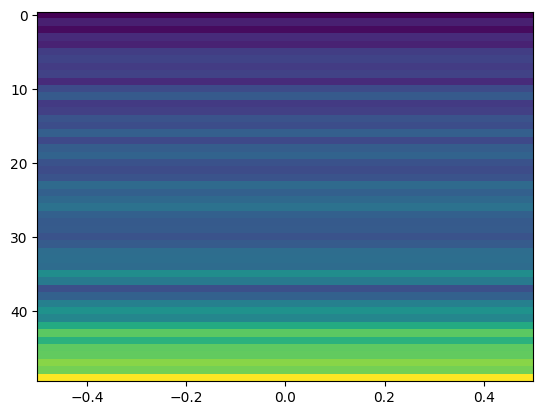

In [32]:
# Instantiate the optimizer for both networks
# (learning_rate=0.0002, beta_1=0.5 are recommended)
generator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)
discriminator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)

# Define the loss functions for the discriminator,
# which should be (fake_loss - real_loss).
# We will add the gradient penalty later to this loss function.
def discriminator_loss(real_img, fake_img):
    real_loss = tf.reduce_mean(real_img)
    fake_loss = tf.reduce_mean(fake_img)
    return fake_loss - real_loss


# Define the loss functions for the generator.
def generator_loss(fake_img):
    return -tf.reduce_mean(fake_img)


# Set the number of epochs for trainining.
epochs = 1000

# Instantiate the customer `GANMonitor` Keras callback.

## UNCOMMENT FOR COMPLETE CODE
cbk = GANMonitor(num_img=1, latent_dim=noise_dim)

# Instantiate the WGAN model.
wgan = WGAN(
    discriminator=discriminator1,
    generator=generator1,
    latent_dim=noise_dim,
    discriminator_extra_steps=5,
)

# Compile the WGAN model.
wgan.compile(
    d_optimizer=discriminator_optimizer,
    g_optimizer=generator_optimizer,
    g_loss_fn=generator_loss,
    d_loss_fn=discriminator_loss,
)

# Start training the model.
wgan.fit(train_images, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[cbk])


In [33]:
generator1.save("generator_model1_1000epoch")

WGAN2

In [35]:
import math

elastic_crosssection = []
ionization_crosssection = []
excitation_crosssection = []
elastic_energy = []
ionization_energy = []
excitation_energy = []

for species in loaded_json:
    elastic_crosssection.append(species['elastic']['crosssection'])
    ionization_crosssection.append(species['ionization']['crosssection'])
    excitation_crosssection.append(species['excitation']['crosssection'])
    elastic_energy.append(species['elastic']['energy'])
    ionization_energy.append(species['ionization']['energy'])
    excitation_energy.append(species['excitation']['energy'])

elastic_crosssection = np.array(elastic_crosssection)
ionization_crosssection = np.array(ionization_crosssection)
excitation_crosssection = np.array(excitation_crosssection)
crosssection_data = np.stack([elastic_crosssection,ionization_crosssection,excitation_crosssection], axis=2)
crosssection_data = np.swapaxes(crosssection_data,1,2)

crosssection_data = crosssection_data + 10**-25
crosssection_data = np.log(crosssection_data)

# Normalizing between -1 and 1 by min max

min_crosssection = np.amin(crosssection_data,axis=(0,2),keepdims=True)

max_crosssection = np.amax(crosssection_data,axis=(0,2),keepdims=True)

crosssection_data = 2*(crosssection_data - min_crosssection)/(max_crosssection - min_crosssection) - 1

# y = 2*(x-min)/(max-min) - 1
# x = (y+1)*(max-min)/2 + min

print("Shape of min_crosssection :",min_crosssection.shape)
print("Shape of max_crosssection :",max_crosssection.shape)
print("Shape of crosssection_data :",crosssection_data.shape)


Shape of min_crosssection : (1, 3, 1)
Shape of max_crosssection : (1, 3, 1)
Shape of crosssection_data : (46, 3, 100)


In [36]:
generator1 = keras.models.load_model('/content/generator_model1_1000epoch/')

In [37]:
noise_dim = 10
BATCH_SIZE = 10
train_images = crosssection_data[:,0,:]
train_images = train_images.reshape(crosssection_data.shape[0],crosssection_data.shape[2],1)
train_images = train_images.reshape(train_images.shape[0], *(100,1,1)).astype("float32")
np.random.shuffle(train_images)
D = 32
train_images.shape

(46, 100, 1, 1)

In [38]:
def make_discriminator2():
    input_img = layers.Input(shape=(100,1,1))

    x = layers.Reshape((100,1))(input_img)

    x = layers.Conv1D(D, 5, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv1D(D*2, 5, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv1D(D*4, 5, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv1D(D*8, 5, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv1D(D*16, 5, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

#     x = layers.Conv1D(D*32, 5, strides=2, padding='same')(x)
#     x = layers.LeakyReLU(0.2)(x)

    x = layers.Flatten()(x)
    x = layers.Dense(1)(x)

    discriminator2 = keras.models.Model(input_img, x, name="discriminator2")
    return discriminator2

discriminator2 = make_discriminator2()
discriminator2.summary()

Model: "discriminator2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 100, 1, 1)]       0         
                                                                 
 reshape_3 (Reshape)         (None, 100, 1)            0         
                                                                 
 conv1d_11 (Conv1D)          (None, 50, 32)            192       
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 50, 32)            0         
                                                                 
 conv1d_12 (Conv1D)          (None, 25, 64)            10304     
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 25, 64)            0         
                                                                 
 conv1d_13 (Conv1D)          (None, 13, 128)        

In [39]:
D = 16

def make_generator2():
    noise = layers.Input(shape=(50,1,1))

    x = layers.Reshape((50,1))(noise)

    x = layers.Conv1D(16 * D, 10, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv1D(8 * D, 10, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv1D(4 * D, 10, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv1D(2 * D, 10, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv1D(1 , 10, strides=1, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(2 * D, 10, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(4 * D, 10, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Cropping1D(1)(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(4 * D, 10, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Cropping1D(1)(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(8 * D, 10, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Cropping1D(1)(x)

    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(1, 10, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("tanh")(x)

    x = layers.Reshape((100,1,1))(x)

    generator2 = keras.models.Model(noise, x, name="generator2")
    return generator2

generator2 = make_generator2()
generator2.summary()

Model: "generator2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 50, 1, 1)]        0         
                                                                 
 reshape_4 (Reshape)         (None, 50, 1)             0         
                                                                 
 conv1d_16 (Conv1D)          (None, 25, 256)           2816      
                                                                 
 batch_normalization_1 (Batc  (None, 25, 256)          1024      
 hNormalization)                                                 
                                                                 
 activation_8 (Activation)   (None, 25, 256)           0         
                                                                 
 conv1d_17 (Conv1D)          (None, 13, 128)           327808    
                                                        

In [40]:
class WGAN(keras.Model):
    def __init__(
        self,
        discriminator,
        generator,
        latent_dim,
        discriminator_extra_steps=5,
        gp_weight=10.0,
    ):
        super(WGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_steps = discriminator_extra_steps
        self.gp_weight = gp_weight

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    def gradient_penalty(self, batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        This loss is calculated on an interpolated image
        and added to the discriminator loss.
        """
        # Get the interpolated image

        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 1. Get the discriminator output for this interpolated image.
            pred = self.discriminator(interpolated, training=True)

        # 2. Calculate the gradients w.r.t to this interpolated image.
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 3. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_images = real_images[0]

        # Get the batch size
        batch_size = tf.shape(real_images)[0]

        # For each batch, we are going to perform the
        # following steps as laid out in the original paper:
        # 1. Train the generator and get the generator loss
        # 2. Train the discriminator and get the discriminator loss
        # 3. Calculate the gradient penalty
        # 4. Multiply this gradient penalty with a constant weight factor
        # 5. Add the gradient penalty to the discriminator loss
        # 6. Return the generator and discriminator losses as a loss dictionary

        # Train the discriminator first. The original paper recommends training
        # the discriminator for `x` more steps (typically 5) as compared to
        # one step of the generator. Here we will train it for 3 extra steps
        # as compared to 5 to reduce the training time.
        for i in range(self.d_steps):
            # Get the latent vector
            random_latent_vectors = generator1(tf.random.normal(
                shape=(batch_size, self.latent_dim)), training=False)
            with tf.GradientTape() as tape:
                # Generate fake images from the latent vector
                fake_images = self.generator(random_latent_vectors, training=True)
                # Get the logits for the fake images
                fake_logits = self.discriminator(fake_images, training=True)
                # Get the logits for the real images
                real_logits = self.discriminator(real_images, training=True)

                # Calculate the discriminator loss using the fake and real image logits
                d_cost = self.d_loss_fn(real_img=real_logits, fake_img=fake_logits)
                # Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # Add the gradient penalty to the original discriminator loss
                d_loss = d_cost + gp * self.gp_weight

            # Get the gradients w.r.t the discriminator loss
            d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
            # Update the weights of the discriminator using the discriminator optimizer
            self.d_optimizer.apply_gradients(
                zip(d_gradient, self.discriminator.trainable_variables)
            )

        # Train the generator
        # Get the latent vector
        random_latent_vectors = generator1(tf.random.normal(
                shape=(batch_size, self.latent_dim)), training=False)
        with tf.GradientTape() as tape:
            # Generate fake images using the generator
            generated_images = self.generator(random_latent_vectors, training=True)
            # Get the discriminator logits for fake images
            gen_img_logits = self.discriminator(generated_images, training=True)
            # Calculate the generator loss
            g_loss = self.g_loss_fn(gen_img_logits)

        # Get the gradients w.r.t the generator loss
        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update the weights of the generator using the generator optimizer
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )
        return {"d_loss": d_loss, "g_loss": g_loss}

In [41]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=6, latent_dim=noise_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = generator1(tf.random.normal(
                shape=(BATCH_SIZE, self.latent_dim)), training=False)
        generated_images = self.model.generator(random_latent_vectors)

        plt.figure()
        for i in range(self.num_img):
            img = generated_images[i].numpy()
            plt.plot(img[:,:,0])
        #plt.savefig("D:\\BTP\\elastic_generated_series\\{epoch}.jpg".format(epoch=epoch))
        plt.close()

In [42]:
# Instantiate the optimizer for both networks
# (learning_rate=0.0002, beta_1=0.5 are recommended)
generator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)
discriminator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)

# Define the loss functions for the discriminator,
# which should be (fake_loss - real_loss).
# We will add the gradient penalty later to this loss function.
def discriminator_loss(real_img, fake_img):
    real_loss = tf.reduce_mean(real_img)
    fake_loss = tf.reduce_mean(fake_img)
    return fake_loss - real_loss


# Define the loss functions for the generator.
def generator_loss(fake_img):
    return -tf.reduce_mean(fake_img)


# Set the number of epochs for trainining.
epochs = 1000

# Instantiate the customer `GANMonitor` Keras callback.

## UNCOMMENT FOR COMPLETE CODE
cbk = GANMonitor(num_img=3, latent_dim=noise_dim)

# Instantiate the WGAN model.
wgan2 = WGAN(
    discriminator=discriminator2,
    generator=generator2,
    latent_dim=noise_dim,
    discriminator_extra_steps=5,
)

# Compile the WGAN model.
wgan2.compile(
    d_optimizer=discriminator_optimizer,
    g_optimizer=generator_optimizer,
    g_loss_fn=generator_loss,
    d_loss_fn=discriminator_loss,
)

# Start training the model.
wgan2.fit(train_images, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[cbk])

Epoch 1/1000
5/5 [==============================] - 51s 2s/step - d_loss: 3.5015 - g_loss: 0.0477
Epoch 2/1000
5/5 [==============================] - 5s 958ms/step - d_loss: -1.0919 - g_loss: 2.1449
Epoch 3/1000
5/5 [==============================] - 6s 1s/step - d_loss: -1.5621 - g_loss: 1.8994
Epoch 4/1000
5/5 [==============================] - 5s 895ms/step - d_loss: -0.8809 - g_loss: 1.0091
Epoch 5/1000
5/5 [==============================] - 5s 972ms/step - d_loss: -0.9199 - g_loss: 1.2548
Epoch 6/1000
5/5 [==============================] - 6s 952ms/step - d_loss: -0.7466 - g_loss: 0.6733
Epoch 7/1000
5/5 [==============================] - 5s 946ms/step - d_loss: -0.6623 - g_loss: 3.1262
Epoch 8/1000
5/5 [==============================] - 6s 1s/step - d_loss: -0.7532 - g_loss: 1.4762
Epoch 9/1000
5/5 [==============================] - 5s 907ms/step - d_loss: -0.8328 - g_loss: 1.8475
Epoch 10/1000
5/5 [==============================] - 5s 963ms/step - d_loss: -0.6461 - g_loss: 1.529

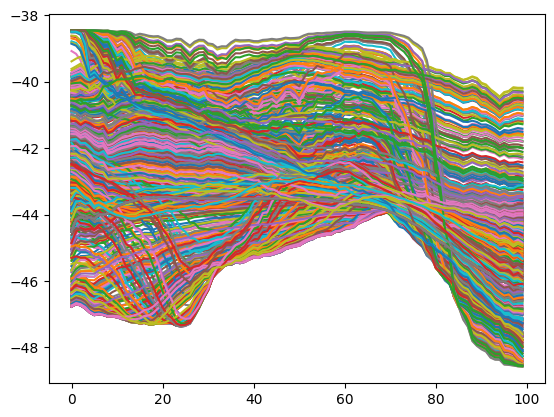

In [43]:
synth_data = []
for i in range(1000):
    x = generator2(generator1(tf.random.normal(shape=(1, noise_dim)), training=False),training=False)
    x = x.numpy()
    x = (x+1)*(max_crosssection[0]-min_crosssection[0])/2 + min_crosssection[0]
    synth_data.append(x[0,:,0,0])
    plt.plot(x[0,:,0,0])

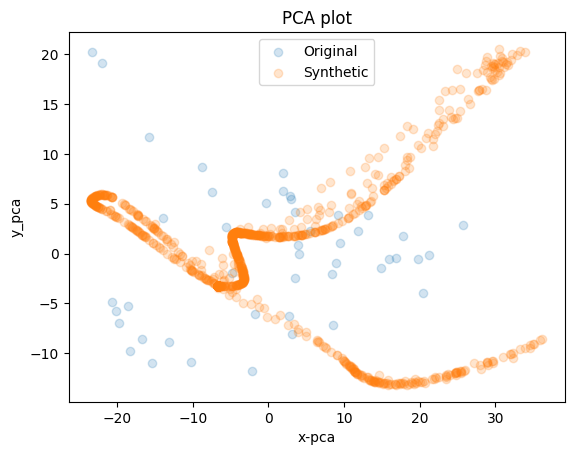

In [44]:
from sklearn.decomposition import PCA

synth_data = np.array(synth_data)
synth_data.shape

elastic_data = (crosssection_data[:,0,:]+1)*(max_crosssection[0][0]-min_crosssection[0][0])/2 + min_crosssection[0][0]
elastic_crosssection = np.log(elastic_crosssection + 10**-25)

pca = PCA(n_components=2)
pca_results = pca.fit_transform(elastic_data)
pca_hat_results = pca.fit_transform(synth_data[:1000])
f, ax = plt.subplots(1)
plt.scatter(pca_results[:,0], pca_results[:,1], alpha = 0.2, label = "Original")
plt.scatter(pca_hat_results[:,0], pca_hat_results[:,1], alpha = 0.2, label = "Synthetic")
ax.legend()
plt.title('PCA plot')
plt.xlabel('x-pca')
plt.ylabel('y_pca')
plt.show()